In [1]:
from sklearn.preprocessing import OrdinalEncoder, PolynomialFeatures
from sklearn.model_selection import GridSearchCV
from pycaret.regression import setup, compare_models
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

In [2]:
from category_encoders import MEstimateEncoder, TargetEncoder

In [3]:
from catboost import CatBoostRegressor

# Read train and test sets

In [4]:
df_train = pd.read_csv("data/train.csv")
df_test = pd.read_csv("data/test.csv")

# Store both dfs lengths

In [5]:
m_train = df_train.shape[0]
m_test = df_test.shape[0]
m_train, m_test

(1460, 1459)

# Concat the dfs

In [6]:
df = pd.concat([df_train, df_test])
assert df.shape[0] == m_train + m_test

In [7]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.0
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.0
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.0
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.0
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.0


# Save target

In [8]:
target_col, target = "SalePrice", df["SalePrice"]

#  Drop Id and target columns

In [9]:
cols_to_drop = ["Id", target_col]
df.drop(cols_to_drop, axis=1, inplace=True)

# View and fix columns data-types

In [10]:
df.select_dtypes(object).columns

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition'],
      dtype='object')

In [11]:
df.select_dtypes(np.number).columns

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold'],
      dtype='object')

In [12]:
num_to_obj_cols = ['MSSubClass', 'MoSold']
df[num_to_obj_cols] = df[num_to_obj_cols].astype(object)

In [13]:
cols_cat = df.select_dtypes(object).columns.to_list()
cols_num = df.select_dtypes(np.number).columns.to_list()

# Feature selection

In [14]:
def get_del_cols(df):
    """return the columns where no more than one value in the categorical features
    exists in the test data - those features can be ignored"""
    cols_to_drop = []
    for col in df.select_dtypes(object).columns:
        col_vals = df[col].unique()
        n_vals = len(col_vals)
        n_irrelevant = 0
        for val in col_vals:
            if val not in df[col][m_train:].values:
                n_irrelevant += 1
        if n_irrelevant >= n_vals - 1:
            cols_to_drop.append(col)
    return cols_to_drop

In [15]:
cols_to_drop = get_del_cols(df)
df.drop(cols_to_drop, axis=1, inplace=True)
for col_to_drop in cols_to_drop:
    cols_cat.remove(col_to_drop)
    print("Dropped ", col_to_drop)

Dropped  Utilities


# Impute categorical columns

In [16]:
cols_cat_na = df[cols_cat].isnull().sum()[df[cols_cat].isnull().sum() > 0]
cols_cat_na

MSZoning           4
Alley           2721
Exterior1st        1
Exterior2nd        1
MasVnrType        24
BsmtQual          81
BsmtCond          82
BsmtExposure      82
BsmtFinType1      79
BsmtFinType2      80
Electrical         1
KitchenQual        1
Functional         2
FireplaceQu     1420
GarageType       157
GarageFinish     159
GarageQual       159
GarageCond       159
PoolQC          2909
Fence           2348
MiscFeature     2814
SaleType           1
dtype: int64

In [18]:
mode_filled_cols = ["MSZoning", "Exterior1st", "Exterior2nd", "MasVnrType", "Electrical", "KitchenQual", "Functional", "SaleType"]
for col in mode_filled_cols:
    df[col].fillna(df[col].mode()[0], inplace=True)

none_filled_cols = ["Alley", "BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1", "BsmtFinType2", "FireplaceQu", "GarageType", "GarageFinish", "GarageQual", "GarageCond", "PoolQC", "Fence", "MiscFeature"]
for col in none_filled_cols:
    df[col].fillna("None", inplace=True)
    
df[cols_cat].isnull().sum().sum()

0

# Target Encoding

Thanks to https://www.kaggle.com/code/alexturkmen/preprocessing-modeling-with-stacking-top-5

In [19]:
target_encoder = MEstimateEncoder(cols = df[cols_cat], m=5.0)
df = target_encoder.fit_transform(df, target)
df[cols_cat].head()

,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,MoSold,SaleType,SaleCondition
0,238977.657827,190961.37974,181129.821096,183442.921382,164841.734387,180186.548617,176956.889290,179960.276121,197415.948255,184481.364411,...,201821.238828,187464.879164,187859.572486,186413.480282,180406.434828,187568.646942,182042.42309,178148.596131,173431.393852,175225.989177
1,185185.036931,190961.37974,181129.821096,183442.921382,164841.734387,180186.548617,178221.749605,179960.276121,220694.123716,144710.697435,...,201821.238828,187464.879164,187859.572486,186413.480282,180406.434828,187568.646942,182042.42309,172513.344399,173431.393852,175225.989177
2,238977.657827,190961.37974,181129.821096,183442.921382,205844.196277,180186.548617,176956.889290,179960.276121,197415.948255,184481.364411,...,201821.238828,187464.879164,187859.572486,186413.480282,180406.434828,187568.646942,182042.42309,194597.764404,173431.393852,175225.989177
3,167860.784299,190961.37974,181129.821096,183442.921382,205844.196277,180186.548617,181610.324550,179960.276121,207972.624633,184481.364411,...,142474.167179,187464.879164,187859.572486,186413.480282,180406.434828,187568.646942,182042.42309,178148.596131,173431.393852,148149.009240
4,238977.657827,190961.37974,181129.821096,183442.921382,205844.196277,180186.548617,178221.749605,179960.276121,318515.521292,184481.364411,...,201821.238828,187464.879164,187859.572486,186413.480282,180406.434828,187568.646942,182042.42309,186081.640304,173431.393852,175225.989177


# Impute numerical columns

In [20]:
cols_num_na = df[cols_num].isnull().sum()[df[cols_num].isnull().sum() > 0]
cols_num_na

LotFrontage     486
MasVnrArea       23
BsmtFinSF1        1
BsmtFinSF2        1
BsmtUnfSF         1
TotalBsmtSF       1
BsmtFullBath      2
BsmtHalfBath      2
GarageYrBlt     159
GarageCars        1
GarageArea        1
dtype: int64

In [21]:
zero_filled_cols = ["BsmtFinSF1", "BsmtFinSF2", "BsmtUnfSF", "TotalBsmtSF", "BsmtFullBath", "BsmtHalfBath", "GarageCars", "GarageArea"]
for col in zero_filled_cols:
    df[col].fillna(0, inplace=True)

In [27]:
# Thanks to: https://www.kaggle.com/code/t3kuwabara/houseprices-test2
df["LotFrontage"] = df.groupby("Neighborhood")["LotFrontage"].transform(lambda x: x.fillna(x.median()))

In [28]:
df["MasVnrArea"] = df.groupby("Neighborhood")["MasVnrArea"].transform(lambda x: x.fillna(x.median()))

In [29]:
df.loc[df["GarageYrBlt"].isnull(), "GarageYrBlt"] = df.loc[df["GarageYrBlt"].isnull(), "YearBuilt"]

In [30]:
cols_num_na = df[cols_num].isnull().sum()[df[cols_num].isnull().sum() > 0]
cols_num_na

Series([], dtype: int64)

In [26]:
# def catboost_imputer(df, cols_num_na):
    
#     # save columns to impute and drop them from df
#     cols_to_impute = df[cols_num_na]
#     df.drop(cols_num_na, axis=1, inplace=True)
    
#     for col in cols_num_na:
#         # define X and y
#         X, y = df.copy(), cols_to_impute[col]

#         # get train and test sets
#         train_indexes, test_indexes = ~y.isnull(), y.isnull()
#         X_train, X_test = X.loc[train_indexes, :], X.loc[test_indexes, :]
#         y_train, y_test = y.loc[train_indexes], y.loc[test_indexes]
        
#         model = CatBoostRegressor(max_depth=8, random_seed=10,
#                                   subsample=0.65, n_estimators=1000,
#                                   cat_features=cols_cat)
#         model.fit(X_train, y_train)
#         cols_to_impute.loc[test_indexes, col] = model.predict(X_test)
#         df[col] = cols_to_impute[col]
#     return df

In [ ]:
# df = catboost_imputer(df, cols_num_na.index)
# df.isnull().sum().sum()

# Feature Engineering

## Features from the Internet - prefex FE0_

In [31]:
df["FE0_HighQualSF"] = df["GrLivArea"]+df["1stFlrSF"] + df["2ndFlrSF"]+0.5*df["GarageArea"]+0.5*df["TotalBsmtSF"]+1*df["MasVnrArea"]

df["FE0_SqFtPerRoom"] = df["GrLivArea"] / (df["TotRmsAbvGrd"] +
                                           df["FullBath"] +
                                           df["HalfBath"] +
                                           df["KitchenAbvGr"])

## My features - prefex FE1_

In [32]:
n_stories_dict = {
    "1Story": 1.0,
    "1.5Fin": 1.5,
    "1.5Unf": 1.5,
    "2Story": 2.0,
    "2.5Fin": 2.5,
    "2.5Unf": 2.5,
    "SFoyer": 2.0,
    "SLvl": 2.0,
}

df["FE1_n_stories"] = df["HouseStyle"].replace(n_stories_dict)
df["FE1_n_stories"].value_counts()

176019.238002    1471
209728.091065     872
144305.559619     314
167718.942564     128
140532.428082      83
164719.123716      24
128773.998919      19
204969.690727       8
Name: FE1_n_stories, dtype: int64

In [33]:
df["FE1_age_sold"] = df["YrSold"] - df["YearBuilt"]
df["FE1_age_sold_Remod"] = df["YrSold"] - df["YearRemodAdd"]
df["FE1_GarageYrSold"] = df["YrSold"] - df["GarageYrBlt"]

In [35]:
df['FE1_total_area_hq'] = df["FE0_HighQualSF"] - df['LowQualFinSF']

# Apply polynomial features

In [36]:
cols_to_poly = ['LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'ExterQual', 'ExterCond','BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1','BsmtFinType2', 'BsmtFinSF2', 'TotalBsmtSF', 'FE1_total_area_hq', 'GrLivArea', 'FullBath', 'HalfBath', 'FE0_SqFtPerRoom', 'KitchenQual', 'KitchenAbvGr', 'Fireplaces', 'FireplaceQu', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PoolArea', 'YrSold', 'LotFrontage', 'FE0_HighQualSF',]

In [37]:
poly = PolynomialFeatures(degree=2, include_bias=False)
cols_df = df[cols_to_poly]
df.drop(cols_to_poly, axis=1, inplace=True)
cols_array = poly.fit_transform(cols_df)
cols_df = pd.DataFrame(cols_array, columns=poly.get_feature_names_out())
df = pd.concat((df.reset_index(drop=True), cols_df.reset_index(drop=True)), axis=1)

df.shape

(2919, 613)

# Split test and train

In [38]:
X_train, X_test = df[:m_train], df[m_train:]
y_train, _ = target[:m_train], target[m_train:]
n = X_train.shape[1]
X_train.shape, y_train.shape

((1460, 613), (1460,))

In [39]:
# df_ohe = pd.get_dummies(df)
# df_ohe[target_col] = target
# _ = setup(data=df_ohe[:m_train], target='SalePrice')
# best = compare_models()

# Training - CatBoost Grid Search 

In [43]:
# cat_features = df.select_dtypes(object).columns.to_list()
# model = CatBoostRegressor(random_state=10, cat_features=cat_features)
# kwargs = {
#     "n_estimators": [20_000, 25_000],
#     "max_depth": [8],
#     "subsample": [0.65],
#     "reg_lambda": [0.1], 
# }
# clf = GridSearchCV(model, kwargs, verbose=1, n_jobs=2)
# clf.fit(X_train, y_train)
# print(clf.best_score_)
# print(clf.best_params_)

Fitting 5 folds for each of 2 candidates, totalling 10 fits
0:	learn: 77217.5923131	total: 211ms	remaining: 1h 10m 11s
1:	learn: 75414.4575121	total: 295ms	remaining: 49m 9s
2:	learn: 73717.8683764	total: 435ms	remaining: 48m 22s
3:	learn: 71971.6464269	total: 563ms	remaining: 46m 54s
4:	learn: 70384.4885363	total: 681ms	remaining: 45m 22s
5:	learn: 68843.3433918	total: 798ms	remaining: 44m 17s
6:	learn: 67352.7809557	total: 931ms	remaining: 44m 17s
7:	learn: 65956.7022183	total: 1.05s	remaining: 43m 38s
8:	learn: 64501.7955519	total: 1.17s	remaining: 43m 15s
9:	learn: 63058.8472076	total: 1.31s	remaining: 43m 37s
10:	learn: 61694.7320766	total: 1.44s	remaining: 43m 41s
11:	learn: 60414.8468092	total: 1.55s	remaining: 43m
12:	learn: 59047.7323320	total: 1.68s	remaining: 43m
13:	learn: 57810.6974669	total: 1.82s	remaining: 43m 16s
14:	learn: 56566.8151120	total: 1.93s	remaining: 42m 53s
15:	learn: 55393.2632724	total: 2.07s	remaining: 43m 2s
16:	learn: 54156.1900549	total: 2.18s	remaini

0:	learn: 78781.9765067	total: 231ms	remaining: 1h 16m 52s
1:	learn: 76942.1480350	total: 366ms	remaining: 1h 55s
2:	learn: 75230.4664540	total: 472ms	remaining: 52m 27s
3:	learn: 73515.9453715	total: 615ms	remaining: 51m 12s
4:	learn: 71858.8494092	total: 745ms	remaining: 49m 39s
5:	learn: 70295.2668330	total: 850ms	remaining: 47m 11s
6:	learn: 68771.5922439	total: 990ms	remaining: 47m 7s
7:	learn: 67214.6997440	total: 1.11s	remaining: 46m 24s
8:	learn: 65768.6375555	total: 1.21s	remaining: 44m 38s
9:	learn: 64351.0650120	total: 1.34s	remaining: 44m 41s
10:	learn: 63034.5225565	total: 1.46s	remaining: 44m 20s
11:	learn: 61727.1112194	total: 1.57s	remaining: 43m 39s
12:	learn: 60415.9280436	total: 1.7s	remaining: 43m 39s
13:	learn: 59169.0617166	total: 1.81s	remaining: 43m 11s
14:	learn: 57930.7460039	total: 1.93s	remaining: 42m 50s
15:	learn: 56736.4996245	total: 2.07s	remaining: 43m 4s
16:	learn: 55563.8546797	total: 2.19s	remaining: 42m 51s
17:	learn: 54463.1450523	total: 2.31s	rema

144:	learn: 14220.5749927	total: 18s	remaining: 41m 7s
145:	learn: 14166.0412796	total: 18.1s	remaining: 41m 6s
146:	learn: 14086.9139327	total: 18.2s	remaining: 41m
147:	learn: 14028.2196565	total: 18.3s	remaining: 41m 1s
148:	learn: 13988.5070986	total: 18.5s	remaining: 41m
149:	learn: 13916.2004333	total: 18.6s	remaining: 40m 59s
150:	learn: 13871.8643313	total: 18.7s	remaining: 40m 59s
151:	learn: 13811.3475790	total: 18.8s	remaining: 40m 57s
152:	learn: 13748.4299745	total: 19s	remaining: 40m 58s
153:	learn: 13685.6894935	total: 19.1s	remaining: 40m 57s
154:	learn: 13641.9592569	total: 19.2s	remaining: 40m 57s
155:	learn: 13603.2143884	total: 19.3s	remaining: 41m
156:	learn: 13575.1917287	total: 19.5s	remaining: 41m 1s
157:	learn: 13537.6877689	total: 19.6s	remaining: 41m
158:	learn: 13485.7898912	total: 19.7s	remaining: 41m
159:	learn: 13441.2424128	total: 19.8s	remaining: 41m
160:	learn: 13404.6728780	total: 19.9s	remaining: 40m 56s
161:	learn: 13369.7476777	total: 20.1s	remaini

433:	learn: 5475.6324181	total: 54.4s	remaining: 40m 53s
434:	learn: 5461.6888719	total: 54.5s	remaining: 40m 52s
435:	learn: 5439.2525797	total: 54.7s	remaining: 40m 55s
436:	learn: 5434.1850944	total: 54.8s	remaining: 40m 55s
437:	learn: 5424.4091662	total: 54.9s	remaining: 40m 53s
438:	learn: 5406.3360298	total: 55.1s	remaining: 40m 54s
439:	learn: 5391.3921487	total: 55.2s	remaining: 40m 54s
440:	learn: 5368.8357075	total: 55.3s	remaining: 40m 53s
441:	learn: 5356.2586811	total: 55.5s	remaining: 40m 54s
442:	learn: 5339.3846864	total: 55.6s	remaining: 40m 54s
443:	learn: 5307.1609872	total: 55.7s	remaining: 40m 53s
444:	learn: 5295.2899049	total: 55.9s	remaining: 40m 55s
445:	learn: 5284.1499224	total: 56s	remaining: 40m 53s
446:	learn: 5276.5998154	total: 56.1s	remaining: 40m 52s
447:	learn: 5259.9607643	total: 56.2s	remaining: 40m 53s
448:	learn: 5245.6097544	total: 56.3s	remaining: 40m 52s
449:	learn: 5234.6907038	total: 56.5s	remaining: 40m 52s
450:	learn: 5214.5973165	total: 5

576:	learn: 3704.3828875	total: 1m 12s	remaining: 40m 41s
577:	learn: 3696.3472714	total: 1m 12s	remaining: 40m 39s
578:	learn: 3687.7943288	total: 1m 12s	remaining: 40m 39s
579:	learn: 3676.7349327	total: 1m 12s	remaining: 40m 41s
580:	learn: 3662.4565755	total: 1m 13s	remaining: 40m 40s
581:	learn: 3653.4335706	total: 1m 13s	remaining: 40m 39s
582:	learn: 3644.0439036	total: 1m 13s	remaining: 40m 39s
583:	learn: 3636.0070627	total: 1m 13s	remaining: 40m 38s
584:	learn: 3625.3204968	total: 1m 13s	remaining: 40m 38s
585:	learn: 3618.5397390	total: 1m 13s	remaining: 40m 38s
586:	learn: 3606.1591192	total: 1m 13s	remaining: 40m 38s
587:	learn: 3601.0215126	total: 1m 13s	remaining: 40m 37s
588:	learn: 3592.6170506	total: 1m 13s	remaining: 40m 37s
589:	learn: 3580.9143388	total: 1m 14s	remaining: 40m 37s
590:	learn: 3575.6647646	total: 1m 14s	remaining: 40m 36s
591:	learn: 3568.4251248	total: 1m 14s	remaining: 40m 36s
592:	learn: 3562.5750089	total: 1m 14s	remaining: 40m 35s
593:	learn: 35

717:	learn: 2637.1232169	total: 1m 30s	remaining: 40m 19s
718:	learn: 2632.9590115	total: 1m 30s	remaining: 40m 19s
719:	learn: 2628.7780352	total: 1m 30s	remaining: 40m 19s
720:	learn: 2624.1438719	total: 1m 30s	remaining: 40m 19s
721:	learn: 2618.2260424	total: 1m 30s	remaining: 40m 19s
722:	learn: 2611.6181603	total: 1m 30s	remaining: 40m 19s
723:	learn: 2601.6663623	total: 1m 30s	remaining: 40m 20s
724:	learn: 2597.6096531	total: 1m 31s	remaining: 40m 20s
725:	learn: 2589.7800819	total: 1m 31s	remaining: 40m 19s
726:	learn: 2580.1119970	total: 1m 31s	remaining: 40m 20s
727:	learn: 2572.3234733	total: 1m 31s	remaining: 40m 19s
728:	learn: 2568.4535094	total: 1m 31s	remaining: 40m 19s
729:	learn: 2559.9625808	total: 1m 31s	remaining: 40m 19s
730:	learn: 2556.4665337	total: 1m 31s	remaining: 40m 18s
731:	learn: 2550.5636074	total: 1m 31s	remaining: 40m 19s
732:	learn: 2545.1846585	total: 1m 32s	remaining: 40m 19s
733:	learn: 2541.0963921	total: 1m 32s	remaining: 40m 19s
734:	learn: 25

859:	learn: 1907.3208828	total: 1m 48s	remaining: 40m 5s
860:	learn: 1905.6775354	total: 1m 48s	remaining: 40m 4s
861:	learn: 1898.2375890	total: 1m 48s	remaining: 40m 4s
862:	learn: 1894.7720828	total: 1m 48s	remaining: 40m 4s
863:	learn: 1891.5049580	total: 1m 48s	remaining: 40m 4s
864:	learn: 1886.7771306	total: 1m 48s	remaining: 40m 4s
865:	learn: 1885.4872115	total: 1m 48s	remaining: 40m 4s
866:	learn: 1882.3562084	total: 1m 48s	remaining: 40m 3s
867:	learn: 1878.5820521	total: 1m 49s	remaining: 40m 4s
868:	learn: 1876.8976810	total: 1m 49s	remaining: 40m 4s
869:	learn: 1874.8518560	total: 1m 49s	remaining: 40m 3s
870:	learn: 1872.6326660	total: 1m 49s	remaining: 40m 3s
871:	learn: 1870.3426082	total: 1m 49s	remaining: 40m 3s
872:	learn: 1865.8995297	total: 1m 49s	remaining: 40m 3s
873:	learn: 1861.4916889	total: 1m 49s	remaining: 40m 3s
874:	learn: 1856.2714627	total: 1m 49s	remaining: 40m 3s
875:	learn: 1853.2306436	total: 1m 50s	remaining: 40m 2s
876:	learn: 1851.0096371	total:

1003:	learn: 1509.9934815	total: 2m 6s	remaining: 39m 46s
1004:	learn: 1507.2365762	total: 2m 6s	remaining: 39m 46s
1005:	learn: 1503.4152652	total: 2m 6s	remaining: 39m 47s
1006:	learn: 1500.4867780	total: 2m 6s	remaining: 39m 46s
1007:	learn: 1497.6314902	total: 2m 6s	remaining: 39m 46s
1008:	learn: 1492.8128465	total: 2m 6s	remaining: 39m 46s
1009:	learn: 1489.1077394	total: 2m 6s	remaining: 39m 46s
1010:	learn: 1486.3026341	total: 2m 7s	remaining: 39m 45s
1011:	learn: 1483.9716564	total: 2m 7s	remaining: 39m 45s
1012:	learn: 1482.2253825	total: 2m 7s	remaining: 39m 45s
1013:	learn: 1477.8508525	total: 2m 7s	remaining: 39m 45s
1014:	learn: 1473.9082419	total: 2m 7s	remaining: 39m 45s
1015:	learn: 1470.9557782	total: 2m 7s	remaining: 39m 45s
1016:	learn: 1468.0880778	total: 2m 7s	remaining: 39m 44s
1017:	learn: 1465.7083111	total: 2m 7s	remaining: 39m 44s
1018:	learn: 1464.1018030	total: 2m 8s	remaining: 39m 44s
1019:	learn: 1458.7097665	total: 2m 8s	remaining: 39m 44s
1020:	learn: 1

1142:	learn: 1097.1306443	total: 2m 23s	remaining: 39m 30s
1143:	learn: 1094.3043709	total: 2m 23s	remaining: 39m 30s
1144:	learn: 1089.4890847	total: 2m 23s	remaining: 39m 31s
1145:	learn: 1088.7333660	total: 2m 24s	remaining: 39m 30s
1146:	learn: 1086.5600092	total: 2m 24s	remaining: 39m 30s
1147:	learn: 1086.1719555	total: 2m 24s	remaining: 39m 30s
1148:	learn: 1085.1892417	total: 2m 24s	remaining: 39m 30s
1149:	learn: 1082.2191895	total: 2m 24s	remaining: 39m 29s
1150:	learn: 1080.8005499	total: 2m 24s	remaining: 39m 29s
1151:	learn: 1079.6191088	total: 2m 24s	remaining: 39m 29s
1152:	learn: 1077.8371109	total: 2m 24s	remaining: 39m 29s
1153:	learn: 1075.4422392	total: 2m 25s	remaining: 39m 28s
1154:	learn: 1072.7025729	total: 2m 25s	remaining: 39m 28s
1155:	learn: 1070.0903606	total: 2m 25s	remaining: 39m 28s
1156:	learn: 1066.9645742	total: 2m 25s	remaining: 39m 28s
1157:	learn: 1064.4032594	total: 2m 25s	remaining: 39m 28s
1158:	learn: 1064.0115296	total: 2m 25s	remaining: 39m 2

1282:	learn: 848.6548407	total: 2m 41s	remaining: 39m 11s
1283:	learn: 847.8583654	total: 2m 41s	remaining: 39m 10s
1284:	learn: 846.6089399	total: 2m 41s	remaining: 39m 11s
1285:	learn: 845.5177568	total: 2m 41s	remaining: 39m 11s
1286:	learn: 844.0614937	total: 2m 41s	remaining: 39m 10s
1287:	learn: 842.5267799	total: 2m 41s	remaining: 39m 11s
1288:	learn: 841.0331669	total: 2m 41s	remaining: 39m 10s
1289:	learn: 839.8211997	total: 2m 42s	remaining: 39m 10s
1290:	learn: 837.0630631	total: 2m 42s	remaining: 39m 11s
1291:	learn: 835.3779236	total: 2m 42s	remaining: 39m 10s
1292:	learn: 833.7424806	total: 2m 42s	remaining: 39m 10s
1293:	learn: 831.5036749	total: 2m 42s	remaining: 39m 10s
1294:	learn: 830.3671876	total: 2m 42s	remaining: 39m 10s
1295:	learn: 829.0668977	total: 2m 42s	remaining: 39m 10s
1296:	learn: 827.3316443	total: 2m 43s	remaining: 39m 10s
1297:	learn: 825.5119604	total: 2m 43s	remaining: 39m 10s
1298:	learn: 824.7625623	total: 2m 43s	remaining: 39m 10s
1299:	learn: 8

1424:	learn: 657.5646980	total: 2m 59s	remaining: 38m 54s
1425:	learn: 656.4510075	total: 2m 59s	remaining: 38m 54s
1426:	learn: 655.2034414	total: 2m 59s	remaining: 38m 54s
1427:	learn: 653.5317277	total: 2m 59s	remaining: 38m 54s
1428:	learn: 653.0524175	total: 2m 59s	remaining: 38m 54s
1429:	learn: 651.5442650	total: 2m 59s	remaining: 38m 54s
1430:	learn: 650.1961107	total: 2m 59s	remaining: 38m 53s
1431:	learn: 648.8214797	total: 3m	remaining: 38m 54s
1432:	learn: 647.5567769	total: 3m	remaining: 38m 53s
1433:	learn: 646.2711418	total: 3m	remaining: 38m 53s
1434:	learn: 645.2973232	total: 3m	remaining: 38m 53s
1435:	learn: 644.4146636	total: 3m	remaining: 38m 53s
1436:	learn: 642.6027545	total: 3m	remaining: 38m 52s
1437:	learn: 641.1177947	total: 3m	remaining: 38m 52s
1438:	learn: 640.3191470	total: 3m	remaining: 38m 52s
1439:	learn: 639.8950062	total: 3m	remaining: 38m 52s
1440:	learn: 638.1204576	total: 3m 1s	remaining: 38m 52s
1441:	learn: 636.1882235	total: 3m 1s	remaining: 38

1567:	learn: 517.1037350	total: 3m 17s	remaining: 38m 38s
1568:	learn: 516.4587141	total: 3m 17s	remaining: 38m 38s
1569:	learn: 515.6219146	total: 3m 17s	remaining: 38m 38s
1570:	learn: 514.6524731	total: 3m 17s	remaining: 38m 38s
1571:	learn: 513.9938204	total: 3m 17s	remaining: 38m 37s
1572:	learn: 513.5958782	total: 3m 17s	remaining: 38m 37s
1573:	learn: 512.6818214	total: 3m 17s	remaining: 38m 37s
1574:	learn: 511.0850033	total: 3m 18s	remaining: 38m 37s
1575:	learn: 510.3605971	total: 3m 18s	remaining: 38m 37s
1576:	learn: 509.3147578	total: 3m 18s	remaining: 38m 37s
1577:	learn: 508.9145714	total: 3m 18s	remaining: 38m 37s
1578:	learn: 507.6121470	total: 3m 18s	remaining: 38m 37s
1579:	learn: 506.8533694	total: 3m 18s	remaining: 38m 37s
1580:	learn: 506.2581354	total: 3m 18s	remaining: 38m 36s
1581:	learn: 505.4088671	total: 3m 18s	remaining: 38m 36s
1582:	learn: 503.8278264	total: 3m 19s	remaining: 38m 36s
1583:	learn: 503.3989801	total: 3m 19s	remaining: 38m 36s
1584:	learn: 5

1708:	learn: 421.4819363	total: 3m 35s	remaining: 38m 27s
1709:	learn: 419.8242836	total: 3m 35s	remaining: 38m 27s
1710:	learn: 419.1096973	total: 3m 35s	remaining: 38m 27s
1711:	learn: 418.5734090	total: 3m 35s	remaining: 38m 26s
1712:	learn: 417.6956771	total: 3m 36s	remaining: 38m 26s
1713:	learn: 417.4546636	total: 3m 36s	remaining: 38m 26s
1714:	learn: 416.5645814	total: 3m 36s	remaining: 38m 26s
1715:	learn: 415.7488018	total: 3m 36s	remaining: 38m 26s
1716:	learn: 414.6547124	total: 3m 36s	remaining: 38m 26s
1717:	learn: 414.5010731	total: 3m 36s	remaining: 38m 26s
1718:	learn: 414.0383474	total: 3m 36s	remaining: 38m 25s
1719:	learn: 413.7484206	total: 3m 36s	remaining: 38m 26s
1720:	learn: 413.6146223	total: 3m 37s	remaining: 38m 26s
1721:	learn: 413.1344405	total: 3m 37s	remaining: 38m 25s
1722:	learn: 412.9318863	total: 3m 37s	remaining: 38m 26s
1723:	learn: 412.2033043	total: 3m 37s	remaining: 38m 25s
1724:	learn: 411.5216277	total: 3m 37s	remaining: 38m 25s
1725:	learn: 4

1849:	learn: 346.4122604	total: 3m 53s	remaining: 38m 14s
1850:	learn: 345.7400571	total: 3m 54s	remaining: 38m 14s
1851:	learn: 345.2255489	total: 3m 54s	remaining: 38m 14s
1852:	learn: 344.6097834	total: 3m 54s	remaining: 38m 14s
1853:	learn: 344.2504178	total: 3m 54s	remaining: 38m 13s
1854:	learn: 343.7806807	total: 3m 54s	remaining: 38m 14s
1855:	learn: 343.3943227	total: 3m 54s	remaining: 38m 13s
1856:	learn: 343.2127156	total: 3m 54s	remaining: 38m 13s
1857:	learn: 342.7473578	total: 3m 54s	remaining: 38m 13s
1858:	learn: 341.6564976	total: 3m 55s	remaining: 38m 13s
1859:	learn: 341.4927065	total: 3m 55s	remaining: 38m 13s
1860:	learn: 341.0159840	total: 3m 55s	remaining: 38m 13s
1861:	learn: 340.6491313	total: 3m 55s	remaining: 38m 12s
1862:	learn: 340.2456806	total: 3m 55s	remaining: 38m 12s
1863:	learn: 339.8895718	total: 3m 55s	remaining: 38m 12s
1864:	learn: 339.6306127	total: 3m 55s	remaining: 38m 12s
1865:	learn: 339.4630758	total: 3m 55s	remaining: 38m 12s
1866:	learn: 3

1994:	learn: 281.1704194	total: 4m 12s	remaining: 37m 58s
1995:	learn: 281.0172134	total: 4m 12s	remaining: 37m 58s
1996:	learn: 280.8451485	total: 4m 12s	remaining: 37m 58s
1997:	learn: 280.2846839	total: 4m 12s	remaining: 37m 58s
1998:	learn: 279.6606500	total: 4m 13s	remaining: 37m 58s
1999:	learn: 279.5275187	total: 4m 13s	remaining: 37m 58s
2000:	learn: 279.1155314	total: 4m 13s	remaining: 37m 57s
2001:	learn: 278.6209772	total: 4m 13s	remaining: 37m 57s
2002:	learn: 277.7972405	total: 4m 13s	remaining: 37m 57s
2003:	learn: 277.5806953	total: 4m 13s	remaining: 37m 57s
2004:	learn: 277.1007763	total: 4m 13s	remaining: 37m 57s
2005:	learn: 276.9370110	total: 4m 13s	remaining: 37m 57s
2006:	learn: 276.6402933	total: 4m 13s	remaining: 37m 57s
2007:	learn: 276.3188206	total: 4m 14s	remaining: 37m 57s
2008:	learn: 275.9484189	total: 4m 14s	remaining: 37m 56s
2009:	learn: 275.2035086	total: 4m 14s	remaining: 37m 56s
2010:	learn: 274.7393354	total: 4m 14s	remaining: 37m 56s
2011:	learn: 2

2135:	learn: 233.1402438	total: 4m 30s	remaining: 37m 43s
2136:	learn: 233.0407583	total: 4m 30s	remaining: 37m 43s
2137:	learn: 232.8985296	total: 4m 30s	remaining: 37m 43s
2138:	learn: 232.5259563	total: 4m 31s	remaining: 37m 43s
2139:	learn: 231.9059282	total: 4m 31s	remaining: 37m 43s
2140:	learn: 231.6864424	total: 4m 31s	remaining: 37m 43s
2141:	learn: 231.4684740	total: 4m 31s	remaining: 37m 42s
2142:	learn: 231.2606692	total: 4m 31s	remaining: 37m 42s
2143:	learn: 231.1329766	total: 4m 31s	remaining: 37m 42s
2144:	learn: 230.5990827	total: 4m 31s	remaining: 37m 42s
2145:	learn: 230.4233828	total: 4m 31s	remaining: 37m 42s
2146:	learn: 229.7455884	total: 4m 32s	remaining: 37m 42s
2147:	learn: 229.4673313	total: 4m 32s	remaining: 37m 42s
2148:	learn: 229.1419404	total: 4m 32s	remaining: 37m 42s
2149:	learn: 228.8649601	total: 4m 32s	remaining: 37m 42s
2150:	learn: 228.5562016	total: 4m 32s	remaining: 37m 42s
2151:	learn: 228.2193041	total: 4m 32s	remaining: 37m 42s
2152:	learn: 2

2276:	learn: 194.9228838	total: 4m 48s	remaining: 37m 28s
2277:	learn: 194.5545250	total: 4m 49s	remaining: 37m 28s
2278:	learn: 194.4149673	total: 4m 49s	remaining: 37m 28s
2279:	learn: 194.2250622	total: 4m 49s	remaining: 37m 27s
2280:	learn: 194.0821913	total: 4m 49s	remaining: 37m 28s
2281:	learn: 193.9097616	total: 4m 49s	remaining: 37m 27s
2282:	learn: 193.7600549	total: 4m 49s	remaining: 37m 27s
2283:	learn: 193.1865783	total: 4m 49s	remaining: 37m 27s
2284:	learn: 193.0529154	total: 4m 49s	remaining: 37m 27s
2285:	learn: 192.8919475	total: 4m 50s	remaining: 37m 27s
2286:	learn: 192.3068507	total: 4m 50s	remaining: 37m 27s
2287:	learn: 192.0603774	total: 4m 50s	remaining: 37m 27s
2288:	learn: 191.7827584	total: 4m 50s	remaining: 37m 26s
2289:	learn: 191.6474339	total: 4m 50s	remaining: 37m 26s
2290:	learn: 191.3826010	total: 4m 50s	remaining: 37m 26s
2291:	learn: 191.0455952	total: 4m 50s	remaining: 37m 26s
2292:	learn: 190.3358216	total: 4m 50s	remaining: 37m 26s
2293:	learn: 1

2418:	learn: 162.8634721	total: 5m 7s	remaining: 37m 12s
2419:	learn: 162.6192690	total: 5m 7s	remaining: 37m 11s
2420:	learn: 162.4650378	total: 5m 7s	remaining: 37m 11s
2421:	learn: 162.3753422	total: 5m 7s	remaining: 37m 11s
2422:	learn: 162.1237385	total: 5m 7s	remaining: 37m 11s
2423:	learn: 162.0576127	total: 5m 7s	remaining: 37m 11s
2424:	learn: 161.9269631	total: 5m 7s	remaining: 37m 11s
2425:	learn: 161.8857354	total: 5m 8s	remaining: 37m 11s
2426:	learn: 161.7096907	total: 5m 8s	remaining: 37m 11s
2427:	learn: 161.6070810	total: 5m 8s	remaining: 37m 11s
2428:	learn: 161.3758273	total: 5m 8s	remaining: 37m 10s
2429:	learn: 160.9757184	total: 5m 8s	remaining: 37m 10s
2430:	learn: 160.7603570	total: 5m 8s	remaining: 37m 10s
2431:	learn: 160.4401597	total: 5m 8s	remaining: 37m 10s
2432:	learn: 160.3776238	total: 5m 8s	remaining: 37m 10s
2433:	learn: 160.0690979	total: 5m 9s	remaining: 37m 10s
2434:	learn: 159.8744272	total: 5m 9s	remaining: 37m 10s
2435:	learn: 159.7854579	total:

2561:	learn: 136.6328483	total: 5m 25s	remaining: 36m 56s
2562:	learn: 136.5036265	total: 5m 25s	remaining: 36m 56s
2563:	learn: 136.3965556	total: 5m 25s	remaining: 36m 56s
2564:	learn: 136.1897950	total: 5m 25s	remaining: 36m 55s
2565:	learn: 136.0865420	total: 5m 26s	remaining: 36m 55s
2566:	learn: 136.0238245	total: 5m 26s	remaining: 36m 55s
2567:	learn: 135.8859876	total: 5m 26s	remaining: 36m 55s
2568:	learn: 135.5460213	total: 5m 26s	remaining: 36m 55s
2569:	learn: 135.3912907	total: 5m 26s	remaining: 36m 55s
2570:	learn: 135.2381887	total: 5m 26s	remaining: 36m 55s
2571:	learn: 134.7471405	total: 5m 26s	remaining: 36m 55s
2572:	learn: 134.6556410	total: 5m 27s	remaining: 36m 54s
2573:	learn: 134.5428476	total: 5m 27s	remaining: 36m 54s
2574:	learn: 134.4037145	total: 5m 27s	remaining: 36m 54s
2575:	learn: 134.3390945	total: 5m 27s	remaining: 36m 54s
2576:	learn: 134.1944868	total: 5m 27s	remaining: 36m 54s
2577:	learn: 133.9664317	total: 5m 27s	remaining: 36m 54s
2578:	learn: 1

2702:	learn: 115.4630296	total: 5m 43s	remaining: 36m 39s
2703:	learn: 115.3920027	total: 5m 43s	remaining: 36m 39s
2704:	learn: 115.0487675	total: 5m 43s	remaining: 36m 39s
2705:	learn: 114.9755745	total: 5m 44s	remaining: 36m 38s
2706:	learn: 114.8654591	total: 5m 44s	remaining: 36m 39s
2707:	learn: 114.8309610	total: 5m 44s	remaining: 36m 39s
2708:	learn: 114.7438080	total: 5m 44s	remaining: 36m 38s
2709:	learn: 114.5721533	total: 5m 44s	remaining: 36m 38s
2710:	learn: 114.5357695	total: 5m 44s	remaining: 36m 38s
2711:	learn: 114.4932707	total: 5m 44s	remaining: 36m 38s
2712:	learn: 114.3487815	total: 5m 45s	remaining: 36m 38s
2713:	learn: 114.2125701	total: 5m 45s	remaining: 36m 38s
2714:	learn: 114.0907467	total: 5m 45s	remaining: 36m 38s
2715:	learn: 113.8998212	total: 5m 45s	remaining: 36m 38s
2716:	learn: 113.8018431	total: 5m 45s	remaining: 36m 38s
2717:	learn: 113.6561267	total: 5m 45s	remaining: 36m 37s
2718:	learn: 113.5852143	total: 5m 45s	remaining: 36m 37s
2719:	learn: 1

2844:	learn: 97.2653000	total: 6m 2s	remaining: 36m 23s
2845:	learn: 97.1899790	total: 6m 2s	remaining: 36m 23s
2846:	learn: 97.0760143	total: 6m 2s	remaining: 36m 22s
2847:	learn: 96.9447646	total: 6m 2s	remaining: 36m 22s
2848:	learn: 96.8833703	total: 6m 2s	remaining: 36m 22s
2849:	learn: 96.8280271	total: 6m 2s	remaining: 36m 22s
2850:	learn: 96.7442111	total: 6m 2s	remaining: 36m 22s
2851:	learn: 96.5382824	total: 6m 2s	remaining: 36m 22s
2852:	learn: 96.4329029	total: 6m 3s	remaining: 36m 22s
2853:	learn: 96.4039998	total: 6m 3s	remaining: 36m 22s
2854:	learn: 96.2750389	total: 6m 3s	remaining: 36m 22s
2855:	learn: 96.1284935	total: 6m 3s	remaining: 36m 21s
2856:	learn: 96.0825197	total: 6m 3s	remaining: 36m 22s
2857:	learn: 95.9964800	total: 6m 3s	remaining: 36m 21s
2858:	learn: 95.8891253	total: 6m 3s	remaining: 36m 21s
2859:	learn: 95.7821812	total: 6m 4s	remaining: 36m 21s
2860:	learn: 95.7210026	total: 6m 4s	remaining: 36m 21s
2861:	learn: 95.5677590	total: 6m 4s	remaining: 

2989:	learn: 82.2349054	total: 6m 20s	remaining: 36m 6s
2990:	learn: 82.1582809	total: 6m 20s	remaining: 36m 6s
2991:	learn: 82.0356423	total: 6m 21s	remaining: 36m 6s
2992:	learn: 81.8074707	total: 6m 21s	remaining: 36m 5s
2993:	learn: 81.7240675	total: 6m 21s	remaining: 36m 5s
2994:	learn: 81.6621772	total: 6m 21s	remaining: 36m 5s
2995:	learn: 81.5739775	total: 6m 21s	remaining: 36m 5s
2996:	learn: 81.4662156	total: 6m 21s	remaining: 36m 5s
2997:	learn: 81.3611340	total: 6m 21s	remaining: 36m 5s
2998:	learn: 81.2702288	total: 6m 21s	remaining: 36m 5s
2999:	learn: 81.2292414	total: 6m 22s	remaining: 36m 5s
3000:	learn: 80.9840201	total: 6m 22s	remaining: 36m 5s
3001:	learn: 80.9407954	total: 6m 22s	remaining: 36m 5s
3002:	learn: 80.8445502	total: 6m 22s	remaining: 36m 4s
3003:	learn: 80.7786235	total: 6m 22s	remaining: 36m 4s
3004:	learn: 80.7120212	total: 6m 22s	remaining: 36m 4s
3005:	learn: 80.6484618	total: 6m 22s	remaining: 36m 4s
3006:	learn: 80.5208830	total: 6m 22s	remaining:

3133:	learn: 70.8065700	total: 6m 39s	remaining: 35m 49s
3134:	learn: 70.7174247	total: 6m 39s	remaining: 35m 49s
3135:	learn: 70.7024675	total: 6m 39s	remaining: 35m 49s
3136:	learn: 70.6051997	total: 6m 39s	remaining: 35m 49s
3137:	learn: 70.4452009	total: 6m 39s	remaining: 35m 49s
3138:	learn: 70.3649510	total: 6m 40s	remaining: 35m 49s
3139:	learn: 70.3097194	total: 6m 40s	remaining: 35m 49s
3140:	learn: 70.1586809	total: 6m 40s	remaining: 35m 48s
3141:	learn: 70.0742661	total: 6m 40s	remaining: 35m 48s
3142:	learn: 70.0529849	total: 6m 40s	remaining: 35m 48s
3143:	learn: 69.9827143	total: 6m 40s	remaining: 35m 48s
3144:	learn: 69.9363544	total: 6m 40s	remaining: 35m 48s
3145:	learn: 69.8259790	total: 6m 41s	remaining: 35m 48s
3146:	learn: 69.7794288	total: 6m 41s	remaining: 35m 48s
3147:	learn: 69.7448660	total: 6m 41s	remaining: 35m 48s
3148:	learn: 69.6768905	total: 6m 41s	remaining: 35m 48s
3149:	learn: 69.5473171	total: 6m 41s	remaining: 35m 47s
3150:	learn: 69.5040582	total: 

3276:	learn: 60.9568989	total: 6m 57s	remaining: 35m 31s
3277:	learn: 60.9220232	total: 6m 57s	remaining: 35m 30s
3278:	learn: 60.9010073	total: 6m 57s	remaining: 35m 30s
3279:	learn: 60.8391293	total: 6m 58s	remaining: 35m 31s
3280:	learn: 60.8095368	total: 6m 58s	remaining: 35m 30s
3281:	learn: 60.7797369	total: 6m 58s	remaining: 35m 30s
3282:	learn: 60.7012301	total: 6m 58s	remaining: 35m 30s
3283:	learn: 60.6650986	total: 6m 58s	remaining: 35m 30s
3284:	learn: 60.5983804	total: 6m 58s	remaining: 35m 30s
3285:	learn: 60.5742773	total: 6m 58s	remaining: 35m 30s
3286:	learn: 60.5575995	total: 6m 58s	remaining: 35m 30s
3287:	learn: 60.5020565	total: 6m 59s	remaining: 35m 29s
3288:	learn: 60.4845076	total: 6m 59s	remaining: 35m 29s
3289:	learn: 60.3834653	total: 6m 59s	remaining: 35m 29s
3290:	learn: 60.2267418	total: 6m 59s	remaining: 35m 29s
3291:	learn: 60.1610800	total: 6m 59s	remaining: 35m 29s
3292:	learn: 60.0324681	total: 6m 59s	remaining: 35m 29s
3293:	learn: 59.9701824	total: 

3421:	learn: 52.2571822	total: 7m 16s	remaining: 35m 12s
3422:	learn: 52.1831212	total: 7m 16s	remaining: 35m 12s
3423:	learn: 52.1019112	total: 7m 16s	remaining: 35m 12s
3424:	learn: 52.0600286	total: 7m 16s	remaining: 35m 12s
3425:	learn: 52.0362055	total: 7m 16s	remaining: 35m 12s
3426:	learn: 52.0178098	total: 7m 16s	remaining: 35m 12s
3427:	learn: 51.9660417	total: 7m 16s	remaining: 35m 12s
3428:	learn: 51.9010405	total: 7m 17s	remaining: 35m 12s
3429:	learn: 51.8915661	total: 7m 17s	remaining: 35m 11s
3430:	learn: 51.8112184	total: 7m 17s	remaining: 35m 11s
3431:	learn: 51.7978975	total: 7m 17s	remaining: 35m 11s
3432:	learn: 51.7815129	total: 7m 17s	remaining: 35m 11s
3433:	learn: 51.7046705	total: 7m 17s	remaining: 35m 11s
3434:	learn: 51.6703494	total: 7m 17s	remaining: 35m 11s
3435:	learn: 51.6376819	total: 7m 17s	remaining: 35m 11s
3436:	learn: 51.5739585	total: 7m 18s	remaining: 35m 11s
3437:	learn: 51.5249521	total: 7m 18s	remaining: 35m 11s
3438:	learn: 51.4485518	total: 

3566:	learn: 44.9512734	total: 7m 36s	remaining: 35m 1s
3567:	learn: 44.8714718	total: 7m 36s	remaining: 35m 1s
3568:	learn: 44.8421242	total: 7m 36s	remaining: 35m 1s
3569:	learn: 44.7739824	total: 7m 36s	remaining: 35m 1s
3570:	learn: 44.6878306	total: 7m 36s	remaining: 35m 1s
3571:	learn: 44.6595723	total: 7m 36s	remaining: 35m 1s
3572:	learn: 44.6413751	total: 7m 37s	remaining: 35m 1s
3573:	learn: 44.6124804	total: 7m 37s	remaining: 35m 1s
3574:	learn: 44.4987114	total: 7m 37s	remaining: 35m 1s
3575:	learn: 44.4593472	total: 7m 37s	remaining: 35m
3576:	learn: 44.4462467	total: 7m 37s	remaining: 35m 1s
3577:	learn: 44.4191762	total: 7m 37s	remaining: 35m 1s
3578:	learn: 44.3720007	total: 7m 37s	remaining: 35m
3579:	learn: 44.3180850	total: 7m 38s	remaining: 35m
3580:	learn: 44.1863438	total: 7m 38s	remaining: 35m
3581:	learn: 44.1571795	total: 7m 38s	remaining: 35m
3582:	learn: 44.0301436	total: 7m 38s	remaining: 35m
3583:	learn: 43.9408014	total: 7m 38s	remaining: 35m
3584:	learn: 

3710:	learn: 38.7760673	total: 7m 54s	remaining: 34m 44s
3711:	learn: 38.7506276	total: 7m 55s	remaining: 34m 44s
3712:	learn: 38.7305545	total: 7m 55s	remaining: 34m 44s
3713:	learn: 38.6987953	total: 7m 55s	remaining: 34m 44s
3714:	learn: 38.6914717	total: 7m 55s	remaining: 34m 44s
3715:	learn: 38.6727452	total: 7m 55s	remaining: 34m 44s
3716:	learn: 38.6597541	total: 7m 55s	remaining: 34m 44s
3717:	learn: 38.6394803	total: 7m 55s	remaining: 34m 44s
3718:	learn: 38.6248628	total: 7m 56s	remaining: 34m 43s
3719:	learn: 38.5819099	total: 7m 56s	remaining: 34m 43s
3720:	learn: 38.5734644	total: 7m 56s	remaining: 34m 43s
3721:	learn: 38.5653302	total: 7m 56s	remaining: 34m 43s
3722:	learn: 38.5424290	total: 7m 56s	remaining: 34m 43s
3723:	learn: 38.5328638	total: 7m 56s	remaining: 34m 43s
3724:	learn: 38.4445572	total: 7m 56s	remaining: 34m 42s
3725:	learn: 38.3962755	total: 7m 56s	remaining: 34m 42s
3726:	learn: 38.3719514	total: 7m 57s	remaining: 34m 42s
3727:	learn: 38.3538387	total: 

3855:	learn: 34.2454526	total: 8m 13s	remaining: 34m 26s
3856:	learn: 34.2235279	total: 8m 13s	remaining: 34m 26s
3857:	learn: 34.2092489	total: 8m 13s	remaining: 34m 26s
3858:	learn: 34.1848748	total: 8m 14s	remaining: 34m 26s
3859:	learn: 34.1561936	total: 8m 14s	remaining: 34m 26s
3860:	learn: 34.1234348	total: 8m 14s	remaining: 34m 26s
3861:	learn: 34.1111633	total: 8m 14s	remaining: 34m 26s
3862:	learn: 34.0329125	total: 8m 14s	remaining: 34m 26s
3863:	learn: 34.0132187	total: 8m 14s	remaining: 34m 25s
3864:	learn: 33.9836660	total: 8m 14s	remaining: 34m 25s
3865:	learn: 33.9046262	total: 8m 14s	remaining: 34m 25s
3866:	learn: 33.8405068	total: 8m 15s	remaining: 34m 25s
3867:	learn: 33.8121170	total: 8m 15s	remaining: 34m 25s
3868:	learn: 33.7513170	total: 8m 15s	remaining: 34m 25s
3869:	learn: 33.6919474	total: 8m 15s	remaining: 34m 25s
3870:	learn: 33.6631180	total: 8m 15s	remaining: 34m 25s
3871:	learn: 33.5769080	total: 8m 15s	remaining: 34m 25s
3872:	learn: 33.5162279	total: 

3998:	learn: 29.5003421	total: 8m 32s	remaining: 34m 9s
3999:	learn: 29.4790750	total: 8m 32s	remaining: 34m 9s
4000:	learn: 29.3795594	total: 8m 32s	remaining: 34m 9s
4001:	learn: 29.3640735	total: 8m 32s	remaining: 34m 9s
4002:	learn: 29.3519131	total: 8m 32s	remaining: 34m 9s
4003:	learn: 29.3467886	total: 8m 32s	remaining: 34m 8s
4004:	learn: 29.3230759	total: 8m 32s	remaining: 34m 8s
4005:	learn: 29.3185560	total: 8m 33s	remaining: 34m 8s
4006:	learn: 29.2109551	total: 8m 33s	remaining: 34m 8s
4007:	learn: 29.1829438	total: 8m 33s	remaining: 34m 8s
4008:	learn: 29.1771699	total: 8m 33s	remaining: 34m 8s
4009:	learn: 29.1166912	total: 8m 33s	remaining: 34m 8s
4010:	learn: 29.0592488	total: 8m 33s	remaining: 34m 8s
4011:	learn: 28.9978836	total: 8m 33s	remaining: 34m 8s
4012:	learn: 28.9368425	total: 8m 34s	remaining: 34m 7s
4013:	learn: 28.8150591	total: 8m 34s	remaining: 34m 7s
4014:	learn: 28.7988144	total: 8m 34s	remaining: 34m 7s
4015:	learn: 28.7763512	total: 8m 34s	remaining:

4143:	learn: 25.7506348	total: 8m 51s	remaining: 33m 51s
4144:	learn: 25.7446193	total: 8m 51s	remaining: 33m 51s
4145:	learn: 25.7042644	total: 8m 51s	remaining: 33m 51s
4146:	learn: 25.6874280	total: 8m 51s	remaining: 33m 51s
4147:	learn: 25.6814860	total: 8m 51s	remaining: 33m 51s
4148:	learn: 25.6481081	total: 8m 51s	remaining: 33m 51s
4149:	learn: 25.6215278	total: 8m 51s	remaining: 33m 51s
4150:	learn: 25.6010754	total: 8m 51s	remaining: 33m 51s
4151:	learn: 25.5937851	total: 8m 52s	remaining: 33m 50s
4152:	learn: 25.5535855	total: 8m 52s	remaining: 33m 50s
4153:	learn: 25.4710420	total: 8m 52s	remaining: 33m 50s
4154:	learn: 25.4607053	total: 8m 52s	remaining: 33m 50s
4155:	learn: 25.4315880	total: 8m 52s	remaining: 33m 50s
4156:	learn: 25.3956910	total: 8m 52s	remaining: 33m 50s
4157:	learn: 25.3267524	total: 8m 52s	remaining: 33m 50s
4158:	learn: 25.2911542	total: 8m 52s	remaining: 33m 50s
4159:	learn: 25.2778769	total: 8m 53s	remaining: 33m 49s
4160:	learn: 25.2086673	total: 

4288:	learn: 22.5611881	total: 9m 9s	remaining: 33m 33s
4289:	learn: 22.5453487	total: 9m 9s	remaining: 33m 33s
4290:	learn: 22.5191557	total: 9m 9s	remaining: 33m 33s
4291:	learn: 22.5100706	total: 9m 10s	remaining: 33m 33s
4292:	learn: 22.4825879	total: 9m 10s	remaining: 33m 32s
4293:	learn: 22.4730561	total: 9m 10s	remaining: 33m 32s
4294:	learn: 22.4613680	total: 9m 10s	remaining: 33m 32s
4295:	learn: 22.4202891	total: 9m 10s	remaining: 33m 32s
4296:	learn: 22.3715548	total: 9m 10s	remaining: 33m 32s
4297:	learn: 22.2823623	total: 9m 10s	remaining: 33m 32s
4298:	learn: 22.2729667	total: 9m 10s	remaining: 33m 31s
4299:	learn: 22.2260847	total: 9m 11s	remaining: 33m 31s
4300:	learn: 22.2050651	total: 9m 11s	remaining: 33m 31s
4301:	learn: 22.1884315	total: 9m 11s	remaining: 33m 31s
4302:	learn: 22.1834411	total: 9m 11s	remaining: 33m 31s
4303:	learn: 22.1764994	total: 9m 11s	remaining: 33m 31s
4304:	learn: 22.1667708	total: 9m 11s	remaining: 33m 31s
4305:	learn: 22.1416559	total: 9m 

4431:	learn: 19.7503967	total: 9m 28s	remaining: 33m 15s
4432:	learn: 19.7447604	total: 9m 28s	remaining: 33m 15s
4433:	learn: 19.7398634	total: 9m 28s	remaining: 33m 15s
4434:	learn: 19.7226580	total: 9m 28s	remaining: 33m 15s
4435:	learn: 19.6722258	total: 9m 28s	remaining: 33m 15s
4436:	learn: 19.6544563	total: 9m 28s	remaining: 33m 15s
4437:	learn: 19.6318011	total: 9m 28s	remaining: 33m 15s
4438:	learn: 19.6183563	total: 9m 29s	remaining: 33m 14s
4439:	learn: 19.5994432	total: 9m 29s	remaining: 33m 14s
4440:	learn: 19.5868463	total: 9m 29s	remaining: 33m 14s
4441:	learn: 19.5548241	total: 9m 29s	remaining: 33m 14s
4442:	learn: 19.5244924	total: 9m 29s	remaining: 33m 14s
4443:	learn: 19.5118729	total: 9m 29s	remaining: 33m 14s
4444:	learn: 19.4955930	total: 9m 29s	remaining: 33m 14s
4445:	learn: 19.4811602	total: 9m 29s	remaining: 33m 14s
4446:	learn: 19.4685384	total: 9m 30s	remaining: 33m 14s
4447:	learn: 19.4489983	total: 9m 30s	remaining: 33m 13s
4448:	learn: 19.4260330	total: 

4576:	learn: 17.4097124	total: 9m 46s	remaining: 32m 57s
4577:	learn: 17.4012882	total: 9m 47s	remaining: 32m 57s
4578:	learn: 17.3561642	total: 9m 47s	remaining: 32m 57s
4579:	learn: 17.3519221	total: 9m 47s	remaining: 32m 57s
4580:	learn: 17.3456666	total: 9m 47s	remaining: 32m 57s
4581:	learn: 17.3259664	total: 9m 47s	remaining: 32m 57s
4582:	learn: 17.2701260	total: 9m 47s	remaining: 32m 56s
4583:	learn: 17.2618159	total: 9m 47s	remaining: 32m 56s
4584:	learn: 17.2409221	total: 9m 47s	remaining: 32m 56s
4585:	learn: 17.2342453	total: 9m 48s	remaining: 32m 56s
4586:	learn: 17.2148967	total: 9m 48s	remaining: 32m 56s
4587:	learn: 17.1887964	total: 9m 48s	remaining: 32m 56s
4588:	learn: 17.1430403	total: 9m 48s	remaining: 32m 56s
4589:	learn: 17.1282885	total: 9m 48s	remaining: 32m 56s
4590:	learn: 17.1100955	total: 9m 48s	remaining: 32m 55s
4591:	learn: 17.1020697	total: 9m 48s	remaining: 32m 55s
4592:	learn: 17.0694419	total: 9m 48s	remaining: 32m 55s
4593:	learn: 17.0519730	total: 

4720:	learn: 15.2066347	total: 10m 5s	remaining: 32m 38s
4721:	learn: 15.2031371	total: 10m 5s	remaining: 32m 38s
4722:	learn: 15.1914954	total: 10m 5s	remaining: 32m 38s
4723:	learn: 15.1665818	total: 10m 5s	remaining: 32m 38s
4724:	learn: 15.1606975	total: 10m 5s	remaining: 32m 38s
4725:	learn: 15.1576855	total: 10m 5s	remaining: 32m 38s
4726:	learn: 15.1414253	total: 10m 6s	remaining: 32m 38s
4727:	learn: 15.1392133	total: 10m 6s	remaining: 32m 37s
4728:	learn: 15.1313254	total: 10m 6s	remaining: 32m 37s
4729:	learn: 15.1242378	total: 10m 6s	remaining: 32m 37s
4730:	learn: 15.1099317	total: 10m 6s	remaining: 32m 37s
4731:	learn: 15.0980471	total: 10m 6s	remaining: 32m 37s
4732:	learn: 15.0686693	total: 10m 6s	remaining: 32m 37s
4733:	learn: 15.0648028	total: 10m 6s	remaining: 32m 37s
4734:	learn: 15.0497264	total: 10m 7s	remaining: 32m 37s
4735:	learn: 15.0419681	total: 10m 7s	remaining: 32m 36s
4736:	learn: 15.0260240	total: 10m 7s	remaining: 32m 36s
4737:	learn: 14.9799385	total: 

4861:	learn: 13.4860155	total: 10m 23s	remaining: 32m 20s
4862:	learn: 13.4845618	total: 10m 23s	remaining: 32m 20s
4863:	learn: 13.4764071	total: 10m 23s	remaining: 32m 20s
4864:	learn: 13.4673526	total: 10m 23s	remaining: 32m 19s
4865:	learn: 13.4604742	total: 10m 23s	remaining: 32m 19s
4866:	learn: 13.4101154	total: 10m 23s	remaining: 32m 19s
4867:	learn: 13.4073074	total: 10m 23s	remaining: 32m 19s
4868:	learn: 13.4048363	total: 10m 24s	remaining: 32m 19s
4869:	learn: 13.3845162	total: 10m 24s	remaining: 32m 19s
4870:	learn: 13.3785541	total: 10m 24s	remaining: 32m 19s
4871:	learn: 13.3776224	total: 10m 24s	remaining: 32m 19s
4872:	learn: 13.3742305	total: 10m 24s	remaining: 32m 19s
4873:	learn: 13.3728728	total: 10m 24s	remaining: 32m 18s
4874:	learn: 13.3686013	total: 10m 24s	remaining: 32m 18s
4875:	learn: 13.3502245	total: 10m 25s	remaining: 32m 18s
4876:	learn: 13.3381372	total: 10m 25s	remaining: 32m 18s
4877:	learn: 13.3032841	total: 10m 25s	remaining: 32m 18s
4878:	learn: 1

5003:	learn: 11.8120315	total: 10m 41s	remaining: 32m 2s
5004:	learn: 11.8031557	total: 10m 41s	remaining: 32m 2s
5005:	learn: 11.7945903	total: 10m 41s	remaining: 32m 2s
5006:	learn: 11.7907424	total: 10m 41s	remaining: 32m 2s
5007:	learn: 11.7579744	total: 10m 42s	remaining: 32m 2s
5008:	learn: 11.7561604	total: 10m 42s	remaining: 32m 2s
5009:	learn: 11.7382056	total: 10m 42s	remaining: 32m 1s
5010:	learn: 11.7298778	total: 10m 42s	remaining: 32m 1s
5011:	learn: 11.7226291	total: 10m 42s	remaining: 32m 1s
5012:	learn: 11.7113911	total: 10m 42s	remaining: 32m 1s
5013:	learn: 11.7081416	total: 10m 42s	remaining: 32m 1s
5014:	learn: 11.6995694	total: 10m 43s	remaining: 32m 1s
5015:	learn: 11.6772649	total: 10m 43s	remaining: 32m 1s
5016:	learn: 11.6744828	total: 10m 43s	remaining: 32m 1s
5017:	learn: 11.6682768	total: 10m 43s	remaining: 32m 1s
5018:	learn: 11.6600419	total: 10m 43s	remaining: 32m
5019:	learn: 11.6543322	total: 10m 43s	remaining: 32m
5020:	learn: 11.6210039	total: 10m 43

5144:	learn: 10.5200541	total: 10m 59s	remaining: 31m 44s
5145:	learn: 10.5118159	total: 10m 59s	remaining: 31m 44s
5146:	learn: 10.4981444	total: 10m 59s	remaining: 31m 44s
5147:	learn: 10.4930208	total: 11m	remaining: 31m 44s
5148:	learn: 10.4859633	total: 11m	remaining: 31m 44s
5149:	learn: 10.4770907	total: 11m	remaining: 31m 44s
5150:	learn: 10.4755423	total: 11m	remaining: 31m 44s
5151:	learn: 10.4489772	total: 11m	remaining: 31m 43s
5152:	learn: 10.4398865	total: 11m	remaining: 31m 43s
5153:	learn: 10.4296731	total: 11m	remaining: 31m 43s
5154:	learn: 10.4284517	total: 11m 1s	remaining: 31m 43s
5155:	learn: 10.4243307	total: 11m 1s	remaining: 31m 43s
5156:	learn: 10.4179417	total: 11m 1s	remaining: 31m 43s
5157:	learn: 10.4064643	total: 11m 1s	remaining: 31m 43s
5158:	learn: 10.4019172	total: 11m 1s	remaining: 31m 43s
5159:	learn: 10.4014769	total: 11m 1s	remaining: 31m 42s
5160:	learn: 10.4005607	total: 11m 1s	remaining: 31m 42s
5161:	learn: 10.3893735	total: 11m 1s	remaining: 

5288:	learn: 9.3945321	total: 11m 18s	remaining: 31m 26s
5289:	learn: 9.3904242	total: 11m 18s	remaining: 31m 26s
5290:	learn: 9.3707198	total: 11m 18s	remaining: 31m 26s
5291:	learn: 9.3690184	total: 11m 18s	remaining: 31m 26s
5292:	learn: 9.3646035	total: 11m 18s	remaining: 31m 26s
5293:	learn: 9.3525278	total: 11m 18s	remaining: 31m 26s
5294:	learn: 9.3392221	total: 11m 19s	remaining: 31m 25s
5295:	learn: 9.3331435	total: 11m 19s	remaining: 31m 25s
5296:	learn: 9.3285581	total: 11m 19s	remaining: 31m 25s
5297:	learn: 9.3269772	total: 11m 19s	remaining: 31m 25s
5298:	learn: 9.3235330	total: 11m 19s	remaining: 31m 25s
5299:	learn: 9.3190091	total: 11m 19s	remaining: 31m 25s
5300:	learn: 9.2932417	total: 11m 19s	remaining: 31m 25s
5301:	learn: 9.2815969	total: 11m 20s	remaining: 31m 25s
5302:	learn: 9.2773293	total: 11m 20s	remaining: 31m 24s
5303:	learn: 9.2770389	total: 11m 20s	remaining: 31m 24s
5304:	learn: 9.2704861	total: 11m 20s	remaining: 31m 24s
5305:	learn: 9.2586464	total: 1

5431:	learn: 8.3107871	total: 11m 36s	remaining: 31m 8s
5432:	learn: 8.3060954	total: 11m 36s	remaining: 31m 8s
5433:	learn: 8.3032459	total: 11m 37s	remaining: 31m 8s
5434:	learn: 8.2876101	total: 11m 37s	remaining: 31m 8s
5435:	learn: 8.2668511	total: 11m 37s	remaining: 31m 8s
5436:	learn: 8.2545759	total: 11m 37s	remaining: 31m 8s
5437:	learn: 8.2442507	total: 11m 37s	remaining: 31m 7s
5438:	learn: 8.2371417	total: 11m 37s	remaining: 31m 7s
5439:	learn: 8.2356309	total: 11m 37s	remaining: 31m 7s
5440:	learn: 8.2275387	total: 11m 37s	remaining: 31m 7s
5441:	learn: 8.2212050	total: 11m 38s	remaining: 31m 7s
5442:	learn: 8.2118282	total: 11m 38s	remaining: 31m 7s
5443:	learn: 8.1866631	total: 11m 38s	remaining: 31m 7s
5444:	learn: 8.1827677	total: 11m 38s	remaining: 31m 6s
5445:	learn: 8.1811374	total: 11m 38s	remaining: 31m 6s
5446:	learn: 8.1773663	total: 11m 38s	remaining: 31m 6s
5447:	learn: 8.1742458	total: 11m 38s	remaining: 31m 6s
5448:	learn: 8.1716499	total: 11m 38s	remaining:

5576:	learn: 7.3073546	total: 11m 55s	remaining: 30m 50s
5577:	learn: 7.2840190	total: 11m 55s	remaining: 30m 50s
5578:	learn: 7.2807007	total: 11m 55s	remaining: 30m 49s
5579:	learn: 7.2786615	total: 11m 55s	remaining: 30m 49s
5580:	learn: 7.2755924	total: 11m 55s	remaining: 30m 49s
5581:	learn: 7.2625619	total: 11m 56s	remaining: 30m 49s
5582:	learn: 7.2582850	total: 11m 56s	remaining: 30m 49s
5583:	learn: 7.2533804	total: 11m 56s	remaining: 30m 49s
5584:	learn: 7.2468623	total: 11m 56s	remaining: 30m 49s
5585:	learn: 7.2413650	total: 11m 56s	remaining: 30m 49s
5586:	learn: 7.2383242	total: 11m 56s	remaining: 30m 49s
5587:	learn: 7.2300460	total: 11m 56s	remaining: 30m 48s
5588:	learn: 7.2220928	total: 11m 57s	remaining: 30m 48s
5589:	learn: 7.2192516	total: 11m 57s	remaining: 30m 48s
5590:	learn: 7.2168855	total: 11m 57s	remaining: 30m 48s
5591:	learn: 7.2002771	total: 11m 57s	remaining: 30m 48s
5592:	learn: 7.1966581	total: 11m 57s	remaining: 30m 48s
5593:	learn: 7.1942474	total: 1

5721:	learn: 6.4335476	total: 12m 14s	remaining: 30m 32s
5722:	learn: 6.4224916	total: 12m 14s	remaining: 30m 32s
5723:	learn: 6.4215854	total: 12m 14s	remaining: 30m 31s
5724:	learn: 6.4112367	total: 12m 14s	remaining: 30m 31s
5725:	learn: 6.4083468	total: 12m 14s	remaining: 30m 31s
5726:	learn: 6.4007537	total: 12m 14s	remaining: 30m 31s
5727:	learn: 6.3956211	total: 12m 14s	remaining: 30m 31s
5728:	learn: 6.3942560	total: 12m 15s	remaining: 30m 31s
5729:	learn: 6.3926108	total: 12m 15s	remaining: 30m 30s
5730:	learn: 6.3884226	total: 12m 15s	remaining: 30m 30s
5731:	learn: 6.3832486	total: 12m 15s	remaining: 30m 30s
5732:	learn: 6.3788004	total: 12m 15s	remaining: 30m 30s
5733:	learn: 6.3654303	total: 12m 15s	remaining: 30m 30s
5734:	learn: 6.3642397	total: 12m 15s	remaining: 30m 30s
5735:	learn: 6.3621583	total: 12m 15s	remaining: 30m 30s
5736:	learn: 6.3619873	total: 12m 16s	remaining: 30m 30s
5737:	learn: 6.3585965	total: 12m 16s	remaining: 30m 29s
5738:	learn: 6.3467844	total: 1

5864:	learn: 5.6764130	total: 12m 32s	remaining: 30m 13s
5865:	learn: 5.6734495	total: 12m 32s	remaining: 30m 13s
5866:	learn: 5.6691680	total: 12m 32s	remaining: 30m 13s
5867:	learn: 5.6533887	total: 12m 32s	remaining: 30m 13s
5868:	learn: 5.6461635	total: 12m 33s	remaining: 30m 13s
5869:	learn: 5.6445810	total: 12m 33s	remaining: 30m 13s
5870:	learn: 5.6327292	total: 12m 33s	remaining: 30m 12s
5871:	learn: 5.6300810	total: 12m 33s	remaining: 30m 12s
5872:	learn: 5.6231571	total: 12m 33s	remaining: 30m 12s
5873:	learn: 5.6176107	total: 12m 33s	remaining: 30m 12s
5874:	learn: 5.6156276	total: 12m 33s	remaining: 30m 12s
5875:	learn: 5.6117481	total: 12m 33s	remaining: 30m 12s
5876:	learn: 5.6055610	total: 12m 34s	remaining: 30m 12s
5877:	learn: 5.6003803	total: 12m 34s	remaining: 30m 11s
5878:	learn: 5.5961316	total: 12m 34s	remaining: 30m 11s
5879:	learn: 5.5951206	total: 12m 34s	remaining: 30m 11s
5880:	learn: 5.5926182	total: 12m 34s	remaining: 30m 11s
5881:	learn: 5.5903067	total: 1

6009:	learn: 4.9791021	total: 12m 51s	remaining: 29m 55s
6010:	learn: 4.9761985	total: 12m 51s	remaining: 29m 55s
6011:	learn: 4.9757716	total: 12m 51s	remaining: 29m 55s
6012:	learn: 4.9728861	total: 12m 51s	remaining: 29m 55s
6013:	learn: 4.9602388	total: 12m 51s	remaining: 29m 54s
6014:	learn: 4.9599621	total: 12m 51s	remaining: 29m 54s
6015:	learn: 4.9541283	total: 12m 52s	remaining: 29m 54s
6016:	learn: 4.9533412	total: 12m 52s	remaining: 29m 54s
6017:	learn: 4.9518232	total: 12m 52s	remaining: 29m 54s
6018:	learn: 4.9501493	total: 12m 52s	remaining: 29m 54s
6019:	learn: 4.9463177	total: 12m 52s	remaining: 29m 54s
6020:	learn: 4.9435144	total: 12m 52s	remaining: 29m 53s
6021:	learn: 4.9421063	total: 12m 52s	remaining: 29m 53s
6022:	learn: 4.9269350	total: 12m 52s	remaining: 29m 53s
6023:	learn: 4.9160040	total: 12m 53s	remaining: 29m 53s
6024:	learn: 4.9095761	total: 12m 53s	remaining: 29m 53s
6025:	learn: 4.9053327	total: 12m 53s	remaining: 29m 53s
6026:	learn: 4.9039381	total: 1

6154:	learn: 4.4571465	total: 13m 9s	remaining: 29m 36s
6155:	learn: 4.4477219	total: 13m 10s	remaining: 29m 36s
6156:	learn: 4.4447162	total: 13m 10s	remaining: 29m 36s
6157:	learn: 4.4427726	total: 13m 10s	remaining: 29m 36s
6158:	learn: 4.4276645	total: 13m 10s	remaining: 29m 36s
6159:	learn: 4.4200122	total: 13m 10s	remaining: 29m 36s
6160:	learn: 4.4182069	total: 13m 10s	remaining: 29m 36s
6161:	learn: 4.4170112	total: 13m 10s	remaining: 29m 35s
6162:	learn: 4.4157939	total: 13m 10s	remaining: 29m 35s
6163:	learn: 4.4151807	total: 13m 11s	remaining: 29m 35s
6164:	learn: 4.4082679	total: 13m 11s	remaining: 29m 35s
6165:	learn: 4.4061621	total: 13m 11s	remaining: 29m 35s
6166:	learn: 4.3986611	total: 13m 11s	remaining: 29m 35s
6167:	learn: 4.3963375	total: 13m 11s	remaining: 29m 35s
6168:	learn: 4.3929078	total: 13m 11s	remaining: 29m 35s
6169:	learn: 4.3906856	total: 13m 11s	remaining: 29m 34s
6170:	learn: 4.3893113	total: 13m 11s	remaining: 29m 34s
6171:	learn: 4.3860818	total: 13

6297:	learn: 3.9042255	total: 13m 28s	remaining: 29m 19s
6298:	learn: 3.9016760	total: 13m 28s	remaining: 29m 19s
6299:	learn: 3.9007645	total: 13m 28s	remaining: 29m 18s
6300:	learn: 3.8997520	total: 13m 29s	remaining: 29m 18s
6301:	learn: 3.8895083	total: 13m 29s	remaining: 29m 18s
6302:	learn: 3.8862207	total: 13m 29s	remaining: 29m 18s
6303:	learn: 3.8846834	total: 13m 29s	remaining: 29m 18s
6304:	learn: 3.8820769	total: 13m 29s	remaining: 29m 18s
6305:	learn: 3.8808067	total: 13m 29s	remaining: 29m 18s
6306:	learn: 3.8795339	total: 13m 29s	remaining: 29m 18s
6307:	learn: 3.8763080	total: 13m 29s	remaining: 29m 18s
6308:	learn: 3.8754331	total: 13m 30s	remaining: 29m 17s
6309:	learn: 3.8622558	total: 13m 30s	remaining: 29m 17s
6310:	learn: 3.8605204	total: 13m 30s	remaining: 29m 17s
6311:	learn: 3.8587176	total: 13m 30s	remaining: 29m 17s
6312:	learn: 3.8543297	total: 13m 30s	remaining: 29m 17s
6313:	learn: 3.8491090	total: 13m 30s	remaining: 29m 17s
6314:	learn: 3.8473108	total: 1

6441:	learn: 3.4717351	total: 13m 47s	remaining: 29m 1s
6442:	learn: 3.4703093	total: 13m 47s	remaining: 29m
6443:	learn: 3.4690717	total: 13m 47s	remaining: 29m
6444:	learn: 3.4681706	total: 13m 47s	remaining: 29m
6445:	learn: 3.4668058	total: 13m 47s	remaining: 29m
6446:	learn: 3.4638496	total: 13m 47s	remaining: 29m
6447:	learn: 3.4625591	total: 13m 48s	remaining: 29m
6448:	learn: 3.4576673	total: 13m 48s	remaining: 29m
6449:	learn: 3.4558345	total: 13m 48s	remaining: 29m
6450:	learn: 3.4544217	total: 13m 48s	remaining: 28m 59s
6451:	learn: 3.4533837	total: 13m 48s	remaining: 28m 59s
6452:	learn: 3.4417931	total: 13m 48s	remaining: 28m 59s
6453:	learn: 3.4410676	total: 13m 48s	remaining: 28m 59s
6454:	learn: 3.4384756	total: 13m 48s	remaining: 28m 59s
6455:	learn: 3.4340915	total: 13m 49s	remaining: 28m 59s
6456:	learn: 3.4307992	total: 13m 49s	remaining: 28m 59s
6457:	learn: 3.4295229	total: 13m 49s	remaining: 28m 59s
6458:	learn: 3.4282809	total: 13m 49s	remaining: 28m 58s
6459:	l

6586:	learn: 3.0611215	total: 14m 5s	remaining: 28m 42s
6587:	learn: 3.0602548	total: 14m 5s	remaining: 28m 42s
6588:	learn: 3.0596078	total: 14m 6s	remaining: 28m 42s
6589:	learn: 3.0583261	total: 14m 6s	remaining: 28m 42s
6590:	learn: 3.0556260	total: 14m 6s	remaining: 28m 41s
6591:	learn: 3.0544934	total: 14m 6s	remaining: 28m 41s
6592:	learn: 3.0531634	total: 14m 6s	remaining: 28m 41s
6593:	learn: 3.0461998	total: 14m 6s	remaining: 28m 41s
6594:	learn: 3.0372990	total: 14m 6s	remaining: 28m 41s
6595:	learn: 3.0346368	total: 14m 7s	remaining: 28m 41s
6596:	learn: 3.0336040	total: 14m 7s	remaining: 28m 41s
6597:	learn: 3.0315361	total: 14m 7s	remaining: 28m 41s
6598:	learn: 3.0296758	total: 14m 7s	remaining: 28m 40s
6599:	learn: 3.0274240	total: 14m 7s	remaining: 28m 40s
6600:	learn: 3.0198181	total: 14m 7s	remaining: 28m 40s
6601:	learn: 3.0182482	total: 14m 7s	remaining: 28m 40s
6602:	learn: 3.0178980	total: 14m 7s	remaining: 28m 40s
6603:	learn: 3.0148061	total: 14m 8s	remaining: 

6730:	learn: 2.7130616	total: 14m 24s	remaining: 28m 24s
6731:	learn: 2.7109797	total: 14m 24s	remaining: 28m 24s
6732:	learn: 2.7103688	total: 14m 24s	remaining: 28m 24s
6733:	learn: 2.7090888	total: 14m 24s	remaining: 28m 23s
6734:	learn: 2.7060153	total: 14m 24s	remaining: 28m 23s
6735:	learn: 2.7017883	total: 14m 25s	remaining: 28m 23s
6736:	learn: 2.7001023	total: 14m 25s	remaining: 28m 23s
6737:	learn: 2.6965985	total: 14m 25s	remaining: 28m 23s
6738:	learn: 2.6957173	total: 14m 25s	remaining: 28m 23s
6739:	learn: 2.6936849	total: 14m 25s	remaining: 28m 23s
6740:	learn: 2.6900438	total: 14m 25s	remaining: 28m 23s
6741:	learn: 2.6895400	total: 14m 26s	remaining: 28m 22s
6742:	learn: 2.6884299	total: 14m 26s	remaining: 28m 22s
6743:	learn: 2.6872283	total: 14m 26s	remaining: 28m 22s
6744:	learn: 2.6853967	total: 14m 26s	remaining: 28m 22s
6745:	learn: 2.6846717	total: 14m 26s	remaining: 28m 22s
6746:	learn: 2.6841436	total: 14m 26s	remaining: 28m 22s
6747:	learn: 2.6830602	total: 1

6874:	learn: 2.4176442	total: 14m 43s	remaining: 28m 6s
6875:	learn: 2.4145682	total: 14m 43s	remaining: 28m 5s
6876:	learn: 2.4131092	total: 14m 43s	remaining: 28m 5s
6877:	learn: 2.4123734	total: 14m 43s	remaining: 28m 5s
6878:	learn: 2.4102895	total: 14m 43s	remaining: 28m 5s
6879:	learn: 2.4068047	total: 14m 43s	remaining: 28m 5s
6880:	learn: 2.4058496	total: 14m 43s	remaining: 28m 5s
6881:	learn: 2.4036322	total: 14m 44s	remaining: 28m 5s
6882:	learn: 2.4014502	total: 14m 44s	remaining: 28m 5s
6883:	learn: 2.4009063	total: 14m 44s	remaining: 28m 4s
6884:	learn: 2.3992372	total: 14m 44s	remaining: 28m 4s
6885:	learn: 2.3972658	total: 14m 44s	remaining: 28m 4s
6886:	learn: 2.3942721	total: 14m 44s	remaining: 28m 4s
6887:	learn: 2.3935837	total: 14m 44s	remaining: 28m 4s
6888:	learn: 2.3911864	total: 14m 45s	remaining: 28m 4s
6889:	learn: 2.3904895	total: 14m 45s	remaining: 28m 4s
6890:	learn: 2.3895426	total: 14m 45s	remaining: 28m 3s
6891:	learn: 2.3875484	total: 14m 45s	remaining:

7019:	learn: 2.1415618	total: 15m 1s	remaining: 27m 47s
7020:	learn: 2.1408956	total: 15m 2s	remaining: 27m 47s
7021:	learn: 2.1360480	total: 15m 2s	remaining: 27m 47s
7022:	learn: 2.1318669	total: 15m 2s	remaining: 27m 47s
7023:	learn: 2.1313259	total: 15m 2s	remaining: 27m 47s
7024:	learn: 2.1265356	total: 15m 2s	remaining: 27m 46s
7025:	learn: 2.1252110	total: 15m 2s	remaining: 27m 46s
7026:	learn: 2.1228197	total: 15m 2s	remaining: 27m 46s
7027:	learn: 2.1221081	total: 15m 2s	remaining: 27m 46s
7028:	learn: 2.1216257	total: 15m 3s	remaining: 27m 46s
7029:	learn: 2.1197692	total: 15m 3s	remaining: 27m 46s
7030:	learn: 2.1163482	total: 15m 3s	remaining: 27m 46s
7031:	learn: 2.1161694	total: 15m 3s	remaining: 27m 46s
7032:	learn: 2.1130692	total: 15m 3s	remaining: 27m 46s
7033:	learn: 2.1117845	total: 15m 3s	remaining: 27m 45s
7034:	learn: 2.1115784	total: 15m 3s	remaining: 27m 45s
7035:	learn: 2.1103386	total: 15m 3s	remaining: 27m 45s
7036:	learn: 2.1090329	total: 15m 4s	remaining: 

7163:	learn: 1.9439101	total: 15m 20s	remaining: 27m 29s
7164:	learn: 1.9414091	total: 15m 20s	remaining: 27m 29s
7165:	learn: 1.9399229	total: 15m 20s	remaining: 27m 29s
7166:	learn: 1.9308055	total: 15m 21s	remaining: 27m 29s
7167:	learn: 1.9296108	total: 15m 21s	remaining: 27m 29s
7168:	learn: 1.9289589	total: 15m 21s	remaining: 27m 28s
7169:	learn: 1.9285878	total: 15m 21s	remaining: 27m 28s
7170:	learn: 1.9265979	total: 15m 21s	remaining: 27m 28s
7171:	learn: 1.9244025	total: 15m 21s	remaining: 27m 28s
7172:	learn: 1.9228407	total: 15m 21s	remaining: 27m 28s
7173:	learn: 1.9224848	total: 15m 22s	remaining: 27m 28s
7174:	learn: 1.9163007	total: 15m 22s	remaining: 27m 28s
7175:	learn: 1.9157341	total: 15m 22s	remaining: 27m 28s
7176:	learn: 1.9151682	total: 15m 22s	remaining: 27m 28s
7177:	learn: 1.9126145	total: 15m 22s	remaining: 27m 27s
7178:	learn: 1.9118369	total: 15m 22s	remaining: 27m 27s
7179:	learn: 1.9112432	total: 15m 22s	remaining: 27m 27s
7180:	learn: 1.9093862	total: 1

7306:	learn: 1.6896628	total: 15m 39s	remaining: 27m 11s
7307:	learn: 1.6881687	total: 15m 39s	remaining: 27m 11s
7308:	learn: 1.6833903	total: 15m 39s	remaining: 27m 11s
7309:	learn: 1.6806888	total: 15m 39s	remaining: 27m 11s
7310:	learn: 1.6760075	total: 15m 39s	remaining: 27m 11s
7311:	learn: 1.6696865	total: 15m 40s	remaining: 27m 11s
7312:	learn: 1.6684551	total: 15m 40s	remaining: 27m 10s
7313:	learn: 1.6679196	total: 15m 40s	remaining: 27m 10s
7314:	learn: 1.6659415	total: 15m 40s	remaining: 27m 10s
7315:	learn: 1.6638879	total: 15m 40s	remaining: 27m 10s
7316:	learn: 1.6631386	total: 15m 40s	remaining: 27m 10s
7317:	learn: 1.6627278	total: 15m 40s	remaining: 27m 10s
7318:	learn: 1.6616098	total: 15m 40s	remaining: 27m 10s
7319:	learn: 1.6587866	total: 15m 41s	remaining: 27m 10s
7320:	learn: 1.6562332	total: 15m 41s	remaining: 27m 9s
7321:	learn: 1.6553332	total: 15m 41s	remaining: 27m 9s
7322:	learn: 1.6534691	total: 15m 41s	remaining: 27m 9s
7323:	learn: 1.6525247	total: 15m 

7451:	learn: 1.5022342	total: 15m 57s	remaining: 26m 53s
7452:	learn: 1.5009813	total: 15m 58s	remaining: 26m 53s
7453:	learn: 1.4954688	total: 15m 58s	remaining: 26m 52s
7454:	learn: 1.4944532	total: 15m 58s	remaining: 26m 52s
7455:	learn: 1.4936209	total: 15m 58s	remaining: 26m 52s
7456:	learn: 1.4898625	total: 15m 58s	remaining: 26m 52s
7457:	learn: 1.4891848	total: 15m 58s	remaining: 26m 52s
7458:	learn: 1.4882070	total: 15m 58s	remaining: 26m 52s
7459:	learn: 1.4853953	total: 15m 59s	remaining: 26m 52s
7460:	learn: 1.4839492	total: 15m 59s	remaining: 26m 52s
7461:	learn: 1.4812733	total: 15m 59s	remaining: 26m 51s
7462:	learn: 1.4810199	total: 15m 59s	remaining: 26m 51s
7463:	learn: 1.4747783	total: 15m 59s	remaining: 26m 51s
7464:	learn: 1.4746340	total: 15m 59s	remaining: 26m 51s
7465:	learn: 1.4739053	total: 15m 59s	remaining: 26m 51s
7466:	learn: 1.4734214	total: 15m 59s	remaining: 26m 51s
7467:	learn: 1.4719796	total: 16m	remaining: 26m 51s
7468:	learn: 1.4715488	total: 16m	r

7596:	learn: 1.3278226	total: 16m 16s	remaining: 26m 35s
7597:	learn: 1.3275068	total: 16m 17s	remaining: 26m 34s
7598:	learn: 1.3271436	total: 16m 17s	remaining: 26m 34s
7599:	learn: 1.3256379	total: 16m 17s	remaining: 26m 34s
7600:	learn: 1.3253903	total: 16m 17s	remaining: 26m 34s
7601:	learn: 1.3244032	total: 16m 17s	remaining: 26m 34s
7602:	learn: 1.3226201	total: 16m 17s	remaining: 26m 34s
7603:	learn: 1.3221132	total: 16m 17s	remaining: 26m 34s
7604:	learn: 1.3217797	total: 16m 18s	remaining: 26m 34s
7605:	learn: 1.3215052	total: 16m 18s	remaining: 26m 33s
7606:	learn: 1.3209101	total: 16m 18s	remaining: 26m 33s
7607:	learn: 1.3207209	total: 16m 18s	remaining: 26m 33s
7608:	learn: 1.3193516	total: 16m 18s	remaining: 26m 33s
7609:	learn: 1.3192786	total: 16m 18s	remaining: 26m 33s
7610:	learn: 1.3188023	total: 16m 18s	remaining: 26m 33s
7611:	learn: 1.3181885	total: 16m 19s	remaining: 26m 33s
7612:	learn: 1.3177398	total: 16m 19s	remaining: 26m 33s
7613:	learn: 1.3163023	total: 1

7739:	learn: 1.1819898	total: 16m 35s	remaining: 26m 16s
7740:	learn: 1.1807907	total: 16m 35s	remaining: 26m 16s
7741:	learn: 1.1789785	total: 16m 35s	remaining: 26m 16s
7742:	learn: 1.1789583	total: 16m 35s	remaining: 26m 16s
7743:	learn: 1.1786555	total: 16m 36s	remaining: 26m 16s
7744:	learn: 1.1779998	total: 16m 36s	remaining: 26m 16s
7745:	learn: 1.1777474	total: 16m 36s	remaining: 26m 16s
7746:	learn: 1.1763929	total: 16m 36s	remaining: 26m 16s
7747:	learn: 1.1760244	total: 16m 36s	remaining: 26m 15s
7748:	learn: 1.1759831	total: 16m 36s	remaining: 26m 15s
7749:	learn: 1.1678820	total: 16m 36s	remaining: 26m 15s
7750:	learn: 1.1672449	total: 16m 36s	remaining: 26m 15s
7751:	learn: 1.1663462	total: 16m 37s	remaining: 26m 15s
7752:	learn: 1.1659797	total: 16m 37s	remaining: 26m 15s
7753:	learn: 1.1653966	total: 16m 37s	remaining: 26m 15s
7754:	learn: 1.1646089	total: 16m 37s	remaining: 26m 14s
7755:	learn: 1.1632664	total: 16m 37s	remaining: 26m 14s
7756:	learn: 1.1607576	total: 1

7884:	learn: 1.0496623	total: 16m 54s	remaining: 25m 58s
7885:	learn: 1.0493137	total: 16m 54s	remaining: 25m 58s
7886:	learn: 1.0460686	total: 16m 54s	remaining: 25m 57s
7887:	learn: 1.0438850	total: 16m 54s	remaining: 25m 57s
7888:	learn: 1.0427063	total: 16m 54s	remaining: 25m 57s
7889:	learn: 1.0407341	total: 16m 54s	remaining: 25m 57s
7890:	learn: 1.0403725	total: 16m 54s	remaining: 25m 57s
7891:	learn: 1.0399760	total: 16m 55s	remaining: 25m 57s
7892:	learn: 1.0390625	total: 16m 55s	remaining: 25m 57s
7893:	learn: 1.0389106	total: 16m 55s	remaining: 25m 57s
7894:	learn: 1.0388993	total: 16m 55s	remaining: 25m 56s
7895:	learn: 1.0386798	total: 16m 55s	remaining: 25m 56s
7896:	learn: 1.0371046	total: 16m 55s	remaining: 25m 56s
7897:	learn: 1.0366399	total: 16m 55s	remaining: 25m 56s
7898:	learn: 1.0365416	total: 16m 55s	remaining: 25m 56s
7899:	learn: 1.0350141	total: 16m 56s	remaining: 25m 56s
7900:	learn: 1.0331618	total: 16m 56s	remaining: 25m 56s
7901:	learn: 1.0328094	total: 1

8029:	learn: 0.9365058	total: 17m 12s	remaining: 25m 39s
8030:	learn: 0.9359541	total: 17m 12s	remaining: 25m 39s
8031:	learn: 0.9355818	total: 17m 13s	remaining: 25m 39s
8032:	learn: 0.9348209	total: 17m 13s	remaining: 25m 39s
8033:	learn: 0.9344690	total: 17m 13s	remaining: 25m 39s
8034:	learn: 0.9343943	total: 17m 13s	remaining: 25m 39s
8035:	learn: 0.9333541	total: 17m 13s	remaining: 25m 38s
8036:	learn: 0.9307851	total: 17m 13s	remaining: 25m 38s
8037:	learn: 0.9306772	total: 17m 13s	remaining: 25m 38s
8038:	learn: 0.9290977	total: 17m 14s	remaining: 25m 38s
8039:	learn: 0.9290487	total: 17m 14s	remaining: 25m 38s
8040:	learn: 0.9288746	total: 17m 14s	remaining: 25m 38s
8041:	learn: 0.9285661	total: 17m 14s	remaining: 25m 38s
8042:	learn: 0.9275328	total: 17m 14s	remaining: 25m 37s
8043:	learn: 0.9267732	total: 17m 14s	remaining: 25m 37s
8044:	learn: 0.9265890	total: 17m 14s	remaining: 25m 37s
8045:	learn: 0.9263864	total: 17m 14s	remaining: 25m 37s
8046:	learn: 0.9261741	total: 1

8172:	learn: 0.8379784	total: 17m 31s	remaining: 25m 21s
8173:	learn: 0.8368585	total: 17m 31s	remaining: 25m 21s
8174:	learn: 0.8362730	total: 17m 31s	remaining: 25m 21s
8175:	learn: 0.8356608	total: 17m 31s	remaining: 25m 21s
8176:	learn: 0.8345396	total: 17m 31s	remaining: 25m 20s
8177:	learn: 0.8342673	total: 17m 32s	remaining: 25m 20s
8178:	learn: 0.8341151	total: 17m 32s	remaining: 25m 20s
8179:	learn: 0.8339033	total: 17m 32s	remaining: 25m 20s
8180:	learn: 0.8329797	total: 17m 32s	remaining: 25m 20s
8181:	learn: 0.8316233	total: 17m 32s	remaining: 25m 20s
8182:	learn: 0.8309109	total: 17m 32s	remaining: 25m 20s
8183:	learn: 0.8306354	total: 17m 32s	remaining: 25m 19s
8184:	learn: 0.8303071	total: 17m 32s	remaining: 25m 19s
8185:	learn: 0.8301508	total: 17m 33s	remaining: 25m 19s
8186:	learn: 0.8297899	total: 17m 33s	remaining: 25m 19s
8187:	learn: 0.8293387	total: 17m 33s	remaining: 25m 19s
8188:	learn: 0.8290461	total: 17m 33s	remaining: 25m 19s
8189:	learn: 0.8288956	total: 1

8316:	learn: 0.7523870	total: 17m 49s	remaining: 25m 2s
8317:	learn: 0.7511482	total: 17m 49s	remaining: 25m 2s
8318:	learn: 0.7510123	total: 17m 49s	remaining: 25m 2s
8319:	learn: 0.7505497	total: 17m 50s	remaining: 25m 2s
8320:	learn: 0.7502724	total: 17m 50s	remaining: 25m 2s
8321:	learn: 0.7500235	total: 17m 50s	remaining: 25m 1s
8322:	learn: 0.7497630	total: 17m 50s	remaining: 25m 1s
8323:	learn: 0.7490510	total: 17m 50s	remaining: 25m 1s
8324:	learn: 0.7484386	total: 17m 50s	remaining: 25m 1s
8325:	learn: 0.7480536	total: 17m 50s	remaining: 25m 1s
8326:	learn: 0.7474033	total: 17m 50s	remaining: 25m 1s
8327:	learn: 0.7473771	total: 17m 51s	remaining: 25m 1s
8328:	learn: 0.7467593	total: 17m 51s	remaining: 25m 1s
8329:	learn: 0.7462273	total: 17m 51s	remaining: 25m
8330:	learn: 0.7449212	total: 17m 51s	remaining: 25m
8331:	learn: 0.7447463	total: 17m 51s	remaining: 25m
8332:	learn: 0.7445861	total: 17m 51s	remaining: 25m
8333:	learn: 0.7440803	total: 17m 51s	remaining: 25m
8334:	l

8462:	learn: 0.6800847	total: 18m 8s	remaining: 24m 43s
8463:	learn: 0.6800312	total: 18m 8s	remaining: 24m 43s
8464:	learn: 0.6796280	total: 18m 8s	remaining: 24m 43s
8465:	learn: 0.6777424	total: 18m 8s	remaining: 24m 43s
8466:	learn: 0.6774198	total: 18m 8s	remaining: 24m 43s
8467:	learn: 0.6772635	total: 18m 9s	remaining: 24m 43s
8468:	learn: 0.6772467	total: 18m 9s	remaining: 24m 42s
8469:	learn: 0.6770180	total: 18m 9s	remaining: 24m 42s
8470:	learn: 0.6759888	total: 18m 9s	remaining: 24m 42s
8471:	learn: 0.6756309	total: 18m 9s	remaining: 24m 42s
8472:	learn: 0.6744875	total: 18m 9s	remaining: 24m 42s
8473:	learn: 0.6743461	total: 18m 9s	remaining: 24m 42s
8474:	learn: 0.6742268	total: 18m 9s	remaining: 24m 42s
8475:	learn: 0.6741647	total: 18m 10s	remaining: 24m 42s
8476:	learn: 0.6735039	total: 18m 10s	remaining: 24m 42s
8477:	learn: 0.6721347	total: 18m 10s	remaining: 24m 41s
8478:	learn: 0.6714044	total: 18m 10s	remaining: 24m 41s
8479:	learn: 0.6711836	total: 18m 10s	remain

8605:	learn: 0.6023702	total: 18m 27s	remaining: 24m 25s
8606:	learn: 0.6017234	total: 18m 27s	remaining: 24m 25s
8607:	learn: 0.6011175	total: 18m 27s	remaining: 24m 25s
8608:	learn: 0.6007953	total: 18m 27s	remaining: 24m 25s
8609:	learn: 0.5999033	total: 18m 27s	remaining: 24m 25s
8610:	learn: 0.5997055	total: 18m 27s	remaining: 24m 25s
8611:	learn: 0.5985430	total: 18m 27s	remaining: 24m 24s
8612:	learn: 0.5983967	total: 18m 27s	remaining: 24m 24s
8613:	learn: 0.5982512	total: 18m 28s	remaining: 24m 24s
8614:	learn: 0.5981033	total: 18m 28s	remaining: 24m 24s
8615:	learn: 0.5980065	total: 18m 28s	remaining: 24m 24s
8616:	learn: 0.5979028	total: 18m 28s	remaining: 24m 24s
8617:	learn: 0.5978165	total: 18m 28s	remaining: 24m 24s
8618:	learn: 0.5974387	total: 18m 28s	remaining: 24m 23s
8619:	learn: 0.5971939	total: 18m 28s	remaining: 24m 23s
8620:	learn: 0.5964752	total: 18m 28s	remaining: 24m 23s
8621:	learn: 0.5963760	total: 18m 29s	remaining: 24m 23s
8622:	learn: 0.5961007	total: 1

8749:	learn: 0.5372475	total: 18m 45s	remaining: 24m 7s
8750:	learn: 0.5371281	total: 18m 45s	remaining: 24m 7s
8751:	learn: 0.5365960	total: 18m 45s	remaining: 24m 6s
8752:	learn: 0.5354480	total: 18m 45s	remaining: 24m 6s
8753:	learn: 0.5352571	total: 18m 46s	remaining: 24m 6s
8754:	learn: 0.5350449	total: 18m 46s	remaining: 24m 6s
8755:	learn: 0.5340470	total: 18m 46s	remaining: 24m 6s
8756:	learn: 0.5339776	total: 18m 46s	remaining: 24m 6s
8757:	learn: 0.5338357	total: 18m 46s	remaining: 24m 6s
8758:	learn: 0.5336179	total: 18m 46s	remaining: 24m 6s
8759:	learn: 0.5333911	total: 18m 46s	remaining: 24m 5s
8760:	learn: 0.5332754	total: 18m 47s	remaining: 24m 5s
8761:	learn: 0.5330152	total: 18m 47s	remaining: 24m 5s
8762:	learn: 0.5328918	total: 18m 47s	remaining: 24m 5s
8763:	learn: 0.5328604	total: 18m 47s	remaining: 24m 5s
8764:	learn: 0.5326576	total: 18m 47s	remaining: 24m 5s
8765:	learn: 0.5324598	total: 18m 47s	remaining: 24m 5s
8766:	learn: 0.5316632	total: 18m 47s	remaining:

8895:	learn: 0.4871793	total: 19m 4s	remaining: 23m 48s
8896:	learn: 0.4870996	total: 19m 4s	remaining: 23m 48s
8897:	learn: 0.4867120	total: 19m 4s	remaining: 23m 48s
8898:	learn: 0.4866028	total: 19m 4s	remaining: 23m 47s
8899:	learn: 0.4860860	total: 19m 4s	remaining: 23m 47s
8900:	learn: 0.4859822	total: 19m 4s	remaining: 23m 47s
8901:	learn: 0.4857926	total: 19m 5s	remaining: 23m 47s
8902:	learn: 0.4856293	total: 19m 5s	remaining: 23m 47s
8903:	learn: 0.4855549	total: 19m 5s	remaining: 23m 47s
8904:	learn: 0.4853737	total: 19m 5s	remaining: 23m 47s
8905:	learn: 0.4830099	total: 19m 5s	remaining: 23m 47s
8906:	learn: 0.4828490	total: 19m 5s	remaining: 23m 46s
8907:	learn: 0.4805846	total: 19m 5s	remaining: 23m 46s
8908:	learn: 0.4803766	total: 19m 5s	remaining: 23m 46s
8909:	learn: 0.4802983	total: 19m 6s	remaining: 23m 46s
8910:	learn: 0.4802631	total: 19m 6s	remaining: 23m 46s
8911:	learn: 0.4802288	total: 19m 6s	remaining: 23m 46s
8912:	learn: 0.4801596	total: 19m 6s	remaining: 

9039:	learn: 0.2876652	total: 19m 23s	remaining: 23m 30s
9040:	learn: 0.2874314	total: 19m 23s	remaining: 23m 29s
9041:	learn: 0.2873640	total: 19m 23s	remaining: 23m 29s
9042:	learn: 0.2869415	total: 19m 23s	remaining: 23m 29s
9043:	learn: 0.2868661	total: 19m 23s	remaining: 23m 29s
9044:	learn: 0.2868093	total: 19m 23s	remaining: 23m 29s
9045:	learn: 0.2867562	total: 19m 23s	remaining: 23m 29s
9046:	learn: 0.2866670	total: 19m 23s	remaining: 23m 29s
9047:	learn: 0.2865855	total: 19m 24s	remaining: 23m 29s
9048:	learn: 0.2858614	total: 19m 24s	remaining: 23m 28s
9049:	learn: 0.2854453	total: 19m 24s	remaining: 23m 28s
9050:	learn: 0.2853443	total: 19m 24s	remaining: 23m 28s
9051:	learn: 0.2851810	total: 19m 24s	remaining: 23m 28s
9052:	learn: 0.2850139	total: 19m 24s	remaining: 23m 28s
9053:	learn: 0.2849958	total: 19m 24s	remaining: 23m 28s
9054:	learn: 0.2848488	total: 19m 24s	remaining: 23m 28s
9055:	learn: 0.2847112	total: 19m 25s	remaining: 23m 28s
9056:	learn: 0.2839720	total: 1

9182:	learn: 0.2512431	total: 19m 41s	remaining: 23m 11s
9183:	learn: 0.2511617	total: 19m 41s	remaining: 23m 11s
9184:	learn: 0.2508362	total: 19m 41s	remaining: 23m 11s
9185:	learn: 0.2506740	total: 19m 41s	remaining: 23m 11s
9186:	learn: 0.2506180	total: 19m 41s	remaining: 23m 10s
9187:	learn: 0.2504932	total: 19m 41s	remaining: 23m 10s
9188:	learn: 0.2504349	total: 19m 41s	remaining: 23m 10s
9189:	learn: 0.2502451	total: 19m 42s	remaining: 23m 10s
9190:	learn: 0.2497662	total: 19m 42s	remaining: 23m 10s
9191:	learn: 0.2490351	total: 19m 42s	remaining: 23m 10s
9192:	learn: 0.2489839	total: 19m 42s	remaining: 23m 10s
9193:	learn: 0.2489252	total: 19m 42s	remaining: 23m 9s
9194:	learn: 0.2486876	total: 19m 42s	remaining: 23m 9s
9195:	learn: 0.2486222	total: 19m 42s	remaining: 23m 9s
9196:	learn: 0.2483939	total: 19m 42s	remaining: 23m 9s
9197:	learn: 0.2482586	total: 19m 43s	remaining: 23m 9s
9198:	learn: 0.2475170	total: 19m 43s	remaining: 23m 9s
9199:	learn: 0.2474416	total: 19m 43s

9327:	learn: 0.2232139	total: 19m 59s	remaining: 22m 52s
9328:	learn: 0.2228156	total: 19m 59s	remaining: 22m 52s
9329:	learn: 0.2227991	total: 20m	remaining: 22m 52s
9330:	learn: 0.2227683	total: 20m	remaining: 22m 52s
9331:	learn: 0.2227518	total: 20m	remaining: 22m 52s
9332:	learn: 0.2225142	total: 20m	remaining: 22m 52s
9333:	learn: 0.2223523	total: 20m	remaining: 22m 51s
9334:	learn: 0.2219110	total: 20m	remaining: 22m 51s
9335:	learn: 0.2218218	total: 20m	remaining: 22m 51s
9336:	learn: 0.2217649	total: 20m	remaining: 22m 51s
9337:	learn: 0.2217134	total: 20m 1s	remaining: 22m 51s
9338:	learn: 0.2214341	total: 20m 1s	remaining: 22m 51s
9339:	learn: 0.2213881	total: 20m 1s	remaining: 22m 51s
9340:	learn: 0.2213427	total: 20m 1s	remaining: 22m 51s
9341:	learn: 0.2211389	total: 20m 1s	remaining: 22m 50s
9342:	learn: 0.2210651	total: 20m 1s	remaining: 22m 50s
9343:	learn: 0.2209918	total: 20m 1s	remaining: 22m 50s
9344:	learn: 0.2209293	total: 20m 2s	remaining: 22m 50s
9345:	learn: 0

9472:	learn: 0.1951943	total: 20m 18s	remaining: 22m 33s
9473:	learn: 0.1951211	total: 20m 18s	remaining: 22m 33s
9474:	learn: 0.1950514	total: 20m 18s	remaining: 22m 33s
9475:	learn: 0.1950016	total: 20m 18s	remaining: 22m 33s
9476:	learn: 0.1948087	total: 20m 18s	remaining: 22m 33s
9477:	learn: 0.1939155	total: 20m 18s	remaining: 22m 33s
9478:	learn: 0.1938239	total: 20m 19s	remaining: 22m 33s
9479:	learn: 0.1937224	total: 20m 19s	remaining: 22m 32s
9480:	learn: 0.1935688	total: 20m 19s	remaining: 22m 32s
9481:	learn: 0.1935327	total: 20m 19s	remaining: 22m 32s
9482:	learn: 0.1935068	total: 20m 19s	remaining: 22m 32s
9483:	learn: 0.1934722	total: 20m 19s	remaining: 22m 32s
9484:	learn: 0.1933686	total: 20m 19s	remaining: 22m 32s
9485:	learn: 0.1932530	total: 20m 19s	remaining: 22m 32s
9486:	learn: 0.1930183	total: 20m 20s	remaining: 22m 32s
9487:	learn: 0.1929879	total: 20m 20s	remaining: 22m 31s
9488:	learn: 0.1927758	total: 20m 20s	remaining: 22m 31s
9489:	learn: 0.1924162	total: 2

9615:	learn: 0.1717317	total: 20m 36s	remaining: 22m 15s
9616:	learn: 0.1715061	total: 20m 36s	remaining: 22m 14s
9617:	learn: 0.1714032	total: 20m 36s	remaining: 22m 14s
9618:	learn: 0.1712722	total: 20m 36s	remaining: 22m 14s
9619:	learn: 0.1712663	total: 20m 36s	remaining: 22m 14s
9620:	learn: 0.1711901	total: 20m 36s	remaining: 22m 14s
9621:	learn: 0.1711433	total: 20m 37s	remaining: 22m 14s
9622:	learn: 0.1710615	total: 20m 37s	remaining: 22m 14s
9623:	learn: 0.1710014	total: 20m 37s	remaining: 22m 14s
9624:	learn: 0.1708868	total: 20m 37s	remaining: 22m 13s
9625:	learn: 0.1707700	total: 20m 37s	remaining: 22m 13s
9626:	learn: 0.1707220	total: 20m 37s	remaining: 22m 13s
9627:	learn: 0.1702707	total: 20m 37s	remaining: 22m 13s
9628:	learn: 0.1702317	total: 20m 37s	remaining: 22m 13s
9629:	learn: 0.1702098	total: 20m 38s	remaining: 22m 13s
9630:	learn: 0.1700324	total: 20m 38s	remaining: 22m 13s
9631:	learn: 0.1700212	total: 20m 38s	remaining: 22m 12s
9632:	learn: 0.1699765	total: 2

9760:	learn: 0.1506489	total: 20m 54s	remaining: 21m 56s
9761:	learn: 0.1501359	total: 20m 55s	remaining: 21m 56s
9762:	learn: 0.1500199	total: 20m 55s	remaining: 21m 56s
9763:	learn: 0.1499793	total: 20m 55s	remaining: 21m 56s
9764:	learn: 0.1499431	total: 20m 55s	remaining: 21m 56s
9765:	learn: 0.1498644	total: 20m 55s	remaining: 21m 55s
9766:	learn: 0.1497718	total: 20m 55s	remaining: 21m 55s
9767:	learn: 0.1497245	total: 20m 55s	remaining: 21m 55s
9768:	learn: 0.1496534	total: 20m 56s	remaining: 21m 55s
9769:	learn: 0.1495738	total: 20m 56s	remaining: 21m 55s
9770:	learn: 0.1494610	total: 20m 56s	remaining: 21m 55s
9771:	learn: 0.1494009	total: 20m 56s	remaining: 21m 55s
9772:	learn: 0.1493564	total: 20m 56s	remaining: 21m 54s
9773:	learn: 0.1492059	total: 20m 56s	remaining: 21m 54s
9774:	learn: 0.1491956	total: 20m 56s	remaining: 21m 54s
9775:	learn: 0.1490243	total: 20m 56s	remaining: 21m 54s
9776:	learn: 0.1487618	total: 20m 57s	remaining: 21m 54s
9777:	learn: 0.1485853	total: 2

9905:	learn: 0.1331864	total: 21m 13s	remaining: 21m 37s
9906:	learn: 0.1330003	total: 21m 13s	remaining: 21m 37s
9907:	learn: 0.1329521	total: 21m 13s	remaining: 21m 37s
9908:	learn: 0.1328943	total: 21m 14s	remaining: 21m 37s
9909:	learn: 0.1328835	total: 21m 14s	remaining: 21m 37s
9910:	learn: 0.1328793	total: 21m 14s	remaining: 21m 37s
9911:	learn: 0.1326285	total: 21m 14s	remaining: 21m 37s
9912:	learn: 0.1325728	total: 21m 14s	remaining: 21m 37s
9913:	learn: 0.1324296	total: 21m 14s	remaining: 21m 36s
9914:	learn: 0.1322898	total: 21m 14s	remaining: 21m 36s
9915:	learn: 0.1322641	total: 21m 15s	remaining: 21m 36s
9916:	learn: 0.1321958	total: 21m 15s	remaining: 21m 36s
9917:	learn: 0.1321618	total: 21m 15s	remaining: 21m 36s
9918:	learn: 0.1321330	total: 21m 15s	remaining: 21m 36s
9919:	learn: 0.1320951	total: 21m 15s	remaining: 21m 36s
9920:	learn: 0.1320694	total: 21m 15s	remaining: 21m 36s
9921:	learn: 0.1319588	total: 21m 15s	remaining: 21m 35s
9922:	learn: 0.1319110	total: 2

10047:	learn: 0.1205680	total: 21m 32s	remaining: 21m 19s
10048:	learn: 0.1205261	total: 21m 32s	remaining: 21m 19s
10049:	learn: 0.1204999	total: 21m 32s	remaining: 21m 19s
10050:	learn: 0.1202724	total: 21m 32s	remaining: 21m 19s
10051:	learn: 0.1202443	total: 21m 32s	remaining: 21m 19s
10052:	learn: 0.1202274	total: 21m 32s	remaining: 21m 19s
10053:	learn: 0.1201945	total: 21m 32s	remaining: 21m 18s
10054:	learn: 0.1197713	total: 21m 33s	remaining: 21m 18s
10055:	learn: 0.1197586	total: 21m 33s	remaining: 21m 18s
10056:	learn: 0.1197479	total: 21m 33s	remaining: 21m 18s
10057:	learn: 0.1195855	total: 21m 33s	remaining: 21m 18s
10058:	learn: 0.1195037	total: 21m 33s	remaining: 21m 18s
10059:	learn: 0.1189500	total: 21m 33s	remaining: 21m 18s
10060:	learn: 0.1188302	total: 21m 33s	remaining: 21m 18s
10061:	learn: 0.1187839	total: 21m 33s	remaining: 21m 17s
10062:	learn: 0.1186579	total: 21m 34s	remaining: 21m 17s
10063:	learn: 0.1183173	total: 21m 34s	remaining: 21m 17s
10064:	learn: 

10189:	learn: 0.1048994	total: 21m 50s	remaining: 21m 1s
10190:	learn: 0.1048230	total: 21m 50s	remaining: 21m 1s
10191:	learn: 0.1047427	total: 21m 50s	remaining: 21m 1s
10192:	learn: 0.1046956	total: 21m 50s	remaining: 21m 1s
10193:	learn: 0.1046707	total: 21m 51s	remaining: 21m 1s
10194:	learn: 0.1046543	total: 21m 51s	remaining: 21m
10195:	learn: 0.1044016	total: 21m 51s	remaining: 21m
10196:	learn: 0.1041797	total: 21m 51s	remaining: 21m
10197:	learn: 0.1040966	total: 21m 51s	remaining: 21m
10198:	learn: 0.1040699	total: 21m 51s	remaining: 21m
10199:	learn: 0.1040393	total: 21m 51s	remaining: 21m
10200:	learn: 0.1034897	total: 21m 51s	remaining: 21m
10201:	learn: 0.1034569	total: 21m 52s	remaining: 21m
10202:	learn: 0.1034388	total: 21m 52s	remaining: 20m 59s
10203:	learn: 0.1034369	total: 21m 52s	remaining: 20m 59s
10204:	learn: 0.1033778	total: 21m 52s	remaining: 20m 59s
10205:	learn: 0.1033553	total: 21m 52s	remaining: 20m 59s
10206:	learn: 0.1033277	total: 21m 52s	remaining: 2

10332:	learn: 0.0922005	total: 22m 8s	remaining: 20m 43s
10333:	learn: 0.0921961	total: 22m 9s	remaining: 20m 43s
10334:	learn: 0.0921868	total: 22m 9s	remaining: 20m 43s
10335:	learn: 0.0921722	total: 22m 9s	remaining: 20m 42s
10336:	learn: 0.0921162	total: 22m 9s	remaining: 20m 42s
10337:	learn: 0.0920753	total: 22m 9s	remaining: 20m 42s
10338:	learn: 0.0920461	total: 22m 9s	remaining: 20m 42s
10339:	learn: 0.0919824	total: 22m 9s	remaining: 20m 42s
10340:	learn: 0.0918222	total: 22m 9s	remaining: 20m 42s
10341:	learn: 0.0916786	total: 22m 10s	remaining: 20m 42s
10342:	learn: 0.0916648	total: 22m 10s	remaining: 20m 41s
10343:	learn: 0.0914338	total: 22m 10s	remaining: 20m 41s
10344:	learn: 0.0913870	total: 22m 10s	remaining: 20m 41s
10345:	learn: 0.0913821	total: 22m 10s	remaining: 20m 41s
10346:	learn: 0.0913595	total: 22m 10s	remaining: 20m 41s
10347:	learn: 0.0913375	total: 22m 10s	remaining: 20m 41s
10348:	learn: 0.0913041	total: 22m 10s	remaining: 20m 41s
10349:	learn: 0.0909136

10473:	learn: 0.0810106	total: 22m 27s	remaining: 20m 25s
10474:	learn: 0.0810036	total: 22m 27s	remaining: 20m 25s
10475:	learn: 0.0807260	total: 22m 27s	remaining: 20m 24s
10476:	learn: 0.0807075	total: 22m 27s	remaining: 20m 24s
10477:	learn: 0.0806913	total: 22m 27s	remaining: 20m 24s
10478:	learn: 0.0806501	total: 22m 27s	remaining: 20m 24s
10479:	learn: 0.0806117	total: 22m 27s	remaining: 20m 24s
10480:	learn: 0.0805529	total: 22m 27s	remaining: 20m 24s
10481:	learn: 0.0804989	total: 22m 28s	remaining: 20m 24s
10482:	learn: 0.0804333	total: 22m 28s	remaining: 20m 24s
10483:	learn: 0.0803834	total: 22m 28s	remaining: 20m 23s
10484:	learn: 0.0803452	total: 22m 28s	remaining: 20m 23s
10485:	learn: 0.0803394	total: 22m 28s	remaining: 20m 23s
10486:	learn: 0.0802580	total: 22m 28s	remaining: 20m 23s
10487:	learn: 0.0802342	total: 22m 28s	remaining: 20m 23s
10488:	learn: 0.0802271	total: 22m 28s	remaining: 20m 23s
10489:	learn: 0.0802178	total: 22m 29s	remaining: 20m 23s
10490:	learn: 

10614:	learn: 0.0729832	total: 22m 45s	remaining: 20m 7s
10615:	learn: 0.0729752	total: 22m 45s	remaining: 20m 6s
10616:	learn: 0.0729519	total: 22m 45s	remaining: 20m 6s
10617:	learn: 0.0729295	total: 22m 45s	remaining: 20m 6s
10618:	learn: 0.0728607	total: 22m 45s	remaining: 20m 6s
10619:	learn: 0.0727976	total: 22m 45s	remaining: 20m 6s
10620:	learn: 0.0727849	total: 22m 45s	remaining: 20m 6s
10621:	learn: 0.0727769	total: 22m 46s	remaining: 20m 6s
10622:	learn: 0.0727452	total: 22m 46s	remaining: 20m 5s
10623:	learn: 0.0727021	total: 22m 46s	remaining: 20m 5s
10624:	learn: 0.0726983	total: 22m 46s	remaining: 20m 5s
10625:	learn: 0.0726350	total: 22m 46s	remaining: 20m 5s
10626:	learn: 0.0726023	total: 22m 46s	remaining: 20m 5s
10627:	learn: 0.0725854	total: 22m 46s	remaining: 20m 5s
10628:	learn: 0.0725554	total: 22m 46s	remaining: 20m 5s
10629:	learn: 0.0725238	total: 22m 47s	remaining: 20m 5s
10630:	learn: 0.0725070	total: 22m 47s	remaining: 20m 4s
10631:	learn: 0.0724718	total: 

10757:	learn: 0.0655478	total: 23m 3s	remaining: 19m 48s
10758:	learn: 0.0655419	total: 23m 3s	remaining: 19m 48s
10759:	learn: 0.0654338	total: 23m 3s	remaining: 19m 48s
10760:	learn: 0.0654249	total: 23m 3s	remaining: 19m 47s
10761:	learn: 0.0654151	total: 23m 3s	remaining: 19m 47s
10762:	learn: 0.0650931	total: 23m 3s	remaining: 19m 47s
10763:	learn: 0.0650191	total: 23m 4s	remaining: 19m 47s
10764:	learn: 0.0649343	total: 23m 4s	remaining: 19m 47s
10765:	learn: 0.0648321	total: 23m 4s	remaining: 19m 47s
10766:	learn: 0.0648126	total: 23m 4s	remaining: 19m 47s
10767:	learn: 0.0647133	total: 23m 4s	remaining: 19m 47s
10768:	learn: 0.0646757	total: 23m 4s	remaining: 19m 46s
10769:	learn: 0.0646680	total: 23m 4s	remaining: 19m 46s
10770:	learn: 0.0646202	total: 23m 4s	remaining: 19m 46s
10771:	learn: 0.0646080	total: 23m 5s	remaining: 19m 46s
10772:	learn: 0.0645989	total: 23m 5s	remaining: 19m 46s
10773:	learn: 0.0645352	total: 23m 5s	remaining: 19m 46s
10774:	learn: 0.0644632	total: 

10899:	learn: 0.0578882	total: 23m 21s	remaining: 19m 29s
10900:	learn: 0.0578722	total: 23m 21s	remaining: 19m 29s
10901:	learn: 0.0578555	total: 23m 21s	remaining: 19m 29s
10902:	learn: 0.0577674	total: 23m 21s	remaining: 19m 29s
10903:	learn: 0.0577654	total: 23m 21s	remaining: 19m 29s
10904:	learn: 0.0576845	total: 23m 22s	remaining: 19m 29s
10905:	learn: 0.0576702	total: 23m 22s	remaining: 19m 29s
10906:	learn: 0.0576421	total: 23m 22s	remaining: 19m 29s
10907:	learn: 0.0576138	total: 23m 22s	remaining: 19m 28s
10908:	learn: 0.0572381	total: 23m 22s	remaining: 19m 28s
10909:	learn: 0.0570997	total: 23m 22s	remaining: 19m 28s
10910:	learn: 0.0570979	total: 23m 22s	remaining: 19m 28s
10911:	learn: 0.0570031	total: 23m 22s	remaining: 19m 28s
10912:	learn: 0.0569551	total: 23m 23s	remaining: 19m 28s
10913:	learn: 0.0569129	total: 23m 23s	remaining: 19m 28s
10914:	learn: 0.0567308	total: 23m 23s	remaining: 19m 28s
10915:	learn: 0.0565536	total: 23m 23s	remaining: 19m 27s
10916:	learn: 

11040:	learn: 0.0508724	total: 23m 40s	remaining: 19m 12s
11041:	learn: 0.0508583	total: 23m 40s	remaining: 19m 12s
11042:	learn: 0.0507120	total: 23m 40s	remaining: 19m 11s
11043:	learn: 0.0506997	total: 23m 40s	remaining: 19m 11s
11044:	learn: 0.0506524	total: 23m 40s	remaining: 19m 11s
11045:	learn: 0.0506175	total: 23m 40s	remaining: 19m 11s
11046:	learn: 0.0506071	total: 23m 40s	remaining: 19m 11s
11047:	learn: 0.0505909	total: 23m 40s	remaining: 19m 11s
11048:	learn: 0.0505831	total: 23m 40s	remaining: 19m 11s
11049:	learn: 0.0505808	total: 23m 41s	remaining: 19m 11s
11050:	learn: 0.0505684	total: 23m 41s	remaining: 19m 10s
11051:	learn: 0.0505627	total: 23m 41s	remaining: 19m 10s
11052:	learn: 0.0505577	total: 23m 41s	remaining: 19m 10s
11053:	learn: 0.0504912	total: 23m 41s	remaining: 19m 10s
11054:	learn: 0.0504765	total: 23m 41s	remaining: 19m 10s
11055:	learn: 0.0504745	total: 23m 41s	remaining: 19m 10s
11056:	learn: 0.0504699	total: 23m 42s	remaining: 19m 10s
11057:	learn: 

11183:	learn: 0.0450737	total: 23m 58s	remaining: 18m 53s
11184:	learn: 0.0449600	total: 23m 58s	remaining: 18m 53s
11185:	learn: 0.0449015	total: 23m 58s	remaining: 18m 53s
11186:	learn: 0.0448655	total: 23m 58s	remaining: 18m 53s
11187:	learn: 0.0448446	total: 23m 58s	remaining: 18m 53s
11188:	learn: 0.0447641	total: 23m 59s	remaining: 18m 53s
11189:	learn: 0.0447600	total: 23m 59s	remaining: 18m 53s
11190:	learn: 0.0447587	total: 23m 59s	remaining: 18m 52s
11191:	learn: 0.0446845	total: 23m 59s	remaining: 18m 52s
11192:	learn: 0.0446801	total: 23m 59s	remaining: 18m 52s
11193:	learn: 0.0446441	total: 23m 59s	remaining: 18m 52s
11194:	learn: 0.0446370	total: 23m 59s	remaining: 18m 52s
11195:	learn: 0.0446184	total: 24m	remaining: 18m 52s
11196:	learn: 0.0446162	total: 24m	remaining: 18m 52s
11197:	learn: 0.0445917	total: 24m	remaining: 18m 52s
11198:	learn: 0.0445615	total: 24m	remaining: 18m 51s
11199:	learn: 0.0445168	total: 24m	remaining: 18m 51s
11200:	learn: 0.0444971	total: 24m

11326:	learn: 0.0398371	total: 24m 16s	remaining: 18m 35s
11327:	learn: 0.0398364	total: 24m 16s	remaining: 18m 35s
11328:	learn: 0.0398299	total: 24m 17s	remaining: 18m 35s
11329:	learn: 0.0398058	total: 24m 17s	remaining: 18m 35s
11330:	learn: 0.0397907	total: 24m 17s	remaining: 18m 34s
11331:	learn: 0.0397766	total: 24m 17s	remaining: 18m 34s
11332:	learn: 0.0397611	total: 24m 17s	remaining: 18m 34s
11333:	learn: 0.0397518	total: 24m 17s	remaining: 18m 34s
11334:	learn: 0.0397069	total: 24m 17s	remaining: 18m 34s
11335:	learn: 0.0396685	total: 24m 17s	remaining: 18m 34s
11336:	learn: 0.0396575	total: 24m 18s	remaining: 18m 34s
11337:	learn: 0.0396571	total: 24m 18s	remaining: 18m 34s
11338:	learn: 0.0396334	total: 24m 18s	remaining: 18m 33s
11339:	learn: 0.0396247	total: 24m 18s	remaining: 18m 33s
11340:	learn: 0.0396097	total: 24m 18s	remaining: 18m 33s
11341:	learn: 0.0396030	total: 24m 18s	remaining: 18m 33s
11342:	learn: 0.0395820	total: 24m 18s	remaining: 18m 33s
11343:	learn: 

11467:	learn: 0.0357995	total: 24m 34s	remaining: 18m 17s
11468:	learn: 0.0357637	total: 24m 34s	remaining: 18m 17s
11469:	learn: 0.0357561	total: 24m 35s	remaining: 18m 17s
11470:	learn: 0.0357445	total: 24m 35s	remaining: 18m 16s
11471:	learn: 0.0357385	total: 24m 35s	remaining: 18m 16s
11472:	learn: 0.0357256	total: 24m 35s	remaining: 18m 16s
11473:	learn: 0.0357215	total: 24m 35s	remaining: 18m 16s
11474:	learn: 0.0357160	total: 24m 35s	remaining: 18m 16s
11475:	learn: 0.0357115	total: 24m 35s	remaining: 18m 16s
11476:	learn: 0.0356912	total: 24m 36s	remaining: 18m 16s
11477:	learn: 0.0354868	total: 24m 36s	remaining: 18m 15s
11478:	learn: 0.0354735	total: 24m 36s	remaining: 18m 15s
11479:	learn: 0.0354654	total: 24m 36s	remaining: 18m 15s
11480:	learn: 0.0354593	total: 24m 36s	remaining: 18m 15s
11481:	learn: 0.0354398	total: 24m 36s	remaining: 18m 15s
11482:	learn: 0.0353986	total: 24m 36s	remaining: 18m 15s
11483:	learn: 0.0352712	total: 24m 36s	remaining: 18m 15s
11484:	learn: 

11609:	learn: 0.0317033	total: 24m 52s	remaining: 17m 58s
11610:	learn: 0.0316780	total: 24m 52s	remaining: 17m 58s
11611:	learn: 0.0316705	total: 24m 53s	remaining: 17m 58s
11612:	learn: 0.0316633	total: 24m 53s	remaining: 17m 58s
11613:	learn: 0.0316538	total: 24m 53s	remaining: 17m 58s
11614:	learn: 0.0315973	total: 24m 53s	remaining: 17m 58s
11615:	learn: 0.0315933	total: 24m 53s	remaining: 17m 58s
11616:	learn: 0.0315751	total: 24m 53s	remaining: 17m 57s
11617:	learn: 0.0315322	total: 24m 53s	remaining: 17m 57s
11618:	learn: 0.0315005	total: 24m 53s	remaining: 17m 57s
11619:	learn: 0.0313231	total: 24m 54s	remaining: 17m 57s
11620:	learn: 0.0312861	total: 24m 54s	remaining: 17m 57s
11621:	learn: 0.0312802	total: 24m 54s	remaining: 17m 57s
11622:	learn: 0.0312753	total: 24m 54s	remaining: 17m 57s
11623:	learn: 0.0312603	total: 24m 54s	remaining: 17m 57s
11624:	learn: 0.0311814	total: 24m 54s	remaining: 17m 56s
11625:	learn: 0.0311150	total: 24m 54s	remaining: 17m 56s
11626:	learn: 

11751:	learn: 0.0280589	total: 25m 11s	remaining: 17m 40s
11752:	learn: 0.0280488	total: 25m 11s	remaining: 17m 40s
11753:	learn: 0.0280484	total: 25m 11s	remaining: 17m 40s
11754:	learn: 0.0280479	total: 25m 11s	remaining: 17m 40s
11755:	learn: 0.0280273	total: 25m 11s	remaining: 17m 40s
11756:	learn: 0.0280195	total: 25m 11s	remaining: 17m 39s
11757:	learn: 0.0280120	total: 25m 11s	remaining: 17m 39s
11758:	learn: 0.0280101	total: 25m 12s	remaining: 17m 39s
11759:	learn: 0.0280096	total: 25m 12s	remaining: 17m 39s
11760:	learn: 0.0280086	total: 25m 12s	remaining: 17m 39s
11761:	learn: 0.0280035	total: 25m 12s	remaining: 17m 39s
11762:	learn: 0.0279579	total: 25m 12s	remaining: 17m 39s
11763:	learn: 0.0279538	total: 25m 12s	remaining: 17m 39s
11764:	learn: 0.0278498	total: 25m 12s	remaining: 17m 38s
11765:	learn: 0.0278364	total: 25m 13s	remaining: 17m 38s
11766:	learn: 0.0278305	total: 25m 13s	remaining: 17m 38s
11767:	learn: 0.0278233	total: 25m 13s	remaining: 17m 38s
11768:	learn: 

11892:	learn: 0.0251934	total: 25m 29s	remaining: 17m 22s
11893:	learn: 0.0251847	total: 25m 29s	remaining: 17m 22s
11894:	learn: 0.0251207	total: 25m 29s	remaining: 17m 22s
11895:	learn: 0.0251154	total: 25m 29s	remaining: 17m 22s
11896:	learn: 0.0251055	total: 25m 30s	remaining: 17m 22s
11897:	learn: 0.0250995	total: 25m 30s	remaining: 17m 22s
11898:	learn: 0.0250867	total: 25m 30s	remaining: 17m 21s
11899:	learn: 0.0250710	total: 25m 30s	remaining: 17m 21s
11900:	learn: 0.0249948	total: 25m 30s	remaining: 17m 21s
11901:	learn: 0.0249779	total: 25m 30s	remaining: 17m 21s
11902:	learn: 0.0249754	total: 25m 30s	remaining: 17m 21s
11903:	learn: 0.0249417	total: 25m 31s	remaining: 17m 21s
11904:	learn: 0.0248953	total: 25m 31s	remaining: 17m 21s
11905:	learn: 0.0248877	total: 25m 31s	remaining: 17m 20s
11906:	learn: 0.0248874	total: 25m 31s	remaining: 17m 20s
11907:	learn: 0.0248610	total: 25m 31s	remaining: 17m 20s
11908:	learn: 0.0248566	total: 25m 31s	remaining: 17m 20s
11909:	learn: 

12033:	learn: 0.0223647	total: 25m 47s	remaining: 17m 4s
12034:	learn: 0.0222678	total: 25m 47s	remaining: 17m 4s
12035:	learn: 0.0222629	total: 25m 47s	remaining: 17m 4s
12036:	learn: 0.0222509	total: 25m 48s	remaining: 17m 4s
12037:	learn: 0.0222487	total: 25m 48s	remaining: 17m 4s
12038:	learn: 0.0222416	total: 25m 48s	remaining: 17m 3s
12039:	learn: 0.0222104	total: 25m 48s	remaining: 17m 3s
12040:	learn: 0.0222082	total: 25m 48s	remaining: 17m 3s
12041:	learn: 0.0222071	total: 25m 48s	remaining: 17m 3s
12042:	learn: 0.0222024	total: 25m 48s	remaining: 17m 3s
12043:	learn: 0.0221635	total: 25m 48s	remaining: 17m 3s
12044:	learn: 0.0221622	total: 25m 49s	remaining: 17m 3s
12045:	learn: 0.0221577	total: 25m 49s	remaining: 17m 2s
12046:	learn: 0.0221513	total: 25m 49s	remaining: 17m 2s
12047:	learn: 0.0221477	total: 25m 49s	remaining: 17m 2s
12048:	learn: 0.0221464	total: 25m 49s	remaining: 17m 2s
12049:	learn: 0.0221421	total: 25m 49s	remaining: 17m 2s
12050:	learn: 0.0221276	total: 

12176:	learn: 0.0200320	total: 26m 6s	remaining: 16m 46s
12177:	learn: 0.0200281	total: 26m 6s	remaining: 16m 45s
12178:	learn: 0.0200278	total: 26m 6s	remaining: 16m 45s
12179:	learn: 0.0200253	total: 26m 6s	remaining: 16m 45s
12180:	learn: 0.0200185	total: 26m 6s	remaining: 16m 45s
12181:	learn: 0.0199911	total: 26m 6s	remaining: 16m 45s
12182:	learn: 0.0199455	total: 26m 6s	remaining: 16m 45s
12183:	learn: 0.0199320	total: 26m 7s	remaining: 16m 45s
12184:	learn: 0.0199011	total: 26m 7s	remaining: 16m 45s
12185:	learn: 0.0198998	total: 26m 7s	remaining: 16m 44s
12186:	learn: 0.0198973	total: 26m 7s	remaining: 16m 44s
12187:	learn: 0.0198308	total: 26m 7s	remaining: 16m 44s
12188:	learn: 0.0198207	total: 26m 7s	remaining: 16m 44s
12189:	learn: 0.0198142	total: 26m 7s	remaining: 16m 44s
12190:	learn: 0.0198136	total: 26m 7s	remaining: 16m 44s
12191:	learn: 0.0198102	total: 26m 8s	remaining: 16m 44s
12192:	learn: 0.0198054	total: 26m 8s	remaining: 16m 44s
12193:	learn: 0.0197944	total: 

12317:	learn: 0.0180351	total: 26m 24s	remaining: 16m 27s
12318:	learn: 0.0180277	total: 26m 24s	remaining: 16m 27s
12319:	learn: 0.0178556	total: 26m 24s	remaining: 16m 27s
12320:	learn: 0.0178397	total: 26m 24s	remaining: 16m 27s
12321:	learn: 0.0178294	total: 26m 24s	remaining: 16m 27s
12322:	learn: 0.0178126	total: 26m 24s	remaining: 16m 27s
12323:	learn: 0.0178082	total: 26m 24s	remaining: 16m 27s
12324:	learn: 0.0177618	total: 26m 25s	remaining: 16m 27s
12325:	learn: 0.0177547	total: 26m 25s	remaining: 16m 26s
12326:	learn: 0.0177486	total: 26m 25s	remaining: 16m 26s
12327:	learn: 0.0177408	total: 26m 25s	remaining: 16m 26s
12328:	learn: 0.0177372	total: 26m 25s	remaining: 16m 26s
12329:	learn: 0.0177293	total: 26m 25s	remaining: 16m 26s
12330:	learn: 0.0177162	total: 26m 25s	remaining: 16m 26s
12331:	learn: 0.0176848	total: 26m 25s	remaining: 16m 26s
12332:	learn: 0.0176781	total: 26m 26s	remaining: 16m 26s
12333:	learn: 0.0176658	total: 26m 26s	remaining: 16m 25s
12334:	learn: 

12458:	learn: 0.0159650	total: 26m 42s	remaining: 16m 9s
12459:	learn: 0.0159558	total: 26m 42s	remaining: 16m 9s
12460:	learn: 0.0159519	total: 26m 42s	remaining: 16m 9s
12461:	learn: 0.0159505	total: 26m 42s	remaining: 16m 9s
12462:	learn: 0.0159434	total: 26m 42s	remaining: 16m 9s
12463:	learn: 0.0159421	total: 26m 42s	remaining: 16m 9s
12464:	learn: 0.0159384	total: 26m 42s	remaining: 16m 8s
12465:	learn: 0.0159320	total: 26m 43s	remaining: 16m 8s
12466:	learn: 0.0159287	total: 26m 43s	remaining: 16m 8s
12467:	learn: 0.0159254	total: 26m 43s	remaining: 16m 8s
12468:	learn: 0.0158872	total: 26m 43s	remaining: 16m 8s
12469:	learn: 0.0158738	total: 26m 43s	remaining: 16m 8s
12470:	learn: 0.0158695	total: 26m 43s	remaining: 16m 8s
12471:	learn: 0.0158692	total: 26m 43s	remaining: 16m 8s
12472:	learn: 0.0158549	total: 26m 44s	remaining: 16m 7s
12473:	learn: 0.0158513	total: 26m 44s	remaining: 16m 7s
12474:	learn: 0.0158498	total: 26m 44s	remaining: 16m 7s
12475:	learn: 0.0158420	total: 

12601:	learn: 0.0142159	total: 27m	remaining: 15m 51s
12602:	learn: 0.0142095	total: 27m	remaining: 15m 51s
12603:	learn: 0.0142056	total: 27m	remaining: 15m 51s
12604:	learn: 0.0142003	total: 27m	remaining: 15m 50s
12605:	learn: 0.0141999	total: 27m 1s	remaining: 15m 50s
12606:	learn: 0.0141987	total: 27m 1s	remaining: 15m 50s
12607:	learn: 0.0141926	total: 27m 1s	remaining: 15m 50s
12608:	learn: 0.0141824	total: 27m 1s	remaining: 15m 50s
12609:	learn: 0.0141769	total: 27m 1s	remaining: 15m 50s
12610:	learn: 0.0141614	total: 27m 1s	remaining: 15m 50s
12611:	learn: 0.0141595	total: 27m 1s	remaining: 15m 50s
12612:	learn: 0.0141448	total: 27m 1s	remaining: 15m 49s
12613:	learn: 0.0141291	total: 27m 2s	remaining: 15m 49s
12614:	learn: 0.0140912	total: 27m 2s	remaining: 15m 49s
12615:	learn: 0.0140228	total: 27m 2s	remaining: 15m 49s
12616:	learn: 0.0139267	total: 27m 2s	remaining: 15m 49s
12617:	learn: 0.0138965	total: 27m 2s	remaining: 15m 49s
12618:	learn: 0.0138933	total: 27m 2s	remai

12743:	learn: 0.0125474	total: 27m 18s	remaining: 15m 33s
12744:	learn: 0.0125271	total: 27m 18s	remaining: 15m 32s
12745:	learn: 0.0125117	total: 27m 19s	remaining: 15m 32s
12746:	learn: 0.0124898	total: 27m 19s	remaining: 15m 32s
12747:	learn: 0.0124816	total: 27m 19s	remaining: 15m 32s
12748:	learn: 0.0124719	total: 27m 19s	remaining: 15m 32s
12749:	learn: 0.0124605	total: 27m 19s	remaining: 15m 32s
12750:	learn: 0.0124530	total: 27m 19s	remaining: 15m 32s
12751:	learn: 0.0124521	total: 27m 19s	remaining: 15m 32s
12752:	learn: 0.0124188	total: 27m 20s	remaining: 15m 31s
12753:	learn: 0.0124083	total: 27m 20s	remaining: 15m 31s
12754:	learn: 0.0124063	total: 27m 20s	remaining: 15m 31s
12755:	learn: 0.0124030	total: 27m 20s	remaining: 15m 31s
12756:	learn: 0.0123985	total: 27m 20s	remaining: 15m 31s
12757:	learn: 0.0123957	total: 27m 20s	remaining: 15m 31s
12758:	learn: 0.0123555	total: 27m 20s	remaining: 15m 31s
12759:	learn: 0.0123515	total: 27m 20s	remaining: 15m 31s
12760:	learn: 

12884:	learn: 0.0108952	total: 27m 37s	remaining: 15m 15s
12885:	learn: 0.0108926	total: 27m 37s	remaining: 15m 14s
12886:	learn: 0.0108761	total: 27m 37s	remaining: 15m 14s
12887:	learn: 0.0108714	total: 27m 37s	remaining: 15m 14s
12888:	learn: 0.0108629	total: 27m 37s	remaining: 15m 14s
12889:	learn: 0.0108457	total: 27m 37s	remaining: 15m 14s
12890:	learn: 0.0108361	total: 27m 37s	remaining: 15m 14s
12891:	learn: 0.0107573	total: 27m 37s	remaining: 15m 14s
12892:	learn: 0.0107547	total: 27m 38s	remaining: 15m 13s
12893:	learn: 0.0107539	total: 27m 38s	remaining: 15m 13s
12894:	learn: 0.0107514	total: 27m 38s	remaining: 15m 13s
12895:	learn: 0.0107491	total: 27m 38s	remaining: 15m 13s
12896:	learn: 0.0107453	total: 27m 38s	remaining: 15m 13s
12897:	learn: 0.0107435	total: 27m 38s	remaining: 15m 13s
12898:	learn: 0.0107430	total: 27m 38s	remaining: 15m 13s
12899:	learn: 0.0106902	total: 27m 38s	remaining: 15m 13s
12900:	learn: 0.0106837	total: 27m 39s	remaining: 15m 12s
12901:	learn: 

13026:	learn: 0.0094882	total: 27m 55s	remaining: 14m 56s
13027:	learn: 0.0094866	total: 27m 55s	remaining: 14m 56s
13028:	learn: 0.0094836	total: 27m 55s	remaining: 14m 56s
13029:	learn: 0.0094824	total: 27m 55s	remaining: 14m 56s
13030:	learn: 0.0094784	total: 27m 55s	remaining: 14m 56s
13031:	learn: 0.0094771	total: 27m 55s	remaining: 14m 56s
13032:	learn: 0.0094770	total: 27m 55s	remaining: 14m 55s
13033:	learn: 0.0094660	total: 27m 56s	remaining: 14m 55s
13034:	learn: 0.0094631	total: 27m 56s	remaining: 14m 55s
13035:	learn: 0.0094562	total: 27m 56s	remaining: 14m 55s
13036:	learn: 0.0094520	total: 27m 56s	remaining: 14m 55s
13037:	learn: 0.0094500	total: 27m 56s	remaining: 14m 55s
13038:	learn: 0.0094494	total: 27m 56s	remaining: 14m 55s
13039:	learn: 0.0094487	total: 27m 56s	remaining: 14m 55s
13040:	learn: 0.0094486	total: 27m 57s	remaining: 14m 54s
13041:	learn: 0.0094384	total: 27m 57s	remaining: 14m 54s
13042:	learn: 0.0094173	total: 27m 57s	remaining: 14m 54s
13043:	learn: 

13168:	learn: 0.0084553	total: 28m 13s	remaining: 14m 38s
13169:	learn: 0.0084467	total: 28m 13s	remaining: 14m 38s
13170:	learn: 0.0084342	total: 28m 13s	remaining: 14m 38s
13171:	learn: 0.0084042	total: 28m 13s	remaining: 14m 38s
13172:	learn: 0.0084031	total: 28m 14s	remaining: 14m 37s
13173:	learn: 0.0083989	total: 28m 14s	remaining: 14m 37s
13174:	learn: 0.0083867	total: 28m 14s	remaining: 14m 37s
13175:	learn: 0.0083659	total: 28m 14s	remaining: 14m 37s
13176:	learn: 0.0083536	total: 28m 14s	remaining: 14m 37s
13177:	learn: 0.0083509	total: 28m 14s	remaining: 14m 37s
13178:	learn: 0.0083377	total: 28m 14s	remaining: 14m 37s
13179:	learn: 0.0083341	total: 28m 14s	remaining: 14m 37s
13180:	learn: 0.0083297	total: 28m 15s	remaining: 14m 36s
13181:	learn: 0.0083240	total: 28m 15s	remaining: 14m 36s
13182:	learn: 0.0083210	total: 28m 15s	remaining: 14m 36s
13183:	learn: 0.0082189	total: 28m 15s	remaining: 14m 36s
13184:	learn: 0.0082169	total: 28m 15s	remaining: 14m 36s
13185:	learn: 

13309:	learn: 0.0073522	total: 28m 31s	remaining: 14m 20s
13310:	learn: 0.0073487	total: 28m 31s	remaining: 14m 20s
13311:	learn: 0.0073476	total: 28m 31s	remaining: 14m 20s
13312:	learn: 0.0073218	total: 28m 31s	remaining: 14m 19s
13313:	learn: 0.0073169	total: 28m 32s	remaining: 14m 19s
13314:	learn: 0.0073130	total: 28m 32s	remaining: 14m 19s
13315:	learn: 0.0073019	total: 28m 32s	remaining: 14m 19s
13316:	learn: 0.0072728	total: 28m 32s	remaining: 14m 19s
13317:	learn: 0.0072465	total: 28m 32s	remaining: 14m 19s
13318:	learn: 0.0072406	total: 28m 32s	remaining: 14m 19s
13319:	learn: 0.0071889	total: 28m 32s	remaining: 14m 18s
13320:	learn: 0.0071877	total: 28m 32s	remaining: 14m 18s
13321:	learn: 0.0071870	total: 28m 33s	remaining: 14m 18s
13322:	learn: 0.0071859	total: 28m 33s	remaining: 14m 18s
13323:	learn: 0.0071841	total: 28m 33s	remaining: 14m 18s
13324:	learn: 0.0071831	total: 28m 33s	remaining: 14m 18s
13325:	learn: 0.0071828	total: 28m 33s	remaining: 14m 18s
13326:	learn: 

13451:	learn: 0.0065004	total: 28m 49s	remaining: 14m 2s
13452:	learn: 0.0064833	total: 28m 50s	remaining: 14m 1s
13453:	learn: 0.0064820	total: 28m 50s	remaining: 14m 1s
13454:	learn: 0.0064798	total: 28m 50s	remaining: 14m 1s
13455:	learn: 0.0064686	total: 28m 50s	remaining: 14m 1s
13456:	learn: 0.0064680	total: 28m 50s	remaining: 14m 1s
13457:	learn: 0.0064609	total: 28m 50s	remaining: 14m 1s
13458:	learn: 0.0064592	total: 28m 50s	remaining: 14m 1s
13459:	learn: 0.0064501	total: 28m 50s	remaining: 14m 1s
13460:	learn: 0.0064480	total: 28m 51s	remaining: 14m
13461:	learn: 0.0064431	total: 28m 51s	remaining: 14m
13462:	learn: 0.0064409	total: 28m 51s	remaining: 14m
13463:	learn: 0.0064380	total: 28m 51s	remaining: 14m
13464:	learn: 0.0064370	total: 28m 51s	remaining: 14m
13465:	learn: 0.0064366	total: 28m 51s	remaining: 14m
13466:	learn: 0.0064343	total: 28m 51s	remaining: 14m
13467:	learn: 0.0064342	total: 28m 51s	remaining: 13m 59s
13468:	learn: 0.0064331	total: 28m 52s	remaining: 1

13594:	learn: 0.0057338	total: 29m 8s	remaining: 13m 43s
13595:	learn: 0.0057331	total: 29m 8s	remaining: 13m 43s
13596:	learn: 0.0057327	total: 29m 8s	remaining: 13m 43s
13597:	learn: 0.0057203	total: 29m 8s	remaining: 13m 43s
13598:	learn: 0.0057162	total: 29m 8s	remaining: 13m 43s
13599:	learn: 0.0057132	total: 29m 8s	remaining: 13m 42s
13600:	learn: 0.0057053	total: 29m 8s	remaining: 13m 42s
13601:	learn: 0.0057045	total: 29m 9s	remaining: 13m 42s
13602:	learn: 0.0057020	total: 29m 9s	remaining: 13m 42s
13603:	learn: 0.0056994	total: 29m 9s	remaining: 13m 42s
13604:	learn: 0.0056981	total: 29m 9s	remaining: 13m 42s
13605:	learn: 0.0056879	total: 29m 9s	remaining: 13m 42s
13606:	learn: 0.0056868	total: 29m 9s	remaining: 13m 42s
13607:	learn: 0.0056861	total: 29m 9s	remaining: 13m 41s
13608:	learn: 0.0056755	total: 29m 10s	remaining: 13m 41s
13609:	learn: 0.0056736	total: 29m 10s	remaining: 13m 41s
13610:	learn: 0.0056723	total: 29m 10s	remaining: 13m 41s
13611:	learn: 0.0056706	tota

13735:	learn: 0.0050744	total: 29m 26s	remaining: 13m 25s
13736:	learn: 0.0050732	total: 29m 26s	remaining: 13m 25s
13737:	learn: 0.0050704	total: 29m 26s	remaining: 13m 25s
13738:	learn: 0.0050700	total: 29m 26s	remaining: 13m 25s
13739:	learn: 0.0050662	total: 29m 27s	remaining: 13m 25s
13740:	learn: 0.0050576	total: 29m 27s	remaining: 13m 24s
13741:	learn: 0.0050559	total: 29m 27s	remaining: 13m 24s
13742:	learn: 0.0050343	total: 29m 27s	remaining: 13m 24s
13743:	learn: 0.0050323	total: 29m 27s	remaining: 13m 24s
13744:	learn: 0.0050273	total: 29m 27s	remaining: 13m 24s
13745:	learn: 0.0050257	total: 29m 27s	remaining: 13m 24s
13746:	learn: 0.0050254	total: 29m 27s	remaining: 13m 24s
13747:	learn: 0.0050240	total: 29m 28s	remaining: 13m 24s
13748:	learn: 0.0050229	total: 29m 28s	remaining: 13m 23s
13749:	learn: 0.0050223	total: 29m 28s	remaining: 13m 23s
13750:	learn: 0.0050208	total: 29m 28s	remaining: 13m 23s
13751:	learn: 0.0050185	total: 29m 28s	remaining: 13m 23s
13752:	learn: 

13876:	learn: 0.0043855	total: 29m 44s	remaining: 13m 7s
13877:	learn: 0.0043852	total: 29m 44s	remaining: 13m 7s
13878:	learn: 0.0043788	total: 29m 44s	remaining: 13m 7s
13879:	learn: 0.0043782	total: 29m 44s	remaining: 13m 7s
13880:	learn: 0.0043730	total: 29m 45s	remaining: 13m 6s
13881:	learn: 0.0043651	total: 29m 45s	remaining: 13m 6s
13882:	learn: 0.0043621	total: 29m 45s	remaining: 13m 6s
13883:	learn: 0.0043538	total: 29m 45s	remaining: 13m 6s
13884:	learn: 0.0043489	total: 29m 45s	remaining: 13m 6s
13885:	learn: 0.0043474	total: 29m 45s	remaining: 13m 6s
13886:	learn: 0.0043421	total: 29m 45s	remaining: 13m 6s
13887:	learn: 0.0043412	total: 29m 46s	remaining: 13m 6s
13888:	learn: 0.0043279	total: 29m 46s	remaining: 13m 5s
13889:	learn: 0.0043217	total: 29m 46s	remaining: 13m 5s
13890:	learn: 0.0043193	total: 29m 46s	remaining: 13m 5s
13891:	learn: 0.0043170	total: 29m 46s	remaining: 13m 5s
13892:	learn: 0.0043144	total: 29m 46s	remaining: 13m 5s
13893:	learn: 0.0043096	total: 

14019:	learn: 0.0037659	total: 30m 2s	remaining: 12m 49s
14020:	learn: 0.0037633	total: 30m 3s	remaining: 12m 48s
14021:	learn: 0.0037627	total: 30m 3s	remaining: 12m 48s
14022:	learn: 0.0037622	total: 30m 3s	remaining: 12m 48s
14023:	learn: 0.0037605	total: 30m 3s	remaining: 12m 48s
14024:	learn: 0.0037550	total: 30m 3s	remaining: 12m 48s
14025:	learn: 0.0037492	total: 30m 3s	remaining: 12m 48s
14026:	learn: 0.0037481	total: 30m 3s	remaining: 12m 48s
14027:	learn: 0.0037465	total: 30m 3s	remaining: 12m 47s
14028:	learn: 0.0037446	total: 30m 4s	remaining: 12m 47s
14029:	learn: 0.0037443	total: 30m 4s	remaining: 12m 47s
14030:	learn: 0.0037433	total: 30m 4s	remaining: 12m 47s
14031:	learn: 0.0037405	total: 30m 4s	remaining: 12m 47s
14032:	learn: 0.0037390	total: 30m 4s	remaining: 12m 47s
14033:	learn: 0.0037384	total: 30m 4s	remaining: 12m 47s
14034:	learn: 0.0037356	total: 30m 4s	remaining: 12m 47s
14035:	learn: 0.0037352	total: 30m 5s	remaining: 12m 46s
14036:	learn: 0.0037282	total: 

14161:	learn: 0.0033461	total: 30m 21s	remaining: 12m 30s
14162:	learn: 0.0033458	total: 30m 21s	remaining: 12m 30s
14163:	learn: 0.0033452	total: 30m 21s	remaining: 12m 30s
14164:	learn: 0.0033452	total: 30m 21s	remaining: 12m 30s
14165:	learn: 0.0033439	total: 30m 21s	remaining: 12m 30s
14166:	learn: 0.0033424	total: 30m 21s	remaining: 12m 30s
14167:	learn: 0.0033395	total: 30m 21s	remaining: 12m 29s
14168:	learn: 0.0033379	total: 30m 22s	remaining: 12m 29s
14169:	learn: 0.0033358	total: 30m 22s	remaining: 12m 29s
14170:	learn: 0.0033316	total: 30m 22s	remaining: 12m 29s
14171:	learn: 0.0033291	total: 30m 22s	remaining: 12m 29s
14172:	learn: 0.0033260	total: 30m 22s	remaining: 12m 29s
14173:	learn: 0.0033256	total: 30m 22s	remaining: 12m 29s
14174:	learn: 0.0033253	total: 30m 22s	remaining: 12m 29s
14175:	learn: 0.0033163	total: 30m 22s	remaining: 12m 28s
14176:	learn: 0.0033065	total: 30m 23s	remaining: 12m 28s
14177:	learn: 0.0033060	total: 30m 23s	remaining: 12m 28s
14178:	learn: 

14302:	learn: 0.0028692	total: 30m 39s	remaining: 12m 12s
14303:	learn: 0.0028673	total: 30m 39s	remaining: 12m 12s
14304:	learn: 0.0028669	total: 30m 39s	remaining: 12m 12s
14305:	learn: 0.0028530	total: 30m 39s	remaining: 12m 12s
14306:	learn: 0.0028485	total: 30m 39s	remaining: 12m 12s
14307:	learn: 0.0028477	total: 30m 40s	remaining: 12m 11s
14308:	learn: 0.0028455	total: 30m 40s	remaining: 12m 11s
14309:	learn: 0.0028427	total: 30m 40s	remaining: 12m 11s
14310:	learn: 0.0028349	total: 30m 40s	remaining: 12m 11s
14311:	learn: 0.0028286	total: 30m 40s	remaining: 12m 11s
14312:	learn: 0.0028200	total: 30m 40s	remaining: 12m 11s
14313:	learn: 0.0028183	total: 30m 40s	remaining: 12m 11s
14314:	learn: 0.0028172	total: 30m 40s	remaining: 12m 11s
14315:	learn: 0.0028169	total: 30m 41s	remaining: 12m 10s
14316:	learn: 0.0028148	total: 30m 41s	remaining: 12m 10s
14317:	learn: 0.0028147	total: 30m 41s	remaining: 12m 10s
14318:	learn: 0.0028072	total: 30m 41s	remaining: 12m 10s
14319:	learn: 

14444:	learn: 0.0025773	total: 30m 57s	remaining: 11m 54s
14445:	learn: 0.0025599	total: 30m 57s	remaining: 11m 54s
14446:	learn: 0.0025587	total: 30m 57s	remaining: 11m 54s
14447:	learn: 0.0025584	total: 30m 57s	remaining: 11m 53s
14448:	learn: 0.0025490	total: 30m 57s	remaining: 11m 53s
14449:	learn: 0.0025466	total: 30m 58s	remaining: 11m 53s
14450:	learn: 0.0025458	total: 30m 58s	remaining: 11m 53s
14451:	learn: 0.0025425	total: 30m 58s	remaining: 11m 53s
14452:	learn: 0.0025415	total: 30m 58s	remaining: 11m 53s
14453:	learn: 0.0025271	total: 30m 58s	remaining: 11m 53s
14454:	learn: 0.0025265	total: 30m 58s	remaining: 11m 53s
14455:	learn: 0.0025249	total: 30m 58s	remaining: 11m 52s
14456:	learn: 0.0025228	total: 30m 59s	remaining: 11m 52s
14457:	learn: 0.0025214	total: 30m 59s	remaining: 11m 52s
14458:	learn: 0.0025212	total: 30m 59s	remaining: 11m 52s
14459:	learn: 0.0025210	total: 30m 59s	remaining: 11m 52s
14460:	learn: 0.0025193	total: 30m 59s	remaining: 11m 52s
14461:	learn: 

14587:	learn: 0.0022465	total: 31m 15s	remaining: 11m 35s
14588:	learn: 0.0022401	total: 31m 16s	remaining: 11m 35s
14589:	learn: 0.0022388	total: 31m 16s	remaining: 11m 35s
14590:	learn: 0.0022384	total: 31m 16s	remaining: 11m 35s
14591:	learn: 0.0022380	total: 31m 16s	remaining: 11m 35s
14592:	learn: 0.0022354	total: 31m 16s	remaining: 11m 35s
14593:	learn: 0.0022344	total: 31m 16s	remaining: 11m 35s
14594:	learn: 0.0022341	total: 31m 16s	remaining: 11m 35s
14595:	learn: 0.0022320	total: 31m 16s	remaining: 11m 34s
14596:	learn: 0.0022319	total: 31m 17s	remaining: 11m 34s
14597:	learn: 0.0022288	total: 31m 17s	remaining: 11m 34s
14598:	learn: 0.0022283	total: 31m 17s	remaining: 11m 34s
14599:	learn: 0.0022282	total: 31m 17s	remaining: 11m 34s
14600:	learn: 0.0022231	total: 31m 17s	remaining: 11m 34s
14601:	learn: 0.0022223	total: 31m 17s	remaining: 11m 34s
14602:	learn: 0.0022220	total: 31m 17s	remaining: 11m 34s
14603:	learn: 0.0022217	total: 31m 17s	remaining: 11m 33s
14604:	learn: 

14728:	learn: 0.0020175	total: 31m 34s	remaining: 11m 17s
14729:	learn: 0.0020171	total: 31m 34s	remaining: 11m 17s
14730:	learn: 0.0020118	total: 31m 34s	remaining: 11m 17s
14731:	learn: 0.0020117	total: 31m 34s	remaining: 11m 17s
14732:	learn: 0.0020090	total: 31m 34s	remaining: 11m 17s
14733:	learn: 0.0020045	total: 31m 34s	remaining: 11m 17s
14734:	learn: 0.0020038	total: 31m 34s	remaining: 11m 17s
14735:	learn: 0.0020029	total: 31m 35s	remaining: 11m 16s
14736:	learn: 0.0020013	total: 31m 35s	remaining: 11m 16s
14737:	learn: 0.0019992	total: 31m 35s	remaining: 11m 16s
14738:	learn: 0.0019958	total: 31m 35s	remaining: 11m 16s
14739:	learn: 0.0019917	total: 31m 35s	remaining: 11m 16s
14740:	learn: 0.0019916	total: 31m 35s	remaining: 11m 16s
14741:	learn: 0.0019915	total: 31m 35s	remaining: 11m 16s
14742:	learn: 0.0019908	total: 31m 35s	remaining: 11m 16s
14743:	learn: 0.0019906	total: 31m 36s	remaining: 11m 15s
14744:	learn: 0.0019906	total: 31m 36s	remaining: 11m 15s
14745:	learn: 

14871:	learn: 0.0017708	total: 31m 52s	remaining: 10m 59s
14872:	learn: 0.0017696	total: 31m 52s	remaining: 10m 59s
14873:	learn: 0.0017681	total: 31m 52s	remaining: 10m 59s
14874:	learn: 0.0017670	total: 31m 52s	remaining: 10m 58s
14875:	learn: 0.0017665	total: 31m 52s	remaining: 10m 58s
14876:	learn: 0.0017657	total: 31m 52s	remaining: 10m 58s
14877:	learn: 0.0017652	total: 31m 53s	remaining: 10m 58s
14878:	learn: 0.0017640	total: 31m 53s	remaining: 10m 58s
14879:	learn: 0.0017633	total: 31m 53s	remaining: 10m 58s
14880:	learn: 0.0017631	total: 31m 53s	remaining: 10m 58s
14881:	learn: 0.0017572	total: 31m 53s	remaining: 10m 58s
14882:	learn: 0.0017516	total: 31m 53s	remaining: 10m 57s
14883:	learn: 0.0017515	total: 31m 53s	remaining: 10m 57s
14884:	learn: 0.0017512	total: 31m 53s	remaining: 10m 57s
14885:	learn: 0.0017501	total: 31m 54s	remaining: 10m 57s
14886:	learn: 0.0017496	total: 31m 54s	remaining: 10m 57s
14887:	learn: 0.0017407	total: 31m 54s	remaining: 10m 57s
14888:	learn: 

15014:	learn: 0.0015232	total: 32m 10s	remaining: 10m 40s
15015:	learn: 0.0015227	total: 32m 10s	remaining: 10m 40s
15016:	learn: 0.0015222	total: 32m 10s	remaining: 10m 40s
15017:	learn: 0.0015216	total: 32m 11s	remaining: 10m 40s
15018:	learn: 0.0015215	total: 32m 11s	remaining: 10m 40s
15019:	learn: 0.0015203	total: 32m 11s	remaining: 10m 40s
15020:	learn: 0.0015193	total: 32m 11s	remaining: 10m 40s
15021:	learn: 0.0015184	total: 32m 11s	remaining: 10m 40s
15022:	learn: 0.0015141	total: 32m 11s	remaining: 10m 39s
15023:	learn: 0.0015137	total: 32m 11s	remaining: 10m 39s
15024:	learn: 0.0015134	total: 32m 11s	remaining: 10m 39s
15025:	learn: 0.0015106	total: 32m 12s	remaining: 10m 39s
15026:	learn: 0.0015099	total: 32m 12s	remaining: 10m 39s
15027:	learn: 0.0015096	total: 32m 12s	remaining: 10m 39s
15028:	learn: 0.0015094	total: 32m 12s	remaining: 10m 39s
15029:	learn: 0.0015086	total: 32m 12s	remaining: 10m 39s
15030:	learn: 0.0015085	total: 32m 12s	remaining: 10m 38s
15031:	learn: 

15155:	learn: 0.0013675	total: 32m 28s	remaining: 10m 22s
15156:	learn: 0.0013674	total: 32m 28s	remaining: 10m 22s
15157:	learn: 0.0013664	total: 32m 29s	remaining: 10m 22s
15158:	learn: 0.0013617	total: 32m 29s	remaining: 10m 22s
15159:	learn: 0.0013514	total: 32m 29s	remaining: 10m 22s
15160:	learn: 0.0013512	total: 32m 29s	remaining: 10m 22s
15161:	learn: 0.0013503	total: 32m 29s	remaining: 10m 22s
15162:	learn: 0.0013487	total: 32m 29s	remaining: 10m 21s
15163:	learn: 0.0013454	total: 32m 29s	remaining: 10m 21s
15164:	learn: 0.0013449	total: 32m 29s	remaining: 10m 21s
15165:	learn: 0.0013447	total: 32m 30s	remaining: 10m 21s
15166:	learn: 0.0013445	total: 32m 30s	remaining: 10m 21s
15167:	learn: 0.0013440	total: 32m 30s	remaining: 10m 21s
15168:	learn: 0.0013432	total: 32m 30s	remaining: 10m 21s
15169:	learn: 0.0013429	total: 32m 30s	remaining: 10m 21s
15170:	learn: 0.0013426	total: 32m 30s	remaining: 10m 20s
15171:	learn: 0.0013424	total: 32m 30s	remaining: 10m 20s
15172:	learn: 

15296:	learn: 0.0012042	total: 32m 46s	remaining: 10m 4s
15297:	learn: 0.0012036	total: 32m 46s	remaining: 10m 4s
15298:	learn: 0.0012035	total: 32m 47s	remaining: 10m 4s
15299:	learn: 0.0012025	total: 32m 47s	remaining: 10m 4s
15300:	learn: 0.0012025	total: 32m 47s	remaining: 10m 4s
15301:	learn: 0.0012005	total: 32m 47s	remaining: 10m 4s
15302:	learn: 0.0011996	total: 32m 47s	remaining: 10m 3s
15303:	learn: 0.0011938	total: 32m 47s	remaining: 10m 3s
15304:	learn: 0.0011932	total: 32m 47s	remaining: 10m 3s
15305:	learn: 0.0011926	total: 32m 47s	remaining: 10m 3s
15306:	learn: 0.0011926	total: 32m 48s	remaining: 10m 3s
15307:	learn: 0.0011896	total: 32m 48s	remaining: 10m 3s
15308:	learn: 0.0011894	total: 32m 48s	remaining: 10m 3s
15309:	learn: 0.0011890	total: 32m 48s	remaining: 10m 2s
15310:	learn: 0.0011873	total: 32m 48s	remaining: 10m 2s
15311:	learn: 0.0011869	total: 32m 48s	remaining: 10m 2s
15312:	learn: 0.0011862	total: 32m 48s	remaining: 10m 2s
15313:	learn: 0.0011781	total: 

15441:	learn: 0.0010492	total: 33m 5s	remaining: 9m 46s
15442:	learn: 0.0010485	total: 33m 5s	remaining: 9m 45s
15443:	learn: 0.0010481	total: 33m 5s	remaining: 9m 45s
15444:	learn: 0.0010478	total: 33m 5s	remaining: 9m 45s
15445:	learn: 0.0010467	total: 33m 5s	remaining: 9m 45s
15446:	learn: 0.0010425	total: 33m 6s	remaining: 9m 45s
15447:	learn: 0.0010396	total: 33m 6s	remaining: 9m 45s
15448:	learn: 0.0010395	total: 33m 6s	remaining: 9m 45s
15449:	learn: 0.0010392	total: 33m 6s	remaining: 9m 45s
15450:	learn: 0.0010380	total: 33m 6s	remaining: 9m 44s
15451:	learn: 0.0010379	total: 33m 6s	remaining: 9m 44s
15452:	learn: 0.0010355	total: 33m 6s	remaining: 9m 44s
15453:	learn: 0.0010353	total: 33m 6s	remaining: 9m 44s
15454:	learn: 0.0010316	total: 33m 7s	remaining: 9m 44s
15455:	learn: 0.0010260	total: 33m 7s	remaining: 9m 44s
15456:	learn: 0.0010256	total: 33m 7s	remaining: 9m 44s
15457:	learn: 0.0010241	total: 33m 7s	remaining: 9m 43s
15458:	learn: 0.0010236	total: 33m 7s	remaining:

15585:	learn: 0.0009015	total: 33m 24s	remaining: 9m 27s
15586:	learn: 0.0008986	total: 33m 24s	remaining: 9m 27s
15587:	learn: 0.0008983	total: 33m 24s	remaining: 9m 27s
15588:	learn: 0.0008979	total: 33m 24s	remaining: 9m 27s
15589:	learn: 0.0008978	total: 33m 24s	remaining: 9m 27s
15590:	learn: 0.0008974	total: 33m 24s	remaining: 9m 26s
15591:	learn: 0.0008970	total: 33m 24s	remaining: 9m 26s
15592:	learn: 0.0008964	total: 33m 24s	remaining: 9m 26s
15593:	learn: 0.0008963	total: 33m 25s	remaining: 9m 26s
15594:	learn: 0.0008959	total: 33m 25s	remaining: 9m 26s
15595:	learn: 0.0008959	total: 33m 25s	remaining: 9m 26s
15596:	learn: 0.0008947	total: 33m 25s	remaining: 9m 26s
15597:	learn: 0.0008945	total: 33m 25s	remaining: 9m 26s
15598:	learn: 0.0008935	total: 33m 25s	remaining: 9m 25s
15599:	learn: 0.0008935	total: 33m 25s	remaining: 9m 25s
15600:	learn: 0.0008930	total: 33m 25s	remaining: 9m 25s
15601:	learn: 0.0008929	total: 33m 26s	remaining: 9m 25s
15602:	learn: 0.0008894	total: 

15728:	learn: 0.0007787	total: 33m 42s	remaining: 9m 9s
15729:	learn: 0.0007785	total: 33m 42s	remaining: 9m 9s
15730:	learn: 0.0007782	total: 33m 43s	remaining: 9m 9s
15731:	learn: 0.0007779	total: 33m 43s	remaining: 9m 8s
15732:	learn: 0.0007775	total: 33m 43s	remaining: 9m 8s
15733:	learn: 0.0007769	total: 33m 43s	remaining: 9m 8s
15734:	learn: 0.0007766	total: 33m 43s	remaining: 9m 8s
15735:	learn: 0.0007760	total: 33m 43s	remaining: 9m 8s
15736:	learn: 0.0007759	total: 33m 43s	remaining: 9m 8s
15737:	learn: 0.0007730	total: 33m 43s	remaining: 9m 8s
15738:	learn: 0.0007726	total: 33m 44s	remaining: 9m 7s
15739:	learn: 0.0007725	total: 33m 44s	remaining: 9m 7s
15740:	learn: 0.0007715	total: 33m 44s	remaining: 9m 7s
15741:	learn: 0.0007698	total: 33m 44s	remaining: 9m 7s
15742:	learn: 0.0007688	total: 33m 44s	remaining: 9m 7s
15743:	learn: 0.0007652	total: 33m 44s	remaining: 9m 7s
15744:	learn: 0.0007651	total: 33m 44s	remaining: 9m 7s
15745:	learn: 0.0007649	total: 33m 44s	remaining

15874:	learn: 0.0006800	total: 34m 1s	remaining: 8m 50s
15875:	learn: 0.0006796	total: 34m 1s	remaining: 8m 50s
15876:	learn: 0.0006794	total: 34m 1s	remaining: 8m 50s
15877:	learn: 0.0006793	total: 34m 2s	remaining: 8m 50s
15878:	learn: 0.0006793	total: 34m 2s	remaining: 8m 49s
15879:	learn: 0.0006787	total: 34m 2s	remaining: 8m 49s
15880:	learn: 0.0006785	total: 34m 2s	remaining: 8m 49s
15881:	learn: 0.0006784	total: 34m 2s	remaining: 8m 49s
15882:	learn: 0.0006762	total: 34m 2s	remaining: 8m 49s
15883:	learn: 0.0006760	total: 34m 2s	remaining: 8m 49s
15884:	learn: 0.0006742	total: 34m 2s	remaining: 8m 49s
15885:	learn: 0.0006733	total: 34m 3s	remaining: 8m 49s
15886:	learn: 0.0006686	total: 34m 3s	remaining: 8m 48s
15887:	learn: 0.0006684	total: 34m 3s	remaining: 8m 48s
15888:	learn: 0.0006683	total: 34m 3s	remaining: 8m 48s
15889:	learn: 0.0006682	total: 34m 3s	remaining: 8m 48s
15890:	learn: 0.0006681	total: 34m 3s	remaining: 8m 48s
15891:	learn: 0.0006680	total: 34m 3s	remaining:

16018:	learn: 0.0005958	total: 34m 20s	remaining: 8m 31s
16019:	learn: 0.0005958	total: 34m 20s	remaining: 8m 31s
16020:	learn: 0.0005941	total: 34m 20s	remaining: 8m 31s
16021:	learn: 0.0005935	total: 34m 20s	remaining: 8m 31s
16022:	learn: 0.0005934	total: 34m 20s	remaining: 8m 31s
16023:	learn: 0.0005933	total: 34m 20s	remaining: 8m 31s
16024:	learn: 0.0005923	total: 34m 20s	remaining: 8m 31s
16025:	learn: 0.0005916	total: 34m 21s	remaining: 8m 31s
16026:	learn: 0.0005914	total: 34m 21s	remaining: 8m 30s
16027:	learn: 0.0005899	total: 34m 21s	remaining: 8m 30s
16028:	learn: 0.0005896	total: 34m 21s	remaining: 8m 30s
16029:	learn: 0.0005890	total: 34m 21s	remaining: 8m 30s
16030:	learn: 0.0005889	total: 34m 21s	remaining: 8m 30s
16031:	learn: 0.0005889	total: 34m 21s	remaining: 8m 30s
16032:	learn: 0.0005888	total: 34m 22s	remaining: 8m 30s
16033:	learn: 0.0005887	total: 34m 22s	remaining: 8m 30s
16034:	learn: 0.0005887	total: 34m 22s	remaining: 8m 29s
16035:	learn: 0.0005886	total: 

16161:	learn: 0.0005220	total: 34m 38s	remaining: 8m 13s
16162:	learn: 0.0005219	total: 34m 38s	remaining: 8m 13s
16163:	learn: 0.0005211	total: 34m 38s	remaining: 8m 13s
16164:	learn: 0.0005206	total: 34m 39s	remaining: 8m 13s
16165:	learn: 0.0005203	total: 34m 39s	remaining: 8m 13s
16166:	learn: 0.0005199	total: 34m 39s	remaining: 8m 12s
16167:	learn: 0.0005196	total: 34m 39s	remaining: 8m 12s
16168:	learn: 0.0005195	total: 34m 39s	remaining: 8m 12s
16169:	learn: 0.0005194	total: 34m 39s	remaining: 8m 12s
16170:	learn: 0.0005192	total: 34m 39s	remaining: 8m 12s
16171:	learn: 0.0005187	total: 34m 39s	remaining: 8m 12s
16172:	learn: 0.0005186	total: 34m 40s	remaining: 8m 12s
16173:	learn: 0.0005186	total: 34m 40s	remaining: 8m 12s
16174:	learn: 0.0005185	total: 34m 40s	remaining: 8m 11s
16175:	learn: 0.0005185	total: 34m 40s	remaining: 8m 11s
16176:	learn: 0.0005183	total: 34m 40s	remaining: 8m 11s
16177:	learn: 0.0005178	total: 34m 40s	remaining: 8m 11s
16178:	learn: 0.0005173	total: 

16306:	learn: 0.0004479	total: 34m 57s	remaining: 7m 55s
16307:	learn: 0.0004474	total: 34m 57s	remaining: 7m 54s
16308:	learn: 0.0004472	total: 34m 57s	remaining: 7m 54s
16309:	learn: 0.0004471	total: 34m 57s	remaining: 7m 54s
16310:	learn: 0.0004470	total: 34m 58s	remaining: 7m 54s
16311:	learn: 0.0004469	total: 34m 58s	remaining: 7m 54s
16312:	learn: 0.0004463	total: 34m 58s	remaining: 7m 54s
16313:	learn: 0.0004462	total: 34m 58s	remaining: 7m 54s
16314:	learn: 0.0004460	total: 34m 58s	remaining: 7m 54s
16315:	learn: 0.0004459	total: 34m 58s	remaining: 7m 53s
16316:	learn: 0.0004458	total: 34m 58s	remaining: 7m 53s
16317:	learn: 0.0004457	total: 34m 58s	remaining: 7m 53s
16318:	learn: 0.0004445	total: 34m 59s	remaining: 7m 53s
16319:	learn: 0.0004439	total: 34m 59s	remaining: 7m 53s
16320:	learn: 0.0004436	total: 34m 59s	remaining: 7m 53s
16321:	learn: 0.0004432	total: 34m 59s	remaining: 7m 53s
16322:	learn: 0.0004431	total: 34m 59s	remaining: 7m 52s
16323:	learn: 0.0004430	total: 

16451:	learn: 0.0003960	total: 35m 15s	remaining: 7m 36s
16452:	learn: 0.0003958	total: 35m 16s	remaining: 7m 36s
16453:	learn: 0.0003955	total: 35m 16s	remaining: 7m 36s
16454:	learn: 0.0003955	total: 35m 16s	remaining: 7m 35s
16455:	learn: 0.0003954	total: 35m 16s	remaining: 7m 35s
16456:	learn: 0.0003953	total: 35m 16s	remaining: 7m 35s
16457:	learn: 0.0003951	total: 35m 16s	remaining: 7m 35s
16458:	learn: 0.0003950	total: 35m 16s	remaining: 7m 35s
16459:	learn: 0.0003949	total: 35m 16s	remaining: 7m 35s
16460:	learn: 0.0003947	total: 35m 16s	remaining: 7m 35s
16461:	learn: 0.0003946	total: 35m 17s	remaining: 7m 35s
16462:	learn: 0.0003943	total: 35m 17s	remaining: 7m 34s
16463:	learn: 0.0003942	total: 35m 17s	remaining: 7m 34s
16464:	learn: 0.0003915	total: 35m 17s	remaining: 7m 34s
16465:	learn: 0.0003906	total: 35m 17s	remaining: 7m 34s
16466:	learn: 0.0003903	total: 35m 17s	remaining: 7m 34s
16467:	learn: 0.0003901	total: 35m 17s	remaining: 7m 34s
16468:	learn: 0.0003901	total: 

16594:	learn: 0.0003368	total: 35m 35s	remaining: 7m 18s
16595:	learn: 0.0003367	total: 35m 35s	remaining: 7m 18s
16596:	learn: 0.0003365	total: 35m 35s	remaining: 7m 17s
16597:	learn: 0.0003364	total: 35m 35s	remaining: 7m 17s
16598:	learn: 0.0003364	total: 35m 36s	remaining: 7m 17s
16599:	learn: 0.0003362	total: 35m 36s	remaining: 7m 17s
16600:	learn: 0.0003362	total: 35m 36s	remaining: 7m 17s
16601:	learn: 0.0003359	total: 35m 36s	remaining: 7m 17s
16602:	learn: 0.0003351	total: 35m 36s	remaining: 7m 17s
16603:	learn: 0.0003338	total: 35m 36s	remaining: 7m 17s
16604:	learn: 0.0003336	total: 35m 36s	remaining: 7m 16s
16605:	learn: 0.0003336	total: 35m 37s	remaining: 7m 16s
16606:	learn: 0.0003335	total: 35m 37s	remaining: 7m 16s
16607:	learn: 0.0003333	total: 35m 37s	remaining: 7m 16s
16608:	learn: 0.0003333	total: 35m 37s	remaining: 7m 16s
16609:	learn: 0.0003329	total: 35m 37s	remaining: 7m 16s
16610:	learn: 0.0003328	total: 35m 37s	remaining: 7m 16s
16611:	learn: 0.0003327	total: 

16739:	learn: 0.0002863	total: 35m 54s	remaining: 6m 59s
16740:	learn: 0.0002849	total: 35m 54s	remaining: 6m 59s
16741:	learn: 0.0002848	total: 35m 54s	remaining: 6m 59s
16742:	learn: 0.0002843	total: 35m 54s	remaining: 6m 59s
16743:	learn: 0.0002842	total: 35m 54s	remaining: 6m 58s
16744:	learn: 0.0002841	total: 35m 54s	remaining: 6m 58s
16745:	learn: 0.0002840	total: 35m 54s	remaining: 6m 58s
16746:	learn: 0.0002839	total: 35m 55s	remaining: 6m 58s
16747:	learn: 0.0002837	total: 35m 55s	remaining: 6m 58s
16748:	learn: 0.0002832	total: 35m 55s	remaining: 6m 58s
16749:	learn: 0.0002829	total: 35m 55s	remaining: 6m 58s
16750:	learn: 0.0002827	total: 35m 55s	remaining: 6m 58s
16751:	learn: 0.0002826	total: 35m 55s	remaining: 6m 57s
16752:	learn: 0.0002826	total: 35m 55s	remaining: 6m 57s
16753:	learn: 0.0002825	total: 35m 55s	remaining: 6m 57s
16754:	learn: 0.0002825	total: 35m 56s	remaining: 6m 57s
16755:	learn: 0.0002825	total: 35m 56s	remaining: 6m 57s
16756:	learn: 0.0002824	total: 

16884:	learn: 0.0002453	total: 36m 12s	remaining: 6m 40s
16885:	learn: 0.0002453	total: 36m 13s	remaining: 6m 40s
16886:	learn: 0.0002453	total: 36m 13s	remaining: 6m 40s
16887:	learn: 0.0002451	total: 36m 13s	remaining: 6m 40s
16888:	learn: 0.0002451	total: 36m 13s	remaining: 6m 40s
16889:	learn: 0.0002450	total: 36m 13s	remaining: 6m 40s
16890:	learn: 0.0002449	total: 36m 13s	remaining: 6m 40s
16891:	learn: 0.0002449	total: 36m 13s	remaining: 6m 39s
16892:	learn: 0.0002447	total: 36m 13s	remaining: 6m 39s
16893:	learn: 0.0002447	total: 36m 13s	remaining: 6m 39s
16894:	learn: 0.0002447	total: 36m 14s	remaining: 6m 39s
16895:	learn: 0.0002430	total: 36m 14s	remaining: 6m 39s
16896:	learn: 0.0002429	total: 36m 14s	remaining: 6m 39s
16897:	learn: 0.0002429	total: 36m 14s	remaining: 6m 39s
16898:	learn: 0.0002429	total: 36m 14s	remaining: 6m 39s
16899:	learn: 0.0002428	total: 36m 14s	remaining: 6m 38s
16900:	learn: 0.0002428	total: 36m 14s	remaining: 6m 38s
16901:	learn: 0.0002428	total: 

17027:	learn: 0.0002108	total: 36m 31s	remaining: 6m 22s
17028:	learn: 0.0002107	total: 36m 31s	remaining: 6m 22s
17029:	learn: 0.0002107	total: 36m 31s	remaining: 6m 22s
17030:	learn: 0.0002107	total: 36m 31s	remaining: 6m 22s
17031:	learn: 0.0002107	total: 36m 31s	remaining: 6m 21s
17032:	learn: 0.0002107	total: 36m 31s	remaining: 6m 21s
17033:	learn: 0.0002106	total: 36m 32s	remaining: 6m 21s
17034:	learn: 0.0002101	total: 36m 32s	remaining: 6m 21s
17035:	learn: 0.0002101	total: 36m 32s	remaining: 6m 21s
17036:	learn: 0.0002098	total: 36m 32s	remaining: 6m 21s
17037:	learn: 0.0002097	total: 36m 32s	remaining: 6m 21s
17038:	learn: 0.0002097	total: 36m 32s	remaining: 6m 21s
17039:	learn: 0.0002095	total: 36m 32s	remaining: 6m 20s
17040:	learn: 0.0002095	total: 36m 32s	remaining: 6m 20s
17041:	learn: 0.0002095	total: 36m 33s	remaining: 6m 20s
17042:	learn: 0.0002095	total: 36m 33s	remaining: 6m 20s
17043:	learn: 0.0002094	total: 36m 33s	remaining: 6m 20s
17044:	learn: 0.0002092	total: 

17171:	learn: 0.0001777	total: 36m 49s	remaining: 6m 3s
17172:	learn: 0.0001777	total: 36m 49s	remaining: 6m 3s
17173:	learn: 0.0001773	total: 36m 50s	remaining: 6m 3s
17174:	learn: 0.0001771	total: 36m 50s	remaining: 6m 3s
17175:	learn: 0.0001767	total: 36m 50s	remaining: 6m 3s
17176:	learn: 0.0001766	total: 36m 50s	remaining: 6m 3s
17177:	learn: 0.0001766	total: 36m 50s	remaining: 6m 3s
17178:	learn: 0.0001763	total: 36m 50s	remaining: 6m 3s
17179:	learn: 0.0001761	total: 36m 50s	remaining: 6m 2s
17180:	learn: 0.0001756	total: 36m 50s	remaining: 6m 2s
17181:	learn: 0.0001754	total: 36m 50s	remaining: 6m 2s
17182:	learn: 0.0001753	total: 36m 51s	remaining: 6m 2s
17183:	learn: 0.0001748	total: 36m 51s	remaining: 6m 2s
17184:	learn: 0.0001746	total: 36m 51s	remaining: 6m 2s
17185:	learn: 0.0001746	total: 36m 51s	remaining: 6m 2s
17186:	learn: 0.0001737	total: 36m 51s	remaining: 6m 1s
17187:	learn: 0.0001736	total: 36m 51s	remaining: 6m 1s
17188:	learn: 0.0001736	total: 36m 51s	remaining

17317:	learn: 0.0001521	total: 37m 8s	remaining: 5m 45s
17318:	learn: 0.0001516	total: 37m 8s	remaining: 5m 44s
17319:	learn: 0.0001514	total: 37m 8s	remaining: 5m 44s
17320:	learn: 0.0001513	total: 37m 8s	remaining: 5m 44s
17321:	learn: 0.0001511	total: 37m 8s	remaining: 5m 44s
17322:	learn: 0.0001511	total: 37m 9s	remaining: 5m 44s
17323:	learn: 0.0001510	total: 37m 9s	remaining: 5m 44s
17324:	learn: 0.0001509	total: 37m 9s	remaining: 5m 44s
17325:	learn: 0.0001508	total: 37m 9s	remaining: 5m 44s
17326:	learn: 0.0001507	total: 37m 9s	remaining: 5m 43s
17327:	learn: 0.0001507	total: 37m 9s	remaining: 5m 43s
17328:	learn: 0.0001506	total: 37m 9s	remaining: 5m 43s
17329:	learn: 0.0001506	total: 37m 9s	remaining: 5m 43s
17330:	learn: 0.0001506	total: 37m 10s	remaining: 5m 43s
17331:	learn: 0.0001501	total: 37m 10s	remaining: 5m 43s
17332:	learn: 0.0001500	total: 37m 10s	remaining: 5m 43s
17333:	learn: 0.0001500	total: 37m 10s	remaining: 5m 43s
17334:	learn: 0.0001497	total: 37m 10s	remai

17460:	learn: 0.0001343	total: 37m 26s	remaining: 5m 26s
17461:	learn: 0.0001343	total: 37m 27s	remaining: 5m 26s
17462:	learn: 0.0001343	total: 37m 27s	remaining: 5m 26s
17463:	learn: 0.0001342	total: 37m 27s	remaining: 5m 26s
17464:	learn: 0.0001340	total: 37m 27s	remaining: 5m 26s
17465:	learn: 0.0001340	total: 37m 27s	remaining: 5m 26s
17466:	learn: 0.0001339	total: 37m 27s	remaining: 5m 25s
17467:	learn: 0.0001339	total: 37m 27s	remaining: 5m 25s
17468:	learn: 0.0001339	total: 37m 27s	remaining: 5m 25s
17469:	learn: 0.0001339	total: 37m 28s	remaining: 5m 25s
17470:	learn: 0.0001338	total: 37m 28s	remaining: 5m 25s
17471:	learn: 0.0001336	total: 37m 28s	remaining: 5m 25s
17472:	learn: 0.0001336	total: 37m 28s	remaining: 5m 25s
17473:	learn: 0.0001335	total: 37m 28s	remaining: 5m 25s
17474:	learn: 0.0001333	total: 37m 28s	remaining: 5m 24s
17475:	learn: 0.0001331	total: 37m 28s	remaining: 5m 24s
17476:	learn: 0.0001330	total: 37m 28s	remaining: 5m 24s
17477:	learn: 0.0001329	total: 

17603:	learn: 0.0001117	total: 37m 45s	remaining: 5m 8s
17604:	learn: 0.0001117	total: 37m 45s	remaining: 5m 8s
17605:	learn: 0.0001116	total: 37m 45s	remaining: 5m 8s
17606:	learn: 0.0001115	total: 37m 45s	remaining: 5m 7s
17607:	learn: 0.0001113	total: 37m 45s	remaining: 5m 7s
17608:	learn: 0.0001113	total: 37m 45s	remaining: 5m 7s
17609:	learn: 0.0001112	total: 37m 46s	remaining: 5m 7s
17610:	learn: 0.0001111	total: 37m 46s	remaining: 5m 7s
17611:	learn: 0.0001111	total: 37m 46s	remaining: 5m 7s
17612:	learn: 0.0001109	total: 37m 46s	remaining: 5m 7s
17613:	learn: 0.0001109	total: 37m 46s	remaining: 5m 7s
17614:	learn: 0.0001101	total: 37m 46s	remaining: 5m 6s
17615:	learn: 0.0001101	total: 37m 46s	remaining: 5m 6s
17616:	learn: 0.0001097	total: 37m 46s	remaining: 5m 6s
17617:	learn: 0.0001092	total: 37m 47s	remaining: 5m 6s
17618:	learn: 0.0001087	total: 37m 47s	remaining: 5m 6s
17619:	learn: 0.0001085	total: 37m 47s	remaining: 5m 6s
17620:	learn: 0.0001085	total: 37m 47s	remaining

17749:	learn: 0.0000954	total: 38m 4s	remaining: 4m 49s
17750:	learn: 0.0000954	total: 38m 4s	remaining: 4m 49s
17751:	learn: 0.0000954	total: 38m 4s	remaining: 4m 49s
17752:	learn: 0.0000953	total: 38m 4s	remaining: 4m 49s
17753:	learn: 0.0000953	total: 38m 4s	remaining: 4m 49s
17754:	learn: 0.0000952	total: 38m 4s	remaining: 4m 48s
17755:	learn: 0.0000952	total: 38m 4s	remaining: 4m 48s
17756:	learn: 0.0000946	total: 38m 5s	remaining: 4m 48s
17757:	learn: 0.0000945	total: 38m 5s	remaining: 4m 48s
17758:	learn: 0.0000943	total: 38m 5s	remaining: 4m 48s
17759:	learn: 0.0000942	total: 38m 5s	remaining: 4m 48s
17760:	learn: 0.0000942	total: 38m 5s	remaining: 4m 48s
17761:	learn: 0.0000942	total: 38m 5s	remaining: 4m 48s
17762:	learn: 0.0000941	total: 38m 5s	remaining: 4m 47s
17763:	learn: 0.0000941	total: 38m 5s	remaining: 4m 47s
17764:	learn: 0.0000941	total: 38m 6s	remaining: 4m 47s
17765:	learn: 0.0000938	total: 38m 6s	remaining: 4m 47s
17766:	learn: 0.0000938	total: 38m 6s	remaining:

17893:	learn: 0.0000819	total: 38m 22s	remaining: 4m 31s
17894:	learn: 0.0000818	total: 38m 22s	remaining: 4m 30s
17895:	learn: 0.0000818	total: 38m 23s	remaining: 4m 30s
17896:	learn: 0.0000817	total: 38m 23s	remaining: 4m 30s
17897:	learn: 0.0000814	total: 38m 23s	remaining: 4m 30s
17898:	learn: 0.0000814	total: 38m 23s	remaining: 4m 30s
17899:	learn: 0.0000814	total: 38m 23s	remaining: 4m 30s
17900:	learn: 0.0000813	total: 38m 23s	remaining: 4m 30s
17901:	learn: 0.0000813	total: 38m 23s	remaining: 4m 29s
17902:	learn: 0.0000813	total: 38m 23s	remaining: 4m 29s
17903:	learn: 0.0000813	total: 38m 24s	remaining: 4m 29s
17904:	learn: 0.0000813	total: 38m 24s	remaining: 4m 29s
17905:	learn: 0.0000810	total: 38m 24s	remaining: 4m 29s
17906:	learn: 0.0000808	total: 38m 24s	remaining: 4m 29s
17907:	learn: 0.0000807	total: 38m 24s	remaining: 4m 29s
17908:	learn: 0.0000806	total: 38m 24s	remaining: 4m 29s
17909:	learn: 0.0000804	total: 38m 24s	remaining: 4m 28s
17910:	learn: 0.0000804	total: 

18036:	learn: 0.0000681	total: 38m 41s	remaining: 4m 12s
18037:	learn: 0.0000681	total: 38m 41s	remaining: 4m 12s
18038:	learn: 0.0000681	total: 38m 41s	remaining: 4m 12s
18039:	learn: 0.0000680	total: 38m 41s	remaining: 4m 12s
18040:	learn: 0.0000680	total: 38m 41s	remaining: 4m 12s
18041:	learn: 0.0000678	total: 38m 41s	remaining: 4m 11s
18042:	learn: 0.0000678	total: 38m 41s	remaining: 4m 11s
18043:	learn: 0.0000677	total: 38m 42s	remaining: 4m 11s
18044:	learn: 0.0000676	total: 38m 42s	remaining: 4m 11s
18045:	learn: 0.0000675	total: 38m 42s	remaining: 4m 11s
18046:	learn: 0.0000674	total: 38m 42s	remaining: 4m 11s
18047:	learn: 0.0000674	total: 38m 42s	remaining: 4m 11s
18048:	learn: 0.0000673	total: 38m 42s	remaining: 4m 11s
18049:	learn: 0.0000671	total: 38m 42s	remaining: 4m 10s
18050:	learn: 0.0000671	total: 38m 43s	remaining: 4m 10s
18051:	learn: 0.0000671	total: 38m 43s	remaining: 4m 10s
18052:	learn: 0.0000671	total: 38m 43s	remaining: 4m 10s
18053:	learn: 0.0000670	total: 

18181:	learn: 0.0000583	total: 38m 59s	remaining: 3m 53s
18182:	learn: 0.0000583	total: 38m 59s	remaining: 3m 53s
18183:	learn: 0.0000583	total: 39m	remaining: 3m 53s
18184:	learn: 0.0000583	total: 39m	remaining: 3m 53s
18185:	learn: 0.0000582	total: 39m	remaining: 3m 53s
18186:	learn: 0.0000582	total: 39m	remaining: 3m 53s
18187:	learn: 0.0000581	total: 39m	remaining: 3m 53s
18188:	learn: 0.0000581	total: 39m	remaining: 3m 53s
18189:	learn: 0.0000580	total: 39m	remaining: 3m 52s
18190:	learn: 0.0000580	total: 39m	remaining: 3m 52s
18191:	learn: 0.0000579	total: 39m 1s	remaining: 3m 52s
18192:	learn: 0.0000577	total: 39m 1s	remaining: 3m 52s
18193:	learn: 0.0000576	total: 39m 1s	remaining: 3m 52s
18194:	learn: 0.0000576	total: 39m 1s	remaining: 3m 52s
18195:	learn: 0.0000575	total: 39m 1s	remaining: 3m 52s
18196:	learn: 0.0000572	total: 39m 1s	remaining: 3m 52s
18197:	learn: 0.0000571	total: 39m 1s	remaining: 3m 51s
18198:	learn: 0.0000570	total: 39m 2s	remaining: 3m 51s
18199:	learn: 

18326:	learn: 0.0000501	total: 39m 18s	remaining: 3m 35s
18327:	learn: 0.0000498	total: 39m 18s	remaining: 3m 35s
18328:	learn: 0.0000497	total: 39m 18s	remaining: 3m 35s
18329:	learn: 0.0000497	total: 39m 18s	remaining: 3m 34s
18330:	learn: 0.0000497	total: 39m 19s	remaining: 3m 34s
18331:	learn: 0.0000495	total: 39m 19s	remaining: 3m 34s
18332:	learn: 0.0000494	total: 39m 19s	remaining: 3m 34s
18333:	learn: 0.0000491	total: 39m 19s	remaining: 3m 34s
18334:	learn: 0.0000487	total: 39m 19s	remaining: 3m 34s
18335:	learn: 0.0000486	total: 39m 19s	remaining: 3m 34s
18336:	learn: 0.0000485	total: 39m 19s	remaining: 3m 34s
18337:	learn: 0.0000481	total: 39m 19s	remaining: 3m 33s
18338:	learn: 0.0000481	total: 39m 20s	remaining: 3m 33s
18339:	learn: 0.0000480	total: 39m 20s	remaining: 3m 33s
18340:	learn: 0.0000480	total: 39m 20s	remaining: 3m 33s
18341:	learn: 0.0000479	total: 39m 20s	remaining: 3m 33s
18342:	learn: 0.0000479	total: 39m 20s	remaining: 3m 33s
18343:	learn: 0.0000479	total: 

18469:	learn: 0.0000416	total: 39m 36s	remaining: 3m 16s
18470:	learn: 0.0000416	total: 39m 36s	remaining: 3m 16s
18471:	learn: 0.0000416	total: 39m 37s	remaining: 3m 16s
18472:	learn: 0.0000416	total: 39m 37s	remaining: 3m 16s
18473:	learn: 0.0000416	total: 39m 37s	remaining: 3m 16s
18474:	learn: 0.0000416	total: 39m 37s	remaining: 3m 16s
18475:	learn: 0.0000415	total: 39m 37s	remaining: 3m 16s
18476:	learn: 0.0000414	total: 39m 37s	remaining: 3m 15s
18477:	learn: 0.0000414	total: 39m 37s	remaining: 3m 15s
18478:	learn: 0.0000414	total: 39m 37s	remaining: 3m 15s
18479:	learn: 0.0000414	total: 39m 38s	remaining: 3m 15s
18480:	learn: 0.0000414	total: 39m 38s	remaining: 3m 15s
18481:	learn: 0.0000414	total: 39m 38s	remaining: 3m 15s
18482:	learn: 0.0000413	total: 39m 38s	remaining: 3m 15s
18483:	learn: 0.0000413	total: 39m 38s	remaining: 3m 15s
18484:	learn: 0.0000413	total: 39m 38s	remaining: 3m 14s
18485:	learn: 0.0000412	total: 39m 38s	remaining: 3m 14s
18486:	learn: 0.0000412	total: 

18614:	learn: 0.0000361	total: 39m 55s	remaining: 2m 58s
18615:	learn: 0.0000361	total: 39m 55s	remaining: 2m 58s
18616:	learn: 0.0000361	total: 39m 55s	remaining: 2m 57s
18617:	learn: 0.0000361	total: 39m 55s	remaining: 2m 57s
18618:	learn: 0.0000361	total: 39m 56s	remaining: 2m 57s
18619:	learn: 0.0000360	total: 39m 56s	remaining: 2m 57s
18620:	learn: 0.0000360	total: 39m 56s	remaining: 2m 57s
18621:	learn: 0.0000360	total: 39m 56s	remaining: 2m 57s
18622:	learn: 0.0000358	total: 39m 56s	remaining: 2m 57s
18623:	learn: 0.0000358	total: 39m 56s	remaining: 2m 57s
18624:	learn: 0.0000357	total: 39m 56s	remaining: 2m 56s
18625:	learn: 0.0000357	total: 39m 57s	remaining: 2m 56s
18626:	learn: 0.0000357	total: 39m 57s	remaining: 2m 56s
18627:	learn: 0.0000357	total: 39m 57s	remaining: 2m 56s
18628:	learn: 0.0000357	total: 39m 57s	remaining: 2m 56s
18629:	learn: 0.0000356	total: 39m 57s	remaining: 2m 56s
18630:	learn: 0.0000355	total: 39m 57s	remaining: 2m 56s
18631:	learn: 0.0000355	total: 

18759:	learn: 0.0000294	total: 40m 14s	remaining: 2m 39s
18760:	learn: 0.0000293	total: 40m 14s	remaining: 2m 39s
18761:	learn: 0.0000293	total: 40m 14s	remaining: 2m 39s
18762:	learn: 0.0000293	total: 40m 14s	remaining: 2m 39s
18763:	learn: 0.0000292	total: 40m 14s	remaining: 2m 39s
18764:	learn: 0.0000292	total: 40m 14s	remaining: 2m 38s
18765:	learn: 0.0000291	total: 40m 14s	remaining: 2m 38s
18766:	learn: 0.0000291	total: 40m 15s	remaining: 2m 38s
18767:	learn: 0.0000291	total: 40m 15s	remaining: 2m 38s
18768:	learn: 0.0000289	total: 40m 15s	remaining: 2m 38s
18769:	learn: 0.0000289	total: 40m 15s	remaining: 2m 38s
18770:	learn: 0.0000288	total: 40m 15s	remaining: 2m 38s
18771:	learn: 0.0000288	total: 40m 15s	remaining: 2m 38s
18772:	learn: 0.0000288	total: 40m 15s	remaining: 2m 37s
18773:	learn: 0.0000288	total: 40m 16s	remaining: 2m 37s
18774:	learn: 0.0000287	total: 40m 16s	remaining: 2m 37s
18775:	learn: 0.0000287	total: 40m 16s	remaining: 2m 37s
18776:	learn: 0.0000287	total: 

18902:	learn: 0.0000250	total: 40m 32s	remaining: 2m 21s
18903:	learn: 0.0000249	total: 40m 32s	remaining: 2m 21s
18904:	learn: 0.0000249	total: 40m 32s	remaining: 2m 20s
18905:	learn: 0.0000249	total: 40m 32s	remaining: 2m 20s
18906:	learn: 0.0000249	total: 40m 33s	remaining: 2m 20s
18907:	learn: 0.0000249	total: 40m 33s	remaining: 2m 20s
18908:	learn: 0.0000247	total: 40m 33s	remaining: 2m 20s
18909:	learn: 0.0000247	total: 40m 33s	remaining: 2m 20s
18910:	learn: 0.0000247	total: 40m 33s	remaining: 2m 20s
18911:	learn: 0.0000247	total: 40m 33s	remaining: 2m 20s
18912:	learn: 0.0000247	total: 40m 33s	remaining: 2m 19s
18913:	learn: 0.0000247	total: 40m 34s	remaining: 2m 19s
18914:	learn: 0.0000246	total: 40m 34s	remaining: 2m 19s
18915:	learn: 0.0000246	total: 40m 34s	remaining: 2m 19s
18916:	learn: 0.0000246	total: 40m 34s	remaining: 2m 19s
18917:	learn: 0.0000246	total: 40m 34s	remaining: 2m 19s
18918:	learn: 0.0000245	total: 40m 34s	remaining: 2m 19s
18919:	learn: 0.0000245	total: 

19046:	learn: 0.0000207	total: 40m 51s	remaining: 2m 2s
19047:	learn: 0.0000207	total: 40m 51s	remaining: 2m 2s
19048:	learn: 0.0000205	total: 40m 51s	remaining: 2m 2s
19049:	learn: 0.0000205	total: 40m 51s	remaining: 2m 2s
19050:	learn: 0.0000205	total: 40m 51s	remaining: 2m 2s
19051:	learn: 0.0000205	total: 40m 51s	remaining: 2m 1s
19052:	learn: 0.0000205	total: 40m 51s	remaining: 2m 1s
19053:	learn: 0.0000205	total: 40m 52s	remaining: 2m 1s
19054:	learn: 0.0000205	total: 40m 52s	remaining: 2m 1s
19055:	learn: 0.0000205	total: 40m 52s	remaining: 2m 1s
19056:	learn: 0.0000205	total: 40m 52s	remaining: 2m 1s
19057:	learn: 0.0000205	total: 40m 52s	remaining: 2m 1s
19058:	learn: 0.0000205	total: 40m 52s	remaining: 2m 1s
19059:	learn: 0.0000204	total: 40m 52s	remaining: 2m
19060:	learn: 0.0000204	total: 40m 52s	remaining: 2m
19061:	learn: 0.0000204	total: 40m 53s	remaining: 2m
19062:	learn: 0.0000204	total: 40m 53s	remaining: 2m
19063:	learn: 0.0000204	total: 40m 53s	remaining: 2m
19064:	

19192:	learn: 0.0000174	total: 41m 9s	remaining: 1m 43s
19193:	learn: 0.0000174	total: 41m 9s	remaining: 1m 43s
19194:	learn: 0.0000174	total: 41m 10s	remaining: 1m 43s
19195:	learn: 0.0000174	total: 41m 10s	remaining: 1m 43s
19196:	learn: 0.0000174	total: 41m 10s	remaining: 1m 43s
19197:	learn: 0.0000173	total: 41m 10s	remaining: 1m 43s
19198:	learn: 0.0000173	total: 41m 10s	remaining: 1m 43s
19199:	learn: 0.0000173	total: 41m 10s	remaining: 1m 42s
19200:	learn: 0.0000172	total: 41m 10s	remaining: 1m 42s
19201:	learn: 0.0000171	total: 41m 11s	remaining: 1m 42s
19202:	learn: 0.0000171	total: 41m 11s	remaining: 1m 42s
19203:	learn: 0.0000171	total: 41m 11s	remaining: 1m 42s
19204:	learn: 0.0000171	total: 41m 11s	remaining: 1m 42s
19205:	learn: 0.0000170	total: 41m 11s	remaining: 1m 42s
19206:	learn: 0.0000170	total: 41m 11s	remaining: 1m 42s
19207:	learn: 0.0000170	total: 41m 11s	remaining: 1m 41s
19208:	learn: 0.0000170	total: 41m 11s	remaining: 1m 41s
19209:	learn: 0.0000170	total: 41

19335:	learn: 0.0000142	total: 41m 28s	remaining: 1m 25s
19336:	learn: 0.0000142	total: 41m 28s	remaining: 1m 25s
19337:	learn: 0.0000142	total: 41m 28s	remaining: 1m 25s
19338:	learn: 0.0000142	total: 41m 28s	remaining: 1m 25s
19339:	learn: 0.0000142	total: 41m 28s	remaining: 1m 24s
19340:	learn: 0.0000142	total: 41m 28s	remaining: 1m 24s
19341:	learn: 0.0000141	total: 41m 28s	remaining: 1m 24s
19342:	learn: 0.0000141	total: 41m 29s	remaining: 1m 24s
19343:	learn: 0.0000141	total: 41m 29s	remaining: 1m 24s
19344:	learn: 0.0000141	total: 41m 29s	remaining: 1m 24s
19345:	learn: 0.0000141	total: 41m 29s	remaining: 1m 24s
19346:	learn: 0.0000141	total: 41m 29s	remaining: 1m 24s
19347:	learn: 0.0000141	total: 41m 29s	remaining: 1m 23s
19348:	learn: 0.0000141	total: 41m 29s	remaining: 1m 23s
19349:	learn: 0.0000141	total: 41m 30s	remaining: 1m 23s
19350:	learn: 0.0000141	total: 41m 30s	remaining: 1m 23s
19351:	learn: 0.0000140	total: 41m 30s	remaining: 1m 23s
19352:	learn: 0.0000140	total: 

19479:	learn: 0.0000125	total: 41m 46s	remaining: 1m 6s
19480:	learn: 0.0000125	total: 41m 46s	remaining: 1m 6s
19481:	learn: 0.0000125	total: 41m 46s	remaining: 1m 6s
19482:	learn: 0.0000124	total: 41m 47s	remaining: 1m 6s
19483:	learn: 0.0000124	total: 41m 47s	remaining: 1m 6s
19484:	learn: 0.0000124	total: 41m 47s	remaining: 1m 6s
19485:	learn: 0.0000124	total: 41m 47s	remaining: 1m 6s
19486:	learn: 0.0000124	total: 41m 47s	remaining: 1m 6s
19487:	learn: 0.0000124	total: 41m 47s	remaining: 1m 5s
19488:	learn: 0.0000124	total: 41m 47s	remaining: 1m 5s
19489:	learn: 0.0000123	total: 41m 47s	remaining: 1m 5s
19490:	learn: 0.0000123	total: 41m 48s	remaining: 1m 5s
19491:	learn: 0.0000123	total: 41m 48s	remaining: 1m 5s
19492:	learn: 0.0000123	total: 41m 48s	remaining: 1m 5s
19493:	learn: 0.0000123	total: 41m 48s	remaining: 1m 5s
19494:	learn: 0.0000123	total: 41m 48s	remaining: 1m 4s
19495:	learn: 0.0000123	total: 41m 48s	remaining: 1m 4s
19496:	learn: 0.0000123	total: 41m 48s	remaining

19627:	learn: 0.0000104	total: 42m 5s	remaining: 47.9s
19628:	learn: 0.0000104	total: 42m 5s	remaining: 47.7s
19629:	learn: 0.0000104	total: 42m 5s	remaining: 47.6s
19630:	learn: 0.0000103	total: 42m 6s	remaining: 47.5s
19631:	learn: 0.0000103	total: 42m 6s	remaining: 47.4s
19632:	learn: 0.0000103	total: 42m 6s	remaining: 47.2s
19633:	learn: 0.0000103	total: 42m 6s	remaining: 47.1s
19634:	learn: 0.0000103	total: 42m 6s	remaining: 47s
19635:	learn: 0.0000103	total: 42m 6s	remaining: 46.8s
19636:	learn: 0.0000103	total: 42m 6s	remaining: 46.7s
19637:	learn: 0.0000103	total: 42m 6s	remaining: 46.6s
19638:	learn: 0.0000103	total: 42m 7s	remaining: 46.5s
19639:	learn: 0.0000103	total: 42m 7s	remaining: 46.3s
19640:	learn: 0.0000103	total: 42m 7s	remaining: 46.2s
19641:	learn: 0.0000102	total: 42m 7s	remaining: 46.1s
19642:	learn: 0.0000101	total: 42m 7s	remaining: 45.9s
19643:	learn: 0.0000101	total: 42m 7s	remaining: 45.8s
19644:	learn: 0.0000101	total: 42m 7s	remaining: 45.7s
19645:	learn

19774:	learn: 0.0000086	total: 42m 24s	remaining: 28.9s
19775:	learn: 0.0000086	total: 42m 24s	remaining: 28.8s
19776:	learn: 0.0000086	total: 42m 24s	remaining: 28.7s
19777:	learn: 0.0000086	total: 42m 24s	remaining: 28.6s
19778:	learn: 0.0000086	total: 42m 24s	remaining: 28.4s
19779:	learn: 0.0000086	total: 42m 25s	remaining: 28.3s
19780:	learn: 0.0000086	total: 42m 25s	remaining: 28.2s
19781:	learn: 0.0000086	total: 42m 25s	remaining: 28.1s
19782:	learn: 0.0000086	total: 42m 25s	remaining: 27.9s
19783:	learn: 0.0000085	total: 42m 25s	remaining: 27.8s
19784:	learn: 0.0000085	total: 42m 25s	remaining: 27.7s
19785:	learn: 0.0000085	total: 42m 25s	remaining: 27.5s
19786:	learn: 0.0000085	total: 42m 26s	remaining: 27.4s
19787:	learn: 0.0000085	total: 42m 26s	remaining: 27.3s
19788:	learn: 0.0000085	total: 42m 26s	remaining: 27.1s
19789:	learn: 0.0000085	total: 42m 26s	remaining: 27s
19790:	learn: 0.0000085	total: 42m 26s	remaining: 26.9s
19791:	learn: 0.0000084	total: 42m 26s	remaining: 

19920:	learn: 0.0000069	total: 42m 43s	remaining: 10.2s
19921:	learn: 0.0000068	total: 42m 43s	remaining: 10s
19922:	learn: 0.0000068	total: 42m 43s	remaining: 9.91s
19923:	learn: 0.0000068	total: 42m 43s	remaining: 9.78s
19924:	learn: 0.0000068	total: 42m 43s	remaining: 9.65s
19925:	learn: 0.0000068	total: 42m 43s	remaining: 9.52s
19926:	learn: 0.0000068	total: 42m 44s	remaining: 9.39s
19927:	learn: 0.0000068	total: 42m 44s	remaining: 9.26s
19928:	learn: 0.0000068	total: 42m 44s	remaining: 9.14s
19929:	learn: 0.0000068	total: 42m 44s	remaining: 9.01s
19930:	learn: 0.0000068	total: 42m 44s	remaining: 8.88s
19931:	learn: 0.0000067	total: 42m 44s	remaining: 8.75s
19932:	learn: 0.0000067	total: 42m 44s	remaining: 8.62s
19933:	learn: 0.0000067	total: 42m 45s	remaining: 8.49s
19934:	learn: 0.0000067	total: 42m 45s	remaining: 8.36s
19935:	learn: 0.0000067	total: 42m 45s	remaining: 8.23s
19936:	learn: 0.0000067	total: 42m 45s	remaining: 8.11s
19937:	learn: 0.0000067	total: 42m 45s	remaining: 

65:	learn: 23879.0937625	total: 7.46s	remaining: 37m 33s
66:	learn: 23626.0109803	total: 7.59s	remaining: 37m 37s
67:	learn: 23325.2237194	total: 7.72s	remaining: 37m 43s
68:	learn: 23098.0946719	total: 7.85s	remaining: 37m 47s
69:	learn: 22873.6766798	total: 7.96s	remaining: 37m 47s
70:	learn: 22601.8639951	total: 8.09s	remaining: 37m 49s
71:	learn: 22372.2424630	total: 8.19s	remaining: 37m 46s
72:	learn: 22165.3907565	total: 8.33s	remaining: 37m 55s
73:	learn: 21937.6611635	total: 8.44s	remaining: 37m 51s
74:	learn: 21729.1060758	total: 8.56s	remaining: 37m 54s
75:	learn: 21516.3373693	total: 8.71s	remaining: 38m 4s
76:	learn: 21286.1483319	total: 8.83s	remaining: 38m 5s
77:	learn: 21057.3028059	total: 8.98s	remaining: 38m 14s
78:	learn: 20824.5873889	total: 9.1s	remaining: 38m 14s
79:	learn: 20646.1858226	total: 9.19s	remaining: 38m 9s
80:	learn: 20394.9641184	total: 9.34s	remaining: 38m 17s
81:	learn: 20217.8168321	total: 9.46s	remaining: 38m 17s
82:	learn: 20080.3877196	total: 9.5

207:	learn: 11091.7762096	total: 25.4s	remaining: 40m 15s
208:	learn: 11053.5642536	total: 25.5s	remaining: 40m 15s
209:	learn: 11013.9934414	total: 25.6s	remaining: 40m 14s
210:	learn: 10970.6184476	total: 25.8s	remaining: 40m 16s
211:	learn: 10938.5268268	total: 25.9s	remaining: 40m 16s
212:	learn: 10888.4225303	total: 26s	remaining: 40m 16s
213:	learn: 10849.9921971	total: 26.2s	remaining: 40m 18s
214:	learn: 10800.4512644	total: 26.3s	remaining: 40m 18s
215:	learn: 10759.0714064	total: 26.4s	remaining: 40m 16s
216:	learn: 10726.8157470	total: 26.5s	remaining: 40m 20s
217:	learn: 10679.3032510	total: 26.7s	remaining: 40m 19s
218:	learn: 10646.3879696	total: 26.8s	remaining: 40m 16s
219:	learn: 10632.0117634	total: 26.9s	remaining: 40m 20s
220:	learn: 10604.1033164	total: 27s	remaining: 40m 18s
221:	learn: 10564.5729190	total: 27.1s	remaining: 40m 16s
222:	learn: 10545.4568918	total: 27.3s	remaining: 40m 19s
223:	learn: 10524.5033592	total: 27.4s	remaining: 40m 19s
224:	learn: 10473.

350:	learn: 6988.2892701	total: 43.7s	remaining: 40m 46s
351:	learn: 6972.7069112	total: 43.9s	remaining: 40m 47s
352:	learn: 6952.9374318	total: 44s	remaining: 40m 47s
353:	learn: 6922.0372618	total: 44.1s	remaining: 40m 47s
354:	learn: 6900.5120460	total: 44.3s	remaining: 40m 48s
355:	learn: 6885.9424463	total: 44.4s	remaining: 40m 48s
356:	learn: 6866.0625023	total: 44.5s	remaining: 40m 48s
357:	learn: 6851.6707503	total: 44.7s	remaining: 40m 51s
358:	learn: 6831.1924611	total: 44.8s	remaining: 40m 50s
359:	learn: 6802.3675393	total: 44.9s	remaining: 40m 50s
360:	learn: 6780.6581797	total: 45.1s	remaining: 40m 51s
361:	learn: 6756.1457016	total: 45.2s	remaining: 40m 50s
362:	learn: 6744.4609265	total: 45.3s	remaining: 40m 48s
363:	learn: 6719.5994691	total: 45.4s	remaining: 40m 50s
364:	learn: 6698.3773375	total: 45.5s	remaining: 40m 48s
365:	learn: 6682.0978745	total: 45.6s	remaining: 40m 47s
366:	learn: 6651.4416114	total: 45.8s	remaining: 40m 48s
367:	learn: 6633.7797836	total: 4

494:	learn: 4717.3919962	total: 1m 2s	remaining: 40m 45s
495:	learn: 4699.7553992	total: 1m 2s	remaining: 40m 46s
496:	learn: 4685.0758378	total: 1m 2s	remaining: 40m 47s
497:	learn: 4671.1524310	total: 1m 2s	remaining: 40m 45s
498:	learn: 4664.9178075	total: 1m 2s	remaining: 40m 46s
499:	learn: 4649.5359688	total: 1m 2s	remaining: 40m 46s
500:	learn: 4632.8152478	total: 1m 2s	remaining: 40m 45s
501:	learn: 4621.8317305	total: 1m 2s	remaining: 40m 46s
502:	learn: 4614.1181781	total: 1m 3s	remaining: 40m 46s
503:	learn: 4594.2048642	total: 1m 3s	remaining: 40m 45s
504:	learn: 4582.6348137	total: 1m 3s	remaining: 40m 45s
505:	learn: 4564.4920052	total: 1m 3s	remaining: 40m 45s
506:	learn: 4543.3262630	total: 1m 3s	remaining: 40m 44s
507:	learn: 4532.2303530	total: 1m 3s	remaining: 40m 46s
508:	learn: 4515.8396027	total: 1m 3s	remaining: 40m 45s
509:	learn: 4504.7639833	total: 1m 4s	remaining: 40m 45s
510:	learn: 4495.2775259	total: 1m 4s	remaining: 40m 47s
511:	learn: 4480.0661457	total:

636:	learn: 3252.3571370	total: 1m 20s	remaining: 40m 33s
637:	learn: 3245.4371723	total: 1m 20s	remaining: 40m 33s
638:	learn: 3237.2390342	total: 1m 20s	remaining: 40m 33s
639:	learn: 3233.6146415	total: 1m 20s	remaining: 40m 34s
640:	learn: 3224.2061457	total: 1m 20s	remaining: 40m 34s
641:	learn: 3217.0313294	total: 1m 20s	remaining: 40m 34s
642:	learn: 3212.9281227	total: 1m 20s	remaining: 40m 34s
643:	learn: 3207.0586055	total: 1m 20s	remaining: 40m 34s
644:	learn: 3199.5363521	total: 1m 21s	remaining: 40m 34s
645:	learn: 3190.9163697	total: 1m 21s	remaining: 40m 34s
646:	learn: 3179.3049012	total: 1m 21s	remaining: 40m 35s
647:	learn: 3170.8215941	total: 1m 21s	remaining: 40m 34s
648:	learn: 3167.0400006	total: 1m 21s	remaining: 40m 34s
649:	learn: 3163.4742073	total: 1m 21s	remaining: 40m 34s
650:	learn: 3160.0084111	total: 1m 21s	remaining: 40m 33s
651:	learn: 3155.1758128	total: 1m 22s	remaining: 40m 33s
652:	learn: 3150.1504399	total: 1m 22s	remaining: 40m 33s
653:	learn: 31

777:	learn: 2391.6488629	total: 1m 38s	remaining: 40m 21s
778:	learn: 2386.7493020	total: 1m 38s	remaining: 40m 22s
779:	learn: 2382.9568968	total: 1m 38s	remaining: 40m 21s
780:	learn: 2380.8658293	total: 1m 38s	remaining: 40m 21s
781:	learn: 2375.7916004	total: 1m 38s	remaining: 40m 21s
782:	learn: 2371.2717123	total: 1m 38s	remaining: 40m 21s
783:	learn: 2365.2987709	total: 1m 38s	remaining: 40m 21s
784:	learn: 2362.2983325	total: 1m 38s	remaining: 40m 21s
785:	learn: 2357.4038501	total: 1m 39s	remaining: 40m 21s
786:	learn: 2354.8929237	total: 1m 39s	remaining: 40m 21s
787:	learn: 2347.5253557	total: 1m 39s	remaining: 40m 21s
788:	learn: 2343.5905898	total: 1m 39s	remaining: 40m 20s
789:	learn: 2340.2142752	total: 1m 39s	remaining: 40m 20s
790:	learn: 2335.9280364	total: 1m 39s	remaining: 40m 20s
791:	learn: 2332.2048028	total: 1m 39s	remaining: 40m 20s
792:	learn: 2326.3301830	total: 1m 39s	remaining: 40m 20s
793:	learn: 2321.9912277	total: 1m 40s	remaining: 40m 19s
794:	learn: 23

918:	learn: 1769.4555060	total: 1m 55s	remaining: 40m 7s
919:	learn: 1766.3054820	total: 1m 56s	remaining: 40m 7s
920:	learn: 1762.5577881	total: 1m 56s	remaining: 40m 7s
921:	learn: 1761.3534458	total: 1m 56s	remaining: 40m 7s
922:	learn: 1758.5722947	total: 1m 56s	remaining: 40m 6s
923:	learn: 1755.7282200	total: 1m 56s	remaining: 40m 6s
924:	learn: 1748.9288806	total: 1m 56s	remaining: 40m 7s
925:	learn: 1743.2214049	total: 1m 56s	remaining: 40m 6s
926:	learn: 1737.9573718	total: 1m 56s	remaining: 40m 6s
927:	learn: 1734.9712690	total: 1m 57s	remaining: 40m 6s
928:	learn: 1727.0565714	total: 1m 57s	remaining: 40m 5s
929:	learn: 1723.4933341	total: 1m 57s	remaining: 40m 5s
930:	learn: 1719.2443628	total: 1m 57s	remaining: 40m 6s
931:	learn: 1717.0003384	total: 1m 57s	remaining: 40m 6s
932:	learn: 1714.7972624	total: 1m 57s	remaining: 40m 6s
933:	learn: 1711.1418371	total: 1m 57s	remaining: 40m 6s
934:	learn: 1709.0018428	total: 1m 57s	remaining: 40m 6s
935:	learn: 1707.0000286	total:

1061:	learn: 1332.2215005	total: 2m 14s	remaining: 39m 52s
1062:	learn: 1329.8440140	total: 2m 14s	remaining: 39m 52s
1063:	learn: 1326.8342065	total: 2m 14s	remaining: 39m 53s
1064:	learn: 1325.2696146	total: 2m 14s	remaining: 39m 52s
1065:	learn: 1323.5455775	total: 2m 14s	remaining: 39m 52s
1066:	learn: 1318.2152497	total: 2m 14s	remaining: 39m 52s
1067:	learn: 1313.3457027	total: 2m 14s	remaining: 39m 52s
1068:	learn: 1311.7570183	total: 2m 15s	remaining: 39m 53s
1069:	learn: 1310.5900409	total: 2m 15s	remaining: 39m 53s
1070:	learn: 1308.9713516	total: 2m 15s	remaining: 39m 52s
1071:	learn: 1305.4641794	total: 2m 15s	remaining: 39m 52s
1072:	learn: 1304.2973694	total: 2m 15s	remaining: 39m 52s
1073:	learn: 1301.9156399	total: 2m 15s	remaining: 39m 52s
1074:	learn: 1299.9264720	total: 2m 15s	remaining: 39m 52s
1075:	learn: 1296.1231358	total: 2m 16s	remaining: 39m 52s
1076:	learn: 1292.5504038	total: 2m 16s	remaining: 39m 51s
1077:	learn: 1291.6113766	total: 2m 16s	remaining: 39m 5

1199:	learn: 1039.7926160	total: 2m 31s	remaining: 39m 37s
1200:	learn: 1038.5760713	total: 2m 31s	remaining: 39m 37s
1201:	learn: 1037.2315024	total: 2m 32s	remaining: 39m 38s
1202:	learn: 1034.9264173	total: 2m 32s	remaining: 39m 37s
1203:	learn: 1033.9229111	total: 2m 32s	remaining: 39m 37s
1204:	learn: 1031.4386208	total: 2m 32s	remaining: 39m 37s
1205:	learn: 1029.0864381	total: 2m 32s	remaining: 39m 37s
1206:	learn: 1028.2852879	total: 2m 32s	remaining: 39m 37s
1207:	learn: 1027.4121072	total: 2m 32s	remaining: 39m 37s
1208:	learn: 1025.6615380	total: 2m 32s	remaining: 39m 37s
1209:	learn: 1025.0167623	total: 2m 33s	remaining: 39m 37s
1210:	learn: 1023.6318276	total: 2m 33s	remaining: 39m 37s
1211:	learn: 1020.6411601	total: 2m 33s	remaining: 39m 36s
1212:	learn: 1019.0711052	total: 2m 33s	remaining: 39m 36s
1213:	learn: 1017.7038865	total: 2m 33s	remaining: 39m 36s
1214:	learn: 1015.4507775	total: 2m 33s	remaining: 39m 36s
1215:	learn: 1014.5166159	total: 2m 33s	remaining: 39m 3

1339:	learn: 811.7667199	total: 2m 49s	remaining: 39m 20s
1340:	learn: 810.1257084	total: 2m 49s	remaining: 39m 20s
1341:	learn: 809.1993260	total: 2m 49s	remaining: 39m 20s
1342:	learn: 807.0547070	total: 2m 49s	remaining: 39m 20s
1343:	learn: 805.6809946	total: 2m 50s	remaining: 39m 19s
1344:	learn: 804.2463866	total: 2m 50s	remaining: 39m 19s
1345:	learn: 802.7003647	total: 2m 50s	remaining: 39m 19s
1346:	learn: 801.4071051	total: 2m 50s	remaining: 39m 19s
1347:	learn: 800.2351066	total: 2m 50s	remaining: 39m 19s
1348:	learn: 798.6862488	total: 2m 50s	remaining: 39m 19s
1349:	learn: 796.9772847	total: 2m 50s	remaining: 39m 19s
1350:	learn: 796.2134102	total: 2m 50s	remaining: 39m 19s
1351:	learn: 794.4539781	total: 2m 51s	remaining: 39m 18s
1352:	learn: 793.3536778	total: 2m 51s	remaining: 39m 18s
1353:	learn: 792.6140989	total: 2m 51s	remaining: 39m 18s
1354:	learn: 791.6712115	total: 2m 51s	remaining: 39m 18s
1355:	learn: 790.7513255	total: 2m 51s	remaining: 39m 18s
1356:	learn: 7

1482:	learn: 635.5936764	total: 3m 7s	remaining: 39m 4s
1483:	learn: 634.5730310	total: 3m 7s	remaining: 39m 4s
1484:	learn: 632.7805765	total: 3m 8s	remaining: 39m 4s
1485:	learn: 632.1111082	total: 3m 8s	remaining: 39m 4s
1486:	learn: 630.4681197	total: 3m 8s	remaining: 39m 4s
1487:	learn: 629.3930871	total: 3m 8s	remaining: 39m 4s
1488:	learn: 629.0105233	total: 3m 8s	remaining: 39m 4s
1489:	learn: 628.0598860	total: 3m 8s	remaining: 39m 4s
1490:	learn: 627.1420388	total: 3m 8s	remaining: 39m 4s
1491:	learn: 626.3464574	total: 3m 8s	remaining: 39m 4s
1492:	learn: 625.4810153	total: 3m 9s	remaining: 39m 4s
1493:	learn: 625.0400611	total: 3m 9s	remaining: 39m 3s
1494:	learn: 624.2507938	total: 3m 9s	remaining: 39m 3s
1495:	learn: 623.1937605	total: 3m 9s	remaining: 39m 3s
1496:	learn: 622.5204684	total: 3m 9s	remaining: 39m 3s
1497:	learn: 621.7005843	total: 3m 9s	remaining: 39m 3s
1498:	learn: 621.1583330	total: 3m 9s	remaining: 39m 3s
1499:	learn: 620.1345947	total: 3m 10s	remaining

1624:	learn: 502.4163129	total: 3m 25s	remaining: 38m 48s
1625:	learn: 501.4849171	total: 3m 26s	remaining: 38m 48s
1626:	learn: 500.9626664	total: 3m 26s	remaining: 38m 48s
1627:	learn: 500.2354814	total: 3m 26s	remaining: 38m 47s
1628:	learn: 498.7621216	total: 3m 26s	remaining: 38m 47s
1629:	learn: 498.1123842	total: 3m 26s	remaining: 38m 47s
1630:	learn: 497.4086034	total: 3m 26s	remaining: 38m 47s
1631:	learn: 496.8555991	total: 3m 26s	remaining: 38m 47s
1632:	learn: 496.3273701	total: 3m 26s	remaining: 38m 47s
1633:	learn: 495.7624399	total: 3m 27s	remaining: 38m 47s
1634:	learn: 494.6722846	total: 3m 27s	remaining: 38m 47s
1635:	learn: 493.0960060	total: 3m 27s	remaining: 38m 47s
1636:	learn: 492.5533884	total: 3m 27s	remaining: 38m 47s
1637:	learn: 491.9852278	total: 3m 27s	remaining: 38m 46s
1638:	learn: 490.4205742	total: 3m 27s	remaining: 38m 46s
1639:	learn: 489.5858302	total: 3m 27s	remaining: 38m 46s
1640:	learn: 488.4158414	total: 3m 27s	remaining: 38m 46s
1641:	learn: 4

1765:	learn: 400.6475988	total: 3m 43s	remaining: 38m 30s
1766:	learn: 399.7515752	total: 3m 43s	remaining: 38m 30s
1767:	learn: 399.1618755	total: 3m 44s	remaining: 38m 30s
1768:	learn: 398.9627201	total: 3m 44s	remaining: 38m 30s
1769:	learn: 397.9624197	total: 3m 44s	remaining: 38m 29s
1770:	learn: 397.4404870	total: 3m 44s	remaining: 38m 30s
1771:	learn: 396.5842665	total: 3m 44s	remaining: 38m 29s
1772:	learn: 395.8973643	total: 3m 44s	remaining: 38m 29s
1773:	learn: 395.5428905	total: 3m 44s	remaining: 38m 29s
1774:	learn: 394.3061752	total: 3m 44s	remaining: 38m 29s
1775:	learn: 392.9581938	total: 3m 45s	remaining: 38m 29s
1776:	learn: 392.5781690	total: 3m 45s	remaining: 38m 29s
1777:	learn: 391.3037325	total: 3m 45s	remaining: 38m 29s
1778:	learn: 391.0108108	total: 3m 45s	remaining: 38m 29s
1779:	learn: 390.0790085	total: 3m 45s	remaining: 38m 28s
1780:	learn: 389.5382351	total: 3m 45s	remaining: 38m 28s
1781:	learn: 389.3699436	total: 3m 45s	remaining: 38m 28s
1782:	learn: 3

1906:	learn: 321.9885942	total: 4m 1s	remaining: 38m 12s
1907:	learn: 321.2364184	total: 4m 1s	remaining: 38m 12s
1908:	learn: 321.0851334	total: 4m 1s	remaining: 38m 12s
1909:	learn: 320.8827824	total: 4m 2s	remaining: 38m 12s
1910:	learn: 320.6632950	total: 4m 2s	remaining: 38m 12s
1911:	learn: 320.0794073	total: 4m 2s	remaining: 38m 12s
1912:	learn: 319.3222023	total: 4m 2s	remaining: 38m 12s
1913:	learn: 318.7861096	total: 4m 2s	remaining: 38m 11s
1914:	learn: 318.2645507	total: 4m 2s	remaining: 38m 11s
1915:	learn: 317.8758187	total: 4m 2s	remaining: 38m 11s
1916:	learn: 317.6321200	total: 4m 2s	remaining: 38m 11s
1917:	learn: 316.5674543	total: 4m 3s	remaining: 38m 11s
1918:	learn: 316.1826143	total: 4m 3s	remaining: 38m 11s
1919:	learn: 315.1973935	total: 4m 3s	remaining: 38m 11s
1920:	learn: 314.9201134	total: 4m 3s	remaining: 38m 10s
1921:	learn: 314.4818814	total: 4m 3s	remaining: 38m 10s
1922:	learn: 313.8288856	total: 4m 3s	remaining: 38m 10s
1923:	learn: 313.6329487	total:

2049:	learn: 262.1209315	total: 4m 19s	remaining: 37m 54s
2050:	learn: 261.7270652	total: 4m 19s	remaining: 37m 54s
2051:	learn: 260.9362083	total: 4m 20s	remaining: 37m 54s
2052:	learn: 260.6040635	total: 4m 20s	remaining: 37m 54s
2053:	learn: 260.3979050	total: 4m 20s	remaining: 37m 54s
2054:	learn: 259.7358989	total: 4m 20s	remaining: 37m 54s
2055:	learn: 259.4007103	total: 4m 20s	remaining: 37m 54s
2056:	learn: 258.7526611	total: 4m 20s	remaining: 37m 54s
2057:	learn: 258.6190910	total: 4m 20s	remaining: 37m 53s
2058:	learn: 258.1622470	total: 4m 20s	remaining: 37m 53s
2059:	learn: 257.5781919	total: 4m 21s	remaining: 37m 53s
2060:	learn: 257.1002710	total: 4m 21s	remaining: 37m 53s
2061:	learn: 256.6489055	total: 4m 21s	remaining: 37m 53s
2062:	learn: 256.3183465	total: 4m 21s	remaining: 37m 52s
2063:	learn: 255.9202612	total: 4m 21s	remaining: 37m 52s
2064:	learn: 255.6255404	total: 4m 21s	remaining: 37m 52s
2065:	learn: 255.2941875	total: 4m 21s	remaining: 37m 52s
2066:	learn: 2

2190:	learn: 214.1210693	total: 4m 37s	remaining: 37m 35s
2191:	learn: 213.7578054	total: 4m 37s	remaining: 37m 35s
2192:	learn: 213.4842339	total: 4m 37s	remaining: 37m 35s
2193:	learn: 212.9296810	total: 4m 37s	remaining: 37m 35s
2194:	learn: 212.7463415	total: 4m 37s	remaining: 37m 34s
2195:	learn: 212.2153112	total: 4m 38s	remaining: 37m 34s
2196:	learn: 211.9625595	total: 4m 38s	remaining: 37m 34s
2197:	learn: 211.7161842	total: 4m 38s	remaining: 37m 34s
2198:	learn: 211.2550895	total: 4m 38s	remaining: 37m 34s
2199:	learn: 211.0090767	total: 4m 38s	remaining: 37m 34s
2200:	learn: 210.7299722	total: 4m 38s	remaining: 37m 34s
2201:	learn: 210.3640672	total: 4m 38s	remaining: 37m 33s
2202:	learn: 210.1628442	total: 4m 39s	remaining: 37m 33s
2203:	learn: 209.8243106	total: 4m 39s	remaining: 37m 33s
2204:	learn: 209.3474680	total: 4m 39s	remaining: 37m 33s
2205:	learn: 209.1897857	total: 4m 39s	remaining: 37m 33s
2206:	learn: 208.8197967	total: 4m 39s	remaining: 37m 33s
2207:	learn: 2

2331:	learn: 177.2918924	total: 4m 55s	remaining: 37m 17s
2332:	learn: 177.0629952	total: 4m 55s	remaining: 37m 17s
2333:	learn: 176.6685738	total: 4m 55s	remaining: 37m 17s
2334:	learn: 176.4056247	total: 4m 55s	remaining: 37m 17s
2335:	learn: 176.2384081	total: 4m 55s	remaining: 37m 17s
2336:	learn: 176.0096630	total: 4m 56s	remaining: 37m 17s
2337:	learn: 175.6661199	total: 4m 56s	remaining: 37m 17s
2338:	learn: 175.4224918	total: 4m 56s	remaining: 37m 17s
2339:	learn: 175.1672625	total: 4m 56s	remaining: 37m 17s
2340:	learn: 174.9721842	total: 4m 56s	remaining: 37m 17s
2341:	learn: 174.8178645	total: 4m 56s	remaining: 37m 16s
2342:	learn: 174.7089624	total: 4m 56s	remaining: 37m 16s
2343:	learn: 174.5821599	total: 4m 56s	remaining: 37m 16s
2344:	learn: 174.3064829	total: 4m 57s	remaining: 37m 16s
2345:	learn: 174.1097156	total: 4m 57s	remaining: 37m 16s
2346:	learn: 173.8017437	total: 4m 57s	remaining: 37m 16s
2347:	learn: 173.7060745	total: 4m 57s	remaining: 37m 16s
2348:	learn: 1

2475:	learn: 147.0051377	total: 5m 13s	remaining: 36m 59s
2476:	learn: 146.7361233	total: 5m 13s	remaining: 36m 59s
2477:	learn: 146.5163142	total: 5m 13s	remaining: 36m 59s
2478:	learn: 146.2471108	total: 5m 13s	remaining: 36m 59s
2479:	learn: 146.0398430	total: 5m 14s	remaining: 36m 59s
2480:	learn: 145.9311611	total: 5m 14s	remaining: 36m 58s
2481:	learn: 145.6499110	total: 5m 14s	remaining: 36m 58s
2482:	learn: 145.5184928	total: 5m 14s	remaining: 36m 58s
2483:	learn: 145.4941328	total: 5m 14s	remaining: 36m 58s
2484:	learn: 145.3680614	total: 5m 14s	remaining: 36m 58s
2485:	learn: 145.2408142	total: 5m 14s	remaining: 36m 57s
2486:	learn: 145.0537088	total: 5m 14s	remaining: 36m 57s
2487:	learn: 144.8849423	total: 5m 15s	remaining: 36m 57s
2488:	learn: 144.6351617	total: 5m 15s	remaining: 36m 57s
2489:	learn: 144.3441292	total: 5m 15s	remaining: 36m 57s
2490:	learn: 144.1169775	total: 5m 15s	remaining: 36m 57s
2491:	learn: 143.8820370	total: 5m 15s	remaining: 36m 57s
2492:	learn: 1

2616:	learn: 124.1166897	total: 5m 31s	remaining: 36m 42s
2617:	learn: 124.0145378	total: 5m 31s	remaining: 36m 42s
2618:	learn: 123.6609186	total: 5m 31s	remaining: 36m 42s
2619:	learn: 123.5352451	total: 5m 32s	remaining: 36m 42s
2620:	learn: 123.3921569	total: 5m 32s	remaining: 36m 42s
2621:	learn: 123.1928048	total: 5m 32s	remaining: 36m 42s
2622:	learn: 122.9433328	total: 5m 32s	remaining: 36m 42s
2623:	learn: 122.6696442	total: 5m 32s	remaining: 36m 42s
2624:	learn: 122.4732813	total: 5m 32s	remaining: 36m 41s
2625:	learn: 122.3899729	total: 5m 32s	remaining: 36m 41s
2626:	learn: 122.3194070	total: 5m 32s	remaining: 36m 41s
2627:	learn: 122.2147747	total: 5m 33s	remaining: 36m 41s
2628:	learn: 122.0888663	total: 5m 33s	remaining: 36m 41s
2629:	learn: 121.8767857	total: 5m 33s	remaining: 36m 41s
2630:	learn: 121.7517570	total: 5m 33s	remaining: 36m 41s
2631:	learn: 121.3945612	total: 5m 33s	remaining: 36m 41s
2632:	learn: 121.2384965	total: 5m 33s	remaining: 36m 41s
2633:	learn: 1

2757:	learn: 104.3856588	total: 5m 49s	remaining: 36m 25s
2758:	learn: 104.2662607	total: 5m 49s	remaining: 36m 25s
2759:	learn: 104.0741445	total: 5m 49s	remaining: 36m 25s
2760:	learn: 103.9094723	total: 5m 49s	remaining: 36m 25s
2761:	learn: 103.8424412	total: 5m 50s	remaining: 36m 24s
2762:	learn: 103.7859185	total: 5m 50s	remaining: 36m 24s
2763:	learn: 103.7491751	total: 5m 50s	remaining: 36m 24s
2764:	learn: 103.4891416	total: 5m 50s	remaining: 36m 24s
2765:	learn: 103.2628603	total: 5m 50s	remaining: 36m 24s
2766:	learn: 103.1672718	total: 5m 50s	remaining: 36m 24s
2767:	learn: 103.1438687	total: 5m 50s	remaining: 36m 24s
2768:	learn: 102.9992196	total: 5m 50s	remaining: 36m 24s
2769:	learn: 102.8957499	total: 5m 51s	remaining: 36m 24s
2770:	learn: 102.8194732	total: 5m 51s	remaining: 36m 23s
2771:	learn: 102.6544640	total: 5m 51s	remaining: 36m 23s
2772:	learn: 102.5487538	total: 5m 51s	remaining: 36m 23s
2773:	learn: 102.4498106	total: 5m 51s	remaining: 36m 23s
2774:	learn: 1

2901:	learn: 88.7607679	total: 6m 7s	remaining: 36m 6s
2902:	learn: 88.6144380	total: 6m 7s	remaining: 36m 6s
2903:	learn: 88.3277216	total: 6m 8s	remaining: 36m 6s
2904:	learn: 88.2367995	total: 6m 8s	remaining: 36m 6s
2905:	learn: 88.1067493	total: 6m 8s	remaining: 36m 6s
2906:	learn: 87.9782370	total: 6m 8s	remaining: 36m 6s
2907:	learn: 87.8799929	total: 6m 8s	remaining: 36m 6s
2908:	learn: 87.7665274	total: 6m 8s	remaining: 36m 6s
2909:	learn: 87.6144366	total: 6m 8s	remaining: 36m 5s
2910:	learn: 87.5575677	total: 6m 8s	remaining: 36m 5s
2911:	learn: 87.4276092	total: 6m 9s	remaining: 36m 5s
2912:	learn: 87.3229832	total: 6m 9s	remaining: 36m 5s
2913:	learn: 87.1837020	total: 6m 9s	remaining: 36m 5s
2914:	learn: 87.0581183	total: 6m 9s	remaining: 36m 5s
2915:	learn: 87.0243339	total: 6m 9s	remaining: 36m 5s
2916:	learn: 86.9463801	total: 6m 9s	remaining: 36m 5s
2917:	learn: 86.8490564	total: 6m 9s	remaining: 36m 4s
2918:	learn: 86.7666717	total: 6m 9s	remaining: 36m 4s
2919:	lear

3046:	learn: 75.4728374	total: 6m 26s	remaining: 35m 48s
3047:	learn: 75.4228698	total: 6m 26s	remaining: 35m 48s
3048:	learn: 75.3338934	total: 6m 26s	remaining: 35m 48s
3049:	learn: 75.3135562	total: 6m 26s	remaining: 35m 47s
3050:	learn: 75.2294964	total: 6m 26s	remaining: 35m 47s
3051:	learn: 75.1808606	total: 6m 26s	remaining: 35m 47s
3052:	learn: 75.1431494	total: 6m 26s	remaining: 35m 47s
3053:	learn: 75.0605732	total: 6m 26s	remaining: 35m 47s
3054:	learn: 75.0144471	total: 6m 27s	remaining: 35m 47s
3055:	learn: 74.8355876	total: 6m 27s	remaining: 35m 47s
3056:	learn: 74.7269383	total: 6m 27s	remaining: 35m 46s
3057:	learn: 74.6384934	total: 6m 27s	remaining: 35m 46s
3058:	learn: 74.6038038	total: 6m 27s	remaining: 35m 46s
3059:	learn: 74.4738016	total: 6m 27s	remaining: 35m 46s
3060:	learn: 74.3531354	total: 6m 27s	remaining: 35m 46s
3061:	learn: 74.3014694	total: 6m 27s	remaining: 35m 46s
3062:	learn: 74.2423468	total: 6m 28s	remaining: 35m 45s
3063:	learn: 74.1438547	total: 

3189:	learn: 64.0053150	total: 6m 44s	remaining: 35m 30s
3190:	learn: 63.9801626	total: 6m 44s	remaining: 35m 30s
3191:	learn: 63.9080147	total: 6m 44s	remaining: 35m 30s
3192:	learn: 63.8367365	total: 6m 44s	remaining: 35m 30s
3193:	learn: 63.8041081	total: 6m 44s	remaining: 35m 29s
3194:	learn: 63.7022357	total: 6m 44s	remaining: 35m 29s
3195:	learn: 63.4958411	total: 6m 44s	remaining: 35m 29s
3196:	learn: 63.3992735	total: 6m 45s	remaining: 35m 29s
3197:	learn: 63.3216314	total: 6m 45s	remaining: 35m 29s
3198:	learn: 63.1093598	total: 6m 45s	remaining: 35m 29s
3199:	learn: 63.0720016	total: 6m 45s	remaining: 35m 28s
3200:	learn: 62.9711271	total: 6m 45s	remaining: 35m 28s
3201:	learn: 62.9012857	total: 6m 45s	remaining: 35m 28s
3202:	learn: 62.8522077	total: 6m 45s	remaining: 35m 28s
3203:	learn: 62.7035896	total: 6m 46s	remaining: 35m 28s
3204:	learn: 62.6497562	total: 6m 46s	remaining: 35m 28s
3205:	learn: 62.5529221	total: 6m 46s	remaining: 35m 28s
3206:	learn: 62.5329685	total: 

3333:	learn: 54.9505640	total: 7m 2s	remaining: 35m 11s
3334:	learn: 54.6626453	total: 7m 2s	remaining: 35m 11s
3335:	learn: 54.6542714	total: 7m 2s	remaining: 35m 11s
3336:	learn: 54.6223839	total: 7m 2s	remaining: 35m 11s
3337:	learn: 54.4326559	total: 7m 2s	remaining: 35m 10s
3338:	learn: 54.3267074	total: 7m 3s	remaining: 35m 10s
3339:	learn: 54.2854465	total: 7m 3s	remaining: 35m 10s
3340:	learn: 54.2656456	total: 7m 3s	remaining: 35m 10s
3341:	learn: 54.2012894	total: 7m 3s	remaining: 35m 10s
3342:	learn: 54.1389430	total: 7m 3s	remaining: 35m 10s
3343:	learn: 54.0998631	total: 7m 3s	remaining: 35m 10s
3344:	learn: 53.9674572	total: 7m 3s	remaining: 35m 9s
3345:	learn: 53.8950478	total: 7m 3s	remaining: 35m 10s
3346:	learn: 53.7379766	total: 7m 4s	remaining: 35m 9s
3347:	learn: 53.6192481	total: 7m 4s	remaining: 35m 9s
3348:	learn: 53.5563851	total: 7m 4s	remaining: 35m 9s
3349:	learn: 53.3926854	total: 7m 4s	remaining: 35m 9s
3350:	learn: 53.3557170	total: 7m 4s	remaining: 35m 9

3479:	learn: 46.6110389	total: 7m 20s	remaining: 34m 53s
3480:	learn: 46.5768273	total: 7m 21s	remaining: 34m 53s
3481:	learn: 46.4924893	total: 7m 21s	remaining: 34m 52s
3482:	learn: 46.4297471	total: 7m 21s	remaining: 34m 52s
3483:	learn: 46.3946948	total: 7m 21s	remaining: 34m 52s
3484:	learn: 46.3809543	total: 7m 21s	remaining: 34m 52s
3485:	learn: 46.3693209	total: 7m 21s	remaining: 34m 52s
3486:	learn: 46.3078694	total: 7m 21s	remaining: 34m 52s
3487:	learn: 46.2518577	total: 7m 21s	remaining: 34m 52s
3488:	learn: 46.2048819	total: 7m 22s	remaining: 34m 52s
3489:	learn: 46.1774091	total: 7m 22s	remaining: 34m 52s
3490:	learn: 46.1079915	total: 7m 22s	remaining: 34m 51s
3491:	learn: 46.0887169	total: 7m 22s	remaining: 34m 51s
3492:	learn: 46.0595914	total: 7m 22s	remaining: 34m 51s
3493:	learn: 45.9627556	total: 7m 22s	remaining: 34m 51s
3494:	learn: 45.9171714	total: 7m 22s	remaining: 34m 51s
3495:	learn: 45.7896484	total: 7m 22s	remaining: 34m 51s
3496:	learn: 45.7532646	total: 

3622:	learn: 40.7036555	total: 7m 38s	remaining: 34m 34s
3623:	learn: 40.6292635	total: 7m 39s	remaining: 34m 34s
3624:	learn: 40.5548635	total: 7m 39s	remaining: 34m 34s
3625:	learn: 40.5336187	total: 7m 39s	remaining: 34m 34s
3626:	learn: 40.4955920	total: 7m 39s	remaining: 34m 34s
3627:	learn: 40.4606506	total: 7m 39s	remaining: 34m 34s
3628:	learn: 40.4367509	total: 7m 39s	remaining: 34m 33s
3629:	learn: 40.3816058	total: 7m 39s	remaining: 34m 33s
3630:	learn: 40.3709999	total: 7m 39s	remaining: 34m 33s
3631:	learn: 40.3090930	total: 7m 40s	remaining: 34m 33s
3632:	learn: 40.2763550	total: 7m 40s	remaining: 34m 33s
3633:	learn: 40.2097429	total: 7m 40s	remaining: 34m 33s
3634:	learn: 40.1596422	total: 7m 40s	remaining: 34m 33s
3635:	learn: 40.1190019	total: 7m 40s	remaining: 34m 33s
3636:	learn: 40.0905438	total: 7m 40s	remaining: 34m 33s
3637:	learn: 40.0596293	total: 7m 40s	remaining: 34m 32s
3638:	learn: 40.0514082	total: 7m 41s	remaining: 34m 32s
3639:	learn: 40.0354886	total: 

3765:	learn: 34.3646976	total: 7m 57s	remaining: 34m 16s
3766:	learn: 34.3384732	total: 7m 57s	remaining: 34m 16s
3767:	learn: 34.3081065	total: 7m 57s	remaining: 34m 16s
3768:	learn: 34.2803109	total: 7m 57s	remaining: 34m 16s
3769:	learn: 34.2412866	total: 7m 57s	remaining: 34m 15s
3770:	learn: 34.1982276	total: 7m 57s	remaining: 34m 15s
3771:	learn: 34.1614909	total: 7m 57s	remaining: 34m 15s
3772:	learn: 34.1475859	total: 7m 57s	remaining: 34m 15s
3773:	learn: 34.1406977	total: 7m 58s	remaining: 34m 15s
3774:	learn: 34.1324607	total: 7m 58s	remaining: 34m 15s
3775:	learn: 34.0938300	total: 7m 58s	remaining: 34m 15s
3776:	learn: 33.9866983	total: 7m 58s	remaining: 34m 15s
3777:	learn: 33.9636861	total: 7m 58s	remaining: 34m 14s
3778:	learn: 33.9343345	total: 7m 58s	remaining: 34m 14s
3779:	learn: 33.9303488	total: 7m 58s	remaining: 34m 14s
3780:	learn: 33.8989941	total: 7m 58s	remaining: 34m 14s
3781:	learn: 33.8690694	total: 7m 59s	remaining: 34m 14s
3782:	learn: 33.8295619	total: 

3912:	learn: 29.4046559	total: 8m 15s	remaining: 33m 57s
3913:	learn: 29.3840860	total: 8m 15s	remaining: 33m 57s
3914:	learn: 29.3615911	total: 8m 15s	remaining: 33m 57s
3915:	learn: 29.3404728	total: 8m 16s	remaining: 33m 57s
3916:	learn: 29.2838136	total: 8m 16s	remaining: 33m 57s
3917:	learn: 29.2787739	total: 8m 16s	remaining: 33m 57s
3918:	learn: 29.2647719	total: 8m 16s	remaining: 33m 56s
3919:	learn: 29.2405057	total: 8m 16s	remaining: 33m 56s
3920:	learn: 29.2074332	total: 8m 16s	remaining: 33m 56s
3921:	learn: 29.1976590	total: 8m 16s	remaining: 33m 56s
3922:	learn: 29.1655728	total: 8m 16s	remaining: 33m 56s
3923:	learn: 29.1125965	total: 8m 17s	remaining: 33m 56s
3924:	learn: 29.1012252	total: 8m 17s	remaining: 33m 56s
3925:	learn: 29.0866795	total: 8m 17s	remaining: 33m 56s
3926:	learn: 29.0612221	total: 8m 17s	remaining: 33m 56s
3927:	learn: 29.0581114	total: 8m 17s	remaining: 33m 56s
3928:	learn: 29.0176224	total: 8m 17s	remaining: 33m 55s
3929:	learn: 29.0024228	total: 

4055:	learn: 25.3152626	total: 8m 33s	remaining: 33m 40s
4056:	learn: 25.2930462	total: 8m 34s	remaining: 33m 40s
4057:	learn: 25.2783395	total: 8m 34s	remaining: 33m 39s
4058:	learn: 25.2648441	total: 8m 34s	remaining: 33m 39s
4059:	learn: 25.2594760	total: 8m 34s	remaining: 33m 39s
4060:	learn: 25.2441348	total: 8m 34s	remaining: 33m 39s
4061:	learn: 25.2413802	total: 8m 34s	remaining: 33m 39s
4062:	learn: 25.2308511	total: 8m 34s	remaining: 33m 39s
4063:	learn: 25.2165649	total: 8m 34s	remaining: 33m 39s
4064:	learn: 25.2021878	total: 8m 35s	remaining: 33m 39s
4065:	learn: 25.1790837	total: 8m 35s	remaining: 33m 39s
4066:	learn: 25.1090808	total: 8m 35s	remaining: 33m 38s
4067:	learn: 25.0811124	total: 8m 35s	remaining: 33m 38s
4068:	learn: 25.0618185	total: 8m 35s	remaining: 33m 38s
4069:	learn: 25.0485499	total: 8m 35s	remaining: 33m 38s
4070:	learn: 24.9936930	total: 8m 35s	remaining: 33m 38s
4071:	learn: 24.9486250	total: 8m 35s	remaining: 33m 38s
4072:	learn: 24.9263427	total: 

4198:	learn: 22.1685592	total: 8m 51s	remaining: 33m 21s
4199:	learn: 22.1499895	total: 8m 52s	remaining: 33m 21s
4200:	learn: 22.1346516	total: 8m 52s	remaining: 33m 21s
4201:	learn: 22.1150798	total: 8m 52s	remaining: 33m 21s
4202:	learn: 22.0959041	total: 8m 52s	remaining: 33m 21s
4203:	learn: 22.0656287	total: 8m 52s	remaining: 33m 21s
4204:	learn: 22.0451913	total: 8m 52s	remaining: 33m 21s
4205:	learn: 22.0390066	total: 8m 52s	remaining: 33m 20s
4206:	learn: 22.0314403	total: 8m 52s	remaining: 33m 20s
4207:	learn: 22.0194573	total: 8m 53s	remaining: 33m 20s
4208:	learn: 22.0057805	total: 8m 53s	remaining: 33m 20s
4209:	learn: 22.0001865	total: 8m 53s	remaining: 33m 20s
4210:	learn: 21.9903018	total: 8m 53s	remaining: 33m 20s
4211:	learn: 21.9706490	total: 8m 53s	remaining: 33m 20s
4212:	learn: 21.9583598	total: 8m 53s	remaining: 33m 20s
4213:	learn: 21.9536013	total: 8m 53s	remaining: 33m 19s
4214:	learn: 21.9326928	total: 8m 54s	remaining: 33m 19s
4215:	learn: 21.9070392	total: 

4344:	learn: 19.4789654	total: 9m 10s	remaining: 33m 3s
4345:	learn: 19.4742838	total: 9m 10s	remaining: 33m 2s
4346:	learn: 19.4645932	total: 9m 10s	remaining: 33m 2s
4347:	learn: 19.4474125	total: 9m 10s	remaining: 33m 2s
4348:	learn: 19.4188026	total: 9m 10s	remaining: 33m 2s
4349:	learn: 19.4129846	total: 9m 10s	remaining: 33m 2s
4350:	learn: 19.3981506	total: 9m 11s	remaining: 33m 2s
4351:	learn: 19.3408681	total: 9m 11s	remaining: 33m 2s
4352:	learn: 19.3369060	total: 9m 11s	remaining: 33m 1s
4353:	learn: 19.3178871	total: 9m 11s	remaining: 33m 1s
4354:	learn: 19.3102721	total: 9m 11s	remaining: 33m 1s
4355:	learn: 19.2807530	total: 9m 11s	remaining: 33m 1s
4356:	learn: 19.2117895	total: 9m 11s	remaining: 33m 1s
4357:	learn: 19.2103073	total: 9m 11s	remaining: 33m 1s
4358:	learn: 19.1969358	total: 9m 12s	remaining: 33m 1s
4359:	learn: 19.1886869	total: 9m 12s	remaining: 33m 1s
4360:	learn: 19.1745036	total: 9m 12s	remaining: 33m
4361:	learn: 19.1518662	total: 9m 12s	remaining: 33

4488:	learn: 17.1046730	total: 9m 28s	remaining: 32m 44s
4489:	learn: 17.0780821	total: 9m 28s	remaining: 32m 44s
4490:	learn: 17.0752596	total: 9m 28s	remaining: 32m 44s
4491:	learn: 17.0556890	total: 9m 28s	remaining: 32m 44s
4492:	learn: 17.0302050	total: 9m 29s	remaining: 32m 44s
4493:	learn: 17.0215519	total: 9m 29s	remaining: 32m 43s
4494:	learn: 17.0017371	total: 9m 29s	remaining: 32m 43s
4495:	learn: 16.9585804	total: 9m 29s	remaining: 32m 43s
4496:	learn: 16.9438291	total: 9m 29s	remaining: 32m 43s
4497:	learn: 16.9359831	total: 9m 29s	remaining: 32m 43s
4498:	learn: 16.9302962	total: 9m 29s	remaining: 32m 43s
4499:	learn: 16.9251059	total: 9m 29s	remaining: 32m 43s
4500:	learn: 16.9009816	total: 9m 30s	remaining: 32m 43s
4501:	learn: 16.8903911	total: 9m 30s	remaining: 32m 42s
4502:	learn: 16.8870743	total: 9m 30s	remaining: 32m 42s
4503:	learn: 16.8774207	total: 9m 30s	remaining: 32m 42s
4504:	learn: 16.8569059	total: 9m 30s	remaining: 32m 42s
4505:	learn: 16.8470181	total: 

4631:	learn: 15.0824462	total: 9m 46s	remaining: 32m 25s
4632:	learn: 15.0726994	total: 9m 46s	remaining: 32m 25s
4633:	learn: 14.9595789	total: 9m 46s	remaining: 32m 25s
4634:	learn: 14.9464553	total: 9m 46s	remaining: 32m 25s
4635:	learn: 14.9402649	total: 9m 47s	remaining: 32m 25s
4636:	learn: 14.9292370	total: 9m 47s	remaining: 32m 25s
4637:	learn: 14.9245908	total: 9m 47s	remaining: 32m 25s
4638:	learn: 14.9141355	total: 9m 47s	remaining: 32m 25s
4639:	learn: 14.9078302	total: 9m 47s	remaining: 32m 24s
4640:	learn: 14.8984282	total: 9m 47s	remaining: 32m 24s
4641:	learn: 14.8889863	total: 9m 47s	remaining: 32m 24s
4642:	learn: 14.7773921	total: 9m 47s	remaining: 32m 24s
4643:	learn: 14.7371011	total: 9m 48s	remaining: 32m 24s
4644:	learn: 14.7123120	total: 9m 48s	remaining: 32m 24s
4645:	learn: 14.6966436	total: 9m 48s	remaining: 32m 24s
4646:	learn: 14.6912672	total: 9m 48s	remaining: 32m 24s
4647:	learn: 14.6801376	total: 9m 48s	remaining: 32m 24s
4648:	learn: 14.6792358	total: 

4775:	learn: 12.9738383	total: 10m 4s	remaining: 32m 8s
4776:	learn: 12.9698652	total: 10m 5s	remaining: 32m 8s
4777:	learn: 12.9636595	total: 10m 5s	remaining: 32m 8s
4778:	learn: 12.9602319	total: 10m 5s	remaining: 32m 7s
4779:	learn: 12.9483496	total: 10m 5s	remaining: 32m 7s
4780:	learn: 12.9415630	total: 10m 5s	remaining: 32m 7s
4781:	learn: 12.9399940	total: 10m 5s	remaining: 32m 7s
4782:	learn: 12.9221576	total: 10m 5s	remaining: 32m 7s
4783:	learn: 12.9165516	total: 10m 5s	remaining: 32m 7s
4784:	learn: 12.8788287	total: 10m 6s	remaining: 32m 7s
4785:	learn: 12.8691579	total: 10m 6s	remaining: 32m 7s
4786:	learn: 12.8553267	total: 10m 6s	remaining: 32m 6s
4787:	learn: 12.8487611	total: 10m 6s	remaining: 32m 6s
4788:	learn: 12.8423674	total: 10m 6s	remaining: 32m 6s
4789:	learn: 12.8361004	total: 10m 6s	remaining: 32m 6s
4790:	learn: 12.8255687	total: 10m 6s	remaining: 32m 6s
4791:	learn: 12.8188859	total: 10m 6s	remaining: 32m 6s
4792:	learn: 12.8155245	total: 10m 7s	remaining:

4918:	learn: 11.5084554	total: 10m 22s	remaining: 31m 49s
4919:	learn: 11.5024127	total: 10m 23s	remaining: 31m 49s
4920:	learn: 11.4938602	total: 10m 23s	remaining: 31m 49s
4921:	learn: 11.4874875	total: 10m 23s	remaining: 31m 49s
4922:	learn: 11.4755324	total: 10m 23s	remaining: 31m 49s
4923:	learn: 11.4558163	total: 10m 23s	remaining: 31m 49s
4924:	learn: 11.4547120	total: 10m 23s	remaining: 31m 48s
4925:	learn: 11.4377839	total: 10m 23s	remaining: 31m 48s
4926:	learn: 11.4306156	total: 10m 24s	remaining: 31m 49s
4927:	learn: 11.4251365	total: 10m 24s	remaining: 31m 48s
4928:	learn: 11.4184617	total: 10m 24s	remaining: 31m 48s
4929:	learn: 11.4071962	total: 10m 24s	remaining: 31m 48s
4930:	learn: 11.4025003	total: 10m 24s	remaining: 31m 48s
4931:	learn: 11.3107006	total: 10m 24s	remaining: 31m 48s
4932:	learn: 11.3067765	total: 10m 24s	remaining: 31m 48s
4933:	learn: 11.3012831	total: 10m 24s	remaining: 31m 47s
4934:	learn: 11.2695040	total: 10m 24s	remaining: 31m 47s
4935:	learn: 1

5059:	learn: 10.0918536	total: 10m 41s	remaining: 31m 32s
5060:	learn: 10.0866168	total: 10m 41s	remaining: 31m 32s
5061:	learn: 10.0834399	total: 10m 41s	remaining: 31m 32s
5062:	learn: 10.0806247	total: 10m 41s	remaining: 31m 32s
5063:	learn: 10.0742451	total: 10m 41s	remaining: 31m 32s
5064:	learn: 10.0714727	total: 10m 41s	remaining: 31m 32s
5065:	learn: 10.0689929	total: 10m 41s	remaining: 31m 31s
5066:	learn: 10.0522473	total: 10m 41s	remaining: 31m 31s
5067:	learn: 10.0379902	total: 10m 42s	remaining: 31m 31s
5068:	learn: 10.0324359	total: 10m 42s	remaining: 31m 31s
5069:	learn: 10.0307868	total: 10m 42s	remaining: 31m 31s
5070:	learn: 10.0228995	total: 10m 42s	remaining: 31m 31s
5071:	learn: 10.0164142	total: 10m 42s	remaining: 31m 31s
5072:	learn: 9.9790740	total: 10m 42s	remaining: 31m 31s
5073:	learn: 9.9787544	total: 10m 42s	remaining: 31m 31s
5074:	learn: 9.9785341	total: 10m 42s	remaining: 31m 30s
5075:	learn: 9.9728902	total: 10m 43s	remaining: 31m 30s
5076:	learn: 9.967

5202:	learn: 9.0957608	total: 10m 59s	remaining: 31m 14s
5203:	learn: 9.0811048	total: 10m 59s	remaining: 31m 14s
5204:	learn: 9.0707807	total: 10m 59s	remaining: 31m 14s
5205:	learn: 9.0109642	total: 10m 59s	remaining: 31m 14s
5206:	learn: 9.0074618	total: 10m 59s	remaining: 31m 14s
5207:	learn: 9.0029316	total: 10m 59s	remaining: 31m 14s
5208:	learn: 8.9956490	total: 10m 59s	remaining: 31m 14s
5209:	learn: 8.9887396	total: 11m	remaining: 31m 13s
5210:	learn: 8.9821981	total: 11m	remaining: 31m 13s
5211:	learn: 8.9776672	total: 11m	remaining: 31m 13s
5212:	learn: 8.9747754	total: 11m	remaining: 31m 13s
5213:	learn: 8.9726297	total: 11m	remaining: 31m 13s
5214:	learn: 8.9708897	total: 11m	remaining: 31m 13s
5215:	learn: 8.9704232	total: 11m	remaining: 31m 13s
5216:	learn: 8.9611589	total: 11m	remaining: 31m 12s
5217:	learn: 8.9525458	total: 11m 1s	remaining: 31m 12s
5218:	learn: 8.9412129	total: 11m 1s	remaining: 31m 12s
5219:	learn: 8.9290345	total: 11m 1s	remaining: 31m 12s
5220:	lea

5349:	learn: 7.7177087	total: 11m 17s	remaining: 30m 56s
5350:	learn: 7.7159114	total: 11m 18s	remaining: 30m 56s
5351:	learn: 7.6957045	total: 11m 18s	remaining: 30m 55s
5352:	learn: 7.6932887	total: 11m 18s	remaining: 30m 55s
5353:	learn: 7.6889653	total: 11m 18s	remaining: 30m 55s
5354:	learn: 7.6842358	total: 11m 18s	remaining: 30m 55s
5355:	learn: 7.6782965	total: 11m 18s	remaining: 30m 55s
5356:	learn: 7.6661284	total: 11m 18s	remaining: 30m 55s
5357:	learn: 7.6609290	total: 11m 18s	remaining: 30m 55s
5358:	learn: 7.6515148	total: 11m 19s	remaining: 30m 55s
5359:	learn: 7.6416229	total: 11m 19s	remaining: 30m 54s
5360:	learn: 7.6117069	total: 11m 19s	remaining: 30m 54s
5361:	learn: 7.5954647	total: 11m 19s	remaining: 30m 54s
5362:	learn: 7.5878619	total: 11m 19s	remaining: 30m 54s
5363:	learn: 7.5840852	total: 11m 19s	remaining: 30m 54s
5364:	learn: 7.5825229	total: 11m 19s	remaining: 30m 54s
5365:	learn: 7.5752750	total: 11m 19s	remaining: 30m 54s
5366:	learn: 7.5713997	total: 1

5492:	learn: 6.6844925	total: 11m 36s	remaining: 30m 38s
5493:	learn: 6.6803469	total: 11m 36s	remaining: 30m 38s
5494:	learn: 6.6799358	total: 11m 36s	remaining: 30m 38s
5495:	learn: 6.6755376	total: 11m 36s	remaining: 30m 37s
5496:	learn: 6.6709073	total: 11m 36s	remaining: 30m 37s
5497:	learn: 6.6671092	total: 11m 36s	remaining: 30m 37s
5498:	learn: 6.6663369	total: 11m 36s	remaining: 30m 37s
5499:	learn: 6.6586613	total: 11m 36s	remaining: 30m 37s
5500:	learn: 6.6532298	total: 11m 37s	remaining: 30m 37s
5501:	learn: 6.6417884	total: 11m 37s	remaining: 30m 37s
5502:	learn: 6.6408316	total: 11m 37s	remaining: 30m 37s
5503:	learn: 6.6349718	total: 11m 37s	remaining: 30m 36s
5504:	learn: 6.6340141	total: 11m 37s	remaining: 30m 36s
5505:	learn: 6.6286520	total: 11m 37s	remaining: 30m 36s
5506:	learn: 6.6270097	total: 11m 37s	remaining: 30m 36s
5507:	learn: 6.6230456	total: 11m 37s	remaining: 30m 36s
5508:	learn: 6.6211693	total: 11m 38s	remaining: 30m 36s
5509:	learn: 6.6194315	total: 1

5635:	learn: 6.0254619	total: 11m 53s	remaining: 30m 19s
5636:	learn: 6.0146921	total: 11m 54s	remaining: 30m 19s
5637:	learn: 6.0066199	total: 11m 54s	remaining: 30m 19s
5638:	learn: 6.0046031	total: 11m 54s	remaining: 30m 19s
5639:	learn: 6.0027155	total: 11m 54s	remaining: 30m 19s
5640:	learn: 6.0023416	total: 11m 54s	remaining: 30m 19s
5641:	learn: 5.9916741	total: 11m 54s	remaining: 30m 18s
5642:	learn: 5.9906483	total: 11m 54s	remaining: 30m 18s
5643:	learn: 5.9894796	total: 11m 55s	remaining: 30m 18s
5644:	learn: 5.9874739	total: 11m 55s	remaining: 30m 18s
5645:	learn: 5.9866269	total: 11m 55s	remaining: 30m 18s
5646:	learn: 5.9850548	total: 11m 55s	remaining: 30m 18s
5647:	learn: 5.9842265	total: 11m 55s	remaining: 30m 18s
5648:	learn: 5.9810397	total: 11m 55s	remaining: 30m 18s
5649:	learn: 5.9729568	total: 11m 55s	remaining: 30m 18s
5650:	learn: 5.9727029	total: 11m 55s	remaining: 30m 17s
5651:	learn: 5.9704414	total: 11m 56s	remaining: 30m 17s
5652:	learn: 5.9645884	total: 1

5781:	learn: 5.4755572	total: 12m 12s	remaining: 30m 1s
5782:	learn: 5.4730415	total: 12m 12s	remaining: 30m 1s
5783:	learn: 5.4701179	total: 12m 12s	remaining: 30m 1s
5784:	learn: 5.4668982	total: 12m 12s	remaining: 30m 1s
5785:	learn: 5.4617683	total: 12m 13s	remaining: 30m
5786:	learn: 5.4598368	total: 12m 13s	remaining: 30m
5787:	learn: 5.4581508	total: 12m 13s	remaining: 30m
5788:	learn: 5.4559881	total: 12m 13s	remaining: 30m
5789:	learn: 5.4557221	total: 12m 13s	remaining: 30m
5790:	learn: 5.4541062	total: 12m 13s	remaining: 30m
5791:	learn: 5.4518188	total: 12m 13s	remaining: 30m
5792:	learn: 5.4498317	total: 12m 13s	remaining: 30m
5793:	learn: 5.4467974	total: 12m 14s	remaining: 29m 59s
5794:	learn: 5.4421451	total: 12m 14s	remaining: 29m 59s
5795:	learn: 5.4397996	total: 12m 14s	remaining: 29m 59s
5796:	learn: 5.4386138	total: 12m 14s	remaining: 29m 59s
5797:	learn: 5.4377229	total: 12m 14s	remaining: 29m 59s
5798:	learn: 5.4375159	total: 12m 14s	remaining: 29m 59s
5799:	lear

5925:	learn: 4.8681163	total: 12m 31s	remaining: 29m 43s
5926:	learn: 4.8624892	total: 12m 31s	remaining: 29m 43s
5927:	learn: 4.8599039	total: 12m 31s	remaining: 29m 43s
5928:	learn: 4.8591692	total: 12m 31s	remaining: 29m 43s
5929:	learn: 4.8571648	total: 12m 31s	remaining: 29m 43s
5930:	learn: 4.8452735	total: 12m 31s	remaining: 29m 43s
5931:	learn: 4.8419325	total: 12m 31s	remaining: 29m 42s
5932:	learn: 4.8376136	total: 12m 31s	remaining: 29m 42s
5933:	learn: 4.8363445	total: 12m 32s	remaining: 29m 42s
5934:	learn: 4.8345902	total: 12m 32s	remaining: 29m 42s
5935:	learn: 4.8343597	total: 12m 32s	remaining: 29m 42s
5936:	learn: 4.8332325	total: 12m 32s	remaining: 29m 42s
5937:	learn: 4.8316406	total: 12m 32s	remaining: 29m 42s
5938:	learn: 4.8287252	total: 12m 32s	remaining: 29m 42s
5939:	learn: 4.8239148	total: 12m 32s	remaining: 29m 41s
5940:	learn: 4.8217546	total: 12m 32s	remaining: 29m 41s
5941:	learn: 4.8160171	total: 12m 33s	remaining: 29m 41s
5942:	learn: 4.8151910	total: 1

6068:	learn: 4.4030573	total: 12m 49s	remaining: 29m 25s
6069:	learn: 4.3988749	total: 12m 49s	remaining: 29m 25s
6070:	learn: 4.3972714	total: 12m 49s	remaining: 29m 25s
6071:	learn: 4.3960725	total: 12m 49s	remaining: 29m 25s
6072:	learn: 4.3953345	total: 12m 49s	remaining: 29m 24s
6073:	learn: 4.3917034	total: 12m 49s	remaining: 29m 24s
6074:	learn: 4.3885445	total: 12m 49s	remaining: 29m 24s
6075:	learn: 4.3867818	total: 12m 49s	remaining: 29m 24s
6076:	learn: 4.3837226	total: 12m 50s	remaining: 29m 24s
6077:	learn: 4.3810045	total: 12m 50s	remaining: 29m 24s
6078:	learn: 4.3791013	total: 12m 50s	remaining: 29m 24s
6079:	learn: 4.3767317	total: 12m 50s	remaining: 29m 23s
6080:	learn: 4.3736677	total: 12m 50s	remaining: 29m 23s
6081:	learn: 4.3733018	total: 12m 50s	remaining: 29m 23s
6082:	learn: 4.3510775	total: 12m 50s	remaining: 29m 23s
6083:	learn: 4.3491636	total: 12m 50s	remaining: 29m 23s
6084:	learn: 4.3458915	total: 12m 51s	remaining: 29m 23s
6085:	learn: 4.3442475	total: 1

6213:	learn: 3.8681223	total: 13m 7s	remaining: 29m 7s
6214:	learn: 3.8671554	total: 13m 7s	remaining: 29m 7s
6215:	learn: 3.8642542	total: 13m 7s	remaining: 29m 7s
6216:	learn: 3.8634324	total: 13m 8s	remaining: 29m 7s
6217:	learn: 3.8541048	total: 13m 8s	remaining: 29m 6s
6218:	learn: 3.8514297	total: 13m 8s	remaining: 29m 6s
6219:	learn: 3.8508117	total: 13m 8s	remaining: 29m 6s
6220:	learn: 3.8492241	total: 13m 8s	remaining: 29m 6s
6221:	learn: 3.8462013	total: 13m 8s	remaining: 29m 6s
6222:	learn: 3.8456305	total: 13m 8s	remaining: 29m 6s
6223:	learn: 3.8432698	total: 13m 8s	remaining: 29m 6s
6224:	learn: 3.8426392	total: 13m 9s	remaining: 29m 6s
6225:	learn: 3.8413292	total: 13m 9s	remaining: 29m 6s
6226:	learn: 3.8385863	total: 13m 9s	remaining: 29m 5s
6227:	learn: 3.8356613	total: 13m 9s	remaining: 29m 5s
6228:	learn: 3.8274418	total: 13m 9s	remaining: 29m 5s
6229:	learn: 3.8222292	total: 13m 9s	remaining: 29m 5s
6230:	learn: 3.8211046	total: 13m 9s	remaining: 29m 5s
6231:	lear

6358:	learn: 3.5407816	total: 13m 25s	remaining: 28m 48s
6359:	learn: 3.5389545	total: 13m 25s	remaining: 28m 48s
6360:	learn: 3.5260346	total: 13m 26s	remaining: 28m 48s
6361:	learn: 3.5248664	total: 13m 26s	remaining: 28m 48s
6362:	learn: 3.5247535	total: 13m 26s	remaining: 28m 48s
6363:	learn: 3.5235066	total: 13m 26s	remaining: 28m 48s
6364:	learn: 3.5207509	total: 13m 26s	remaining: 28m 48s
6365:	learn: 3.5197593	total: 13m 26s	remaining: 28m 47s
6366:	learn: 3.5175566	total: 13m 26s	remaining: 28m 47s
6367:	learn: 3.5156151	total: 13m 27s	remaining: 28m 47s
6368:	learn: 3.5118088	total: 13m 27s	remaining: 28m 47s
6369:	learn: 3.5105529	total: 13m 27s	remaining: 28m 47s
6370:	learn: 3.5092295	total: 13m 27s	remaining: 28m 47s
6371:	learn: 3.5090832	total: 13m 27s	remaining: 28m 47s
6372:	learn: 3.4965682	total: 13m 27s	remaining: 28m 46s
6373:	learn: 3.4951711	total: 13m 27s	remaining: 28m 46s
6374:	learn: 3.4942538	total: 13m 27s	remaining: 28m 46s
6375:	learn: 3.4910504	total: 1

6501:	learn: 3.1228188	total: 13m 43s	remaining: 28m 30s
6502:	learn: 3.1220738	total: 13m 44s	remaining: 28m 30s
6503:	learn: 3.1208972	total: 13m 44s	remaining: 28m 30s
6504:	learn: 3.1198824	total: 13m 44s	remaining: 28m 30s
6505:	learn: 3.1179951	total: 13m 44s	remaining: 28m 30s
6506:	learn: 3.1173106	total: 13m 44s	remaining: 28m 29s
6507:	learn: 3.1163611	total: 13m 44s	remaining: 28m 29s
6508:	learn: 3.1151277	total: 13m 44s	remaining: 28m 29s
6509:	learn: 3.1148974	total: 13m 44s	remaining: 28m 29s
6510:	learn: 3.1134124	total: 13m 45s	remaining: 28m 29s
6511:	learn: 3.1123707	total: 13m 45s	remaining: 28m 29s
6512:	learn: 3.1115315	total: 13m 45s	remaining: 28m 29s
6513:	learn: 3.1095149	total: 13m 45s	remaining: 28m 29s
6514:	learn: 3.1053201	total: 13m 45s	remaining: 28m 28s
6515:	learn: 3.1037571	total: 13m 45s	remaining: 28m 28s
6516:	learn: 3.1021671	total: 13m 45s	remaining: 28m 28s
6517:	learn: 3.1019661	total: 13m 45s	remaining: 28m 28s
6518:	learn: 3.1003749	total: 1

6645:	learn: 2.7549958	total: 14m 2s	remaining: 28m 12s
6646:	learn: 2.7521927	total: 14m 2s	remaining: 28m 12s
6647:	learn: 2.7514907	total: 14m 2s	remaining: 28m 11s
6648:	learn: 2.7504183	total: 14m 2s	remaining: 28m 11s
6649:	learn: 2.7497171	total: 14m 2s	remaining: 28m 11s
6650:	learn: 2.7486931	total: 14m 2s	remaining: 28m 11s
6651:	learn: 2.7474028	total: 14m 2s	remaining: 28m 11s
6652:	learn: 2.7457501	total: 14m 3s	remaining: 28m 11s
6653:	learn: 2.7451216	total: 14m 3s	remaining: 28m 11s
6654:	learn: 2.7446510	total: 14m 3s	remaining: 28m 11s
6655:	learn: 2.7443526	total: 14m 3s	remaining: 28m 10s
6656:	learn: 2.7439433	total: 14m 3s	remaining: 28m 10s
6657:	learn: 2.7422214	total: 14m 3s	remaining: 28m 10s
6658:	learn: 2.7414518	total: 14m 3s	remaining: 28m 10s
6659:	learn: 2.7402609	total: 14m 3s	remaining: 28m 10s
6660:	learn: 2.7385945	total: 14m 4s	remaining: 28m 10s
6661:	learn: 2.7335800	total: 14m 4s	remaining: 28m 10s
6662:	learn: 2.7333018	total: 14m 4s	remaining: 

6791:	learn: 2.4990477	total: 14m 20s	remaining: 27m 53s
6792:	learn: 2.4985163	total: 14m 20s	remaining: 27m 53s
6793:	learn: 2.4959215	total: 14m 20s	remaining: 27m 53s
6794:	learn: 2.4945453	total: 14m 20s	remaining: 27m 53s
6795:	learn: 2.4943188	total: 14m 21s	remaining: 27m 52s
6796:	learn: 2.4941019	total: 14m 21s	remaining: 27m 52s
6797:	learn: 2.4922229	total: 14m 21s	remaining: 27m 52s
6798:	learn: 2.4919653	total: 14m 21s	remaining: 27m 52s
6799:	learn: 2.4876467	total: 14m 21s	remaining: 27m 52s
6800:	learn: 2.4866469	total: 14m 21s	remaining: 27m 52s
6801:	learn: 2.4847874	total: 14m 21s	remaining: 27m 52s
6802:	learn: 2.4845281	total: 14m 21s	remaining: 27m 52s
6803:	learn: 2.4828649	total: 14m 22s	remaining: 27m 51s
6804:	learn: 2.4823478	total: 14m 22s	remaining: 27m 51s
6805:	learn: 2.4819320	total: 14m 22s	remaining: 27m 51s
6806:	learn: 2.4792839	total: 14m 22s	remaining: 27m 51s
6807:	learn: 2.4781649	total: 14m 22s	remaining: 27m 51s
6808:	learn: 2.4779817	total: 1

6934:	learn: 2.1789816	total: 14m 38s	remaining: 27m 35s
6935:	learn: 2.1777367	total: 14m 38s	remaining: 27m 34s
6936:	learn: 2.1766340	total: 14m 38s	remaining: 27m 34s
6937:	learn: 2.1445531	total: 14m 38s	remaining: 27m 34s
6938:	learn: 2.1434538	total: 14m 39s	remaining: 27m 34s
6939:	learn: 2.1431748	total: 14m 39s	remaining: 27m 34s
6940:	learn: 2.1429043	total: 14m 39s	remaining: 27m 34s
6941:	learn: 2.1424955	total: 14m 39s	remaining: 27m 34s
6942:	learn: 2.1413069	total: 14m 39s	remaining: 27m 34s
6943:	learn: 2.1409534	total: 14m 39s	remaining: 27m 33s
6944:	learn: 2.1407941	total: 14m 39s	remaining: 27m 33s
6945:	learn: 2.1399871	total: 14m 39s	remaining: 27m 33s
6946:	learn: 2.1398174	total: 14m 40s	remaining: 27m 33s
6947:	learn: 2.1385676	total: 14m 40s	remaining: 27m 33s
6948:	learn: 2.1379885	total: 14m 40s	remaining: 27m 33s
6949:	learn: 2.1378624	total: 14m 40s	remaining: 27m 33s
6950:	learn: 2.1374105	total: 14m 40s	remaining: 27m 33s
6951:	learn: 2.1372632	total: 1

7077:	learn: 1.9477306	total: 14m 56s	remaining: 27m 16s
7078:	learn: 1.9442179	total: 14m 56s	remaining: 27m 16s
7079:	learn: 1.9437270	total: 14m 56s	remaining: 27m 16s
7080:	learn: 1.9434095	total: 14m 57s	remaining: 27m 16s
7081:	learn: 1.9301243	total: 14m 57s	remaining: 27m 16s
7082:	learn: 1.9291040	total: 14m 57s	remaining: 27m 16s
7083:	learn: 1.9276942	total: 14m 57s	remaining: 27m 16s
7084:	learn: 1.9269487	total: 14m 57s	remaining: 27m 16s
7085:	learn: 1.9264384	total: 14m 57s	remaining: 27m 16s
7086:	learn: 1.9259630	total: 14m 57s	remaining: 27m 16s
7087:	learn: 1.9255260	total: 14m 58s	remaining: 27m 15s
7088:	learn: 1.9254843	total: 14m 58s	remaining: 27m 15s
7089:	learn: 1.9239151	total: 14m 58s	remaining: 27m 15s
7090:	learn: 1.9206685	total: 14m 58s	remaining: 27m 15s
7091:	learn: 1.9200681	total: 14m 58s	remaining: 27m 15s
7092:	learn: 1.9199863	total: 14m 58s	remaining: 27m 15s
7093:	learn: 1.9197344	total: 14m 58s	remaining: 27m 15s
7094:	learn: 1.9194908	total: 1

7224:	learn: 1.7284275	total: 15m 15s	remaining: 26m 58s
7225:	learn: 1.7279701	total: 15m 15s	remaining: 26m 58s
7226:	learn: 1.7273499	total: 15m 15s	remaining: 26m 57s
7227:	learn: 1.7265762	total: 15m 15s	remaining: 26m 57s
7228:	learn: 1.7262468	total: 15m 15s	remaining: 26m 57s
7229:	learn: 1.7245551	total: 15m 15s	remaining: 26m 57s
7230:	learn: 1.7237100	total: 15m 15s	remaining: 26m 57s
7231:	learn: 1.7221269	total: 15m 16s	remaining: 26m 57s
7232:	learn: 1.7189843	total: 15m 16s	remaining: 26m 57s
7233:	learn: 1.7169184	total: 15m 16s	remaining: 26m 57s
7234:	learn: 1.7159324	total: 15m 16s	remaining: 26m 56s
7235:	learn: 1.7114213	total: 15m 16s	remaining: 26m 56s
7236:	learn: 1.7110514	total: 15m 16s	remaining: 26m 56s
7237:	learn: 1.7101857	total: 15m 16s	remaining: 26m 56s
7238:	learn: 1.7083067	total: 15m 16s	remaining: 26m 56s
7239:	learn: 1.7078375	total: 15m 17s	remaining: 26m 56s
7240:	learn: 1.7077044	total: 15m 17s	remaining: 26m 56s
7241:	learn: 1.7068146	total: 1

7367:	learn: 1.5279737	total: 15m 33s	remaining: 26m 40s
7368:	learn: 1.5277635	total: 15m 33s	remaining: 26m 40s
7369:	learn: 1.5266100	total: 15m 33s	remaining: 26m 40s
7370:	learn: 1.5260116	total: 15m 33s	remaining: 26m 39s
7371:	learn: 1.5253054	total: 15m 33s	remaining: 26m 39s
7372:	learn: 1.5239435	total: 15m 34s	remaining: 26m 39s
7373:	learn: 1.5235906	total: 15m 34s	remaining: 26m 39s
7374:	learn: 1.5217553	total: 15m 34s	remaining: 26m 39s
7375:	learn: 1.5209748	total: 15m 34s	remaining: 26m 39s
7376:	learn: 1.5148206	total: 15m 34s	remaining: 26m 39s
7377:	learn: 1.5090299	total: 15m 34s	remaining: 26m 39s
7378:	learn: 1.5082844	total: 15m 34s	remaining: 26m 38s
7379:	learn: 1.5081775	total: 15m 34s	remaining: 26m 38s
7380:	learn: 1.5079355	total: 15m 35s	remaining: 26m 38s
7381:	learn: 1.5078073	total: 15m 35s	remaining: 26m 38s
7382:	learn: 1.5057239	total: 15m 35s	remaining: 26m 38s
7383:	learn: 1.5053941	total: 15m 35s	remaining: 26m 38s
7384:	learn: 1.5045569	total: 1

7510:	learn: 1.3901767	total: 15m 51s	remaining: 26m 22s
7511:	learn: 1.3897052	total: 15m 51s	remaining: 26m 22s
7512:	learn: 1.3888509	total: 15m 51s	remaining: 26m 22s
7513:	learn: 1.3887122	total: 15m 52s	remaining: 26m 22s
7514:	learn: 1.3883639	total: 15m 52s	remaining: 26m 21s
7515:	learn: 1.3863896	total: 15m 52s	remaining: 26m 21s
7516:	learn: 1.3861681	total: 15m 52s	remaining: 26m 21s
7517:	learn: 1.3852917	total: 15m 52s	remaining: 26m 21s
7518:	learn: 1.3844661	total: 15m 52s	remaining: 26m 21s
7519:	learn: 1.3815987	total: 15m 52s	remaining: 26m 21s
7520:	learn: 1.3813387	total: 15m 52s	remaining: 26m 21s
7521:	learn: 1.3809466	total: 15m 53s	remaining: 26m 20s
7522:	learn: 1.3803394	total: 15m 53s	remaining: 26m 20s
7523:	learn: 1.3782110	total: 15m 53s	remaining: 26m 20s
7524:	learn: 1.3779932	total: 15m 53s	remaining: 26m 20s
7525:	learn: 1.3777941	total: 15m 53s	remaining: 26m 20s
7526:	learn: 1.3776140	total: 15m 53s	remaining: 26m 20s
7527:	learn: 1.3774082	total: 1

7656:	learn: 1.2347098	total: 16m 10s	remaining: 26m 3s
7657:	learn: 1.2343458	total: 16m 10s	remaining: 26m 3s
7658:	learn: 1.2339089	total: 16m 10s	remaining: 26m 3s
7659:	learn: 1.2319697	total: 16m 10s	remaining: 26m 3s
7660:	learn: 1.2302135	total: 16m 10s	remaining: 26m 3s
7661:	learn: 1.2299286	total: 16m 10s	remaining: 26m 3s
7662:	learn: 1.2295512	total: 16m 10s	remaining: 26m 3s
7663:	learn: 1.2288669	total: 16m 11s	remaining: 26m 3s
7664:	learn: 1.2288068	total: 16m 11s	remaining: 26m 2s
7665:	learn: 1.2286238	total: 16m 11s	remaining: 26m 2s
7666:	learn: 1.2283552	total: 16m 11s	remaining: 26m 2s
7667:	learn: 1.2276641	total: 16m 11s	remaining: 26m 2s
7668:	learn: 1.2274181	total: 16m 11s	remaining: 26m 2s
7669:	learn: 1.2273371	total: 16m 11s	remaining: 26m 2s
7670:	learn: 1.2268991	total: 16m 11s	remaining: 26m 2s
7671:	learn: 1.2266822	total: 16m 12s	remaining: 26m 2s
7672:	learn: 1.2257309	total: 16m 12s	remaining: 26m 1s
7673:	learn: 1.2254550	total: 16m 12s	remaining:

7800:	learn: 1.1143621	total: 16m 28s	remaining: 25m 45s
7801:	learn: 1.1141872	total: 16m 28s	remaining: 25m 45s
7802:	learn: 1.1096366	total: 16m 28s	remaining: 25m 45s
7803:	learn: 1.1093115	total: 16m 28s	remaining: 25m 45s
7804:	learn: 1.1087058	total: 16m 29s	remaining: 25m 45s
7805:	learn: 1.1077619	total: 16m 29s	remaining: 25m 45s
7806:	learn: 1.1075841	total: 16m 29s	remaining: 25m 45s
7807:	learn: 1.1073343	total: 16m 29s	remaining: 25m 44s
7808:	learn: 1.1072249	total: 16m 29s	remaining: 25m 44s
7809:	learn: 1.1070519	total: 16m 29s	remaining: 25m 44s
7810:	learn: 1.1065977	total: 16m 29s	remaining: 25m 44s
7811:	learn: 1.1065164	total: 16m 29s	remaining: 25m 44s
7812:	learn: 1.1064115	total: 16m 30s	remaining: 25m 44s
7813:	learn: 1.1054781	total: 16m 30s	remaining: 25m 44s
7814:	learn: 1.1052484	total: 16m 30s	remaining: 25m 44s
7815:	learn: 1.1048999	total: 16m 30s	remaining: 25m 43s
7816:	learn: 1.1016912	total: 16m 30s	remaining: 25m 43s
7817:	learn: 1.0993860	total: 1

7943:	learn: 1.0009075	total: 16m 46s	remaining: 25m 27s
7944:	learn: 1.0008192	total: 16m 46s	remaining: 25m 27s
7945:	learn: 1.0003257	total: 16m 46s	remaining: 25m 27s
7946:	learn: 1.0000628	total: 16m 46s	remaining: 25m 27s
7947:	learn: 0.9997049	total: 16m 47s	remaining: 25m 27s
7948:	learn: 0.9992952	total: 16m 47s	remaining: 25m 27s
7949:	learn: 0.9990884	total: 16m 47s	remaining: 25m 26s
7950:	learn: 0.9989926	total: 16m 47s	remaining: 25m 26s
7951:	learn: 0.9985873	total: 16m 47s	remaining: 25m 26s
7952:	learn: 0.9982823	total: 16m 47s	remaining: 25m 26s
7953:	learn: 0.9974157	total: 16m 47s	remaining: 25m 26s
7954:	learn: 0.9972440	total: 16m 48s	remaining: 25m 26s
7955:	learn: 0.9971138	total: 16m 48s	remaining: 25m 26s
7956:	learn: 0.9962795	total: 16m 48s	remaining: 25m 26s
7957:	learn: 0.9814179	total: 16m 48s	remaining: 25m 25s
7958:	learn: 0.9808159	total: 16m 48s	remaining: 25m 25s
7959:	learn: 0.9805438	total: 16m 48s	remaining: 25m 25s
7960:	learn: 0.9804511	total: 1

8087:	learn: 0.8833231	total: 17m 4s	remaining: 25m 9s
8088:	learn: 0.8824203	total: 17m 5s	remaining: 25m 9s
8089:	learn: 0.8818399	total: 17m 5s	remaining: 25m 9s
8090:	learn: 0.8813588	total: 17m 5s	remaining: 25m 9s
8091:	learn: 0.8811867	total: 17m 5s	remaining: 25m 8s
8092:	learn: 0.8810474	total: 17m 5s	remaining: 25m 8s
8093:	learn: 0.8809590	total: 17m 5s	remaining: 25m 8s
8094:	learn: 0.8808936	total: 17m 5s	remaining: 25m 8s
8095:	learn: 0.8805937	total: 17m 5s	remaining: 25m 8s
8096:	learn: 0.8802284	total: 17m 6s	remaining: 25m 8s
8097:	learn: 0.8800135	total: 17m 6s	remaining: 25m 8s
8098:	learn: 0.8793585	total: 17m 6s	remaining: 25m 8s
8099:	learn: 0.8792994	total: 17m 6s	remaining: 25m 7s
8100:	learn: 0.8780631	total: 17m 6s	remaining: 25m 7s
8101:	learn: 0.8762793	total: 17m 6s	remaining: 25m 7s
8102:	learn: 0.8743340	total: 17m 6s	remaining: 25m 7s
8103:	learn: 0.8742911	total: 17m 6s	remaining: 25m 7s
8104:	learn: 0.8741911	total: 17m 7s	remaining: 25m 7s
8105:	lear

8233:	learn: 0.7910654	total: 17m 23s	remaining: 24m 50s
8234:	learn: 0.7907497	total: 17m 23s	remaining: 24m 50s
8235:	learn: 0.7905982	total: 17m 23s	remaining: 24m 50s
8236:	learn: 0.7905838	total: 17m 23s	remaining: 24m 50s
8237:	learn: 0.7905408	total: 17m 23s	remaining: 24m 50s
8238:	learn: 0.7902970	total: 17m 23s	remaining: 24m 50s
8239:	learn: 0.7842058	total: 17m 24s	remaining: 24m 50s
8240:	learn: 0.7837552	total: 17m 24s	remaining: 24m 49s
8241:	learn: 0.7834423	total: 17m 24s	remaining: 24m 49s
8242:	learn: 0.7830883	total: 17m 24s	remaining: 24m 49s
8243:	learn: 0.7830208	total: 17m 24s	remaining: 24m 49s
8244:	learn: 0.7820971	total: 17m 24s	remaining: 24m 49s
8245:	learn: 0.7820359	total: 17m 24s	remaining: 24m 49s
8246:	learn: 0.7817064	total: 17m 24s	remaining: 24m 49s
8247:	learn: 0.7813514	total: 17m 25s	remaining: 24m 49s
8248:	learn: 0.7809745	total: 17m 25s	remaining: 24m 48s
8249:	learn: 0.7805624	total: 17m 25s	remaining: 24m 48s
8250:	learn: 0.7804832	total: 1

8376:	learn: 0.7208525	total: 17m 41s	remaining: 24m 32s
8377:	learn: 0.7206613	total: 17m 41s	remaining: 24m 32s
8378:	learn: 0.7206055	total: 17m 41s	remaining: 24m 32s
8379:	learn: 0.7205769	total: 17m 41s	remaining: 24m 32s
8380:	learn: 0.7205383	total: 17m 41s	remaining: 24m 32s
8381:	learn: 0.7203445	total: 17m 42s	remaining: 24m 32s
8382:	learn: 0.7201860	total: 17m 42s	remaining: 24m 31s
8383:	learn: 0.7199121	total: 17m 42s	remaining: 24m 31s
8384:	learn: 0.7198685	total: 17m 42s	remaining: 24m 31s
8385:	learn: 0.7198153	total: 17m 42s	remaining: 24m 31s
8386:	learn: 0.7197823	total: 17m 42s	remaining: 24m 31s
8387:	learn: 0.7191565	total: 17m 42s	remaining: 24m 31s
8388:	learn: 0.7191283	total: 17m 42s	remaining: 24m 31s
8389:	learn: 0.7190698	total: 17m 43s	remaining: 24m 30s
8390:	learn: 0.7189460	total: 17m 43s	remaining: 24m 30s
8391:	learn: 0.7188186	total: 17m 43s	remaining: 24m 30s
8392:	learn: 0.7186893	total: 17m 43s	remaining: 24m 30s
8393:	learn: 0.7186310	total: 1

8519:	learn: 0.6588872	total: 17m 59s	remaining: 24m 14s
8520:	learn: 0.6587690	total: 17m 59s	remaining: 24m 14s
8521:	learn: 0.6585751	total: 17m 59s	remaining: 24m 14s
8522:	learn: 0.6584153	total: 17m 59s	remaining: 24m 14s
8523:	learn: 0.6583575	total: 18m	remaining: 24m 14s
8524:	learn: 0.6559530	total: 18m	remaining: 24m 13s
8525:	learn: 0.6554538	total: 18m	remaining: 24m 13s
8526:	learn: 0.6553193	total: 18m	remaining: 24m 13s
8527:	learn: 0.6550462	total: 18m	remaining: 24m 13s
8528:	learn: 0.6549992	total: 18m	remaining: 24m 13s
8529:	learn: 0.6549131	total: 18m	remaining: 24m 13s
8530:	learn: 0.6522516	total: 18m	remaining: 24m 13s
8531:	learn: 0.6522435	total: 18m 1s	remaining: 24m 13s
8532:	learn: 0.6521513	total: 18m 1s	remaining: 24m 12s
8533:	learn: 0.6521257	total: 18m 1s	remaining: 24m 12s
8534:	learn: 0.6521141	total: 18m 1s	remaining: 24m 12s
8535:	learn: 0.6520249	total: 18m 1s	remaining: 24m 12s
8536:	learn: 0.6517511	total: 18m 1s	remaining: 24m 12s
8537:	learn:

8666:	learn: 0.6150929	total: 18m 18s	remaining: 23m 55s
8667:	learn: 0.6150768	total: 18m 18s	remaining: 23m 55s
8668:	learn: 0.6147873	total: 18m 18s	remaining: 23m 55s
8669:	learn: 0.6146050	total: 18m 18s	remaining: 23m 55s
8670:	learn: 0.6145407	total: 18m 18s	remaining: 23m 55s
8671:	learn: 0.6145040	total: 18m 18s	remaining: 23m 55s
8672:	learn: 0.6140193	total: 18m 18s	remaining: 23m 55s
8673:	learn: 0.6139689	total: 18m 18s	remaining: 23m 54s
8674:	learn: 0.6139356	total: 18m 19s	remaining: 23m 54s
8675:	learn: 0.6138563	total: 18m 19s	remaining: 23m 54s
8676:	learn: 0.6009917	total: 18m 19s	remaining: 23m 54s
8677:	learn: 0.6004222	total: 18m 19s	remaining: 23m 54s
8678:	learn: 0.5988571	total: 18m 19s	remaining: 23m 54s
8679:	learn: 0.5986593	total: 18m 19s	remaining: 23m 54s
8680:	learn: 0.5986386	total: 18m 19s	remaining: 23m 53s
8681:	learn: 0.5985968	total: 18m 19s	remaining: 23m 53s
8682:	learn: 0.5985903	total: 18m 20s	remaining: 23m 53s
8683:	learn: 0.5985028	total: 1

8809:	learn: 0.5566338	total: 18m 36s	remaining: 23m 37s
8810:	learn: 0.5565922	total: 18m 36s	remaining: 23m 37s
8811:	learn: 0.5560274	total: 18m 36s	remaining: 23m 37s
8812:	learn: 0.5557186	total: 18m 36s	remaining: 23m 37s
8813:	learn: 0.5536975	total: 18m 36s	remaining: 23m 37s
8814:	learn: 0.5535487	total: 18m 36s	remaining: 23m 37s
8815:	learn: 0.5530019	total: 18m 36s	remaining: 23m 37s
8816:	learn: 0.5528431	total: 18m 37s	remaining: 23m 36s
8817:	learn: 0.5527738	total: 18m 37s	remaining: 23m 36s
8818:	learn: 0.5489312	total: 18m 37s	remaining: 23m 36s
8819:	learn: 0.5489106	total: 18m 37s	remaining: 23m 36s
8820:	learn: 0.5488715	total: 18m 37s	remaining: 23m 36s
8821:	learn: 0.5485751	total: 18m 37s	remaining: 23m 36s
8822:	learn: 0.5484118	total: 18m 37s	remaining: 23m 36s
8823:	learn: 0.5477498	total: 18m 38s	remaining: 23m 36s
8824:	learn: 0.5477313	total: 18m 38s	remaining: 23m 35s
8825:	learn: 0.5476329	total: 18m 38s	remaining: 23m 35s
8826:	learn: 0.5475762	total: 1

8952:	learn: 0.5051389	total: 18m 54s	remaining: 23m 19s
8953:	learn: 0.5050341	total: 18m 54s	remaining: 23m 19s
8954:	learn: 0.5049299	total: 18m 54s	remaining: 23m 19s
8955:	learn: 0.5046370	total: 18m 54s	remaining: 23m 18s
8956:	learn: 0.5041024	total: 18m 54s	remaining: 23m 18s
8957:	learn: 0.5040540	total: 18m 54s	remaining: 23m 18s
8958:	learn: 0.5040201	total: 18m 54s	remaining: 23m 18s
8959:	learn: 0.5040138	total: 18m 54s	remaining: 23m 18s
8960:	learn: 0.5038931	total: 18m 55s	remaining: 23m 18s
8961:	learn: 0.5037312	total: 18m 55s	remaining: 23m 18s
8962:	learn: 0.5036863	total: 18m 55s	remaining: 23m 17s
8963:	learn: 0.5035050	total: 18m 55s	remaining: 23m 17s
8964:	learn: 0.5032607	total: 18m 55s	remaining: 23m 17s
8965:	learn: 0.5031722	total: 18m 55s	remaining: 23m 17s
8966:	learn: 0.5031569	total: 18m 55s	remaining: 23m 17s
8967:	learn: 0.5026780	total: 18m 56s	remaining: 23m 17s
8968:	learn: 0.5024435	total: 18m 56s	remaining: 23m 17s
8969:	learn: 0.5024005	total: 1

9098:	learn: 0.4617383	total: 19m 12s	remaining: 23m
9099:	learn: 0.4608030	total: 19m 12s	remaining: 23m
9100:	learn: 0.4607621	total: 19m 12s	remaining: 23m
9101:	learn: 0.4606780	total: 19m 12s	remaining: 23m
9102:	learn: 0.4605753	total: 19m 13s	remaining: 23m
9103:	learn: 0.4605517	total: 19m 13s	remaining: 23m
9104:	learn: 0.4605331	total: 19m 13s	remaining: 23m
9105:	learn: 0.4603948	total: 19m 13s	remaining: 22m 59s
9106:	learn: 0.4602400	total: 19m 13s	remaining: 22m 59s
9107:	learn: 0.4602060	total: 19m 13s	remaining: 22m 59s
9108:	learn: 0.4601834	total: 19m 13s	remaining: 22m 59s
9109:	learn: 0.4601354	total: 19m 13s	remaining: 22m 59s
9110:	learn: 0.4589022	total: 19m 14s	remaining: 22m 59s
9111:	learn: 0.4587834	total: 19m 14s	remaining: 22m 59s
9112:	learn: 0.4587664	total: 19m 14s	remaining: 22m 59s
9113:	learn: 0.4587431	total: 19m 14s	remaining: 22m 58s
9114:	learn: 0.4586695	total: 19m 14s	remaining: 22m 58s
9115:	learn: 0.4586529	total: 19m 14s	remaining: 22m 58s
91

9242:	learn: 0.4242944	total: 19m 30s	remaining: 22m 42s
9243:	learn: 0.4242746	total: 19m 30s	remaining: 22m 42s
9244:	learn: 0.4242329	total: 19m 30s	remaining: 22m 42s
9245:	learn: 0.4239102	total: 19m 31s	remaining: 22m 42s
9246:	learn: 0.4237973	total: 19m 31s	remaining: 22m 41s
9247:	learn: 0.4237364	total: 19m 31s	remaining: 22m 41s
9248:	learn: 0.4237226	total: 19m 31s	remaining: 22m 41s
9249:	learn: 0.4232962	total: 19m 31s	remaining: 22m 41s
9250:	learn: 0.4232723	total: 19m 31s	remaining: 22m 41s
9251:	learn: 0.4232464	total: 19m 31s	remaining: 22m 41s
9252:	learn: 0.4199669	total: 19m 31s	remaining: 22m 41s
9253:	learn: 0.4190564	total: 19m 32s	remaining: 22m 41s
9254:	learn: 0.4190351	total: 19m 32s	remaining: 22m 40s
9255:	learn: 0.4183166	total: 19m 32s	remaining: 22m 40s
9256:	learn: 0.4182805	total: 19m 32s	remaining: 22m 40s
9257:	learn: 0.4182745	total: 19m 32s	remaining: 22m 40s
9258:	learn: 0.4180936	total: 19m 32s	remaining: 22m 40s
9259:	learn: 0.4180195	total: 1

9385:	learn: 0.3846772	total: 19m 48s	remaining: 22m 24s
9386:	learn: 0.3846564	total: 19m 48s	remaining: 22m 23s
9387:	learn: 0.3846464	total: 19m 48s	remaining: 22m 23s
9388:	learn: 0.3844816	total: 19m 48s	remaining: 22m 23s
9389:	learn: 0.3841352	total: 19m 49s	remaining: 22m 23s
9390:	learn: 0.3841018	total: 19m 49s	remaining: 22m 23s
9391:	learn: 0.3840911	total: 19m 49s	remaining: 22m 23s
9392:	learn: 0.3840201	total: 19m 49s	remaining: 22m 23s
9393:	learn: 0.3840051	total: 19m 49s	remaining: 22m 23s
9394:	learn: 0.3820315	total: 19m 49s	remaining: 22m 22s
9395:	learn: 0.3820104	total: 19m 49s	remaining: 22m 22s
9396:	learn: 0.3819288	total: 19m 49s	remaining: 22m 22s
9397:	learn: 0.3819115	total: 19m 50s	remaining: 22m 22s
9398:	learn: 0.3818183	total: 19m 50s	remaining: 22m 22s
9399:	learn: 0.3817830	total: 19m 50s	remaining: 22m 22s
9400:	learn: 0.3817319	total: 19m 50s	remaining: 22m 22s
9401:	learn: 0.3788215	total: 19m 50s	remaining: 22m 22s
9402:	learn: 0.3787758	total: 1

9530:	learn: 0.3484813	total: 20m 7s	remaining: 22m 5s
9531:	learn: 0.3484458	total: 20m 7s	remaining: 22m 5s
9532:	learn: 0.3483961	total: 20m 7s	remaining: 22m 5s
9533:	learn: 0.3483132	total: 20m 7s	remaining: 22m 5s
9534:	learn: 0.3482361	total: 20m 7s	remaining: 22m 5s
9535:	learn: 0.3481614	total: 20m 7s	remaining: 22m 5s
9536:	learn: 0.3481295	total: 20m 7s	remaining: 22m 5s
9537:	learn: 0.3481016	total: 20m 7s	remaining: 22m 5s
9538:	learn: 0.3480610	total: 20m 8s	remaining: 22m 4s
9539:	learn: 0.3479803	total: 20m 8s	remaining: 22m 4s
9540:	learn: 0.3479013	total: 20m 8s	remaining: 22m 4s
9541:	learn: 0.3478925	total: 20m 8s	remaining: 22m 4s
9542:	learn: 0.3478870	total: 20m 8s	remaining: 22m 4s
9543:	learn: 0.3478825	total: 20m 8s	remaining: 22m 4s
9544:	learn: 0.3478278	total: 20m 8s	remaining: 22m 4s
9545:	learn: 0.3478239	total: 20m 8s	remaining: 22m 3s
9546:	learn: 0.3478051	total: 20m 9s	remaining: 22m 3s
9547:	learn: 0.3477304	total: 20m 9s	remaining: 22m 3s
9548:	lear

9675:	learn: 0.3162917	total: 20m 25s	remaining: 21m 47s
9676:	learn: 0.3162083	total: 20m 25s	remaining: 21m 47s
9677:	learn: 0.3161767	total: 20m 25s	remaining: 21m 47s
9678:	learn: 0.3161529	total: 20m 25s	remaining: 21m 47s
9679:	learn: 0.3160267	total: 20m 26s	remaining: 21m 47s
9680:	learn: 0.3160160	total: 20m 26s	remaining: 21m 46s
9681:	learn: 0.3159805	total: 20m 26s	remaining: 21m 46s
9682:	learn: 0.3159653	total: 20m 26s	remaining: 21m 46s
9683:	learn: 0.3159013	total: 20m 26s	remaining: 21m 46s
9684:	learn: 0.3158726	total: 20m 26s	remaining: 21m 46s
9685:	learn: 0.3158665	total: 20m 26s	remaining: 21m 46s
9686:	learn: 0.3109364	total: 20m 26s	remaining: 21m 46s
9687:	learn: 0.3107273	total: 20m 27s	remaining: 21m 46s
9688:	learn: 0.3107046	total: 20m 27s	remaining: 21m 45s
9689:	learn: 0.3105618	total: 20m 27s	remaining: 21m 45s
9690:	learn: 0.3103984	total: 20m 27s	remaining: 21m 45s
9691:	learn: 0.3103696	total: 20m 27s	remaining: 21m 45s
9692:	learn: 0.3103599	total: 2

9818:	learn: 0.2886290	total: 20m 43s	remaining: 21m 29s
9819:	learn: 0.2885018	total: 20m 43s	remaining: 21m 29s
9820:	learn: 0.2884819	total: 20m 44s	remaining: 21m 29s
9821:	learn: 0.2884416	total: 20m 44s	remaining: 21m 29s
9822:	learn: 0.2883431	total: 20m 44s	remaining: 21m 29s
9823:	learn: 0.2883230	total: 20m 44s	remaining: 21m 28s
9824:	learn: 0.2882928	total: 20m 44s	remaining: 21m 28s
9825:	learn: 0.2882613	total: 20m 44s	remaining: 21m 28s
9826:	learn: 0.2882110	total: 20m 44s	remaining: 21m 28s
9827:	learn: 0.2881835	total: 20m 44s	remaining: 21m 28s
9828:	learn: 0.2881454	total: 20m 45s	remaining: 21m 28s
9829:	learn: 0.2881188	total: 20m 45s	remaining: 21m 28s
9830:	learn: 0.2880775	total: 20m 45s	remaining: 21m 28s
9831:	learn: 0.2880614	total: 20m 45s	remaining: 21m 28s
9832:	learn: 0.2874709	total: 20m 45s	remaining: 21m 27s
9833:	learn: 0.2874442	total: 20m 45s	remaining: 21m 27s
9834:	learn: 0.2874422	total: 20m 45s	remaining: 21m 27s
9835:	learn: 0.2873801	total: 2

9962:	learn: 0.2681763	total: 21m 2s	remaining: 21m 11s
9963:	learn: 0.2681429	total: 21m 2s	remaining: 21m 11s
9964:	learn: 0.2681220	total: 21m 2s	remaining: 21m 11s
9965:	learn: 0.2680815	total: 21m 2s	remaining: 21m 11s
9966:	learn: 0.2680089	total: 21m 2s	remaining: 21m 10s
9967:	learn: 0.2679620	total: 21m 2s	remaining: 21m 10s
9968:	learn: 0.2678385	total: 21m 2s	remaining: 21m 10s
9969:	learn: 0.2678217	total: 21m 2s	remaining: 21m 10s
9970:	learn: 0.2678177	total: 21m 3s	remaining: 21m 10s
9971:	learn: 0.2678116	total: 21m 3s	remaining: 21m 10s
9972:	learn: 0.2675678	total: 21m 3s	remaining: 21m 10s
9973:	learn: 0.2674540	total: 21m 3s	remaining: 21m 10s
9974:	learn: 0.2673929	total: 21m 3s	remaining: 21m 9s
9975:	learn: 0.2673866	total: 21m 3s	remaining: 21m 9s
9976:	learn: 0.2673745	total: 21m 3s	remaining: 21m 9s
9977:	learn: 0.2673456	total: 21m 3s	remaining: 21m 9s
9978:	learn: 0.2673444	total: 21m 4s	remaining: 21m 9s
9979:	learn: 0.2673393	total: 21m 4s	remaining: 21m 9

10106:	learn: 0.2322311	total: 21m 20s	remaining: 20m 52s
10107:	learn: 0.2281379	total: 21m 20s	remaining: 20m 52s
10108:	learn: 0.2281221	total: 21m 20s	remaining: 20m 52s
10109:	learn: 0.2265715	total: 21m 20s	remaining: 20m 52s
10110:	learn: 0.2265492	total: 21m 20s	remaining: 20m 52s
10111:	learn: 0.2251348	total: 21m 20s	remaining: 20m 52s
10112:	learn: 0.2251166	total: 21m 20s	remaining: 20m 52s
10113:	learn: 0.2247059	total: 21m 21s	remaining: 20m 52s
10114:	learn: 0.2246541	total: 21m 21s	remaining: 20m 52s
10115:	learn: 0.2245784	total: 21m 21s	remaining: 20m 51s
10116:	learn: 0.2243512	total: 21m 21s	remaining: 20m 51s
10117:	learn: 0.2243370	total: 21m 21s	remaining: 20m 51s
10118:	learn: 0.2243141	total: 21m 21s	remaining: 20m 51s
10119:	learn: 0.2227021	total: 21m 21s	remaining: 20m 51s
10120:	learn: 0.2226754	total: 21m 21s	remaining: 20m 51s
10121:	learn: 0.2226684	total: 21m 22s	remaining: 20m 51s
10122:	learn: 0.2226421	total: 21m 22s	remaining: 20m 51s
10123:	learn: 

10247:	learn: 0.1991009	total: 21m 38s	remaining: 20m 35s
10248:	learn: 0.1989043	total: 21m 38s	remaining: 20m 35s
10249:	learn: 0.1988828	total: 21m 38s	remaining: 20m 35s
10250:	learn: 0.1986217	total: 21m 38s	remaining: 20m 34s
10251:	learn: 0.1985536	total: 21m 38s	remaining: 20m 34s
10252:	learn: 0.1985196	total: 21m 38s	remaining: 20m 34s
10253:	learn: 0.1985112	total: 21m 38s	remaining: 20m 34s
10254:	learn: 0.1984985	total: 21m 39s	remaining: 20m 34s
10255:	learn: 0.1984919	total: 21m 39s	remaining: 20m 34s
10256:	learn: 0.1984721	total: 21m 39s	remaining: 20m 34s
10257:	learn: 0.1984622	total: 21m 39s	remaining: 20m 34s
10258:	learn: 0.1984435	total: 21m 39s	remaining: 20m 33s
10259:	learn: 0.1984389	total: 21m 39s	remaining: 20m 33s
10260:	learn: 0.1983920	total: 21m 39s	remaining: 20m 33s
10261:	learn: 0.1983506	total: 21m 39s	remaining: 20m 33s
10262:	learn: 0.1983295	total: 21m 40s	remaining: 20m 33s
10263:	learn: 0.1983173	total: 21m 40s	remaining: 20m 33s
10264:	learn: 

10388:	learn: 0.1774739	total: 21m 55s	remaining: 20m 17s
10389:	learn: 0.1774665	total: 21m 55s	remaining: 20m 17s
10390:	learn: 0.1774480	total: 21m 56s	remaining: 20m 17s
10391:	learn: 0.1774160	total: 21m 56s	remaining: 20m 16s
10392:	learn: 0.1773903	total: 21m 56s	remaining: 20m 16s
10393:	learn: 0.1773782	total: 21m 56s	remaining: 20m 16s
10394:	learn: 0.1767540	total: 21m 56s	remaining: 20m 16s
10395:	learn: 0.1767108	total: 21m 56s	remaining: 20m 16s
10396:	learn: 0.1767095	total: 21m 56s	remaining: 20m 16s
10397:	learn: 0.1766977	total: 21m 57s	remaining: 20m 16s
10398:	learn: 0.1766738	total: 21m 57s	remaining: 20m 16s
10399:	learn: 0.1765929	total: 21m 57s	remaining: 20m 15s
10400:	learn: 0.1765775	total: 21m 57s	remaining: 20m 15s
10401:	learn: 0.1764917	total: 21m 57s	remaining: 20m 15s
10402:	learn: 0.1764483	total: 21m 57s	remaining: 20m 15s
10403:	learn: 0.1764443	total: 21m 57s	remaining: 20m 15s
10404:	learn: 0.1764328	total: 21m 57s	remaining: 20m 15s
10405:	learn: 

10532:	learn: 0.1588570	total: 22m 13s	remaining: 19m 58s
10533:	learn: 0.1588544	total: 22m 14s	remaining: 19m 58s
10534:	learn: 0.1586150	total: 22m 14s	remaining: 19m 58s
10535:	learn: 0.1585838	total: 22m 14s	remaining: 19m 58s
10536:	learn: 0.1585783	total: 22m 14s	remaining: 19m 58s
10537:	learn: 0.1585517	total: 22m 14s	remaining: 19m 58s
10538:	learn: 0.1585503	total: 22m 14s	remaining: 19m 58s
10539:	learn: 0.1585375	total: 22m 14s	remaining: 19m 58s
10540:	learn: 0.1585288	total: 22m 14s	remaining: 19m 57s
10541:	learn: 0.1585051	total: 22m 15s	remaining: 19m 57s
10542:	learn: 0.1584850	total: 22m 15s	remaining: 19m 57s
10543:	learn: 0.1584728	total: 22m 15s	remaining: 19m 57s
10544:	learn: 0.1584354	total: 22m 15s	remaining: 19m 57s
10545:	learn: 0.1584112	total: 22m 15s	remaining: 19m 57s
10546:	learn: 0.1584060	total: 22m 15s	remaining: 19m 57s
10547:	learn: 0.1583991	total: 22m 15s	remaining: 19m 57s
10548:	learn: 0.1583891	total: 22m 16s	remaining: 19m 57s
10549:	learn: 

10673:	learn: 0.1462937	total: 22m 31s	remaining: 19m 40s
10674:	learn: 0.1462900	total: 22m 31s	remaining: 19m 40s
10675:	learn: 0.1453768	total: 22m 31s	remaining: 19m 40s
10676:	learn: 0.1429719	total: 22m 32s	remaining: 19m 40s
10677:	learn: 0.1418619	total: 22m 32s	remaining: 19m 40s
10678:	learn: 0.1418439	total: 22m 32s	remaining: 19m 40s
10679:	learn: 0.1417937	total: 22m 32s	remaining: 19m 40s
10680:	learn: 0.1417844	total: 22m 32s	remaining: 19m 40s
10681:	learn: 0.1417813	total: 22m 32s	remaining: 19m 39s
10682:	learn: 0.1417016	total: 22m 32s	remaining: 19m 39s
10683:	learn: 0.1416666	total: 22m 32s	remaining: 19m 39s
10684:	learn: 0.1416391	total: 22m 33s	remaining: 19m 39s
10685:	learn: 0.1416365	total: 22m 33s	remaining: 19m 39s
10686:	learn: 0.1416339	total: 22m 33s	remaining: 19m 39s
10687:	learn: 0.1416111	total: 22m 33s	remaining: 19m 39s
10688:	learn: 0.1416030	total: 22m 33s	remaining: 19m 39s
10689:	learn: 0.1415791	total: 22m 33s	remaining: 19m 38s
10690:	learn: 

10814:	learn: 0.1318079	total: 22m 49s	remaining: 19m 23s
10815:	learn: 0.1318065	total: 22m 49s	remaining: 19m 22s
10816:	learn: 0.1315426	total: 22m 49s	remaining: 19m 22s
10817:	learn: 0.1314552	total: 22m 49s	remaining: 19m 22s
10818:	learn: 0.1314491	total: 22m 49s	remaining: 19m 22s
10819:	learn: 0.1314426	total: 22m 50s	remaining: 19m 22s
10820:	learn: 0.1314403	total: 22m 50s	remaining: 19m 22s
10821:	learn: 0.1314365	total: 22m 50s	remaining: 19m 22s
10822:	learn: 0.1314329	total: 22m 50s	remaining: 19m 22s
10823:	learn: 0.1314200	total: 22m 50s	remaining: 19m 21s
10824:	learn: 0.1314195	total: 22m 50s	remaining: 19m 21s
10825:	learn: 0.1314081	total: 22m 50s	remaining: 19m 21s
10826:	learn: 0.1312945	total: 22m 50s	remaining: 19m 21s
10827:	learn: 0.1312905	total: 22m 51s	remaining: 19m 21s
10828:	learn: 0.1312844	total: 22m 51s	remaining: 19m 21s
10829:	learn: 0.1312830	total: 22m 51s	remaining: 19m 21s
10830:	learn: 0.1312805	total: 22m 51s	remaining: 19m 21s
10831:	learn: 

10957:	learn: 0.1187977	total: 23m 7s	remaining: 19m 4s
10958:	learn: 0.1187916	total: 23m 7s	remaining: 19m 4s
10959:	learn: 0.1187703	total: 23m 7s	remaining: 19m 4s
10960:	learn: 0.1186051	total: 23m 7s	remaining: 19m 4s
10961:	learn: 0.1185962	total: 23m 8s	remaining: 19m 4s
10962:	learn: 0.1185884	total: 23m 8s	remaining: 19m 4s
10963:	learn: 0.1185858	total: 23m 8s	remaining: 19m 4s
10964:	learn: 0.1156922	total: 23m 8s	remaining: 19m 4s
10965:	learn: 0.1156852	total: 23m 8s	remaining: 19m 3s
10966:	learn: 0.1156781	total: 23m 8s	remaining: 19m 3s
10967:	learn: 0.1156159	total: 23m 8s	remaining: 19m 3s
10968:	learn: 0.1156123	total: 23m 8s	remaining: 19m 3s
10969:	learn: 0.1142308	total: 23m 9s	remaining: 19m 3s
10970:	learn: 0.1130842	total: 23m 9s	remaining: 19m 3s
10971:	learn: 0.1130725	total: 23m 9s	remaining: 19m 3s
10972:	learn: 0.1130603	total: 23m 9s	remaining: 19m 3s
10973:	learn: 0.1130524	total: 23m 9s	remaining: 19m 2s
10974:	learn: 0.1130459	total: 23m 9s	remaining:

11099:	learn: 0.1054613	total: 23m 25s	remaining: 18m 47s
11100:	learn: 0.1054539	total: 23m 25s	remaining: 18m 46s
11101:	learn: 0.1054322	total: 23m 25s	remaining: 18m 46s
11102:	learn: 0.1035996	total: 23m 26s	remaining: 18m 46s
11103:	learn: 0.1035187	total: 23m 26s	remaining: 18m 46s
11104:	learn: 0.1035161	total: 23m 26s	remaining: 18m 46s
11105:	learn: 0.1035098	total: 23m 26s	remaining: 18m 46s
11106:	learn: 0.1034909	total: 23m 26s	remaining: 18m 46s
11107:	learn: 0.1034900	total: 23m 26s	remaining: 18m 46s
11108:	learn: 0.1034810	total: 23m 26s	remaining: 18m 45s
11109:	learn: 0.1034535	total: 23m 26s	remaining: 18m 45s
11110:	learn: 0.1025345	total: 23m 27s	remaining: 18m 45s
11111:	learn: 0.1025218	total: 23m 27s	remaining: 18m 45s
11112:	learn: 0.1025149	total: 23m 27s	remaining: 18m 45s
11113:	learn: 0.1024995	total: 23m 27s	remaining: 18m 45s
11114:	learn: 0.1024916	total: 23m 27s	remaining: 18m 45s
11115:	learn: 0.1024595	total: 23m 27s	remaining: 18m 45s
11116:	learn: 

11240:	learn: 0.0917641	total: 23m 43s	remaining: 18m 29s
11241:	learn: 0.0917581	total: 23m 43s	remaining: 18m 28s
11242:	learn: 0.0917459	total: 23m 43s	remaining: 18m 28s
11243:	learn: 0.0916410	total: 23m 43s	remaining: 18m 28s
11244:	learn: 0.0916400	total: 23m 43s	remaining: 18m 28s
11245:	learn: 0.0916161	total: 23m 44s	remaining: 18m 28s
11246:	learn: 0.0915928	total: 23m 44s	remaining: 18m 28s
11247:	learn: 0.0915923	total: 23m 44s	remaining: 18m 28s
11248:	learn: 0.0915920	total: 23m 44s	remaining: 18m 28s
11249:	learn: 0.0915828	total: 23m 44s	remaining: 18m 27s
11250:	learn: 0.0915712	total: 23m 44s	remaining: 18m 27s
11251:	learn: 0.0915706	total: 23m 44s	remaining: 18m 27s
11252:	learn: 0.0915500	total: 23m 44s	remaining: 18m 27s
11253:	learn: 0.0915491	total: 23m 45s	remaining: 18m 27s
11254:	learn: 0.0915375	total: 23m 45s	remaining: 18m 27s
11255:	learn: 0.0915314	total: 23m 45s	remaining: 18m 27s
11256:	learn: 0.0915264	total: 23m 45s	remaining: 18m 27s
11257:	learn: 

11381:	learn: 0.0876226	total: 24m 1s	remaining: 18m 11s
11382:	learn: 0.0876200	total: 24m 1s	remaining: 18m 11s
11383:	learn: 0.0876166	total: 24m 1s	remaining: 18m 11s
11384:	learn: 0.0869646	total: 24m 1s	remaining: 18m 11s
11385:	learn: 0.0869555	total: 24m 2s	remaining: 18m 10s
11386:	learn: 0.0869400	total: 24m 2s	remaining: 18m 10s
11387:	learn: 0.0869365	total: 24m 2s	remaining: 18m 10s
11388:	learn: 0.0869269	total: 24m 2s	remaining: 18m 10s
11389:	learn: 0.0869224	total: 24m 2s	remaining: 18m 10s
11390:	learn: 0.0869134	total: 24m 2s	remaining: 18m 10s
11391:	learn: 0.0869052	total: 24m 2s	remaining: 18m 10s
11392:	learn: 0.0869016	total: 24m 2s	remaining: 18m 10s
11393:	learn: 0.0868969	total: 24m 3s	remaining: 18m 9s
11394:	learn: 0.0868945	total: 24m 3s	remaining: 18m 9s
11395:	learn: 0.0868913	total: 24m 3s	remaining: 18m 9s
11396:	learn: 0.0868811	total: 24m 3s	remaining: 18m 9s
11397:	learn: 0.0868764	total: 24m 3s	remaining: 18m 9s
11398:	learn: 0.0868653	total: 24m 3

11525:	learn: 0.0789116	total: 24m 20s	remaining: 17m 53s
11526:	learn: 0.0789054	total: 24m 20s	remaining: 17m 53s
11527:	learn: 0.0788950	total: 24m 20s	remaining: 17m 53s
11528:	learn: 0.0788923	total: 24m 20s	remaining: 17m 53s
11529:	learn: 0.0788844	total: 24m 20s	remaining: 17m 53s
11530:	learn: 0.0788662	total: 24m 20s	remaining: 17m 52s
11531:	learn: 0.0787033	total: 24m 21s	remaining: 17m 52s
11532:	learn: 0.0786871	total: 24m 21s	remaining: 17m 52s
11533:	learn: 0.0786730	total: 24m 21s	remaining: 17m 52s
11534:	learn: 0.0786552	total: 24m 21s	remaining: 17m 52s
11535:	learn: 0.0786480	total: 24m 21s	remaining: 17m 52s
11536:	learn: 0.0783189	total: 24m 21s	remaining: 17m 52s
11537:	learn: 0.0783096	total: 24m 21s	remaining: 17m 52s
11538:	learn: 0.0783063	total: 24m 21s	remaining: 17m 51s
11539:	learn: 0.0783032	total: 24m 22s	remaining: 17m 51s
11540:	learn: 0.0782956	total: 24m 22s	remaining: 17m 51s
11541:	learn: 0.0782932	total: 24m 22s	remaining: 17m 51s
11542:	learn: 

11666:	learn: 0.0746738	total: 24m 38s	remaining: 17m 35s
11667:	learn: 0.0746688	total: 24m 38s	remaining: 17m 35s
11668:	learn: 0.0746666	total: 24m 38s	remaining: 17m 35s
11669:	learn: 0.0746645	total: 24m 38s	remaining: 17m 35s
11670:	learn: 0.0746633	total: 24m 38s	remaining: 17m 35s
11671:	learn: 0.0746392	total: 24m 38s	remaining: 17m 35s
11672:	learn: 0.0746343	total: 24m 38s	remaining: 17m 34s
11673:	learn: 0.0746237	total: 24m 39s	remaining: 17m 34s
11674:	learn: 0.0746167	total: 24m 39s	remaining: 17m 34s
11675:	learn: 0.0746160	total: 24m 39s	remaining: 17m 34s
11676:	learn: 0.0746091	total: 24m 39s	remaining: 17m 34s
11677:	learn: 0.0746065	total: 24m 39s	remaining: 17m 34s
11678:	learn: 0.0744250	total: 24m 39s	remaining: 17m 34s
11679:	learn: 0.0744181	total: 24m 39s	remaining: 17m 34s
11680:	learn: 0.0744109	total: 24m 39s	remaining: 17m 33s
11681:	learn: 0.0738522	total: 24m 40s	remaining: 17m 33s
11682:	learn: 0.0738474	total: 24m 40s	remaining: 17m 33s
11683:	learn: 

11807:	learn: 0.0692930	total: 24m 56s	remaining: 17m 18s
11808:	learn: 0.0692451	total: 24m 56s	remaining: 17m 17s
11809:	learn: 0.0692434	total: 24m 56s	remaining: 17m 17s
11810:	learn: 0.0689909	total: 24m 56s	remaining: 17m 17s
11811:	learn: 0.0689818	total: 24m 56s	remaining: 17m 17s
11812:	learn: 0.0689655	total: 24m 56s	remaining: 17m 17s
11813:	learn: 0.0689574	total: 24m 57s	remaining: 17m 17s
11814:	learn: 0.0678984	total: 24m 57s	remaining: 17m 17s
11815:	learn: 0.0678893	total: 24m 57s	remaining: 17m 17s
11816:	learn: 0.0678490	total: 24m 57s	remaining: 17m 16s
11817:	learn: 0.0678460	total: 24m 57s	remaining: 17m 16s
11818:	learn: 0.0678409	total: 24m 57s	remaining: 17m 16s
11819:	learn: 0.0678393	total: 24m 57s	remaining: 17m 16s
11820:	learn: 0.0678370	total: 24m 57s	remaining: 17m 16s
11821:	learn: 0.0664490	total: 24m 58s	remaining: 17m 16s
11822:	learn: 0.0664398	total: 24m 58s	remaining: 17m 16s
11823:	learn: 0.0664372	total: 24m 58s	remaining: 17m 16s
11824:	learn: 

11951:	learn: 0.0652418	total: 25m 14s	remaining: 16m 59s
11952:	learn: 0.0652381	total: 25m 14s	remaining: 16m 59s
11953:	learn: 0.0652376	total: 25m 14s	remaining: 16m 59s
11954:	learn: 0.0652357	total: 25m 14s	remaining: 16m 59s
11955:	learn: 0.0652336	total: 25m 15s	remaining: 16m 59s
11956:	learn: 0.0647480	total: 25m 15s	remaining: 16m 59s
11957:	learn: 0.0647150	total: 25m 15s	remaining: 16m 59s
11958:	learn: 0.0647045	total: 25m 15s	remaining: 16m 58s
11959:	learn: 0.0646606	total: 25m 15s	remaining: 16m 58s
11960:	learn: 0.0646548	total: 25m 15s	remaining: 16m 58s
11961:	learn: 0.0646527	total: 25m 15s	remaining: 16m 58s
11962:	learn: 0.0646452	total: 25m 15s	remaining: 16m 58s
11963:	learn: 0.0646408	total: 25m 16s	remaining: 16m 58s
11964:	learn: 0.0646311	total: 25m 16s	remaining: 16m 58s
11965:	learn: 0.0646090	total: 25m 16s	remaining: 16m 58s
11966:	learn: 0.0646015	total: 25m 16s	remaining: 16m 57s
11967:	learn: 0.0645972	total: 25m 16s	remaining: 16m 57s
11968:	learn: 

12092:	learn: 0.0575719	total: 25m 32s	remaining: 16m 41s
12093:	learn: 0.0575681	total: 25m 32s	remaining: 16m 41s
12094:	learn: 0.0575651	total: 25m 32s	remaining: 16m 41s
12095:	learn: 0.0575592	total: 25m 32s	remaining: 16m 41s
12096:	learn: 0.0575558	total: 25m 33s	remaining: 16m 41s
12097:	learn: 0.0575416	total: 25m 33s	remaining: 16m 41s
12098:	learn: 0.0575158	total: 25m 33s	remaining: 16m 41s
12099:	learn: 0.0575146	total: 25m 33s	remaining: 16m 41s
12100:	learn: 0.0575115	total: 25m 33s	remaining: 16m 41s
12101:	learn: 0.0574667	total: 25m 33s	remaining: 16m 40s
12102:	learn: 0.0574586	total: 25m 33s	remaining: 16m 40s
12103:	learn: 0.0574575	total: 25m 34s	remaining: 16m 40s
12104:	learn: 0.0565285	total: 25m 34s	remaining: 16m 40s
12105:	learn: 0.0565219	total: 25m 34s	remaining: 16m 40s
12106:	learn: 0.0565205	total: 25m 34s	remaining: 16m 40s
12107:	learn: 0.0565189	total: 25m 34s	remaining: 16m 40s
12108:	learn: 0.0565138	total: 25m 34s	remaining: 16m 40s
12109:	learn: 

12233:	learn: 0.0504270	total: 25m 50s	remaining: 16m 24s
12234:	learn: 0.0504266	total: 25m 50s	remaining: 16m 24s
12235:	learn: 0.0504216	total: 25m 51s	remaining: 16m 24s
12236:	learn: 0.0504214	total: 25m 51s	remaining: 16m 24s
12237:	learn: 0.0504069	total: 25m 51s	remaining: 16m 23s
12238:	learn: 0.0504033	total: 25m 51s	remaining: 16m 23s
12239:	learn: 0.0503994	total: 25m 51s	remaining: 16m 23s
12240:	learn: 0.0503982	total: 25m 51s	remaining: 16m 23s
12241:	learn: 0.0503972	total: 25m 51s	remaining: 16m 23s
12242:	learn: 0.0503838	total: 25m 51s	remaining: 16m 23s
12243:	learn: 0.0503825	total: 25m 52s	remaining: 16m 23s
12244:	learn: 0.0503798	total: 25m 52s	remaining: 16m 23s
12245:	learn: 0.0503792	total: 25m 52s	remaining: 16m 22s
12246:	learn: 0.0503756	total: 25m 52s	remaining: 16m 22s
12247:	learn: 0.0503702	total: 25m 52s	remaining: 16m 22s
12248:	learn: 0.0503660	total: 25m 52s	remaining: 16m 22s
12249:	learn: 0.0503630	total: 25m 52s	remaining: 16m 22s
12250:	learn: 

12376:	learn: 0.0446442	total: 26m 8s	remaining: 16m 6s
12377:	learn: 0.0446390	total: 26m 9s	remaining: 16m 6s
12378:	learn: 0.0446352	total: 26m 9s	remaining: 16m 6s
12379:	learn: 0.0446337	total: 26m 9s	remaining: 16m 5s
12380:	learn: 0.0446333	total: 26m 9s	remaining: 16m 5s
12381:	learn: 0.0446238	total: 26m 9s	remaining: 16m 5s
12382:	learn: 0.0446190	total: 26m 9s	remaining: 16m 5s
12383:	learn: 0.0445940	total: 26m 9s	remaining: 16m 5s
12384:	learn: 0.0445932	total: 26m 9s	remaining: 16m 5s
12385:	learn: 0.0445865	total: 26m 10s	remaining: 16m 5s
12386:	learn: 0.0445831	total: 26m 10s	remaining: 16m 5s
12387:	learn: 0.0445814	total: 26m 10s	remaining: 16m 4s
12388:	learn: 0.0445806	total: 26m 10s	remaining: 16m 4s
12389:	learn: 0.0445801	total: 26m 10s	remaining: 16m 4s
12390:	learn: 0.0445763	total: 26m 10s	remaining: 16m 4s
12391:	learn: 0.0445709	total: 26m 10s	remaining: 16m 4s
12392:	learn: 0.0438222	total: 26m 10s	remaining: 16m 4s
12393:	learn: 0.0437931	total: 26m 11s	r

12518:	learn: 0.0421623	total: 26m 27s	remaining: 15m 48s
12519:	learn: 0.0421614	total: 26m 27s	remaining: 15m 48s
12520:	learn: 0.0421602	total: 26m 27s	remaining: 15m 48s
12521:	learn: 0.0421582	total: 26m 27s	remaining: 15m 47s
12522:	learn: 0.0421567	total: 26m 27s	remaining: 15m 47s
12523:	learn: 0.0421502	total: 26m 27s	remaining: 15m 47s
12524:	learn: 0.0421485	total: 26m 27s	remaining: 15m 47s
12525:	learn: 0.0419723	total: 26m 27s	remaining: 15m 47s
12526:	learn: 0.0419707	total: 26m 27s	remaining: 15m 47s
12527:	learn: 0.0419688	total: 26m 28s	remaining: 15m 47s
12528:	learn: 0.0419683	total: 26m 28s	remaining: 15m 47s
12529:	learn: 0.0419678	total: 26m 28s	remaining: 15m 46s
12530:	learn: 0.0419651	total: 26m 28s	remaining: 15m 46s
12531:	learn: 0.0419645	total: 26m 28s	remaining: 15m 46s
12532:	learn: 0.0419641	total: 26m 28s	remaining: 15m 46s
12533:	learn: 0.0419615	total: 26m 28s	remaining: 15m 46s
12534:	learn: 0.0419610	total: 26m 29s	remaining: 15m 46s
12535:	learn: 

12659:	learn: 0.0387872	total: 26m 44s	remaining: 15m 30s
12660:	learn: 0.0387868	total: 26m 45s	remaining: 15m 30s
12661:	learn: 0.0387863	total: 26m 45s	remaining: 15m 30s
12662:	learn: 0.0387860	total: 26m 45s	remaining: 15m 30s
12663:	learn: 0.0387820	total: 26m 45s	remaining: 15m 30s
12664:	learn: 0.0387812	total: 26m 45s	remaining: 15m 29s
12665:	learn: 0.0387719	total: 26m 45s	remaining: 15m 29s
12666:	learn: 0.0386379	total: 26m 45s	remaining: 15m 29s
12667:	learn: 0.0386359	total: 26m 45s	remaining: 15m 29s
12668:	learn: 0.0386257	total: 26m 46s	remaining: 15m 29s
12669:	learn: 0.0386241	total: 26m 46s	remaining: 15m 29s
12670:	learn: 0.0386214	total: 26m 46s	remaining: 15m 29s
12671:	learn: 0.0386211	total: 26m 46s	remaining: 15m 28s
12672:	learn: 0.0386179	total: 26m 46s	remaining: 15m 28s
12673:	learn: 0.0386135	total: 26m 46s	remaining: 15m 28s
12674:	learn: 0.0386124	total: 26m 46s	remaining: 15m 28s
12675:	learn: 0.0386118	total: 26m 46s	remaining: 15m 28s
12676:	learn: 

12801:	learn: 0.0363516	total: 27m 2s	remaining: 15m 12s
12802:	learn: 0.0363515	total: 27m 2s	remaining: 15m 12s
12803:	learn: 0.0363508	total: 27m 3s	remaining: 15m 12s
12804:	learn: 0.0363348	total: 27m 3s	remaining: 15m 12s
12805:	learn: 0.0363329	total: 27m 3s	remaining: 15m 11s
12806:	learn: 0.0363320	total: 27m 3s	remaining: 15m 11s
12807:	learn: 0.0363282	total: 27m 3s	remaining: 15m 11s
12808:	learn: 0.0363272	total: 27m 3s	remaining: 15m 11s
12809:	learn: 0.0363255	total: 27m 3s	remaining: 15m 11s
12810:	learn: 0.0363235	total: 27m 4s	remaining: 15m 11s
12811:	learn: 0.0363216	total: 27m 4s	remaining: 15m 11s
12812:	learn: 0.0363203	total: 27m 4s	remaining: 15m 11s
12813:	learn: 0.0363183	total: 27m 4s	remaining: 15m 10s
12814:	learn: 0.0363180	total: 27m 4s	remaining: 15m 10s
12815:	learn: 0.0362975	total: 27m 4s	remaining: 15m 10s
12816:	learn: 0.0362957	total: 27m 4s	remaining: 15m 10s
12817:	learn: 0.0362935	total: 27m 4s	remaining: 15m 10s
12818:	learn: 0.0362927	total: 

12945:	learn: 0.0312484	total: 27m 21s	remaining: 14m 54s
12946:	learn: 0.0312453	total: 27m 21s	remaining: 14m 54s
12947:	learn: 0.0312446	total: 27m 21s	remaining: 14m 53s
12948:	learn: 0.0312439	total: 27m 21s	remaining: 14m 53s
12949:	learn: 0.0312437	total: 27m 21s	remaining: 14m 53s
12950:	learn: 0.0312424	total: 27m 21s	remaining: 14m 53s
12951:	learn: 0.0312407	total: 27m 21s	remaining: 14m 53s
12952:	learn: 0.0312380	total: 27m 21s	remaining: 14m 53s
12953:	learn: 0.0312365	total: 27m 22s	remaining: 14m 53s
12954:	learn: 0.0312358	total: 27m 22s	remaining: 14m 53s
12955:	learn: 0.0312329	total: 27m 22s	remaining: 14m 52s
12956:	learn: 0.0312169	total: 27m 22s	remaining: 14m 52s
12957:	learn: 0.0312104	total: 27m 22s	remaining: 14m 52s
12958:	learn: 0.0312092	total: 27m 22s	remaining: 14m 52s
12959:	learn: 0.0312085	total: 27m 22s	remaining: 14m 52s
12960:	learn: 0.0312067	total: 27m 23s	remaining: 14m 52s
12961:	learn: 0.0312063	total: 27m 23s	remaining: 14m 52s
12962:	learn: 

13086:	learn: 0.0292261	total: 27m 39s	remaining: 14m 36s
13087:	learn: 0.0292255	total: 27m 39s	remaining: 14m 36s
13088:	learn: 0.0292248	total: 27m 39s	remaining: 14m 36s
13089:	learn: 0.0292239	total: 27m 39s	remaining: 14m 35s
13090:	learn: 0.0292237	total: 27m 39s	remaining: 14m 35s
13091:	learn: 0.0292231	total: 27m 39s	remaining: 14m 35s
13092:	learn: 0.0292210	total: 27m 39s	remaining: 14m 35s
13093:	learn: 0.0292201	total: 27m 39s	remaining: 14m 35s
13094:	learn: 0.0292185	total: 27m 39s	remaining: 14m 35s
13095:	learn: 0.0292167	total: 27m 40s	remaining: 14m 35s
13096:	learn: 0.0292163	total: 27m 40s	remaining: 14m 35s
13097:	learn: 0.0291563	total: 27m 40s	remaining: 14m 34s
13098:	learn: 0.0291551	total: 27m 40s	remaining: 14m 34s
13099:	learn: 0.0291548	total: 27m 40s	remaining: 14m 34s
13100:	learn: 0.0291546	total: 27m 40s	remaining: 14m 34s
13101:	learn: 0.0291542	total: 27m 40s	remaining: 14m 34s
13102:	learn: 0.0291524	total: 27m 41s	remaining: 14m 34s
13103:	learn: 

13227:	learn: 0.0272009	total: 27m 56s	remaining: 14m 18s
13228:	learn: 0.0271991	total: 27m 56s	remaining: 14m 18s
13229:	learn: 0.0271988	total: 27m 56s	remaining: 14m 18s
13230:	learn: 0.0271987	total: 27m 57s	remaining: 14m 17s
13231:	learn: 0.0271980	total: 27m 57s	remaining: 14m 17s
13232:	learn: 0.0271978	total: 27m 57s	remaining: 14m 17s
13233:	learn: 0.0271975	total: 27m 57s	remaining: 14m 17s
13234:	learn: 0.0271949	total: 27m 57s	remaining: 14m 17s
13235:	learn: 0.0271924	total: 27m 57s	remaining: 14m 17s
13236:	learn: 0.0271910	total: 27m 57s	remaining: 14m 17s
13237:	learn: 0.0271906	total: 27m 57s	remaining: 14m 17s
13238:	learn: 0.0271902	total: 27m 58s	remaining: 14m 16s
13239:	learn: 0.0271895	total: 27m 58s	remaining: 14m 16s
13240:	learn: 0.0271893	total: 27m 58s	remaining: 14m 16s
13241:	learn: 0.0270326	total: 27m 58s	remaining: 14m 16s
13242:	learn: 0.0270318	total: 27m 58s	remaining: 14m 16s
13243:	learn: 0.0270296	total: 27m 58s	remaining: 14m 16s
13244:	learn: 

13371:	learn: 0.0238365	total: 28m 14s	remaining: 14m
13372:	learn: 0.0238360	total: 28m 14s	remaining: 13m 59s
13373:	learn: 0.0238345	total: 28m 15s	remaining: 13m 59s
13374:	learn: 0.0237560	total: 28m 15s	remaining: 13m 59s
13375:	learn: 0.0237558	total: 28m 15s	remaining: 13m 59s
13376:	learn: 0.0237554	total: 28m 15s	remaining: 13m 59s
13377:	learn: 0.0237552	total: 28m 15s	remaining: 13m 59s
13378:	learn: 0.0237548	total: 28m 15s	remaining: 13m 59s
13379:	learn: 0.0237543	total: 28m 15s	remaining: 13m 59s
13380:	learn: 0.0237539	total: 28m 15s	remaining: 13m 58s
13381:	learn: 0.0234726	total: 28m 16s	remaining: 13m 58s
13382:	learn: 0.0234713	total: 28m 16s	remaining: 13m 58s
13383:	learn: 0.0234673	total: 28m 16s	remaining: 13m 58s
13384:	learn: 0.0234662	total: 28m 16s	remaining: 13m 58s
13385:	learn: 0.0234657	total: 28m 16s	remaining: 13m 58s
13386:	learn: 0.0234649	total: 28m 16s	remaining: 13m 58s
13387:	learn: 0.0234644	total: 28m 16s	remaining: 13m 58s
13388:	learn: 0.02

13512:	learn: 0.0217237	total: 28m 32s	remaining: 13m 42s
13513:	learn: 0.0217229	total: 28m 32s	remaining: 13m 42s
13514:	learn: 0.0217222	total: 28m 32s	remaining: 13m 41s
13515:	learn: 0.0217187	total: 28m 33s	remaining: 13m 41s
13516:	learn: 0.0216831	total: 28m 33s	remaining: 13m 41s
13517:	learn: 0.0216828	total: 28m 33s	remaining: 13m 41s
13518:	learn: 0.0216826	total: 28m 33s	remaining: 13m 41s
13519:	learn: 0.0215179	total: 28m 33s	remaining: 13m 41s
13520:	learn: 0.0215171	total: 28m 33s	remaining: 13m 41s
13521:	learn: 0.0215170	total: 28m 33s	remaining: 13m 41s
13522:	learn: 0.0215164	total: 28m 33s	remaining: 13m 40s
13523:	learn: 0.0215160	total: 28m 34s	remaining: 13m 40s
13524:	learn: 0.0215125	total: 28m 34s	remaining: 13m 40s
13525:	learn: 0.0215115	total: 28m 34s	remaining: 13m 40s
13526:	learn: 0.0215113	total: 28m 34s	remaining: 13m 40s
13527:	learn: 0.0215109	total: 28m 34s	remaining: 13m 40s
13528:	learn: 0.0215104	total: 28m 34s	remaining: 13m 40s
13529:	learn: 

13653:	learn: 0.0193982	total: 28m 50s	remaining: 13m 24s
13654:	learn: 0.0193945	total: 28m 50s	remaining: 13m 24s
13655:	learn: 0.0193940	total: 28m 50s	remaining: 13m 24s
13656:	learn: 0.0193939	total: 28m 50s	remaining: 13m 23s
13657:	learn: 0.0193935	total: 28m 51s	remaining: 13m 23s
13658:	learn: 0.0193889	total: 28m 51s	remaining: 13m 23s
13659:	learn: 0.0193884	total: 28m 51s	remaining: 13m 23s
13660:	learn: 0.0193882	total: 28m 51s	remaining: 13m 23s
13661:	learn: 0.0193878	total: 28m 51s	remaining: 13m 23s
13662:	learn: 0.0193860	total: 28m 51s	remaining: 13m 23s
13663:	learn: 0.0193849	total: 28m 51s	remaining: 13m 23s
13664:	learn: 0.0193847	total: 28m 52s	remaining: 13m 22s
13665:	learn: 0.0193814	total: 28m 52s	remaining: 13m 22s
13666:	learn: 0.0193809	total: 28m 52s	remaining: 13m 22s
13667:	learn: 0.0193797	total: 28m 52s	remaining: 13m 22s
13668:	learn: 0.0190797	total: 28m 52s	remaining: 13m 22s
13669:	learn: 0.0190782	total: 28m 52s	remaining: 13m 22s
13670:	learn: 

13796:	learn: 0.0172806	total: 29m 8s	remaining: 13m 6s
13797:	learn: 0.0172792	total: 29m 8s	remaining: 13m 6s
13798:	learn: 0.0172789	total: 29m 8s	remaining: 13m 5s
13799:	learn: 0.0172783	total: 29m 9s	remaining: 13m 5s
13800:	learn: 0.0172777	total: 29m 9s	remaining: 13m 5s
13801:	learn: 0.0172520	total: 29m 9s	remaining: 13m 5s
13802:	learn: 0.0172516	total: 29m 9s	remaining: 13m 5s
13803:	learn: 0.0172515	total: 29m 9s	remaining: 13m 5s
13804:	learn: 0.0172513	total: 29m 9s	remaining: 13m 5s
13805:	learn: 0.0172503	total: 29m 9s	remaining: 13m 5s
13806:	learn: 0.0172495	total: 29m 9s	remaining: 13m 4s
13807:	learn: 0.0172487	total: 29m 10s	remaining: 13m 4s
13808:	learn: 0.0172486	total: 29m 10s	remaining: 13m 4s
13809:	learn: 0.0172484	total: 29m 10s	remaining: 13m 4s
13810:	learn: 0.0172483	total: 29m 10s	remaining: 13m 4s
13811:	learn: 0.0172481	total: 29m 10s	remaining: 13m 4s
13812:	learn: 0.0172481	total: 29m 10s	remaining: 13m 4s
13813:	learn: 0.0172472	total: 29m 10s	rem

13938:	learn: 0.0161025	total: 29m 26s	remaining: 12m 48s
13939:	learn: 0.0161021	total: 29m 26s	remaining: 12m 48s
13940:	learn: 0.0161019	total: 29m 26s	remaining: 12m 47s
13941:	learn: 0.0161018	total: 29m 27s	remaining: 12m 47s
13942:	learn: 0.0161009	total: 29m 27s	remaining: 12m 47s
13943:	learn: 0.0161007	total: 29m 27s	remaining: 12m 47s
13944:	learn: 0.0161002	total: 29m 27s	remaining: 12m 47s
13945:	learn: 0.0160999	total: 29m 27s	remaining: 12m 47s
13946:	learn: 0.0160994	total: 29m 27s	remaining: 12m 47s
13947:	learn: 0.0160992	total: 29m 27s	remaining: 12m 47s
13948:	learn: 0.0160860	total: 29m 27s	remaining: 12m 46s
13949:	learn: 0.0160859	total: 29m 28s	remaining: 12m 46s
13950:	learn: 0.0160856	total: 29m 28s	remaining: 12m 46s
13951:	learn: 0.0160854	total: 29m 28s	remaining: 12m 46s
13952:	learn: 0.0160851	total: 29m 28s	remaining: 12m 46s
13953:	learn: 0.0160832	total: 29m 28s	remaining: 12m 46s
13954:	learn: 0.0157815	total: 29m 28s	remaining: 12m 46s
13955:	learn: 

14079:	learn: 0.0146024	total: 29m 44s	remaining: 12m 30s
14080:	learn: 0.0146023	total: 29m 44s	remaining: 12m 30s
14081:	learn: 0.0145764	total: 29m 44s	remaining: 12m 29s
14082:	learn: 0.0145763	total: 29m 44s	remaining: 12m 29s
14083:	learn: 0.0145761	total: 29m 44s	remaining: 12m 29s
14084:	learn: 0.0145757	total: 29m 44s	remaining: 12m 29s
14085:	learn: 0.0145755	total: 29m 44s	remaining: 12m 29s
14086:	learn: 0.0145754	total: 29m 45s	remaining: 12m 29s
14087:	learn: 0.0145738	total: 29m 45s	remaining: 12m 29s
14088:	learn: 0.0145701	total: 29m 45s	remaining: 12m 29s
14089:	learn: 0.0145698	total: 29m 45s	remaining: 12m 28s
14090:	learn: 0.0145418	total: 29m 45s	remaining: 12m 28s
14091:	learn: 0.0145388	total: 29m 45s	remaining: 12m 28s
14092:	learn: 0.0145387	total: 29m 45s	remaining: 12m 28s
14093:	learn: 0.0145379	total: 29m 45s	remaining: 12m 28s
14094:	learn: 0.0145379	total: 29m 46s	remaining: 12m 28s
14095:	learn: 0.0145378	total: 29m 46s	remaining: 12m 28s
14096:	learn: 

14220:	learn: 0.0135861	total: 30m 1s	remaining: 12m 12s
14221:	learn: 0.0132985	total: 30m 1s	remaining: 12m 12s
14222:	learn: 0.0132971	total: 30m 1s	remaining: 12m 11s
14223:	learn: 0.0132909	total: 30m 2s	remaining: 12m 11s
14224:	learn: 0.0132906	total: 30m 2s	remaining: 12m 11s
14225:	learn: 0.0132881	total: 30m 2s	remaining: 12m 11s
14226:	learn: 0.0132881	total: 30m 2s	remaining: 12m 11s
14227:	learn: 0.0132878	total: 30m 2s	remaining: 12m 11s
14228:	learn: 0.0132864	total: 30m 2s	remaining: 12m 11s
14229:	learn: 0.0132862	total: 30m 2s	remaining: 12m 11s
14230:	learn: 0.0132861	total: 30m 2s	remaining: 12m 10s
14231:	learn: 0.0132848	total: 30m 3s	remaining: 12m 10s
14232:	learn: 0.0132845	total: 30m 3s	remaining: 12m 10s
14233:	learn: 0.0132843	total: 30m 3s	remaining: 12m 10s
14234:	learn: 0.0132699	total: 30m 3s	remaining: 12m 10s
14235:	learn: 0.0132695	total: 30m 3s	remaining: 12m 10s
14236:	learn: 0.0132693	total: 30m 3s	remaining: 12m 10s
14237:	learn: 0.0132690	total: 

14364:	learn: 0.0120739	total: 30m 19s	remaining: 11m 53s
14365:	learn: 0.0120733	total: 30m 19s	remaining: 11m 53s
14366:	learn: 0.0120732	total: 30m 20s	remaining: 11m 53s
14367:	learn: 0.0120731	total: 30m 20s	remaining: 11m 53s
14368:	learn: 0.0120729	total: 30m 20s	remaining: 11m 53s
14369:	learn: 0.0120724	total: 30m 20s	remaining: 11m 53s
14370:	learn: 0.0120724	total: 30m 20s	remaining: 11m 53s
14371:	learn: 0.0120723	total: 30m 20s	remaining: 11m 52s
14372:	learn: 0.0120719	total: 30m 20s	remaining: 11m 52s
14373:	learn: 0.0120717	total: 30m 20s	remaining: 11m 52s
14374:	learn: 0.0120717	total: 30m 21s	remaining: 11m 52s
14375:	learn: 0.0120716	total: 30m 21s	remaining: 11m 52s
14376:	learn: 0.0120715	total: 30m 21s	remaining: 11m 52s
14377:	learn: 0.0120672	total: 30m 21s	remaining: 11m 52s
14378:	learn: 0.0120667	total: 30m 21s	remaining: 11m 52s
14379:	learn: 0.0120659	total: 30m 21s	remaining: 11m 51s
14380:	learn: 0.0120649	total: 30m 21s	remaining: 11m 51s
14381:	learn: 

14505:	learn: 0.0109543	total: 30m 37s	remaining: 11m 36s
14506:	learn: 0.0109542	total: 30m 37s	remaining: 11m 35s
14507:	learn: 0.0109540	total: 30m 37s	remaining: 11m 35s
14508:	learn: 0.0109535	total: 30m 38s	remaining: 11m 35s
14509:	learn: 0.0109532	total: 30m 38s	remaining: 11m 35s
14510:	learn: 0.0109531	total: 30m 38s	remaining: 11m 35s
14511:	learn: 0.0109531	total: 30m 38s	remaining: 11m 35s
14512:	learn: 0.0109530	total: 30m 38s	remaining: 11m 35s
14513:	learn: 0.0109528	total: 30m 38s	remaining: 11m 35s
14514:	learn: 0.0109525	total: 30m 38s	remaining: 11m 34s
14515:	learn: 0.0109524	total: 30m 38s	remaining: 11m 34s
14516:	learn: 0.0109522	total: 30m 39s	remaining: 11m 34s
14517:	learn: 0.0109514	total: 30m 39s	remaining: 11m 34s
14518:	learn: 0.0109513	total: 30m 39s	remaining: 11m 34s
14519:	learn: 0.0109509	total: 30m 39s	remaining: 11m 34s
14520:	learn: 0.0109099	total: 30m 39s	remaining: 11m 34s
14521:	learn: 0.0109096	total: 30m 39s	remaining: 11m 33s
14522:	learn: 

14646:	learn: 0.0097875	total: 30m 55s	remaining: 11m 18s
14647:	learn: 0.0097871	total: 30m 55s	remaining: 11m 18s
14648:	learn: 0.0097870	total: 30m 55s	remaining: 11m 17s
14649:	learn: 0.0097864	total: 30m 55s	remaining: 11m 17s
14650:	learn: 0.0097861	total: 30m 56s	remaining: 11m 17s
14651:	learn: 0.0097859	total: 30m 56s	remaining: 11m 17s
14652:	learn: 0.0097857	total: 30m 56s	remaining: 11m 17s
14653:	learn: 0.0097854	total: 30m 56s	remaining: 11m 17s
14654:	learn: 0.0097853	total: 30m 56s	remaining: 11m 17s
14655:	learn: 0.0097851	total: 30m 56s	remaining: 11m 17s
14656:	learn: 0.0097805	total: 30m 56s	remaining: 11m 16s
14657:	learn: 0.0097799	total: 30m 56s	remaining: 11m 16s
14658:	learn: 0.0097799	total: 30m 57s	remaining: 11m 16s
14659:	learn: 0.0097378	total: 30m 57s	remaining: 11m 16s
14660:	learn: 0.0097373	total: 30m 57s	remaining: 11m 16s
14661:	learn: 0.0097360	total: 30m 57s	remaining: 11m 16s
14662:	learn: 0.0097356	total: 30m 57s	remaining: 11m 16s
14663:	learn: 

14790:	learn: 0.0092556	total: 31m 13s	remaining: 10m 59s
14791:	learn: 0.0092555	total: 31m 13s	remaining: 10m 59s
14792:	learn: 0.0092517	total: 31m 14s	remaining: 10m 59s
14793:	learn: 0.0092517	total: 31m 14s	remaining: 10m 59s
14794:	learn: 0.0092516	total: 31m 14s	remaining: 10m 59s
14795:	learn: 0.0092515	total: 31m 14s	remaining: 10m 59s
14796:	learn: 0.0092483	total: 31m 14s	remaining: 10m 59s
14797:	learn: 0.0092477	total: 31m 14s	remaining: 10m 58s
14798:	learn: 0.0092204	total: 31m 14s	remaining: 10m 58s
14799:	learn: 0.0092200	total: 31m 14s	remaining: 10m 58s
14800:	learn: 0.0092199	total: 31m 15s	remaining: 10m 58s
14801:	learn: 0.0092198	total: 31m 15s	remaining: 10m 58s
14802:	learn: 0.0092196	total: 31m 15s	remaining: 10m 58s
14803:	learn: 0.0092194	total: 31m 15s	remaining: 10m 58s
14804:	learn: 0.0092153	total: 31m 15s	remaining: 10m 58s
14805:	learn: 0.0092041	total: 31m 15s	remaining: 10m 57s
14806:	learn: 0.0092037	total: 31m 15s	remaining: 10m 57s
14807:	learn: 

14931:	learn: 0.0084215	total: 31m 31s	remaining: 10m 42s
14932:	learn: 0.0084200	total: 31m 31s	remaining: 10m 41s
14933:	learn: 0.0084200	total: 31m 31s	remaining: 10m 41s
14934:	learn: 0.0084199	total: 31m 32s	remaining: 10m 41s
14935:	learn: 0.0084105	total: 31m 32s	remaining: 10m 41s
14936:	learn: 0.0084102	total: 31m 32s	remaining: 10m 41s
14937:	learn: 0.0084023	total: 31m 32s	remaining: 10m 41s
14938:	learn: 0.0084018	total: 31m 32s	remaining: 10m 41s
14939:	learn: 0.0084017	total: 31m 32s	remaining: 10m 41s
14940:	learn: 0.0084016	total: 31m 32s	remaining: 10m 40s
14941:	learn: 0.0084015	total: 31m 33s	remaining: 10m 40s
14942:	learn: 0.0083477	total: 31m 33s	remaining: 10m 40s
14943:	learn: 0.0083476	total: 31m 33s	remaining: 10m 40s
14944:	learn: 0.0083473	total: 31m 33s	remaining: 10m 40s
14945:	learn: 0.0083472	total: 31m 33s	remaining: 10m 40s
14946:	learn: 0.0083453	total: 31m 33s	remaining: 10m 40s
14947:	learn: 0.0082917	total: 31m 33s	remaining: 10m 40s
14948:	learn: 

15072:	learn: 0.0077013	total: 31m 49s	remaining: 10m 24s
15073:	learn: 0.0077013	total: 31m 49s	remaining: 10m 24s
15074:	learn: 0.0077012	total: 31m 49s	remaining: 10m 23s
15075:	learn: 0.0077011	total: 31m 49s	remaining: 10m 23s
15076:	learn: 0.0077011	total: 31m 50s	remaining: 10m 23s
15077:	learn: 0.0077011	total: 31m 50s	remaining: 10m 23s
15078:	learn: 0.0077010	total: 31m 50s	remaining: 10m 23s
15079:	learn: 0.0074947	total: 31m 50s	remaining: 10m 23s
15080:	learn: 0.0074925	total: 31m 50s	remaining: 10m 23s
15081:	learn: 0.0074923	total: 31m 50s	remaining: 10m 23s
15082:	learn: 0.0074922	total: 31m 50s	remaining: 10m 22s
15083:	learn: 0.0074922	total: 31m 50s	remaining: 10m 22s
15084:	learn: 0.0074921	total: 31m 51s	remaining: 10m 22s
15085:	learn: 0.0074920	total: 31m 51s	remaining: 10m 22s
15086:	learn: 0.0074919	total: 31m 51s	remaining: 10m 22s
15087:	learn: 0.0074917	total: 31m 51s	remaining: 10m 22s
15088:	learn: 0.0074911	total: 31m 51s	remaining: 10m 22s
15089:	learn: 

15215:	learn: 0.0064462	total: 32m 7s	remaining: 10m 6s
15216:	learn: 0.0064461	total: 32m 7s	remaining: 10m 5s
15217:	learn: 0.0064444	total: 32m 7s	remaining: 10m 5s
15218:	learn: 0.0063633	total: 32m 8s	remaining: 10m 5s
15219:	learn: 0.0063632	total: 32m 8s	remaining: 10m 5s
15220:	learn: 0.0063548	total: 32m 8s	remaining: 10m 5s
15221:	learn: 0.0063544	total: 32m 8s	remaining: 10m 5s
15222:	learn: 0.0063533	total: 32m 8s	remaining: 10m 5s
15223:	learn: 0.0063532	total: 32m 8s	remaining: 10m 5s
15224:	learn: 0.0063527	total: 32m 8s	remaining: 10m 4s
15225:	learn: 0.0063526	total: 32m 8s	remaining: 10m 4s
15226:	learn: 0.0063524	total: 32m 9s	remaining: 10m 4s
15227:	learn: 0.0063521	total: 32m 9s	remaining: 10m 4s
15228:	learn: 0.0063521	total: 32m 9s	remaining: 10m 4s
15229:	learn: 0.0063519	total: 32m 9s	remaining: 10m 4s
15230:	learn: 0.0063519	total: 32m 9s	remaining: 10m 4s
15231:	learn: 0.0063519	total: 32m 9s	remaining: 10m 4s
15232:	learn: 0.0063518	total: 32m 9s	remaining:

15359:	learn: 0.0059397	total: 32m 26s	remaining: 9m 47s
15360:	learn: 0.0059395	total: 32m 26s	remaining: 9m 47s
15361:	learn: 0.0059392	total: 32m 26s	remaining: 9m 47s
15362:	learn: 0.0057805	total: 32m 26s	remaining: 9m 47s
15363:	learn: 0.0057801	total: 32m 26s	remaining: 9m 47s
15364:	learn: 0.0057800	total: 32m 26s	remaining: 9m 47s
15365:	learn: 0.0057798	total: 32m 26s	remaining: 9m 47s
15366:	learn: 0.0057797	total: 32m 26s	remaining: 9m 46s
15367:	learn: 0.0057796	total: 32m 27s	remaining: 9m 46s
15368:	learn: 0.0057795	total: 32m 27s	remaining: 9m 46s
15369:	learn: 0.0057795	total: 32m 27s	remaining: 9m 46s
15370:	learn: 0.0057795	total: 32m 27s	remaining: 9m 46s
15371:	learn: 0.0057792	total: 32m 27s	remaining: 9m 46s
15372:	learn: 0.0057791	total: 32m 27s	remaining: 9m 46s
15373:	learn: 0.0057790	total: 32m 27s	remaining: 9m 46s
15374:	learn: 0.0057620	total: 32m 27s	remaining: 9m 45s
15375:	learn: 0.0057620	total: 32m 28s	remaining: 9m 45s
15376:	learn: 0.0057618	total: 

15502:	learn: 0.0052766	total: 32m 43s	remaining: 9m 29s
15503:	learn: 0.0052765	total: 32m 44s	remaining: 9m 29s
15504:	learn: 0.0052764	total: 32m 44s	remaining: 9m 29s
15505:	learn: 0.0052151	total: 32m 44s	remaining: 9m 29s
15506:	learn: 0.0051585	total: 32m 44s	remaining: 9m 29s
15507:	learn: 0.0051584	total: 32m 44s	remaining: 9m 29s
15508:	learn: 0.0051584	total: 32m 44s	remaining: 9m 28s
15509:	learn: 0.0051584	total: 32m 44s	remaining: 9m 28s
15510:	learn: 0.0051576	total: 32m 45s	remaining: 9m 28s
15511:	learn: 0.0051576	total: 32m 45s	remaining: 9m 28s
15512:	learn: 0.0050707	total: 32m 45s	remaining: 9m 28s
15513:	learn: 0.0050702	total: 32m 45s	remaining: 9m 28s
15514:	learn: 0.0050701	total: 32m 45s	remaining: 9m 28s
15515:	learn: 0.0050700	total: 32m 45s	remaining: 9m 28s
15516:	learn: 0.0050699	total: 32m 45s	remaining: 9m 27s
15517:	learn: 0.0049687	total: 32m 45s	remaining: 9m 27s
15518:	learn: 0.0049685	total: 32m 46s	remaining: 9m 27s
15519:	learn: 0.0049682	total: 

15646:	learn: 0.0044404	total: 33m 2s	remaining: 9m 11s
15647:	learn: 0.0043651	total: 33m 2s	remaining: 9m 11s
15648:	learn: 0.0043649	total: 33m 2s	remaining: 9m 11s
15649:	learn: 0.0042947	total: 33m 2s	remaining: 9m 11s
15650:	learn: 0.0042946	total: 33m 2s	remaining: 9m 10s
15651:	learn: 0.0042945	total: 33m 2s	remaining: 9m 10s
15652:	learn: 0.0042944	total: 33m 3s	remaining: 9m 10s
15653:	learn: 0.0042943	total: 33m 3s	remaining: 9m 10s
15654:	learn: 0.0042943	total: 33m 3s	remaining: 9m 10s
15655:	learn: 0.0042943	total: 33m 3s	remaining: 9m 10s
15656:	learn: 0.0042942	total: 33m 3s	remaining: 9m 10s
15657:	learn: 0.0042941	total: 33m 3s	remaining: 9m 10s
15658:	learn: 0.0042940	total: 33m 3s	remaining: 9m 9s
15659:	learn: 0.0042940	total: 33m 3s	remaining: 9m 9s
15660:	learn: 0.0042906	total: 33m 4s	remaining: 9m 9s
15661:	learn: 0.0042903	total: 33m 4s	remaining: 9m 9s
15662:	learn: 0.0042902	total: 33m 4s	remaining: 9m 9s
15663:	learn: 0.0042901	total: 33m 4s	remaining: 9m 9

15792:	learn: 0.0038298	total: 33m 20s	remaining: 8m 52s
15793:	learn: 0.0038289	total: 33m 20s	remaining: 8m 52s
15794:	learn: 0.0038288	total: 33m 21s	remaining: 8m 52s
15795:	learn: 0.0037871	total: 33m 21s	remaining: 8m 52s
15796:	learn: 0.0037870	total: 33m 21s	remaining: 8m 52s
15797:	learn: 0.0037868	total: 33m 21s	remaining: 8m 52s
15798:	learn: 0.0037866	total: 33m 21s	remaining: 8m 52s
15799:	learn: 0.0037865	total: 33m 21s	remaining: 8m 52s
15800:	learn: 0.0037865	total: 33m 21s	remaining: 8m 51s
15801:	learn: 0.0037864	total: 33m 21s	remaining: 8m 51s
15802:	learn: 0.0037863	total: 33m 22s	remaining: 8m 51s
15803:	learn: 0.0037862	total: 33m 22s	remaining: 8m 51s
15804:	learn: 0.0037862	total: 33m 22s	remaining: 8m 51s
15805:	learn: 0.0037861	total: 33m 22s	remaining: 8m 51s
15806:	learn: 0.0037860	total: 33m 22s	remaining: 8m 51s
15807:	learn: 0.0037860	total: 33m 22s	remaining: 8m 51s
15808:	learn: 0.0037859	total: 33m 22s	remaining: 8m 50s
15809:	learn: 0.0037859	total: 

15935:	learn: 0.0034366	total: 33m 38s	remaining: 8m 34s
15936:	learn: 0.0034365	total: 33m 39s	remaining: 8m 34s
15937:	learn: 0.0034365	total: 33m 39s	remaining: 8m 34s
15938:	learn: 0.0034365	total: 33m 39s	remaining: 8m 34s
15939:	learn: 0.0034364	total: 33m 39s	remaining: 8m 34s
15940:	learn: 0.0034363	total: 33m 39s	remaining: 8m 34s
15941:	learn: 0.0034363	total: 33m 39s	remaining: 8m 34s
15942:	learn: 0.0034362	total: 33m 39s	remaining: 8m 33s
15943:	learn: 0.0034361	total: 33m 39s	remaining: 8m 33s
15944:	learn: 0.0034360	total: 33m 40s	remaining: 8m 33s
15945:	learn: 0.0034359	total: 33m 40s	remaining: 8m 33s
15946:	learn: 0.0034355	total: 33m 40s	remaining: 8m 33s
15947:	learn: 0.0034354	total: 33m 40s	remaining: 8m 33s
15948:	learn: 0.0034354	total: 33m 40s	remaining: 8m 33s
15949:	learn: 0.0034325	total: 33m 40s	remaining: 8m 33s
15950:	learn: 0.0034323	total: 33m 40s	remaining: 8m 32s
15951:	learn: 0.0034323	total: 33m 40s	remaining: 8m 32s
15952:	learn: 0.0034322	total: 

16078:	learn: 0.0030162	total: 33m 56s	remaining: 8m 16s
16079:	learn: 0.0030152	total: 33m 57s	remaining: 8m 16s
16080:	learn: 0.0030151	total: 33m 57s	remaining: 8m 16s
16081:	learn: 0.0030150	total: 33m 57s	remaining: 8m 16s
16082:	learn: 0.0030148	total: 33m 57s	remaining: 8m 16s
16083:	learn: 0.0030147	total: 33m 57s	remaining: 8m 16s
16084:	learn: 0.0030145	total: 33m 57s	remaining: 8m 15s
16085:	learn: 0.0030144	total: 33m 57s	remaining: 8m 15s
16086:	learn: 0.0030144	total: 33m 57s	remaining: 8m 15s
16087:	learn: 0.0030144	total: 33m 58s	remaining: 8m 15s
16088:	learn: 0.0030131	total: 33m 58s	remaining: 8m 15s
16089:	learn: 0.0030130	total: 33m 58s	remaining: 8m 15s
16090:	learn: 0.0030129	total: 33m 58s	remaining: 8m 15s
16091:	learn: 0.0030129	total: 33m 58s	remaining: 8m 15s
16092:	learn: 0.0029845	total: 33m 58s	remaining: 8m 14s
16093:	learn: 0.0029844	total: 33m 58s	remaining: 8m 14s
16094:	learn: 0.0029830	total: 33m 58s	remaining: 8m 14s
16095:	learn: 0.0029829	total: 

16225:	learn: 0.0027423	total: 34m 15s	remaining: 7m 58s
16226:	learn: 0.0027322	total: 34m 15s	remaining: 7m 57s
16227:	learn: 0.0027320	total: 34m 15s	remaining: 7m 57s
16228:	learn: 0.0027320	total: 34m 15s	remaining: 7m 57s
16229:	learn: 0.0027319	total: 34m 15s	remaining: 7m 57s
16230:	learn: 0.0027318	total: 34m 16s	remaining: 7m 57s
16231:	learn: 0.0027317	total: 34m 16s	remaining: 7m 57s
16232:	learn: 0.0027310	total: 34m 16s	remaining: 7m 57s
16233:	learn: 0.0027309	total: 34m 16s	remaining: 7m 57s
16234:	learn: 0.0027301	total: 34m 16s	remaining: 7m 56s
16235:	learn: 0.0027301	total: 34m 16s	remaining: 7m 56s
16236:	learn: 0.0027301	total: 34m 16s	remaining: 7m 56s
16237:	learn: 0.0027300	total: 34m 16s	remaining: 7m 56s
16238:	learn: 0.0027300	total: 34m 17s	remaining: 7m 56s
16239:	learn: 0.0027294	total: 34m 17s	remaining: 7m 56s
16240:	learn: 0.0027293	total: 34m 17s	remaining: 7m 56s
16241:	learn: 0.0027275	total: 34m 17s	remaining: 7m 56s
16242:	learn: 0.0027274	total: 

16368:	learn: 0.0023837	total: 34m 33s	remaining: 7m 39s
16369:	learn: 0.0023835	total: 34m 33s	remaining: 7m 39s
16370:	learn: 0.0023406	total: 34m 33s	remaining: 7m 39s
16371:	learn: 0.0023405	total: 34m 33s	remaining: 7m 39s
16372:	learn: 0.0023032	total: 34m 34s	remaining: 7m 39s
16373:	learn: 0.0023032	total: 34m 34s	remaining: 7m 39s
16374:	learn: 0.0022416	total: 34m 34s	remaining: 7m 39s
16375:	learn: 0.0022416	total: 34m 34s	remaining: 7m 39s
16376:	learn: 0.0022415	total: 34m 34s	remaining: 7m 38s
16377:	learn: 0.0022414	total: 34m 34s	remaining: 7m 38s
16378:	learn: 0.0022402	total: 34m 34s	remaining: 7m 38s
16379:	learn: 0.0022102	total: 34m 34s	remaining: 7m 38s
16380:	learn: 0.0022084	total: 34m 35s	remaining: 7m 38s
16381:	learn: 0.0021751	total: 34m 35s	remaining: 7m 38s
16382:	learn: 0.0021750	total: 34m 35s	remaining: 7m 38s
16383:	learn: 0.0021750	total: 34m 35s	remaining: 7m 38s
16384:	learn: 0.0021750	total: 34m 35s	remaining: 7m 37s
16385:	learn: 0.0021748	total: 

16511:	learn: 0.0020849	total: 34m 51s	remaining: 7m 21s
16512:	learn: 0.0020504	total: 34m 51s	remaining: 7m 21s
16513:	learn: 0.0020504	total: 34m 51s	remaining: 7m 21s
16514:	learn: 0.0020503	total: 34m 52s	remaining: 7m 21s
16515:	learn: 0.0020503	total: 34m 52s	remaining: 7m 21s
16516:	learn: 0.0020452	total: 34m 52s	remaining: 7m 21s
16517:	learn: 0.0020451	total: 34m 52s	remaining: 7m 21s
16518:	learn: 0.0020450	total: 34m 52s	remaining: 7m 20s
16519:	learn: 0.0020450	total: 34m 52s	remaining: 7m 20s
16520:	learn: 0.0020449	total: 34m 52s	remaining: 7m 20s
16521:	learn: 0.0020448	total: 34m 52s	remaining: 7m 20s
16522:	learn: 0.0020448	total: 34m 53s	remaining: 7m 20s
16523:	learn: 0.0020444	total: 34m 53s	remaining: 7m 20s
16524:	learn: 0.0020443	total: 34m 53s	remaining: 7m 20s
16525:	learn: 0.0020443	total: 34m 53s	remaining: 7m 20s
16526:	learn: 0.0020265	total: 34m 53s	remaining: 7m 19s
16527:	learn: 0.0020126	total: 34m 53s	remaining: 7m 19s
16528:	learn: 0.0020125	total: 

16657:	learn: 0.0018136	total: 35m 9s	remaining: 7m 3s
16658:	learn: 0.0018135	total: 35m 9s	remaining: 7m 3s
16659:	learn: 0.0018128	total: 35m 10s	remaining: 7m 3s
16660:	learn: 0.0018128	total: 35m 10s	remaining: 7m 2s
16661:	learn: 0.0018127	total: 35m 10s	remaining: 7m 2s
16662:	learn: 0.0018127	total: 35m 10s	remaining: 7m 2s
16663:	learn: 0.0018127	total: 35m 10s	remaining: 7m 2s
16664:	learn: 0.0018109	total: 35m 10s	remaining: 7m 2s
16665:	learn: 0.0018108	total: 35m 10s	remaining: 7m 2s
16666:	learn: 0.0018103	total: 35m 11s	remaining: 7m 2s
16667:	learn: 0.0018102	total: 35m 11s	remaining: 7m 2s
16668:	learn: 0.0017943	total: 35m 11s	remaining: 7m 1s
16669:	learn: 0.0017942	total: 35m 11s	remaining: 7m 1s
16670:	learn: 0.0017941	total: 35m 11s	remaining: 7m 1s
16671:	learn: 0.0017941	total: 35m 11s	remaining: 7m 1s
16672:	learn: 0.0017941	total: 35m 11s	remaining: 7m 1s
16673:	learn: 0.0017941	total: 35m 11s	remaining: 7m 1s
16674:	learn: 0.0017941	total: 35m 12s	remaining: 

16801:	learn: 0.0015113	total: 35m 28s	remaining: 6m 45s
16802:	learn: 0.0015113	total: 35m 28s	remaining: 6m 44s
16803:	learn: 0.0015111	total: 35m 28s	remaining: 6m 44s
16804:	learn: 0.0015111	total: 35m 28s	remaining: 6m 44s
16805:	learn: 0.0015111	total: 35m 28s	remaining: 6m 44s
16806:	learn: 0.0015111	total: 35m 28s	remaining: 6m 44s
16807:	learn: 0.0015106	total: 35m 28s	remaining: 6m 44s
16808:	learn: 0.0015103	total: 35m 28s	remaining: 6m 44s
16809:	learn: 0.0015103	total: 35m 29s	remaining: 6m 44s
16810:	learn: 0.0015102	total: 35m 29s	remaining: 6m 43s
16811:	learn: 0.0015102	total: 35m 29s	remaining: 6m 43s
16812:	learn: 0.0015102	total: 35m 29s	remaining: 6m 43s
16813:	learn: 0.0015102	total: 35m 29s	remaining: 6m 43s
16814:	learn: 0.0015102	total: 35m 29s	remaining: 6m 43s
16815:	learn: 0.0015102	total: 35m 29s	remaining: 6m 43s
16816:	learn: 0.0015101	total: 35m 30s	remaining: 6m 43s
16817:	learn: 0.0015099	total: 35m 30s	remaining: 6m 43s
16818:	learn: 0.0015099	total: 

16944:	learn: 0.0013743	total: 35m 46s	remaining: 6m 26s
16945:	learn: 0.0013743	total: 35m 46s	remaining: 6m 26s
16946:	learn: 0.0013742	total: 35m 46s	remaining: 6m 26s
16947:	learn: 0.0013583	total: 35m 46s	remaining: 6m 26s
16948:	learn: 0.0013547	total: 35m 46s	remaining: 6m 26s
16949:	learn: 0.0013547	total: 35m 46s	remaining: 6m 26s
16950:	learn: 0.0013547	total: 35m 47s	remaining: 6m 26s
16951:	learn: 0.0013481	total: 35m 47s	remaining: 6m 26s
16952:	learn: 0.0013480	total: 35m 47s	remaining: 6m 25s
16953:	learn: 0.0013360	total: 35m 47s	remaining: 6m 25s
16954:	learn: 0.0013360	total: 35m 47s	remaining: 6m 25s
16955:	learn: 0.0013345	total: 35m 47s	remaining: 6m 25s
16956:	learn: 0.0013345	total: 35m 47s	remaining: 6m 25s
16957:	learn: 0.0013345	total: 35m 47s	remaining: 6m 25s
16958:	learn: 0.0013337	total: 35m 48s	remaining: 6m 25s
16959:	learn: 0.0013334	total: 35m 48s	remaining: 6m 25s
16960:	learn: 0.0013334	total: 35m 48s	remaining: 6m 24s
16961:	learn: 0.0013322	total: 

17088:	learn: 0.0012493	total: 36m 4s	remaining: 6m 8s
17089:	learn: 0.0012493	total: 36m 4s	remaining: 6m 8s
17090:	learn: 0.0012493	total: 36m 4s	remaining: 6m 8s
17091:	learn: 0.0012493	total: 36m 4s	remaining: 6m 8s
17092:	learn: 0.0012493	total: 36m 4s	remaining: 6m 8s
17093:	learn: 0.0012491	total: 36m 4s	remaining: 6m 8s
17094:	learn: 0.0012491	total: 36m 5s	remaining: 6m 7s
17095:	learn: 0.0012286	total: 36m 5s	remaining: 6m 7s
17096:	learn: 0.0012286	total: 36m 5s	remaining: 6m 7s
17097:	learn: 0.0012286	total: 36m 5s	remaining: 6m 7s
17098:	learn: 0.0012286	total: 36m 5s	remaining: 6m 7s
17099:	learn: 0.0012285	total: 36m 5s	remaining: 6m 7s
17100:	learn: 0.0012285	total: 36m 5s	remaining: 6m 7s
17101:	learn: 0.0012285	total: 36m 5s	remaining: 6m 7s
17102:	learn: 0.0012285	total: 36m 6s	remaining: 6m 6s
17103:	learn: 0.0012285	total: 36m 6s	remaining: 6m 6s
17104:	learn: 0.0012268	total: 36m 6s	remaining: 6m 6s
17105:	learn: 0.0012267	total: 36m 6s	remaining: 6m 6s
17106:	lea

17234:	learn: 0.0010491	total: 36m 22s	remaining: 5m 50s
17235:	learn: 0.0010490	total: 36m 23s	remaining: 5m 50s
17236:	learn: 0.0010490	total: 36m 23s	remaining: 5m 49s
17237:	learn: 0.0010490	total: 36m 23s	remaining: 5m 49s
17238:	learn: 0.0010490	total: 36m 23s	remaining: 5m 49s
17239:	learn: 0.0010490	total: 36m 23s	remaining: 5m 49s
17240:	learn: 0.0010486	total: 36m 23s	remaining: 5m 49s
17241:	learn: 0.0010274	total: 36m 23s	remaining: 5m 49s
17242:	learn: 0.0010219	total: 36m 23s	remaining: 5m 49s
17243:	learn: 0.0010218	total: 36m 23s	remaining: 5m 49s
17244:	learn: 0.0010218	total: 36m 24s	remaining: 5m 48s
17245:	learn: 0.0010218	total: 36m 24s	remaining: 5m 48s
17246:	learn: 0.0010218	total: 36m 24s	remaining: 5m 48s
17247:	learn: 0.0010218	total: 36m 24s	remaining: 5m 48s
17248:	learn: 0.0010218	total: 36m 24s	remaining: 5m 48s
17249:	learn: 0.0010218	total: 36m 24s	remaining: 5m 48s
17250:	learn: 0.0010218	total: 36m 24s	remaining: 5m 48s
17251:	learn: 0.0010218	total: 

17377:	learn: 0.0008629	total: 36m 40s	remaining: 5m 32s
17378:	learn: 0.0008625	total: 36m 40s	remaining: 5m 31s
17379:	learn: 0.0008622	total: 36m 41s	remaining: 5m 31s
17380:	learn: 0.0008620	total: 36m 41s	remaining: 5m 31s
17381:	learn: 0.0008620	total: 36m 41s	remaining: 5m 31s
17382:	learn: 0.0008620	total: 36m 41s	remaining: 5m 31s
17383:	learn: 0.0008620	total: 36m 41s	remaining: 5m 31s
17384:	learn: 0.0008620	total: 36m 41s	remaining: 5m 31s
17385:	learn: 0.0008620	total: 36m 41s	remaining: 5m 31s
17386:	learn: 0.0008422	total: 36m 42s	remaining: 5m 30s
17387:	learn: 0.0008421	total: 36m 42s	remaining: 5m 30s
17388:	learn: 0.0008421	total: 36m 42s	remaining: 5m 30s
17389:	learn: 0.0008421	total: 36m 42s	remaining: 5m 30s
17390:	learn: 0.0008303	total: 36m 42s	remaining: 5m 30s
17391:	learn: 0.0008296	total: 36m 42s	remaining: 5m 30s
17392:	learn: 0.0008296	total: 36m 42s	remaining: 5m 30s
17393:	learn: 0.0008296	total: 36m 42s	remaining: 5m 30s
17394:	learn: 0.0008296	total: 

17520:	learn: 0.0007149	total: 36m 58s	remaining: 5m 13s
17521:	learn: 0.0007111	total: 36m 58s	remaining: 5m 13s
17522:	learn: 0.0007111	total: 36m 59s	remaining: 5m 13s
17523:	learn: 0.0007111	total: 36m 59s	remaining: 5m 13s
17524:	learn: 0.0007111	total: 36m 59s	remaining: 5m 13s
17525:	learn: 0.0007110	total: 36m 59s	remaining: 5m 13s
17526:	learn: 0.0007110	total: 36m 59s	remaining: 5m 13s
17527:	learn: 0.0007109	total: 36m 59s	remaining: 5m 13s
17528:	learn: 0.0007109	total: 36m 59s	remaining: 5m 12s
17529:	learn: 0.0007109	total: 37m	remaining: 5m 12s
17530:	learn: 0.0007109	total: 37m	remaining: 5m 12s
17531:	learn: 0.0007109	total: 37m	remaining: 5m 12s
17532:	learn: 0.0007109	total: 37m	remaining: 5m 12s
17533:	learn: 0.0007109	total: 37m	remaining: 5m 12s
17534:	learn: 0.0007108	total: 37m	remaining: 5m 12s
17535:	learn: 0.0007108	total: 37m	remaining: 5m 12s
17536:	learn: 0.0007108	total: 37m	remaining: 5m 11s
17537:	learn: 0.0007108	total: 37m 1s	remaining: 5m 11s
17538:	

17667:	learn: 0.0005415	total: 37m 17s	remaining: 4m 55s
17668:	learn: 0.0005415	total: 37m 17s	remaining: 4m 55s
17669:	learn: 0.0005415	total: 37m 17s	remaining: 4m 55s
17670:	learn: 0.0005415	total: 37m 17s	remaining: 4m 54s
17671:	learn: 0.0005415	total: 37m 17s	remaining: 4m 54s
17672:	learn: 0.0005415	total: 37m 18s	remaining: 4m 54s
17673:	learn: 0.0005411	total: 37m 18s	remaining: 4m 54s
17674:	learn: 0.0005336	total: 37m 18s	remaining: 4m 54s
17675:	learn: 0.0005336	total: 37m 18s	remaining: 4m 54s
17676:	learn: 0.0005333	total: 37m 18s	remaining: 4m 54s
17677:	learn: 0.0005333	total: 37m 18s	remaining: 4m 54s
17678:	learn: 0.0005333	total: 37m 18s	remaining: 4m 53s
17679:	learn: 0.0005333	total: 37m 18s	remaining: 4m 53s
17680:	learn: 0.0005333	total: 37m 19s	remaining: 4m 53s
17681:	learn: 0.0005333	total: 37m 19s	remaining: 4m 53s
17682:	learn: 0.0005332	total: 37m 19s	remaining: 4m 53s
17683:	learn: 0.0005332	total: 37m 19s	remaining: 4m 53s
17684:	learn: 0.0005321	total: 

17810:	learn: 0.0004631	total: 37m 35s	remaining: 4m 37s
17811:	learn: 0.0004631	total: 37m 35s	remaining: 4m 37s
17812:	learn: 0.0004631	total: 37m 35s	remaining: 4m 36s
17813:	learn: 0.0004631	total: 37m 35s	remaining: 4m 36s
17814:	learn: 0.0004631	total: 37m 35s	remaining: 4m 36s
17815:	learn: 0.0004631	total: 37m 36s	remaining: 4m 36s
17816:	learn: 0.0004630	total: 37m 36s	remaining: 4m 36s
17817:	learn: 0.0004555	total: 37m 36s	remaining: 4m 36s
17818:	learn: 0.0004554	total: 37m 36s	remaining: 4m 36s
17819:	learn: 0.0004554	total: 37m 36s	remaining: 4m 36s
17820:	learn: 0.0004553	total: 37m 36s	remaining: 4m 35s
17821:	learn: 0.0004553	total: 37m 36s	remaining: 4m 35s
17822:	learn: 0.0004524	total: 37m 36s	remaining: 4m 35s
17823:	learn: 0.0004524	total: 37m 37s	remaining: 4m 35s
17824:	learn: 0.0004467	total: 37m 37s	remaining: 4m 35s
17825:	learn: 0.0004420	total: 37m 37s	remaining: 4m 35s
17826:	learn: 0.0004420	total: 37m 37s	remaining: 4m 35s
17827:	learn: 0.0004420	total: 

17953:	learn: 0.0003828	total: 37m 53s	remaining: 4m 19s
17954:	learn: 0.0003732	total: 37m 53s	remaining: 4m 18s
17955:	learn: 0.0003732	total: 37m 53s	remaining: 4m 18s
17956:	learn: 0.0003732	total: 37m 53s	remaining: 4m 18s
17957:	learn: 0.0003732	total: 37m 54s	remaining: 4m 18s
17958:	learn: 0.0003731	total: 37m 54s	remaining: 4m 18s
17959:	learn: 0.0003731	total: 37m 54s	remaining: 4m 18s
17960:	learn: 0.0003731	total: 37m 54s	remaining: 4m 18s
17961:	learn: 0.0003731	total: 37m 54s	remaining: 4m 18s
17962:	learn: 0.0003730	total: 37m 54s	remaining: 4m 17s
17963:	learn: 0.0003730	total: 37m 54s	remaining: 4m 17s
17964:	learn: 0.0003666	total: 37m 54s	remaining: 4m 17s
17965:	learn: 0.0003665	total: 37m 55s	remaining: 4m 17s
17966:	learn: 0.0003645	total: 37m 55s	remaining: 4m 17s
17967:	learn: 0.0003636	total: 37m 55s	remaining: 4m 17s
17968:	learn: 0.0003636	total: 37m 55s	remaining: 4m 17s
17969:	learn: 0.0003636	total: 37m 55s	remaining: 4m 17s
17970:	learn: 0.0003582	total: 

18100:	learn: 0.0003222	total: 38m 11s	remaining: 4m
18101:	learn: 0.0003221	total: 38m 12s	remaining: 4m
18102:	learn: 0.0003221	total: 38m 12s	remaining: 4m
18103:	learn: 0.0003221	total: 38m 12s	remaining: 4m
18104:	learn: 0.0003221	total: 38m 12s	remaining: 3m 59s
18105:	learn: 0.0003221	total: 38m 12s	remaining: 3m 59s
18106:	learn: 0.0003221	total: 38m 12s	remaining: 3m 59s
18107:	learn: 0.0003221	total: 38m 12s	remaining: 3m 59s
18108:	learn: 0.0003221	total: 38m 12s	remaining: 3m 59s
18109:	learn: 0.0003204	total: 38m 13s	remaining: 3m 59s
18110:	learn: 0.0003201	total: 38m 13s	remaining: 3m 59s
18111:	learn: 0.0003200	total: 38m 13s	remaining: 3m 59s
18112:	learn: 0.0003200	total: 38m 13s	remaining: 3m 58s
18113:	learn: 0.0003186	total: 38m 13s	remaining: 3m 58s
18114:	learn: 0.0003186	total: 38m 13s	remaining: 3m 58s
18115:	learn: 0.0003186	total: 38m 13s	remaining: 3m 58s
18116:	learn: 0.0003185	total: 38m 13s	remaining: 3m 58s
18117:	learn: 0.0003185	total: 38m 14s	remainin

18244:	learn: 0.0002814	total: 38m 30s	remaining: 3m 42s
18245:	learn: 0.0002778	total: 38m 30s	remaining: 3m 42s
18246:	learn: 0.0002778	total: 38m 30s	remaining: 3m 41s
18247:	learn: 0.0002778	total: 38m 30s	remaining: 3m 41s
18248:	learn: 0.0002777	total: 38m 30s	remaining: 3m 41s
18249:	learn: 0.0002774	total: 38m 30s	remaining: 3m 41s
18250:	learn: 0.0002774	total: 38m 30s	remaining: 3m 41s
18251:	learn: 0.0002774	total: 38m 30s	remaining: 3m 41s
18252:	learn: 0.0002774	total: 38m 31s	remaining: 3m 41s
18253:	learn: 0.0002774	total: 38m 31s	remaining: 3m 41s
18254:	learn: 0.0002744	total: 38m 31s	remaining: 3m 40s
18255:	learn: 0.0002732	total: 38m 31s	remaining: 3m 40s
18256:	learn: 0.0002732	total: 38m 31s	remaining: 3m 40s
18257:	learn: 0.0002732	total: 38m 31s	remaining: 3m 40s
18258:	learn: 0.0002728	total: 38m 31s	remaining: 3m 40s
18259:	learn: 0.0002727	total: 38m 31s	remaining: 3m 40s
18260:	learn: 0.0002727	total: 38m 32s	remaining: 3m 40s
18261:	learn: 0.0002727	total: 

18387:	learn: 0.0002292	total: 38m 47s	remaining: 3m 24s
18388:	learn: 0.0002292	total: 38m 48s	remaining: 3m 23s
18389:	learn: 0.0002292	total: 38m 48s	remaining: 3m 23s
18390:	learn: 0.0002292	total: 38m 48s	remaining: 3m 23s
18391:	learn: 0.0002292	total: 38m 48s	remaining: 3m 23s
18392:	learn: 0.0002290	total: 38m 48s	remaining: 3m 23s
18393:	learn: 0.0002263	total: 38m 48s	remaining: 3m 23s
18394:	learn: 0.0002262	total: 38m 48s	remaining: 3m 23s
18395:	learn: 0.0002262	total: 38m 48s	remaining: 3m 23s
18396:	learn: 0.0002262	total: 38m 49s	remaining: 3m 22s
18397:	learn: 0.0002262	total: 38m 49s	remaining: 3m 22s
18398:	learn: 0.0002262	total: 38m 49s	remaining: 3m 22s
18399:	learn: 0.0002262	total: 38m 49s	remaining: 3m 22s
18400:	learn: 0.0002262	total: 38m 49s	remaining: 3m 22s
18401:	learn: 0.0002262	total: 38m 49s	remaining: 3m 22s
18402:	learn: 0.0002261	total: 38m 49s	remaining: 3m 22s
18403:	learn: 0.0002261	total: 38m 49s	remaining: 3m 22s
18404:	learn: 0.0002261	total: 

18532:	learn: 0.0002035	total: 39m 6s	remaining: 3m 5s
18533:	learn: 0.0002035	total: 39m 6s	remaining: 3m 5s
18534:	learn: 0.0002035	total: 39m 6s	remaining: 3m 5s
18535:	learn: 0.0002035	total: 39m 6s	remaining: 3m 5s
18536:	learn: 0.0002035	total: 39m 6s	remaining: 3m 5s
18537:	learn: 0.0002035	total: 39m 6s	remaining: 3m 5s
18538:	learn: 0.0002035	total: 39m 7s	remaining: 3m 4s
18539:	learn: 0.0002035	total: 39m 7s	remaining: 3m 4s
18540:	learn: 0.0002035	total: 39m 7s	remaining: 3m 4s
18541:	learn: 0.0002033	total: 39m 7s	remaining: 3m 4s
18542:	learn: 0.0002033	total: 39m 7s	remaining: 3m 4s
18543:	learn: 0.0002033	total: 39m 7s	remaining: 3m 4s
18544:	learn: 0.0002033	total: 39m 7s	remaining: 3m 4s
18545:	learn: 0.0002033	total: 39m 7s	remaining: 3m 4s
18546:	learn: 0.0002033	total: 39m 8s	remaining: 3m 3s
18547:	learn: 0.0002030	total: 39m 8s	remaining: 3m 3s
18548:	learn: 0.0002030	total: 39m 8s	remaining: 3m 3s
18549:	learn: 0.0001975	total: 39m 8s	remaining: 3m 3s
18550:	lea

18677:	learn: 0.0001735	total: 39m 24s	remaining: 2m 47s
18678:	learn: 0.0001729	total: 39m 24s	remaining: 2m 47s
18679:	learn: 0.0001729	total: 39m 24s	remaining: 2m 47s
18680:	learn: 0.0001729	total: 39m 24s	remaining: 2m 46s
18681:	learn: 0.0001729	total: 39m 25s	remaining: 2m 46s
18682:	learn: 0.0001728	total: 39m 25s	remaining: 2m 46s
18683:	learn: 0.0001728	total: 39m 25s	remaining: 2m 46s
18684:	learn: 0.0001728	total: 39m 25s	remaining: 2m 46s
18685:	learn: 0.0001703	total: 39m 25s	remaining: 2m 46s
18686:	learn: 0.0001703	total: 39m 25s	remaining: 2m 46s
18687:	learn: 0.0001702	total: 39m 25s	remaining: 2m 46s
18688:	learn: 0.0001702	total: 39m 26s	remaining: 2m 45s
18689:	learn: 0.0001702	total: 39m 26s	remaining: 2m 45s
18690:	learn: 0.0001702	total: 39m 26s	remaining: 2m 45s
18691:	learn: 0.0001702	total: 39m 26s	remaining: 2m 45s
18692:	learn: 0.0001702	total: 39m 26s	remaining: 2m 45s
18693:	learn: 0.0001702	total: 39m 26s	remaining: 2m 45s
18694:	learn: 0.0001702	total: 

18820:	learn: 0.0001491	total: 39m 42s	remaining: 2m 29s
18821:	learn: 0.0001491	total: 39m 42s	remaining: 2m 29s
18822:	learn: 0.0001491	total: 39m 42s	remaining: 2m 29s
18823:	learn: 0.0001484	total: 39m 43s	remaining: 2m 28s
18824:	learn: 0.0001484	total: 39m 43s	remaining: 2m 28s
18825:	learn: 0.0001484	total: 39m 43s	remaining: 2m 28s
18826:	learn: 0.0001484	total: 39m 43s	remaining: 2m 28s
18827:	learn: 0.0001484	total: 39m 43s	remaining: 2m 28s
18828:	learn: 0.0001484	total: 39m 43s	remaining: 2m 28s
18829:	learn: 0.0001484	total: 39m 43s	remaining: 2m 28s
18830:	learn: 0.0001473	total: 39m 43s	remaining: 2m 27s
18831:	learn: 0.0001473	total: 39m 44s	remaining: 2m 27s
18832:	learn: 0.0001455	total: 39m 44s	remaining: 2m 27s
18833:	learn: 0.0001455	total: 39m 44s	remaining: 2m 27s
18834:	learn: 0.0001455	total: 39m 44s	remaining: 2m 27s
18835:	learn: 0.0001455	total: 39m 44s	remaining: 2m 27s
18836:	learn: 0.0001455	total: 39m 44s	remaining: 2m 27s
18837:	learn: 0.0001455	total: 

18964:	learn: 0.0001338	total: 40m	remaining: 2m 11s
18965:	learn: 0.0001338	total: 40m 1s	remaining: 2m 10s
18966:	learn: 0.0001338	total: 40m 1s	remaining: 2m 10s
18967:	learn: 0.0001326	total: 40m 1s	remaining: 2m 10s
18968:	learn: 0.0001326	total: 40m 1s	remaining: 2m 10s
18969:	learn: 0.0001325	total: 40m 1s	remaining: 2m 10s
18970:	learn: 0.0001325	total: 40m 1s	remaining: 2m 10s
18971:	learn: 0.0001325	total: 40m 1s	remaining: 2m 10s
18972:	learn: 0.0001325	total: 40m 1s	remaining: 2m 10s
18973:	learn: 0.0001325	total: 40m 2s	remaining: 2m 9s
18974:	learn: 0.0001325	total: 40m 2s	remaining: 2m 9s
18975:	learn: 0.0001317	total: 40m 2s	remaining: 2m 9s
18976:	learn: 0.0001317	total: 40m 2s	remaining: 2m 9s
18977:	learn: 0.0001317	total: 40m 2s	remaining: 2m 9s
18978:	learn: 0.0001317	total: 40m 2s	remaining: 2m 9s
18979:	learn: 0.0001317	total: 40m 2s	remaining: 2m 9s
18980:	learn: 0.0001317	total: 40m 2s	remaining: 2m 9s
18981:	learn: 0.0001317	total: 40m 3s	remaining: 2m 8s
1898

19110:	learn: 0.0001117	total: 40m 19s	remaining: 1m 52s
19111:	learn: 0.0001117	total: 40m 19s	remaining: 1m 52s
19112:	learn: 0.0001117	total: 40m 19s	remaining: 1m 52s
19113:	learn: 0.0001117	total: 40m 20s	remaining: 1m 52s
19114:	learn: 0.0001112	total: 40m 20s	remaining: 1m 52s
19115:	learn: 0.0001112	total: 40m 20s	remaining: 1m 51s
19116:	learn: 0.0001112	total: 40m 20s	remaining: 1m 51s
19117:	learn: 0.0001112	total: 40m 20s	remaining: 1m 51s
19118:	learn: 0.0001112	total: 40m 20s	remaining: 1m 51s
19119:	learn: 0.0001112	total: 40m 20s	remaining: 1m 51s
19120:	learn: 0.0001112	total: 40m 20s	remaining: 1m 51s
19121:	learn: 0.0001112	total: 40m 21s	remaining: 1m 51s
19122:	learn: 0.0001112	total: 40m 21s	remaining: 1m 51s
19123:	learn: 0.0001112	total: 40m 21s	remaining: 1m 50s
19124:	learn: 0.0001112	total: 40m 21s	remaining: 1m 50s
19125:	learn: 0.0001112	total: 40m 21s	remaining: 1m 50s
19126:	learn: 0.0001112	total: 40m 21s	remaining: 1m 50s
19127:	learn: 0.0001112	total: 

19253:	learn: 0.0000980	total: 40m 37s	remaining: 1m 34s
19254:	learn: 0.0000980	total: 40m 37s	remaining: 1m 34s
19255:	learn: 0.0000980	total: 40m 38s	remaining: 1m 34s
19256:	learn: 0.0000980	total: 40m 38s	remaining: 1m 34s
19257:	learn: 0.0000980	total: 40m 38s	remaining: 1m 33s
19258:	learn: 0.0000980	total: 40m 38s	remaining: 1m 33s
19259:	learn: 0.0000980	total: 40m 38s	remaining: 1m 33s
19260:	learn: 0.0000980	total: 40m 38s	remaining: 1m 33s
19261:	learn: 0.0000980	total: 40m 38s	remaining: 1m 33s
19262:	learn: 0.0000980	total: 40m 39s	remaining: 1m 33s
19263:	learn: 0.0000956	total: 40m 39s	remaining: 1m 33s
19264:	learn: 0.0000956	total: 40m 39s	remaining: 1m 33s
19265:	learn: 0.0000956	total: 40m 39s	remaining: 1m 32s
19266:	learn: 0.0000956	total: 40m 39s	remaining: 1m 32s
19267:	learn: 0.0000956	total: 40m 39s	remaining: 1m 32s
19268:	learn: 0.0000951	total: 40m 39s	remaining: 1m 32s
19269:	learn: 0.0000951	total: 40m 39s	remaining: 1m 32s
19270:	learn: 0.0000951	total: 

19396:	learn: 0.0000865	total: 40m 55s	remaining: 1m 16s
19397:	learn: 0.0000865	total: 40m 56s	remaining: 1m 16s
19398:	learn: 0.0000865	total: 40m 56s	remaining: 1m 16s
19399:	learn: 0.0000854	total: 40m 56s	remaining: 1m 15s
19400:	learn: 0.0000854	total: 40m 56s	remaining: 1m 15s
19401:	learn: 0.0000854	total: 40m 56s	remaining: 1m 15s
19402:	learn: 0.0000854	total: 40m 56s	remaining: 1m 15s
19403:	learn: 0.0000854	total: 40m 56s	remaining: 1m 15s
19404:	learn: 0.0000830	total: 40m 57s	remaining: 1m 15s
19405:	learn: 0.0000830	total: 40m 57s	remaining: 1m 15s
19406:	learn: 0.0000830	total: 40m 57s	remaining: 1m 15s
19407:	learn: 0.0000826	total: 40m 57s	remaining: 1m 14s
19408:	learn: 0.0000826	total: 40m 57s	remaining: 1m 14s
19409:	learn: 0.0000826	total: 40m 57s	remaining: 1m 14s
19410:	learn: 0.0000826	total: 40m 57s	remaining: 1m 14s
19411:	learn: 0.0000826	total: 40m 57s	remaining: 1m 14s
19412:	learn: 0.0000826	total: 40m 57s	remaining: 1m 14s
19413:	learn: 0.0000826	total: 

19543:	learn: 0.0000707	total: 41m 14s	remaining: 57.7s
19544:	learn: 0.0000700	total: 41m 14s	remaining: 57.6s
19545:	learn: 0.0000700	total: 41m 14s	remaining: 57.5s
19546:	learn: 0.0000700	total: 41m 14s	remaining: 57.4s
19547:	learn: 0.0000700	total: 41m 14s	remaining: 57.2s
19548:	learn: 0.0000700	total: 41m 14s	remaining: 57.1s
19549:	learn: 0.0000700	total: 41m 15s	remaining: 57s
19550:	learn: 0.0000690	total: 41m 15s	remaining: 56.8s
19551:	learn: 0.0000690	total: 41m 15s	remaining: 56.7s
19552:	learn: 0.0000690	total: 41m 15s	remaining: 56.6s
19553:	learn: 0.0000689	total: 41m 15s	remaining: 56.5s
19554:	learn: 0.0000689	total: 41m 15s	remaining: 56.3s
19555:	learn: 0.0000681	total: 41m 15s	remaining: 56.2s
19556:	learn: 0.0000681	total: 41m 15s	remaining: 56.1s
19557:	learn: 0.0000681	total: 41m 16s	remaining: 56s
19558:	learn: 0.0000681	total: 41m 16s	remaining: 55.8s
19559:	learn: 0.0000681	total: 41m 16s	remaining: 55.7s
19560:	learn: 0.0000681	total: 41m 16s	remaining: 55

19689:	learn: 0.0000610	total: 41m 32s	remaining: 39.2s
19690:	learn: 0.0000610	total: 41m 32s	remaining: 39.1s
19691:	learn: 0.0000610	total: 41m 32s	remaining: 39s
19692:	learn: 0.0000610	total: 41m 33s	remaining: 38.9s
19693:	learn: 0.0000610	total: 41m 33s	remaining: 38.7s
19694:	learn: 0.0000609	total: 41m 33s	remaining: 38.6s
19695:	learn: 0.0000609	total: 41m 33s	remaining: 38.5s
19696:	learn: 0.0000609	total: 41m 33s	remaining: 38.4s
19697:	learn: 0.0000609	total: 41m 33s	remaining: 38.2s
19698:	learn: 0.0000609	total: 41m 33s	remaining: 38.1s
19699:	learn: 0.0000609	total: 41m 33s	remaining: 38s
19700:	learn: 0.0000609	total: 41m 34s	remaining: 37.9s
19701:	learn: 0.0000609	total: 41m 34s	remaining: 37.7s
19702:	learn: 0.0000609	total: 41m 34s	remaining: 37.6s
19703:	learn: 0.0000609	total: 41m 34s	remaining: 37.5s
19704:	learn: 0.0000609	total: 41m 34s	remaining: 37.3s
19705:	learn: 0.0000609	total: 41m 34s	remaining: 37.2s
19706:	learn: 0.0000609	total: 41m 34s	remaining: 37

19835:	learn: 0.0000531	total: 41m 51s	remaining: 20.8s
19836:	learn: 0.0000531	total: 41m 51s	remaining: 20.6s
19837:	learn: 0.0000531	total: 41m 51s	remaining: 20.5s
19838:	learn: 0.0000528	total: 41m 51s	remaining: 20.4s
19839:	learn: 0.0000528	total: 41m 51s	remaining: 20.3s
19840:	learn: 0.0000528	total: 41m 51s	remaining: 20.1s
19841:	learn: 0.0000523	total: 41m 51s	remaining: 20s
19842:	learn: 0.0000519	total: 41m 51s	remaining: 19.9s
19843:	learn: 0.0000519	total: 41m 52s	remaining: 19.7s
19844:	learn: 0.0000518	total: 41m 52s	remaining: 19.6s
19845:	learn: 0.0000518	total: 41m 52s	remaining: 19.5s
19846:	learn: 0.0000518	total: 41m 52s	remaining: 19.4s
19847:	learn: 0.0000518	total: 41m 52s	remaining: 19.2s
19848:	learn: 0.0000518	total: 41m 52s	remaining: 19.1s
19849:	learn: 0.0000518	total: 41m 52s	remaining: 19s
19850:	learn: 0.0000518	total: 41m 53s	remaining: 18.9s
19851:	learn: 0.0000518	total: 41m 53s	remaining: 18.7s
19852:	learn: 0.0000518	total: 41m 53s	remaining: 18

19983:	learn: 0.0000469	total: 42m 9s	remaining: 2.02s
19984:	learn: 0.0000469	total: 42m 9s	remaining: 1.9s
19985:	learn: 0.0000469	total: 42m 9s	remaining: 1.77s
19986:	learn: 0.0000469	total: 42m 10s	remaining: 1.65s
19987:	learn: 0.0000469	total: 42m 10s	remaining: 1.52s
19988:	learn: 0.0000469	total: 42m 10s	remaining: 1.39s
19989:	learn: 0.0000469	total: 42m 10s	remaining: 1.26s
19990:	learn: 0.0000469	total: 42m 10s	remaining: 1.14s
19991:	learn: 0.0000469	total: 42m 10s	remaining: 1.01s
19992:	learn: 0.0000461	total: 42m 10s	remaining: 886ms
19993:	learn: 0.0000461	total: 42m 10s	remaining: 760ms
19994:	learn: 0.0000461	total: 42m 11s	remaining: 633ms
19995:	learn: 0.0000461	total: 42m 11s	remaining: 506ms
19996:	learn: 0.0000461	total: 42m 11s	remaining: 380ms
19997:	learn: 0.0000454	total: 42m 11s	remaining: 253ms
19998:	learn: 0.0000453	total: 42m 11s	remaining: 127ms
19999:	learn: 0.0000453	total: 42m 11s	remaining: 0us
0:	learn: 76913.9232934	total: 129ms	remaining: 42m 56

127:	learn: 15211.1146829	total: 15.2s	remaining: 39m 12s
128:	learn: 15159.8180810	total: 15.3s	remaining: 39m 13s
129:	learn: 15092.0135070	total: 15.4s	remaining: 39m 19s
130:	learn: 15028.8699938	total: 15.6s	remaining: 39m 20s
131:	learn: 14953.7246811	total: 15.7s	remaining: 39m 20s
132:	learn: 14883.9484450	total: 15.8s	remaining: 39m 21s
133:	learn: 14831.5400735	total: 15.9s	remaining: 39m 23s
134:	learn: 14779.2772129	total: 16.1s	remaining: 39m 25s
135:	learn: 14715.9022856	total: 16.2s	remaining: 39m 27s
136:	learn: 14654.3310972	total: 16.3s	remaining: 39m 27s
137:	learn: 14595.3028602	total: 16.4s	remaining: 39m 27s
138:	learn: 14532.1455945	total: 16.6s	remaining: 39m 31s
139:	learn: 14488.5671335	total: 16.7s	remaining: 39m 30s
140:	learn: 14426.9877409	total: 16.8s	remaining: 39m 29s
141:	learn: 14358.4734370	total: 16.9s	remaining: 39m 30s
142:	learn: 14280.3550872	total: 17.1s	remaining: 39m 30s
143:	learn: 14245.3885247	total: 17.2s	remaining: 39m 31s
144:	learn: 14

269:	learn: 9520.9046523	total: 33.1s	remaining: 40m 16s
270:	learn: 9475.9691546	total: 33.2s	remaining: 40m 18s
271:	learn: 9443.5963942	total: 33.3s	remaining: 40m 17s
272:	learn: 9415.0640566	total: 33.5s	remaining: 40m 17s
273:	learn: 9383.0792470	total: 33.6s	remaining: 40m 19s
274:	learn: 9357.3935159	total: 33.7s	remaining: 40m 19s
275:	learn: 9317.5624623	total: 33.8s	remaining: 40m 18s
276:	learn: 9291.9419096	total: 34s	remaining: 40m 19s
277:	learn: 9268.3461726	total: 34.1s	remaining: 40m 20s
278:	learn: 9240.7617060	total: 34.2s	remaining: 40m 20s
279:	learn: 9200.2978385	total: 34.4s	remaining: 40m 22s
280:	learn: 9163.1016089	total: 34.5s	remaining: 40m 22s
281:	learn: 9127.7495741	total: 34.6s	remaining: 40m 20s
282:	learn: 9105.7788797	total: 34.8s	remaining: 40m 21s
283:	learn: 9081.2822996	total: 34.9s	remaining: 40m 21s
284:	learn: 9045.5232563	total: 35s	remaining: 40m 21s
285:	learn: 9005.2313373	total: 35.1s	remaining: 40m 22s
286:	learn: 8982.4869896	total: 35.

413:	learn: 6070.4967373	total: 51.2s	remaining: 40m 22s
414:	learn: 6051.0715730	total: 51.3s	remaining: 40m 23s
415:	learn: 6023.5736493	total: 51.5s	remaining: 40m 23s
416:	learn: 6001.0846845	total: 51.6s	remaining: 40m 23s
417:	learn: 5992.2735240	total: 51.8s	remaining: 40m 24s
418:	learn: 5974.1146985	total: 51.9s	remaining: 40m 23s
419:	learn: 5961.6686940	total: 52s	remaining: 40m 22s
420:	learn: 5943.5540469	total: 52.1s	remaining: 40m 23s
421:	learn: 5922.7342749	total: 52.2s	remaining: 40m 23s
422:	learn: 5910.5530497	total: 52.4s	remaining: 40m 22s
423:	learn: 5897.6657879	total: 52.5s	remaining: 40m 23s
424:	learn: 5885.6128217	total: 52.6s	remaining: 40m 23s
425:	learn: 5851.1697568	total: 52.7s	remaining: 40m 22s
426:	learn: 5838.5636135	total: 52.9s	remaining: 40m 25s
427:	learn: 5826.4995703	total: 53s	remaining: 40m 25s
428:	learn: 5814.7777935	total: 53.2s	remaining: 40m 26s
429:	learn: 5804.4335386	total: 53.3s	remaining: 40m 27s
430:	learn: 5793.8838974	total: 53.

557:	learn: 4075.6729198	total: 1m 9s	remaining: 40m 26s
558:	learn: 4066.5663377	total: 1m 9s	remaining: 40m 28s
559:	learn: 4058.8546730	total: 1m 9s	remaining: 40m 28s
560:	learn: 4042.7623784	total: 1m 10s	remaining: 40m 26s
561:	learn: 4029.9597289	total: 1m 10s	remaining: 40m 27s
562:	learn: 4021.2785550	total: 1m 10s	remaining: 40m 27s
563:	learn: 4010.4631090	total: 1m 10s	remaining: 40m 26s
564:	learn: 3996.8123561	total: 1m 10s	remaining: 40m 27s
565:	learn: 3988.0672134	total: 1m 10s	remaining: 40m 26s
566:	learn: 3975.9480024	total: 1m 10s	remaining: 40m 26s
567:	learn: 3964.0031675	total: 1m 10s	remaining: 40m 27s
568:	learn: 3951.4112052	total: 1m 11s	remaining: 40m 27s
569:	learn: 3946.0547464	total: 1m 11s	remaining: 40m 27s
570:	learn: 3940.9272941	total: 1m 11s	remaining: 40m 28s
571:	learn: 3935.0437905	total: 1m 11s	remaining: 40m 28s
572:	learn: 3925.2463008	total: 1m 11s	remaining: 40m 27s
573:	learn: 3913.8591980	total: 1m 11s	remaining: 40m 28s
574:	learn: 3908.

698:	learn: 2903.5708162	total: 1m 27s	remaining: 40m 18s
699:	learn: 2898.3076194	total: 1m 27s	remaining: 40m 18s
700:	learn: 2895.3274619	total: 1m 27s	remaining: 40m 18s
701:	learn: 2885.9859191	total: 1m 27s	remaining: 40m 18s
702:	learn: 2876.0959220	total: 1m 28s	remaining: 40m 18s
703:	learn: 2866.7231128	total: 1m 28s	remaining: 40m 18s
704:	learn: 2860.8231809	total: 1m 28s	remaining: 40m 18s
705:	learn: 2857.7594663	total: 1m 28s	remaining: 40m 18s
706:	learn: 2853.1673663	total: 1m 28s	remaining: 40m 18s
707:	learn: 2845.3858632	total: 1m 28s	remaining: 40m 18s
708:	learn: 2838.2518771	total: 1m 28s	remaining: 40m 18s
709:	learn: 2832.4491224	total: 1m 29s	remaining: 40m 18s
710:	learn: 2823.4254471	total: 1m 29s	remaining: 40m 17s
711:	learn: 2816.3426412	total: 1m 29s	remaining: 40m 18s
712:	learn: 2809.8305594	total: 1m 29s	remaining: 40m 17s
713:	learn: 2805.7124224	total: 1m 29s	remaining: 40m 17s
714:	learn: 2798.4598997	total: 1m 29s	remaining: 40m 17s
715:	learn: 27

839:	learn: 2111.9282363	total: 1m 45s	remaining: 40m 4s
840:	learn: 2106.2494196	total: 1m 45s	remaining: 40m 4s
841:	learn: 2103.8073591	total: 1m 45s	remaining: 40m 4s
842:	learn: 2095.5586586	total: 1m 45s	remaining: 40m 4s
843:	learn: 2088.2033213	total: 1m 45s	remaining: 40m 5s
844:	learn: 2084.8725589	total: 1m 46s	remaining: 40m 4s
845:	learn: 2080.4610920	total: 1m 46s	remaining: 40m 4s
846:	learn: 2077.3452771	total: 1m 46s	remaining: 40m 4s
847:	learn: 2068.9415556	total: 1m 46s	remaining: 40m 3s
848:	learn: 2067.0031353	total: 1m 46s	remaining: 40m 4s
849:	learn: 2062.7732428	total: 1m 46s	remaining: 40m 4s
850:	learn: 2057.3335725	total: 1m 46s	remaining: 40m 3s
851:	learn: 2052.7618696	total: 1m 46s	remaining: 40m 3s
852:	learn: 2047.3177157	total: 1m 47s	remaining: 40m 3s
853:	learn: 2041.2930661	total: 1m 47s	remaining: 40m 2s
854:	learn: 2038.8893930	total: 1m 47s	remaining: 40m 2s
855:	learn: 2030.6482057	total: 1m 47s	remaining: 40m 2s
856:	learn: 2023.7587369	total:

981:	learn: 1579.9907315	total: 2m 3s	remaining: 39m 47s
982:	learn: 1576.8929857	total: 2m 3s	remaining: 39m 47s
983:	learn: 1574.9536094	total: 2m 3s	remaining: 39m 47s
984:	learn: 1570.9526254	total: 2m 3s	remaining: 39m 47s
985:	learn: 1569.7107919	total: 2m 3s	remaining: 39m 47s
986:	learn: 1567.5107286	total: 2m 3s	remaining: 39m 46s
987:	learn: 1565.9675698	total: 2m 4s	remaining: 39m 47s
988:	learn: 1562.2803488	total: 2m 4s	remaining: 39m 46s
989:	learn: 1559.3564641	total: 2m 4s	remaining: 39m 46s
990:	learn: 1557.8147474	total: 2m 4s	remaining: 39m 46s
991:	learn: 1554.9235317	total: 2m 4s	remaining: 39m 46s
992:	learn: 1551.3719071	total: 2m 4s	remaining: 39m 46s
993:	learn: 1545.4306940	total: 2m 4s	remaining: 39m 46s
994:	learn: 1542.5143957	total: 2m 4s	remaining: 39m 46s
995:	learn: 1538.9528469	total: 2m 5s	remaining: 39m 46s
996:	learn: 1532.8375081	total: 2m 5s	remaining: 39m 46s
997:	learn: 1529.9196056	total: 2m 5s	remaining: 39m 46s
998:	learn: 1526.8930965	total:

1121:	learn: 1228.2154697	total: 2m 21s	remaining: 39m 33s
1122:	learn: 1226.6243371	total: 2m 21s	remaining: 39m 33s
1123:	learn: 1224.5618527	total: 2m 21s	remaining: 39m 34s
1124:	learn: 1222.0514025	total: 2m 21s	remaining: 39m 33s
1125:	learn: 1220.8761436	total: 2m 21s	remaining: 39m 34s
1126:	learn: 1215.5848846	total: 2m 21s	remaining: 39m 33s
1127:	learn: 1212.8920726	total: 2m 21s	remaining: 39m 33s
1128:	learn: 1211.4553424	total: 2m 22s	remaining: 39m 34s
1129:	learn: 1209.6520227	total: 2m 22s	remaining: 39m 33s
1130:	learn: 1208.0061223	total: 2m 22s	remaining: 39m 33s
1131:	learn: 1205.5916233	total: 2m 22s	remaining: 39m 33s
1132:	learn: 1203.8393876	total: 2m 22s	remaining: 39m 33s
1133:	learn: 1201.4889709	total: 2m 22s	remaining: 39m 33s
1134:	learn: 1197.6313444	total: 2m 22s	remaining: 39m 34s
1135:	learn: 1194.1224494	total: 2m 22s	remaining: 39m 33s
1136:	learn: 1191.7348144	total: 2m 23s	remaining: 39m 33s
1137:	learn: 1188.6162879	total: 2m 23s	remaining: 39m 3

1260:	learn: 953.8806122	total: 2m 38s	remaining: 39m 20s
1261:	learn: 953.3107896	total: 2m 38s	remaining: 39m 20s
1262:	learn: 951.6590110	total: 2m 39s	remaining: 39m 20s
1263:	learn: 949.8641275	total: 2m 39s	remaining: 39m 20s
1264:	learn: 947.6775937	total: 2m 39s	remaining: 39m 20s
1265:	learn: 946.2363427	total: 2m 39s	remaining: 39m 20s
1266:	learn: 944.3962987	total: 2m 39s	remaining: 39m 20s
1267:	learn: 943.2500518	total: 2m 39s	remaining: 39m 20s
1268:	learn: 941.6249388	total: 2m 39s	remaining: 39m 19s
1269:	learn: 940.4914777	total: 2m 40s	remaining: 39m 19s
1270:	learn: 937.6134877	total: 2m 40s	remaining: 39m 19s
1271:	learn: 935.5713912	total: 2m 40s	remaining: 39m 19s
1272:	learn: 935.1728158	total: 2m 40s	remaining: 39m 19s
1273:	learn: 932.5209943	total: 2m 40s	remaining: 39m 19s
1274:	learn: 931.0915787	total: 2m 40s	remaining: 39m 19s
1275:	learn: 928.6643291	total: 2m 40s	remaining: 39m 19s
1276:	learn: 926.7954590	total: 2m 40s	remaining: 39m 19s
1277:	learn: 9

1402:	learn: 738.4471829	total: 2m 56s	remaining: 39m 2s
1403:	learn: 737.9004156	total: 2m 56s	remaining: 39m 2s
1404:	learn: 737.1364828	total: 2m 57s	remaining: 39m 3s
1405:	learn: 736.1064543	total: 2m 57s	remaining: 39m 2s
1406:	learn: 734.4319267	total: 2m 57s	remaining: 39m 2s
1407:	learn: 732.7376308	total: 2m 57s	remaining: 39m 2s
1408:	learn: 730.9884201	total: 2m 57s	remaining: 39m 2s
1409:	learn: 729.2660305	total: 2m 57s	remaining: 39m 2s
1410:	learn: 728.5146746	total: 2m 57s	remaining: 39m 1s
1411:	learn: 728.0716149	total: 2m 57s	remaining: 39m 1s
1412:	learn: 727.6228688	total: 2m 58s	remaining: 39m 1s
1413:	learn: 726.6553689	total: 2m 58s	remaining: 39m 2s
1414:	learn: 723.7279867	total: 2m 58s	remaining: 39m 1s
1415:	learn: 722.4363817	total: 2m 58s	remaining: 39m 1s
1416:	learn: 721.3421504	total: 2m 58s	remaining: 39m 1s
1417:	learn: 720.0736717	total: 2m 58s	remaining: 39m 1s
1418:	learn: 719.0113422	total: 2m 58s	remaining: 39m 1s
1419:	learn: 718.5083603	total:

1545:	learn: 580.3265618	total: 3m 14s	remaining: 38m 45s
1546:	learn: 580.1300977	total: 3m 14s	remaining: 38m 45s
1547:	learn: 579.1115789	total: 3m 15s	remaining: 38m 45s
1548:	learn: 577.6715328	total: 3m 15s	remaining: 38m 45s
1549:	learn: 576.7267304	total: 3m 15s	remaining: 38m 45s
1550:	learn: 575.7636642	total: 3m 15s	remaining: 38m 44s
1551:	learn: 575.2220363	total: 3m 15s	remaining: 38m 45s
1552:	learn: 574.3429688	total: 3m 15s	remaining: 38m 45s
1553:	learn: 573.1263404	total: 3m 15s	remaining: 38m 45s
1554:	learn: 572.8041674	total: 3m 16s	remaining: 38m 45s
1555:	learn: 572.0027930	total: 3m 16s	remaining: 38m 45s
1556:	learn: 571.1175147	total: 3m 16s	remaining: 38m 45s
1557:	learn: 570.4300817	total: 3m 16s	remaining: 38m 45s
1558:	learn: 569.4382213	total: 3m 16s	remaining: 38m 45s
1559:	learn: 568.5192275	total: 3m 16s	remaining: 38m 46s
1560:	learn: 567.3785041	total: 3m 16s	remaining: 38m 46s
1561:	learn: 566.6832652	total: 3m 17s	remaining: 38m 45s
1562:	learn: 5

1686:	learn: 465.2314310	total: 3m 33s	remaining: 38m 32s
1687:	learn: 464.4907971	total: 3m 33s	remaining: 38m 31s
1688:	learn: 463.6309867	total: 3m 33s	remaining: 38m 31s
1689:	learn: 463.0142080	total: 3m 33s	remaining: 38m 32s
1690:	learn: 462.3664160	total: 3m 33s	remaining: 38m 32s
1691:	learn: 461.4419195	total: 3m 33s	remaining: 38m 31s
1692:	learn: 461.3559344	total: 3m 33s	remaining: 38m 32s
1693:	learn: 460.8722290	total: 3m 33s	remaining: 38m 31s
1694:	learn: 460.4621481	total: 3m 34s	remaining: 38m 31s
1695:	learn: 460.0955416	total: 3m 34s	remaining: 38m 31s
1696:	learn: 459.3747901	total: 3m 34s	remaining: 38m 31s
1697:	learn: 458.4216521	total: 3m 34s	remaining: 38m 30s
1698:	learn: 457.6108666	total: 3m 34s	remaining: 38m 30s
1699:	learn: 456.6255677	total: 3m 34s	remaining: 38m 30s
1700:	learn: 455.9624584	total: 3m 34s	remaining: 38m 30s
1701:	learn: 455.4832064	total: 3m 34s	remaining: 38m 30s
1702:	learn: 455.0915788	total: 3m 35s	remaining: 38m 30s
1703:	learn: 4

1827:	learn: 374.6682631	total: 3m 50s	remaining: 38m 14s
1828:	learn: 374.2202429	total: 3m 50s	remaining: 38m 14s
1829:	learn: 372.9057952	total: 3m 51s	remaining: 38m 14s
1830:	learn: 372.0104623	total: 3m 51s	remaining: 38m 14s
1831:	learn: 371.5202745	total: 3m 51s	remaining: 38m 14s
1832:	learn: 370.8254232	total: 3m 51s	remaining: 38m 13s
1833:	learn: 370.4539767	total: 3m 51s	remaining: 38m 13s
1834:	learn: 369.6476257	total: 3m 51s	remaining: 38m 13s
1835:	learn: 368.9303115	total: 3m 51s	remaining: 38m 13s
1836:	learn: 368.6747266	total: 3m 51s	remaining: 38m 13s
1837:	learn: 368.1868054	total: 3m 52s	remaining: 38m 13s
1838:	learn: 367.4840740	total: 3m 52s	remaining: 38m 13s
1839:	learn: 366.9475272	total: 3m 52s	remaining: 38m 13s
1840:	learn: 366.1775254	total: 3m 52s	remaining: 38m 12s
1841:	learn: 365.6767390	total: 3m 52s	remaining: 38m 13s
1842:	learn: 365.0592366	total: 3m 52s	remaining: 38m 12s
1843:	learn: 364.4315746	total: 3m 52s	remaining: 38m 12s
1844:	learn: 3

1971:	learn: 301.1338679	total: 4m 9s	remaining: 37m 57s
1972:	learn: 300.2401856	total: 4m 9s	remaining: 37m 57s
1973:	learn: 299.9750544	total: 4m 9s	remaining: 37m 57s
1974:	learn: 299.1139269	total: 4m 9s	remaining: 37m 57s
1975:	learn: 298.7604207	total: 4m 9s	remaining: 37m 57s
1976:	learn: 298.1816079	total: 4m 9s	remaining: 37m 57s
1977:	learn: 298.0178728	total: 4m 9s	remaining: 37m 57s
1978:	learn: 297.6079247	total: 4m 10s	remaining: 37m 57s
1979:	learn: 297.3473653	total: 4m 10s	remaining: 37m 57s
1980:	learn: 296.6790708	total: 4m 10s	remaining: 37m 57s
1981:	learn: 296.3928091	total: 4m 10s	remaining: 37m 57s
1982:	learn: 295.6734898	total: 4m 10s	remaining: 37m 56s
1983:	learn: 295.3194568	total: 4m 10s	remaining: 37m 56s
1984:	learn: 295.1469553	total: 4m 10s	remaining: 37m 56s
1985:	learn: 294.8192552	total: 4m 10s	remaining: 37m 56s
1986:	learn: 294.4480388	total: 4m 11s	remaining: 37m 56s
1987:	learn: 294.0679245	total: 4m 11s	remaining: 37m 56s
1988:	learn: 293.7812

2112:	learn: 246.9799190	total: 4m 27s	remaining: 37m 41s
2113:	learn: 246.6861643	total: 4m 27s	remaining: 37m 41s
2114:	learn: 246.3393609	total: 4m 27s	remaining: 37m 41s
2115:	learn: 245.5752027	total: 4m 27s	remaining: 37m 41s
2116:	learn: 245.1004462	total: 4m 27s	remaining: 37m 41s
2117:	learn: 244.9230869	total: 4m 27s	remaining: 37m 41s
2118:	learn: 244.2923894	total: 4m 27s	remaining: 37m 41s
2119:	learn: 244.1526984	total: 4m 28s	remaining: 37m 41s
2120:	learn: 243.6375513	total: 4m 28s	remaining: 37m 41s
2121:	learn: 243.3838877	total: 4m 28s	remaining: 37m 41s
2122:	learn: 243.0197101	total: 4m 28s	remaining: 37m 41s
2123:	learn: 242.7234567	total: 4m 28s	remaining: 37m 40s
2124:	learn: 242.5201668	total: 4m 28s	remaining: 37m 41s
2125:	learn: 242.3981822	total: 4m 28s	remaining: 37m 40s
2126:	learn: 242.1528840	total: 4m 29s	remaining: 37m 40s
2127:	learn: 242.0935810	total: 4m 29s	remaining: 37m 40s
2128:	learn: 241.9695633	total: 4m 29s	remaining: 37m 40s
2129:	learn: 2

2253:	learn: 203.2805073	total: 4m 45s	remaining: 37m 26s
2254:	learn: 203.0009641	total: 4m 45s	remaining: 37m 26s
2255:	learn: 202.7586427	total: 4m 45s	remaining: 37m 26s
2256:	learn: 202.5646354	total: 4m 45s	remaining: 37m 26s
2257:	learn: 202.4163209	total: 4m 45s	remaining: 37m 26s
2258:	learn: 202.0194690	total: 4m 45s	remaining: 37m 26s
2259:	learn: 201.6062511	total: 4m 46s	remaining: 37m 25s
2260:	learn: 201.4380103	total: 4m 46s	remaining: 37m 25s
2261:	learn: 201.2026181	total: 4m 46s	remaining: 37m 25s
2262:	learn: 200.9952502	total: 4m 46s	remaining: 37m 25s
2263:	learn: 200.7746036	total: 4m 46s	remaining: 37m 25s
2264:	learn: 200.2518003	total: 4m 46s	remaining: 37m 25s
2265:	learn: 200.0421251	total: 4m 46s	remaining: 37m 25s
2266:	learn: 199.5312368	total: 4m 46s	remaining: 37m 24s
2267:	learn: 199.2554458	total: 4m 47s	remaining: 37m 24s
2268:	learn: 199.0219613	total: 4m 47s	remaining: 37m 24s
2269:	learn: 198.9481705	total: 4m 47s	remaining: 37m 24s
2270:	learn: 1

2395:	learn: 169.6216188	total: 5m 3s	remaining: 37m 9s
2396:	learn: 169.4342499	total: 5m 3s	remaining: 37m 8s
2397:	learn: 169.1834732	total: 5m 3s	remaining: 37m 9s
2398:	learn: 169.0999725	total: 5m 3s	remaining: 37m 8s
2399:	learn: 168.8698072	total: 5m 3s	remaining: 37m 9s
2400:	learn: 168.5817093	total: 5m 4s	remaining: 37m 8s
2401:	learn: 168.3160804	total: 5m 4s	remaining: 37m 8s
2402:	learn: 167.9533700	total: 5m 4s	remaining: 37m 8s
2403:	learn: 167.7774297	total: 5m 4s	remaining: 37m 8s
2404:	learn: 167.5561932	total: 5m 4s	remaining: 37m 8s
2405:	learn: 167.4510341	total: 5m 4s	remaining: 37m 7s
2406:	learn: 166.9742447	total: 5m 4s	remaining: 37m 7s
2407:	learn: 166.8263960	total: 5m 4s	remaining: 37m 7s
2408:	learn: 166.7476180	total: 5m 5s	remaining: 37m 7s
2409:	learn: 166.4956943	total: 5m 5s	remaining: 37m 7s
2410:	learn: 166.2904506	total: 5m 5s	remaining: 37m 7s
2411:	learn: 166.1595073	total: 5m 5s	remaining: 37m 7s
2412:	learn: 166.0532546	total: 5m 5s	remaining:

2538:	learn: 140.5141014	total: 5m 21s	remaining: 36m 51s
2539:	learn: 140.3992875	total: 5m 21s	remaining: 36m 51s
2540:	learn: 140.2659436	total: 5m 21s	remaining: 36m 51s
2541:	learn: 140.0635481	total: 5m 22s	remaining: 36m 51s
2542:	learn: 139.8249112	total: 5m 22s	remaining: 36m 51s
2543:	learn: 139.6611745	total: 5m 22s	remaining: 36m 51s
2544:	learn: 139.3943733	total: 5m 22s	remaining: 36m 51s
2545:	learn: 139.1474665	total: 5m 22s	remaining: 36m 51s
2546:	learn: 138.8387813	total: 5m 22s	remaining: 36m 50s
2547:	learn: 138.7620639	total: 5m 22s	remaining: 36m 50s
2548:	learn: 138.5776986	total: 5m 22s	remaining: 36m 50s
2549:	learn: 138.3691429	total: 5m 23s	remaining: 36m 50s
2550:	learn: 138.2250446	total: 5m 23s	remaining: 36m 50s
2551:	learn: 138.0279269	total: 5m 23s	remaining: 36m 50s
2552:	learn: 137.8888823	total: 5m 23s	remaining: 36m 50s
2553:	learn: 137.8297918	total: 5m 23s	remaining: 36m 50s
2554:	learn: 137.6285775	total: 5m 23s	remaining: 36m 49s
2555:	learn: 1

2679:	learn: 117.5041414	total: 5m 39s	remaining: 36m 33s
2680:	learn: 117.4492930	total: 5m 39s	remaining: 36m 33s
2681:	learn: 117.3373486	total: 5m 39s	remaining: 36m 33s
2682:	learn: 117.2066741	total: 5m 39s	remaining: 36m 33s
2683:	learn: 116.9990407	total: 5m 40s	remaining: 36m 33s
2684:	learn: 116.8710507	total: 5m 40s	remaining: 36m 33s
2685:	learn: 116.7802972	total: 5m 40s	remaining: 36m 33s
2686:	learn: 116.7129453	total: 5m 40s	remaining: 36m 33s
2687:	learn: 116.6554745	total: 5m 40s	remaining: 36m 33s
2688:	learn: 116.5267935	total: 5m 40s	remaining: 36m 33s
2689:	learn: 116.4670566	total: 5m 40s	remaining: 36m 33s
2690:	learn: 116.4240029	total: 5m 40s	remaining: 36m 32s
2691:	learn: 116.3162147	total: 5m 41s	remaining: 36m 33s
2692:	learn: 116.1724218	total: 5m 41s	remaining: 36m 32s
2693:	learn: 115.8329271	total: 5m 41s	remaining: 36m 32s
2694:	learn: 115.6597465	total: 5m 41s	remaining: 36m 32s
2695:	learn: 115.4465937	total: 5m 41s	remaining: 36m 32s
2696:	learn: 1

2820:	learn: 99.0395756	total: 5m 57s	remaining: 36m 16s
2821:	learn: 98.9361999	total: 5m 57s	remaining: 36m 16s
2822:	learn: 98.6526962	total: 5m 57s	remaining: 36m 16s
2823:	learn: 98.5661290	total: 5m 57s	remaining: 36m 16s
2824:	learn: 98.3736653	total: 5m 57s	remaining: 36m 16s
2825:	learn: 98.1330571	total: 5m 58s	remaining: 36m 16s
2826:	learn: 98.0163789	total: 5m 58s	remaining: 36m 15s
2827:	learn: 97.8869377	total: 5m 58s	remaining: 36m 16s
2828:	learn: 97.7031241	total: 5m 58s	remaining: 36m 15s
2829:	learn: 97.6207870	total: 5m 58s	remaining: 36m 15s
2830:	learn: 97.5692781	total: 5m 58s	remaining: 36m 15s
2831:	learn: 97.4929590	total: 5m 58s	remaining: 36m 15s
2832:	learn: 97.3418205	total: 5m 58s	remaining: 36m 15s
2833:	learn: 97.3213440	total: 5m 59s	remaining: 36m 15s
2834:	learn: 97.2131857	total: 5m 59s	remaining: 36m 14s
2835:	learn: 97.1836011	total: 5m 59s	remaining: 36m 14s
2836:	learn: 97.1033982	total: 5m 59s	remaining: 36m 14s
2837:	learn: 96.9890704	total: 

2967:	learn: 83.1025531	total: 6m 16s	remaining: 35m 58s
2968:	learn: 83.0421198	total: 6m 16s	remaining: 35m 58s
2969:	learn: 82.9885723	total: 6m 16s	remaining: 35m 58s
2970:	learn: 82.8062260	total: 6m 16s	remaining: 35m 58s
2971:	learn: 82.7197345	total: 6m 16s	remaining: 35m 58s
2972:	learn: 82.6411250	total: 6m 16s	remaining: 35m 57s
2973:	learn: 82.5603539	total: 6m 16s	remaining: 35m 57s
2974:	learn: 82.5338256	total: 6m 17s	remaining: 35m 57s
2975:	learn: 82.3689335	total: 6m 17s	remaining: 35m 57s
2976:	learn: 82.3481597	total: 6m 17s	remaining: 35m 57s
2977:	learn: 82.2157466	total: 6m 17s	remaining: 35m 57s
2978:	learn: 82.1432471	total: 6m 17s	remaining: 35m 56s
2979:	learn: 82.0678603	total: 6m 17s	remaining: 35m 56s
2980:	learn: 82.0330806	total: 6m 17s	remaining: 35m 56s
2981:	learn: 81.9038603	total: 6m 17s	remaining: 35m 56s
2982:	learn: 81.8614714	total: 6m 18s	remaining: 35m 56s
2983:	learn: 81.7240569	total: 6m 18s	remaining: 35m 56s
2984:	learn: 81.6995484	total: 

3110:	learn: 70.6827912	total: 6m 34s	remaining: 35m 40s
3111:	learn: 70.5708958	total: 6m 34s	remaining: 35m 40s
3112:	learn: 70.4610021	total: 6m 34s	remaining: 35m 40s
3113:	learn: 70.4181312	total: 6m 34s	remaining: 35m 40s
3114:	learn: 70.3446265	total: 6m 34s	remaining: 35m 40s
3115:	learn: 70.2981997	total: 6m 34s	remaining: 35m 40s
3116:	learn: 70.2327096	total: 6m 35s	remaining: 35m 39s
3117:	learn: 70.1885280	total: 6m 35s	remaining: 35m 39s
3118:	learn: 70.0724704	total: 6m 35s	remaining: 35m 39s
3119:	learn: 70.0009333	total: 6m 35s	remaining: 35m 39s
3120:	learn: 69.9046375	total: 6m 35s	remaining: 35m 39s
3121:	learn: 69.7717412	total: 6m 35s	remaining: 35m 39s
3122:	learn: 69.7075746	total: 6m 35s	remaining: 35m 39s
3123:	learn: 69.6484092	total: 6m 35s	remaining: 35m 39s
3124:	learn: 69.5677220	total: 6m 36s	remaining: 35m 38s
3125:	learn: 69.4671916	total: 6m 36s	remaining: 35m 38s
3126:	learn: 69.4384103	total: 6m 36s	remaining: 35m 38s
3127:	learn: 69.3891264	total: 

3253:	learn: 59.4742337	total: 6m 52s	remaining: 35m 22s
3254:	learn: 59.4638596	total: 6m 52s	remaining: 35m 22s
3255:	learn: 59.4256564	total: 6m 52s	remaining: 35m 22s
3256:	learn: 59.3481442	total: 6m 52s	remaining: 35m 22s
3257:	learn: 59.2449604	total: 6m 53s	remaining: 35m 22s
3258:	learn: 59.2332062	total: 6m 53s	remaining: 35m 22s
3259:	learn: 59.2263607	total: 6m 53s	remaining: 35m 22s
3260:	learn: 59.1834592	total: 6m 53s	remaining: 35m 22s
3261:	learn: 59.1651357	total: 6m 53s	remaining: 35m 22s
3262:	learn: 59.1384355	total: 6m 53s	remaining: 35m 21s
3263:	learn: 59.1180931	total: 6m 53s	remaining: 35m 21s
3264:	learn: 59.0472238	total: 6m 53s	remaining: 35m 21s
3265:	learn: 59.0144257	total: 6m 54s	remaining: 35m 21s
3266:	learn: 58.9540088	total: 6m 54s	remaining: 35m 21s
3267:	learn: 58.8360205	total: 6m 54s	remaining: 35m 21s
3268:	learn: 58.7544634	total: 6m 54s	remaining: 35m 21s
3269:	learn: 58.7018386	total: 6m 54s	remaining: 35m 20s
3270:	learn: 58.6767223	total: 

3399:	learn: 50.9450409	total: 7m 10s	remaining: 35m 4s
3400:	learn: 50.8873028	total: 7m 11s	remaining: 35m 3s
3401:	learn: 50.8428375	total: 7m 11s	remaining: 35m 3s
3402:	learn: 50.8075604	total: 7m 11s	remaining: 35m 4s
3403:	learn: 50.7344995	total: 7m 11s	remaining: 35m 3s
3404:	learn: 50.6589278	total: 7m 11s	remaining: 35m 3s
3405:	learn: 50.5893578	total: 7m 11s	remaining: 35m 3s
3406:	learn: 50.5150344	total: 7m 11s	remaining: 35m 3s
3407:	learn: 50.4835501	total: 7m 12s	remaining: 35m 3s
3408:	learn: 50.4334002	total: 7m 12s	remaining: 35m 3s
3409:	learn: 50.4074870	total: 7m 12s	remaining: 35m 2s
3410:	learn: 50.3677369	total: 7m 12s	remaining: 35m 2s
3411:	learn: 50.3388591	total: 7m 12s	remaining: 35m 2s
3412:	learn: 50.2974796	total: 7m 12s	remaining: 35m 2s
3413:	learn: 50.2706710	total: 7m 12s	remaining: 35m 2s
3414:	learn: 50.2535704	total: 7m 12s	remaining: 35m 2s
3415:	learn: 50.1887472	total: 7m 13s	remaining: 35m 2s
3416:	learn: 50.1599249	total: 7m 13s	remaining:

3543:	learn: 43.4121390	total: 7m 29s	remaining: 34m 44s
3544:	learn: 43.3938871	total: 7m 29s	remaining: 34m 44s
3545:	learn: 43.3473944	total: 7m 29s	remaining: 34m 44s
3546:	learn: 43.3247928	total: 7m 29s	remaining: 34m 44s
3547:	learn: 43.3102580	total: 7m 29s	remaining: 34m 44s
3548:	learn: 43.2524065	total: 7m 29s	remaining: 34m 44s
3549:	learn: 43.1980528	total: 7m 29s	remaining: 34m 44s
3550:	learn: 43.1854553	total: 7m 29s	remaining: 34m 43s
3551:	learn: 43.0899632	total: 7m 29s	remaining: 34m 43s
3552:	learn: 43.0639879	total: 7m 30s	remaining: 34m 43s
3553:	learn: 43.0154057	total: 7m 30s	remaining: 34m 43s
3554:	learn: 42.9781772	total: 7m 30s	remaining: 34m 43s
3555:	learn: 42.9616671	total: 7m 30s	remaining: 34m 43s
3556:	learn: 42.9257985	total: 7m 30s	remaining: 34m 43s
3557:	learn: 42.8967898	total: 7m 30s	remaining: 34m 43s
3558:	learn: 42.7839824	total: 7m 30s	remaining: 34m 43s
3559:	learn: 42.7642657	total: 7m 31s	remaining: 34m 43s
3560:	learn: 42.7338221	total: 

3686:	learn: 36.6777094	total: 7m 47s	remaining: 34m 27s
3687:	learn: 36.5928539	total: 7m 47s	remaining: 34m 26s
3688:	learn: 36.5798354	total: 7m 47s	remaining: 34m 26s
3689:	learn: 36.5644719	total: 7m 47s	remaining: 34m 26s
3690:	learn: 36.5428959	total: 7m 47s	remaining: 34m 26s
3691:	learn: 36.5316525	total: 7m 47s	remaining: 34m 26s
3692:	learn: 36.5145012	total: 7m 47s	remaining: 34m 26s
3693:	learn: 36.4655228	total: 7m 48s	remaining: 34m 26s
3694:	learn: 36.4195337	total: 7m 48s	remaining: 34m 26s
3695:	learn: 36.3689485	total: 7m 48s	remaining: 34m 25s
3696:	learn: 36.3556921	total: 7m 48s	remaining: 34m 25s
3697:	learn: 36.3334818	total: 7m 48s	remaining: 34m 25s
3698:	learn: 36.3059041	total: 7m 48s	remaining: 34m 25s
3699:	learn: 36.2908729	total: 7m 48s	remaining: 34m 25s
3700:	learn: 36.2567183	total: 7m 48s	remaining: 34m 25s
3701:	learn: 36.2269360	total: 7m 49s	remaining: 34m 25s
3702:	learn: 36.2177688	total: 7m 49s	remaining: 34m 25s
3703:	learn: 36.1666413	total: 

3831:	learn: 32.1687611	total: 8m 5s	remaining: 34m 8s
3832:	learn: 32.0867449	total: 8m 5s	remaining: 34m 8s
3833:	learn: 32.0639438	total: 8m 5s	remaining: 34m 7s
3834:	learn: 32.0103604	total: 8m 5s	remaining: 34m 7s
3835:	learn: 31.9883425	total: 8m 5s	remaining: 34m 7s
3836:	learn: 31.9836749	total: 8m 6s	remaining: 34m 7s
3837:	learn: 31.9595520	total: 8m 6s	remaining: 34m 7s
3838:	learn: 31.9160908	total: 8m 6s	remaining: 34m 7s
3839:	learn: 31.8851711	total: 8m 6s	remaining: 34m 7s
3840:	learn: 31.8681691	total: 8m 6s	remaining: 34m 7s
3841:	learn: 31.8490775	total: 8m 6s	remaining: 34m 7s
3842:	learn: 31.8369244	total: 8m 6s	remaining: 34m 6s
3843:	learn: 31.8151459	total: 8m 7s	remaining: 34m 6s
3844:	learn: 31.7330577	total: 8m 7s	remaining: 34m 6s
3845:	learn: 31.6836343	total: 8m 7s	remaining: 34m 6s
3846:	learn: 31.6596637	total: 8m 7s	remaining: 34m 6s
3847:	learn: 31.6328529	total: 8m 7s	remaining: 34m 6s
3848:	learn: 31.5989599	total: 8m 7s	remaining: 34m 6s
3849:	lear

3976:	learn: 27.8827661	total: 8m 23s	remaining: 33m 50s
3977:	learn: 27.7978747	total: 8m 24s	remaining: 33m 50s
3978:	learn: 27.7635386	total: 8m 24s	remaining: 33m 50s
3979:	learn: 27.7094412	total: 8m 24s	remaining: 33m 49s
3980:	learn: 27.6708604	total: 8m 24s	remaining: 33m 49s
3981:	learn: 27.6243098	total: 8m 24s	remaining: 33m 49s
3982:	learn: 27.5843183	total: 8m 24s	remaining: 33m 49s
3983:	learn: 27.5572402	total: 8m 24s	remaining: 33m 49s
3984:	learn: 27.5540509	total: 8m 24s	remaining: 33m 49s
3985:	learn: 27.4972630	total: 8m 25s	remaining: 33m 49s
3986:	learn: 27.4732078	total: 8m 25s	remaining: 33m 48s
3987:	learn: 27.4214101	total: 8m 25s	remaining: 33m 48s
3988:	learn: 27.3726771	total: 8m 25s	remaining: 33m 48s
3989:	learn: 27.3635129	total: 8m 25s	remaining: 33m 48s
3990:	learn: 27.3316263	total: 8m 25s	remaining: 33m 48s
3991:	learn: 27.2722693	total: 8m 25s	remaining: 33m 48s
3992:	learn: 27.2570450	total: 8m 26s	remaining: 33m 48s
3993:	learn: 27.2391250	total: 

4119:	learn: 23.9785348	total: 8m 42s	remaining: 33m 32s
4120:	learn: 23.9621606	total: 8m 42s	remaining: 33m 32s
4121:	learn: 23.9572861	total: 8m 42s	remaining: 33m 32s
4122:	learn: 23.9335734	total: 8m 42s	remaining: 33m 32s
4123:	learn: 23.9141657	total: 8m 42s	remaining: 33m 32s
4124:	learn: 23.8999457	total: 8m 42s	remaining: 33m 32s
4125:	learn: 23.8793800	total: 8m 42s	remaining: 33m 31s
4126:	learn: 23.8280948	total: 8m 43s	remaining: 33m 31s
4127:	learn: 23.8001305	total: 8m 43s	remaining: 33m 31s
4128:	learn: 23.7672364	total: 8m 43s	remaining: 33m 31s
4129:	learn: 23.7598044	total: 8m 43s	remaining: 33m 31s
4130:	learn: 23.7480876	total: 8m 43s	remaining: 33m 31s
4131:	learn: 23.6832117	total: 8m 43s	remaining: 33m 31s
4132:	learn: 23.6700024	total: 8m 43s	remaining: 33m 31s
4133:	learn: 23.6573343	total: 8m 43s	remaining: 33m 30s
4134:	learn: 23.6476841	total: 8m 44s	remaining: 33m 30s
4135:	learn: 23.5509179	total: 8m 44s	remaining: 33m 30s
4136:	learn: 23.5443275	total: 

4262:	learn: 20.7943438	total: 9m	remaining: 33m 14s
4263:	learn: 20.7485916	total: 9m	remaining: 33m 14s
4264:	learn: 20.7141169	total: 9m	remaining: 33m 14s
4265:	learn: 20.6982190	total: 9m	remaining: 33m 14s
4266:	learn: 20.6857718	total: 9m	remaining: 33m 14s
4267:	learn: 20.6702735	total: 9m	remaining: 33m 14s
4268:	learn: 20.6652152	total: 9m 1s	remaining: 33m 13s
4269:	learn: 20.6346996	total: 9m 1s	remaining: 33m 14s
4270:	learn: 20.6211269	total: 9m 1s	remaining: 33m 13s
4271:	learn: 20.6035833	total: 9m 1s	remaining: 33m 13s
4272:	learn: 20.5810974	total: 9m 1s	remaining: 33m 13s
4273:	learn: 20.5374493	total: 9m 1s	remaining: 33m 13s
4274:	learn: 20.5296250	total: 9m 1s	remaining: 33m 13s
4275:	learn: 20.5155075	total: 9m 2s	remaining: 33m 13s
4276:	learn: 20.5105233	total: 9m 2s	remaining: 33m 12s
4277:	learn: 20.4836701	total: 9m 2s	remaining: 33m 12s
4278:	learn: 20.4672903	total: 9m 2s	remaining: 33m 12s
4279:	learn: 20.4482664	total: 9m 2s	remaining: 33m 12s
4280:	lear

4409:	learn: 18.2598758	total: 9m 18s	remaining: 32m 55s
4410:	learn: 18.2547987	total: 9m 19s	remaining: 32m 55s
4411:	learn: 18.2468438	total: 9m 19s	remaining: 32m 55s
4412:	learn: 18.2394642	total: 9m 19s	remaining: 32m 55s
4413:	learn: 18.2306979	total: 9m 19s	remaining: 32m 55s
4414:	learn: 18.2243402	total: 9m 19s	remaining: 32m 55s
4415:	learn: 18.2125697	total: 9m 19s	remaining: 32m 54s
4416:	learn: 18.2096455	total: 9m 19s	remaining: 32m 54s
4417:	learn: 18.1897501	total: 9m 19s	remaining: 32m 54s
4418:	learn: 18.1832839	total: 9m 19s	remaining: 32m 54s
4419:	learn: 18.1787995	total: 9m 20s	remaining: 32m 54s
4420:	learn: 18.1695590	total: 9m 20s	remaining: 32m 54s
4421:	learn: 18.1400112	total: 9m 20s	remaining: 32m 54s
4422:	learn: 18.1183103	total: 9m 20s	remaining: 32m 54s
4423:	learn: 18.1107002	total: 9m 20s	remaining: 32m 53s
4424:	learn: 18.0628371	total: 9m 20s	remaining: 32m 53s
4425:	learn: 18.0414296	total: 9m 20s	remaining: 32m 53s
4426:	learn: 18.0353126	total: 

4552:	learn: 15.9007814	total: 9m 37s	remaining: 32m 38s
4553:	learn: 15.8919223	total: 9m 37s	remaining: 32m 37s
4554:	learn: 15.8722078	total: 9m 37s	remaining: 32m 37s
4555:	learn: 15.8634527	total: 9m 37s	remaining: 32m 37s
4556:	learn: 15.8498827	total: 9m 37s	remaining: 32m 37s
4557:	learn: 15.8453183	total: 9m 37s	remaining: 32m 37s
4558:	learn: 15.8370839	total: 9m 37s	remaining: 32m 37s
4559:	learn: 15.8250585	total: 9m 38s	remaining: 32m 37s
4560:	learn: 15.8175168	total: 9m 38s	remaining: 32m 37s
4561:	learn: 15.8108381	total: 9m 38s	remaining: 32m 36s
4562:	learn: 15.7480547	total: 9m 38s	remaining: 32m 36s
4563:	learn: 15.7274877	total: 9m 38s	remaining: 32m 36s
4564:	learn: 15.6907707	total: 9m 38s	remaining: 32m 36s
4565:	learn: 15.6832804	total: 9m 38s	remaining: 32m 36s
4566:	learn: 15.6670761	total: 9m 38s	remaining: 32m 36s
4567:	learn: 15.6637652	total: 9m 39s	remaining: 32m 36s
4568:	learn: 15.6302802	total: 9m 39s	remaining: 32m 36s
4569:	learn: 15.6126406	total: 

4695:	learn: 13.8570708	total: 9m 55s	remaining: 32m 20s
4696:	learn: 13.8387663	total: 9m 55s	remaining: 32m 19s
4697:	learn: 13.8333846	total: 9m 55s	remaining: 32m 19s
4698:	learn: 13.8220056	total: 9m 55s	remaining: 32m 19s
4699:	learn: 13.7963801	total: 9m 55s	remaining: 32m 19s
4700:	learn: 13.7795068	total: 9m 55s	remaining: 32m 19s
4701:	learn: 13.7689760	total: 9m 56s	remaining: 32m 19s
4702:	learn: 13.7429703	total: 9m 56s	remaining: 32m 19s
4703:	learn: 13.7252816	total: 9m 56s	remaining: 32m 19s
4704:	learn: 13.7006976	total: 9m 56s	remaining: 32m 19s
4705:	learn: 13.6879300	total: 9m 56s	remaining: 32m 18s
4706:	learn: 13.6761948	total: 9m 56s	remaining: 32m 18s
4707:	learn: 13.6736868	total: 9m 56s	remaining: 32m 18s
4708:	learn: 13.6706980	total: 9m 57s	remaining: 32m 18s
4709:	learn: 13.6580875	total: 9m 57s	remaining: 32m 18s
4710:	learn: 13.6482439	total: 9m 57s	remaining: 32m 18s
4711:	learn: 13.6453825	total: 9m 57s	remaining: 32m 18s
4712:	learn: 13.6401421	total: 

4839:	learn: 12.2412669	total: 10m 13s	remaining: 32m 2s
4840:	learn: 12.2072530	total: 10m 13s	remaining: 32m 2s
4841:	learn: 12.1858921	total: 10m 14s	remaining: 32m 2s
4842:	learn: 12.1704417	total: 10m 14s	remaining: 32m 3s
4843:	learn: 12.1651924	total: 10m 14s	remaining: 32m 2s
4844:	learn: 12.1346326	total: 10m 14s	remaining: 32m 2s
4845:	learn: 12.1174214	total: 10m 14s	remaining: 32m 2s
4846:	learn: 12.1110169	total: 10m 15s	remaining: 32m 2s
4847:	learn: 12.1060004	total: 10m 15s	remaining: 32m 2s
4848:	learn: 12.0869793	total: 10m 15s	remaining: 32m 2s
4849:	learn: 12.0701823	total: 10m 15s	remaining: 32m 2s
4850:	learn: 12.0587869	total: 10m 15s	remaining: 32m 2s
4851:	learn: 12.0467740	total: 10m 15s	remaining: 32m 2s
4852:	learn: 12.0424472	total: 10m 15s	remaining: 32m 2s
4853:	learn: 12.0315759	total: 10m 15s	remaining: 32m 1s
4854:	learn: 12.0062641	total: 10m 16s	remaining: 32m 1s
4855:	learn: 11.9937907	total: 10m 16s	remaining: 32m 1s
4856:	learn: 11.9713760	total: 

4981:	learn: 10.6682145	total: 10m 33s	remaining: 31m 48s
4982:	learn: 10.6646482	total: 10m 33s	remaining: 31m 48s
4983:	learn: 10.6507366	total: 10m 33s	remaining: 31m 48s
4984:	learn: 10.6485177	total: 10m 33s	remaining: 31m 48s
4985:	learn: 10.6422340	total: 10m 33s	remaining: 31m 48s
4986:	learn: 10.6320535	total: 10m 33s	remaining: 31m 47s
4987:	learn: 10.6279687	total: 10m 33s	remaining: 31m 47s
4988:	learn: 10.6179550	total: 10m 34s	remaining: 31m 47s
4989:	learn: 10.6115079	total: 10m 34s	remaining: 31m 47s
4990:	learn: 10.6074766	total: 10m 34s	remaining: 31m 47s
4991:	learn: 10.5969846	total: 10m 34s	remaining: 31m 47s
4992:	learn: 10.5842200	total: 10m 34s	remaining: 31m 47s
4993:	learn: 10.5765132	total: 10m 34s	remaining: 31m 47s
4994:	learn: 10.5670461	total: 10m 34s	remaining: 31m 46s
4995:	learn: 10.5650151	total: 10m 34s	remaining: 31m 46s
4996:	learn: 10.5550047	total: 10m 35s	remaining: 31m 46s
4997:	learn: 10.5487351	total: 10m 35s	remaining: 31m 46s
4998:	learn: 1

5123:	learn: 9.4379151	total: 10m 51s	remaining: 31m 30s
5124:	learn: 9.4373510	total: 10m 51s	remaining: 31m 30s
5125:	learn: 9.4342586	total: 10m 51s	remaining: 31m 30s
5126:	learn: 9.4253593	total: 10m 51s	remaining: 31m 30s
5127:	learn: 9.4099776	total: 10m 51s	remaining: 31m 30s
5128:	learn: 9.4073066	total: 10m 51s	remaining: 31m 29s
5129:	learn: 9.3966386	total: 10m 51s	remaining: 31m 29s
5130:	learn: 9.3878493	total: 10m 52s	remaining: 31m 29s
5131:	learn: 9.3816521	total: 10m 52s	remaining: 31m 29s
5132:	learn: 9.3628814	total: 10m 52s	remaining: 31m 29s
5133:	learn: 9.3592387	total: 10m 52s	remaining: 31m 29s
5134:	learn: 9.3503409	total: 10m 52s	remaining: 31m 29s
5135:	learn: 9.3354297	total: 10m 52s	remaining: 31m 28s
5136:	learn: 9.3142289	total: 10m 52s	remaining: 31m 28s
5137:	learn: 9.3023031	total: 10m 52s	remaining: 31m 28s
5138:	learn: 9.2980445	total: 10m 53s	remaining: 31m 28s
5139:	learn: 9.2920176	total: 10m 53s	remaining: 31m 28s
5140:	learn: 9.2890947	total: 1

5268:	learn: 8.3273060	total: 11m 9s	remaining: 31m 11s
5269:	learn: 8.3221351	total: 11m 9s	remaining: 31m 11s
5270:	learn: 8.3174332	total: 11m 9s	remaining: 31m 11s
5271:	learn: 8.3112414	total: 11m 9s	remaining: 31m 11s
5272:	learn: 8.3093524	total: 11m 10s	remaining: 31m 11s
5273:	learn: 8.3067471	total: 11m 10s	remaining: 31m 11s
5274:	learn: 8.2980227	total: 11m 10s	remaining: 31m 11s
5275:	learn: 8.2951819	total: 11m 10s	remaining: 31m 10s
5276:	learn: 8.2853020	total: 11m 10s	remaining: 31m 10s
5277:	learn: 8.2799656	total: 11m 10s	remaining: 31m 10s
5278:	learn: 8.2688556	total: 11m 10s	remaining: 31m 10s
5279:	learn: 8.2620857	total: 11m 10s	remaining: 31m 10s
5280:	learn: 8.2559111	total: 11m 11s	remaining: 31m 10s
5281:	learn: 8.2522694	total: 11m 11s	remaining: 31m 10s
5282:	learn: 8.2464613	total: 11m 11s	remaining: 31m 10s
5283:	learn: 8.2421717	total: 11m 11s	remaining: 31m 10s
5284:	learn: 8.2398617	total: 11m 11s	remaining: 31m 9s
5285:	learn: 8.2393965	total: 11m 11

5413:	learn: 7.3297028	total: 11m 28s	remaining: 30m 53s
5414:	learn: 7.3095153	total: 11m 28s	remaining: 30m 53s
5415:	learn: 7.2964868	total: 11m 28s	remaining: 30m 53s
5416:	learn: 7.2927108	total: 11m 28s	remaining: 30m 53s
5417:	learn: 7.2833636	total: 11m 28s	remaining: 30m 53s
5418:	learn: 7.2781097	total: 11m 28s	remaining: 30m 53s
5419:	learn: 7.2684361	total: 11m 28s	remaining: 30m 53s
5420:	learn: 7.2661847	total: 11m 29s	remaining: 30m 53s
5421:	learn: 7.2557736	total: 11m 29s	remaining: 30m 52s
5422:	learn: 7.2386872	total: 11m 29s	remaining: 30m 52s
5423:	learn: 7.2323772	total: 11m 29s	remaining: 30m 52s
5424:	learn: 7.2234053	total: 11m 29s	remaining: 30m 52s
5425:	learn: 7.2162631	total: 11m 29s	remaining: 30m 52s
5426:	learn: 7.2159635	total: 11m 29s	remaining: 30m 52s
5427:	learn: 7.2149059	total: 11m 29s	remaining: 30m 52s
5428:	learn: 7.2145514	total: 11m 30s	remaining: 30m 52s
5429:	learn: 7.2126849	total: 11m 30s	remaining: 30m 51s
5430:	learn: 7.2062438	total: 1

5556:	learn: 6.4990879	total: 11m 46s	remaining: 30m 35s
5557:	learn: 6.4961069	total: 11m 46s	remaining: 30m 35s
5558:	learn: 6.4918156	total: 11m 46s	remaining: 30m 35s
5559:	learn: 6.4836727	total: 11m 46s	remaining: 30m 35s
5560:	learn: 6.4828750	total: 11m 46s	remaining: 30m 35s
5561:	learn: 6.4807926	total: 11m 46s	remaining: 30m 35s
5562:	learn: 6.4724050	total: 11m 47s	remaining: 30m 34s
5563:	learn: 6.4670027	total: 11m 47s	remaining: 30m 34s
5564:	learn: 6.4635674	total: 11m 47s	remaining: 30m 34s
5565:	learn: 6.4573419	total: 11m 47s	remaining: 30m 34s
5566:	learn: 6.4526451	total: 11m 47s	remaining: 30m 34s
5567:	learn: 6.4360971	total: 11m 47s	remaining: 30m 34s
5568:	learn: 6.4294040	total: 11m 47s	remaining: 30m 34s
5569:	learn: 6.4235485	total: 11m 47s	remaining: 30m 34s
5570:	learn: 6.4205866	total: 11m 48s	remaining: 30m 33s
5571:	learn: 6.4172792	total: 11m 48s	remaining: 30m 33s
5572:	learn: 6.4053194	total: 11m 48s	remaining: 30m 33s
5573:	learn: 6.4001310	total: 1

5700:	learn: 5.7304837	total: 12m 4s	remaining: 30m 17s
5701:	learn: 5.7288646	total: 12m 4s	remaining: 30m 17s
5702:	learn: 5.7255787	total: 12m 4s	remaining: 30m 17s
5703:	learn: 5.7212727	total: 12m 5s	remaining: 30m 17s
5704:	learn: 5.7174007	total: 12m 5s	remaining: 30m 17s
5705:	learn: 5.7138972	total: 12m 5s	remaining: 30m 17s
5706:	learn: 5.7117771	total: 12m 5s	remaining: 30m 16s
5707:	learn: 5.7103423	total: 12m 5s	remaining: 30m 16s
5708:	learn: 5.7098222	total: 12m 5s	remaining: 30m 16s
5709:	learn: 5.7068388	total: 12m 5s	remaining: 30m 16s
5710:	learn: 5.6895853	total: 12m 6s	remaining: 30m 16s
5711:	learn: 5.6820299	total: 12m 6s	remaining: 30m 16s
5712:	learn: 5.6739277	total: 12m 6s	remaining: 30m 16s
5713:	learn: 5.6715206	total: 12m 6s	remaining: 30m 16s
5714:	learn: 5.6709242	total: 12m 6s	remaining: 30m 15s
5715:	learn: 5.6646503	total: 12m 6s	remaining: 30m 15s
5716:	learn: 5.6470762	total: 12m 6s	remaining: 30m 15s
5717:	learn: 5.6430424	total: 12m 6s	remaining: 

5846:	learn: 5.0288620	total: 12m 23s	remaining: 29m 59s
5847:	learn: 5.0248067	total: 12m 23s	remaining: 29m 59s
5848:	learn: 5.0238615	total: 12m 23s	remaining: 29m 58s
5849:	learn: 5.0220090	total: 12m 23s	remaining: 29m 58s
5850:	learn: 5.0212491	total: 12m 23s	remaining: 29m 58s
5851:	learn: 5.0198535	total: 12m 23s	remaining: 29m 58s
5852:	learn: 5.0186007	total: 12m 24s	remaining: 29m 58s
5853:	learn: 5.0129403	total: 12m 24s	remaining: 29m 58s
5854:	learn: 4.9989923	total: 12m 24s	remaining: 29m 58s
5855:	learn: 4.9985323	total: 12m 24s	remaining: 29m 57s
5856:	learn: 4.9935964	total: 12m 24s	remaining: 29m 57s
5857:	learn: 4.9835667	total: 12m 24s	remaining: 29m 57s
5858:	learn: 4.9804941	total: 12m 24s	remaining: 29m 57s
5859:	learn: 4.9785162	total: 12m 24s	remaining: 29m 57s
5860:	learn: 4.9759398	total: 12m 25s	remaining: 29m 57s
5861:	learn: 4.9744375	total: 12m 25s	remaining: 29m 57s
5862:	learn: 4.9728396	total: 12m 25s	remaining: 29m 57s
5863:	learn: 4.9650839	total: 1

5989:	learn: 4.4296757	total: 12m 41s	remaining: 29m 40s
5990:	learn: 4.4287494	total: 12m 41s	remaining: 29m 40s
5991:	learn: 4.4269278	total: 12m 41s	remaining: 29m 40s
5992:	learn: 4.4228035	total: 12m 41s	remaining: 29m 40s
5993:	learn: 4.4190492	total: 12m 41s	remaining: 29m 40s
5994:	learn: 4.4087833	total: 12m 42s	remaining: 29m 40s
5995:	learn: 4.4065769	total: 12m 42s	remaining: 29m 40s
5996:	learn: 4.4023219	total: 12m 42s	remaining: 29m 40s
5997:	learn: 4.4003948	total: 12m 42s	remaining: 29m 39s
5998:	learn: 4.3984967	total: 12m 42s	remaining: 29m 39s
5999:	learn: 4.3916386	total: 12m 42s	remaining: 29m 39s
6000:	learn: 4.3868441	total: 12m 42s	remaining: 29m 39s
6001:	learn: 4.3821390	total: 12m 42s	remaining: 29m 39s
6002:	learn: 4.3789821	total: 12m 43s	remaining: 29m 39s
6003:	learn: 4.3763006	total: 12m 43s	remaining: 29m 39s
6004:	learn: 4.3754500	total: 12m 43s	remaining: 29m 38s
6005:	learn: 4.3703256	total: 12m 43s	remaining: 29m 38s
6006:	learn: 4.3643661	total: 1

6132:	learn: 3.9506740	total: 12m 59s	remaining: 29m 22s
6133:	learn: 3.9483655	total: 12m 59s	remaining: 29m 22s
6134:	learn: 3.9479302	total: 12m 59s	remaining: 29m 22s
6135:	learn: 3.9440297	total: 12m 59s	remaining: 29m 21s
6136:	learn: 3.9379219	total: 12m 59s	remaining: 29m 21s
6137:	learn: 3.9363429	total: 13m	remaining: 29m 21s
6138:	learn: 3.9348704	total: 13m	remaining: 29m 21s
6139:	learn: 3.9308947	total: 13m	remaining: 29m 21s
6140:	learn: 3.9251711	total: 13m	remaining: 29m 21s
6141:	learn: 3.9231864	total: 13m	remaining: 29m 21s
6142:	learn: 3.9207903	total: 13m	remaining: 29m 21s
6143:	learn: 3.9196770	total: 13m	remaining: 29m 20s
6144:	learn: 3.9182102	total: 13m	remaining: 29m 20s
6145:	learn: 3.9160986	total: 13m 1s	remaining: 29m 20s
6146:	learn: 3.9095366	total: 13m 1s	remaining: 29m 20s
6147:	learn: 3.9048534	total: 13m 1s	remaining: 29m 20s
6148:	learn: 3.9028370	total: 13m 1s	remaining: 29m 20s
6149:	learn: 3.8991635	total: 13m 1s	remaining: 29m 20s
6150:	learn

6278:	learn: 3.4443259	total: 13m 17s	remaining: 29m 3s
6279:	learn: 3.4375663	total: 13m 17s	remaining: 29m 3s
6280:	learn: 3.4320348	total: 13m 18s	remaining: 29m 3s
6281:	learn: 3.4314354	total: 13m 18s	remaining: 29m 2s
6282:	learn: 3.4246498	total: 13m 18s	remaining: 29m 2s
6283:	learn: 3.4237967	total: 13m 18s	remaining: 29m 2s
6284:	learn: 3.4167260	total: 13m 18s	remaining: 29m 2s
6285:	learn: 3.4147776	total: 13m 18s	remaining: 29m 2s
6286:	learn: 3.4124644	total: 13m 18s	remaining: 29m 2s
6287:	learn: 3.4093248	total: 13m 18s	remaining: 29m 2s
6288:	learn: 3.4043323	total: 13m 19s	remaining: 29m 2s
6289:	learn: 3.4002917	total: 13m 19s	remaining: 29m 1s
6290:	learn: 3.3978815	total: 13m 19s	remaining: 29m 1s
6291:	learn: 3.3949970	total: 13m 19s	remaining: 29m 1s
6292:	learn: 3.3869366	total: 13m 19s	remaining: 29m 1s
6293:	learn: 3.3863805	total: 13m 19s	remaining: 29m 1s
6294:	learn: 3.3859306	total: 13m 19s	remaining: 29m 1s
6295:	learn: 3.3848734	total: 13m 19s	remaining:

6422:	learn: 3.0168887	total: 13m 36s	remaining: 28m 45s
6423:	learn: 3.0159235	total: 13m 36s	remaining: 28m 45s
6424:	learn: 3.0145682	total: 13m 36s	remaining: 28m 44s
6425:	learn: 3.0135938	total: 13m 36s	remaining: 28m 44s
6426:	learn: 3.0128400	total: 13m 36s	remaining: 28m 44s
6427:	learn: 3.0117153	total: 13m 36s	remaining: 28m 44s
6428:	learn: 3.0081916	total: 13m 36s	remaining: 28m 44s
6429:	learn: 3.0073059	total: 13m 37s	remaining: 28m 44s
6430:	learn: 3.0006227	total: 13m 37s	remaining: 28m 44s
6431:	learn: 2.9966533	total: 13m 37s	remaining: 28m 43s
6432:	learn: 2.9956245	total: 13m 37s	remaining: 28m 43s
6433:	learn: 2.9899281	total: 13m 37s	remaining: 28m 43s
6434:	learn: 2.9856939	total: 13m 37s	remaining: 28m 43s
6435:	learn: 2.9847590	total: 13m 37s	remaining: 28m 43s
6436:	learn: 2.9843946	total: 13m 37s	remaining: 28m 43s
6437:	learn: 2.9799793	total: 13m 38s	remaining: 28m 43s
6438:	learn: 2.9760886	total: 13m 38s	remaining: 28m 43s
6439:	learn: 2.9735595	total: 1

6565:	learn: 2.6661425	total: 13m 54s	remaining: 28m 26s
6566:	learn: 2.6634404	total: 13m 54s	remaining: 28m 26s
6567:	learn: 2.6587737	total: 13m 54s	remaining: 28m 26s
6568:	learn: 2.6554436	total: 13m 54s	remaining: 28m 26s
6569:	learn: 2.6538289	total: 13m 54s	remaining: 28m 26s
6570:	learn: 2.6535241	total: 13m 54s	remaining: 28m 26s
6571:	learn: 2.6527284	total: 13m 55s	remaining: 28m 26s
6572:	learn: 2.6494252	total: 13m 55s	remaining: 28m 26s
6573:	learn: 2.6451615	total: 13m 55s	remaining: 28m 26s
6574:	learn: 2.6444536	total: 13m 55s	remaining: 28m 25s
6575:	learn: 2.6435728	total: 13m 55s	remaining: 28m 25s
6576:	learn: 2.6417182	total: 13m 55s	remaining: 28m 25s
6577:	learn: 2.6410972	total: 13m 55s	remaining: 28m 25s
6578:	learn: 2.6400539	total: 13m 55s	remaining: 28m 25s
6579:	learn: 2.6382229	total: 13m 56s	remaining: 28m 25s
6580:	learn: 2.6344117	total: 13m 56s	remaining: 28m 25s
6581:	learn: 2.6335476	total: 13m 56s	remaining: 28m 24s
6582:	learn: 2.6277220	total: 1

6710:	learn: 2.3427942	total: 14m 12s	remaining: 28m 8s
6711:	learn: 2.3416536	total: 14m 12s	remaining: 28m 8s
6712:	learn: 2.3391684	total: 14m 13s	remaining: 28m 8s
6713:	learn: 2.3384393	total: 14m 13s	remaining: 28m 8s
6714:	learn: 2.3373732	total: 14m 13s	remaining: 28m 8s
6715:	learn: 2.3340985	total: 14m 13s	remaining: 28m 8s
6716:	learn: 2.3326642	total: 14m 13s	remaining: 28m 8s
6717:	learn: 2.3291301	total: 14m 13s	remaining: 28m 7s
6718:	learn: 2.3259165	total: 14m 13s	remaining: 28m 7s
6719:	learn: 2.3245153	total: 14m 14s	remaining: 28m 7s
6720:	learn: 2.3157700	total: 14m 14s	remaining: 28m 7s
6721:	learn: 2.3149627	total: 14m 14s	remaining: 28m 7s
6722:	learn: 2.3095368	total: 14m 14s	remaining: 28m 7s
6723:	learn: 2.3093729	total: 14m 14s	remaining: 28m 7s
6724:	learn: 2.3081897	total: 14m 14s	remaining: 28m 7s
6725:	learn: 2.3044242	total: 14m 14s	remaining: 28m 6s
6726:	learn: 2.3036099	total: 14m 14s	remaining: 28m 6s
6727:	learn: 2.3021277	total: 14m 15s	remaining:

6855:	learn: 2.0521669	total: 14m 31s	remaining: 27m 50s
6856:	learn: 2.0515927	total: 14m 31s	remaining: 27m 50s
6857:	learn: 2.0503243	total: 14m 31s	remaining: 27m 49s
6858:	learn: 2.0496983	total: 14m 31s	remaining: 27m 49s
6859:	learn: 2.0492403	total: 14m 31s	remaining: 27m 49s
6860:	learn: 2.0478549	total: 14m 31s	remaining: 27m 49s
6861:	learn: 2.0474647	total: 14m 31s	remaining: 27m 49s
6862:	learn: 2.0459533	total: 14m 32s	remaining: 27m 49s
6863:	learn: 2.0449141	total: 14m 32s	remaining: 27m 49s
6864:	learn: 2.0406898	total: 14m 32s	remaining: 27m 49s
6865:	learn: 2.0396010	total: 14m 32s	remaining: 27m 48s
6866:	learn: 2.0372285	total: 14m 32s	remaining: 27m 48s
6867:	learn: 2.0335025	total: 14m 32s	remaining: 27m 48s
6868:	learn: 2.0316061	total: 14m 32s	remaining: 27m 48s
6869:	learn: 2.0307879	total: 14m 32s	remaining: 27m 48s
6870:	learn: 2.0305311	total: 14m 33s	remaining: 27m 48s
6871:	learn: 2.0292946	total: 14m 33s	remaining: 27m 48s
6872:	learn: 2.0283060	total: 1

6998:	learn: 1.8244802	total: 14m 49s	remaining: 27m 31s
6999:	learn: 1.8183357	total: 14m 49s	remaining: 27m 31s
7000:	learn: 1.8161498	total: 14m 49s	remaining: 27m 31s
7001:	learn: 1.8158635	total: 14m 49s	remaining: 27m 31s
7002:	learn: 1.8149482	total: 14m 49s	remaining: 27m 31s
7003:	learn: 1.8144219	total: 14m 50s	remaining: 27m 31s
7004:	learn: 1.8129440	total: 14m 50s	remaining: 27m 31s
7005:	learn: 1.8122686	total: 14m 50s	remaining: 27m 31s
7006:	learn: 1.8117529	total: 14m 50s	remaining: 27m 31s
7007:	learn: 1.8031757	total: 14m 50s	remaining: 27m 30s
7008:	learn: 1.8024789	total: 14m 50s	remaining: 27m 30s
7009:	learn: 1.8022128	total: 14m 50s	remaining: 27m 30s
7010:	learn: 1.8014869	total: 14m 50s	remaining: 27m 30s
7011:	learn: 1.7977315	total: 14m 51s	remaining: 27m 30s
7012:	learn: 1.7951292	total: 14m 51s	remaining: 27m 30s
7013:	learn: 1.7948393	total: 14m 51s	remaining: 27m 30s
7014:	learn: 1.7940145	total: 14m 51s	remaining: 27m 30s
7015:	learn: 1.7926996	total: 1

7143:	learn: 1.6061948	total: 15m 7s	remaining: 27m 13s
7144:	learn: 1.6055174	total: 15m 7s	remaining: 27m 13s
7145:	learn: 1.6047186	total: 15m 7s	remaining: 27m 12s
7146:	learn: 1.6034659	total: 15m 7s	remaining: 27m 12s
7147:	learn: 1.6016304	total: 15m 8s	remaining: 27m 12s
7148:	learn: 1.6007355	total: 15m 8s	remaining: 27m 12s
7149:	learn: 1.6005201	total: 15m 8s	remaining: 27m 12s
7150:	learn: 1.5999218	total: 15m 8s	remaining: 27m 12s
7151:	learn: 1.5982006	total: 15m 8s	remaining: 27m 12s
7152:	learn: 1.5972966	total: 15m 8s	remaining: 27m 12s
7153:	learn: 1.5956821	total: 15m 8s	remaining: 27m 12s
7154:	learn: 1.5952670	total: 15m 8s	remaining: 27m 11s
7155:	learn: 1.5948194	total: 15m 9s	remaining: 27m 11s
7156:	learn: 1.5917013	total: 15m 9s	remaining: 27m 11s
7157:	learn: 1.5883691	total: 15m 9s	remaining: 27m 11s
7158:	learn: 1.5880165	total: 15m 9s	remaining: 27m 11s
7159:	learn: 1.5875619	total: 15m 9s	remaining: 27m 11s
7160:	learn: 1.5834068	total: 15m 9s	remaining: 

7288:	learn: 1.4350712	total: 15m 25s	remaining: 26m 54s
7289:	learn: 1.4345795	total: 15m 26s	remaining: 26m 54s
7290:	learn: 1.4344027	total: 15m 26s	remaining: 26m 54s
7291:	learn: 1.4342527	total: 15m 26s	remaining: 26m 54s
7292:	learn: 1.4277281	total: 15m 26s	remaining: 26m 54s
7293:	learn: 1.4274776	total: 15m 26s	remaining: 26m 54s
7294:	learn: 1.4268151	total: 15m 26s	remaining: 26m 53s
7295:	learn: 1.4266696	total: 15m 26s	remaining: 26m 53s
7296:	learn: 1.4258396	total: 15m 26s	remaining: 26m 53s
7297:	learn: 1.4253943	total: 15m 27s	remaining: 26m 53s
7298:	learn: 1.4241245	total: 15m 27s	remaining: 26m 53s
7299:	learn: 1.4212815	total: 15m 27s	remaining: 26m 53s
7300:	learn: 1.4208984	total: 15m 27s	remaining: 26m 53s
7301:	learn: 1.4204150	total: 15m 27s	remaining: 26m 52s
7302:	learn: 1.4190027	total: 15m 27s	remaining: 26m 52s
7303:	learn: 1.4185102	total: 15m 27s	remaining: 26m 52s
7304:	learn: 1.4178227	total: 15m 27s	remaining: 26m 52s
7305:	learn: 1.4176907	total: 1

7431:	learn: 1.2773813	total: 15m 44s	remaining: 26m 36s
7432:	learn: 1.2772116	total: 15m 44s	remaining: 26m 36s
7433:	learn: 1.2749232	total: 15m 44s	remaining: 26m 36s
7434:	learn: 1.2748121	total: 15m 44s	remaining: 26m 36s
7435:	learn: 1.2742191	total: 15m 44s	remaining: 26m 36s
7436:	learn: 1.2720451	total: 15m 44s	remaining: 26m 36s
7437:	learn: 1.2717148	total: 15m 44s	remaining: 26m 35s
7438:	learn: 1.2692431	total: 15m 45s	remaining: 26m 35s
7439:	learn: 1.2683121	total: 15m 45s	remaining: 26m 35s
7440:	learn: 1.2675387	total: 15m 45s	remaining: 26m 35s
7441:	learn: 1.2663706	total: 15m 45s	remaining: 26m 35s
7442:	learn: 1.2628655	total: 15m 45s	remaining: 26m 35s
7443:	learn: 1.2620306	total: 15m 45s	remaining: 26m 35s
7444:	learn: 1.2618155	total: 15m 45s	remaining: 26m 35s
7445:	learn: 1.2604000	total: 15m 45s	remaining: 26m 34s
7446:	learn: 1.2593764	total: 15m 46s	remaining: 26m 34s
7447:	learn: 1.2591246	total: 15m 46s	remaining: 26m 34s
7448:	learn: 1.2589238	total: 1

7575:	learn: 1.1212109	total: 16m 2s	remaining: 26m 18s
7576:	learn: 1.1194851	total: 16m 2s	remaining: 26m 18s
7577:	learn: 1.1184229	total: 16m 3s	remaining: 26m 18s
7578:	learn: 1.1174995	total: 16m 3s	remaining: 26m 18s
7579:	learn: 1.1174361	total: 16m 3s	remaining: 26m 18s
7580:	learn: 1.1172019	total: 16m 3s	remaining: 26m 18s
7581:	learn: 1.1165755	total: 16m 3s	remaining: 26m 18s
7582:	learn: 1.1155030	total: 16m 3s	remaining: 26m 17s
7583:	learn: 1.1150419	total: 16m 3s	remaining: 26m 17s
7584:	learn: 1.1143193	total: 16m 3s	remaining: 26m 17s
7585:	learn: 1.1126692	total: 16m 4s	remaining: 26m 17s
7586:	learn: 1.1125575	total: 16m 4s	remaining: 26m 17s
7587:	learn: 1.1099900	total: 16m 4s	remaining: 26m 17s
7588:	learn: 1.1093980	total: 16m 4s	remaining: 26m 17s
7589:	learn: 1.1085202	total: 16m 4s	remaining: 26m 16s
7590:	learn: 1.1079658	total: 16m 4s	remaining: 26m 16s
7591:	learn: 1.1077914	total: 16m 4s	remaining: 26m 16s
7592:	learn: 1.1068790	total: 16m 4s	remaining: 

7721:	learn: 0.9943342	total: 16m 21s	remaining: 26m
7722:	learn: 0.9934402	total: 16m 21s	remaining: 26m
7723:	learn: 0.9929624	total: 16m 21s	remaining: 25m 59s
7724:	learn: 0.9927369	total: 16m 21s	remaining: 25m 59s
7725:	learn: 0.9914225	total: 16m 21s	remaining: 25m 59s
7726:	learn: 0.9910278	total: 16m 21s	remaining: 25m 59s
7727:	learn: 0.9897224	total: 16m 21s	remaining: 25m 59s
7728:	learn: 0.9887948	total: 16m 22s	remaining: 25m 59s
7729:	learn: 0.9883409	total: 16m 22s	remaining: 25m 59s
7730:	learn: 0.9876371	total: 16m 22s	remaining: 25m 58s
7731:	learn: 0.9874929	total: 16m 22s	remaining: 25m 58s
7732:	learn: 0.9856014	total: 16m 22s	remaining: 25m 58s
7733:	learn: 0.9847875	total: 16m 22s	remaining: 25m 58s
7734:	learn: 0.9839072	total: 16m 22s	remaining: 25m 58s
7735:	learn: 0.9833565	total: 16m 22s	remaining: 25m 58s
7736:	learn: 0.9817430	total: 16m 23s	remaining: 25m 58s
7737:	learn: 0.9813295	total: 16m 23s	remaining: 25m 58s
7738:	learn: 0.9800575	total: 16m 23s	r

7864:	learn: 0.8853382	total: 16m 39s	remaining: 25m 42s
7865:	learn: 0.8848149	total: 16m 39s	remaining: 25m 42s
7866:	learn: 0.8846508	total: 16m 39s	remaining: 25m 41s
7867:	learn: 0.8843629	total: 16m 39s	remaining: 25m 41s
7868:	learn: 0.8838490	total: 16m 40s	remaining: 25m 41s
7869:	learn: 0.8822501	total: 16m 40s	remaining: 25m 41s
7870:	learn: 0.8821367	total: 16m 40s	remaining: 25m 41s
7871:	learn: 0.8807202	total: 16m 40s	remaining: 25m 41s
7872:	learn: 0.8800682	total: 16m 40s	remaining: 25m 41s
7873:	learn: 0.8791043	total: 16m 40s	remaining: 25m 41s
7874:	learn: 0.8788784	total: 16m 40s	remaining: 25m 40s
7875:	learn: 0.8759892	total: 16m 40s	remaining: 25m 40s
7876:	learn: 0.8757942	total: 16m 41s	remaining: 25m 40s
7877:	learn: 0.8756366	total: 16m 41s	remaining: 25m 40s
7878:	learn: 0.8753658	total: 16m 41s	remaining: 25m 40s
7879:	learn: 0.8736264	total: 16m 41s	remaining: 25m 40s
7880:	learn: 0.8733112	total: 16m 41s	remaining: 25m 40s
7881:	learn: 0.8729680	total: 1

8007:	learn: 0.7814269	total: 16m 57s	remaining: 25m 23s
8008:	learn: 0.7808177	total: 16m 57s	remaining: 25m 23s
8009:	learn: 0.7807203	total: 16m 57s	remaining: 25m 23s
8010:	learn: 0.7805254	total: 16m 57s	remaining: 25m 23s
8011:	learn: 0.7801626	total: 16m 58s	remaining: 25m 23s
8012:	learn: 0.7801213	total: 16m 58s	remaining: 25m 23s
8013:	learn: 0.7799938	total: 16m 58s	remaining: 25m 23s
8014:	learn: 0.7793441	total: 16m 58s	remaining: 25m 23s
8015:	learn: 0.7787634	total: 16m 58s	remaining: 25m 22s
8016:	learn: 0.7759585	total: 16m 58s	remaining: 25m 22s
8017:	learn: 0.7757401	total: 16m 58s	remaining: 25m 22s
8018:	learn: 0.7751814	total: 16m 59s	remaining: 25m 22s
8019:	learn: 0.7745461	total: 16m 59s	remaining: 25m 22s
8020:	learn: 0.7741076	total: 16m 59s	remaining: 25m 22s
8021:	learn: 0.7737987	total: 16m 59s	remaining: 25m 22s
8022:	learn: 0.7732270	total: 16m 59s	remaining: 25m 22s
8023:	learn: 0.7731492	total: 16m 59s	remaining: 25m 21s
8024:	learn: 0.7730839	total: 1

8153:	learn: 0.7028270	total: 17m 16s	remaining: 25m 5s
8154:	learn: 0.7024662	total: 17m 16s	remaining: 25m 5s
8155:	learn: 0.7022318	total: 17m 16s	remaining: 25m 4s
8156:	learn: 0.7018217	total: 17m 16s	remaining: 25m 4s
8157:	learn: 0.7015631	total: 17m 16s	remaining: 25m 4s
8158:	learn: 0.7014583	total: 17m 16s	remaining: 25m 4s
8159:	learn: 0.7011938	total: 17m 16s	remaining: 25m 4s
8160:	learn: 0.7008661	total: 17m 16s	remaining: 25m 4s
8161:	learn: 0.7006916	total: 17m 17s	remaining: 25m 4s
8162:	learn: 0.7003588	total: 17m 17s	remaining: 25m 3s
8163:	learn: 0.7002847	total: 17m 17s	remaining: 25m 3s
8164:	learn: 0.6998114	total: 17m 17s	remaining: 25m 3s
8165:	learn: 0.6969459	total: 17m 17s	remaining: 25m 3s
8166:	learn: 0.6968782	total: 17m 17s	remaining: 25m 3s
8167:	learn: 0.6963760	total: 17m 17s	remaining: 25m 3s
8168:	learn: 0.6948795	total: 17m 17s	remaining: 25m 3s
8169:	learn: 0.6941483	total: 17m 18s	remaining: 25m 3s
8170:	learn: 0.6936749	total: 17m 18s	remaining:

8297:	learn: 0.6289808	total: 17m 34s	remaining: 24m 46s
8298:	learn: 0.6289259	total: 17m 34s	remaining: 24m 46s
8299:	learn: 0.6288084	total: 17m 34s	remaining: 24m 46s
8300:	learn: 0.6285477	total: 17m 34s	remaining: 24m 46s
8301:	learn: 0.6280347	total: 17m 34s	remaining: 24m 46s
8302:	learn: 0.6242829	total: 17m 34s	remaining: 24m 46s
8303:	learn: 0.6240120	total: 17m 35s	remaining: 24m 45s
8304:	learn: 0.6237867	total: 17m 35s	remaining: 24m 45s
8305:	learn: 0.6196129	total: 17m 35s	remaining: 24m 45s
8306:	learn: 0.6190429	total: 17m 35s	remaining: 24m 45s
8307:	learn: 0.6189272	total: 17m 35s	remaining: 24m 45s
8308:	learn: 0.6177976	total: 17m 35s	remaining: 24m 45s
8309:	learn: 0.6174679	total: 17m 35s	remaining: 24m 45s
8310:	learn: 0.6172678	total: 17m 35s	remaining: 24m 45s
8311:	learn: 0.6168902	total: 17m 36s	remaining: 24m 44s
8312:	learn: 0.6166401	total: 17m 36s	remaining: 24m 44s
8313:	learn: 0.6163428	total: 17m 36s	remaining: 24m 44s
8314:	learn: 0.6159811	total: 1

8440:	learn: 0.5643188	total: 17m 51s	remaining: 24m 27s
8441:	learn: 0.5638836	total: 17m 52s	remaining: 24m 27s
8442:	learn: 0.5636340	total: 17m 52s	remaining: 24m 27s
8443:	learn: 0.5635779	total: 17m 52s	remaining: 24m 27s
8444:	learn: 0.5627450	total: 17m 52s	remaining: 24m 27s
8445:	learn: 0.5625094	total: 17m 52s	remaining: 24m 27s
8446:	learn: 0.5621008	total: 17m 52s	remaining: 24m 27s
8447:	learn: 0.5615939	total: 17m 52s	remaining: 24m 27s
8448:	learn: 0.5613549	total: 17m 52s	remaining: 24m 26s
8449:	learn: 0.5610861	total: 17m 53s	remaining: 24m 26s
8450:	learn: 0.5607110	total: 17m 53s	remaining: 24m 26s
8451:	learn: 0.5602643	total: 17m 53s	remaining: 24m 26s
8452:	learn: 0.5602135	total: 17m 53s	remaining: 24m 26s
8453:	learn: 0.5598352	total: 17m 53s	remaining: 24m 26s
8454:	learn: 0.5595348	total: 17m 53s	remaining: 24m 26s
8455:	learn: 0.5594101	total: 17m 53s	remaining: 24m 25s
8456:	learn: 0.5584646	total: 17m 53s	remaining: 24m 25s
8457:	learn: 0.5580432	total: 1

8585:	learn: 0.5046084	total: 18m 10s	remaining: 24m 9s
8586:	learn: 0.5043429	total: 18m 10s	remaining: 24m 9s
8587:	learn: 0.5039053	total: 18m 10s	remaining: 24m 9s
8588:	learn: 0.5038591	total: 18m 10s	remaining: 24m 9s
8589:	learn: 0.5037368	total: 18m 10s	remaining: 24m 9s
8590:	learn: 0.5036662	total: 18m 11s	remaining: 24m 8s
8591:	learn: 0.5035401	total: 18m 11s	remaining: 24m 8s
8592:	learn: 0.5026529	total: 18m 11s	remaining: 24m 8s
8593:	learn: 0.5023305	total: 18m 11s	remaining: 24m 8s
8594:	learn: 0.5017686	total: 18m 11s	remaining: 24m 8s
8595:	learn: 0.5014491	total: 18m 11s	remaining: 24m 8s
8596:	learn: 0.4977541	total: 18m 11s	remaining: 24m 8s
8597:	learn: 0.4941350	total: 18m 11s	remaining: 24m 8s
8598:	learn: 0.4937510	total: 18m 12s	remaining: 24m 7s
8599:	learn: 0.4934152	total: 18m 12s	remaining: 24m 7s
8600:	learn: 0.4932447	total: 18m 12s	remaining: 24m 7s
8601:	learn: 0.4929119	total: 18m 12s	remaining: 24m 7s
8602:	learn: 0.4926486	total: 18m 12s	remaining:

8730:	learn: 0.4408777	total: 18m 28s	remaining: 23m 51s
8731:	learn: 0.4408603	total: 18m 29s	remaining: 23m 51s
8732:	learn: 0.4406567	total: 18m 29s	remaining: 23m 50s
8733:	learn: 0.4405801	total: 18m 29s	remaining: 23m 50s
8734:	learn: 0.4400594	total: 18m 29s	remaining: 23m 50s
8735:	learn: 0.4400042	total: 18m 29s	remaining: 23m 50s
8736:	learn: 0.4396021	total: 18m 29s	remaining: 23m 50s
8737:	learn: 0.4394402	total: 18m 29s	remaining: 23m 50s
8738:	learn: 0.4393960	total: 18m 29s	remaining: 23m 50s
8739:	learn: 0.4393012	total: 18m 30s	remaining: 23m 50s
8740:	learn: 0.4392467	total: 18m 30s	remaining: 23m 49s
8741:	learn: 0.4386000	total: 18m 30s	remaining: 23m 49s
8742:	learn: 0.4382417	total: 18m 30s	remaining: 23m 49s
8743:	learn: 0.4372421	total: 18m 30s	remaining: 23m 49s
8744:	learn: 0.4363937	total: 18m 30s	remaining: 23m 49s
8745:	learn: 0.4363201	total: 18m 30s	remaining: 23m 49s
8746:	learn: 0.4362764	total: 18m 30s	remaining: 23m 49s
8747:	learn: 0.4359784	total: 1

8873:	learn: 0.3948497	total: 18m 47s	remaining: 23m 33s
8874:	learn: 0.3946123	total: 18m 47s	remaining: 23m 33s
8875:	learn: 0.3945349	total: 18m 47s	remaining: 23m 32s
8876:	learn: 0.3944819	total: 18m 47s	remaining: 23m 32s
8877:	learn: 0.3937451	total: 18m 47s	remaining: 23m 32s
8878:	learn: 0.3933650	total: 18m 47s	remaining: 23m 32s
8879:	learn: 0.3930915	total: 18m 47s	remaining: 23m 32s
8880:	learn: 0.3930044	total: 18m 48s	remaining: 23m 32s
8881:	learn: 0.3924748	total: 18m 48s	remaining: 23m 32s
8882:	learn: 0.3924557	total: 18m 48s	remaining: 23m 32s
8883:	learn: 0.3923810	total: 18m 48s	remaining: 23m 31s
8884:	learn: 0.3915577	total: 18m 48s	remaining: 23m 31s
8885:	learn: 0.3912001	total: 18m 48s	remaining: 23m 31s
8886:	learn: 0.3898538	total: 18m 48s	remaining: 23m 31s
8887:	learn: 0.3898062	total: 18m 48s	remaining: 23m 31s
8888:	learn: 0.3888968	total: 18m 49s	remaining: 23m 31s
8889:	learn: 0.3888030	total: 18m 49s	remaining: 23m 31s
8890:	learn: 0.3885246	total: 1

9017:	learn: 0.3454441	total: 19m 5s	remaining: 23m 14s
9018:	learn: 0.3453170	total: 19m 5s	remaining: 23m 14s
9019:	learn: 0.3449939	total: 19m 5s	remaining: 23m 14s
9020:	learn: 0.3443291	total: 19m 5s	remaining: 23m 14s
9021:	learn: 0.3442049	total: 19m 5s	remaining: 23m 14s
9022:	learn: 0.3438869	total: 19m 5s	remaining: 23m 14s
9023:	learn: 0.3438597	total: 19m 6s	remaining: 23m 13s
9024:	learn: 0.3438052	total: 19m 6s	remaining: 23m 13s
9025:	learn: 0.3437624	total: 19m 6s	remaining: 23m 13s
9026:	learn: 0.3436719	total: 19m 6s	remaining: 23m 13s
9027:	learn: 0.3436061	total: 19m 6s	remaining: 23m 13s
9028:	learn: 0.3431399	total: 19m 6s	remaining: 23m 13s
9029:	learn: 0.3430850	total: 19m 6s	remaining: 23m 13s
9030:	learn: 0.3430532	total: 19m 6s	remaining: 23m 12s
9031:	learn: 0.3429772	total: 19m 7s	remaining: 23m 12s
9032:	learn: 0.3429331	total: 19m 7s	remaining: 23m 12s
9033:	learn: 0.3423147	total: 19m 7s	remaining: 23m 12s
9034:	learn: 0.3421909	total: 19m 7s	remaining: 

9163:	learn: 0.3164556	total: 19m 23s	remaining: 22m 56s
9164:	learn: 0.3164244	total: 19m 23s	remaining: 22m 55s
9165:	learn: 0.3160639	total: 19m 24s	remaining: 22m 55s
9166:	learn: 0.3150580	total: 19m 24s	remaining: 22m 55s
9167:	learn: 0.3150270	total: 19m 24s	remaining: 22m 55s
9168:	learn: 0.3149698	total: 19m 24s	remaining: 22m 55s
9169:	learn: 0.3149567	total: 19m 24s	remaining: 22m 55s
9170:	learn: 0.3148770	total: 19m 24s	remaining: 22m 55s
9171:	learn: 0.3147797	total: 19m 24s	remaining: 22m 55s
9172:	learn: 0.3144286	total: 19m 24s	remaining: 22m 54s
9173:	learn: 0.3141487	total: 19m 25s	remaining: 22m 54s
9174:	learn: 0.3138797	total: 19m 25s	remaining: 22m 54s
9175:	learn: 0.3136803	total: 19m 25s	remaining: 22m 54s
9176:	learn: 0.3122369	total: 19m 25s	remaining: 22m 54s
9177:	learn: 0.3120830	total: 19m 25s	remaining: 22m 54s
9178:	learn: 0.3119943	total: 19m 25s	remaining: 22m 54s
9179:	learn: 0.3118215	total: 19m 25s	remaining: 22m 54s
9180:	learn: 0.3117352	total: 1

9306:	learn: 0.2826146	total: 19m 41s	remaining: 22m 37s
9307:	learn: 0.2825959	total: 19m 41s	remaining: 22m 37s
9308:	learn: 0.2824825	total: 19m 42s	remaining: 22m 37s
9309:	learn: 0.2824075	total: 19m 42s	remaining: 22m 37s
9310:	learn: 0.2823358	total: 19m 42s	remaining: 22m 37s
9311:	learn: 0.2821306	total: 19m 42s	remaining: 22m 37s
9312:	learn: 0.2816812	total: 19m 42s	remaining: 22m 36s
9313:	learn: 0.2814005	total: 19m 42s	remaining: 22m 36s
9314:	learn: 0.2813402	total: 19m 42s	remaining: 22m 36s
9315:	learn: 0.2809144	total: 19m 42s	remaining: 22m 36s
9316:	learn: 0.2797906	total: 19m 43s	remaining: 22m 36s
9317:	learn: 0.2797495	total: 19m 43s	remaining: 22m 36s
9318:	learn: 0.2797050	total: 19m 43s	remaining: 22m 36s
9319:	learn: 0.2796312	total: 19m 43s	remaining: 22m 36s
9320:	learn: 0.2794279	total: 19m 43s	remaining: 22m 36s
9321:	learn: 0.2793547	total: 19m 43s	remaining: 22m 35s
9322:	learn: 0.2792468	total: 19m 43s	remaining: 22m 35s
9323:	learn: 0.2792368	total: 1

9449:	learn: 0.2535550	total: 19m 59s	remaining: 22m 19s
9450:	learn: 0.2535186	total: 19m 59s	remaining: 22m 19s
9451:	learn: 0.2535069	total: 20m	remaining: 22m 19s
9452:	learn: 0.2534444	total: 20m	remaining: 22m 19s
9453:	learn: 0.2533967	total: 20m	remaining: 22m 18s
9454:	learn: 0.2526259	total: 20m	remaining: 22m 18s
9455:	learn: 0.2525982	total: 20m	remaining: 22m 18s
9456:	learn: 0.2522861	total: 20m	remaining: 22m 18s
9457:	learn: 0.2521221	total: 20m	remaining: 22m 18s
9458:	learn: 0.2521033	total: 20m	remaining: 22m 18s
9459:	learn: 0.2520733	total: 20m 1s	remaining: 22m 18s
9460:	learn: 0.2513173	total: 20m 1s	remaining: 22m 18s
9461:	learn: 0.2511313	total: 20m 1s	remaining: 22m 17s
9462:	learn: 0.2510247	total: 20m 1s	remaining: 22m 17s
9463:	learn: 0.2508997	total: 20m 1s	remaining: 22m 17s
9464:	learn: 0.2504776	total: 20m 1s	remaining: 22m 17s
9465:	learn: 0.2500191	total: 20m 1s	remaining: 22m 17s
9466:	learn: 0.2494728	total: 20m 1s	remaining: 22m 17s
9467:	learn: 0

9595:	learn: 0.2287929	total: 20m 18s	remaining: 22m 1s
9596:	learn: 0.2284249	total: 20m 18s	remaining: 22m
9597:	learn: 0.2282722	total: 20m 18s	remaining: 22m
9598:	learn: 0.2282429	total: 20m 18s	remaining: 22m
9599:	learn: 0.2281667	total: 20m 18s	remaining: 22m
9600:	learn: 0.2279832	total: 20m 19s	remaining: 22m
9601:	learn: 0.2279414	total: 20m 19s	remaining: 22m
9602:	learn: 0.2279077	total: 20m 19s	remaining: 22m
9603:	learn: 0.2277667	total: 20m 19s	remaining: 22m
9604:	learn: 0.2276879	total: 20m 19s	remaining: 21m 59s
9605:	learn: 0.2269631	total: 20m 19s	remaining: 21m 59s
9606:	learn: 0.2265578	total: 20m 19s	remaining: 21m 59s
9607:	learn: 0.2262946	total: 20m 19s	remaining: 21m 59s
9608:	learn: 0.2259659	total: 20m 20s	remaining: 21m 59s
9609:	learn: 0.2258396	total: 20m 20s	remaining: 21m 59s
9610:	learn: 0.2257151	total: 20m 20s	remaining: 21m 59s
9611:	learn: 0.2256276	total: 20m 20s	remaining: 21m 59s
9612:	learn: 0.2255860	total: 20m 20s	remaining: 21m 58s
9613:	l

9739:	learn: 0.2063254	total: 20m 36s	remaining: 21m 42s
9740:	learn: 0.2061357	total: 20m 36s	remaining: 21m 42s
9741:	learn: 0.2057750	total: 20m 36s	remaining: 21m 42s
9742:	learn: 0.2057382	total: 20m 36s	remaining: 21m 42s
9743:	learn: 0.2050851	total: 20m 37s	remaining: 21m 42s
9744:	learn: 0.2047420	total: 20m 37s	remaining: 21m 41s
9745:	learn: 0.2047329	total: 20m 37s	remaining: 21m 41s
9746:	learn: 0.2046414	total: 20m 37s	remaining: 21m 41s
9747:	learn: 0.2043536	total: 20m 37s	remaining: 21m 41s
9748:	learn: 0.2039213	total: 20m 37s	remaining: 21m 41s
9749:	learn: 0.2032762	total: 20m 37s	remaining: 21m 41s
9750:	learn: 0.2032640	total: 20m 38s	remaining: 21m 41s
9751:	learn: 0.2029372	total: 20m 38s	remaining: 21m 41s
9752:	learn: 0.2028677	total: 20m 38s	remaining: 21m 40s
9753:	learn: 0.2028372	total: 20m 38s	remaining: 21m 40s
9754:	learn: 0.2028161	total: 20m 38s	remaining: 21m 40s
9755:	learn: 0.2028134	total: 20m 38s	remaining: 21m 40s
9756:	learn: 0.2027593	total: 2

9882:	learn: 0.1852314	total: 20m 54s	remaining: 21m 24s
9883:	learn: 0.1851373	total: 20m 54s	remaining: 21m 24s
9884:	learn: 0.1848839	total: 20m 54s	remaining: 21m 24s
9885:	learn: 0.1847797	total: 20m 55s	remaining: 21m 24s
9886:	learn: 0.1846407	total: 20m 55s	remaining: 21m 23s
9887:	learn: 0.1845927	total: 20m 55s	remaining: 21m 23s
9888:	learn: 0.1845730	total: 20m 55s	remaining: 21m 23s
9889:	learn: 0.1843792	total: 20m 55s	remaining: 21m 23s
9890:	learn: 0.1843592	total: 20m 55s	remaining: 21m 23s
9891:	learn: 0.1843277	total: 20m 55s	remaining: 21m 23s
9892:	learn: 0.1841464	total: 20m 55s	remaining: 21m 23s
9893:	learn: 0.1837657	total: 20m 56s	remaining: 21m 22s
9894:	learn: 0.1837016	total: 20m 56s	remaining: 21m 22s
9895:	learn: 0.1833237	total: 20m 56s	remaining: 21m 22s
9896:	learn: 0.1832792	total: 20m 56s	remaining: 21m 22s
9897:	learn: 0.1831406	total: 20m 56s	remaining: 21m 22s
9898:	learn: 0.1830585	total: 20m 56s	remaining: 21m 22s
9899:	learn: 0.1830168	total: 2

10027:	learn: 0.1618228	total: 21m 13s	remaining: 21m 5s
10028:	learn: 0.1617989	total: 21m 13s	remaining: 21m 5s
10029:	learn: 0.1617709	total: 21m 13s	remaining: 21m 5s
10030:	learn: 0.1616368	total: 21m 13s	remaining: 21m 5s
10031:	learn: 0.1610492	total: 21m 13s	remaining: 21m 5s
10032:	learn: 0.1610034	total: 21m 13s	remaining: 21m 5s
10033:	learn: 0.1609351	total: 21m 13s	remaining: 21m 5s
10034:	learn: 0.1606966	total: 21m 13s	remaining: 21m 5s
10035:	learn: 0.1606887	total: 21m 14s	remaining: 21m 4s
10036:	learn: 0.1606578	total: 21m 14s	remaining: 21m 4s
10037:	learn: 0.1604986	total: 21m 14s	remaining: 21m 4s
10038:	learn: 0.1603968	total: 21m 14s	remaining: 21m 4s
10039:	learn: 0.1602526	total: 21m 14s	remaining: 21m 4s
10040:	learn: 0.1601525	total: 21m 14s	remaining: 21m 4s
10041:	learn: 0.1600771	total: 21m 14s	remaining: 21m 4s
10042:	learn: 0.1598989	total: 21m 15s	remaining: 21m 4s
10043:	learn: 0.1598774	total: 21m 15s	remaining: 21m 3s
10044:	learn: 0.1597146	total: 

10169:	learn: 0.1441446	total: 21m 31s	remaining: 20m 47s
10170:	learn: 0.1437120	total: 21m 31s	remaining: 20m 47s
10171:	learn: 0.1436829	total: 21m 31s	remaining: 20m 47s
10172:	learn: 0.1436763	total: 21m 31s	remaining: 20m 47s
10173:	learn: 0.1435785	total: 21m 31s	remaining: 20m 47s
10174:	learn: 0.1434729	total: 21m 31s	remaining: 20m 47s
10175:	learn: 0.1434196	total: 21m 31s	remaining: 20m 47s
10176:	learn: 0.1431870	total: 21m 32s	remaining: 20m 47s
10177:	learn: 0.1430835	total: 21m 32s	remaining: 20m 46s
10178:	learn: 0.1430324	total: 21m 32s	remaining: 20m 46s
10179:	learn: 0.1430141	total: 21m 32s	remaining: 20m 46s
10180:	learn: 0.1429212	total: 21m 32s	remaining: 20m 46s
10181:	learn: 0.1429165	total: 21m 32s	remaining: 20m 46s
10182:	learn: 0.1428382	total: 21m 32s	remaining: 20m 46s
10183:	learn: 0.1427871	total: 21m 32s	remaining: 20m 46s
10184:	learn: 0.1427280	total: 21m 33s	remaining: 20m 46s
10185:	learn: 0.1427033	total: 21m 33s	remaining: 20m 45s
10186:	learn: 

10310:	learn: 0.1276462	total: 21m 49s	remaining: 20m 30s
10311:	learn: 0.1276373	total: 21m 49s	remaining: 20m 29s
10312:	learn: 0.1275147	total: 21m 49s	remaining: 20m 29s
10313:	learn: 0.1274162	total: 21m 49s	remaining: 20m 29s
10314:	learn: 0.1273881	total: 21m 49s	remaining: 20m 29s
10315:	learn: 0.1272174	total: 21m 49s	remaining: 20m 29s
10316:	learn: 0.1271551	total: 21m 49s	remaining: 20m 29s
10317:	learn: 0.1268291	total: 21m 49s	remaining: 20m 29s
10318:	learn: 0.1267475	total: 21m 50s	remaining: 20m 29s
10319:	learn: 0.1265148	total: 21m 50s	remaining: 20m 28s
10320:	learn: 0.1264857	total: 21m 50s	remaining: 20m 28s
10321:	learn: 0.1261116	total: 21m 50s	remaining: 20m 28s
10322:	learn: 0.1260951	total: 21m 50s	remaining: 20m 28s
10323:	learn: 0.1260275	total: 21m 50s	remaining: 20m 28s
10324:	learn: 0.1260034	total: 21m 50s	remaining: 20m 28s
10325:	learn: 0.1259655	total: 21m 50s	remaining: 20m 28s
10326:	learn: 0.1259205	total: 21m 51s	remaining: 20m 28s
10327:	learn: 

10452:	learn: 0.1120846	total: 22m 6s	remaining: 20m 11s
10453:	learn: 0.1120030	total: 22m 7s	remaining: 20m 11s
10454:	learn: 0.1120009	total: 22m 7s	remaining: 20m 11s
10455:	learn: 0.1119441	total: 22m 7s	remaining: 20m 11s
10456:	learn: 0.1119417	total: 22m 7s	remaining: 20m 11s
10457:	learn: 0.1119296	total: 22m 7s	remaining: 20m 11s
10458:	learn: 0.1119206	total: 22m 7s	remaining: 20m 11s
10459:	learn: 0.1116662	total: 22m 7s	remaining: 20m 11s
10460:	learn: 0.1115286	total: 22m 7s	remaining: 20m 10s
10461:	learn: 0.1114370	total: 22m 8s	remaining: 20m 10s
10462:	learn: 0.1113944	total: 22m 8s	remaining: 20m 10s
10463:	learn: 0.1113747	total: 22m 8s	remaining: 20m 10s
10464:	learn: 0.1110211	total: 22m 8s	remaining: 20m 10s
10465:	learn: 0.1110062	total: 22m 8s	remaining: 20m 10s
10466:	learn: 0.1109884	total: 22m 8s	remaining: 20m 10s
10467:	learn: 0.1109419	total: 22m 8s	remaining: 20m 10s
10468:	learn: 0.1108838	total: 22m 8s	remaining: 20m 9s
10469:	learn: 0.1107939	total: 2

10595:	learn: 0.1000550	total: 22m 24s	remaining: 19m 53s
10596:	learn: 0.1000540	total: 22m 25s	remaining: 19m 53s
10597:	learn: 0.1000297	total: 22m 25s	remaining: 19m 53s
10598:	learn: 0.0999763	total: 22m 25s	remaining: 19m 53s
10599:	learn: 0.0998449	total: 22m 25s	remaining: 19m 53s
10600:	learn: 0.0996897	total: 22m 25s	remaining: 19m 52s
10601:	learn: 0.0996424	total: 22m 25s	remaining: 19m 52s
10602:	learn: 0.0995793	total: 22m 25s	remaining: 19m 52s
10603:	learn: 0.0995077	total: 22m 25s	remaining: 19m 52s
10604:	learn: 0.0994522	total: 22m 26s	remaining: 19m 52s
10605:	learn: 0.0994455	total: 22m 26s	remaining: 19m 52s
10606:	learn: 0.0994441	total: 22m 26s	remaining: 19m 52s
10607:	learn: 0.0994043	total: 22m 26s	remaining: 19m 52s
10608:	learn: 0.0993430	total: 22m 26s	remaining: 19m 51s
10609:	learn: 0.0993180	total: 22m 26s	remaining: 19m 51s
10610:	learn: 0.0993157	total: 22m 26s	remaining: 19m 51s
10611:	learn: 0.0991810	total: 22m 26s	remaining: 19m 51s
10612:	learn: 

10736:	learn: 0.0882231	total: 22m 42s	remaining: 19m 35s
10737:	learn: 0.0882130	total: 22m 42s	remaining: 19m 35s
10738:	learn: 0.0881861	total: 22m 43s	remaining: 19m 35s
10739:	learn: 0.0881719	total: 22m 43s	remaining: 19m 35s
10740:	learn: 0.0881663	total: 22m 43s	remaining: 19m 35s
10741:	learn: 0.0881478	total: 22m 43s	remaining: 19m 35s
10742:	learn: 0.0880775	total: 22m 43s	remaining: 19m 34s
10743:	learn: 0.0880246	total: 22m 43s	remaining: 19m 34s
10744:	learn: 0.0879025	total: 22m 43s	remaining: 19m 34s
10745:	learn: 0.0878560	total: 22m 43s	remaining: 19m 34s
10746:	learn: 0.0878449	total: 22m 44s	remaining: 19m 34s
10747:	learn: 0.0877854	total: 22m 44s	remaining: 19m 34s
10748:	learn: 0.0877592	total: 22m 44s	remaining: 19m 34s
10749:	learn: 0.0874803	total: 22m 44s	remaining: 19m 34s
10750:	learn: 0.0874386	total: 22m 44s	remaining: 19m 33s
10751:	learn: 0.0874175	total: 22m 44s	remaining: 19m 33s
10752:	learn: 0.0873870	total: 22m 44s	remaining: 19m 33s
10753:	learn: 

10877:	learn: 0.0787463	total: 23m	remaining: 19m 17s
10878:	learn: 0.0787220	total: 23m	remaining: 19m 17s
10879:	learn: 0.0786990	total: 23m	remaining: 19m 17s
10880:	learn: 0.0785390	total: 23m 1s	remaining: 19m 17s
10881:	learn: 0.0784624	total: 23m 1s	remaining: 19m 17s
10882:	learn: 0.0784370	total: 23m 1s	remaining: 19m 17s
10883:	learn: 0.0783937	total: 23m 1s	remaining: 19m 17s
10884:	learn: 0.0782080	total: 23m 1s	remaining: 19m 16s
10885:	learn: 0.0781682	total: 23m 1s	remaining: 19m 16s
10886:	learn: 0.0781421	total: 23m 1s	remaining: 19m 16s
10887:	learn: 0.0780358	total: 23m 1s	remaining: 19m 16s
10888:	learn: 0.0778022	total: 23m 2s	remaining: 19m 16s
10889:	learn: 0.0777621	total: 23m 2s	remaining: 19m 16s
10890:	learn: 0.0777327	total: 23m 2s	remaining: 19m 16s
10891:	learn: 0.0776994	total: 23m 2s	remaining: 19m 16s
10892:	learn: 0.0776943	total: 23m 2s	remaining: 19m 15s
10893:	learn: 0.0775122	total: 23m 2s	remaining: 19m 15s
10894:	learn: 0.0774957	total: 23m 2s	re

11021:	learn: 0.0700148	total: 23m 19s	remaining: 18m 59s
11022:	learn: 0.0700103	total: 23m 19s	remaining: 18m 59s
11023:	learn: 0.0699549	total: 23m 19s	remaining: 18m 59s
11024:	learn: 0.0698913	total: 23m 19s	remaining: 18m 59s
11025:	learn: 0.0698876	total: 23m 19s	remaining: 18m 59s
11026:	learn: 0.0698821	total: 23m 19s	remaining: 18m 58s
11027:	learn: 0.0698686	total: 23m 19s	remaining: 18m 58s
11028:	learn: 0.0698142	total: 23m 19s	remaining: 18m 58s
11029:	learn: 0.0697802	total: 23m 20s	remaining: 18m 58s
11030:	learn: 0.0697669	total: 23m 20s	remaining: 18m 58s
11031:	learn: 0.0697376	total: 23m 20s	remaining: 18m 58s
11032:	learn: 0.0696910	total: 23m 20s	remaining: 18m 58s
11033:	learn: 0.0696793	total: 23m 20s	remaining: 18m 58s
11034:	learn: 0.0696449	total: 23m 20s	remaining: 18m 57s
11035:	learn: 0.0695798	total: 23m 20s	remaining: 18m 57s
11036:	learn: 0.0695067	total: 23m 21s	remaining: 18m 57s
11037:	learn: 0.0694889	total: 23m 21s	remaining: 18m 57s
11038:	learn: 

11162:	learn: 0.0645026	total: 23m 36s	remaining: 18m 41s
11163:	learn: 0.0644646	total: 23m 37s	remaining: 18m 41s
11164:	learn: 0.0643643	total: 23m 37s	remaining: 18m 41s
11165:	learn: 0.0642408	total: 23m 37s	remaining: 18m 41s
11166:	learn: 0.0642261	total: 23m 37s	remaining: 18m 41s
11167:	learn: 0.0642181	total: 23m 37s	remaining: 18m 41s
11168:	learn: 0.0641206	total: 23m 37s	remaining: 18m 40s
11169:	learn: 0.0641161	total: 23m 37s	remaining: 18m 40s
11170:	learn: 0.0640983	total: 23m 37s	remaining: 18m 40s
11171:	learn: 0.0636836	total: 23m 38s	remaining: 18m 40s
11172:	learn: 0.0636528	total: 23m 38s	remaining: 18m 40s
11173:	learn: 0.0636475	total: 23m 38s	remaining: 18m 40s
11174:	learn: 0.0635347	total: 23m 38s	remaining: 18m 40s
11175:	learn: 0.0634993	total: 23m 38s	remaining: 18m 40s
11176:	learn: 0.0634897	total: 23m 38s	remaining: 18m 39s
11177:	learn: 0.0634780	total: 23m 38s	remaining: 18m 39s
11178:	learn: 0.0634760	total: 23m 38s	remaining: 18m 39s
11179:	learn: 

11303:	learn: 0.0575010	total: 23m 54s	remaining: 18m 23s
11304:	learn: 0.0574510	total: 23m 54s	remaining: 18m 23s
11305:	learn: 0.0574441	total: 23m 55s	remaining: 18m 23s
11306:	learn: 0.0574007	total: 23m 55s	remaining: 18m 23s
11307:	learn: 0.0573952	total: 23m 55s	remaining: 18m 23s
11308:	learn: 0.0573658	total: 23m 55s	remaining: 18m 23s
11309:	learn: 0.0572885	total: 23m 55s	remaining: 18m 22s
11310:	learn: 0.0572683	total: 23m 55s	remaining: 18m 22s
11311:	learn: 0.0570560	total: 23m 55s	remaining: 18m 22s
11312:	learn: 0.0569737	total: 23m 55s	remaining: 18m 22s
11313:	learn: 0.0569487	total: 23m 56s	remaining: 18m 22s
11314:	learn: 0.0569429	total: 23m 56s	remaining: 18m 22s
11315:	learn: 0.0569375	total: 23m 56s	remaining: 18m 22s
11316:	learn: 0.0569303	total: 23m 56s	remaining: 18m 22s
11317:	learn: 0.0568772	total: 23m 56s	remaining: 18m 22s
11318:	learn: 0.0568729	total: 23m 56s	remaining: 18m 21s
11319:	learn: 0.0568333	total: 23m 56s	remaining: 18m 21s
11320:	learn: 

11446:	learn: 0.0503769	total: 24m 13s	remaining: 18m 5s
11447:	learn: 0.0503737	total: 24m 13s	remaining: 18m 5s
11448:	learn: 0.0503532	total: 24m 13s	remaining: 18m 5s
11449:	learn: 0.0503500	total: 24m 13s	remaining: 18m 5s
11450:	learn: 0.0502828	total: 24m 13s	remaining: 18m 5s
11451:	learn: 0.0502650	total: 24m 13s	remaining: 18m 5s
11452:	learn: 0.0502342	total: 24m 13s	remaining: 18m 4s
11453:	learn: 0.0499912	total: 24m 13s	remaining: 18m 4s
11454:	learn: 0.0499731	total: 24m 14s	remaining: 18m 4s
11455:	learn: 0.0499461	total: 24m 14s	remaining: 18m 4s
11456:	learn: 0.0499130	total: 24m 14s	remaining: 18m 4s
11457:	learn: 0.0498785	total: 24m 14s	remaining: 18m 4s
11458:	learn: 0.0498515	total: 24m 14s	remaining: 18m 4s
11459:	learn: 0.0498486	total: 24m 14s	remaining: 18m 4s
11460:	learn: 0.0498367	total: 24m 14s	remaining: 18m 3s
11461:	learn: 0.0498044	total: 24m 14s	remaining: 18m 3s
11462:	learn: 0.0497819	total: 24m 15s	remaining: 18m 3s
11463:	learn: 0.0497599	total: 

11588:	learn: 0.0465241	total: 24m 30s	remaining: 17m 47s
11589:	learn: 0.0464972	total: 24m 31s	remaining: 17m 47s
11590:	learn: 0.0464782	total: 24m 31s	remaining: 17m 47s
11591:	learn: 0.0463745	total: 24m 31s	remaining: 17m 47s
11592:	learn: 0.0463252	total: 24m 31s	remaining: 17m 47s
11593:	learn: 0.0462748	total: 24m 31s	remaining: 17m 46s
11594:	learn: 0.0461545	total: 24m 31s	remaining: 17m 46s
11595:	learn: 0.0461331	total: 24m 31s	remaining: 17m 46s
11596:	learn: 0.0461286	total: 24m 32s	remaining: 17m 46s
11597:	learn: 0.0461265	total: 24m 32s	remaining: 17m 46s
11598:	learn: 0.0461238	total: 24m 32s	remaining: 17m 46s
11599:	learn: 0.0461224	total: 24m 32s	remaining: 17m 46s
11600:	learn: 0.0460881	total: 24m 32s	remaining: 17m 46s
11601:	learn: 0.0460658	total: 24m 32s	remaining: 17m 45s
11602:	learn: 0.0460623	total: 24m 32s	remaining: 17m 45s
11603:	learn: 0.0460478	total: 24m 32s	remaining: 17m 45s
11604:	learn: 0.0460398	total: 24m 33s	remaining: 17m 45s
11605:	learn: 

11729:	learn: 0.0415448	total: 24m 48s	remaining: 17m 29s
11730:	learn: 0.0414484	total: 24m 48s	remaining: 17m 29s
11731:	learn: 0.0414131	total: 24m 49s	remaining: 17m 29s
11732:	learn: 0.0413956	total: 24m 49s	remaining: 17m 29s
11733:	learn: 0.0413629	total: 24m 49s	remaining: 17m 29s
11734:	learn: 0.0413497	total: 24m 49s	remaining: 17m 29s
11735:	learn: 0.0413387	total: 24m 49s	remaining: 17m 28s
11736:	learn: 0.0413327	total: 24m 49s	remaining: 17m 28s
11737:	learn: 0.0413084	total: 24m 49s	remaining: 17m 28s
11738:	learn: 0.0412977	total: 24m 49s	remaining: 17m 28s
11739:	learn: 0.0412932	total: 24m 50s	remaining: 17m 28s
11740:	learn: 0.0412921	total: 24m 50s	remaining: 17m 28s
11741:	learn: 0.0412736	total: 24m 50s	remaining: 17m 28s
11742:	learn: 0.0412717	total: 24m 50s	remaining: 17m 27s
11743:	learn: 0.0412183	total: 24m 50s	remaining: 17m 27s
11744:	learn: 0.0412131	total: 24m 50s	remaining: 17m 27s
11745:	learn: 0.0412075	total: 24m 50s	remaining: 17m 27s
11746:	learn: 

11871:	learn: 0.0388157	total: 25m 6s	remaining: 17m 11s
11872:	learn: 0.0388151	total: 25m 6s	remaining: 17m 11s
11873:	learn: 0.0388136	total: 25m 6s	remaining: 17m 11s
11874:	learn: 0.0388052	total: 25m 7s	remaining: 17m 11s
11875:	learn: 0.0387870	total: 25m 7s	remaining: 17m 11s
11876:	learn: 0.0387238	total: 25m 7s	remaining: 17m 10s
11877:	learn: 0.0387001	total: 25m 7s	remaining: 17m 10s
11878:	learn: 0.0386766	total: 25m 7s	remaining: 17m 10s
11879:	learn: 0.0386703	total: 25m 7s	remaining: 17m 10s
11880:	learn: 0.0386631	total: 25m 7s	remaining: 17m 10s
11881:	learn: 0.0386143	total: 25m 7s	remaining: 17m 10s
11882:	learn: 0.0385470	total: 25m 8s	remaining: 17m 10s
11883:	learn: 0.0385238	total: 25m 8s	remaining: 17m 10s
11884:	learn: 0.0383622	total: 25m 8s	remaining: 17m 9s
11885:	learn: 0.0383439	total: 25m 8s	remaining: 17m 9s
11886:	learn: 0.0383383	total: 25m 8s	remaining: 17m 9s
11887:	learn: 0.0383245	total: 25m 8s	remaining: 17m 9s
11888:	learn: 0.0383172	total: 25m 

12014:	learn: 0.0355518	total: 25m 24s	remaining: 16m 53s
12015:	learn: 0.0354799	total: 25m 25s	remaining: 16m 53s
12016:	learn: 0.0353235	total: 25m 25s	remaining: 16m 53s
12017:	learn: 0.0353026	total: 25m 25s	remaining: 16m 53s
12018:	learn: 0.0352861	total: 25m 25s	remaining: 16m 52s
12019:	learn: 0.0352668	total: 25m 25s	remaining: 16m 52s
12020:	learn: 0.0352338	total: 25m 25s	remaining: 16m 52s
12021:	learn: 0.0352246	total: 25m 25s	remaining: 16m 52s
12022:	learn: 0.0352140	total: 25m 25s	remaining: 16m 52s
12023:	learn: 0.0352101	total: 25m 25s	remaining: 16m 52s
12024:	learn: 0.0352074	total: 25m 26s	remaining: 16m 52s
12025:	learn: 0.0352026	total: 25m 26s	remaining: 16m 52s
12026:	learn: 0.0352017	total: 25m 26s	remaining: 16m 51s
12027:	learn: 0.0351959	total: 25m 26s	remaining: 16m 51s
12028:	learn: 0.0351866	total: 25m 26s	remaining: 16m 51s
12029:	learn: 0.0351847	total: 25m 26s	remaining: 16m 51s
12030:	learn: 0.0351711	total: 25m 26s	remaining: 16m 51s
12031:	learn: 

12155:	learn: 0.0325208	total: 25m 42s	remaining: 16m 35s
12156:	learn: 0.0325181	total: 25m 42s	remaining: 16m 35s
12157:	learn: 0.0325062	total: 25m 42s	remaining: 16m 35s
12158:	learn: 0.0324789	total: 25m 43s	remaining: 16m 35s
12159:	learn: 0.0323052	total: 25m 43s	remaining: 16m 34s
12160:	learn: 0.0322839	total: 25m 43s	remaining: 16m 34s
12161:	learn: 0.0322756	total: 25m 43s	remaining: 16m 34s
12162:	learn: 0.0322746	total: 25m 43s	remaining: 16m 34s
12163:	learn: 0.0322736	total: 25m 43s	remaining: 16m 34s
12164:	learn: 0.0322697	total: 25m 43s	remaining: 16m 34s
12165:	learn: 0.0320163	total: 25m 43s	remaining: 16m 34s
12166:	learn: 0.0319559	total: 25m 44s	remaining: 16m 34s
12167:	learn: 0.0318512	total: 25m 44s	remaining: 16m 33s
12168:	learn: 0.0317774	total: 25m 44s	remaining: 16m 33s
12169:	learn: 0.0317760	total: 25m 44s	remaining: 16m 33s
12170:	learn: 0.0317744	total: 25m 44s	remaining: 16m 33s
12171:	learn: 0.0317737	total: 25m 44s	remaining: 16m 33s
12172:	learn: 

12296:	learn: 0.0295614	total: 26m	remaining: 16m 17s
12297:	learn: 0.0294993	total: 26m	remaining: 16m 17s
12298:	learn: 0.0294786	total: 26m	remaining: 16m 17s
12299:	learn: 0.0294534	total: 26m	remaining: 16m 17s
12300:	learn: 0.0294494	total: 26m 1s	remaining: 16m 17s
12301:	learn: 0.0294481	total: 26m 1s	remaining: 16m 16s
12302:	learn: 0.0294173	total: 26m 1s	remaining: 16m 16s
12303:	learn: 0.0294162	total: 26m 1s	remaining: 16m 16s
12304:	learn: 0.0294143	total: 26m 1s	remaining: 16m 16s
12305:	learn: 0.0294086	total: 26m 1s	remaining: 16m 16s
12306:	learn: 0.0294035	total: 26m 1s	remaining: 16m 16s
12307:	learn: 0.0293849	total: 26m 1s	remaining: 16m 16s
12308:	learn: 0.0293830	total: 26m 2s	remaining: 16m 16s
12309:	learn: 0.0293787	total: 26m 2s	remaining: 16m 15s
12310:	learn: 0.0293774	total: 26m 2s	remaining: 16m 15s
12311:	learn: 0.0293767	total: 26m 2s	remaining: 16m 15s
12312:	learn: 0.0293751	total: 26m 2s	remaining: 16m 15s
12313:	learn: 0.0293612	total: 26m 2s	remai

12440:	learn: 0.0261665	total: 26m 18s	remaining: 15m 59s
12441:	learn: 0.0261651	total: 26m 18s	remaining: 15m 59s
12442:	learn: 0.0261636	total: 26m 18s	remaining: 15m 58s
12443:	learn: 0.0261490	total: 26m 19s	remaining: 15m 58s
12444:	learn: 0.0261355	total: 26m 19s	remaining: 15m 58s
12445:	learn: 0.0261329	total: 26m 19s	remaining: 15m 58s
12446:	learn: 0.0261314	total: 26m 19s	remaining: 15m 58s
12447:	learn: 0.0261297	total: 26m 19s	remaining: 15m 58s
12448:	learn: 0.0261209	total: 26m 19s	remaining: 15m 58s
12449:	learn: 0.0260039	total: 26m 19s	remaining: 15m 58s
12450:	learn: 0.0259823	total: 26m 19s	remaining: 15m 57s
12451:	learn: 0.0259820	total: 26m 20s	remaining: 15m 57s
12452:	learn: 0.0259528	total: 26m 20s	remaining: 15m 57s
12453:	learn: 0.0258926	total: 26m 20s	remaining: 15m 57s
12454:	learn: 0.0258425	total: 26m 20s	remaining: 15m 57s
12455:	learn: 0.0258385	total: 26m 20s	remaining: 15m 57s
12456:	learn: 0.0257967	total: 26m 20s	remaining: 15m 57s
12457:	learn: 

12581:	learn: 0.0231324	total: 26m 36s	remaining: 15m 41s
12582:	learn: 0.0231223	total: 26m 36s	remaining: 15m 41s
12583:	learn: 0.0231194	total: 26m 36s	remaining: 15m 41s
12584:	learn: 0.0231096	total: 26m 37s	remaining: 15m 40s
12585:	learn: 0.0231054	total: 26m 37s	remaining: 15m 40s
12586:	learn: 0.0230409	total: 26m 37s	remaining: 15m 40s
12587:	learn: 0.0229825	total: 26m 37s	remaining: 15m 40s
12588:	learn: 0.0229785	total: 26m 37s	remaining: 15m 40s
12589:	learn: 0.0229747	total: 26m 37s	remaining: 15m 40s
12590:	learn: 0.0229691	total: 26m 37s	remaining: 15m 40s
12591:	learn: 0.0229668	total: 26m 37s	remaining: 15m 40s
12592:	learn: 0.0229578	total: 26m 38s	remaining: 15m 39s
12593:	learn: 0.0229445	total: 26m 38s	remaining: 15m 39s
12594:	learn: 0.0229233	total: 26m 38s	remaining: 15m 39s
12595:	learn: 0.0229136	total: 26m 38s	remaining: 15m 39s
12596:	learn: 0.0229049	total: 26m 38s	remaining: 15m 39s
12597:	learn: 0.0228505	total: 26m 38s	remaining: 15m 39s
12598:	learn: 

12722:	learn: 0.0201454	total: 26m 54s	remaining: 15m 23s
12723:	learn: 0.0200643	total: 26m 54s	remaining: 15m 23s
12724:	learn: 0.0200622	total: 26m 54s	remaining: 15m 23s
12725:	learn: 0.0200475	total: 26m 55s	remaining: 15m 23s
12726:	learn: 0.0200470	total: 26m 55s	remaining: 15m 23s
12727:	learn: 0.0199761	total: 26m 55s	remaining: 15m 22s
12728:	learn: 0.0199666	total: 26m 55s	remaining: 15m 22s
12729:	learn: 0.0199621	total: 26m 55s	remaining: 15m 22s
12730:	learn: 0.0199593	total: 26m 55s	remaining: 15m 22s
12731:	learn: 0.0199517	total: 26m 55s	remaining: 15m 22s
12732:	learn: 0.0199513	total: 26m 56s	remaining: 15m 22s
12733:	learn: 0.0199316	total: 26m 56s	remaining: 15m 22s
12734:	learn: 0.0199237	total: 26m 56s	remaining: 15m 22s
12735:	learn: 0.0199212	total: 26m 56s	remaining: 15m 21s
12736:	learn: 0.0198979	total: 26m 56s	remaining: 15m 21s
12737:	learn: 0.0198889	total: 26m 56s	remaining: 15m 21s
12738:	learn: 0.0198862	total: 26m 56s	remaining: 15m 21s
12739:	learn: 

12865:	learn: 0.0180678	total: 27m 13s	remaining: 15m 5s
12866:	learn: 0.0180671	total: 27m 13s	remaining: 15m 5s
12867:	learn: 0.0179470	total: 27m 13s	remaining: 15m 5s
12868:	learn: 0.0179399	total: 27m 13s	remaining: 15m 5s
12869:	learn: 0.0179380	total: 27m 13s	remaining: 15m 4s
12870:	learn: 0.0179318	total: 27m 13s	remaining: 15m 4s
12871:	learn: 0.0178540	total: 27m 13s	remaining: 15m 4s
12872:	learn: 0.0178047	total: 27m 13s	remaining: 15m 4s
12873:	learn: 0.0178038	total: 27m 14s	remaining: 15m 4s
12874:	learn: 0.0177900	total: 27m 14s	remaining: 15m 4s
12875:	learn: 0.0177551	total: 27m 14s	remaining: 15m 4s
12876:	learn: 0.0177464	total: 27m 14s	remaining: 15m 4s
12877:	learn: 0.0177449	total: 27m 14s	remaining: 15m 4s
12878:	learn: 0.0177409	total: 27m 14s	remaining: 15m 3s
12879:	learn: 0.0177283	total: 27m 14s	remaining: 15m 3s
12880:	learn: 0.0177233	total: 27m 15s	remaining: 15m 3s
12881:	learn: 0.0177197	total: 27m 15s	remaining: 15m 3s
12882:	learn: 0.0177161	total: 

13007:	learn: 0.0159124	total: 27m 32s	remaining: 14m 48s
13008:	learn: 0.0159012	total: 27m 33s	remaining: 14m 48s
13009:	learn: 0.0158997	total: 27m 33s	remaining: 14m 48s
13010:	learn: 0.0158985	total: 27m 33s	remaining: 14m 48s
13011:	learn: 0.0158963	total: 27m 33s	remaining: 14m 47s
13012:	learn: 0.0158919	total: 27m 33s	remaining: 14m 47s
13013:	learn: 0.0158860	total: 27m 33s	remaining: 14m 47s
13014:	learn: 0.0158763	total: 27m 33s	remaining: 14m 47s
13015:	learn: 0.0158723	total: 27m 33s	remaining: 14m 47s
13016:	learn: 0.0158710	total: 27m 34s	remaining: 14m 47s
13017:	learn: 0.0158697	total: 27m 34s	remaining: 14m 47s
13018:	learn: 0.0158679	total: 27m 34s	remaining: 14m 47s
13019:	learn: 0.0158650	total: 27m 34s	remaining: 14m 46s
13020:	learn: 0.0158369	total: 27m 34s	remaining: 14m 46s
13021:	learn: 0.0158328	total: 27m 34s	remaining: 14m 46s
13022:	learn: 0.0158311	total: 27m 34s	remaining: 14m 46s
13023:	learn: 0.0158234	total: 27m 35s	remaining: 14m 46s
13024:	learn: 

13148:	learn: 0.0140886	total: 27m 54s	remaining: 14m 32s
13149:	learn: 0.0140864	total: 27m 54s	remaining: 14m 32s
13150:	learn: 0.0140561	total: 27m 54s	remaining: 14m 32s
13151:	learn: 0.0140186	total: 27m 54s	remaining: 14m 31s
13152:	learn: 0.0139175	total: 27m 54s	remaining: 14m 31s
13153:	learn: 0.0139150	total: 27m 54s	remaining: 14m 31s
13154:	learn: 0.0139125	total: 27m 54s	remaining: 14m 31s
13155:	learn: 0.0139037	total: 27m 55s	remaining: 14m 31s
13156:	learn: 0.0138994	total: 27m 55s	remaining: 14m 31s
13157:	learn: 0.0138954	total: 27m 55s	remaining: 14m 31s
13158:	learn: 0.0138918	total: 27m 55s	remaining: 14m 31s
13159:	learn: 0.0138905	total: 27m 55s	remaining: 14m 30s
13160:	learn: 0.0138901	total: 27m 55s	remaining: 14m 30s
13161:	learn: 0.0138872	total: 27m 55s	remaining: 14m 30s
13162:	learn: 0.0138862	total: 27m 56s	remaining: 14m 30s
13163:	learn: 0.0138848	total: 27m 56s	remaining: 14m 30s
13164:	learn: 0.0138828	total: 27m 56s	remaining: 14m 30s
13165:	learn: 

13290:	learn: 0.0118894	total: 28m 12s	remaining: 14m 14s
13291:	learn: 0.0118878	total: 28m 12s	remaining: 14m 14s
13292:	learn: 0.0118861	total: 28m 13s	remaining: 14m 14s
13293:	learn: 0.0118851	total: 28m 13s	remaining: 14m 14s
13294:	learn: 0.0118850	total: 28m 13s	remaining: 14m 13s
13295:	learn: 0.0118848	total: 28m 13s	remaining: 14m 13s
13296:	learn: 0.0118846	total: 28m 13s	remaining: 14m 13s
13297:	learn: 0.0118838	total: 28m 13s	remaining: 14m 13s
13298:	learn: 0.0118833	total: 28m 13s	remaining: 14m 13s
13299:	learn: 0.0118817	total: 28m 13s	remaining: 14m 13s
13300:	learn: 0.0118812	total: 28m 14s	remaining: 14m 13s
13301:	learn: 0.0118716	total: 28m 14s	remaining: 14m 13s
13302:	learn: 0.0118658	total: 28m 14s	remaining: 14m 12s
13303:	learn: 0.0118292	total: 28m 14s	remaining: 14m 12s
13304:	learn: 0.0118219	total: 28m 14s	remaining: 14m 12s
13305:	learn: 0.0117757	total: 28m 14s	remaining: 14m 12s
13306:	learn: 0.0117750	total: 28m 14s	remaining: 14m 12s
13307:	learn: 

13433:	learn: 0.0103346	total: 28m 31s	remaining: 13m 56s
13434:	learn: 0.0103337	total: 28m 31s	remaining: 13m 56s
13435:	learn: 0.0103336	total: 28m 31s	remaining: 13m 56s
13436:	learn: 0.0103192	total: 28m 31s	remaining: 13m 55s
13437:	learn: 0.0103189	total: 28m 31s	remaining: 13m 55s
13438:	learn: 0.0103142	total: 28m 31s	remaining: 13m 55s
13439:	learn: 0.0103096	total: 28m 32s	remaining: 13m 55s
13440:	learn: 0.0103083	total: 28m 32s	remaining: 13m 55s
13441:	learn: 0.0103072	total: 28m 32s	remaining: 13m 55s
13442:	learn: 0.0102800	total: 28m 32s	remaining: 13m 55s
13443:	learn: 0.0102749	total: 28m 32s	remaining: 13m 55s
13444:	learn: 0.0102715	total: 28m 32s	remaining: 13m 55s
13445:	learn: 0.0102707	total: 28m 32s	remaining: 13m 54s
13446:	learn: 0.0102406	total: 28m 32s	remaining: 13m 54s
13447:	learn: 0.0102391	total: 28m 33s	remaining: 13m 54s
13448:	learn: 0.0102381	total: 28m 33s	remaining: 13m 54s
13449:	learn: 0.0102297	total: 28m 33s	remaining: 13m 54s
13450:	learn: 

13574:	learn: 0.0093613	total: 28m 49s	remaining: 13m 38s
13575:	learn: 0.0093548	total: 28m 49s	remaining: 13m 38s
13576:	learn: 0.0093275	total: 28m 49s	remaining: 13m 38s
13577:	learn: 0.0093231	total: 28m 49s	remaining: 13m 38s
13578:	learn: 0.0093151	total: 28m 49s	remaining: 13m 37s
13579:	learn: 0.0093139	total: 28m 49s	remaining: 13m 37s
13580:	learn: 0.0093117	total: 28m 50s	remaining: 13m 37s
13581:	learn: 0.0093099	total: 28m 50s	remaining: 13m 37s
13582:	learn: 0.0092875	total: 28m 50s	remaining: 13m 37s
13583:	learn: 0.0092626	total: 28m 50s	remaining: 13m 37s
13584:	learn: 0.0092576	total: 28m 50s	remaining: 13m 37s
13585:	learn: 0.0092572	total: 28m 50s	remaining: 13m 37s
13586:	learn: 0.0092549	total: 28m 50s	remaining: 13m 36s
13587:	learn: 0.0092542	total: 28m 50s	remaining: 13m 36s
13588:	learn: 0.0092539	total: 28m 51s	remaining: 13m 36s
13589:	learn: 0.0092424	total: 28m 51s	remaining: 13m 36s
13590:	learn: 0.0092316	total: 28m 51s	remaining: 13m 36s
13591:	learn: 

13716:	learn: 0.0077713	total: 29m 7s	remaining: 13m 20s
13717:	learn: 0.0077675	total: 29m 7s	remaining: 13m 20s
13718:	learn: 0.0077651	total: 29m 7s	remaining: 13m 20s
13719:	learn: 0.0077629	total: 29m 7s	remaining: 13m 19s
13720:	learn: 0.0077624	total: 29m 7s	remaining: 13m 19s
13721:	learn: 0.0077524	total: 29m 7s	remaining: 13m 19s
13722:	learn: 0.0077454	total: 29m 8s	remaining: 13m 19s
13723:	learn: 0.0077444	total: 29m 8s	remaining: 13m 19s
13724:	learn: 0.0077106	total: 29m 8s	remaining: 13m 19s
13725:	learn: 0.0076846	total: 29m 8s	remaining: 13m 19s
13726:	learn: 0.0076805	total: 29m 8s	remaining: 13m 19s
13727:	learn: 0.0076551	total: 29m 8s	remaining: 13m 18s
13728:	learn: 0.0076539	total: 29m 8s	remaining: 13m 18s
13729:	learn: 0.0076527	total: 29m 9s	remaining: 13m 18s
13730:	learn: 0.0076502	total: 29m 9s	remaining: 13m 18s
13731:	learn: 0.0076496	total: 29m 9s	remaining: 13m 18s
13732:	learn: 0.0076477	total: 29m 9s	remaining: 13m 18s
13733:	learn: 0.0076421	total: 

13858:	learn: 0.0069444	total: 29m 25s	remaining: 13m 2s
13859:	learn: 0.0069407	total: 29m 25s	remaining: 13m 2s
13860:	learn: 0.0069392	total: 29m 25s	remaining: 13m 2s
13861:	learn: 0.0069209	total: 29m 25s	remaining: 13m 1s
13862:	learn: 0.0069075	total: 29m 25s	remaining: 13m 1s
13863:	learn: 0.0068985	total: 29m 26s	remaining: 13m 1s
13864:	learn: 0.0068976	total: 29m 26s	remaining: 13m 1s
13865:	learn: 0.0068959	total: 29m 26s	remaining: 13m 1s
13866:	learn: 0.0068841	total: 29m 26s	remaining: 13m 1s
13867:	learn: 0.0068715	total: 29m 26s	remaining: 13m 1s
13868:	learn: 0.0068676	total: 29m 26s	remaining: 13m 1s
13869:	learn: 0.0068648	total: 29m 26s	remaining: 13m
13870:	learn: 0.0068564	total: 29m 26s	remaining: 13m
13871:	learn: 0.0068536	total: 29m 27s	remaining: 13m
13872:	learn: 0.0068524	total: 29m 27s	remaining: 13m
13873:	learn: 0.0068517	total: 29m 27s	remaining: 13m
13874:	learn: 0.0068488	total: 29m 27s	remaining: 13m
13875:	learn: 0.0068477	total: 29m 27s	remaining:

13999:	learn: 0.0062985	total: 29m 43s	remaining: 12m 44s
14000:	learn: 0.0062980	total: 29m 43s	remaining: 12m 44s
14001:	learn: 0.0062975	total: 29m 43s	remaining: 12m 44s
14002:	learn: 0.0062762	total: 29m 43s	remaining: 12m 43s
14003:	learn: 0.0062729	total: 29m 43s	remaining: 12m 43s
14004:	learn: 0.0062719	total: 29m 44s	remaining: 12m 43s
14005:	learn: 0.0062249	total: 29m 44s	remaining: 12m 43s
14006:	learn: 0.0062214	total: 29m 44s	remaining: 12m 43s
14007:	learn: 0.0062198	total: 29m 44s	remaining: 12m 43s
14008:	learn: 0.0062168	total: 29m 44s	remaining: 12m 43s
14009:	learn: 0.0062089	total: 29m 44s	remaining: 12m 43s
14010:	learn: 0.0062081	total: 29m 44s	remaining: 12m 42s
14011:	learn: 0.0062048	total: 29m 44s	remaining: 12m 42s
14012:	learn: 0.0062040	total: 29m 45s	remaining: 12m 42s
14013:	learn: 0.0061866	total: 29m 45s	remaining: 12m 42s
14014:	learn: 0.0061724	total: 29m 45s	remaining: 12m 42s
14015:	learn: 0.0061693	total: 29m 45s	remaining: 12m 42s
14016:	learn: 

14140:	learn: 0.0053293	total: 30m 1s	remaining: 12m 26s
14141:	learn: 0.0053156	total: 30m 1s	remaining: 12m 26s
14142:	learn: 0.0053149	total: 30m 1s	remaining: 12m 26s
14143:	learn: 0.0053141	total: 30m 1s	remaining: 12m 26s
14144:	learn: 0.0053140	total: 30m 1s	remaining: 12m 25s
14145:	learn: 0.0053104	total: 30m 2s	remaining: 12m 25s
14146:	learn: 0.0053024	total: 30m 2s	remaining: 12m 25s
14147:	learn: 0.0053012	total: 30m 2s	remaining: 12m 25s
14148:	learn: 0.0053005	total: 30m 2s	remaining: 12m 25s
14149:	learn: 0.0052999	total: 30m 2s	remaining: 12m 25s
14150:	learn: 0.0052985	total: 30m 2s	remaining: 12m 25s
14151:	learn: 0.0052899	total: 30m 2s	remaining: 12m 24s
14152:	learn: 0.0052881	total: 30m 2s	remaining: 12m 24s
14153:	learn: 0.0052870	total: 30m 3s	remaining: 12m 24s
14154:	learn: 0.0052841	total: 30m 3s	remaining: 12m 24s
14155:	learn: 0.0052840	total: 30m 3s	remaining: 12m 24s
14156:	learn: 0.0052831	total: 30m 3s	remaining: 12m 24s
14157:	learn: 0.0052830	total: 

14282:	learn: 0.0046972	total: 30m 19s	remaining: 12m 8s
14283:	learn: 0.0046961	total: 30m 19s	remaining: 12m 8s
14284:	learn: 0.0046955	total: 30m 20s	remaining: 12m 8s
14285:	learn: 0.0046949	total: 30m 20s	remaining: 12m 7s
14286:	learn: 0.0046936	total: 30m 20s	remaining: 12m 7s
14287:	learn: 0.0046909	total: 30m 20s	remaining: 12m 7s
14288:	learn: 0.0046893	total: 30m 20s	remaining: 12m 7s
14289:	learn: 0.0046887	total: 30m 20s	remaining: 12m 7s
14290:	learn: 0.0046843	total: 30m 20s	remaining: 12m 7s
14291:	learn: 0.0046826	total: 30m 20s	remaining: 12m 7s
14292:	learn: 0.0046796	total: 30m 21s	remaining: 12m 7s
14293:	learn: 0.0046793	total: 30m 21s	remaining: 12m 6s
14294:	learn: 0.0046776	total: 30m 21s	remaining: 12m 6s
14295:	learn: 0.0046730	total: 30m 21s	remaining: 12m 6s
14296:	learn: 0.0046256	total: 30m 21s	remaining: 12m 6s
14297:	learn: 0.0045433	total: 30m 21s	remaining: 12m 6s
14298:	learn: 0.0045343	total: 30m 21s	remaining: 12m 6s
14299:	learn: 0.0044561	total: 

14424:	learn: 0.0039172	total: 30m 37s	remaining: 11m 50s
14425:	learn: 0.0039171	total: 30m 37s	remaining: 11m 50s
14426:	learn: 0.0039166	total: 30m 38s	remaining: 11m 50s
14427:	learn: 0.0039163	total: 30m 38s	remaining: 11m 49s
14428:	learn: 0.0039162	total: 30m 38s	remaining: 11m 49s
14429:	learn: 0.0039138	total: 30m 38s	remaining: 11m 49s
14430:	learn: 0.0039128	total: 30m 38s	remaining: 11m 49s
14431:	learn: 0.0039121	total: 30m 38s	remaining: 11m 49s
14432:	learn: 0.0039051	total: 30m 38s	remaining: 11m 49s
14433:	learn: 0.0039025	total: 30m 39s	remaining: 11m 49s
14434:	learn: 0.0038993	total: 30m 39s	remaining: 11m 49s
14435:	learn: 0.0038978	total: 30m 39s	remaining: 11m 48s
14436:	learn: 0.0038963	total: 30m 39s	remaining: 11m 48s
14437:	learn: 0.0038640	total: 30m 39s	remaining: 11m 48s
14438:	learn: 0.0038569	total: 30m 39s	remaining: 11m 48s
14439:	learn: 0.0038528	total: 30m 39s	remaining: 11m 48s
14440:	learn: 0.0038417	total: 30m 39s	remaining: 11m 48s
14441:	learn: 

14565:	learn: 0.0034790	total: 30m 58s	remaining: 11m 33s
14566:	learn: 0.0034782	total: 30m 58s	remaining: 11m 33s
14567:	learn: 0.0034720	total: 30m 58s	remaining: 11m 33s
14568:	learn: 0.0034670	total: 30m 58s	remaining: 11m 32s
14569:	learn: 0.0034060	total: 30m 59s	remaining: 11m 32s
14570:	learn: 0.0034054	total: 30m 59s	remaining: 11m 32s
14571:	learn: 0.0034048	total: 30m 59s	remaining: 11m 32s
14572:	learn: 0.0034045	total: 30m 59s	remaining: 11m 32s
14573:	learn: 0.0034044	total: 30m 59s	remaining: 11m 32s
14574:	learn: 0.0034021	total: 30m 59s	remaining: 11m 32s
14575:	learn: 0.0033442	total: 30m 59s	remaining: 11m 32s
14576:	learn: 0.0033358	total: 30m 59s	remaining: 11m 31s
14577:	learn: 0.0033330	total: 31m	remaining: 11m 31s
14578:	learn: 0.0033328	total: 31m	remaining: 11m 31s
14579:	learn: 0.0033323	total: 31m	remaining: 11m 31s
14580:	learn: 0.0033310	total: 31m	remaining: 11m 31s
14581:	learn: 0.0033287	total: 31m	remaining: 11m 31s
14582:	learn: 0.0033271	total: 31m

14707:	learn: 0.0029715	total: 31m 17s	remaining: 11m 15s
14708:	learn: 0.0029687	total: 31m 17s	remaining: 11m 15s
14709:	learn: 0.0029686	total: 31m 17s	remaining: 11m 15s
14710:	learn: 0.0029644	total: 31m 17s	remaining: 11m 15s
14711:	learn: 0.0029642	total: 31m 18s	remaining: 11m 15s
14712:	learn: 0.0029606	total: 31m 18s	remaining: 11m 14s
14713:	learn: 0.0029593	total: 31m 18s	remaining: 11m 14s
14714:	learn: 0.0029585	total: 31m 18s	remaining: 11m 14s
14715:	learn: 0.0029568	total: 31m 18s	remaining: 11m 14s
14716:	learn: 0.0029561	total: 31m 18s	remaining: 11m 14s
14717:	learn: 0.0029554	total: 31m 18s	remaining: 11m 14s
14718:	learn: 0.0029545	total: 31m 18s	remaining: 11m 14s
14719:	learn: 0.0029522	total: 31m 19s	remaining: 11m 14s
14720:	learn: 0.0029492	total: 31m 19s	remaining: 11m 13s
14721:	learn: 0.0029468	total: 31m 19s	remaining: 11m 13s
14722:	learn: 0.0029424	total: 31m 19s	remaining: 11m 13s
14723:	learn: 0.0029405	total: 31m 19s	remaining: 11m 13s
14724:	learn: 

14850:	learn: 0.0025308	total: 31m 35s	remaining: 10m 57s
14851:	learn: 0.0025303	total: 31m 36s	remaining: 10m 57s
14852:	learn: 0.0025298	total: 31m 36s	remaining: 10m 57s
14853:	learn: 0.0025295	total: 31m 36s	remaining: 10m 56s
14854:	learn: 0.0025183	total: 31m 36s	remaining: 10m 56s
14855:	learn: 0.0025140	total: 31m 36s	remaining: 10m 56s
14856:	learn: 0.0025131	total: 31m 36s	remaining: 10m 56s
14857:	learn: 0.0025131	total: 31m 36s	remaining: 10m 56s
14858:	learn: 0.0025130	total: 31m 36s	remaining: 10m 56s
14859:	learn: 0.0025128	total: 31m 37s	remaining: 10m 56s
14860:	learn: 0.0025121	total: 31m 37s	remaining: 10m 56s
14861:	learn: 0.0025116	total: 31m 37s	remaining: 10m 55s
14862:	learn: 0.0025115	total: 31m 37s	remaining: 10m 55s
14863:	learn: 0.0025115	total: 31m 37s	remaining: 10m 55s
14864:	learn: 0.0025115	total: 31m 37s	remaining: 10m 55s
14865:	learn: 0.0025109	total: 31m 37s	remaining: 10m 55s
14866:	learn: 0.0025096	total: 31m 38s	remaining: 10m 55s
14867:	learn: 

14991:	learn: 0.0022462	total: 31m 54s	remaining: 10m 39s
14992:	learn: 0.0022455	total: 31m 54s	remaining: 10m 39s
14993:	learn: 0.0022439	total: 31m 54s	remaining: 10m 39s
14994:	learn: 0.0022438	total: 31m 54s	remaining: 10m 39s
14995:	learn: 0.0022436	total: 31m 55s	remaining: 10m 39s
14996:	learn: 0.0022412	total: 31m 55s	remaining: 10m 38s
14997:	learn: 0.0022369	total: 31m 55s	remaining: 10m 38s
14998:	learn: 0.0022363	total: 31m 55s	remaining: 10m 38s
14999:	learn: 0.0022341	total: 31m 55s	remaining: 10m 38s
15000:	learn: 0.0022330	total: 31m 55s	remaining: 10m 38s
15001:	learn: 0.0022296	total: 31m 55s	remaining: 10m 38s
15002:	learn: 0.0022279	total: 31m 55s	remaining: 10m 38s
15003:	learn: 0.0022271	total: 31m 56s	remaining: 10m 38s
15004:	learn: 0.0022257	total: 31m 56s	remaining: 10m 37s
15005:	learn: 0.0022227	total: 31m 56s	remaining: 10m 37s
15006:	learn: 0.0022223	total: 31m 56s	remaining: 10m 37s
15007:	learn: 0.0022218	total: 31m 56s	remaining: 10m 37s
15008:	learn: 

15133:	learn: 0.0019492	total: 32m 12s	remaining: 10m 21s
15134:	learn: 0.0019480	total: 32m 12s	remaining: 10m 21s
15135:	learn: 0.0019383	total: 32m 13s	remaining: 10m 21s
15136:	learn: 0.0019369	total: 32m 13s	remaining: 10m 21s
15137:	learn: 0.0019352	total: 32m 13s	remaining: 10m 20s
15138:	learn: 0.0019332	total: 32m 13s	remaining: 10m 20s
15139:	learn: 0.0019331	total: 32m 13s	remaining: 10m 20s
15140:	learn: 0.0019301	total: 32m 13s	remaining: 10m 20s
15141:	learn: 0.0019297	total: 32m 14s	remaining: 10m 20s
15142:	learn: 0.0019291	total: 32m 14s	remaining: 10m 20s
15143:	learn: 0.0019289	total: 32m 14s	remaining: 10m 20s
15144:	learn: 0.0019273	total: 32m 14s	remaining: 10m 20s
15145:	learn: 0.0019271	total: 32m 14s	remaining: 10m 20s
15146:	learn: 0.0019268	total: 32m 14s	remaining: 10m 19s
15147:	learn: 0.0019266	total: 32m 14s	remaining: 10m 19s
15148:	learn: 0.0019262	total: 32m 15s	remaining: 10m 19s
15149:	learn: 0.0019253	total: 32m 15s	remaining: 10m 19s
15150:	learn: 

15275:	learn: 0.0016868	total: 32m 32s	remaining: 10m 3s
15276:	learn: 0.0016855	total: 32m 32s	remaining: 10m 3s
15277:	learn: 0.0016850	total: 32m 32s	remaining: 10m 3s
15278:	learn: 0.0016840	total: 32m 32s	remaining: 10m 3s
15279:	learn: 0.0016838	total: 32m 32s	remaining: 10m 3s
15280:	learn: 0.0016833	total: 32m 33s	remaining: 10m 3s
15281:	learn: 0.0016829	total: 32m 33s	remaining: 10m 3s
15282:	learn: 0.0016816	total: 32m 33s	remaining: 10m 2s
15283:	learn: 0.0016802	total: 32m 33s	remaining: 10m 2s
15284:	learn: 0.0016798	total: 32m 33s	remaining: 10m 2s
15285:	learn: 0.0016790	total: 32m 34s	remaining: 10m 2s
15286:	learn: 0.0016786	total: 32m 34s	remaining: 10m 2s
15287:	learn: 0.0016780	total: 32m 34s	remaining: 10m 2s
15288:	learn: 0.0016720	total: 32m 34s	remaining: 10m 2s
15289:	learn: 0.0016717	total: 32m 34s	remaining: 10m 2s
15290:	learn: 0.0016703	total: 32m 34s	remaining: 10m 2s
15291:	learn: 0.0016671	total: 32m 35s	remaining: 10m 1s
15292:	learn: 0.0016667	total: 

15419:	learn: 0.0014374	total: 32m 52s	remaining: 9m 45s
15420:	learn: 0.0014374	total: 32m 52s	remaining: 9m 45s
15421:	learn: 0.0014355	total: 32m 52s	remaining: 9m 45s
15422:	learn: 0.0014350	total: 32m 52s	remaining: 9m 45s
15423:	learn: 0.0014319	total: 32m 52s	remaining: 9m 45s
15424:	learn: 0.0014293	total: 32m 53s	remaining: 9m 45s
15425:	learn: 0.0014292	total: 32m 53s	remaining: 9m 45s
15426:	learn: 0.0014285	total: 32m 53s	remaining: 9m 44s
15427:	learn: 0.0014282	total: 32m 53s	remaining: 9m 44s
15428:	learn: 0.0014264	total: 32m 53s	remaining: 9m 44s
15429:	learn: 0.0014260	total: 32m 53s	remaining: 9m 44s
15430:	learn: 0.0014254	total: 32m 53s	remaining: 9m 44s
15431:	learn: 0.0014249	total: 32m 53s	remaining: 9m 44s
15432:	learn: 0.0014246	total: 32m 54s	remaining: 9m 44s
15433:	learn: 0.0014243	total: 32m 54s	remaining: 9m 44s
15434:	learn: 0.0014242	total: 32m 54s	remaining: 9m 43s
15435:	learn: 0.0014241	total: 32m 54s	remaining: 9m 43s
15436:	learn: 0.0014230	total: 

15564:	learn: 0.0011997	total: 33m 11s	remaining: 9m 27s
15565:	learn: 0.0011984	total: 33m 12s	remaining: 9m 27s
15566:	learn: 0.0011978	total: 33m 12s	remaining: 9m 27s
15567:	learn: 0.0011972	total: 33m 12s	remaining: 9m 27s
15568:	learn: 0.0011969	total: 33m 12s	remaining: 9m 27s
15569:	learn: 0.0011968	total: 33m 12s	remaining: 9m 26s
15570:	learn: 0.0011967	total: 33m 12s	remaining: 9m 26s
15571:	learn: 0.0011966	total: 33m 13s	remaining: 9m 26s
15572:	learn: 0.0011965	total: 33m 13s	remaining: 9m 26s
15573:	learn: 0.0011957	total: 33m 13s	remaining: 9m 26s
15574:	learn: 0.0011933	total: 33m 13s	remaining: 9m 26s
15575:	learn: 0.0011923	total: 33m 13s	remaining: 9m 26s
15576:	learn: 0.0011922	total: 33m 13s	remaining: 9m 26s
15577:	learn: 0.0011920	total: 33m 13s	remaining: 9m 25s
15578:	learn: 0.0011918	total: 33m 14s	remaining: 9m 25s
15579:	learn: 0.0011917	total: 33m 14s	remaining: 9m 25s
15580:	learn: 0.0011913	total: 33m 14s	remaining: 9m 25s
15581:	learn: 0.0011908	total: 

15707:	learn: 0.0009780	total: 33m 31s	remaining: 9m 9s
15708:	learn: 0.0009779	total: 33m 31s	remaining: 9m 9s
15709:	learn: 0.0009779	total: 33m 31s	remaining: 9m 9s
15710:	learn: 0.0009776	total: 33m 31s	remaining: 9m 9s
15711:	learn: 0.0009774	total: 33m 32s	remaining: 9m 9s
15712:	learn: 0.0009773	total: 33m 32s	remaining: 9m 9s
15713:	learn: 0.0009772	total: 33m 32s	remaining: 9m 8s
15714:	learn: 0.0009770	total: 33m 32s	remaining: 9m 8s
15715:	learn: 0.0009766	total: 33m 32s	remaining: 9m 8s
15716:	learn: 0.0009762	total: 33m 32s	remaining: 9m 8s
15717:	learn: 0.0009750	total: 33m 32s	remaining: 9m 8s
15718:	learn: 0.0009744	total: 33m 33s	remaining: 9m 8s
15719:	learn: 0.0009721	total: 33m 33s	remaining: 9m 8s
15720:	learn: 0.0009530	total: 33m 33s	remaining: 9m 8s
15721:	learn: 0.0009521	total: 33m 33s	remaining: 9m 7s
15722:	learn: 0.0009509	total: 33m 33s	remaining: 9m 7s
15723:	learn: 0.0009497	total: 33m 33s	remaining: 9m 7s
15724:	learn: 0.0009492	total: 33m 33s	remaining

15852:	learn: 0.0008304	total: 33m 52s	remaining: 8m 51s
15853:	learn: 0.0008294	total: 33m 52s	remaining: 8m 51s
15854:	learn: 0.0008275	total: 33m 52s	remaining: 8m 51s
15855:	learn: 0.0008269	total: 33m 52s	remaining: 8m 51s
15856:	learn: 0.0008258	total: 33m 52s	remaining: 8m 51s
15857:	learn: 0.0008250	total: 33m 52s	remaining: 8m 50s
15858:	learn: 0.0008247	total: 33m 52s	remaining: 8m 50s
15859:	learn: 0.0008245	total: 33m 53s	remaining: 8m 50s
15860:	learn: 0.0008232	total: 33m 53s	remaining: 8m 50s
15861:	learn: 0.0008223	total: 33m 53s	remaining: 8m 50s
15862:	learn: 0.0008214	total: 33m 53s	remaining: 8m 50s
15863:	learn: 0.0008213	total: 33m 53s	remaining: 8m 50s
15864:	learn: 0.0008212	total: 33m 53s	remaining: 8m 50s
15865:	learn: 0.0008185	total: 33m 53s	remaining: 8m 49s
15866:	learn: 0.0008151	total: 33m 53s	remaining: 8m 49s
15867:	learn: 0.0008146	total: 33m 54s	remaining: 8m 49s
15868:	learn: 0.0008140	total: 33m 54s	remaining: 8m 49s
15869:	learn: 0.0008139	total: 

15997:	learn: 0.0006951	total: 34m 11s	remaining: 8m 33s
15998:	learn: 0.0006947	total: 34m 11s	remaining: 8m 32s
15999:	learn: 0.0006944	total: 34m 11s	remaining: 8m 32s
16000:	learn: 0.0006931	total: 34m 11s	remaining: 8m 32s
16001:	learn: 0.0006930	total: 34m 11s	remaining: 8m 32s
16002:	learn: 0.0006928	total: 34m 11s	remaining: 8m 32s
16003:	learn: 0.0006921	total: 34m 11s	remaining: 8m 32s
16004:	learn: 0.0006908	total: 34m 11s	remaining: 8m 32s
16005:	learn: 0.0006898	total: 34m 12s	remaining: 8m 32s
16006:	learn: 0.0006892	total: 34m 12s	remaining: 8m 31s
16007:	learn: 0.0006888	total: 34m 12s	remaining: 8m 31s
16008:	learn: 0.0006885	total: 34m 12s	remaining: 8m 31s
16009:	learn: 0.0006881	total: 34m 12s	remaining: 8m 31s
16010:	learn: 0.0006880	total: 34m 12s	remaining: 8m 31s
16011:	learn: 0.0006879	total: 34m 12s	remaining: 8m 31s
16012:	learn: 0.0006879	total: 34m 12s	remaining: 8m 31s
16013:	learn: 0.0006879	total: 34m 13s	remaining: 8m 31s
16014:	learn: 0.0006879	total: 

16140:	learn: 0.0006058	total: 34m 29s	remaining: 8m 14s
16141:	learn: 0.0006046	total: 34m 29s	remaining: 8m 14s
16142:	learn: 0.0006043	total: 34m 29s	remaining: 8m 14s
16143:	learn: 0.0006038	total: 34m 29s	remaining: 8m 14s
16144:	learn: 0.0006037	total: 34m 30s	remaining: 8m 14s
16145:	learn: 0.0006032	total: 34m 30s	remaining: 8m 14s
16146:	learn: 0.0006028	total: 34m 30s	remaining: 8m 14s
16147:	learn: 0.0006023	total: 34m 30s	remaining: 8m 13s
16148:	learn: 0.0006022	total: 34m 30s	remaining: 8m 13s
16149:	learn: 0.0005990	total: 34m 30s	remaining: 8m 13s
16150:	learn: 0.0005988	total: 34m 30s	remaining: 8m 13s
16151:	learn: 0.0005979	total: 34m 31s	remaining: 8m 13s
16152:	learn: 0.0005969	total: 34m 31s	remaining: 8m 13s
16153:	learn: 0.0005966	total: 34m 31s	remaining: 8m 13s
16154:	learn: 0.0005965	total: 34m 31s	remaining: 8m 13s
16155:	learn: 0.0005962	total: 34m 31s	remaining: 8m 12s
16156:	learn: 0.0005952	total: 34m 31s	remaining: 8m 12s
16157:	learn: 0.0005948	total: 

16285:	learn: 0.0005282	total: 34m 49s	remaining: 7m 56s
16286:	learn: 0.0005279	total: 34m 49s	remaining: 7m 56s
16287:	learn: 0.0005276	total: 34m 49s	remaining: 7m 56s
16288:	learn: 0.0005274	total: 34m 49s	remaining: 7m 56s
16289:	learn: 0.0005273	total: 34m 49s	remaining: 7m 55s
16290:	learn: 0.0005272	total: 34m 50s	remaining: 7m 55s
16291:	learn: 0.0005268	total: 34m 50s	remaining: 7m 55s
16292:	learn: 0.0005267	total: 34m 50s	remaining: 7m 55s
16293:	learn: 0.0005265	total: 34m 50s	remaining: 7m 55s
16294:	learn: 0.0005262	total: 34m 50s	remaining: 7m 55s
16295:	learn: 0.0005244	total: 34m 50s	remaining: 7m 55s
16296:	learn: 0.0005243	total: 34m 50s	remaining: 7m 55s
16297:	learn: 0.0005237	total: 34m 50s	remaining: 7m 54s
16298:	learn: 0.0005219	total: 34m 50s	remaining: 7m 54s
16299:	learn: 0.0005216	total: 34m 51s	remaining: 7m 54s
16300:	learn: 0.0005214	total: 34m 51s	remaining: 7m 54s
16301:	learn: 0.0005212	total: 34m 51s	remaining: 7m 54s
16302:	learn: 0.0005211	total: 

16430:	learn: 0.0004561	total: 35m 9s	remaining: 7m 38s
16431:	learn: 0.0004556	total: 35m 9s	remaining: 7m 38s
16432:	learn: 0.0004555	total: 35m 9s	remaining: 7m 37s
16433:	learn: 0.0004554	total: 35m 9s	remaining: 7m 37s
16434:	learn: 0.0004554	total: 35m 9s	remaining: 7m 37s
16435:	learn: 0.0004554	total: 35m 9s	remaining: 7m 37s
16436:	learn: 0.0004550	total: 35m 9s	remaining: 7m 37s
16437:	learn: 0.0004543	total: 35m 10s	remaining: 7m 37s
16438:	learn: 0.0004541	total: 35m 10s	remaining: 7m 37s
16439:	learn: 0.0004540	total: 35m 10s	remaining: 7m 36s
16440:	learn: 0.0004539	total: 35m 10s	remaining: 7m 36s
16441:	learn: 0.0004536	total: 35m 10s	remaining: 7m 36s
16442:	learn: 0.0004536	total: 35m 10s	remaining: 7m 36s
16443:	learn: 0.0004533	total: 35m 10s	remaining: 7m 36s
16444:	learn: 0.0004531	total: 35m 10s	remaining: 7m 36s
16445:	learn: 0.0004531	total: 35m 11s	remaining: 7m 36s
16446:	learn: 0.0004529	total: 35m 11s	remaining: 7m 36s
16447:	learn: 0.0004528	total: 35m 11s

16573:	learn: 0.0003839	total: 35m 27s	remaining: 7m 19s
16574:	learn: 0.0003832	total: 35m 27s	remaining: 7m 19s
16575:	learn: 0.0003830	total: 35m 28s	remaining: 7m 19s
16576:	learn: 0.0003828	total: 35m 28s	remaining: 7m 19s
16577:	learn: 0.0003818	total: 35m 28s	remaining: 7m 19s
16578:	learn: 0.0003816	total: 35m 28s	remaining: 7m 19s
16579:	learn: 0.0003813	total: 35m 28s	remaining: 7m 19s
16580:	learn: 0.0003809	total: 35m 28s	remaining: 7m 18s
16581:	learn: 0.0003799	total: 35m 28s	remaining: 7m 18s
16582:	learn: 0.0003793	total: 35m 29s	remaining: 7m 18s
16583:	learn: 0.0003786	total: 35m 29s	remaining: 7m 18s
16584:	learn: 0.0003785	total: 35m 29s	remaining: 7m 18s
16585:	learn: 0.0003784	total: 35m 29s	remaining: 7m 18s
16586:	learn: 0.0003783	total: 35m 29s	remaining: 7m 18s
16587:	learn: 0.0003781	total: 35m 29s	remaining: 7m 18s
16588:	learn: 0.0003780	total: 35m 29s	remaining: 7m 17s
16589:	learn: 0.0003779	total: 35m 30s	remaining: 7m 17s
16590:	learn: 0.0003778	total: 

16717:	learn: 0.0003225	total: 35m 46s	remaining: 7m 1s
16718:	learn: 0.0003224	total: 35m 46s	remaining: 7m 1s
16719:	learn: 0.0003223	total: 35m 46s	remaining: 7m 1s
16720:	learn: 0.0003222	total: 35m 46s	remaining: 7m 1s
16721:	learn: 0.0003221	total: 35m 46s	remaining: 7m
16722:	learn: 0.0003215	total: 35m 47s	remaining: 7m
16723:	learn: 0.0003214	total: 35m 47s	remaining: 7m
16724:	learn: 0.0003214	total: 35m 47s	remaining: 7m
16725:	learn: 0.0003213	total: 35m 47s	remaining: 7m
16726:	learn: 0.0003213	total: 35m 47s	remaining: 7m
16727:	learn: 0.0003213	total: 35m 47s	remaining: 7m
16728:	learn: 0.0003212	total: 35m 47s	remaining: 6m 59s
16729:	learn: 0.0003211	total: 35m 48s	remaining: 6m 59s
16730:	learn: 0.0003210	total: 35m 48s	remaining: 6m 59s
16731:	learn: 0.0003209	total: 35m 48s	remaining: 6m 59s
16732:	learn: 0.0003208	total: 35m 48s	remaining: 6m 59s
16733:	learn: 0.0003197	total: 35m 48s	remaining: 6m 59s
16734:	learn: 0.0003135	total: 35m 48s	remaining: 6m 59s
16735:

16862:	learn: 0.0002764	total: 36m 5s	remaining: 6m 42s
16863:	learn: 0.0002763	total: 36m 6s	remaining: 6m 42s
16864:	learn: 0.0002733	total: 36m 6s	remaining: 6m 42s
16865:	learn: 0.0002732	total: 36m 6s	remaining: 6m 42s
16866:	learn: 0.0002732	total: 36m 6s	remaining: 6m 42s
16867:	learn: 0.0002732	total: 36m 6s	remaining: 6m 42s
16868:	learn: 0.0002731	total: 36m 6s	remaining: 6m 42s
16869:	learn: 0.0002715	total: 36m 6s	remaining: 6m 42s
16870:	learn: 0.0002714	total: 36m 6s	remaining: 6m 41s
16871:	learn: 0.0002712	total: 36m 7s	remaining: 6m 41s
16872:	learn: 0.0002710	total: 36m 7s	remaining: 6m 41s
16873:	learn: 0.0002708	total: 36m 7s	remaining: 6m 41s
16874:	learn: 0.0002706	total: 36m 7s	remaining: 6m 41s
16875:	learn: 0.0002703	total: 36m 7s	remaining: 6m 41s
16876:	learn: 0.0002690	total: 36m 7s	remaining: 6m 41s
16877:	learn: 0.0002689	total: 36m 7s	remaining: 6m 41s
16878:	learn: 0.0002661	total: 36m 8s	remaining: 6m 40s
16879:	learn: 0.0002660	total: 36m 8s	remaining:

17006:	learn: 0.0002151	total: 36m 24s	remaining: 6m 24s
17007:	learn: 0.0002143	total: 36m 25s	remaining: 6m 24s
17008:	learn: 0.0002102	total: 36m 25s	remaining: 6m 24s
17009:	learn: 0.0002100	total: 36m 25s	remaining: 6m 24s
17010:	learn: 0.0002096	total: 36m 25s	remaining: 6m 23s
17011:	learn: 0.0002092	total: 36m 25s	remaining: 6m 23s
17012:	learn: 0.0002090	total: 36m 25s	remaining: 6m 23s
17013:	learn: 0.0002086	total: 36m 25s	remaining: 6m 23s
17014:	learn: 0.0002086	total: 36m 25s	remaining: 6m 23s
17015:	learn: 0.0002085	total: 36m 25s	remaining: 6m 23s
17016:	learn: 0.0002085	total: 36m 26s	remaining: 6m 23s
17017:	learn: 0.0002084	total: 36m 26s	remaining: 6m 23s
17018:	learn: 0.0002083	total: 36m 26s	remaining: 6m 22s
17019:	learn: 0.0002083	total: 36m 26s	remaining: 6m 22s
17020:	learn: 0.0002082	total: 36m 26s	remaining: 6m 22s
17021:	learn: 0.0002067	total: 36m 26s	remaining: 6m 22s
17022:	learn: 0.0002066	total: 36m 26s	remaining: 6m 22s
17023:	learn: 0.0002062	total: 

17150:	learn: 0.0001789	total: 36m 43s	remaining: 6m 5s
17151:	learn: 0.0001788	total: 36m 43s	remaining: 6m 5s
17152:	learn: 0.0001787	total: 36m 43s	remaining: 6m 5s
17153:	learn: 0.0001784	total: 36m 43s	remaining: 6m 5s
17154:	learn: 0.0001782	total: 36m 43s	remaining: 6m 5s
17155:	learn: 0.0001782	total: 36m 43s	remaining: 6m 5s
17156:	learn: 0.0001782	total: 36m 43s	remaining: 6m 5s
17157:	learn: 0.0001781	total: 36m 44s	remaining: 6m 5s
17158:	learn: 0.0001781	total: 36m 44s	remaining: 6m 4s
17159:	learn: 0.0001779	total: 36m 44s	remaining: 6m 4s
17160:	learn: 0.0001775	total: 36m 44s	remaining: 6m 4s
17161:	learn: 0.0001775	total: 36m 44s	remaining: 6m 4s
17162:	learn: 0.0001773	total: 36m 44s	remaining: 6m 4s
17163:	learn: 0.0001770	total: 36m 44s	remaining: 6m 4s
17164:	learn: 0.0001768	total: 36m 44s	remaining: 6m 4s
17165:	learn: 0.0001766	total: 36m 45s	remaining: 6m 4s
17166:	learn: 0.0001765	total: 36m 45s	remaining: 6m 3s
17167:	learn: 0.0001764	total: 36m 45s	remaining

17295:	learn: 0.0001557	total: 37m 1s	remaining: 5m 47s
17296:	learn: 0.0001557	total: 37m 1s	remaining: 5m 47s
17297:	learn: 0.0001557	total: 37m 2s	remaining: 5m 47s
17298:	learn: 0.0001556	total: 37m 2s	remaining: 5m 46s
17299:	learn: 0.0001553	total: 37m 2s	remaining: 5m 46s
17300:	learn: 0.0001553	total: 37m 2s	remaining: 5m 46s
17301:	learn: 0.0001552	total: 37m 2s	remaining: 5m 46s
17302:	learn: 0.0001552	total: 37m 2s	remaining: 5m 46s
17303:	learn: 0.0001551	total: 37m 2s	remaining: 5m 46s
17304:	learn: 0.0001551	total: 37m 2s	remaining: 5m 46s
17305:	learn: 0.0001551	total: 37m 3s	remaining: 5m 46s
17306:	learn: 0.0001551	total: 37m 3s	remaining: 5m 45s
17307:	learn: 0.0001550	total: 37m 3s	remaining: 5m 45s
17308:	learn: 0.0001550	total: 37m 3s	remaining: 5m 45s
17309:	learn: 0.0001549	total: 37m 3s	remaining: 5m 45s
17310:	learn: 0.0001549	total: 37m 3s	remaining: 5m 45s
17311:	learn: 0.0001547	total: 37m 3s	remaining: 5m 45s
17312:	learn: 0.0001546	total: 37m 3s	remaining:

17439:	learn: 0.0001246	total: 37m 20s	remaining: 5m 28s
17440:	learn: 0.0001243	total: 37m 20s	remaining: 5m 28s
17441:	learn: 0.0001242	total: 37m 20s	remaining: 5m 28s
17442:	learn: 0.0001242	total: 37m 20s	remaining: 5m 28s
17443:	learn: 0.0001241	total: 37m 20s	remaining: 5m 28s
17444:	learn: 0.0001241	total: 37m 20s	remaining: 5m 28s
17445:	learn: 0.0001241	total: 37m 21s	remaining: 5m 28s
17446:	learn: 0.0001241	total: 37m 21s	remaining: 5m 27s
17447:	learn: 0.0001240	total: 37m 21s	remaining: 5m 27s
17448:	learn: 0.0001239	total: 37m 21s	remaining: 5m 27s
17449:	learn: 0.0001239	total: 37m 21s	remaining: 5m 27s
17450:	learn: 0.0001238	total: 37m 21s	remaining: 5m 27s
17451:	learn: 0.0001238	total: 37m 21s	remaining: 5m 27s
17452:	learn: 0.0001237	total: 37m 21s	remaining: 5m 27s
17453:	learn: 0.0001237	total: 37m 22s	remaining: 5m 27s
17454:	learn: 0.0001237	total: 37m 22s	remaining: 5m 26s
17455:	learn: 0.0001236	total: 37m 22s	remaining: 5m 26s
17456:	learn: 0.0001233	total: 

17582:	learn: 0.0001013	total: 37m 39s	remaining: 5m 10s
17583:	learn: 0.0001012	total: 37m 39s	remaining: 5m 10s
17584:	learn: 0.0001011	total: 37m 39s	remaining: 5m 10s
17585:	learn: 0.0001011	total: 37m 39s	remaining: 5m 10s
17586:	learn: 0.0001011	total: 37m 39s	remaining: 5m 10s
17587:	learn: 0.0001009	total: 37m 39s	remaining: 5m 9s
17588:	learn: 0.0001005	total: 37m 40s	remaining: 5m 9s
17589:	learn: 0.0001004	total: 37m 40s	remaining: 5m 9s
17590:	learn: 0.0001004	total: 37m 40s	remaining: 5m 9s
17591:	learn: 0.0001004	total: 37m 40s	remaining: 5m 9s
17592:	learn: 0.0001004	total: 37m 40s	remaining: 5m 9s
17593:	learn: 0.0001003	total: 37m 40s	remaining: 5m 9s
17594:	learn: 0.0001003	total: 37m 40s	remaining: 5m 9s
17595:	learn: 0.0001003	total: 37m 40s	remaining: 5m 8s
17596:	learn: 0.0000997	total: 37m 41s	remaining: 5m 8s
17597:	learn: 0.0000996	total: 37m 41s	remaining: 5m 8s
17598:	learn: 0.0000995	total: 37m 41s	remaining: 5m 8s
17599:	learn: 0.0000995	total: 37m 41s	rema

17727:	learn: 0.0000894	total: 37m 57s	remaining: 4m 51s
17728:	learn: 0.0000892	total: 37m 58s	remaining: 4m 51s
17729:	learn: 0.0000891	total: 37m 58s	remaining: 4m 51s
17730:	learn: 0.0000891	total: 37m 58s	remaining: 4m 51s
17731:	learn: 0.0000890	total: 37m 58s	remaining: 4m 51s
17732:	learn: 0.0000889	total: 37m 58s	remaining: 4m 51s
17733:	learn: 0.0000873	total: 37m 58s	remaining: 4m 51s
17734:	learn: 0.0000872	total: 37m 58s	remaining: 4m 51s
17735:	learn: 0.0000872	total: 37m 58s	remaining: 4m 50s
17736:	learn: 0.0000867	total: 37m 59s	remaining: 4m 50s
17737:	learn: 0.0000867	total: 37m 59s	remaining: 4m 50s
17738:	learn: 0.0000867	total: 37m 59s	remaining: 4m 50s
17739:	learn: 0.0000867	total: 37m 59s	remaining: 4m 50s
17740:	learn: 0.0000866	total: 37m 59s	remaining: 4m 50s
17741:	learn: 0.0000866	total: 37m 59s	remaining: 4m 50s
17742:	learn: 0.0000857	total: 37m 59s	remaining: 4m 50s
17743:	learn: 0.0000857	total: 38m	remaining: 4m 49s
17744:	learn: 0.0000857	total: 38m	

17872:	learn: 0.0000703	total: 38m 18s	remaining: 4m 33s
17873:	learn: 0.0000703	total: 38m 18s	remaining: 4m 33s
17874:	learn: 0.0000702	total: 38m 19s	remaining: 4m 33s
17875:	learn: 0.0000702	total: 38m 19s	remaining: 4m 33s
17876:	learn: 0.0000695	total: 38m 19s	remaining: 4m 33s
17877:	learn: 0.0000695	total: 38m 19s	remaining: 4m 32s
17878:	learn: 0.0000693	total: 38m 19s	remaining: 4m 32s
17879:	learn: 0.0000693	total: 38m 19s	remaining: 4m 32s
17880:	learn: 0.0000693	total: 38m 19s	remaining: 4m 32s
17881:	learn: 0.0000692	total: 38m 19s	remaining: 4m 32s
17882:	learn: 0.0000692	total: 38m 19s	remaining: 4m 32s
17883:	learn: 0.0000692	total: 38m 20s	remaining: 4m 32s
17884:	learn: 0.0000690	total: 38m 20s	remaining: 4m 32s
17885:	learn: 0.0000685	total: 38m 20s	remaining: 4m 31s
17886:	learn: 0.0000684	total: 38m 20s	remaining: 4m 31s
17887:	learn: 0.0000684	total: 38m 20s	remaining: 4m 31s
17888:	learn: 0.0000684	total: 38m 20s	remaining: 4m 31s
17889:	learn: 0.0000684	total: 

18015:	learn: 0.0000587	total: 38m 38s	remaining: 4m 15s
18016:	learn: 0.0000587	total: 38m 38s	remaining: 4m 15s
18017:	learn: 0.0000586	total: 38m 38s	remaining: 4m 15s
18018:	learn: 0.0000586	total: 38m 38s	remaining: 4m 14s
18019:	learn: 0.0000586	total: 38m 38s	remaining: 4m 14s
18020:	learn: 0.0000586	total: 38m 38s	remaining: 4m 14s
18021:	learn: 0.0000586	total: 38m 38s	remaining: 4m 14s
18022:	learn: 0.0000586	total: 38m 38s	remaining: 4m 14s
18023:	learn: 0.0000586	total: 38m 39s	remaining: 4m 14s
18024:	learn: 0.0000585	total: 38m 39s	remaining: 4m 14s
18025:	learn: 0.0000584	total: 38m 39s	remaining: 4m 13s
18026:	learn: 0.0000584	total: 38m 39s	remaining: 4m 13s
18027:	learn: 0.0000583	total: 38m 39s	remaining: 4m 13s
18028:	learn: 0.0000583	total: 38m 39s	remaining: 4m 13s
18029:	learn: 0.0000583	total: 38m 39s	remaining: 4m 13s
18030:	learn: 0.0000583	total: 38m 39s	remaining: 4m 13s
18031:	learn: 0.0000583	total: 38m 40s	remaining: 4m 13s
18032:	learn: 0.0000582	total: 

18160:	learn: 0.0000489	total: 38m 56s	remaining: 3m 56s
18161:	learn: 0.0000488	total: 38m 56s	remaining: 3m 56s
18162:	learn: 0.0000487	total: 38m 56s	remaining: 3m 56s
18163:	learn: 0.0000487	total: 38m 57s	remaining: 3m 56s
18164:	learn: 0.0000486	total: 38m 57s	remaining: 3m 56s
18165:	learn: 0.0000486	total: 38m 57s	remaining: 3m 55s
18166:	learn: 0.0000486	total: 38m 57s	remaining: 3m 55s
18167:	learn: 0.0000485	total: 38m 57s	remaining: 3m 55s
18168:	learn: 0.0000485	total: 38m 57s	remaining: 3m 55s
18169:	learn: 0.0000484	total: 38m 57s	remaining: 3m 55s
18170:	learn: 0.0000484	total: 38m 57s	remaining: 3m 55s
18171:	learn: 0.0000483	total: 38m 57s	remaining: 3m 55s
18172:	learn: 0.0000481	total: 38m 58s	remaining: 3m 55s
18173:	learn: 0.0000481	total: 38m 58s	remaining: 3m 54s
18174:	learn: 0.0000481	total: 38m 58s	remaining: 3m 54s
18175:	learn: 0.0000480	total: 38m 58s	remaining: 3m 54s
18176:	learn: 0.0000480	total: 38m 58s	remaining: 3m 54s
18177:	learn: 0.0000477	total: 

18305:	learn: 0.0000408	total: 39m 15s	remaining: 3m 37s
18306:	learn: 0.0000408	total: 39m 15s	remaining: 3m 37s
18307:	learn: 0.0000408	total: 39m 15s	remaining: 3m 37s
18308:	learn: 0.0000408	total: 39m 15s	remaining: 3m 37s
18309:	learn: 0.0000408	total: 39m 15s	remaining: 3m 37s
18310:	learn: 0.0000408	total: 39m 15s	remaining: 3m 37s
18311:	learn: 0.0000408	total: 39m 15s	remaining: 3m 37s
18312:	learn: 0.0000407	total: 39m 15s	remaining: 3m 37s
18313:	learn: 0.0000407	total: 39m 16s	remaining: 3m 36s
18314:	learn: 0.0000407	total: 39m 16s	remaining: 3m 36s
18315:	learn: 0.0000406	total: 39m 16s	remaining: 3m 36s
18316:	learn: 0.0000405	total: 39m 16s	remaining: 3m 36s
18317:	learn: 0.0000405	total: 39m 16s	remaining: 3m 36s
18318:	learn: 0.0000402	total: 39m 16s	remaining: 3m 36s
18319:	learn: 0.0000402	total: 39m 16s	remaining: 3m 36s
18320:	learn: 0.0000401	total: 39m 16s	remaining: 3m 35s
18321:	learn: 0.0000401	total: 39m 17s	remaining: 3m 35s
18322:	learn: 0.0000399	total: 

18448:	learn: 0.0000352	total: 39m 33s	remaining: 3m 19s
18449:	learn: 0.0000351	total: 39m 33s	remaining: 3m 19s
18450:	learn: 0.0000350	total: 39m 33s	remaining: 3m 19s
18451:	learn: 0.0000349	total: 39m 33s	remaining: 3m 19s
18452:	learn: 0.0000349	total: 39m 33s	remaining: 3m 19s
18453:	learn: 0.0000349	total: 39m 33s	remaining: 3m 18s
18454:	learn: 0.0000348	total: 39m 34s	remaining: 3m 18s
18455:	learn: 0.0000348	total: 39m 34s	remaining: 3m 18s
18456:	learn: 0.0000348	total: 39m 34s	remaining: 3m 18s
18457:	learn: 0.0000348	total: 39m 34s	remaining: 3m 18s
18458:	learn: 0.0000348	total: 39m 34s	remaining: 3m 18s
18459:	learn: 0.0000347	total: 39m 34s	remaining: 3m 18s
18460:	learn: 0.0000347	total: 39m 34s	remaining: 3m 17s
18461:	learn: 0.0000347	total: 39m 34s	remaining: 3m 17s
18462:	learn: 0.0000346	total: 39m 35s	remaining: 3m 17s
18463:	learn: 0.0000346	total: 39m 35s	remaining: 3m 17s
18464:	learn: 0.0000346	total: 39m 35s	remaining: 3m 17s
18465:	learn: 0.0000345	total: 

18593:	learn: 0.0000299	total: 39m 51s	remaining: 3m
18594:	learn: 0.0000298	total: 39m 51s	remaining: 3m
18595:	learn: 0.0000298	total: 39m 51s	remaining: 3m
18596:	learn: 0.0000298	total: 39m 52s	remaining: 3m
18597:	learn: 0.0000298	total: 39m 52s	remaining: 3m
18598:	learn: 0.0000298	total: 39m 52s	remaining: 3m
18599:	learn: 0.0000298	total: 39m 52s	remaining: 3m
18600:	learn: 0.0000298	total: 39m 52s	remaining: 2m 59s
18601:	learn: 0.0000298	total: 39m 52s	remaining: 2m 59s
18602:	learn: 0.0000297	total: 39m 52s	remaining: 2m 59s
18603:	learn: 0.0000297	total: 39m 53s	remaining: 2m 59s
18604:	learn: 0.0000297	total: 39m 53s	remaining: 2m 59s
18605:	learn: 0.0000297	total: 39m 53s	remaining: 2m 59s
18606:	learn: 0.0000297	total: 39m 53s	remaining: 2m 59s
18607:	learn: 0.0000297	total: 39m 53s	remaining: 2m 59s
18608:	learn: 0.0000297	total: 39m 53s	remaining: 2m 58s
18609:	learn: 0.0000297	total: 39m 53s	remaining: 2m 58s
18610:	learn: 0.0000297	total: 39m 53s	remaining: 2m 58s
18

18739:	learn: 0.0000261	total: 40m 10s	remaining: 2m 42s
18740:	learn: 0.0000261	total: 40m 10s	remaining: 2m 41s
18741:	learn: 0.0000261	total: 40m 10s	remaining: 2m 41s
18742:	learn: 0.0000261	total: 40m 10s	remaining: 2m 41s
18743:	learn: 0.0000261	total: 40m 10s	remaining: 2m 41s
18744:	learn: 0.0000260	total: 40m 11s	remaining: 2m 41s
18745:	learn: 0.0000260	total: 40m 11s	remaining: 2m 41s
18746:	learn: 0.0000260	total: 40m 11s	remaining: 2m 41s
18747:	learn: 0.0000260	total: 40m 11s	remaining: 2m 41s
18748:	learn: 0.0000259	total: 40m 11s	remaining: 2m 40s
18749:	learn: 0.0000259	total: 40m 11s	remaining: 2m 40s
18750:	learn: 0.0000259	total: 40m 11s	remaining: 2m 40s
18751:	learn: 0.0000259	total: 40m 11s	remaining: 2m 40s
18752:	learn: 0.0000258	total: 40m 12s	remaining: 2m 40s
18753:	learn: 0.0000258	total: 40m 12s	remaining: 2m 40s
18754:	learn: 0.0000258	total: 40m 12s	remaining: 2m 40s
18755:	learn: 0.0000258	total: 40m 12s	remaining: 2m 40s
18756:	learn: 0.0000258	total: 

18882:	learn: 0.0000226	total: 40m 28s	remaining: 2m 23s
18883:	learn: 0.0000226	total: 40m 28s	remaining: 2m 23s
18884:	learn: 0.0000226	total: 40m 28s	remaining: 2m 23s
18885:	learn: 0.0000226	total: 40m 29s	remaining: 2m 23s
18886:	learn: 0.0000225	total: 40m 29s	remaining: 2m 23s
18887:	learn: 0.0000225	total: 40m 29s	remaining: 2m 23s
18888:	learn: 0.0000225	total: 40m 29s	remaining: 2m 22s
18889:	learn: 0.0000225	total: 40m 29s	remaining: 2m 22s
18890:	learn: 0.0000225	total: 40m 29s	remaining: 2m 22s
18891:	learn: 0.0000225	total: 40m 29s	remaining: 2m 22s
18892:	learn: 0.0000224	total: 40m 29s	remaining: 2m 22s
18893:	learn: 0.0000224	total: 40m 30s	remaining: 2m 22s
18894:	learn: 0.0000224	total: 40m 30s	remaining: 2m 22s
18895:	learn: 0.0000224	total: 40m 30s	remaining: 2m 21s
18896:	learn: 0.0000223	total: 40m 30s	remaining: 2m 21s
18897:	learn: 0.0000223	total: 40m 30s	remaining: 2m 21s
18898:	learn: 0.0000223	total: 40m 30s	remaining: 2m 21s
18899:	learn: 0.0000223	total: 

19026:	learn: 0.0000185	total: 40m 46s	remaining: 2m 5s
19027:	learn: 0.0000185	total: 40m 47s	remaining: 2m 5s
19028:	learn: 0.0000185	total: 40m 47s	remaining: 2m 4s
19029:	learn: 0.0000185	total: 40m 47s	remaining: 2m 4s
19030:	learn: 0.0000185	total: 40m 47s	remaining: 2m 4s
19031:	learn: 0.0000184	total: 40m 47s	remaining: 2m 4s
19032:	learn: 0.0000184	total: 40m 47s	remaining: 2m 4s
19033:	learn: 0.0000184	total: 40m 47s	remaining: 2m 4s
19034:	learn: 0.0000184	total: 40m 47s	remaining: 2m 4s
19035:	learn: 0.0000182	total: 40m 48s	remaining: 2m 3s
19036:	learn: 0.0000182	total: 40m 48s	remaining: 2m 3s
19037:	learn: 0.0000181	total: 40m 48s	remaining: 2m 3s
19038:	learn: 0.0000181	total: 40m 48s	remaining: 2m 3s
19039:	learn: 0.0000181	total: 40m 48s	remaining: 2m 3s
19040:	learn: 0.0000181	total: 40m 48s	remaining: 2m 3s
19041:	learn: 0.0000181	total: 40m 48s	remaining: 2m 3s
19042:	learn: 0.0000181	total: 40m 49s	remaining: 2m 3s
19043:	learn: 0.0000181	total: 40m 49s	remaining

19171:	learn: 0.0000152	total: 41m 5s	remaining: 1m 46s
19172:	learn: 0.0000152	total: 41m 5s	remaining: 1m 46s
19173:	learn: 0.0000152	total: 41m 5s	remaining: 1m 46s
19174:	learn: 0.0000151	total: 41m 5s	remaining: 1m 46s
19175:	learn: 0.0000151	total: 41m 5s	remaining: 1m 45s
19176:	learn: 0.0000151	total: 41m 6s	remaining: 1m 45s
19177:	learn: 0.0000151	total: 41m 6s	remaining: 1m 45s
19178:	learn: 0.0000151	total: 41m 6s	remaining: 1m 45s
19179:	learn: 0.0000150	total: 41m 6s	remaining: 1m 45s
19180:	learn: 0.0000150	total: 41m 6s	remaining: 1m 45s
19181:	learn: 0.0000150	total: 41m 6s	remaining: 1m 45s
19182:	learn: 0.0000150	total: 41m 6s	remaining: 1m 45s
19183:	learn: 0.0000150	total: 41m 6s	remaining: 1m 44s
19184:	learn: 0.0000149	total: 41m 7s	remaining: 1m 44s
19185:	learn: 0.0000149	total: 41m 7s	remaining: 1m 44s
19186:	learn: 0.0000149	total: 41m 7s	remaining: 1m 44s
19187:	learn: 0.0000149	total: 41m 7s	remaining: 1m 44s
19188:	learn: 0.0000148	total: 41m 7s	remaining:

19315:	learn: 0.0000129	total: 41m 23s	remaining: 1m 27s
19316:	learn: 0.0000129	total: 41m 23s	remaining: 1m 27s
19317:	learn: 0.0000129	total: 41m 23s	remaining: 1m 27s
19318:	learn: 0.0000129	total: 41m 24s	remaining: 1m 27s
19319:	learn: 0.0000128	total: 41m 24s	remaining: 1m 27s
19320:	learn: 0.0000128	total: 41m 24s	remaining: 1m 27s
19321:	learn: 0.0000128	total: 41m 24s	remaining: 1m 27s
19322:	learn: 0.0000128	total: 41m 24s	remaining: 1m 27s
19323:	learn: 0.0000128	total: 41m 24s	remaining: 1m 26s
19324:	learn: 0.0000128	total: 41m 24s	remaining: 1m 26s
19325:	learn: 0.0000128	total: 41m 24s	remaining: 1m 26s
19326:	learn: 0.0000128	total: 41m 24s	remaining: 1m 26s
19327:	learn: 0.0000128	total: 41m 25s	remaining: 1m 26s
19328:	learn: 0.0000128	total: 41m 25s	remaining: 1m 26s
19329:	learn: 0.0000128	total: 41m 25s	remaining: 1m 26s
19330:	learn: 0.0000128	total: 41m 25s	remaining: 1m 26s
19331:	learn: 0.0000128	total: 41m 25s	remaining: 1m 25s
19332:	learn: 0.0000128	total: 

19458:	learn: 0.0000106	total: 41m 41s	remaining: 1m 9s
19459:	learn: 0.0000106	total: 41m 41s	remaining: 1m 9s
19460:	learn: 0.0000106	total: 41m 42s	remaining: 1m 9s
19461:	learn: 0.0000106	total: 41m 42s	remaining: 1m 9s
19462:	learn: 0.0000105	total: 41m 42s	remaining: 1m 9s
19463:	learn: 0.0000105	total: 41m 42s	remaining: 1m 8s
19464:	learn: 0.0000105	total: 41m 42s	remaining: 1m 8s
19465:	learn: 0.0000105	total: 41m 42s	remaining: 1m 8s
19466:	learn: 0.0000105	total: 41m 42s	remaining: 1m 8s
19467:	learn: 0.0000105	total: 41m 42s	remaining: 1m 8s
19468:	learn: 0.0000105	total: 41m 43s	remaining: 1m 8s
19469:	learn: 0.0000105	total: 41m 43s	remaining: 1m 8s
19470:	learn: 0.0000104	total: 41m 43s	remaining: 1m 8s
19471:	learn: 0.0000104	total: 41m 43s	remaining: 1m 7s
19472:	learn: 0.0000104	total: 41m 43s	remaining: 1m 7s
19473:	learn: 0.0000104	total: 41m 43s	remaining: 1m 7s
19474:	learn: 0.0000104	total: 41m 43s	remaining: 1m 7s
19475:	learn: 0.0000104	total: 41m 43s	remaining

19605:	learn: 0.0000092	total: 42m 1s	remaining: 50.7s
19606:	learn: 0.0000092	total: 42m 1s	remaining: 50.5s
19607:	learn: 0.0000092	total: 42m 1s	remaining: 50.4s
19608:	learn: 0.0000092	total: 42m 1s	remaining: 50.3s
19609:	learn: 0.0000092	total: 42m 1s	remaining: 50.2s
19610:	learn: 0.0000092	total: 42m 1s	remaining: 50s
19611:	learn: 0.0000092	total: 42m 2s	remaining: 49.9s
19612:	learn: 0.0000092	total: 42m 2s	remaining: 49.8s
19613:	learn: 0.0000092	total: 42m 2s	remaining: 49.6s
19614:	learn: 0.0000092	total: 42m 2s	remaining: 49.5s
19615:	learn: 0.0000092	total: 42m 2s	remaining: 49.4s
19616:	learn: 0.0000091	total: 42m 2s	remaining: 49.3s
19617:	learn: 0.0000091	total: 42m 3s	remaining: 49.1s
19618:	learn: 0.0000091	total: 42m 3s	remaining: 49s
19619:	learn: 0.0000091	total: 42m 3s	remaining: 48.9s
19620:	learn: 0.0000091	total: 42m 3s	remaining: 48.7s
19621:	learn: 0.0000091	total: 42m 3s	remaining: 48.6s
19622:	learn: 0.0000091	total: 42m 3s	remaining: 48.5s
19623:	learn: 

19752:	learn: 0.0000074	total: 42m 22s	remaining: 31.8s
19753:	learn: 0.0000074	total: 42m 23s	remaining: 31.7s
19754:	learn: 0.0000074	total: 42m 23s	remaining: 31.5s
19755:	learn: 0.0000074	total: 42m 23s	remaining: 31.4s
19756:	learn: 0.0000074	total: 42m 23s	remaining: 31.3s
19757:	learn: 0.0000074	total: 42m 23s	remaining: 31.2s
19758:	learn: 0.0000074	total: 42m 23s	remaining: 31s
19759:	learn: 0.0000074	total: 42m 23s	remaining: 30.9s
19760:	learn: 0.0000074	total: 42m 23s	remaining: 30.8s
19761:	learn: 0.0000074	total: 42m 24s	remaining: 30.6s
19762:	learn: 0.0000074	total: 42m 24s	remaining: 30.5s
19763:	learn: 0.0000074	total: 42m 24s	remaining: 30.4s
19764:	learn: 0.0000074	total: 42m 24s	remaining: 30.3s
19765:	learn: 0.0000074	total: 42m 24s	remaining: 30.1s
19766:	learn: 0.0000074	total: 42m 24s	remaining: 30s
19767:	learn: 0.0000074	total: 42m 24s	remaining: 29.9s
19768:	learn: 0.0000074	total: 42m 24s	remaining: 29.7s
19769:	learn: 0.0000074	total: 42m 25s	remaining: 29

19898:	learn: 0.0000065	total: 42m 42s	remaining: 13s
19899:	learn: 0.0000065	total: 42m 42s	remaining: 12.9s
19900:	learn: 0.0000065	total: 42m 42s	remaining: 12.7s
19901:	learn: 0.0000065	total: 42m 42s	remaining: 12.6s
19902:	learn: 0.0000065	total: 42m 42s	remaining: 12.5s
19903:	learn: 0.0000065	total: 42m 42s	remaining: 12.4s
19904:	learn: 0.0000064	total: 42m 42s	remaining: 12.2s
19905:	learn: 0.0000064	total: 42m 42s	remaining: 12.1s
19906:	learn: 0.0000064	total: 42m 43s	remaining: 12s
19907:	learn: 0.0000064	total: 42m 43s	remaining: 11.8s
19908:	learn: 0.0000064	total: 42m 43s	remaining: 11.7s
19909:	learn: 0.0000064	total: 42m 43s	remaining: 11.6s
19910:	learn: 0.0000064	total: 42m 43s	remaining: 11.5s
19911:	learn: 0.0000064	total: 42m 43s	remaining: 11.3s
19912:	learn: 0.0000064	total: 42m 43s	remaining: 11.2s
19913:	learn: 0.0000064	total: 42m 43s	remaining: 11.1s
19914:	learn: 0.0000064	total: 42m 44s	remaining: 10.9s
19915:	learn: 0.0000064	total: 42m 44s	remaining: 10

44:	learn: 31980.2753805	total: 5.56s	remaining: 51m 25s
45:	learn: 31468.3920647	total: 5.72s	remaining: 51m 41s
46:	learn: 30970.8908799	total: 5.84s	remaining: 51m 38s
47:	learn: 30512.8430157	total: 5.96s	remaining: 51m 41s
48:	learn: 30080.7731958	total: 6.09s	remaining: 51m 40s
49:	learn: 29615.2488177	total: 6.2s	remaining: 51m 35s
50:	learn: 29192.3554439	total: 6.33s	remaining: 51m 38s
51:	learn: 28805.9143820	total: 6.46s	remaining: 51m 39s
52:	learn: 28387.1313978	total: 6.57s	remaining: 51m 30s
53:	learn: 27949.4449043	total: 6.69s	remaining: 51m 30s
54:	learn: 27560.1137742	total: 6.81s	remaining: 51m 30s
55:	learn: 27169.0433622	total: 6.96s	remaining: 51m 39s
56:	learn: 26829.3608344	total: 7.07s	remaining: 51m 35s
57:	learn: 26526.0533865	total: 7.19s	remaining: 51m 32s
58:	learn: 26134.5999880	total: 7.29s	remaining: 51m 23s
59:	learn: 25827.1307477	total: 7.42s	remaining: 51m 24s
60:	learn: 25478.6230673	total: 7.57s	remaining: 51m 33s
61:	learn: 25166.8862012	total: 

186:	learn: 11860.9757240	total: 23.8s	remaining: 52m 41s
187:	learn: 11823.3341080	total: 24s	remaining: 52m 41s
188:	learn: 11790.9777703	total: 24.1s	remaining: 52m 46s
189:	learn: 11742.7037189	total: 24.3s	remaining: 52m 49s
190:	learn: 11714.6970547	total: 24.4s	remaining: 52m 51s
191:	learn: 11677.6774956	total: 24.5s	remaining: 52m 49s
192:	learn: 11632.2368429	total: 24.7s	remaining: 52m 50s
193:	learn: 11594.5130037	total: 24.8s	remaining: 52m 47s
194:	learn: 11558.2387128	total: 24.9s	remaining: 52m 45s
195:	learn: 11522.1266355	total: 25s	remaining: 52m 47s
196:	learn: 11486.3260892	total: 25.1s	remaining: 52m 44s
197:	learn: 11435.4692496	total: 25.2s	remaining: 52m 42s
198:	learn: 11410.9851818	total: 25.4s	remaining: 52m 46s
199:	learn: 11370.9234345	total: 25.6s	remaining: 52m 49s
200:	learn: 11341.0602527	total: 25.7s	remaining: 52m 46s
201:	learn: 11297.2382399	total: 25.8s	remaining: 52m 50s
202:	learn: 11255.5520109	total: 26s	remaining: 52m 51s
203:	learn: 11240.81

330:	learn: 7518.5801422	total: 43.8s	remaining: 54m 27s
331:	learn: 7493.1278906	total: 44s	remaining: 54m 27s
332:	learn: 7477.2422581	total: 44.1s	remaining: 54m 26s
333:	learn: 7449.0123888	total: 44.2s	remaining: 54m 27s
334:	learn: 7416.7154199	total: 44.4s	remaining: 54m 26s
335:	learn: 7393.0446211	total: 44.5s	remaining: 54m 26s
336:	learn: 7369.9444682	total: 44.6s	remaining: 54m 25s
337:	learn: 7348.2236973	total: 44.8s	remaining: 54m 26s
338:	learn: 7316.9366788	total: 44.9s	remaining: 54m 23s
339:	learn: 7299.8557141	total: 45s	remaining: 54m 25s
340:	learn: 7277.5699167	total: 45.1s	remaining: 54m 24s
341:	learn: 7260.0842032	total: 45.3s	remaining: 54m 23s
342:	learn: 7222.0624753	total: 45.5s	remaining: 54m 29s
343:	learn: 7199.9607174	total: 45.6s	remaining: 54m 31s
344:	learn: 7167.4986024	total: 45.8s	remaining: 54m 31s
345:	learn: 7156.5940566	total: 45.9s	remaining: 54m 32s
346:	learn: 7139.9063998	total: 46s	remaining: 54m 30s
347:	learn: 7119.5551645	total: 46.2s

475:	learn: 4897.2041041	total: 1m 4s	remaining: 55m 11s
476:	learn: 4882.5614670	total: 1m 4s	remaining: 55m 11s
477:	learn: 4865.7732440	total: 1m 4s	remaining: 55m 12s
478:	learn: 4857.7241004	total: 1m 4s	remaining: 55m 11s
479:	learn: 4843.7810989	total: 1m 4s	remaining: 55m 10s
480:	learn: 4833.1002991	total: 1m 4s	remaining: 55m 10s
481:	learn: 4825.2192955	total: 1m 5s	remaining: 55m 8s
482:	learn: 4799.3532153	total: 1m 5s	remaining: 55m 7s
483:	learn: 4788.5185498	total: 1m 5s	remaining: 55m 9s
484:	learn: 4769.5938374	total: 1m 5s	remaining: 55m 7s
485:	learn: 4752.3085655	total: 1m 5s	remaining: 55m 7s
486:	learn: 4743.7832476	total: 1m 5s	remaining: 55m 8s
487:	learn: 4727.8665231	total: 1m 5s	remaining: 55m 6s
488:	learn: 4707.9126419	total: 1m 5s	remaining: 55m 5s
489:	learn: 4693.9834282	total: 1m 6s	remaining: 55m 6s
490:	learn: 4679.1105087	total: 1m 6s	remaining: 55m 4s
491:	learn: 4664.5424522	total: 1m 6s	remaining: 55m 3s
492:	learn: 4655.2258774	total: 1m 6s	rema

618:	learn: 3364.5462562	total: 1m 23s	remaining: 54m 32s
619:	learn: 3355.3446885	total: 1m 23s	remaining: 54m 33s
620:	learn: 3339.5106423	total: 1m 23s	remaining: 54m 34s
621:	learn: 3325.8016780	total: 1m 23s	remaining: 54m 35s
622:	learn: 3319.0996047	total: 1m 23s	remaining: 54m 35s
623:	learn: 3311.6830233	total: 1m 23s	remaining: 54m 35s
624:	learn: 3302.5444264	total: 1m 24s	remaining: 54m 38s
625:	learn: 3300.5314122	total: 1m 24s	remaining: 54m 39s
626:	learn: 3293.6055309	total: 1m 24s	remaining: 54m 40s
627:	learn: 3284.1161204	total: 1m 24s	remaining: 54m 40s
628:	learn: 3274.3998500	total: 1m 24s	remaining: 54m 39s
629:	learn: 3256.2992362	total: 1m 24s	remaining: 54m 38s
630:	learn: 3251.4964569	total: 1m 24s	remaining: 54m 40s
631:	learn: 3243.8447939	total: 1m 25s	remaining: 54m 38s
632:	learn: 3238.1085257	total: 1m 25s	remaining: 54m 37s
633:	learn: 3230.7395693	total: 1m 25s	remaining: 54m 37s
634:	learn: 3222.3568807	total: 1m 25s	remaining: 54m 37s
635:	learn: 32

759:	learn: 2381.0123989	total: 1m 41s	remaining: 53m 57s
760:	learn: 2374.4623711	total: 1m 41s	remaining: 53m 57s
761:	learn: 2370.5845204	total: 1m 41s	remaining: 53m 57s
762:	learn: 2366.9509884	total: 1m 41s	remaining: 53m 56s
763:	learn: 2360.7232891	total: 1m 42s	remaining: 53m 56s
764:	learn: 2357.1536961	total: 1m 42s	remaining: 53m 57s
765:	learn: 2347.1525639	total: 1m 42s	remaining: 53m 58s
766:	learn: 2341.6422616	total: 1m 42s	remaining: 53m 56s
767:	learn: 2336.9029413	total: 1m 42s	remaining: 53m 56s
768:	learn: 2330.5856699	total: 1m 42s	remaining: 53m 56s
769:	learn: 2324.2540542	total: 1m 42s	remaining: 53m 55s
770:	learn: 2321.1720001	total: 1m 42s	remaining: 53m 54s
771:	learn: 2314.6691740	total: 1m 43s	remaining: 53m 55s
772:	learn: 2306.8414172	total: 1m 43s	remaining: 53m 54s
773:	learn: 2303.8764572	total: 1m 43s	remaining: 53m 54s
774:	learn: 2299.7512062	total: 1m 43s	remaining: 53m 55s
775:	learn: 2296.1225332	total: 1m 43s	remaining: 53m 54s
776:	learn: 22

901:	learn: 1764.8932586	total: 2m 2s	remaining: 54m 22s
902:	learn: 1763.1388597	total: 2m 2s	remaining: 54m 22s
903:	learn: 1760.3717528	total: 2m 2s	remaining: 54m 23s
904:	learn: 1758.4573952	total: 2m 2s	remaining: 54m 23s
905:	learn: 1753.4333956	total: 2m 2s	remaining: 54m 24s
906:	learn: 1750.5386926	total: 2m 2s	remaining: 54m 25s
907:	learn: 1747.6288707	total: 2m 3s	remaining: 54m 25s
908:	learn: 1744.8490926	total: 2m 3s	remaining: 54m 24s
909:	learn: 1742.8370659	total: 2m 3s	remaining: 54m 25s
910:	learn: 1740.3302076	total: 2m 3s	remaining: 54m 24s
911:	learn: 1737.6141971	total: 2m 3s	remaining: 54m 23s
912:	learn: 1735.2552027	total: 2m 3s	remaining: 54m 23s
913:	learn: 1731.2672334	total: 2m 3s	remaining: 54m 22s
914:	learn: 1727.2122356	total: 2m 3s	remaining: 54m 23s
915:	learn: 1724.6511091	total: 2m 4s	remaining: 54m 23s
916:	learn: 1722.4142652	total: 2m 4s	remaining: 54m 23s
917:	learn: 1719.0710838	total: 2m 4s	remaining: 54m 22s
918:	learn: 1716.5396708	total:

1042:	learn: 1328.1854888	total: 2m 22s	remaining: 54m 43s
1043:	learn: 1325.3262744	total: 2m 23s	remaining: 54m 44s
1044:	learn: 1323.2636488	total: 2m 23s	remaining: 54m 45s
1045:	learn: 1321.8900212	total: 2m 23s	remaining: 54m 44s
1046:	learn: 1320.0972878	total: 2m 23s	remaining: 54m 45s
1047:	learn: 1316.0064427	total: 2m 23s	remaining: 54m 46s
1048:	learn: 1314.1833784	total: 2m 23s	remaining: 54m 46s
1049:	learn: 1311.4401150	total: 2m 24s	remaining: 54m 47s
1050:	learn: 1310.5956814	total: 2m 24s	remaining: 54m 48s
1051:	learn: 1308.9262627	total: 2m 24s	remaining: 54m 48s
1052:	learn: 1304.3536067	total: 2m 24s	remaining: 54m 49s
1053:	learn: 1300.2541191	total: 2m 24s	remaining: 54m 50s
1054:	learn: 1298.3751114	total: 2m 25s	remaining: 54m 51s
1055:	learn: 1296.4963069	total: 2m 25s	remaining: 54m 51s
1056:	learn: 1293.8992843	total: 2m 25s	remaining: 54m 52s
1057:	learn: 1289.2170460	total: 2m 25s	remaining: 54m 53s
1058:	learn: 1288.0303819	total: 2m 25s	remaining: 54m 5

1181:	learn: 1020.3065925	total: 2m 48s	remaining: 56m 29s
1182:	learn: 1017.9842297	total: 2m 48s	remaining: 56m 30s
1183:	learn: 1017.4751627	total: 2m 48s	remaining: 56m 31s
1184:	learn: 1014.7621347	total: 2m 48s	remaining: 56m 31s
1185:	learn: 1012.5785814	total: 2m 48s	remaining: 56m 32s
1186:	learn: 1009.7490434	total: 2m 49s	remaining: 56m 33s
1187:	learn: 1008.5177554	total: 2m 49s	remaining: 56m 32s
1188:	learn: 1007.6072660	total: 2m 49s	remaining: 56m 35s
1189:	learn: 1006.4509522	total: 2m 49s	remaining: 56m 34s
1190:	learn: 1003.5412614	total: 2m 49s	remaining: 56m 34s
1191:	learn: 1000.8973463	total: 2m 50s	remaining: 56m 36s
1192:	learn: 999.3746456	total: 2m 50s	remaining: 56m 36s
1193:	learn: 997.4731998	total: 2m 50s	remaining: 56m 38s
1194:	learn: 995.5457737	total: 2m 50s	remaining: 56m 39s
1195:	learn: 993.6069905	total: 2m 50s	remaining: 56m 39s
1196:	learn: 992.3611381	total: 2m 50s	remaining: 56m 38s
1197:	learn: 990.0112724	total: 2m 51s	remaining: 56m 40s
119

1323:	learn: 788.4819817	total: 3m 13s	remaining: 57m 35s
1324:	learn: 787.2172180	total: 3m 13s	remaining: 57m 34s
1325:	learn: 786.0598693	total: 3m 13s	remaining: 57m 34s
1326:	learn: 785.1181454	total: 3m 13s	remaining: 57m 35s
1327:	learn: 783.7922152	total: 3m 13s	remaining: 57m 34s
1328:	learn: 782.4836048	total: 3m 13s	remaining: 57m 34s
1329:	learn: 781.1113212	total: 3m 14s	remaining: 57m 34s
1330:	learn: 779.5925020	total: 3m 14s	remaining: 57m 34s
1331:	learn: 778.5377526	total: 3m 14s	remaining: 57m 34s
1332:	learn: 776.2580633	total: 3m 14s	remaining: 57m 34s
1333:	learn: 774.6861841	total: 3m 14s	remaining: 57m 34s
1334:	learn: 773.5456818	total: 3m 14s	remaining: 57m 33s
1335:	learn: 772.1411585	total: 3m 14s	remaining: 57m 33s
1336:	learn: 770.2757467	total: 3m 15s	remaining: 57m 33s
1337:	learn: 768.8965522	total: 3m 15s	remaining: 57m 33s
1338:	learn: 766.4622735	total: 3m 15s	remaining: 57m 33s
1339:	learn: 765.6842114	total: 3m 15s	remaining: 57m 33s
1340:	learn: 7

1464:	learn: 612.5287121	total: 3m 32s	remaining: 57m 1s
1465:	learn: 611.8813882	total: 3m 33s	remaining: 57m 1s
1466:	learn: 610.3555071	total: 3m 33s	remaining: 57m
1467:	learn: 609.0211268	total: 3m 33s	remaining: 57m
1468:	learn: 608.6816629	total: 3m 33s	remaining: 57m
1469:	learn: 607.6171839	total: 3m 33s	remaining: 56m 59s
1470:	learn: 606.3982798	total: 3m 33s	remaining: 56m 59s
1471:	learn: 605.3721915	total: 3m 33s	remaining: 56m 59s
1472:	learn: 604.5514409	total: 3m 34s	remaining: 56m 59s
1473:	learn: 603.4014319	total: 3m 34s	remaining: 56m 58s
1474:	learn: 602.1563661	total: 3m 34s	remaining: 56m 58s
1475:	learn: 601.3408336	total: 3m 34s	remaining: 56m 57s
1476:	learn: 599.9100516	total: 3m 34s	remaining: 56m 57s
1477:	learn: 598.8447326	total: 3m 34s	remaining: 56m 57s
1478:	learn: 597.8796698	total: 3m 34s	remaining: 56m 56s
1479:	learn: 597.2707270	total: 3m 35s	remaining: 56m 56s
1480:	learn: 596.7135343	total: 3m 35s	remaining: 56m 55s
1481:	learn: 595.4353931	tot

1605:	learn: 488.1559146	total: 3m 51s	remaining: 56m 16s
1606:	learn: 487.3360715	total: 3m 51s	remaining: 56m 15s
1607:	learn: 486.8193050	total: 3m 52s	remaining: 56m 15s
1608:	learn: 485.9909182	total: 3m 52s	remaining: 56m 14s
1609:	learn: 485.7951329	total: 3m 52s	remaining: 56m 14s
1610:	learn: 484.9415725	total: 3m 52s	remaining: 56m 13s
1611:	learn: 484.2347792	total: 3m 52s	remaining: 56m 13s
1612:	learn: 482.8585850	total: 3m 52s	remaining: 56m 13s
1613:	learn: 481.9748668	total: 3m 52s	remaining: 56m 12s
1614:	learn: 481.1389633	total: 3m 52s	remaining: 56m 12s
1615:	learn: 480.0232693	total: 3m 53s	remaining: 56m 11s
1616:	learn: 478.7265434	total: 3m 53s	remaining: 56m 11s
1617:	learn: 478.4901012	total: 3m 53s	remaining: 56m 10s
1618:	learn: 477.8317125	total: 3m 53s	remaining: 56m 10s
1619:	learn: 477.3332734	total: 3m 53s	remaining: 56m 9s
1620:	learn: 476.7845310	total: 3m 53s	remaining: 56m 9s
1621:	learn: 476.0785228	total: 3m 53s	remaining: 56m 9s
1622:	learn: 475.

1748:	learn: 397.5508536	total: 4m 10s	remaining: 55m 35s
1749:	learn: 396.6422536	total: 4m 11s	remaining: 55m 35s
1750:	learn: 396.0922547	total: 4m 11s	remaining: 55m 35s
1751:	learn: 395.7648421	total: 4m 11s	remaining: 55m 34s
1752:	learn: 395.3967830	total: 4m 11s	remaining: 55m 34s
1753:	learn: 394.7500159	total: 4m 11s	remaining: 55m 33s
1754:	learn: 394.0023712	total: 4m 11s	remaining: 55m 33s
1755:	learn: 393.3940061	total: 4m 11s	remaining: 55m 33s
1756:	learn: 392.2447902	total: 4m 11s	remaining: 55m 33s
1757:	learn: 390.6721712	total: 4m 12s	remaining: 55m 32s
1758:	learn: 390.1850342	total: 4m 12s	remaining: 55m 32s
1759:	learn: 389.3148517	total: 4m 12s	remaining: 55m 32s
1760:	learn: 388.7238447	total: 4m 12s	remaining: 55m 31s
1761:	learn: 388.2669849	total: 4m 12s	remaining: 55m 31s
1762:	learn: 387.8697985	total: 4m 12s	remaining: 55m 30s
1763:	learn: 387.5296886	total: 4m 12s	remaining: 55m 30s
1764:	learn: 387.0986462	total: 4m 13s	remaining: 55m 31s
1765:	learn: 3

1890:	learn: 326.4165323	total: 4m 30s	remaining: 55m
1891:	learn: 325.6400012	total: 4m 30s	remaining: 55m 1s
1892:	learn: 325.0641434	total: 4m 30s	remaining: 55m 1s
1893:	learn: 324.7548813	total: 4m 30s	remaining: 55m 1s
1894:	learn: 324.1689142	total: 4m 30s	remaining: 55m 1s
1895:	learn: 323.3950325	total: 4m 30s	remaining: 55m
1896:	learn: 323.0870201	total: 4m 30s	remaining: 55m
1897:	learn: 322.5053532	total: 4m 31s	remaining: 55m
1898:	learn: 322.0296920	total: 4m 31s	remaining: 54m 59s
1899:	learn: 321.5014337	total: 4m 31s	remaining: 54m 59s
1900:	learn: 320.9163864	total: 4m 31s	remaining: 54m 59s
1901:	learn: 319.9812676	total: 4m 31s	remaining: 54m 58s
1902:	learn: 319.6806546	total: 4m 31s	remaining: 54m 58s
1903:	learn: 319.5166152	total: 4m 31s	remaining: 54m 58s
1904:	learn: 319.1939886	total: 4m 32s	remaining: 54m 58s
1905:	learn: 319.1095436	total: 4m 32s	remaining: 54m 59s
1906:	learn: 318.4451080	total: 4m 32s	remaining: 54m 58s
1907:	learn: 318.1834127	total: 4m

2031:	learn: 266.7517088	total: 4m 51s	remaining: 54m 59s
2032:	learn: 266.3273278	total: 4m 52s	remaining: 54m 59s
2033:	learn: 266.0581388	total: 4m 52s	remaining: 55m
2034:	learn: 265.4523632	total: 4m 52s	remaining: 55m
2035:	learn: 264.7008337	total: 4m 52s	remaining: 54m 59s
2036:	learn: 264.4626308	total: 4m 52s	remaining: 54m 59s
2037:	learn: 264.1075374	total: 4m 52s	remaining: 54m 59s
2038:	learn: 263.7727579	total: 4m 52s	remaining: 54m 59s
2039:	learn: 263.3325064	total: 4m 53s	remaining: 54m 58s
2040:	learn: 263.0824353	total: 4m 53s	remaining: 54m 58s
2041:	learn: 262.9054156	total: 4m 53s	remaining: 54m 58s
2042:	learn: 262.5394661	total: 4m 53s	remaining: 54m 57s
2043:	learn: 262.3296410	total: 4m 53s	remaining: 54m 58s
2044:	learn: 261.7292735	total: 4m 53s	remaining: 54m 57s
2045:	learn: 261.2720867	total: 4m 53s	remaining: 54m 57s
2046:	learn: 261.0208898	total: 4m 54s	remaining: 54m 57s
2047:	learn: 260.6968642	total: 4m 54s	remaining: 54m 57s
2048:	learn: 260.35939

2174:	learn: 221.9779966	total: 5m 11s	remaining: 54m 28s
2175:	learn: 221.3736646	total: 5m 11s	remaining: 54m 28s
2176:	learn: 221.0390780	total: 5m 11s	remaining: 54m 28s
2177:	learn: 220.6777208	total: 5m 11s	remaining: 54m 27s
2178:	learn: 220.4751028	total: 5m 12s	remaining: 54m 27s
2179:	learn: 220.0449229	total: 5m 12s	remaining: 54m 27s
2180:	learn: 219.7639522	total: 5m 12s	remaining: 54m 27s
2181:	learn: 219.6523335	total: 5m 12s	remaining: 54m 27s
2182:	learn: 219.5173737	total: 5m 12s	remaining: 54m 26s
2183:	learn: 218.6706878	total: 5m 12s	remaining: 54m 26s
2184:	learn: 218.4659898	total: 5m 12s	remaining: 54m 26s
2185:	learn: 218.1820317	total: 5m 12s	remaining: 54m 26s
2186:	learn: 217.8039607	total: 5m 13s	remaining: 54m 25s
2187:	learn: 217.5859547	total: 5m 13s	remaining: 54m 26s
2188:	learn: 217.4483038	total: 5m 13s	remaining: 54m 25s
2189:	learn: 217.0726077	total: 5m 13s	remaining: 54m 25s
2190:	learn: 216.9495151	total: 5m 13s	remaining: 54m 25s
2191:	learn: 2

2315:	learn: 184.6681900	total: 5m 31s	remaining: 54m 3s
2316:	learn: 184.4144349	total: 5m 31s	remaining: 54m 3s
2317:	learn: 183.9291187	total: 5m 31s	remaining: 54m 3s
2318:	learn: 183.4952969	total: 5m 31s	remaining: 54m 3s
2319:	learn: 183.2493682	total: 5m 31s	remaining: 54m 2s
2320:	learn: 182.8348232	total: 5m 31s	remaining: 54m 2s
2321:	learn: 182.7519780	total: 5m 31s	remaining: 54m 2s
2322:	learn: 182.5103776	total: 5m 32s	remaining: 54m 2s
2323:	learn: 182.4574453	total: 5m 32s	remaining: 54m 1s
2324:	learn: 182.3670318	total: 5m 32s	remaining: 54m 1s
2325:	learn: 182.2016233	total: 5m 32s	remaining: 54m 1s
2326:	learn: 182.0626669	total: 5m 32s	remaining: 54m 1s
2327:	learn: 181.9814293	total: 5m 32s	remaining: 54m 1s
2328:	learn: 181.9051755	total: 5m 32s	remaining: 54m 1s
2329:	learn: 181.3517983	total: 5m 33s	remaining: 54m
2330:	learn: 181.1526332	total: 5m 33s	remaining: 54m
2331:	learn: 180.8612847	total: 5m 33s	remaining: 54m
2332:	learn: 180.6243990	total: 5m 33s	r

2456:	learn: 155.3847296	total: 5m 50s	remaining: 53m 36s
2457:	learn: 155.3080151	total: 5m 50s	remaining: 53m 36s
2458:	learn: 155.0416479	total: 5m 50s	remaining: 53m 36s
2459:	learn: 155.0070718	total: 5m 51s	remaining: 53m 36s
2460:	learn: 154.7476056	total: 5m 51s	remaining: 53m 36s
2461:	learn: 154.5066843	total: 5m 51s	remaining: 53m 36s
2462:	learn: 154.4200400	total: 5m 51s	remaining: 53m 36s
2463:	learn: 154.2012361	total: 5m 51s	remaining: 53m 36s
2464:	learn: 153.9222463	total: 5m 51s	remaining: 53m 36s
2465:	learn: 153.8210297	total: 5m 52s	remaining: 53m 37s
2466:	learn: 153.6801135	total: 5m 52s	remaining: 53m 38s
2467:	learn: 153.4758080	total: 5m 52s	remaining: 53m 38s
2468:	learn: 153.3126000	total: 5m 52s	remaining: 53m 38s
2469:	learn: 153.0841379	total: 5m 52s	remaining: 53m 38s
2470:	learn: 153.0173600	total: 5m 52s	remaining: 53m 38s
2471:	learn: 152.8266884	total: 5m 53s	remaining: 53m 37s
2472:	learn: 152.6104029	total: 5m 53s	remaining: 53m 38s
2473:	learn: 1

2598:	learn: 129.9769153	total: 6m 11s	remaining: 53m 22s
2599:	learn: 129.8667138	total: 6m 11s	remaining: 53m 22s
2600:	learn: 129.7740929	total: 6m 11s	remaining: 53m 21s
2601:	learn: 129.6694589	total: 6m 11s	remaining: 53m 21s
2602:	learn: 129.6439494	total: 6m 12s	remaining: 53m 21s
2603:	learn: 129.2751456	total: 6m 12s	remaining: 53m 20s
2604:	learn: 129.1818703	total: 6m 12s	remaining: 53m 21s
2605:	learn: 129.1274104	total: 6m 12s	remaining: 53m 20s
2606:	learn: 129.0475248	total: 6m 12s	remaining: 53m 20s
2607:	learn: 128.9176249	total: 6m 12s	remaining: 53m 19s
2608:	learn: 128.6931435	total: 6m 12s	remaining: 53m 19s
2609:	learn: 128.3718734	total: 6m 12s	remaining: 53m 19s
2610:	learn: 128.2242341	total: 6m 13s	remaining: 53m 18s
2611:	learn: 127.8845336	total: 6m 13s	remaining: 53m 18s
2612:	learn: 127.8041358	total: 6m 13s	remaining: 53m 18s
2613:	learn: 127.3292020	total: 6m 13s	remaining: 53m 18s
2614:	learn: 127.1594891	total: 6m 13s	remaining: 53m 17s
2615:	learn: 1

22697:	learn: 0.0000020	total: 49m 17s	remaining: 4m 59s
22698:	learn: 0.0000020	total: 49m 18s	remaining: 4m 59s
22699:	learn: 0.0000020	total: 49m 18s	remaining: 4m 59s
22700:	learn: 0.0000020	total: 49m 18s	remaining: 4m 59s
22701:	learn: 0.0000020	total: 49m 18s	remaining: 4m 59s
22702:	learn: 0.0000020	total: 49m 18s	remaining: 4m 59s
22703:	learn: 0.0000020	total: 49m 18s	remaining: 4m 59s
22704:	learn: 0.0000020	total: 49m 18s	remaining: 4m 59s
22705:	learn: 0.0000020	total: 49m 18s	remaining: 4m 58s
22706:	learn: 0.0000020	total: 49m 19s	remaining: 4m 58s
22707:	learn: 0.0000020	total: 49m 19s	remaining: 4m 58s
22708:	learn: 0.0000020	total: 49m 19s	remaining: 4m 58s
22709:	learn: 0.0000020	total: 49m 19s	remaining: 4m 58s
22710:	learn: 0.0000020	total: 49m 19s	remaining: 4m 58s
22711:	learn: 0.0000020	total: 49m 19s	remaining: 4m 58s
22712:	learn: 0.0000020	total: 49m 19s	remaining: 4m 58s
22713:	learn: 0.0000020	total: 49m 19s	remaining: 4m 57s
22714:	learn: 0.0000020	total: 

22840:	learn: 0.0000020	total: 49m 36s	remaining: 4m 41s
22841:	learn: 0.0000020	total: 49m 36s	remaining: 4m 41s
22842:	learn: 0.0000020	total: 49m 36s	remaining: 4m 41s
22843:	learn: 0.0000020	total: 49m 36s	remaining: 4m 40s
22844:	learn: 0.0000020	total: 49m 36s	remaining: 4m 40s
22845:	learn: 0.0000020	total: 49m 37s	remaining: 4m 40s
22846:	learn: 0.0000020	total: 49m 37s	remaining: 4m 40s
22847:	learn: 0.0000020	total: 49m 37s	remaining: 4m 40s
22848:	learn: 0.0000020	total: 49m 37s	remaining: 4m 40s
22849:	learn: 0.0000020	total: 49m 37s	remaining: 4m 40s
22850:	learn: 0.0000020	total: 49m 37s	remaining: 4m 40s
22851:	learn: 0.0000020	total: 49m 37s	remaining: 4m 39s
22852:	learn: 0.0000020	total: 49m 37s	remaining: 4m 39s
22853:	learn: 0.0000020	total: 49m 38s	remaining: 4m 39s
22854:	learn: 0.0000020	total: 49m 38s	remaining: 4m 39s
22855:	learn: 0.0000020	total: 49m 38s	remaining: 4m 39s
22856:	learn: 0.0000020	total: 49m 38s	remaining: 4m 39s
22857:	learn: 0.0000020	total: 

22983:	learn: 0.0000019	total: 49m 54s	remaining: 4m 22s
22984:	learn: 0.0000019	total: 49m 55s	remaining: 4m 22s
22985:	learn: 0.0000019	total: 49m 55s	remaining: 4m 22s
22986:	learn: 0.0000019	total: 49m 55s	remaining: 4m 22s
22987:	learn: 0.0000019	total: 49m 55s	remaining: 4m 22s
22988:	learn: 0.0000019	total: 49m 55s	remaining: 4m 22s
22989:	learn: 0.0000019	total: 49m 55s	remaining: 4m 21s
22990:	learn: 0.0000019	total: 49m 55s	remaining: 4m 21s
22991:	learn: 0.0000019	total: 49m 55s	remaining: 4m 21s
22992:	learn: 0.0000019	total: 49m 56s	remaining: 4m 21s
22993:	learn: 0.0000019	total: 49m 56s	remaining: 4m 21s
22994:	learn: 0.0000019	total: 49m 56s	remaining: 4m 21s
22995:	learn: 0.0000019	total: 49m 56s	remaining: 4m 21s
22996:	learn: 0.0000019	total: 49m 56s	remaining: 4m 20s
22997:	learn: 0.0000019	total: 49m 56s	remaining: 4m 20s
22998:	learn: 0.0000019	total: 49m 56s	remaining: 4m 20s
22999:	learn: 0.0000019	total: 49m 56s	remaining: 4m 20s
23000:	learn: 0.0000019	total: 

23129:	learn: 0.0000019	total: 50m 14s	remaining: 4m 3s
23130:	learn: 0.0000019	total: 50m 14s	remaining: 4m 3s
23131:	learn: 0.0000019	total: 50m 14s	remaining: 4m 3s
23132:	learn: 0.0000019	total: 50m 14s	remaining: 4m 3s
23133:	learn: 0.0000019	total: 50m 14s	remaining: 4m 3s
23134:	learn: 0.0000019	total: 50m 14s	remaining: 4m 3s
23135:	learn: 0.0000019	total: 50m 14s	remaining: 4m 2s
23136:	learn: 0.0000019	total: 50m 15s	remaining: 4m 2s
23137:	learn: 0.0000019	total: 50m 15s	remaining: 4m 2s
23138:	learn: 0.0000019	total: 50m 15s	remaining: 4m 2s
23139:	learn: 0.0000019	total: 50m 15s	remaining: 4m 2s
23140:	learn: 0.0000019	total: 50m 15s	remaining: 4m 2s
23141:	learn: 0.0000019	total: 50m 15s	remaining: 4m 2s
23142:	learn: 0.0000019	total: 50m 15s	remaining: 4m 1s
23143:	learn: 0.0000019	total: 50m 15s	remaining: 4m 1s
23144:	learn: 0.0000019	total: 50m 16s	remaining: 4m 1s
23145:	learn: 0.0000019	total: 50m 16s	remaining: 4m 1s
23146:	learn: 0.0000019	total: 50m 16s	remaining

23273:	learn: 0.0000019	total: 50m 33s	remaining: 3m 44s
23274:	learn: 0.0000019	total: 50m 33s	remaining: 3m 44s
23275:	learn: 0.0000019	total: 50m 33s	remaining: 3m 44s
23276:	learn: 0.0000019	total: 50m 33s	remaining: 3m 44s
23277:	learn: 0.0000019	total: 50m 33s	remaining: 3m 44s
23278:	learn: 0.0000019	total: 50m 34s	remaining: 3m 44s
23279:	learn: 0.0000019	total: 50m 34s	remaining: 3m 44s
23280:	learn: 0.0000019	total: 50m 34s	remaining: 3m 44s
23281:	learn: 0.0000019	total: 50m 34s	remaining: 3m 43s
23282:	learn: 0.0000019	total: 50m 34s	remaining: 3m 43s
23283:	learn: 0.0000019	total: 50m 34s	remaining: 3m 43s
23284:	learn: 0.0000019	total: 50m 34s	remaining: 3m 43s
23285:	learn: 0.0000019	total: 50m 35s	remaining: 3m 43s
23286:	learn: 0.0000019	total: 50m 35s	remaining: 3m 43s
23287:	learn: 0.0000019	total: 50m 35s	remaining: 3m 43s
23288:	learn: 0.0000019	total: 50m 35s	remaining: 3m 43s
23289:	learn: 0.0000019	total: 50m 35s	remaining: 3m 42s
23290:	learn: 0.0000019	total: 

3459:	learn: 50.3471103	total: 8m 6s	remaining: 50m 30s
3460:	learn: 50.2827428	total: 8m 6s	remaining: 50m 30s
3461:	learn: 50.2282392	total: 8m 6s	remaining: 50m 29s
3462:	learn: 50.2035397	total: 8m 7s	remaining: 50m 29s
3463:	learn: 50.1438701	total: 8m 7s	remaining: 50m 29s
3464:	learn: 50.1081486	total: 8m 7s	remaining: 50m 29s
3465:	learn: 50.0567504	total: 8m 7s	remaining: 50m 29s
3466:	learn: 50.0273625	total: 8m 7s	remaining: 50m 28s
3467:	learn: 49.9928272	total: 8m 7s	remaining: 50m 28s
3468:	learn: 49.9359733	total: 8m 7s	remaining: 50m 28s
3469:	learn: 49.8391617	total: 8m 8s	remaining: 50m 28s
3470:	learn: 49.8197923	total: 8m 8s	remaining: 50m 27s
3471:	learn: 49.7676467	total: 8m 8s	remaining: 50m 27s
3472:	learn: 49.7585604	total: 8m 8s	remaining: 50m 27s
3473:	learn: 49.7396466	total: 8m 8s	remaining: 50m 27s
3474:	learn: 49.7150778	total: 8m 8s	remaining: 50m 27s
3475:	learn: 49.6892252	total: 8m 8s	remaining: 50m 26s
3476:	learn: 49.6343632	total: 8m 8s	remaining: 

3604:	learn: 42.9478808	total: 8m 25s	remaining: 50m
3605:	learn: 42.9107642	total: 8m 25s	remaining: 49m 59s
3606:	learn: 42.8430107	total: 8m 25s	remaining: 50m
3607:	learn: 42.7937633	total: 8m 25s	remaining: 49m 59s
3608:	learn: 42.7904018	total: 8m 26s	remaining: 49m 59s
3609:	learn: 42.7565432	total: 8m 26s	remaining: 49m 59s
3610:	learn: 42.7066473	total: 8m 26s	remaining: 49m 59s
3611:	learn: 42.6917237	total: 8m 26s	remaining: 49m 58s
3612:	learn: 42.5424856	total: 8m 26s	remaining: 49m 58s
3613:	learn: 42.4425714	total: 8m 26s	remaining: 49m 58s
3614:	learn: 42.3933483	total: 8m 26s	remaining: 49m 58s
3615:	learn: 42.2963404	total: 8m 27s	remaining: 49m 58s
3616:	learn: 42.2942637	total: 8m 27s	remaining: 49m 57s
3617:	learn: 42.2803895	total: 8m 27s	remaining: 49m 57s
3618:	learn: 42.2359957	total: 8m 27s	remaining: 49m 57s
3619:	learn: 42.1636398	total: 8m 27s	remaining: 49m 57s
3620:	learn: 42.1002163	total: 8m 27s	remaining: 49m 57s
3621:	learn: 42.0895893	total: 8m 27s	r

3747:	learn: 37.7235641	total: 8m 44s	remaining: 49m 31s
3748:	learn: 37.7105917	total: 8m 44s	remaining: 49m 31s
3749:	learn: 37.6732981	total: 8m 44s	remaining: 49m 31s
3750:	learn: 37.6659962	total: 8m 44s	remaining: 49m 31s
3751:	learn: 37.6429843	total: 8m 44s	remaining: 49m 30s
3752:	learn: 37.6217832	total: 8m 44s	remaining: 49m 30s
3753:	learn: 37.5628289	total: 8m 44s	remaining: 49m 30s
3754:	learn: 37.4827856	total: 8m 45s	remaining: 49m 30s
3755:	learn: 37.4719447	total: 8m 45s	remaining: 49m 30s
3756:	learn: 37.4525878	total: 8m 45s	remaining: 49m 30s
3757:	learn: 37.4304950	total: 8m 45s	remaining: 49m 30s
3758:	learn: 37.4243624	total: 8m 45s	remaining: 49m 29s
3759:	learn: 37.3966506	total: 8m 45s	remaining: 49m 29s
3760:	learn: 37.3533642	total: 8m 45s	remaining: 49m 29s
3761:	learn: 37.3004688	total: 8m 45s	remaining: 49m 29s
3762:	learn: 37.2945134	total: 8m 46s	remaining: 49m 29s
3763:	learn: 37.2575698	total: 8m 46s	remaining: 49m 29s
3764:	learn: 37.1913496	total: 

3891:	learn: 32.5942755	total: 9m 3s	remaining: 49m 7s
3892:	learn: 32.5842416	total: 9m 3s	remaining: 49m 7s
3893:	learn: 32.5526550	total: 9m 3s	remaining: 49m 6s
3894:	learn: 32.4768710	total: 9m 3s	remaining: 49m 6s
3895:	learn: 32.4269718	total: 9m 3s	remaining: 49m 6s
3896:	learn: 32.4047989	total: 9m 4s	remaining: 49m 6s
3897:	learn: 32.3807343	total: 9m 4s	remaining: 49m 6s
3898:	learn: 32.3355516	total: 9m 4s	remaining: 49m 6s
3899:	learn: 32.3172448	total: 9m 4s	remaining: 49m 5s
3900:	learn: 32.2600426	total: 9m 4s	remaining: 49m 5s
3901:	learn: 32.2383455	total: 9m 4s	remaining: 49m 5s
3902:	learn: 32.2104928	total: 9m 4s	remaining: 49m 5s
3903:	learn: 32.1918454	total: 9m 5s	remaining: 49m 5s
3904:	learn: 32.1733407	total: 9m 5s	remaining: 49m 4s
3905:	learn: 32.1669198	total: 9m 5s	remaining: 49m 4s
3906:	learn: 32.0999839	total: 9m 5s	remaining: 49m 4s
3907:	learn: 32.0698980	total: 9m 5s	remaining: 49m 4s
3908:	learn: 32.0138836	total: 9m 5s	remaining: 49m 4s
3909:	lear

4036:	learn: 28.2793016	total: 9m 22s	remaining: 48m 41s
4037:	learn: 28.2722106	total: 9m 22s	remaining: 48m 41s
4038:	learn: 28.2572861	total: 9m 22s	remaining: 48m 41s
4039:	learn: 28.2433507	total: 9m 23s	remaining: 48m 40s
4040:	learn: 28.2349998	total: 9m 23s	remaining: 48m 40s
4041:	learn: 28.2257537	total: 9m 23s	remaining: 48m 40s
4042:	learn: 28.2028842	total: 9m 23s	remaining: 48m 40s
4043:	learn: 28.1267723	total: 9m 23s	remaining: 48m 40s
4044:	learn: 28.1031194	total: 9m 23s	remaining: 48m 40s
4045:	learn: 28.0860327	total: 9m 23s	remaining: 48m 40s
4046:	learn: 28.0626758	total: 9m 23s	remaining: 48m 39s
4047:	learn: 28.0240911	total: 9m 24s	remaining: 48m 39s
4048:	learn: 28.0112162	total: 9m 24s	remaining: 48m 39s
4049:	learn: 27.9743002	total: 9m 24s	remaining: 48m 39s
4050:	learn: 27.9448457	total: 9m 24s	remaining: 48m 39s
4051:	learn: 27.9369128	total: 9m 24s	remaining: 48m 39s
4052:	learn: 27.9197440	total: 9m 24s	remaining: 48m 39s
4053:	learn: 27.8880022	total: 

4179:	learn: 24.8946895	total: 9m 42s	remaining: 48m 19s
4180:	learn: 24.8765900	total: 9m 42s	remaining: 48m 19s
4181:	learn: 24.8694190	total: 9m 42s	remaining: 48m 19s
4182:	learn: 24.8657571	total: 9m 42s	remaining: 48m 18s
4183:	learn: 24.8610532	total: 9m 42s	remaining: 48m 18s
4184:	learn: 24.8501789	total: 9m 42s	remaining: 48m 18s
4185:	learn: 24.8144555	total: 9m 42s	remaining: 48m 18s
4186:	learn: 24.7954969	total: 9m 43s	remaining: 48m 18s
4187:	learn: 24.7847839	total: 9m 43s	remaining: 48m 18s
4188:	learn: 24.7560908	total: 9m 43s	remaining: 48m 17s
4189:	learn: 24.7533485	total: 9m 43s	remaining: 48m 17s
4190:	learn: 24.7427760	total: 9m 43s	remaining: 48m 17s
4191:	learn: 24.7277627	total: 9m 43s	remaining: 48m 17s
4192:	learn: 24.7193449	total: 9m 43s	remaining: 48m 17s
4193:	learn: 24.6979254	total: 9m 43s	remaining: 48m 17s
4194:	learn: 24.6637635	total: 9m 44s	remaining: 48m 16s
4195:	learn: 24.6518310	total: 9m 44s	remaining: 48m 16s
4196:	learn: 24.6358607	total: 

4324:	learn: 21.7277543	total: 10m 1s	remaining: 47m 55s
4325:	learn: 21.7235847	total: 10m 1s	remaining: 47m 54s
4326:	learn: 21.7149944	total: 10m 1s	remaining: 47m 55s
4327:	learn: 21.6984743	total: 10m 1s	remaining: 47m 54s
4328:	learn: 21.6970013	total: 10m 2s	remaining: 47m 54s
4329:	learn: 21.6713019	total: 10m 2s	remaining: 47m 54s
4330:	learn: 21.6576782	total: 10m 2s	remaining: 47m 54s
4331:	learn: 21.6087578	total: 10m 2s	remaining: 47m 53s
4332:	learn: 21.5896285	total: 10m 2s	remaining: 47m 53s
4333:	learn: 21.5794033	total: 10m 2s	remaining: 47m 53s
4334:	learn: 21.5660743	total: 10m 2s	remaining: 47m 53s
4335:	learn: 21.5588945	total: 10m 2s	remaining: 47m 53s
4336:	learn: 21.5456463	total: 10m 3s	remaining: 47m 53s
4337:	learn: 21.5248087	total: 10m 3s	remaining: 47m 52s
4338:	learn: 21.5213083	total: 10m 3s	remaining: 47m 52s
4339:	learn: 21.5145725	total: 10m 3s	remaining: 47m 52s
4340:	learn: 21.4524779	total: 10m 3s	remaining: 47m 52s
4341:	learn: 21.4028508	total: 

4466:	learn: 19.1835265	total: 10m 20s	remaining: 47m 33s
4467:	learn: 19.1775681	total: 10m 20s	remaining: 47m 33s
4468:	learn: 19.1683847	total: 10m 21s	remaining: 47m 33s
4469:	learn: 19.1559458	total: 10m 21s	remaining: 47m 33s
4470:	learn: 19.1314642	total: 10m 21s	remaining: 47m 32s
4471:	learn: 19.1255880	total: 10m 21s	remaining: 47m 32s
4472:	learn: 19.1112908	total: 10m 21s	remaining: 47m 32s
4473:	learn: 19.1019606	total: 10m 21s	remaining: 47m 32s
4474:	learn: 19.0867091	total: 10m 21s	remaining: 47m 32s
4475:	learn: 19.0794785	total: 10m 22s	remaining: 47m 32s
4476:	learn: 19.0542593	total: 10m 22s	remaining: 47m 32s
4477:	learn: 19.0357971	total: 10m 22s	remaining: 47m 31s
4478:	learn: 19.0083438	total: 10m 22s	remaining: 47m 31s
4479:	learn: 19.0010156	total: 10m 22s	remaining: 47m 31s
4480:	learn: 18.9934680	total: 10m 22s	remaining: 47m 31s
4481:	learn: 18.9711529	total: 10m 22s	remaining: 47m 31s
4482:	learn: 18.9524641	total: 10m 23s	remaining: 47m 31s
4483:	learn: 1

4607:	learn: 16.8923710	total: 10m 40s	remaining: 47m 13s
4608:	learn: 16.8907284	total: 10m 40s	remaining: 47m 13s
4609:	learn: 16.8393463	total: 10m 40s	remaining: 47m 13s
4610:	learn: 16.8306287	total: 10m 40s	remaining: 47m 12s
4611:	learn: 16.8249765	total: 10m 40s	remaining: 47m 12s
4612:	learn: 16.8241286	total: 10m 40s	remaining: 47m 12s
4613:	learn: 16.8132127	total: 10m 40s	remaining: 47m 12s
4614:	learn: 16.8038019	total: 10m 41s	remaining: 47m 11s
4615:	learn: 16.7990102	total: 10m 41s	remaining: 47m 11s
4616:	learn: 16.7813397	total: 10m 41s	remaining: 47m 11s
4617:	learn: 16.7172178	total: 10m 41s	remaining: 47m 11s
4618:	learn: 16.7137088	total: 10m 41s	remaining: 47m 11s
4619:	learn: 16.7026679	total: 10m 41s	remaining: 47m 11s
4620:	learn: 16.6790126	total: 10m 41s	remaining: 47m 10s
4621:	learn: 16.6607750	total: 10m 42s	remaining: 47m 10s
4622:	learn: 16.6460466	total: 10m 42s	remaining: 47m 10s
4623:	learn: 16.6303269	total: 10m 42s	remaining: 47m 10s
4624:	learn: 1

4749:	learn: 14.8453413	total: 10m 58s	remaining: 46m 47s
4750:	learn: 14.8386498	total: 10m 58s	remaining: 46m 46s
4751:	learn: 14.8265843	total: 10m 58s	remaining: 46m 46s
4752:	learn: 14.8238222	total: 10m 58s	remaining: 46m 46s
4753:	learn: 14.8166044	total: 10m 58s	remaining: 46m 46s
4754:	learn: 14.7933393	total: 10m 59s	remaining: 46m 46s
4755:	learn: 14.7886836	total: 10m 59s	remaining: 46m 46s
4756:	learn: 14.7411438	total: 10m 59s	remaining: 46m 46s
4757:	learn: 14.7149631	total: 10m 59s	remaining: 46m 45s
4758:	learn: 14.6872421	total: 10m 59s	remaining: 46m 45s
4759:	learn: 14.6683846	total: 10m 59s	remaining: 46m 45s
4760:	learn: 14.6609911	total: 10m 59s	remaining: 46m 45s
4761:	learn: 14.6450391	total: 11m	remaining: 46m 45s
4762:	learn: 14.6388804	total: 11m	remaining: 46m 45s
4763:	learn: 14.6180304	total: 11m	remaining: 46m 44s
4764:	learn: 14.6126246	total: 11m	remaining: 46m 44s
4765:	learn: 14.5967622	total: 11m	remaining: 46m 44s
4766:	learn: 14.5712040	total: 11m

4891:	learn: 13.1821061	total: 11m 17s	remaining: 46m 22s
4892:	learn: 13.1586421	total: 11m 17s	remaining: 46m 22s
4893:	learn: 13.1372253	total: 11m 17s	remaining: 46m 22s
4894:	learn: 13.1238976	total: 11m 17s	remaining: 46m 22s
4895:	learn: 13.1193724	total: 11m 17s	remaining: 46m 22s
4896:	learn: 13.0943700	total: 11m 17s	remaining: 46m 22s
4897:	learn: 13.0845861	total: 11m 17s	remaining: 46m 22s
4898:	learn: 13.0789232	total: 11m 18s	remaining: 46m 22s
4899:	learn: 13.0741354	total: 11m 18s	remaining: 46m 22s
4900:	learn: 13.0684216	total: 11m 18s	remaining: 46m 22s
4901:	learn: 13.0599933	total: 11m 18s	remaining: 46m 22s
4902:	learn: 13.0549625	total: 11m 18s	remaining: 46m 22s
4903:	learn: 13.0334538	total: 11m 18s	remaining: 46m 21s
4904:	learn: 13.0302240	total: 11m 19s	remaining: 46m 21s
4905:	learn: 13.0259946	total: 11m 19s	remaining: 46m 21s
4906:	learn: 13.0195672	total: 11m 19s	remaining: 46m 21s
4907:	learn: 13.0113710	total: 11m 19s	remaining: 46m 21s
4908:	learn: 1

5033:	learn: 11.5203895	total: 11m 36s	remaining: 46m 2s
5034:	learn: 11.5126565	total: 11m 36s	remaining: 46m 2s
5035:	learn: 11.5014829	total: 11m 36s	remaining: 46m 2s
5036:	learn: 11.4965890	total: 11m 36s	remaining: 46m 2s
5037:	learn: 11.4923957	total: 11m 37s	remaining: 46m 2s
5038:	learn: 11.4905859	total: 11m 37s	remaining: 46m 1s
5039:	learn: 11.4871113	total: 11m 37s	remaining: 46m 1s
5040:	learn: 11.4598972	total: 11m 37s	remaining: 46m 1s
5041:	learn: 11.4525326	total: 11m 37s	remaining: 46m
5042:	learn: 11.4468253	total: 11m 37s	remaining: 46m
5043:	learn: 11.4365925	total: 11m 37s	remaining: 46m
5044:	learn: 11.4269555	total: 11m 37s	remaining: 45m 59s
5045:	learn: 11.4188328	total: 11m 37s	remaining: 45m 59s
5046:	learn: 11.4127443	total: 11m 37s	remaining: 45m 59s
5047:	learn: 11.3984006	total: 11m 38s	remaining: 45m 59s
5048:	learn: 11.3901506	total: 11m 38s	remaining: 45m 58s
5049:	learn: 11.3802817	total: 11m 38s	remaining: 45m 58s
5050:	learn: 11.3685077	total: 11m

5174:	learn: 10.2930414	total: 11m 53s	remaining: 45m 33s
5175:	learn: 10.2791429	total: 11m 53s	remaining: 45m 33s
5176:	learn: 10.2690671	total: 11m 53s	remaining: 45m 32s
5177:	learn: 10.2672711	total: 11m 53s	remaining: 45m 32s
5178:	learn: 10.2627842	total: 11m 53s	remaining: 45m 32s
5179:	learn: 10.2615569	total: 11m 54s	remaining: 45m 32s
5180:	learn: 10.2574808	total: 11m 54s	remaining: 45m 32s
5181:	learn: 10.2478136	total: 11m 54s	remaining: 45m 32s
5182:	learn: 10.2445198	total: 11m 54s	remaining: 45m 31s
5183:	learn: 10.2370039	total: 11m 54s	remaining: 45m 31s
5184:	learn: 10.2262224	total: 11m 54s	remaining: 45m 31s
5185:	learn: 10.1930794	total: 11m 54s	remaining: 45m 31s
5186:	learn: 10.1824820	total: 11m 54s	remaining: 45m 30s
5187:	learn: 10.1791419	total: 11m 55s	remaining: 45m 30s
5188:	learn: 10.1777062	total: 11m 55s	remaining: 45m 30s
5189:	learn: 10.1721637	total: 11m 55s	remaining: 45m 30s
5190:	learn: 10.1689309	total: 11m 55s	remaining: 45m 30s
5191:	learn: 1

5318:	learn: 9.1519631	total: 12m 12s	remaining: 45m 9s
5319:	learn: 9.1473375	total: 12m 12s	remaining: 45m 10s
5320:	learn: 9.1388881	total: 12m 12s	remaining: 45m 9s
5321:	learn: 9.1317995	total: 12m 12s	remaining: 45m 9s
5322:	learn: 9.1155879	total: 12m 13s	remaining: 45m 9s
5323:	learn: 9.1064069	total: 12m 13s	remaining: 45m 9s
5324:	learn: 9.1047756	total: 12m 13s	remaining: 45m 9s
5325:	learn: 9.0942090	total: 12m 13s	remaining: 45m 9s
5326:	learn: 9.0855509	total: 12m 13s	remaining: 45m 8s
5327:	learn: 9.0826741	total: 12m 13s	remaining: 45m 8s
5328:	learn: 9.0778938	total: 12m 13s	remaining: 45m 8s
5329:	learn: 9.0763084	total: 12m 13s	remaining: 45m 8s
5330:	learn: 9.0508810	total: 12m 14s	remaining: 45m 8s
5331:	learn: 9.0445565	total: 12m 14s	remaining: 45m 8s
5332:	learn: 9.0315424	total: 12m 14s	remaining: 45m 8s
5333:	learn: 9.0236037	total: 12m 14s	remaining: 45m 8s
5334:	learn: 9.0111152	total: 12m 14s	remaining: 45m 8s
5335:	learn: 9.0037150	total: 12m 14s	remaining

5463:	learn: 8.0802982	total: 12m 31s	remaining: 44m 47s
5464:	learn: 8.0760033	total: 12m 31s	remaining: 44m 47s
5465:	learn: 8.0671485	total: 12m 31s	remaining: 44m 47s
5466:	learn: 8.0610759	total: 12m 32s	remaining: 44m 47s
5467:	learn: 8.0559438	total: 12m 32s	remaining: 44m 47s
5468:	learn: 8.0532536	total: 12m 32s	remaining: 44m 47s
5469:	learn: 8.0184686	total: 12m 32s	remaining: 44m 47s
5470:	learn: 8.0145396	total: 12m 32s	remaining: 44m 47s
5471:	learn: 7.9943325	total: 12m 32s	remaining: 44m 47s
5472:	learn: 7.9871798	total: 12m 33s	remaining: 44m 47s
5473:	learn: 7.9863057	total: 12m 33s	remaining: 44m 46s
5474:	learn: 7.9747349	total: 12m 33s	remaining: 44m 46s
5475:	learn: 7.9693460	total: 12m 33s	remaining: 44m 46s
5476:	learn: 7.9619899	total: 12m 33s	remaining: 44m 46s
5477:	learn: 7.9538648	total: 12m 33s	remaining: 44m 46s
5478:	learn: 7.9494306	total: 12m 33s	remaining: 44m 46s
5479:	learn: 7.9332752	total: 12m 34s	remaining: 44m 45s
5480:	learn: 7.9217699	total: 1

5606:	learn: 7.0945882	total: 12m 51s	remaining: 44m 27s
5607:	learn: 7.0943240	total: 12m 51s	remaining: 44m 27s
5608:	learn: 7.0894609	total: 12m 51s	remaining: 44m 26s
5609:	learn: 7.0880106	total: 12m 51s	remaining: 44m 26s
5610:	learn: 7.0819706	total: 12m 51s	remaining: 44m 26s
5611:	learn: 7.0734320	total: 12m 51s	remaining: 44m 26s
5612:	learn: 7.0712942	total: 12m 51s	remaining: 44m 26s
5613:	learn: 7.0669134	total: 12m 52s	remaining: 44m 26s
5614:	learn: 7.0660622	total: 12m 52s	remaining: 44m 26s
5615:	learn: 7.0522448	total: 12m 52s	remaining: 44m 25s
5616:	learn: 7.0516815	total: 12m 52s	remaining: 44m 25s
5617:	learn: 7.0445351	total: 12m 52s	remaining: 44m 25s
5618:	learn: 7.0366522	total: 12m 52s	remaining: 44m 25s
5619:	learn: 7.0242840	total: 12m 52s	remaining: 44m 25s
5620:	learn: 7.0198023	total: 12m 53s	remaining: 44m 25s
5621:	learn: 7.0174799	total: 12m 53s	remaining: 44m 24s
5622:	learn: 7.0138399	total: 12m 53s	remaining: 44m 24s
5623:	learn: 6.9976430	total: 1

5752:	learn: 6.2693811	total: 13m 10s	remaining: 44m 5s
5753:	learn: 6.2659138	total: 13m 10s	remaining: 44m 5s
5754:	learn: 6.2362422	total: 13m 11s	remaining: 44m 5s
5755:	learn: 6.2341074	total: 13m 11s	remaining: 44m 5s
5756:	learn: 6.2317728	total: 13m 11s	remaining: 44m 5s
5757:	learn: 6.2191590	total: 13m 11s	remaining: 44m 5s
5758:	learn: 6.2165586	total: 13m 11s	remaining: 44m 5s
5759:	learn: 6.2114148	total: 13m 11s	remaining: 44m 4s
5760:	learn: 6.2055735	total: 13m 11s	remaining: 44m 4s
5761:	learn: 6.2015155	total: 13m 12s	remaining: 44m 4s
5762:	learn: 6.2002401	total: 13m 12s	remaining: 44m 4s
5763:	learn: 6.1965737	total: 13m 12s	remaining: 44m 4s
5764:	learn: 6.1856591	total: 13m 12s	remaining: 44m 4s
5765:	learn: 6.1844616	total: 13m 12s	remaining: 44m 3s
5766:	learn: 6.1811387	total: 13m 12s	remaining: 44m 3s
5767:	learn: 6.1767947	total: 13m 12s	remaining: 44m 3s
5768:	learn: 6.1752410	total: 13m 12s	remaining: 44m 3s
5769:	learn: 6.1733888	total: 13m 13s	remaining:

5896:	learn: 5.5132665	total: 13m 29s	remaining: 43m 43s
5897:	learn: 5.5043415	total: 13m 30s	remaining: 43m 43s
5898:	learn: 5.5027133	total: 13m 30s	remaining: 43m 43s
5899:	learn: 5.4982514	total: 13m 30s	remaining: 43m 43s
5900:	learn: 5.4952481	total: 13m 30s	remaining: 43m 42s
5901:	learn: 5.4924585	total: 13m 30s	remaining: 43m 42s
5902:	learn: 5.4870377	total: 13m 30s	remaining: 43m 42s
5903:	learn: 5.4826321	total: 13m 30s	remaining: 43m 42s
5904:	learn: 5.4816564	total: 13m 30s	remaining: 43m 42s
5905:	learn: 5.4801121	total: 13m 31s	remaining: 43m 42s
5906:	learn: 5.4780241	total: 13m 31s	remaining: 43m 41s
5907:	learn: 5.4738167	total: 13m 31s	remaining: 43m 41s
5908:	learn: 5.4645232	total: 13m 31s	remaining: 43m 41s
5909:	learn: 5.4630940	total: 13m 31s	remaining: 43m 41s
5910:	learn: 5.4557979	total: 13m 31s	remaining: 43m 41s
5911:	learn: 5.4523623	total: 13m 31s	remaining: 43m 41s
5912:	learn: 5.4452096	total: 13m 31s	remaining: 43m 40s
5913:	learn: 5.4438042	total: 1

6039:	learn: 4.8571398	total: 13m 49s	remaining: 43m 23s
6040:	learn: 4.8562785	total: 13m 49s	remaining: 43m 23s
6041:	learn: 4.8546358	total: 13m 49s	remaining: 43m 23s
6042:	learn: 4.8541966	total: 13m 49s	remaining: 43m 23s
6043:	learn: 4.8465533	total: 13m 50s	remaining: 43m 23s
6044:	learn: 4.8404461	total: 13m 50s	remaining: 43m 23s
6045:	learn: 4.8389320	total: 13m 50s	remaining: 43m 23s
6046:	learn: 4.8367932	total: 13m 50s	remaining: 43m 22s
6047:	learn: 4.8318449	total: 13m 50s	remaining: 43m 22s
6048:	learn: 4.8234630	total: 13m 50s	remaining: 43m 22s
6049:	learn: 4.8212602	total: 13m 50s	remaining: 43m 22s
6050:	learn: 4.8154031	total: 13m 51s	remaining: 43m 22s
6051:	learn: 4.8133593	total: 13m 51s	remaining: 43m 22s
6052:	learn: 4.8114336	total: 13m 51s	remaining: 43m 22s
6053:	learn: 4.8013841	total: 13m 51s	remaining: 43m 21s
6054:	learn: 4.8000474	total: 13m 51s	remaining: 43m 21s
6055:	learn: 4.7976505	total: 13m 51s	remaining: 43m 21s
6056:	learn: 4.7945380	total: 1

6185:	learn: 4.3366148	total: 14m 9s	remaining: 43m 3s
6186:	learn: 4.3363790	total: 14m 9s	remaining: 43m 3s
6187:	learn: 4.3314593	total: 14m 9s	remaining: 43m 3s
6188:	learn: 4.3309101	total: 14m 9s	remaining: 43m 3s
6189:	learn: 4.3243801	total: 14m 10s	remaining: 43m 2s
6190:	learn: 4.3155894	total: 14m 10s	remaining: 43m 2s
6191:	learn: 4.3149977	total: 14m 10s	remaining: 43m 2s
6192:	learn: 4.3142855	total: 14m 10s	remaining: 43m 2s
6193:	learn: 4.3125502	total: 14m 10s	remaining: 43m 2s
6194:	learn: 4.3109061	total: 14m 10s	remaining: 43m 2s
6195:	learn: 4.3051197	total: 14m 10s	remaining: 43m 2s
6196:	learn: 4.3024862	total: 14m 11s	remaining: 43m 2s
6197:	learn: 4.2996968	total: 14m 11s	remaining: 43m 2s
6198:	learn: 4.2958550	total: 14m 11s	remaining: 43m 2s
6199:	learn: 4.2928779	total: 14m 11s	remaining: 43m 1s
6200:	learn: 4.2850345	total: 14m 11s	remaining: 43m 1s
6201:	learn: 4.2819967	total: 14m 11s	remaining: 43m 1s
6202:	learn: 4.2812915	total: 14m 11s	remaining: 43m

6329:	learn: 3.8009324	total: 14m 29s	remaining: 42m 44s
6330:	learn: 3.7977297	total: 14m 29s	remaining: 42m 43s
6331:	learn: 3.7959180	total: 14m 29s	remaining: 42m 43s
6332:	learn: 3.7946345	total: 14m 29s	remaining: 42m 43s
6333:	learn: 3.7895919	total: 14m 29s	remaining: 42m 43s
6334:	learn: 3.7887347	total: 14m 30s	remaining: 42m 43s
6335:	learn: 3.7879764	total: 14m 30s	remaining: 42m 43s
6336:	learn: 3.7835644	total: 14m 30s	remaining: 42m 43s
6337:	learn: 3.7823439	total: 14m 30s	remaining: 42m 43s
6338:	learn: 3.7723282	total: 14m 30s	remaining: 42m 42s
6339:	learn: 3.7675817	total: 14m 30s	remaining: 42m 42s
6340:	learn: 3.7666151	total: 14m 30s	remaining: 42m 42s
6341:	learn: 3.7645559	total: 14m 31s	remaining: 42m 42s
6342:	learn: 3.7598107	total: 14m 31s	remaining: 42m 42s
6343:	learn: 3.7561655	total: 14m 31s	remaining: 42m 42s
6344:	learn: 3.7539958	total: 14m 31s	remaining: 42m 42s
6345:	learn: 3.7536223	total: 14m 31s	remaining: 42m 42s
6346:	learn: 3.7524029	total: 1

6472:	learn: 3.3746634	total: 14m 49s	remaining: 42m 25s
6473:	learn: 3.3664766	total: 14m 49s	remaining: 42m 24s
6474:	learn: 3.3660040	total: 14m 49s	remaining: 42m 24s
6475:	learn: 3.3622059	total: 14m 49s	remaining: 42m 24s
6476:	learn: 3.3611321	total: 14m 49s	remaining: 42m 24s
6477:	learn: 3.3600258	total: 14m 49s	remaining: 42m 24s
6478:	learn: 3.3599293	total: 14m 50s	remaining: 42m 24s
6479:	learn: 3.3562872	total: 14m 50s	remaining: 42m 23s
6480:	learn: 3.3559255	total: 14m 50s	remaining: 42m 23s
6481:	learn: 3.3541394	total: 14m 50s	remaining: 42m 23s
6482:	learn: 3.3473759	total: 14m 50s	remaining: 42m 23s
6483:	learn: 3.3448984	total: 14m 50s	remaining: 42m 23s
6484:	learn: 3.3444512	total: 14m 50s	remaining: 42m 23s
6485:	learn: 3.3434837	total: 14m 51s	remaining: 42m 23s
6486:	learn: 3.3374944	total: 14m 51s	remaining: 42m 23s
6487:	learn: 3.3351127	total: 14m 51s	remaining: 42m 23s
6488:	learn: 3.3339950	total: 14m 51s	remaining: 42m 23s
6489:	learn: 3.3322935	total: 1

6617:	learn: 2.9831534	total: 15m 9s	remaining: 42m 6s
6618:	learn: 2.9821929	total: 15m 9s	remaining: 42m 6s
6619:	learn: 2.9764806	total: 15m 9s	remaining: 42m 5s
6620:	learn: 2.9754385	total: 15m 9s	remaining: 42m 5s
6621:	learn: 2.9748598	total: 15m 10s	remaining: 42m 5s
6622:	learn: 2.9735111	total: 15m 10s	remaining: 42m 5s
6623:	learn: 2.9731735	total: 15m 10s	remaining: 42m 5s
6624:	learn: 2.9719894	total: 15m 10s	remaining: 42m 5s
6625:	learn: 2.9673067	total: 15m 10s	remaining: 42m 5s
6626:	learn: 2.9652012	total: 15m 10s	remaining: 42m 5s
6627:	learn: 2.9644654	total: 15m 10s	remaining: 42m 5s
6628:	learn: 2.9624915	total: 15m 11s	remaining: 42m 4s
6629:	learn: 2.9618371	total: 15m 11s	remaining: 42m 4s
6630:	learn: 2.9607409	total: 15m 11s	remaining: 42m 4s
6631:	learn: 2.9591495	total: 15m 11s	remaining: 42m 4s
6632:	learn: 2.9582488	total: 15m 11s	remaining: 42m 4s
6633:	learn: 2.9571430	total: 15m 11s	remaining: 42m 4s
6634:	learn: 2.9536503	total: 15m 12s	remaining: 42m

6761:	learn: 2.6507777	total: 15m 29s	remaining: 41m 47s
6762:	learn: 2.6504152	total: 15m 29s	remaining: 41m 47s
6763:	learn: 2.6502074	total: 15m 29s	remaining: 41m 47s
6764:	learn: 2.6500707	total: 15m 30s	remaining: 41m 46s
6765:	learn: 2.6470167	total: 15m 30s	remaining: 41m 46s
6766:	learn: 2.6454457	total: 15m 30s	remaining: 41m 46s
6767:	learn: 2.6450347	total: 15m 30s	remaining: 41m 46s
6768:	learn: 2.6448877	total: 15m 30s	remaining: 41m 46s
6769:	learn: 2.6440653	total: 15m 30s	remaining: 41m 46s
6770:	learn: 2.6416186	total: 15m 30s	remaining: 41m 45s
6771:	learn: 2.6411218	total: 15m 30s	remaining: 41m 45s
6772:	learn: 2.6396651	total: 15m 31s	remaining: 41m 45s
6773:	learn: 2.6385690	total: 15m 31s	remaining: 41m 45s
6774:	learn: 2.6315641	total: 15m 31s	remaining: 41m 45s
6775:	learn: 2.6314323	total: 15m 31s	remaining: 41m 45s
6776:	learn: 2.6301814	total: 15m 31s	remaining: 41m 44s
6777:	learn: 2.6289062	total: 15m 31s	remaining: 41m 45s
6778:	learn: 2.6284050	total: 1

1844:	learn: 353.0123681	total: 4m 8s	remaining: 51m 52s
1845:	learn: 352.3407943	total: 4m 8s	remaining: 51m 52s
1846:	learn: 352.0038800	total: 4m 8s	remaining: 51m 52s
1847:	learn: 351.5482620	total: 4m 8s	remaining: 51m 52s
1848:	learn: 350.7573124	total: 4m 8s	remaining: 51m 52s
1849:	learn: 349.8185498	total: 4m 8s	remaining: 51m 52s
1850:	learn: 349.0592271	total: 4m 8s	remaining: 51m 52s
1851:	learn: 348.3504182	total: 4m 9s	remaining: 51m 52s
1852:	learn: 347.6860850	total: 4m 9s	remaining: 51m 51s
1853:	learn: 347.2771074	total: 4m 9s	remaining: 51m 51s
1854:	learn: 346.9119609	total: 4m 9s	remaining: 51m 51s
1855:	learn: 346.6588623	total: 4m 9s	remaining: 51m 51s
1856:	learn: 346.1522460	total: 4m 9s	remaining: 51m 50s
1857:	learn: 345.7136125	total: 4m 9s	remaining: 51m 50s
1858:	learn: 345.4227462	total: 4m 9s	remaining: 51m 50s
1859:	learn: 345.1859756	total: 4m 10s	remaining: 51m 50s
1860:	learn: 344.4858047	total: 4m 10s	remaining: 51m 50s
1861:	learn: 343.3714567	tota

1985:	learn: 289.0613041	total: 4m 26s	remaining: 51m 30s
1986:	learn: 288.4957904	total: 4m 26s	remaining: 51m 30s
1987:	learn: 288.0771859	total: 4m 26s	remaining: 51m 30s
1988:	learn: 287.7396242	total: 4m 27s	remaining: 51m 30s
1989:	learn: 287.3065595	total: 4m 27s	remaining: 51m 30s
1990:	learn: 286.9767866	total: 4m 27s	remaining: 51m 30s
1991:	learn: 286.2675986	total: 4m 27s	remaining: 51m 29s
1992:	learn: 285.7835087	total: 4m 27s	remaining: 51m 29s
1993:	learn: 285.4102475	total: 4m 27s	remaining: 51m 29s
1994:	learn: 284.9226979	total: 4m 27s	remaining: 51m 28s
1995:	learn: 284.5168412	total: 4m 28s	remaining: 51m 29s
1996:	learn: 284.0667993	total: 4m 28s	remaining: 51m 29s
1997:	learn: 283.7930010	total: 4m 28s	remaining: 51m 28s
1998:	learn: 283.1485150	total: 4m 28s	remaining: 51m 28s
1999:	learn: 282.5196010	total: 4m 28s	remaining: 51m 28s
2000:	learn: 281.8018226	total: 4m 28s	remaining: 51m 27s
2001:	learn: 281.3486044	total: 4m 28s	remaining: 51m 27s
2002:	learn: 2

2126:	learn: 234.8614799	total: 4m 45s	remaining: 51m 10s
2127:	learn: 234.5081514	total: 4m 45s	remaining: 51m 10s
2128:	learn: 234.1166609	total: 4m 45s	remaining: 51m 10s
2129:	learn: 233.6890240	total: 4m 45s	remaining: 51m 10s
2130:	learn: 233.4243818	total: 4m 46s	remaining: 51m 10s
2131:	learn: 233.0060030	total: 4m 46s	remaining: 51m 10s
2132:	learn: 232.8121717	total: 4m 46s	remaining: 51m 9s
2133:	learn: 232.3661653	total: 4m 46s	remaining: 51m 9s
2134:	learn: 232.0512263	total: 4m 46s	remaining: 51m 9s
2135:	learn: 231.2737203	total: 4m 46s	remaining: 51m 9s
2136:	learn: 230.3879694	total: 4m 46s	remaining: 51m 9s
2137:	learn: 230.1444392	total: 4m 46s	remaining: 51m 8s
2138:	learn: 229.8369711	total: 4m 47s	remaining: 51m 8s
2139:	learn: 229.3897339	total: 4m 47s	remaining: 51m 8s
2140:	learn: 228.6405091	total: 4m 47s	remaining: 51m 8s
2141:	learn: 228.4607460	total: 4m 47s	remaining: 51m 8s
2142:	learn: 228.0489985	total: 4m 47s	remaining: 51m 8s
2143:	learn: 227.7047302	

2269:	learn: 191.7980248	total: 5m 4s	remaining: 50m 48s
2270:	learn: 191.6128929	total: 5m 4s	remaining: 50m 48s
2271:	learn: 191.3060580	total: 5m 4s	remaining: 50m 48s
2272:	learn: 191.2022510	total: 5m 4s	remaining: 50m 48s
2273:	learn: 190.8090182	total: 5m 5s	remaining: 50m 48s
2274:	learn: 190.7493021	total: 5m 5s	remaining: 50m 48s
2275:	learn: 190.5763122	total: 5m 5s	remaining: 50m 48s
2276:	learn: 189.8365309	total: 5m 5s	remaining: 50m 48s
2277:	learn: 189.6123943	total: 5m 5s	remaining: 50m 47s
2278:	learn: 189.5717624	total: 5m 5s	remaining: 50m 47s
2279:	learn: 189.2446400	total: 5m 5s	remaining: 50m 47s
2280:	learn: 189.1899466	total: 5m 6s	remaining: 50m 47s
2281:	learn: 188.9795052	total: 5m 6s	remaining: 50m 47s
2282:	learn: 188.6166367	total: 5m 6s	remaining: 50m 47s
2283:	learn: 188.4828437	total: 5m 6s	remaining: 50m 47s
2284:	learn: 188.3959349	total: 5m 6s	remaining: 50m 47s
2285:	learn: 188.2544172	total: 5m 6s	remaining: 50m 47s
2286:	learn: 188.1045447	total:

2410:	learn: 160.2605426	total: 5m 23s	remaining: 50m 32s
2411:	learn: 160.1175215	total: 5m 23s	remaining: 50m 32s
2412:	learn: 160.0507270	total: 5m 24s	remaining: 50m 33s
2413:	learn: 159.7553333	total: 5m 24s	remaining: 50m 32s
2414:	learn: 159.4823477	total: 5m 24s	remaining: 50m 32s
2415:	learn: 159.3839189	total: 5m 24s	remaining: 50m 32s
2416:	learn: 159.0930512	total: 5m 24s	remaining: 50m 32s
2417:	learn: 158.8926278	total: 5m 24s	remaining: 50m 32s
2418:	learn: 158.6056687	total: 5m 24s	remaining: 50m 32s
2419:	learn: 158.5197877	total: 5m 24s	remaining: 50m 31s
2420:	learn: 158.1182331	total: 5m 25s	remaining: 50m 31s
2421:	learn: 157.9860056	total: 5m 25s	remaining: 50m 31s
2422:	learn: 157.8763443	total: 5m 25s	remaining: 50m 31s
2423:	learn: 157.7733051	total: 5m 25s	remaining: 50m 31s
2424:	learn: 157.5344835	total: 5m 25s	remaining: 50m 31s
2425:	learn: 157.4791298	total: 5m 25s	remaining: 50m 31s
2426:	learn: 157.2434231	total: 5m 25s	remaining: 50m 31s
2427:	learn: 1

2551:	learn: 133.8876410	total: 5m 43s	remaining: 50m 19s
2552:	learn: 133.7859308	total: 5m 43s	remaining: 50m 19s
2553:	learn: 133.7229224	total: 5m 43s	remaining: 50m 19s
2554:	learn: 133.2762127	total: 5m 43s	remaining: 50m 18s
2555:	learn: 132.9801984	total: 5m 43s	remaining: 50m 18s
2556:	learn: 132.8572148	total: 5m 43s	remaining: 50m 18s
2557:	learn: 132.7368005	total: 5m 44s	remaining: 50m 18s
2558:	learn: 132.6213600	total: 5m 44s	remaining: 50m 18s
2559:	learn: 132.5059476	total: 5m 44s	remaining: 50m 18s
2560:	learn: 132.2708940	total: 5m 44s	remaining: 50m 18s
2561:	learn: 132.0768554	total: 5m 44s	remaining: 50m 17s
2562:	learn: 131.8592799	total: 5m 44s	remaining: 50m 18s
2563:	learn: 131.6178496	total: 5m 44s	remaining: 50m 17s
2564:	learn: 131.4984770	total: 5m 45s	remaining: 50m 17s
2565:	learn: 131.3706117	total: 5m 45s	remaining: 50m 17s
2566:	learn: 131.3192341	total: 5m 45s	remaining: 50m 17s
2567:	learn: 131.2025285	total: 5m 45s	remaining: 50m 17s
2568:	learn: 1

2694:	learn: 112.8552912	total: 6m 2s	remaining: 50m 1s
2695:	learn: 112.7350860	total: 6m 2s	remaining: 50m 1s
2696:	learn: 112.4999750	total: 6m 2s	remaining: 50m 1s
2697:	learn: 112.3507977	total: 6m 3s	remaining: 50m 1s
2698:	learn: 112.3251484	total: 6m 3s	remaining: 50m 1s
2699:	learn: 112.1473685	total: 6m 3s	remaining: 50m
2700:	learn: 111.9702598	total: 6m 3s	remaining: 50m 1s
2701:	learn: 111.8650692	total: 6m 3s	remaining: 50m
2702:	learn: 111.7072137	total: 6m 3s	remaining: 50m
2703:	learn: 111.5101576	total: 6m 3s	remaining: 50m
2704:	learn: 111.3081549	total: 6m 4s	remaining: 50m
2705:	learn: 111.2554230	total: 6m 4s	remaining: 50m
2706:	learn: 111.1548490	total: 6m 4s	remaining: 50m
2707:	learn: 110.9760186	total: 6m 4s	remaining: 50m
2708:	learn: 110.7534730	total: 6m 4s	remaining: 50m
2709:	learn: 110.5481688	total: 6m 4s	remaining: 50m
2710:	learn: 110.3315046	total: 6m 4s	remaining: 50m
2711:	learn: 109.9972574	total: 6m 5s	remaining: 49m 59s
2712:	learn: 109.8205979

2837:	learn: 95.6850580	total: 6m 22s	remaining: 49m 43s
2838:	learn: 95.5968132	total: 6m 22s	remaining: 49m 43s
2839:	learn: 95.5211984	total: 6m 22s	remaining: 49m 43s
2840:	learn: 95.3887348	total: 6m 22s	remaining: 49m 43s
2841:	learn: 95.3094428	total: 6m 22s	remaining: 49m 43s
2842:	learn: 95.2765114	total: 6m 22s	remaining: 49m 42s
2843:	learn: 95.1657949	total: 6m 22s	remaining: 49m 42s
2844:	learn: 95.0275780	total: 6m 23s	remaining: 49m 42s
2845:	learn: 94.8884596	total: 6m 23s	remaining: 49m 42s
2846:	learn: 94.7244221	total: 6m 23s	remaining: 49m 42s
2847:	learn: 94.5920349	total: 6m 23s	remaining: 49m 42s
2848:	learn: 94.4688494	total: 6m 23s	remaining: 49m 41s
2849:	learn: 94.4217042	total: 6m 23s	remaining: 49m 41s
2850:	learn: 94.3797961	total: 6m 23s	remaining: 49m 41s
2851:	learn: 94.0544627	total: 6m 23s	remaining: 49m 41s
2852:	learn: 93.9331142	total: 6m 24s	remaining: 49m 41s
2853:	learn: 93.8553703	total: 6m 24s	remaining: 49m 41s
2854:	learn: 93.7378870	total: 

2980:	learn: 80.5635176	total: 6m 41s	remaining: 49m 26s
2981:	learn: 80.5288096	total: 6m 41s	remaining: 49m 26s
2982:	learn: 80.3986073	total: 6m 41s	remaining: 49m 26s
2983:	learn: 80.3113537	total: 6m 42s	remaining: 49m 26s
2984:	learn: 80.1875536	total: 6m 42s	remaining: 49m 26s
2985:	learn: 80.0402661	total: 6m 42s	remaining: 49m 26s
2986:	learn: 79.9893164	total: 6m 42s	remaining: 49m 26s
2987:	learn: 79.9029425	total: 6m 42s	remaining: 49m 26s
2988:	learn: 79.8928451	total: 6m 42s	remaining: 49m 26s
2989:	learn: 79.8773015	total: 6m 42s	remaining: 49m 26s
2990:	learn: 79.8158836	total: 6m 43s	remaining: 49m 25s
2991:	learn: 79.7597912	total: 6m 43s	remaining: 49m 26s
2992:	learn: 79.6866528	total: 6m 43s	remaining: 49m 26s
2993:	learn: 79.5885412	total: 6m 43s	remaining: 49m 25s
2994:	learn: 79.5271288	total: 6m 43s	remaining: 49m 25s
2995:	learn: 79.4839974	total: 6m 43s	remaining: 49m 25s
2996:	learn: 79.4422166	total: 6m 43s	remaining: 49m 25s
2997:	learn: 79.4160777	total: 

3124:	learn: 68.8798942	total: 7m 1s	remaining: 49m 11s
3125:	learn: 68.7991964	total: 7m 1s	remaining: 49m 11s
3126:	learn: 68.7462070	total: 7m 1s	remaining: 49m 11s
3127:	learn: 68.6705484	total: 7m 2s	remaining: 49m 11s
3128:	learn: 68.6422534	total: 7m 2s	remaining: 49m 11s
3129:	learn: 68.6283704	total: 7m 2s	remaining: 49m 11s
3130:	learn: 68.5900620	total: 7m 2s	remaining: 49m 11s
3131:	learn: 68.4401832	total: 7m 2s	remaining: 49m 11s
3132:	learn: 68.4005450	total: 7m 2s	remaining: 49m 11s
3133:	learn: 68.3081985	total: 7m 2s	remaining: 49m 10s
3134:	learn: 68.2102660	total: 7m 3s	remaining: 49m 10s
3135:	learn: 68.1877491	total: 7m 3s	remaining: 49m 10s
3136:	learn: 68.1361944	total: 7m 3s	remaining: 49m 10s
3137:	learn: 68.0351009	total: 7m 3s	remaining: 49m 10s
3138:	learn: 67.9274880	total: 7m 3s	remaining: 49m 9s
3139:	learn: 67.8621051	total: 7m 3s	remaining: 49m 9s
3140:	learn: 67.7870778	total: 7m 3s	remaining: 49m 9s
3141:	learn: 67.7376950	total: 7m 3s	remaining: 49m

3270:	learn: 58.4974406	total: 7m 21s	remaining: 48m 51s
3271:	learn: 58.4596611	total: 7m 21s	remaining: 48m 51s
3272:	learn: 58.4357024	total: 7m 21s	remaining: 48m 51s
3273:	learn: 58.3975650	total: 7m 21s	remaining: 48m 51s
3274:	learn: 58.3788535	total: 7m 21s	remaining: 48m 51s
3275:	learn: 58.2662890	total: 7m 22s	remaining: 48m 51s
3276:	learn: 58.2491816	total: 7m 22s	remaining: 48m 51s
3277:	learn: 58.1747361	total: 7m 22s	remaining: 48m 51s
3278:	learn: 58.1164062	total: 7m 22s	remaining: 48m 50s
3279:	learn: 57.9939809	total: 7m 22s	remaining: 48m 50s
3280:	learn: 57.9622577	total: 7m 22s	remaining: 48m 50s
3281:	learn: 57.9412709	total: 7m 22s	remaining: 48m 50s
3282:	learn: 57.9016238	total: 7m 22s	remaining: 48m 50s
3283:	learn: 57.8139034	total: 7m 23s	remaining: 48m 50s
3284:	learn: 57.7090270	total: 7m 23s	remaining: 48m 49s
3285:	learn: 57.6382429	total: 7m 23s	remaining: 48m 49s
3286:	learn: 57.6180368	total: 7m 23s	remaining: 48m 49s
3287:	learn: 57.5848010	total: 

3413:	learn: 50.2989348	total: 7m 40s	remaining: 48m 34s
3414:	learn: 50.2772044	total: 7m 41s	remaining: 48m 34s
3415:	learn: 50.2544179	total: 7m 41s	remaining: 48m 34s
3416:	learn: 50.2441374	total: 7m 41s	remaining: 48m 34s
3417:	learn: 50.2084218	total: 7m 41s	remaining: 48m 34s
3418:	learn: 50.1653015	total: 7m 41s	remaining: 48m 34s
3419:	learn: 50.1274857	total: 7m 41s	remaining: 48m 34s
3420:	learn: 50.0887560	total: 7m 41s	remaining: 48m 34s
3421:	learn: 50.0782841	total: 7m 42s	remaining: 48m 33s
3422:	learn: 50.0347336	total: 7m 42s	remaining: 48m 33s
3423:	learn: 49.9818142	total: 7m 42s	remaining: 48m 33s
3424:	learn: 49.8649040	total: 7m 42s	remaining: 48m 33s
3425:	learn: 49.7868201	total: 7m 42s	remaining: 48m 32s
3426:	learn: 49.7677517	total: 7m 42s	remaining: 48m 32s
3427:	learn: 49.7234456	total: 7m 42s	remaining: 48m 32s
3428:	learn: 49.4610855	total: 7m 42s	remaining: 48m 32s
3429:	learn: 49.3516388	total: 7m 43s	remaining: 48m 32s
3430:	learn: 49.2990053	total: 

3556:	learn: 43.0692589	total: 8m	remaining: 48m 15s
3557:	learn: 43.0399851	total: 8m	remaining: 48m 15s
3558:	learn: 43.0091240	total: 8m	remaining: 48m 14s
3559:	learn: 42.9710147	total: 8m	remaining: 48m 14s
3560:	learn: 42.9329971	total: 8m	remaining: 48m 14s
3561:	learn: 42.9038219	total: 8m	remaining: 48m 14s
3562:	learn: 42.8960262	total: 8m 1s	remaining: 48m 14s
3563:	learn: 42.8632668	total: 8m 1s	remaining: 48m 14s
3564:	learn: 42.8239433	total: 8m 1s	remaining: 48m 14s
3565:	learn: 42.7884308	total: 8m 1s	remaining: 48m 13s
3566:	learn: 42.7538620	total: 8m 1s	remaining: 48m 13s
3567:	learn: 42.6903395	total: 8m 1s	remaining: 48m 13s
3568:	learn: 42.6573701	total: 8m 1s	remaining: 48m 13s
3569:	learn: 42.6522574	total: 8m 2s	remaining: 48m 13s
3570:	learn: 42.6213736	total: 8m 2s	remaining: 48m 13s
3571:	learn: 42.6062912	total: 8m 2s	remaining: 48m 13s
3572:	learn: 42.5788042	total: 8m 2s	remaining: 48m 12s
3573:	learn: 42.5337262	total: 8m 2s	remaining: 48m 12s
3574:	lear

3702:	learn: 37.3657308	total: 8m 19s	remaining: 47m 53s
3703:	learn: 37.3339250	total: 8m 19s	remaining: 47m 53s
3704:	learn: 37.2851386	total: 8m 19s	remaining: 47m 53s
3705:	learn: 37.2743922	total: 8m 20s	remaining: 47m 53s
3706:	learn: 37.2611868	total: 8m 20s	remaining: 47m 53s
3707:	learn: 37.2425942	total: 8m 20s	remaining: 47m 53s
3708:	learn: 37.2254321	total: 8m 20s	remaining: 47m 53s
3709:	learn: 37.1955387	total: 8m 20s	remaining: 47m 52s
3710:	learn: 37.1530231	total: 8m 20s	remaining: 47m 52s
3711:	learn: 37.0326691	total: 8m 20s	remaining: 47m 52s
3712:	learn: 36.9632035	total: 8m 21s	remaining: 47m 52s
3713:	learn: 36.9537142	total: 8m 21s	remaining: 47m 52s
3714:	learn: 36.9325923	total: 8m 21s	remaining: 47m 52s
3715:	learn: 36.9116154	total: 8m 21s	remaining: 47m 52s
3716:	learn: 36.7070582	total: 8m 21s	remaining: 47m 51s
3717:	learn: 36.5304093	total: 8m 21s	remaining: 47m 51s
3718:	learn: 36.5050615	total: 8m 21s	remaining: 47m 51s
3719:	learn: 36.4595766	total: 

3845:	learn: 31.5213487	total: 8m 38s	remaining: 47m 32s
3846:	learn: 31.4510922	total: 8m 38s	remaining: 47m 32s
3847:	learn: 31.4018698	total: 8m 38s	remaining: 47m 32s
3848:	learn: 31.3747247	total: 8m 39s	remaining: 47m 32s
3849:	learn: 31.3514845	total: 8m 39s	remaining: 47m 32s
3850:	learn: 31.3340709	total: 8m 39s	remaining: 47m 32s
3851:	learn: 31.3166820	total: 8m 39s	remaining: 47m 32s
3852:	learn: 31.2933280	total: 8m 39s	remaining: 47m 31s
3853:	learn: 31.2686080	total: 8m 39s	remaining: 47m 31s
3854:	learn: 31.2320879	total: 8m 39s	remaining: 47m 31s
3855:	learn: 31.2163549	total: 8m 40s	remaining: 47m 31s
3856:	learn: 31.2008403	total: 8m 40s	remaining: 47m 31s
3857:	learn: 31.1396450	total: 8m 40s	remaining: 47m 31s
3858:	learn: 31.0524430	total: 8m 40s	remaining: 47m 31s
3859:	learn: 31.0441861	total: 8m 40s	remaining: 47m 31s
3860:	learn: 31.0120999	total: 8m 40s	remaining: 47m 31s
3861:	learn: 30.9980588	total: 8m 40s	remaining: 47m 31s
3862:	learn: 30.9619027	total: 

3988:	learn: 27.1705379	total: 8m 58s	remaining: 47m 15s
3989:	learn: 27.1437914	total: 8m 58s	remaining: 47m 15s
3990:	learn: 27.0990331	total: 8m 58s	remaining: 47m 15s
3991:	learn: 27.0685958	total: 8m 58s	remaining: 47m 15s
3992:	learn: 27.0442516	total: 8m 58s	remaining: 47m 15s
3993:	learn: 27.0114803	total: 8m 59s	remaining: 47m 15s
3994:	learn: 27.0012293	total: 8m 59s	remaining: 47m 15s
3995:	learn: 26.9844479	total: 8m 59s	remaining: 47m 14s
3996:	learn: 26.9476622	total: 8m 59s	remaining: 47m 15s
3997:	learn: 26.9342715	total: 8m 59s	remaining: 47m 14s
3998:	learn: 26.8895429	total: 8m 59s	remaining: 47m 14s
3999:	learn: 26.8500951	total: 8m 59s	remaining: 47m 14s
4000:	learn: 26.7940043	total: 9m	remaining: 47m 14s
4001:	learn: 26.7532501	total: 9m	remaining: 47m 14s
4002:	learn: 26.7336098	total: 9m	remaining: 47m 14s
4003:	learn: 26.7169451	total: 9m	remaining: 47m 14s
4004:	learn: 26.6951706	total: 9m	remaining: 47m 13s
4005:	learn: 26.6594027	total: 9m	remaining: 47m 14

4134:	learn: 23.6277994	total: 9m 18s	remaining: 46m 57s
4135:	learn: 23.6152187	total: 9m 18s	remaining: 46m 57s
4136:	learn: 23.6070338	total: 9m 18s	remaining: 46m 57s
4137:	learn: 23.5130464	total: 9m 18s	remaining: 46m 57s
4138:	learn: 23.4855787	total: 9m 18s	remaining: 46m 57s
4139:	learn: 23.4621258	total: 9m 19s	remaining: 46m 57s
4140:	learn: 23.4414524	total: 9m 19s	remaining: 46m 57s
4141:	learn: 23.4254240	total: 9m 19s	remaining: 46m 56s
4142:	learn: 23.3344592	total: 9m 19s	remaining: 46m 56s
4143:	learn: 23.3327707	total: 9m 19s	remaining: 46m 56s
4144:	learn: 23.3228474	total: 9m 19s	remaining: 46m 56s
4145:	learn: 23.2971934	total: 9m 19s	remaining: 46m 56s
4146:	learn: 23.2788442	total: 9m 20s	remaining: 46m 55s
4147:	learn: 23.2458633	total: 9m 20s	remaining: 46m 55s
4148:	learn: 23.2000060	total: 9m 20s	remaining: 46m 55s
4149:	learn: 23.1774971	total: 9m 20s	remaining: 46m 55s
4150:	learn: 23.1536355	total: 9m 20s	remaining: 46m 55s
4151:	learn: 23.1509740	total: 

4277:	learn: 20.7440525	total: 9m 38s	remaining: 46m 39s
4278:	learn: 20.7296339	total: 9m 38s	remaining: 46m 39s
4279:	learn: 20.7227763	total: 9m 38s	remaining: 46m 39s
4280:	learn: 20.7070030	total: 9m 38s	remaining: 46m 39s
4281:	learn: 20.6897681	total: 9m 38s	remaining: 46m 39s
4282:	learn: 20.6524840	total: 9m 38s	remaining: 46m 39s
4283:	learn: 20.6139238	total: 9m 38s	remaining: 46m 39s
4284:	learn: 20.6077167	total: 9m 39s	remaining: 46m 39s
4285:	learn: 20.5794479	total: 9m 39s	remaining: 46m 38s
4286:	learn: 20.5673054	total: 9m 39s	remaining: 46m 38s
4287:	learn: 20.5451145	total: 9m 39s	remaining: 46m 38s
4288:	learn: 20.5435491	total: 9m 39s	remaining: 46m 38s
4289:	learn: 20.4950728	total: 9m 39s	remaining: 46m 38s
4290:	learn: 20.4817102	total: 9m 39s	remaining: 46m 38s
4291:	learn: 20.4542305	total: 9m 39s	remaining: 46m 37s
4292:	learn: 20.4247823	total: 9m 40s	remaining: 46m 37s
4293:	learn: 20.4184843	total: 9m 40s	remaining: 46m 37s
4294:	learn: 20.4103774	total: 

4420:	learn: 18.1298848	total: 9m 57s	remaining: 46m 21s
4421:	learn: 18.1127072	total: 9m 57s	remaining: 46m 21s
4422:	learn: 18.0973942	total: 9m 57s	remaining: 46m 21s
4423:	learn: 18.0781462	total: 9m 58s	remaining: 46m 21s
4424:	learn: 18.0530556	total: 9m 58s	remaining: 46m 21s
4425:	learn: 18.0422901	total: 9m 58s	remaining: 46m 21s
4426:	learn: 18.0190846	total: 9m 58s	remaining: 46m 21s
4427:	learn: 18.0077927	total: 9m 58s	remaining: 46m 20s
4428:	learn: 17.9975278	total: 9m 58s	remaining: 46m 20s
4429:	learn: 17.9909493	total: 9m 58s	remaining: 46m 20s
4430:	learn: 17.9552703	total: 9m 58s	remaining: 46m 20s
4431:	learn: 17.9425141	total: 9m 59s	remaining: 46m 20s
4432:	learn: 17.9275394	total: 9m 59s	remaining: 46m 20s
4433:	learn: 17.9136303	total: 9m 59s	remaining: 46m 20s
4434:	learn: 17.8991194	total: 9m 59s	remaining: 46m 20s
4435:	learn: 17.8909415	total: 9m 59s	remaining: 46m 20s
4436:	learn: 17.8834137	total: 9m 59s	remaining: 46m 20s
4437:	learn: 17.8669345	total: 

4563:	learn: 15.9030513	total: 10m 17s	remaining: 46m 3s
4564:	learn: 15.8931867	total: 10m 17s	remaining: 46m 3s
4565:	learn: 15.8423755	total: 10m 17s	remaining: 46m 3s
4566:	learn: 15.8230817	total: 10m 17s	remaining: 46m 3s
4567:	learn: 15.8130201	total: 10m 17s	remaining: 46m 2s
4568:	learn: 15.8054148	total: 10m 17s	remaining: 46m 2s
4569:	learn: 15.7990742	total: 10m 17s	remaining: 46m 2s
4570:	learn: 15.7939612	total: 10m 18s	remaining: 46m 2s
4571:	learn: 15.7703131	total: 10m 18s	remaining: 46m 2s
4572:	learn: 15.7619272	total: 10m 18s	remaining: 46m 2s
4573:	learn: 15.7366113	total: 10m 18s	remaining: 46m 1s
4574:	learn: 15.7212078	total: 10m 18s	remaining: 46m 1s
4575:	learn: 15.7155100	total: 10m 18s	remaining: 46m 1s
4576:	learn: 15.7112812	total: 10m 18s	remaining: 46m 1s
4577:	learn: 15.7069042	total: 10m 19s	remaining: 46m 1s
4578:	learn: 15.6964924	total: 10m 19s	remaining: 46m 1s
4579:	learn: 15.6867897	total: 10m 19s	remaining: 46m 1s
4580:	learn: 15.6780316	total: 

4705:	learn: 13.9421341	total: 10m 36s	remaining: 45m 43s
4706:	learn: 13.9214992	total: 10m 36s	remaining: 45m 43s
4707:	learn: 13.9142423	total: 10m 36s	remaining: 45m 43s
4708:	learn: 13.9075751	total: 10m 36s	remaining: 45m 43s
4709:	learn: 13.8837440	total: 10m 36s	remaining: 45m 43s
4710:	learn: 13.8802507	total: 10m 36s	remaining: 45m 42s
4711:	learn: 13.8780584	total: 10m 37s	remaining: 45m 42s
4712:	learn: 13.8725570	total: 10m 37s	remaining: 45m 42s
4713:	learn: 13.8552509	total: 10m 37s	remaining: 45m 42s
4714:	learn: 13.8212574	total: 10m 37s	remaining: 45m 42s
4715:	learn: 13.8012288	total: 10m 37s	remaining: 45m 42s
4716:	learn: 13.6988720	total: 10m 37s	remaining: 45m 42s
4717:	learn: 13.6671852	total: 10m 37s	remaining: 45m 41s
4718:	learn: 13.6302935	total: 10m 37s	remaining: 45m 41s
4719:	learn: 13.6270982	total: 10m 38s	remaining: 45m 41s
4720:	learn: 13.6219558	total: 10m 38s	remaining: 45m 41s
4721:	learn: 13.6126687	total: 10m 38s	remaining: 45m 41s
4722:	learn: 1

4846:	learn: 12.2116705	total: 10m 55s	remaining: 45m 25s
4847:	learn: 12.1922233	total: 10m 55s	remaining: 45m 24s
4848:	learn: 12.1798096	total: 10m 55s	remaining: 45m 24s
4849:	learn: 12.1766212	total: 10m 55s	remaining: 45m 24s
4850:	learn: 12.1536965	total: 10m 55s	remaining: 45m 24s
4851:	learn: 12.1449606	total: 10m 56s	remaining: 45m 24s
4852:	learn: 12.1383244	total: 10m 56s	remaining: 45m 24s
4853:	learn: 12.1218653	total: 10m 56s	remaining: 45m 24s
4854:	learn: 12.1201012	total: 10m 56s	remaining: 45m 24s
4855:	learn: 12.1132543	total: 10m 56s	remaining: 45m 23s
4856:	learn: 12.0926664	total: 10m 56s	remaining: 45m 23s
4857:	learn: 12.0733243	total: 10m 56s	remaining: 45m 23s
4858:	learn: 12.0658626	total: 10m 57s	remaining: 45m 23s
4859:	learn: 12.0618037	total: 10m 57s	remaining: 45m 23s
4860:	learn: 12.0506488	total: 10m 57s	remaining: 45m 23s
4861:	learn: 12.0439629	total: 10m 57s	remaining: 45m 23s
4862:	learn: 12.0402982	total: 10m 57s	remaining: 45m 22s
4863:	learn: 1

4989:	learn: 10.7550237	total: 11m 15s	remaining: 45m 7s
4990:	learn: 10.7507561	total: 11m 15s	remaining: 45m 7s
4991:	learn: 10.7442393	total: 11m 15s	remaining: 45m 7s
4992:	learn: 10.7407708	total: 11m 15s	remaining: 45m 7s
4993:	learn: 10.7087564	total: 11m 15s	remaining: 45m 6s
4994:	learn: 10.6989140	total: 11m 15s	remaining: 45m 6s
4995:	learn: 10.6956017	total: 11m 15s	remaining: 45m 6s
4996:	learn: 10.6926582	total: 11m 16s	remaining: 45m 6s
4997:	learn: 10.6823721	total: 11m 16s	remaining: 45m 6s
4998:	learn: 10.6708034	total: 11m 16s	remaining: 45m 6s
4999:	learn: 10.6682039	total: 11m 16s	remaining: 45m 5s
5000:	learn: 10.6646433	total: 11m 16s	remaining: 45m 5s
5001:	learn: 10.6627813	total: 11m 16s	remaining: 45m 5s
5002:	learn: 10.6544129	total: 11m 16s	remaining: 45m 5s
5003:	learn: 10.6496974	total: 11m 17s	remaining: 45m 5s
5004:	learn: 10.6438445	total: 11m 17s	remaining: 45m 5s
5005:	learn: 10.6334322	total: 11m 17s	remaining: 45m 5s
5006:	learn: 10.6259689	total: 

5132:	learn: 9.6262105	total: 11m 34s	remaining: 44m 47s
5133:	learn: 9.5889559	total: 11m 34s	remaining: 44m 47s
5134:	learn: 9.5833927	total: 11m 34s	remaining: 44m 47s
5135:	learn: 9.5799772	total: 11m 34s	remaining: 44m 47s
5136:	learn: 9.5783614	total: 11m 35s	remaining: 44m 47s
5137:	learn: 9.5710392	total: 11m 35s	remaining: 44m 47s
5138:	learn: 9.5630936	total: 11m 35s	remaining: 44m 47s
5139:	learn: 9.5243630	total: 11m 35s	remaining: 44m 47s
5140:	learn: 9.5153736	total: 11m 35s	remaining: 44m 46s
5141:	learn: 9.5035824	total: 11m 35s	remaining: 44m 46s
5142:	learn: 9.4928860	total: 11m 35s	remaining: 44m 46s
5143:	learn: 9.4893196	total: 11m 36s	remaining: 44m 46s
5144:	learn: 9.4835941	total: 11m 36s	remaining: 44m 46s
5145:	learn: 9.4772985	total: 11m 36s	remaining: 44m 46s
5146:	learn: 9.4728065	total: 11m 36s	remaining: 44m 46s
5147:	learn: 9.4715077	total: 11m 36s	remaining: 44m 46s
5148:	learn: 9.4294290	total: 11m 36s	remaining: 44m 45s
5149:	learn: 9.4239269	total: 1

5275:	learn: 8.4162448	total: 11m 54s	remaining: 44m 29s
5276:	learn: 8.4083886	total: 11m 54s	remaining: 44m 29s
5277:	learn: 8.4015402	total: 11m 54s	remaining: 44m 29s
5278:	learn: 8.3952951	total: 11m 54s	remaining: 44m 29s
5279:	learn: 8.3920915	total: 11m 54s	remaining: 44m 29s
5280:	learn: 8.3906450	total: 11m 54s	remaining: 44m 29s
5281:	learn: 8.3554332	total: 11m 55s	remaining: 44m 29s
5282:	learn: 8.3548623	total: 11m 55s	remaining: 44m 29s
5283:	learn: 8.3419683	total: 11m 55s	remaining: 44m 29s
5284:	learn: 8.3341054	total: 11m 55s	remaining: 44m 29s
5285:	learn: 8.3268398	total: 11m 55s	remaining: 44m 28s
5286:	learn: 8.3214690	total: 11m 55s	remaining: 44m 28s
5287:	learn: 8.3187827	total: 11m 55s	remaining: 44m 28s
5288:	learn: 8.3160219	total: 11m 56s	remaining: 44m 28s
5289:	learn: 8.3153663	total: 11m 56s	remaining: 44m 28s
5290:	learn: 8.3101851	total: 11m 56s	remaining: 44m 28s
5291:	learn: 8.2596199	total: 11m 56s	remaining: 44m 28s
5292:	learn: 8.1955671	total: 1

5420:	learn: 7.2000675	total: 12m 14s	remaining: 44m 11s
5421:	learn: 7.1951134	total: 12m 14s	remaining: 44m 11s
5422:	learn: 7.1891074	total: 12m 14s	remaining: 44m 11s
5423:	learn: 7.1870945	total: 12m 14s	remaining: 44m 11s
5424:	learn: 7.1828316	total: 12m 14s	remaining: 44m 11s
5425:	learn: 7.1796185	total: 12m 14s	remaining: 44m 11s
5426:	learn: 7.1789337	total: 12m 15s	remaining: 44m 10s
5427:	learn: 7.1721286	total: 12m 15s	remaining: 44m 10s
5428:	learn: 7.1670227	total: 12m 15s	remaining: 44m 10s
5429:	learn: 7.1581577	total: 12m 15s	remaining: 44m 10s
5430:	learn: 7.1513264	total: 12m 15s	remaining: 44m 10s
5431:	learn: 7.1508642	total: 12m 15s	remaining: 44m 10s
5432:	learn: 7.1454883	total: 12m 15s	remaining: 44m 10s
5433:	learn: 7.1411618	total: 12m 16s	remaining: 44m 10s
5434:	learn: 7.1362520	total: 12m 16s	remaining: 44m 10s
5435:	learn: 7.1218795	total: 12m 16s	remaining: 44m 9s
5436:	learn: 7.1183654	total: 12m 16s	remaining: 44m 9s
5437:	learn: 7.1170329	total: 12m

5565:	learn: 6.3325846	total: 12m 33s	remaining: 43m 51s
5566:	learn: 6.3298573	total: 12m 33s	remaining: 43m 51s
5567:	learn: 6.3258376	total: 12m 33s	remaining: 43m 50s
5568:	learn: 6.3214076	total: 12m 34s	remaining: 43m 50s
5569:	learn: 6.3199633	total: 12m 34s	remaining: 43m 50s
5570:	learn: 6.3188148	total: 12m 34s	remaining: 43m 50s
5571:	learn: 6.3145582	total: 12m 34s	remaining: 43m 50s
5572:	learn: 6.3144410	total: 12m 34s	remaining: 43m 50s
5573:	learn: 6.3140318	total: 12m 34s	remaining: 43m 50s
5574:	learn: 6.3117184	total: 12m 34s	remaining: 43m 50s
5575:	learn: 6.3046136	total: 12m 35s	remaining: 43m 50s
5576:	learn: 6.3042615	total: 12m 35s	remaining: 43m 49s
5577:	learn: 6.3034814	total: 12m 35s	remaining: 43m 49s
5578:	learn: 6.3016844	total: 12m 35s	remaining: 43m 49s
5579:	learn: 6.2952295	total: 12m 35s	remaining: 43m 49s
5580:	learn: 6.2925163	total: 12m 35s	remaining: 43m 49s
5581:	learn: 6.2885089	total: 12m 35s	remaining: 43m 49s
5582:	learn: 6.2837212	total: 1

5708:	learn: 5.7413072	total: 12m 53s	remaining: 43m 34s
5709:	learn: 5.7402317	total: 12m 53s	remaining: 43m 34s
5710:	learn: 5.7324456	total: 12m 53s	remaining: 43m 33s
5711:	learn: 5.7295262	total: 12m 54s	remaining: 43m 33s
5712:	learn: 5.7274906	total: 12m 54s	remaining: 43m 33s
5713:	learn: 5.7254186	total: 12m 54s	remaining: 43m 33s
5714:	learn: 5.7190353	total: 12m 54s	remaining: 43m 33s
5715:	learn: 5.7188927	total: 12m 54s	remaining: 43m 33s
5716:	learn: 5.7118037	total: 12m 54s	remaining: 43m 33s
5717:	learn: 5.7090284	total: 12m 54s	remaining: 43m 33s
5718:	learn: 5.7066380	total: 12m 55s	remaining: 43m 33s
5719:	learn: 5.7035190	total: 12m 55s	remaining: 43m 32s
5720:	learn: 5.7008245	total: 12m 55s	remaining: 43m 32s
5721:	learn: 5.6766161	total: 12m 55s	remaining: 43m 32s
5722:	learn: 5.6692064	total: 12m 55s	remaining: 43m 32s
5723:	learn: 5.6677026	total: 12m 55s	remaining: 43m 32s
5724:	learn: 5.6638890	total: 12m 55s	remaining: 43m 32s
5725:	learn: 5.6616604	total: 1

5853:	learn: 5.2298132	total: 13m 13s	remaining: 43m 14s
5854:	learn: 5.2225312	total: 13m 13s	remaining: 43m 14s
5855:	learn: 5.2222961	total: 13m 13s	remaining: 43m 14s
5856:	learn: 5.2189772	total: 13m 13s	remaining: 43m 14s
5857:	learn: 5.2162351	total: 13m 13s	remaining: 43m 14s
5858:	learn: 5.2125672	total: 13m 14s	remaining: 43m 13s
5859:	learn: 5.2113139	total: 13m 14s	remaining: 43m 13s
5860:	learn: 5.2075677	total: 13m 14s	remaining: 43m 13s
5861:	learn: 5.2055519	total: 13m 14s	remaining: 43m 13s
5862:	learn: 5.1769402	total: 13m 14s	remaining: 43m 13s
5863:	learn: 5.1667198	total: 13m 14s	remaining: 43m 13s
5864:	learn: 5.1643285	total: 13m 14s	remaining: 43m 13s
5865:	learn: 5.1567219	total: 13m 14s	remaining: 43m 13s
5866:	learn: 5.1526679	total: 13m 15s	remaining: 43m 12s
5867:	learn: 5.1510537	total: 13m 15s	remaining: 43m 12s
5868:	learn: 5.1496373	total: 13m 15s	remaining: 43m 12s
5869:	learn: 5.1480652	total: 13m 15s	remaining: 43m 12s
5870:	learn: 5.1460722	total: 1

5998:	learn: 4.6252743	total: 13m 32s	remaining: 42m 54s
5999:	learn: 4.6237611	total: 13m 33s	remaining: 42m 54s
6000:	learn: 4.6229447	total: 13m 33s	remaining: 42m 54s
6001:	learn: 4.6173854	total: 13m 33s	remaining: 42m 54s
6002:	learn: 4.6171106	total: 13m 33s	remaining: 42m 54s
6003:	learn: 4.6152225	total: 13m 33s	remaining: 42m 54s
6004:	learn: 4.6105910	total: 13m 33s	remaining: 42m 54s
6005:	learn: 4.6070440	total: 13m 33s	remaining: 42m 54s
6006:	learn: 4.6061659	total: 13m 34s	remaining: 42m 54s
6007:	learn: 4.6055725	total: 13m 34s	remaining: 42m 53s
6008:	learn: 4.6034948	total: 13m 34s	remaining: 42m 53s
6009:	learn: 4.6024164	total: 13m 34s	remaining: 42m 53s
6010:	learn: 4.5765377	total: 13m 34s	remaining: 42m 53s
6011:	learn: 4.5756051	total: 13m 34s	remaining: 42m 53s
6012:	learn: 4.5712698	total: 13m 34s	remaining: 42m 53s
6013:	learn: 4.5695113	total: 13m 35s	remaining: 42m 53s
6014:	learn: 4.5681903	total: 13m 35s	remaining: 42m 52s
6015:	learn: 4.5643632	total: 1

6141:	learn: 4.0874678	total: 13m 52s	remaining: 42m 37s
6142:	learn: 4.0832428	total: 13m 52s	remaining: 42m 36s
6143:	learn: 4.0811875	total: 13m 53s	remaining: 42m 36s
6144:	learn: 4.0797171	total: 13m 53s	remaining: 42m 36s
6145:	learn: 4.0735375	total: 13m 53s	remaining: 42m 36s
6146:	learn: 4.0730935	total: 13m 53s	remaining: 42m 36s
6147:	learn: 4.0682003	total: 13m 53s	remaining: 42m 36s
6148:	learn: 4.0653150	total: 13m 53s	remaining: 42m 35s
6149:	learn: 4.0633540	total: 13m 53s	remaining: 42m 35s
6150:	learn: 4.0616452	total: 13m 54s	remaining: 42m 35s
6151:	learn: 4.0610397	total: 13m 54s	remaining: 42m 35s
6152:	learn: 4.0484214	total: 13m 54s	remaining: 42m 35s
6153:	learn: 4.0478578	total: 13m 54s	remaining: 42m 35s
6154:	learn: 4.0461665	total: 13m 54s	remaining: 42m 35s
6155:	learn: 4.0414343	total: 13m 54s	remaining: 42m 34s
6156:	learn: 4.0395421	total: 13m 54s	remaining: 42m 34s
6157:	learn: 4.0314953	total: 13m 54s	remaining: 42m 34s
6158:	learn: 4.0287490	total: 1

6286:	learn: 3.6934548	total: 14m 12s	remaining: 42m 16s
6287:	learn: 3.6909694	total: 14m 12s	remaining: 42m 16s
6288:	learn: 3.6903245	total: 14m 12s	remaining: 42m 16s
6289:	learn: 3.6896564	total: 14m 12s	remaining: 42m 16s
6290:	learn: 3.6884742	total: 14m 12s	remaining: 42m 16s
6291:	learn: 3.6868809	total: 14m 12s	remaining: 42m 16s
6292:	learn: 3.6849591	total: 14m 13s	remaining: 42m 16s
6293:	learn: 3.6847702	total: 14m 13s	remaining: 42m 15s
6294:	learn: 3.6841848	total: 14m 13s	remaining: 42m 15s
6295:	learn: 3.6805667	total: 14m 13s	remaining: 42m 15s
6296:	learn: 3.6793509	total: 14m 13s	remaining: 42m 15s
6297:	learn: 3.6734703	total: 14m 13s	remaining: 42m 15s
6298:	learn: 3.6719914	total: 14m 13s	remaining: 42m 15s
6299:	learn: 3.6713635	total: 14m 14s	remaining: 42m 15s
6300:	learn: 3.6698765	total: 14m 14s	remaining: 42m 15s
6301:	learn: 3.6675963	total: 14m 14s	remaining: 42m 14s
6302:	learn: 3.6668189	total: 14m 14s	remaining: 42m 14s
6303:	learn: 3.6639304	total: 1

6431:	learn: 3.3467055	total: 14m 32s	remaining: 41m 57s
6432:	learn: 3.3400577	total: 14m 32s	remaining: 41m 57s
6433:	learn: 3.3397497	total: 14m 32s	remaining: 41m 57s
6434:	learn: 3.3379622	total: 14m 32s	remaining: 41m 57s
6435:	learn: 3.3376124	total: 14m 32s	remaining: 41m 57s
6436:	learn: 3.3319791	total: 14m 32s	remaining: 41m 57s
6437:	learn: 3.3293463	total: 14m 32s	remaining: 41m 57s
6438:	learn: 3.3216153	total: 14m 33s	remaining: 41m 57s
6439:	learn: 3.3052650	total: 14m 33s	remaining: 41m 56s
6440:	learn: 3.2670537	total: 14m 33s	remaining: 41m 56s
6441:	learn: 3.2664127	total: 14m 33s	remaining: 41m 56s
6442:	learn: 3.2654711	total: 14m 33s	remaining: 41m 56s
6443:	learn: 3.2650488	total: 14m 33s	remaining: 41m 56s
6444:	learn: 3.2621970	total: 14m 34s	remaining: 41m 56s
6445:	learn: 3.2620855	total: 14m 34s	remaining: 41m 56s
6446:	learn: 3.2608118	total: 14m 34s	remaining: 41m 56s
6447:	learn: 3.2587036	total: 14m 34s	remaining: 41m 56s
6448:	learn: 3.2584285	total: 1

6574:	learn: 2.9469742	total: 14m 51s	remaining: 41m 38s
6575:	learn: 2.9046935	total: 14m 51s	remaining: 41m 38s
6576:	learn: 2.9040705	total: 14m 52s	remaining: 41m 38s
6577:	learn: 2.9036614	total: 14m 52s	remaining: 41m 38s
6578:	learn: 2.9035107	total: 14m 52s	remaining: 41m 38s
6579:	learn: 2.9031907	total: 14m 52s	remaining: 41m 38s
6580:	learn: 2.9017512	total: 14m 52s	remaining: 41m 38s
6581:	learn: 2.9015297	total: 14m 52s	remaining: 41m 38s
6582:	learn: 2.8999349	total: 14m 52s	remaining: 41m 38s
6583:	learn: 2.8998641	total: 14m 53s	remaining: 41m 38s
6584:	learn: 2.8956158	total: 14m 53s	remaining: 41m 37s
6585:	learn: 2.8922748	total: 14m 53s	remaining: 41m 37s
6586:	learn: 2.8871484	total: 14m 53s	remaining: 41m 37s
6587:	learn: 2.8869607	total: 14m 53s	remaining: 41m 37s
6588:	learn: 2.8860559	total: 14m 53s	remaining: 41m 37s
6589:	learn: 2.8851368	total: 14m 53s	remaining: 41m 37s
6590:	learn: 2.8844599	total: 14m 53s	remaining: 41m 36s
6591:	learn: 2.8830676	total: 1

6719:	learn: 2.6029362	total: 15m 11s	remaining: 41m 19s
6720:	learn: 2.6028845	total: 15m 11s	remaining: 41m 19s
6721:	learn: 2.6010893	total: 15m 11s	remaining: 41m 19s
6722:	learn: 2.6001269	total: 15m 11s	remaining: 41m 19s
6723:	learn: 2.5996793	total: 15m 12s	remaining: 41m 18s
6724:	learn: 2.5975416	total: 15m 12s	remaining: 41m 18s
6725:	learn: 2.5972217	total: 15m 12s	remaining: 41m 18s
6726:	learn: 2.5970441	total: 15m 12s	remaining: 41m 18s
6727:	learn: 2.5958679	total: 15m 12s	remaining: 41m 18s
6728:	learn: 2.5953658	total: 15m 12s	remaining: 41m 18s
6729:	learn: 2.5952043	total: 15m 12s	remaining: 41m 18s
6730:	learn: 2.5947307	total: 15m 12s	remaining: 41m 17s
6731:	learn: 2.5934145	total: 15m 13s	remaining: 41m 17s
6732:	learn: 2.5925377	total: 15m 13s	remaining: 41m 17s
6733:	learn: 2.5921895	total: 15m 13s	remaining: 41m 17s
6734:	learn: 2.5911383	total: 15m 13s	remaining: 41m 17s
6735:	learn: 2.5804754	total: 15m 13s	remaining: 41m 17s
6736:	learn: 2.5801327	total: 1

6864:	learn: 2.3463272	total: 15m 30s	remaining: 40m 58s
6865:	learn: 2.3448677	total: 15m 30s	remaining: 40m 58s
6866:	learn: 2.3438971	total: 15m 31s	remaining: 40m 58s
6867:	learn: 2.3433049	total: 15m 31s	remaining: 40m 58s
6868:	learn: 2.3428293	total: 15m 31s	remaining: 40m 58s
6869:	learn: 2.3419945	total: 15m 31s	remaining: 40m 58s
6870:	learn: 2.3351903	total: 15m 31s	remaining: 40m 58s
6871:	learn: 2.3350072	total: 15m 31s	remaining: 40m 57s
6872:	learn: 2.3340877	total: 15m 31s	remaining: 40m 57s
6873:	learn: 2.3337846	total: 15m 31s	remaining: 40m 57s
6874:	learn: 2.3336695	total: 15m 32s	remaining: 40m 57s
6875:	learn: 2.3334388	total: 15m 32s	remaining: 40m 57s
6876:	learn: 2.3328200	total: 15m 32s	remaining: 40m 57s
6877:	learn: 2.3314070	total: 15m 32s	remaining: 40m 56s
6878:	learn: 2.3302625	total: 15m 32s	remaining: 40m 56s
6879:	learn: 2.3293760	total: 15m 32s	remaining: 40m 56s
6880:	learn: 2.3287681	total: 15m 32s	remaining: 40m 56s
6881:	learn: 2.3286135	total: 1

7007:	learn: 2.0778042	total: 15m 50s	remaining: 40m 39s
7008:	learn: 2.0763236	total: 15m 50s	remaining: 40m 38s
7009:	learn: 2.0726330	total: 15m 50s	remaining: 40m 38s
7010:	learn: 2.0718341	total: 15m 50s	remaining: 40m 38s
7011:	learn: 2.0715601	total: 15m 50s	remaining: 40m 38s
7012:	learn: 2.0702723	total: 15m 50s	remaining: 40m 38s
7013:	learn: 2.0698419	total: 15m 50s	remaining: 40m 38s
7014:	learn: 2.0694995	total: 15m 51s	remaining: 40m 38s
7015:	learn: 2.0691428	total: 15m 51s	remaining: 40m 38s
7016:	learn: 2.0690159	total: 15m 51s	remaining: 40m 38s
7017:	learn: 2.0688847	total: 15m 51s	remaining: 40m 38s
7018:	learn: 2.0687570	total: 15m 51s	remaining: 40m 37s
7019:	learn: 2.0684710	total: 15m 51s	remaining: 40m 37s
7020:	learn: 2.0676993	total: 15m 51s	remaining: 40m 37s
7021:	learn: 2.0669203	total: 15m 52s	remaining: 40m 37s
7022:	learn: 2.0667099	total: 15m 52s	remaining: 40m 37s
7023:	learn: 2.0612477	total: 15m 52s	remaining: 40m 37s
7024:	learn: 2.0606213	total: 1

7152:	learn: 1.8191365	total: 16m 11s	remaining: 40m 23s
7153:	learn: 1.8190172	total: 16m 11s	remaining: 40m 23s
7154:	learn: 1.8185083	total: 16m 11s	remaining: 40m 23s
7155:	learn: 1.8177992	total: 16m 11s	remaining: 40m 23s
7156:	learn: 1.8177316	total: 16m 11s	remaining: 40m 23s
7157:	learn: 1.8165359	total: 16m 12s	remaining: 40m 22s
7158:	learn: 1.8154864	total: 16m 12s	remaining: 40m 22s
7159:	learn: 1.8148625	total: 16m 12s	remaining: 40m 22s
7160:	learn: 1.8132107	total: 16m 12s	remaining: 40m 22s
7161:	learn: 1.8119919	total: 16m 12s	remaining: 40m 22s
7162:	learn: 1.8108027	total: 16m 12s	remaining: 40m 22s
7163:	learn: 1.8103812	total: 16m 12s	remaining: 40m 22s
7164:	learn: 1.8099480	total: 16m 13s	remaining: 40m 22s
7165:	learn: 1.8022593	total: 16m 13s	remaining: 40m 22s
7166:	learn: 1.8014780	total: 16m 13s	remaining: 40m 21s
7167:	learn: 1.8011467	total: 16m 13s	remaining: 40m 21s
7168:	learn: 1.8010012	total: 16m 13s	remaining: 40m 21s
7169:	learn: 1.8008602	total: 1

7296:	learn: 1.6479448	total: 16m 30s	remaining: 40m 3s
7297:	learn: 1.6468360	total: 16m 31s	remaining: 40m 3s
7298:	learn: 1.6462850	total: 16m 31s	remaining: 40m 3s
7299:	learn: 1.6460397	total: 16m 31s	remaining: 40m 3s
7300:	learn: 1.6454064	total: 16m 31s	remaining: 40m 3s
7301:	learn: 1.6393114	total: 16m 31s	remaining: 40m 3s
7302:	learn: 1.6389757	total: 16m 31s	remaining: 40m 3s
7303:	learn: 1.6375522	total: 16m 31s	remaining: 40m 2s
7304:	learn: 1.6350301	total: 16m 31s	remaining: 40m 2s
7305:	learn: 1.6342845	total: 16m 32s	remaining: 40m 2s
7306:	learn: 1.6339810	total: 16m 32s	remaining: 40m 2s
7307:	learn: 1.6334749	total: 16m 32s	remaining: 40m 2s
7308:	learn: 1.6330963	total: 16m 32s	remaining: 40m 2s
7309:	learn: 1.6060035	total: 16m 32s	remaining: 40m 2s
7310:	learn: 1.6057007	total: 16m 32s	remaining: 40m 1s
7311:	learn: 1.6042130	total: 16m 32s	remaining: 40m 1s
7312:	learn: 1.6036228	total: 16m 32s	remaining: 40m 1s
7313:	learn: 1.6023824	total: 16m 33s	remaining:

7440:	learn: 1.4502703	total: 16m 50s	remaining: 39m 44s
7441:	learn: 1.4501364	total: 16m 50s	remaining: 39m 44s
7442:	learn: 1.4495776	total: 16m 50s	remaining: 39m 44s
7443:	learn: 1.4487314	total: 16m 50s	remaining: 39m 43s
7444:	learn: 1.4486142	total: 16m 50s	remaining: 39m 43s
7445:	learn: 1.4477807	total: 16m 51s	remaining: 39m 43s
7446:	learn: 1.4474764	total: 16m 51s	remaining: 39m 43s
7447:	learn: 1.4452214	total: 16m 51s	remaining: 39m 43s
7448:	learn: 1.4419502	total: 16m 51s	remaining: 39m 43s
7449:	learn: 1.4418078	total: 16m 51s	remaining: 39m 43s
7450:	learn: 1.4416585	total: 16m 51s	remaining: 39m 43s
7451:	learn: 1.4411395	total: 16m 51s	remaining: 39m 42s
7452:	learn: 1.4303317	total: 16m 52s	remaining: 39m 42s
7453:	learn: 1.4293971	total: 16m 52s	remaining: 39m 42s
7454:	learn: 1.4275331	total: 16m 52s	remaining: 39m 42s
7455:	learn: 1.4263130	total: 16m 52s	remaining: 39m 42s
7456:	learn: 1.4261575	total: 16m 52s	remaining: 39m 42s
7457:	learn: 1.4257179	total: 1

7585:	learn: 1.2834450	total: 17m 10s	remaining: 39m 25s
7586:	learn: 1.2833338	total: 17m 10s	remaining: 39m 25s
7587:	learn: 1.2825236	total: 17m 10s	remaining: 39m 25s
7588:	learn: 1.2817386	total: 17m 10s	remaining: 39m 24s
7589:	learn: 1.2813176	total: 17m 10s	remaining: 39m 24s
7590:	learn: 1.2810583	total: 17m 11s	remaining: 39m 24s
7591:	learn: 1.2790081	total: 17m 11s	remaining: 39m 24s
7592:	learn: 1.2789318	total: 17m 11s	remaining: 39m 24s
7593:	learn: 1.2781785	total: 17m 11s	remaining: 39m 24s
7594:	learn: 1.2776169	total: 17m 11s	remaining: 39m 24s
7595:	learn: 1.2767224	total: 17m 11s	remaining: 39m 24s
7596:	learn: 1.2764531	total: 17m 11s	remaining: 39m 23s
7597:	learn: 1.2758513	total: 17m 12s	remaining: 39m 23s
7598:	learn: 1.2751299	total: 17m 12s	remaining: 39m 23s
7599:	learn: 1.2749465	total: 17m 12s	remaining: 39m 23s
7600:	learn: 1.2743870	total: 17m 12s	remaining: 39m 23s
7601:	learn: 1.2739969	total: 17m 12s	remaining: 39m 23s
7602:	learn: 1.2738700	total: 1

7729:	learn: 1.1593162	total: 17m 30s	remaining: 39m 6s
7730:	learn: 1.1589109	total: 17m 30s	remaining: 39m 6s
7731:	learn: 1.1588839	total: 17m 30s	remaining: 39m 6s
7732:	learn: 1.1586557	total: 17m 30s	remaining: 39m 6s
7733:	learn: 1.1567861	total: 17m 30s	remaining: 39m 6s
7734:	learn: 1.1565833	total: 17m 31s	remaining: 39m 6s
7735:	learn: 1.1564194	total: 17m 31s	remaining: 39m 6s
7736:	learn: 1.1561524	total: 17m 31s	remaining: 39m 5s
7737:	learn: 1.1541430	total: 17m 31s	remaining: 39m 5s
7738:	learn: 1.1540086	total: 17m 31s	remaining: 39m 5s
7739:	learn: 1.1537203	total: 17m 31s	remaining: 39m 5s
7740:	learn: 1.1532376	total: 17m 32s	remaining: 39m 5s
7741:	learn: 1.1531150	total: 17m 32s	remaining: 39m 5s
7742:	learn: 1.1528911	total: 17m 32s	remaining: 39m 5s
7743:	learn: 1.1527721	total: 17m 32s	remaining: 39m 5s
7744:	learn: 1.1519685	total: 17m 32s	remaining: 39m 5s
7745:	learn: 1.1518645	total: 17m 32s	remaining: 39m 4s
7746:	learn: 1.1517180	total: 17m 32s	remaining:

7874:	learn: 1.0666842	total: 17m 50s	remaining: 38m 47s
7875:	learn: 1.0657768	total: 17m 50s	remaining: 38m 47s
7876:	learn: 1.0655650	total: 17m 50s	remaining: 38m 46s
7877:	learn: 1.0653429	total: 17m 50s	remaining: 38m 46s
7878:	learn: 1.0652484	total: 17m 50s	remaining: 38m 46s
7879:	learn: 1.0651454	total: 17m 50s	remaining: 38m 46s
7880:	learn: 1.0646970	total: 17m 51s	remaining: 38m 46s
7881:	learn: 1.0645532	total: 17m 51s	remaining: 38m 46s
7882:	learn: 1.0643408	total: 17m 51s	remaining: 38m 46s
7883:	learn: 1.0474337	total: 17m 51s	remaining: 38m 46s
7884:	learn: 1.0473808	total: 17m 51s	remaining: 38m 46s
7885:	learn: 1.0473215	total: 17m 51s	remaining: 38m 45s
7886:	learn: 1.0467848	total: 17m 51s	remaining: 38m 45s
7887:	learn: 1.0467014	total: 17m 51s	remaining: 38m 45s
7888:	learn: 1.0462600	total: 17m 52s	remaining: 38m 45s
7889:	learn: 1.0461043	total: 17m 52s	remaining: 38m 45s
7890:	learn: 1.0456835	total: 17m 52s	remaining: 38m 45s
7891:	learn: 1.0451121	total: 1

8019:	learn: 0.9357263	total: 18m 9s	remaining: 38m 26s
8020:	learn: 0.9319690	total: 18m 9s	remaining: 38m 26s
8021:	learn: 0.9318866	total: 18m 9s	remaining: 38m 26s
8022:	learn: 0.9317669	total: 18m 10s	remaining: 38m 26s
8023:	learn: 0.9315512	total: 18m 10s	remaining: 38m 26s
8024:	learn: 0.9312834	total: 18m 10s	remaining: 38m 26s
8025:	learn: 0.9305104	total: 18m 10s	remaining: 38m 26s
8026:	learn: 0.9300029	total: 18m 10s	remaining: 38m 25s
8027:	learn: 0.9293978	total: 18m 10s	remaining: 38m 25s
8028:	learn: 0.9292108	total: 18m 10s	remaining: 38m 25s
8029:	learn: 0.9284862	total: 18m 10s	remaining: 38m 25s
8030:	learn: 0.9281914	total: 18m 11s	remaining: 38m 25s
8031:	learn: 0.9274808	total: 18m 11s	remaining: 38m 25s
8032:	learn: 0.9273955	total: 18m 11s	remaining: 38m 25s
8033:	learn: 0.9269795	total: 18m 11s	remaining: 38m 25s
8034:	learn: 0.9269364	total: 18m 11s	remaining: 38m 24s
8035:	learn: 0.9251845	total: 18m 11s	remaining: 38m 24s
8036:	learn: 0.9250368	total: 18m 

13199:	learn: 0.0151745	total: 30m 10s	remaining: 26m 58s
13200:	learn: 0.0151475	total: 30m 10s	remaining: 26m 58s
13201:	learn: 0.0150522	total: 30m 10s	remaining: 26m 57s
13202:	learn: 0.0149748	total: 30m 10s	remaining: 26m 57s
13203:	learn: 0.0149726	total: 30m 10s	remaining: 26m 57s
13204:	learn: 0.0149611	total: 30m 10s	remaining: 26m 57s
13205:	learn: 0.0149568	total: 30m 10s	remaining: 26m 57s
13206:	learn: 0.0149532	total: 30m 11s	remaining: 26m 57s
13207:	learn: 0.0149463	total: 30m 11s	remaining: 26m 57s
13208:	learn: 0.0149426	total: 30m 11s	remaining: 26m 56s
13209:	learn: 0.0149333	total: 30m 11s	remaining: 26m 56s
13210:	learn: 0.0149302	total: 30m 11s	remaining: 26m 56s
13211:	learn: 0.0148714	total: 30m 11s	remaining: 26m 56s
13212:	learn: 0.0148670	total: 30m 11s	remaining: 26m 56s
13213:	learn: 0.0148563	total: 30m 11s	remaining: 26m 56s
13214:	learn: 0.0148546	total: 30m 12s	remaining: 26m 55s
13215:	learn: 0.0148503	total: 30m 12s	remaining: 26m 55s
13216:	learn: 

13340:	learn: 0.0133283	total: 30m 31s	remaining: 26m 40s
13341:	learn: 0.0132823	total: 30m 32s	remaining: 26m 40s
13342:	learn: 0.0132807	total: 30m 32s	remaining: 26m 40s
13343:	learn: 0.0132802	total: 30m 32s	remaining: 26m 40s
13344:	learn: 0.0132733	total: 30m 32s	remaining: 26m 40s
13345:	learn: 0.0132723	total: 30m 32s	remaining: 26m 40s
13346:	learn: 0.0132663	total: 30m 32s	remaining: 26m 40s
13347:	learn: 0.0132656	total: 30m 33s	remaining: 26m 40s
13348:	learn: 0.0132035	total: 30m 33s	remaining: 26m 40s
13349:	learn: 0.0131804	total: 30m 33s	remaining: 26m 39s
13350:	learn: 0.0131520	total: 30m 33s	remaining: 26m 39s
13351:	learn: 0.0131506	total: 30m 33s	remaining: 26m 39s
13352:	learn: 0.0131341	total: 30m 33s	remaining: 26m 39s
13353:	learn: 0.0131254	total: 30m 34s	remaining: 26m 39s
13354:	learn: 0.0131086	total: 30m 34s	remaining: 26m 39s
13355:	learn: 0.0131083	total: 30m 34s	remaining: 26m 39s
13356:	learn: 0.0130826	total: 30m 34s	remaining: 26m 39s
13357:	learn: 

13481:	learn: 0.0117893	total: 30m 54s	remaining: 26m 23s
13482:	learn: 0.0117810	total: 30m 54s	remaining: 26m 23s
13483:	learn: 0.0117716	total: 30m 54s	remaining: 26m 23s
13484:	learn: 0.0117613	total: 30m 54s	remaining: 26m 23s
13485:	learn: 0.0117515	total: 30m 54s	remaining: 26m 23s
13486:	learn: 0.0117487	total: 30m 54s	remaining: 26m 23s
13487:	learn: 0.0117035	total: 30m 54s	remaining: 26m 23s
13488:	learn: 0.0116908	total: 30m 55s	remaining: 26m 23s
13489:	learn: 0.0116508	total: 30m 55s	remaining: 26m 22s
13490:	learn: 0.0116448	total: 30m 55s	remaining: 26m 22s
13491:	learn: 0.0116422	total: 30m 55s	remaining: 26m 22s
13492:	learn: 0.0116092	total: 30m 55s	remaining: 26m 22s
13493:	learn: 0.0115922	total: 30m 55s	remaining: 26m 22s
13494:	learn: 0.0115890	total: 30m 55s	remaining: 26m 22s
13495:	learn: 0.0115852	total: 30m 56s	remaining: 26m 22s
13496:	learn: 0.0115762	total: 30m 56s	remaining: 26m 22s
13497:	learn: 0.0115612	total: 30m 56s	remaining: 26m 21s
13498:	learn: 

13623:	learn: 0.0108125	total: 31m 17s	remaining: 26m 7s
13624:	learn: 0.0107544	total: 31m 17s	remaining: 26m 7s
13625:	learn: 0.0107529	total: 31m 17s	remaining: 26m 7s
13626:	learn: 0.0107016	total: 31m 17s	remaining: 26m 6s
13627:	learn: 0.0107010	total: 31m 17s	remaining: 26m 6s
13628:	learn: 0.0106997	total: 31m 17s	remaining: 26m 6s
13629:	learn: 0.0106862	total: 31m 17s	remaining: 26m 6s
13630:	learn: 0.0106822	total: 31m 18s	remaining: 26m 6s
13631:	learn: 0.0106803	total: 31m 18s	remaining: 26m 6s
13632:	learn: 0.0106446	total: 31m 18s	remaining: 26m 6s
13633:	learn: 0.0106371	total: 31m 18s	remaining: 26m 6s
13634:	learn: 0.0106352	total: 31m 18s	remaining: 26m 5s
13635:	learn: 0.0106314	total: 31m 18s	remaining: 26m 5s
13636:	learn: 0.0106016	total: 31m 18s	remaining: 26m 5s
13637:	learn: 0.0105934	total: 31m 19s	remaining: 26m 5s
13638:	learn: 0.0105776	total: 31m 19s	remaining: 26m 5s
13639:	learn: 0.0105743	total: 31m 19s	remaining: 26m 5s
13640:	learn: 0.0105737	total: 

13765:	learn: 0.0095902	total: 31m 35s	remaining: 25m 47s
13766:	learn: 0.0095593	total: 31m 36s	remaining: 25m 47s
13767:	learn: 0.0095207	total: 31m 36s	remaining: 25m 46s
13768:	learn: 0.0095007	total: 31m 36s	remaining: 25m 46s
13769:	learn: 0.0094992	total: 31m 36s	remaining: 25m 46s
13770:	learn: 0.0094979	total: 31m 36s	remaining: 25m 46s
13771:	learn: 0.0094970	total: 31m 36s	remaining: 25m 46s
13772:	learn: 0.0094947	total: 31m 37s	remaining: 25m 46s
13773:	learn: 0.0094905	total: 31m 37s	remaining: 25m 46s
13774:	learn: 0.0094453	total: 31m 37s	remaining: 25m 46s
13775:	learn: 0.0094432	total: 31m 37s	remaining: 25m 45s
13776:	learn: 0.0094377	total: 31m 37s	remaining: 25m 45s
13777:	learn: 0.0094279	total: 31m 37s	remaining: 25m 45s
13778:	learn: 0.0094259	total: 31m 37s	remaining: 25m 45s
13779:	learn: 0.0094240	total: 31m 37s	remaining: 25m 45s
13780:	learn: 0.0093615	total: 31m 38s	remaining: 25m 45s
13781:	learn: 0.0093604	total: 31m 38s	remaining: 25m 45s
13782:	learn: 

13906:	learn: 0.0084609	total: 31m 55s	remaining: 25m 27s
13907:	learn: 0.0084607	total: 31m 55s	remaining: 25m 27s
13908:	learn: 0.0084599	total: 31m 55s	remaining: 25m 27s
13909:	learn: 0.0084578	total: 31m 55s	remaining: 25m 27s
13910:	learn: 0.0084554	total: 31m 56s	remaining: 25m 27s
13911:	learn: 0.0084436	total: 31m 56s	remaining: 25m 27s
13912:	learn: 0.0084427	total: 31m 56s	remaining: 25m 27s
13913:	learn: 0.0084408	total: 31m 56s	remaining: 25m 26s
13914:	learn: 0.0084142	total: 31m 56s	remaining: 25m 26s
13915:	learn: 0.0084109	total: 31m 56s	remaining: 25m 26s
13916:	learn: 0.0084105	total: 31m 56s	remaining: 25m 26s
13917:	learn: 0.0084098	total: 31m 57s	remaining: 25m 26s
13918:	learn: 0.0084020	total: 31m 57s	remaining: 25m 26s
13919:	learn: 0.0084018	total: 31m 57s	remaining: 25m 26s
13920:	learn: 0.0084000	total: 31m 57s	remaining: 25m 26s
13921:	learn: 0.0083873	total: 31m 57s	remaining: 25m 25s
13922:	learn: 0.0083824	total: 31m 57s	remaining: 25m 25s
13923:	learn: 

14049:	learn: 0.0076419	total: 32m 15s	remaining: 25m 8s
14050:	learn: 0.0076207	total: 32m 15s	remaining: 25m 7s
14051:	learn: 0.0076164	total: 32m 15s	remaining: 25m 7s
14052:	learn: 0.0075989	total: 32m 15s	remaining: 25m 7s
14053:	learn: 0.0075975	total: 32m 15s	remaining: 25m 7s
14054:	learn: 0.0075945	total: 32m 15s	remaining: 25m 7s
14055:	learn: 0.0075937	total: 32m 15s	remaining: 25m 7s
14056:	learn: 0.0075879	total: 32m 16s	remaining: 25m 7s
14057:	learn: 0.0075802	total: 32m 16s	remaining: 25m 7s
14058:	learn: 0.0075794	total: 32m 16s	remaining: 25m 6s
14059:	learn: 0.0075671	total: 32m 16s	remaining: 25m 6s
14060:	learn: 0.0075639	total: 32m 16s	remaining: 25m 6s
14061:	learn: 0.0075591	total: 32m 16s	remaining: 25m 6s
14062:	learn: 0.0075551	total: 32m 16s	remaining: 25m 6s
14063:	learn: 0.0075542	total: 32m 17s	remaining: 25m 6s
14064:	learn: 0.0075537	total: 32m 17s	remaining: 25m 6s
14065:	learn: 0.0075525	total: 32m 17s	remaining: 25m 5s
14066:	learn: 0.0075236	total: 

14191:	learn: 0.0068328	total: 32m 34s	remaining: 24m 48s
14192:	learn: 0.0068302	total: 32m 34s	remaining: 24m 48s
14193:	learn: 0.0068263	total: 32m 35s	remaining: 24m 48s
14194:	learn: 0.0068199	total: 32m 35s	remaining: 24m 48s
14195:	learn: 0.0068184	total: 32m 35s	remaining: 24m 48s
14196:	learn: 0.0067984	total: 32m 35s	remaining: 24m 48s
14197:	learn: 0.0067920	total: 32m 35s	remaining: 24m 47s
14198:	learn: 0.0067902	total: 32m 35s	remaining: 24m 47s
14199:	learn: 0.0067734	total: 32m 35s	remaining: 24m 47s
14200:	learn: 0.0067711	total: 32m 36s	remaining: 24m 47s
14201:	learn: 0.0067709	total: 32m 36s	remaining: 24m 47s
14202:	learn: 0.0067701	total: 32m 36s	remaining: 24m 47s
14203:	learn: 0.0067699	total: 32m 36s	remaining: 24m 47s
14204:	learn: 0.0067689	total: 32m 36s	remaining: 24m 46s
14205:	learn: 0.0067656	total: 32m 36s	remaining: 24m 46s
14206:	learn: 0.0067651	total: 32m 36s	remaining: 24m 46s
14207:	learn: 0.0067646	total: 32m 36s	remaining: 24m 46s
14208:	learn: 

14332:	learn: 0.0061869	total: 32m 54s	remaining: 24m 29s
14333:	learn: 0.0061854	total: 32m 54s	remaining: 24m 28s
14334:	learn: 0.0061830	total: 32m 54s	remaining: 24m 28s
14335:	learn: 0.0061819	total: 32m 54s	remaining: 24m 28s
14336:	learn: 0.0061806	total: 32m 54s	remaining: 24m 28s
14337:	learn: 0.0061790	total: 32m 54s	remaining: 24m 28s
14338:	learn: 0.0061777	total: 32m 54s	remaining: 24m 28s
14339:	learn: 0.0061765	total: 32m 55s	remaining: 24m 28s
14340:	learn: 0.0061763	total: 32m 55s	remaining: 24m 28s
14341:	learn: 0.0061754	total: 32m 55s	remaining: 24m 27s
14342:	learn: 0.0061750	total: 32m 55s	remaining: 24m 27s
14343:	learn: 0.0061747	total: 32m 55s	remaining: 24m 27s
14344:	learn: 0.0061722	total: 32m 55s	remaining: 24m 27s
14345:	learn: 0.0061720	total: 32m 55s	remaining: 24m 27s
14346:	learn: 0.0061682	total: 32m 56s	remaining: 24m 27s
14347:	learn: 0.0061676	total: 32m 56s	remaining: 24m 27s
14348:	learn: 0.0061665	total: 32m 56s	remaining: 24m 27s
14349:	learn: 

14474:	learn: 0.0055238	total: 33m 13s	remaining: 24m 9s
14475:	learn: 0.0055234	total: 33m 13s	remaining: 24m 9s
14476:	learn: 0.0055223	total: 33m 13s	remaining: 24m 9s
14477:	learn: 0.0055087	total: 33m 13s	remaining: 24m 9s
14478:	learn: 0.0055029	total: 33m 14s	remaining: 24m 9s
14479:	learn: 0.0054998	total: 33m 14s	remaining: 24m 8s
14480:	learn: 0.0054969	total: 33m 14s	remaining: 24m 8s
14481:	learn: 0.0054965	total: 33m 14s	remaining: 24m 8s
14482:	learn: 0.0054796	total: 33m 14s	remaining: 24m 8s
14483:	learn: 0.0054790	total: 33m 14s	remaining: 24m 8s
14484:	learn: 0.0054719	total: 33m 15s	remaining: 24m 8s
14485:	learn: 0.0054622	total: 33m 15s	remaining: 24m 8s
14486:	learn: 0.0054613	total: 33m 15s	remaining: 24m 7s
14487:	learn: 0.0054587	total: 33m 15s	remaining: 24m 7s
14488:	learn: 0.0054566	total: 33m 15s	remaining: 24m 7s
14489:	learn: 0.0054564	total: 33m 15s	remaining: 24m 7s
14490:	learn: 0.0054551	total: 33m 15s	remaining: 24m 7s
14491:	learn: 0.0054519	total: 

14616:	learn: 0.0049145	total: 33m 32s	remaining: 23m 49s
14617:	learn: 0.0049129	total: 33m 32s	remaining: 23m 49s
14618:	learn: 0.0048930	total: 33m 33s	remaining: 23m 49s
14619:	learn: 0.0048908	total: 33m 33s	remaining: 23m 49s
14620:	learn: 0.0048889	total: 33m 33s	remaining: 23m 49s
14621:	learn: 0.0048568	total: 33m 33s	remaining: 23m 49s
14622:	learn: 0.0048505	total: 33m 33s	remaining: 23m 48s
14623:	learn: 0.0048455	total: 33m 33s	remaining: 23m 48s
14624:	learn: 0.0048443	total: 33m 33s	remaining: 23m 48s
14625:	learn: 0.0048387	total: 33m 33s	remaining: 23m 48s
14626:	learn: 0.0048372	total: 33m 34s	remaining: 23m 48s
14627:	learn: 0.0048352	total: 33m 34s	remaining: 23m 48s
14628:	learn: 0.0048351	total: 33m 34s	remaining: 23m 47s
14629:	learn: 0.0048252	total: 33m 34s	remaining: 23m 47s
14630:	learn: 0.0048228	total: 33m 34s	remaining: 23m 47s
14631:	learn: 0.0048220	total: 33m 34s	remaining: 23m 47s
14632:	learn: 0.0048207	total: 33m 34s	remaining: 23m 47s
14633:	learn: 

14757:	learn: 0.0043348	total: 33m 51s	remaining: 23m 30s
14758:	learn: 0.0043321	total: 33m 52s	remaining: 23m 29s
14759:	learn: 0.0043229	total: 33m 52s	remaining: 23m 29s
14760:	learn: 0.0043169	total: 33m 52s	remaining: 23m 29s
14761:	learn: 0.0043164	total: 33m 52s	remaining: 23m 29s
14762:	learn: 0.0043157	total: 33m 52s	remaining: 23m 29s
14763:	learn: 0.0043153	total: 33m 52s	remaining: 23m 29s
14764:	learn: 0.0043125	total: 33m 52s	remaining: 23m 29s
14765:	learn: 0.0043119	total: 33m 52s	remaining: 23m 29s
14766:	learn: 0.0043091	total: 33m 53s	remaining: 23m 28s
14767:	learn: 0.0043083	total: 33m 53s	remaining: 23m 28s
14768:	learn: 0.0043077	total: 33m 53s	remaining: 23m 28s
14769:	learn: 0.0043072	total: 33m 53s	remaining: 23m 28s
14770:	learn: 0.0043071	total: 33m 53s	remaining: 23m 28s
14771:	learn: 0.0043071	total: 33m 53s	remaining: 23m 28s
14772:	learn: 0.0042957	total: 33m 53s	remaining: 23m 28s
14773:	learn: 0.0042951	total: 33m 54s	remaining: 23m 27s
14774:	learn: 

14899:	learn: 0.0037952	total: 34m 11s	remaining: 23m 10s
14900:	learn: 0.0037952	total: 34m 11s	remaining: 23m 10s
14901:	learn: 0.0037935	total: 34m 11s	remaining: 23m 10s
14902:	learn: 0.0037911	total: 34m 11s	remaining: 23m 10s
14903:	learn: 0.0037901	total: 34m 11s	remaining: 23m 9s
14904:	learn: 0.0037865	total: 34m 11s	remaining: 23m 9s
14905:	learn: 0.0037791	total: 34m 12s	remaining: 23m 9s
14906:	learn: 0.0037788	total: 34m 12s	remaining: 23m 9s
14907:	learn: 0.0037556	total: 34m 12s	remaining: 23m 9s
14908:	learn: 0.0037505	total: 34m 12s	remaining: 23m 9s
14909:	learn: 0.0037495	total: 34m 12s	remaining: 23m 9s
14910:	learn: 0.0037493	total: 34m 12s	remaining: 23m 8s
14911:	learn: 0.0037440	total: 34m 12s	remaining: 23m 8s
14912:	learn: 0.0037419	total: 34m 13s	remaining: 23m 8s
14913:	learn: 0.0037394	total: 34m 13s	remaining: 23m 8s
14914:	learn: 0.0037380	total: 34m 13s	remaining: 23m 8s
14915:	learn: 0.0037359	total: 34m 13s	remaining: 23m 8s
14916:	learn: 0.0037279	tot

15041:	learn: 0.0033568	total: 34m 30s	remaining: 22m 50s
15042:	learn: 0.0033557	total: 34m 30s	remaining: 22m 50s
15043:	learn: 0.0033549	total: 34m 30s	remaining: 22m 50s
15044:	learn: 0.0033508	total: 34m 30s	remaining: 22m 49s
15045:	learn: 0.0033502	total: 34m 30s	remaining: 22m 49s
15046:	learn: 0.0033344	total: 34m 30s	remaining: 22m 49s
15047:	learn: 0.0033297	total: 34m 30s	remaining: 22m 49s
15048:	learn: 0.0033220	total: 34m 30s	remaining: 22m 49s
15049:	learn: 0.0033213	total: 34m 31s	remaining: 22m 49s
15050:	learn: 0.0033031	total: 34m 31s	remaining: 22m 49s
15051:	learn: 0.0032737	total: 34m 31s	remaining: 22m 48s
15052:	learn: 0.0032710	total: 34m 31s	remaining: 22m 48s
15053:	learn: 0.0032623	total: 34m 31s	remaining: 22m 48s
15054:	learn: 0.0032613	total: 34m 31s	remaining: 22m 48s
15055:	learn: 0.0032613	total: 34m 31s	remaining: 22m 48s
15056:	learn: 0.0032542	total: 34m 31s	remaining: 22m 48s
15057:	learn: 0.0032309	total: 34m 32s	remaining: 22m 48s
15058:	learn: 

15182:	learn: 0.0029007	total: 34m 48s	remaining: 22m 30s
15183:	learn: 0.0029004	total: 34m 48s	remaining: 22m 30s
15184:	learn: 0.0029002	total: 34m 49s	remaining: 22m 30s
15185:	learn: 0.0028985	total: 34m 49s	remaining: 22m 30s
15186:	learn: 0.0028748	total: 34m 49s	remaining: 22m 30s
15187:	learn: 0.0028740	total: 34m 49s	remaining: 22m 29s
15188:	learn: 0.0028738	total: 34m 49s	remaining: 22m 29s
15189:	learn: 0.0028693	total: 34m 49s	remaining: 22m 29s
15190:	learn: 0.0028690	total: 34m 49s	remaining: 22m 29s
15191:	learn: 0.0028688	total: 34m 50s	remaining: 22m 29s
15192:	learn: 0.0028683	total: 34m 50s	remaining: 22m 29s
15193:	learn: 0.0028668	total: 34m 50s	remaining: 22m 29s
15194:	learn: 0.0028660	total: 34m 50s	remaining: 22m 28s
15195:	learn: 0.0028657	total: 34m 50s	remaining: 22m 28s
15196:	learn: 0.0028627	total: 34m 50s	remaining: 22m 28s
15197:	learn: 0.0028621	total: 34m 50s	remaining: 22m 28s
15198:	learn: 0.0028614	total: 34m 50s	remaining: 22m 28s
15199:	learn: 

15324:	learn: 0.0025820	total: 35m 7s	remaining: 22m 10s
15325:	learn: 0.0025810	total: 35m 7s	remaining: 22m 10s
15326:	learn: 0.0025808	total: 35m 8s	remaining: 22m 10s
15327:	learn: 0.0025806	total: 35m 8s	remaining: 22m 10s
15328:	learn: 0.0025803	total: 35m 8s	remaining: 22m 10s
15329:	learn: 0.0025802	total: 35m 8s	remaining: 22m 10s
15330:	learn: 0.0025800	total: 35m 8s	remaining: 22m 9s
15331:	learn: 0.0025796	total: 35m 8s	remaining: 22m 9s
15332:	learn: 0.0025755	total: 35m 8s	remaining: 22m 9s
15333:	learn: 0.0025751	total: 35m 9s	remaining: 22m 9s
15334:	learn: 0.0025699	total: 35m 9s	remaining: 22m 9s
15335:	learn: 0.0025674	total: 35m 9s	remaining: 22m 9s
15336:	learn: 0.0025657	total: 35m 9s	remaining: 22m 9s
15337:	learn: 0.0025653	total: 35m 9s	remaining: 22m 8s
15338:	learn: 0.0025636	total: 35m 9s	remaining: 22m 8s
15339:	learn: 0.0025589	total: 35m 9s	remaining: 22m 8s
15340:	learn: 0.0025584	total: 35m 10s	remaining: 22m 8s
15341:	learn: 0.0025580	total: 35m 10s	re

15467:	learn: 0.0023396	total: 35m 27s	remaining: 21m 51s
15468:	learn: 0.0023391	total: 35m 27s	remaining: 21m 51s
15469:	learn: 0.0023381	total: 35m 28s	remaining: 21m 50s
15470:	learn: 0.0023324	total: 35m 28s	remaining: 21m 50s
15471:	learn: 0.0023103	total: 35m 28s	remaining: 21m 50s
15472:	learn: 0.0023027	total: 35m 28s	remaining: 21m 50s
15473:	learn: 0.0023013	total: 35m 28s	remaining: 21m 50s
15474:	learn: 0.0023003	total: 35m 28s	remaining: 21m 50s
15475:	learn: 0.0022962	total: 35m 28s	remaining: 21m 50s
15476:	learn: 0.0022958	total: 35m 28s	remaining: 21m 49s
15477:	learn: 0.0022911	total: 35m 29s	remaining: 21m 49s
15478:	learn: 0.0022874	total: 35m 29s	remaining: 21m 49s
15479:	learn: 0.0022867	total: 35m 29s	remaining: 21m 49s
15480:	learn: 0.0022849	total: 35m 29s	remaining: 21m 49s
15481:	learn: 0.0022834	total: 35m 29s	remaining: 21m 49s
15482:	learn: 0.0022825	total: 35m 29s	remaining: 21m 49s
15483:	learn: 0.0022811	total: 35m 29s	remaining: 21m 48s
15484:	learn: 

15608:	learn: 0.0020623	total: 35m 48s	remaining: 21m 32s
15609:	learn: 0.0020610	total: 35m 48s	remaining: 21m 32s
15610:	learn: 0.0020595	total: 35m 48s	remaining: 21m 32s
15611:	learn: 0.0020560	total: 35m 48s	remaining: 21m 32s
15612:	learn: 0.0020534	total: 35m 48s	remaining: 21m 32s
15613:	learn: 0.0020500	total: 35m 49s	remaining: 21m 31s
15614:	learn: 0.0020462	total: 35m 49s	remaining: 21m 31s
15615:	learn: 0.0020453	total: 35m 49s	remaining: 21m 31s
15616:	learn: 0.0020440	total: 35m 49s	remaining: 21m 31s
15617:	learn: 0.0020432	total: 35m 49s	remaining: 21m 31s
15618:	learn: 0.0020431	total: 35m 49s	remaining: 21m 31s
15619:	learn: 0.0020430	total: 35m 49s	remaining: 21m 31s
15620:	learn: 0.0020414	total: 35m 50s	remaining: 21m 30s
15621:	learn: 0.0020411	total: 35m 50s	remaining: 21m 30s
15622:	learn: 0.0020409	total: 35m 50s	remaining: 21m 30s
15623:	learn: 0.0020388	total: 35m 50s	remaining: 21m 30s
15624:	learn: 0.0020380	total: 35m 50s	remaining: 21m 30s
15625:	learn: 

15750:	learn: 0.0018127	total: 36m 8s	remaining: 21m 13s
15751:	learn: 0.0018126	total: 36m 8s	remaining: 21m 13s
15752:	learn: 0.0018121	total: 36m 8s	remaining: 21m 13s
15753:	learn: 0.0018110	total: 36m 9s	remaining: 21m 13s
15754:	learn: 0.0018093	total: 36m 9s	remaining: 21m 12s
15755:	learn: 0.0018042	total: 36m 9s	remaining: 21m 12s
15756:	learn: 0.0018030	total: 36m 9s	remaining: 21m 12s
15757:	learn: 0.0017979	total: 36m 9s	remaining: 21m 12s
15758:	learn: 0.0017879	total: 36m 9s	remaining: 21m 12s
15759:	learn: 0.0017853	total: 36m 9s	remaining: 21m 12s
15760:	learn: 0.0017849	total: 36m 10s	remaining: 21m 12s
15761:	learn: 0.0017825	total: 36m 10s	remaining: 21m 11s
15762:	learn: 0.0017812	total: 36m 10s	remaining: 21m 11s
15763:	learn: 0.0017785	total: 36m 10s	remaining: 21m 11s
15764:	learn: 0.0017782	total: 36m 10s	remaining: 21m 11s
15765:	learn: 0.0017767	total: 36m 10s	remaining: 21m 11s
15766:	learn: 0.0017757	total: 36m 10s	remaining: 21m 11s
15767:	learn: 0.0017551	

15893:	learn: 0.0014980	total: 36m 28s	remaining: 20m 53s
15894:	learn: 0.0014970	total: 36m 28s	remaining: 20m 53s
15895:	learn: 0.0014969	total: 36m 28s	remaining: 20m 53s
15896:	learn: 0.0014962	total: 36m 28s	remaining: 20m 53s
15897:	learn: 0.0014916	total: 36m 28s	remaining: 20m 53s
15898:	learn: 0.0014912	total: 36m 28s	remaining: 20m 52s
15899:	learn: 0.0014892	total: 36m 28s	remaining: 20m 52s
15900:	learn: 0.0014890	total: 36m 29s	remaining: 20m 52s
15901:	learn: 0.0014889	total: 36m 29s	remaining: 20m 52s
15902:	learn: 0.0014888	total: 36m 29s	remaining: 20m 52s
15903:	learn: 0.0014876	total: 36m 29s	remaining: 20m 52s
15904:	learn: 0.0014871	total: 36m 29s	remaining: 20m 52s
15905:	learn: 0.0014866	total: 36m 29s	remaining: 20m 52s
15906:	learn: 0.0014864	total: 36m 30s	remaining: 20m 51s
15907:	learn: 0.0014861	total: 36m 30s	remaining: 20m 51s
15908:	learn: 0.0014842	total: 36m 30s	remaining: 20m 51s
15909:	learn: 0.0014821	total: 36m 30s	remaining: 20m 51s
15910:	learn: 

16034:	learn: 0.0012713	total: 36m 48s	remaining: 20m 34s
16035:	learn: 0.0012712	total: 36m 48s	remaining: 20m 34s
16036:	learn: 0.0012712	total: 36m 48s	remaining: 20m 34s
16037:	learn: 0.0012709	total: 36m 48s	remaining: 20m 34s
16038:	learn: 0.0012678	total: 36m 49s	remaining: 20m 34s
16039:	learn: 0.0012676	total: 36m 49s	remaining: 20m 34s
16040:	learn: 0.0012666	total: 36m 49s	remaining: 20m 33s
16041:	learn: 0.0012662	total: 36m 49s	remaining: 20m 33s
16042:	learn: 0.0012650	total: 36m 49s	remaining: 20m 33s
16043:	learn: 0.0012609	total: 36m 49s	remaining: 20m 33s
16044:	learn: 0.0012589	total: 36m 49s	remaining: 20m 33s
16045:	learn: 0.0012588	total: 36m 50s	remaining: 20m 33s
16046:	learn: 0.0012588	total: 36m 50s	remaining: 20m 33s
16047:	learn: 0.0012587	total: 36m 50s	remaining: 20m 32s
16048:	learn: 0.0012582	total: 36m 50s	remaining: 20m 32s
16049:	learn: 0.0012566	total: 36m 50s	remaining: 20m 32s
16050:	learn: 0.0012561	total: 36m 50s	remaining: 20m 32s
16051:	learn: 

16176:	learn: 0.0010908	total: 37m 8s	remaining: 20m 15s
16177:	learn: 0.0010900	total: 37m 8s	remaining: 20m 15s
16178:	learn: 0.0010895	total: 37m 8s	remaining: 20m 14s
16179:	learn: 0.0010876	total: 37m 8s	remaining: 20m 14s
16180:	learn: 0.0010872	total: 37m 8s	remaining: 20m 14s
16181:	learn: 0.0010871	total: 37m 8s	remaining: 20m 14s
16182:	learn: 0.0010870	total: 37m 8s	remaining: 20m 14s
16183:	learn: 0.0010870	total: 37m 9s	remaining: 20m 14s
16184:	learn: 0.0010725	total: 37m 9s	remaining: 20m 14s
16185:	learn: 0.0010700	total: 37m 9s	remaining: 20m 13s
16186:	learn: 0.0010695	total: 37m 9s	remaining: 20m 13s
16187:	learn: 0.0010691	total: 37m 9s	remaining: 20m 13s
16188:	learn: 0.0010686	total: 37m 9s	remaining: 20m 13s
16189:	learn: 0.0010686	total: 37m 9s	remaining: 20m 13s
16190:	learn: 0.0010685	total: 37m 9s	remaining: 20m 13s
16191:	learn: 0.0010684	total: 37m 10s	remaining: 20m 13s
16192:	learn: 0.0010661	total: 37m 10s	remaining: 20m 12s
16193:	learn: 0.0010645	total

16319:	learn: 0.0009310	total: 37m 26s	remaining: 19m 55s
16320:	learn: 0.0009307	total: 37m 26s	remaining: 19m 54s
16321:	learn: 0.0009292	total: 37m 27s	remaining: 19m 54s
16322:	learn: 0.0009288	total: 37m 27s	remaining: 19m 54s
16323:	learn: 0.0009282	total: 37m 27s	remaining: 19m 54s
16324:	learn: 0.0009261	total: 37m 27s	remaining: 19m 54s
16325:	learn: 0.0009252	total: 37m 27s	remaining: 19m 54s
16326:	learn: 0.0009242	total: 37m 27s	remaining: 19m 54s
16327:	learn: 0.0009240	total: 37m 27s	remaining: 19m 53s
16328:	learn: 0.0009238	total: 37m 28s	remaining: 19m 53s
16329:	learn: 0.0009231	total: 37m 28s	remaining: 19m 53s
16330:	learn: 0.0009225	total: 37m 28s	remaining: 19m 53s
16331:	learn: 0.0009219	total: 37m 28s	remaining: 19m 53s
16332:	learn: 0.0009218	total: 37m 28s	remaining: 19m 53s
16333:	learn: 0.0009209	total: 37m 28s	remaining: 19m 53s
16334:	learn: 0.0009201	total: 37m 28s	remaining: 19m 52s
16335:	learn: 0.0009190	total: 37m 28s	remaining: 19m 52s
16336:	learn: 

16460:	learn: 0.0007934	total: 37m 45s	remaining: 19m 35s
16461:	learn: 0.0007934	total: 37m 45s	remaining: 19m 35s
16462:	learn: 0.0007930	total: 37m 45s	remaining: 19m 34s
16463:	learn: 0.0007925	total: 37m 45s	remaining: 19m 34s
16464:	learn: 0.0007908	total: 37m 46s	remaining: 19m 34s
16465:	learn: 0.0007900	total: 37m 46s	remaining: 19m 34s
16466:	learn: 0.0007899	total: 37m 46s	remaining: 19m 34s
16467:	learn: 0.0007881	total: 37m 46s	remaining: 19m 34s
16468:	learn: 0.0007879	total: 37m 46s	remaining: 19m 34s
16469:	learn: 0.0007877	total: 37m 46s	remaining: 19m 33s
16470:	learn: 0.0007871	total: 37m 46s	remaining: 19m 33s
16471:	learn: 0.0007870	total: 37m 46s	remaining: 19m 33s
16472:	learn: 0.0007839	total: 37m 47s	remaining: 19m 33s
16473:	learn: 0.0007806	total: 37m 47s	remaining: 19m 33s
16474:	learn: 0.0007800	total: 37m 47s	remaining: 19m 33s
16475:	learn: 0.0007791	total: 37m 47s	remaining: 19m 33s
16476:	learn: 0.0007778	total: 37m 47s	remaining: 19m 32s
16477:	learn: 

16602:	learn: 0.0006749	total: 38m 4s	remaining: 19m 15s
16603:	learn: 0.0006707	total: 38m 4s	remaining: 19m 15s
16604:	learn: 0.0006705	total: 38m 4s	remaining: 19m 14s
16605:	learn: 0.0006698	total: 38m 4s	remaining: 19m 14s
16606:	learn: 0.0006695	total: 38m 4s	remaining: 19m 14s
16607:	learn: 0.0006674	total: 38m 4s	remaining: 19m 14s
16608:	learn: 0.0006673	total: 38m 4s	remaining: 19m 14s
16609:	learn: 0.0006666	total: 38m 5s	remaining: 19m 14s
16610:	learn: 0.0006643	total: 38m 5s	remaining: 19m 14s
16611:	learn: 0.0006638	total: 38m 5s	remaining: 19m 13s
16612:	learn: 0.0006612	total: 38m 5s	remaining: 19m 13s
16613:	learn: 0.0006601	total: 38m 5s	remaining: 19m 13s
16614:	learn: 0.0006595	total: 38m 5s	remaining: 19m 13s
16615:	learn: 0.0006594	total: 38m 5s	remaining: 19m 13s
16616:	learn: 0.0006545	total: 38m 5s	remaining: 19m 13s
16617:	learn: 0.0006543	total: 38m 6s	remaining: 19m 13s
16618:	learn: 0.0006536	total: 38m 6s	remaining: 19m 12s
16619:	learn: 0.0006536	total: 

16745:	learn: 0.0005513	total: 38m 23s	remaining: 18m 55s
16746:	learn: 0.0005509	total: 38m 23s	remaining: 18m 55s
16747:	learn: 0.0005506	total: 38m 23s	remaining: 18m 54s
16748:	learn: 0.0005505	total: 38m 23s	remaining: 18m 54s
16749:	learn: 0.0005505	total: 38m 23s	remaining: 18m 54s
16750:	learn: 0.0005504	total: 38m 23s	remaining: 18m 54s
16751:	learn: 0.0005504	total: 38m 23s	remaining: 18m 54s
16752:	learn: 0.0005502	total: 38m 23s	remaining: 18m 54s
16753:	learn: 0.0005501	total: 38m 24s	remaining: 18m 54s
16754:	learn: 0.0005501	total: 38m 24s	remaining: 18m 53s
16755:	learn: 0.0005501	total: 38m 24s	remaining: 18m 53s
16756:	learn: 0.0005500	total: 38m 24s	remaining: 18m 53s
16757:	learn: 0.0005500	total: 38m 24s	remaining: 18m 53s
16758:	learn: 0.0005499	total: 38m 24s	remaining: 18m 53s
16759:	learn: 0.0005498	total: 38m 24s	remaining: 18m 53s
16760:	learn: 0.0005495	total: 38m 24s	remaining: 18m 53s
16761:	learn: 0.0005493	total: 38m 25s	remaining: 18m 52s
16762:	learn: 

16886:	learn: 0.0004843	total: 38m 41s	remaining: 18m 35s
16887:	learn: 0.0004842	total: 38m 41s	remaining: 18m 35s
16888:	learn: 0.0004837	total: 38m 41s	remaining: 18m 35s
16889:	learn: 0.0004836	total: 38m 41s	remaining: 18m 34s
16890:	learn: 0.0004835	total: 38m 42s	remaining: 18m 34s
16891:	learn: 0.0004831	total: 38m 42s	remaining: 18m 34s
16892:	learn: 0.0004813	total: 38m 42s	remaining: 18m 34s
16893:	learn: 0.0004795	total: 38m 42s	remaining: 18m 34s
16894:	learn: 0.0004760	total: 38m 42s	remaining: 18m 34s
16895:	learn: 0.0004755	total: 38m 42s	remaining: 18m 34s
16896:	learn: 0.0004754	total: 38m 42s	remaining: 18m 33s
16897:	learn: 0.0004754	total: 38m 43s	remaining: 18m 33s
16898:	learn: 0.0004751	total: 38m 43s	remaining: 18m 33s
16899:	learn: 0.0004745	total: 38m 43s	remaining: 18m 33s
16900:	learn: 0.0004743	total: 38m 43s	remaining: 18m 33s
16901:	learn: 0.0004732	total: 38m 43s	remaining: 18m 33s
16902:	learn: 0.0004731	total: 38m 43s	remaining: 18m 33s
16903:	learn: 

17027:	learn: 0.0004180	total: 39m	remaining: 18m 15s
17028:	learn: 0.0004156	total: 39m	remaining: 18m 15s
17029:	learn: 0.0004147	total: 39m	remaining: 18m 15s
17030:	learn: 0.0004143	total: 39m	remaining: 18m 15s
17031:	learn: 0.0004139	total: 39m	remaining: 18m 14s
17032:	learn: 0.0004138	total: 39m	remaining: 18m 14s
17033:	learn: 0.0004122	total: 39m	remaining: 18m 14s
17034:	learn: 0.0004120	total: 39m	remaining: 18m 14s
17035:	learn: 0.0004119	total: 39m 1s	remaining: 18m 14s
17036:	learn: 0.0004119	total: 39m 1s	remaining: 18m 14s
17037:	learn: 0.0004118	total: 39m 1s	remaining: 18m 14s
17038:	learn: 0.0004118	total: 39m 1s	remaining: 18m 14s
17039:	learn: 0.0004102	total: 39m 1s	remaining: 18m 13s
17040:	learn: 0.0004100	total: 39m 1s	remaining: 18m 13s
17041:	learn: 0.0004099	total: 39m 1s	remaining: 18m 13s
17042:	learn: 0.0004070	total: 39m 2s	remaining: 18m 13s
17043:	learn: 0.0004067	total: 39m 2s	remaining: 18m 13s
17044:	learn: 0.0004062	total: 39m 2s	remaining: 18m 13

17171:	learn: 0.0003575	total: 39m 19s	remaining: 17m 55s
17172:	learn: 0.0003574	total: 39m 19s	remaining: 17m 55s
17173:	learn: 0.0003573	total: 39m 19s	remaining: 17m 55s
17174:	learn: 0.0003572	total: 39m 19s	remaining: 17m 55s
17175:	learn: 0.0003572	total: 39m 19s	remaining: 17m 54s
17176:	learn: 0.0003572	total: 39m 20s	remaining: 17m 54s
17177:	learn: 0.0003568	total: 39m 20s	remaining: 17m 54s
17178:	learn: 0.0003565	total: 39m 20s	remaining: 17m 54s
17179:	learn: 0.0003565	total: 39m 20s	remaining: 17m 54s
17180:	learn: 0.0003565	total: 39m 20s	remaining: 17m 54s
17181:	learn: 0.0003564	total: 39m 20s	remaining: 17m 54s
17182:	learn: 0.0003561	total: 39m 20s	remaining: 17m 53s
17183:	learn: 0.0003554	total: 39m 20s	remaining: 17m 53s
17184:	learn: 0.0003554	total: 39m 21s	remaining: 17m 53s
17185:	learn: 0.0003548	total: 39m 21s	remaining: 17m 53s
17186:	learn: 0.0003543	total: 39m 21s	remaining: 17m 53s
17187:	learn: 0.0003541	total: 39m 21s	remaining: 17m 53s
17188:	learn: 

17312:	learn: 0.0003061	total: 39m 39s	remaining: 17m 36s
17313:	learn: 0.0003060	total: 39m 39s	remaining: 17m 36s
17314:	learn: 0.0003060	total: 39m 39s	remaining: 17m 36s
17315:	learn: 0.0003057	total: 39m 39s	remaining: 17m 35s
17316:	learn: 0.0003053	total: 39m 39s	remaining: 17m 35s
17317:	learn: 0.0003050	total: 39m 39s	remaining: 17m 35s
17318:	learn: 0.0003050	total: 39m 39s	remaining: 17m 35s
17319:	learn: 0.0003050	total: 39m 40s	remaining: 17m 35s
17320:	learn: 0.0003049	total: 39m 40s	remaining: 17m 35s
17321:	learn: 0.0003047	total: 39m 40s	remaining: 17m 35s
17322:	learn: 0.0003046	total: 39m 40s	remaining: 17m 34s
17323:	learn: 0.0003027	total: 39m 40s	remaining: 17m 34s
17324:	learn: 0.0003027	total: 39m 40s	remaining: 17m 34s
17325:	learn: 0.0003023	total: 39m 40s	remaining: 17m 34s
17326:	learn: 0.0003022	total: 39m 41s	remaining: 17m 34s
17327:	learn: 0.0003009	total: 39m 41s	remaining: 17m 34s
17328:	learn: 0.0003005	total: 39m 41s	remaining: 17m 34s
17329:	learn: 

17453:	learn: 0.0002578	total: 39m 59s	remaining: 17m 17s
17454:	learn: 0.0002578	total: 39m 59s	remaining: 17m 17s
17455:	learn: 0.0002571	total: 39m 59s	remaining: 17m 16s
17456:	learn: 0.0002570	total: 39m 59s	remaining: 17m 16s
17457:	learn: 0.0002570	total: 39m 59s	remaining: 17m 16s
17458:	learn: 0.0002570	total: 39m 59s	remaining: 17m 16s
17459:	learn: 0.0002566	total: 40m	remaining: 17m 16s
17460:	learn: 0.0002565	total: 40m	remaining: 17m 16s
17461:	learn: 0.0002559	total: 40m	remaining: 17m 16s
17462:	learn: 0.0002557	total: 40m	remaining: 17m 16s
17463:	learn: 0.0002556	total: 40m	remaining: 17m 15s
17464:	learn: 0.0002543	total: 40m	remaining: 17m 15s
17465:	learn: 0.0002542	total: 40m	remaining: 17m 15s
17466:	learn: 0.0002541	total: 40m 1s	remaining: 17m 15s
17467:	learn: 0.0002540	total: 40m 1s	remaining: 17m 15s
17468:	learn: 0.0002540	total: 40m 1s	remaining: 17m 15s
17469:	learn: 0.0002540	total: 40m 1s	remaining: 17m 15s
17470:	learn: 0.0002539	total: 40m 1s	remainin

17597:	learn: 0.0002186	total: 40m 21s	remaining: 16m 58s
17598:	learn: 0.0002186	total: 40m 21s	remaining: 16m 58s
17599:	learn: 0.0002185	total: 40m 21s	remaining: 16m 58s
17600:	learn: 0.0002185	total: 40m 22s	remaining: 16m 58s
17601:	learn: 0.0002184	total: 40m 22s	remaining: 16m 58s
17602:	learn: 0.0002183	total: 40m 22s	remaining: 16m 57s
17603:	learn: 0.0002182	total: 40m 22s	remaining: 16m 57s
17604:	learn: 0.0002177	total: 40m 22s	remaining: 16m 57s
17605:	learn: 0.0002175	total: 40m 22s	remaining: 16m 57s
17606:	learn: 0.0002158	total: 40m 22s	remaining: 16m 57s
17607:	learn: 0.0002156	total: 40m 22s	remaining: 16m 57s
17608:	learn: 0.0002155	total: 40m 23s	remaining: 16m 57s
17609:	learn: 0.0002154	total: 40m 23s	remaining: 16m 56s
17610:	learn: 0.0002145	total: 40m 23s	remaining: 16m 56s
17611:	learn: 0.0002141	total: 40m 23s	remaining: 16m 56s
17612:	learn: 0.0002141	total: 40m 23s	remaining: 16m 56s
17613:	learn: 0.0002141	total: 40m 23s	remaining: 16m 56s
17614:	learn: 

17738:	learn: 0.0001846	total: 40m 44s	remaining: 16m 40s
17739:	learn: 0.0001846	total: 40m 44s	remaining: 16m 40s
17740:	learn: 0.0001845	total: 40m 44s	remaining: 16m 40s
17741:	learn: 0.0001844	total: 40m 44s	remaining: 16m 40s
17742:	learn: 0.0001843	total: 40m 44s	remaining: 16m 39s
17743:	learn: 0.0001837	total: 40m 45s	remaining: 16m 39s
17744:	learn: 0.0001836	total: 40m 45s	remaining: 16m 39s
17745:	learn: 0.0001836	total: 40m 45s	remaining: 16m 39s
17746:	learn: 0.0001836	total: 40m 45s	remaining: 16m 39s
17747:	learn: 0.0001832	total: 40m 45s	remaining: 16m 39s
17748:	learn: 0.0001828	total: 40m 45s	remaining: 16m 39s
17749:	learn: 0.0001827	total: 40m 46s	remaining: 16m 39s
17750:	learn: 0.0001827	total: 40m 46s	remaining: 16m 38s
17751:	learn: 0.0001826	total: 40m 46s	remaining: 16m 38s
17752:	learn: 0.0001823	total: 40m 46s	remaining: 16m 38s
17753:	learn: 0.0001821	total: 40m 46s	remaining: 16m 38s
17754:	learn: 0.0001820	total: 40m 46s	remaining: 16m 38s
17755:	learn: 

17880:	learn: 0.0001605	total: 41m 6s	remaining: 16m 22s
17881:	learn: 0.0001604	total: 41m 7s	remaining: 16m 22s
17882:	learn: 0.0001603	total: 41m 7s	remaining: 16m 21s
17883:	learn: 0.0001598	total: 41m 7s	remaining: 16m 21s
17884:	learn: 0.0001597	total: 41m 7s	remaining: 16m 21s
17885:	learn: 0.0001597	total: 41m 7s	remaining: 16m 21s
17886:	learn: 0.0001592	total: 41m 7s	remaining: 16m 21s
17887:	learn: 0.0001591	total: 41m 7s	remaining: 16m 21s
17888:	learn: 0.0001591	total: 41m 8s	remaining: 16m 21s
17889:	learn: 0.0001591	total: 41m 8s	remaining: 16m 20s
17890:	learn: 0.0001591	total: 41m 8s	remaining: 16m 20s
17891:	learn: 0.0001590	total: 41m 8s	remaining: 16m 20s
17892:	learn: 0.0001587	total: 41m 8s	remaining: 16m 20s
17893:	learn: 0.0001582	total: 41m 8s	remaining: 16m 20s
17894:	learn: 0.0001580	total: 41m 9s	remaining: 16m 20s
17895:	learn: 0.0001577	total: 41m 9s	remaining: 16m 20s
17896:	learn: 0.0001577	total: 41m 9s	remaining: 16m 20s
17897:	learn: 0.0001574	total: 

18022:	learn: 0.0001377	total: 41m 30s	remaining: 16m 4s
18023:	learn: 0.0001374	total: 41m 30s	remaining: 16m 3s
18024:	learn: 0.0001372	total: 41m 30s	remaining: 16m 3s
18025:	learn: 0.0001371	total: 41m 30s	remaining: 16m 3s
18026:	learn: 0.0001371	total: 41m 30s	remaining: 16m 3s
18027:	learn: 0.0001371	total: 41m 31s	remaining: 16m 3s
18028:	learn: 0.0001365	total: 41m 31s	remaining: 16m 3s
18029:	learn: 0.0001363	total: 41m 31s	remaining: 16m 3s
18030:	learn: 0.0001363	total: 41m 31s	remaining: 16m 2s
18031:	learn: 0.0001348	total: 41m 31s	remaining: 16m 2s
18032:	learn: 0.0001337	total: 41m 31s	remaining: 16m 2s
18033:	learn: 0.0001336	total: 41m 32s	remaining: 16m 2s
18034:	learn: 0.0001334	total: 41m 32s	remaining: 16m 2s
18035:	learn: 0.0001332	total: 41m 32s	remaining: 16m 2s
18036:	learn: 0.0001331	total: 41m 32s	remaining: 16m 2s
18037:	learn: 0.0001331	total: 41m 32s	remaining: 16m 2s
18038:	learn: 0.0001330	total: 41m 32s	remaining: 16m 1s
18039:	learn: 0.0001330	total: 

18164:	learn: 0.0001132	total: 41m 51s	remaining: 15m 45s
18165:	learn: 0.0001130	total: 41m 52s	remaining: 15m 45s
18166:	learn: 0.0001129	total: 41m 52s	remaining: 15m 44s
18167:	learn: 0.0001119	total: 41m 52s	remaining: 15m 44s
18168:	learn: 0.0001118	total: 41m 52s	remaining: 15m 44s
18169:	learn: 0.0001115	total: 41m 52s	remaining: 15m 44s
18170:	learn: 0.0001114	total: 41m 52s	remaining: 15m 44s
18171:	learn: 0.0001114	total: 41m 53s	remaining: 15m 44s
18172:	learn: 0.0001114	total: 41m 53s	remaining: 15m 44s
18173:	learn: 0.0001114	total: 41m 53s	remaining: 15m 44s
18174:	learn: 0.0001114	total: 41m 53s	remaining: 15m 43s
18175:	learn: 0.0001114	total: 41m 53s	remaining: 15m 43s
18176:	learn: 0.0001113	total: 41m 53s	remaining: 15m 43s
18177:	learn: 0.0001112	total: 41m 54s	remaining: 15m 43s
18178:	learn: 0.0001111	total: 41m 54s	remaining: 15m 43s
18179:	learn: 0.0001111	total: 41m 54s	remaining: 15m 43s
18180:	learn: 0.0001111	total: 41m 54s	remaining: 15m 43s
18181:	learn: 

18306:	learn: 0.0000965	total: 42m 14s	remaining: 15m 26s
18307:	learn: 0.0000965	total: 42m 14s	remaining: 15m 26s
18308:	learn: 0.0000965	total: 42m 14s	remaining: 15m 26s
18309:	learn: 0.0000964	total: 42m 14s	remaining: 15m 26s
18310:	learn: 0.0000964	total: 42m 15s	remaining: 15m 26s
18311:	learn: 0.0000964	total: 42m 15s	remaining: 15m 25s
18312:	learn: 0.0000963	total: 42m 15s	remaining: 15m 25s
18313:	learn: 0.0000962	total: 42m 15s	remaining: 15m 25s
18314:	learn: 0.0000960	total: 42m 15s	remaining: 15m 25s
18315:	learn: 0.0000959	total: 42m 15s	remaining: 15m 25s
18316:	learn: 0.0000958	total: 42m 16s	remaining: 15m 25s
18317:	learn: 0.0000957	total: 42m 16s	remaining: 15m 25s
18318:	learn: 0.0000957	total: 42m 16s	remaining: 15m 24s
18319:	learn: 0.0000956	total: 42m 16s	remaining: 15m 24s
18320:	learn: 0.0000955	total: 42m 16s	remaining: 15m 24s
18321:	learn: 0.0000954	total: 42m 16s	remaining: 15m 24s
18322:	learn: 0.0000954	total: 42m 16s	remaining: 15m 24s
18323:	learn: 

18447:	learn: 0.0000813	total: 42m 36s	remaining: 15m 7s
18448:	learn: 0.0000813	total: 42m 36s	remaining: 15m 7s
18449:	learn: 0.0000808	total: 42m 36s	remaining: 15m 7s
18450:	learn: 0.0000806	total: 42m 36s	remaining: 15m 7s
18451:	learn: 0.0000806	total: 42m 36s	remaining: 15m 7s
18452:	learn: 0.0000806	total: 42m 36s	remaining: 15m 7s
18453:	learn: 0.0000806	total: 42m 37s	remaining: 15m 7s
18454:	learn: 0.0000806	total: 42m 37s	remaining: 15m 6s
18455:	learn: 0.0000803	total: 42m 37s	remaining: 15m 6s
18456:	learn: 0.0000802	total: 42m 37s	remaining: 15m 6s
18457:	learn: 0.0000799	total: 42m 37s	remaining: 15m 6s
18458:	learn: 0.0000798	total: 42m 37s	remaining: 15m 6s
18459:	learn: 0.0000797	total: 42m 38s	remaining: 15m 6s
18460:	learn: 0.0000797	total: 42m 38s	remaining: 15m 6s
18461:	learn: 0.0000797	total: 42m 38s	remaining: 15m 6s
18462:	learn: 0.0000797	total: 42m 38s	remaining: 15m 5s
18463:	learn: 0.0000796	total: 42m 38s	remaining: 15m 5s
18464:	learn: 0.0000796	total: 

18589:	learn: 0.0000697	total: 42m 59s	remaining: 14m 49s
18590:	learn: 0.0000697	total: 42m 59s	remaining: 14m 49s
18591:	learn: 0.0000697	total: 42m 59s	remaining: 14m 49s
18592:	learn: 0.0000696	total: 42m 59s	remaining: 14m 48s
18593:	learn: 0.0000695	total: 42m 59s	remaining: 14m 48s
18594:	learn: 0.0000695	total: 43m	remaining: 14m 48s
18595:	learn: 0.0000694	total: 43m	remaining: 14m 48s
18596:	learn: 0.0000694	total: 43m	remaining: 14m 48s
18597:	learn: 0.0000694	total: 43m	remaining: 14m 48s
18598:	learn: 0.0000694	total: 43m	remaining: 14m 48s
18599:	learn: 0.0000692	total: 43m	remaining: 14m 48s
18600:	learn: 0.0000692	total: 43m 1s	remaining: 14m 47s
18601:	learn: 0.0000691	total: 43m 1s	remaining: 14m 47s
18602:	learn: 0.0000691	total: 43m 1s	remaining: 14m 47s
18603:	learn: 0.0000691	total: 43m 1s	remaining: 14m 47s
18604:	learn: 0.0000690	total: 43m 1s	remaining: 14m 47s
18605:	learn: 0.0000690	total: 43m 2s	remaining: 14m 47s
18606:	learn: 0.0000690	total: 43m 2s	remain

18731:	learn: 0.0000585	total: 43m 22s	remaining: 14m 30s
18732:	learn: 0.0000583	total: 43m 22s	remaining: 14m 30s
18733:	learn: 0.0000583	total: 43m 23s	remaining: 14m 30s
18734:	learn: 0.0000583	total: 43m 23s	remaining: 14m 30s
18735:	learn: 0.0000583	total: 43m 23s	remaining: 14m 30s
18736:	learn: 0.0000581	total: 43m 23s	remaining: 14m 30s
18737:	learn: 0.0000581	total: 43m 23s	remaining: 14m 30s
18738:	learn: 0.0000581	total: 43m 24s	remaining: 14m 30s
18739:	learn: 0.0000581	total: 43m 24s	remaining: 14m 29s
18740:	learn: 0.0000581	total: 43m 24s	remaining: 14m 29s
18741:	learn: 0.0000581	total: 43m 24s	remaining: 14m 29s
18742:	learn: 0.0000580	total: 43m 24s	remaining: 14m 29s
18743:	learn: 0.0000579	total: 43m 24s	remaining: 14m 29s
18744:	learn: 0.0000578	total: 43m 25s	remaining: 14m 29s
18745:	learn: 0.0000578	total: 43m 25s	remaining: 14m 29s
18746:	learn: 0.0000577	total: 43m 25s	remaining: 14m 28s
18747:	learn: 0.0000577	total: 43m 25s	remaining: 14m 28s
18748:	learn: 

18872:	learn: 0.0000497	total: 43m 47s	remaining: 14m 12s
18873:	learn: 0.0000497	total: 43m 47s	remaining: 14m 12s
18874:	learn: 0.0000497	total: 43m 47s	remaining: 14m 12s
18875:	learn: 0.0000497	total: 43m 47s	remaining: 14m 12s
18876:	learn: 0.0000495	total: 43m 47s	remaining: 14m 12s
18877:	learn: 0.0000495	total: 43m 48s	remaining: 14m 12s
18878:	learn: 0.0000495	total: 43m 48s	remaining: 14m 12s
18879:	learn: 0.0000495	total: 43m 48s	remaining: 14m 12s
18880:	learn: 0.0000495	total: 43m 48s	remaining: 14m 11s
18881:	learn: 0.0000495	total: 43m 48s	remaining: 14m 11s
18882:	learn: 0.0000488	total: 43m 49s	remaining: 14m 11s
18883:	learn: 0.0000488	total: 43m 49s	remaining: 14m 11s
18884:	learn: 0.0000488	total: 43m 49s	remaining: 14m 11s
18885:	learn: 0.0000487	total: 43m 49s	remaining: 14m 11s
18886:	learn: 0.0000487	total: 43m 49s	remaining: 14m 11s
18887:	learn: 0.0000487	total: 43m 49s	remaining: 14m 10s
18888:	learn: 0.0000487	total: 43m 49s	remaining: 14m 10s
18889:	learn: 

19016:	learn: 0.0000426	total: 44m 13s	remaining: 13m 54s
19017:	learn: 0.0000426	total: 44m 13s	remaining: 13m 54s
19018:	learn: 0.0000426	total: 44m 13s	remaining: 13m 54s
19019:	learn: 0.0000425	total: 44m 13s	remaining: 13m 54s
19020:	learn: 0.0000425	total: 44m 14s	remaining: 13m 54s
19021:	learn: 0.0000424	total: 44m 14s	remaining: 13m 54s
19022:	learn: 0.0000424	total: 44m 14s	remaining: 13m 54s
19023:	learn: 0.0000424	total: 44m 14s	remaining: 13m 53s
19024:	learn: 0.0000423	total: 44m 14s	remaining: 13m 53s
19025:	learn: 0.0000422	total: 44m 14s	remaining: 13m 53s
19026:	learn: 0.0000422	total: 44m 15s	remaining: 13m 53s
19027:	learn: 0.0000422	total: 44m 15s	remaining: 13m 53s
19028:	learn: 0.0000422	total: 44m 15s	remaining: 13m 53s
19029:	learn: 0.0000421	total: 44m 15s	remaining: 13m 53s
19030:	learn: 0.0000421	total: 44m 15s	remaining: 13m 53s
19031:	learn: 0.0000421	total: 44m 15s	remaining: 13m 52s
19032:	learn: 0.0000421	total: 44m 16s	remaining: 13m 52s
19033:	learn: 

19157:	learn: 0.0000359	total: 44m 39s	remaining: 13m 37s
19158:	learn: 0.0000359	total: 44m 39s	remaining: 13m 36s
19159:	learn: 0.0000359	total: 44m 39s	remaining: 13m 36s
19160:	learn: 0.0000359	total: 44m 39s	remaining: 13m 36s
19161:	learn: 0.0000359	total: 44m 40s	remaining: 13m 36s
19162:	learn: 0.0000358	total: 44m 40s	remaining: 13m 36s
19163:	learn: 0.0000358	total: 44m 40s	remaining: 13m 36s
19164:	learn: 0.0000358	total: 44m 40s	remaining: 13m 36s
19165:	learn: 0.0000358	total: 44m 40s	remaining: 13m 36s
19166:	learn: 0.0000354	total: 44m 41s	remaining: 13m 35s
19167:	learn: 0.0000354	total: 44m 41s	remaining: 13m 35s
19168:	learn: 0.0000354	total: 44m 41s	remaining: 13m 35s
19169:	learn: 0.0000352	total: 44m 41s	remaining: 13m 35s
19170:	learn: 0.0000352	total: 44m 41s	remaining: 13m 35s
19171:	learn: 0.0000352	total: 44m 42s	remaining: 13m 35s
19172:	learn: 0.0000352	total: 44m 42s	remaining: 13m 35s
19173:	learn: 0.0000352	total: 44m 42s	remaining: 13m 35s
19174:	learn: 

19299:	learn: 0.0000302	total: 45m 4s	remaining: 13m 18s
19300:	learn: 0.0000302	total: 45m 4s	remaining: 13m 18s
19301:	learn: 0.0000302	total: 45m 4s	remaining: 13m 18s
19302:	learn: 0.0000300	total: 45m 4s	remaining: 13m 18s
19303:	learn: 0.0000300	total: 45m 5s	remaining: 13m 18s
19304:	learn: 0.0000299	total: 45m 5s	remaining: 13m 18s
19305:	learn: 0.0000299	total: 45m 5s	remaining: 13m 17s
19306:	learn: 0.0000299	total: 45m 5s	remaining: 13m 17s
19307:	learn: 0.0000299	total: 45m 5s	remaining: 13m 17s
19308:	learn: 0.0000297	total: 45m 5s	remaining: 13m 17s
19309:	learn: 0.0000297	total: 45m 5s	remaining: 13m 17s
19310:	learn: 0.0000297	total: 45m 6s	remaining: 13m 17s
19311:	learn: 0.0000297	total: 45m 6s	remaining: 13m 17s
19312:	learn: 0.0000296	total: 45m 6s	remaining: 13m 16s
19313:	learn: 0.0000296	total: 45m 6s	remaining: 13m 16s
19314:	learn: 0.0000293	total: 45m 6s	remaining: 13m 16s
19315:	learn: 0.0000292	total: 45m 6s	remaining: 13m 16s
19316:	learn: 0.0000292	total: 

19442:	learn: 0.0000254	total: 45m 27s	remaining: 12m 59s
19443:	learn: 0.0000254	total: 45m 27s	remaining: 12m 59s
19444:	learn: 0.0000254	total: 45m 27s	remaining: 12m 59s
19445:	learn: 0.0000251	total: 45m 27s	remaining: 12m 59s
19446:	learn: 0.0000251	total: 45m 27s	remaining: 12m 58s
19447:	learn: 0.0000250	total: 45m 27s	remaining: 12m 58s
19448:	learn: 0.0000249	total: 45m 27s	remaining: 12m 58s
19449:	learn: 0.0000249	total: 45m 28s	remaining: 12m 58s
19450:	learn: 0.0000248	total: 45m 28s	remaining: 12m 58s
19451:	learn: 0.0000248	total: 45m 28s	remaining: 12m 58s
19452:	learn: 0.0000248	total: 45m 28s	remaining: 12m 58s
19453:	learn: 0.0000247	total: 45m 28s	remaining: 12m 57s
19454:	learn: 0.0000247	total: 45m 28s	remaining: 12m 57s
19455:	learn: 0.0000247	total: 45m 28s	remaining: 12m 57s
19456:	learn: 0.0000245	total: 45m 29s	remaining: 12m 57s
19457:	learn: 0.0000245	total: 45m 29s	remaining: 12m 57s
19458:	learn: 0.0000245	total: 45m 29s	remaining: 12m 57s
19459:	learn: 

19583:	learn: 0.0000211	total: 45m 48s	remaining: 12m 40s
19584:	learn: 0.0000211	total: 45m 48s	remaining: 12m 39s
19585:	learn: 0.0000211	total: 45m 48s	remaining: 12m 39s
19586:	learn: 0.0000210	total: 45m 48s	remaining: 12m 39s
19587:	learn: 0.0000210	total: 45m 49s	remaining: 12m 39s
19588:	learn: 0.0000210	total: 45m 49s	remaining: 12m 39s
19589:	learn: 0.0000209	total: 45m 49s	remaining: 12m 39s
19590:	learn: 0.0000209	total: 45m 49s	remaining: 12m 39s
19591:	learn: 0.0000209	total: 45m 49s	remaining: 12m 39s
19592:	learn: 0.0000209	total: 45m 50s	remaining: 12m 38s
19593:	learn: 0.0000208	total: 45m 50s	remaining: 12m 38s
19594:	learn: 0.0000208	total: 45m 50s	remaining: 12m 38s
19595:	learn: 0.0000208	total: 45m 50s	remaining: 12m 38s
19596:	learn: 0.0000208	total: 45m 50s	remaining: 12m 38s
19597:	learn: 0.0000208	total: 45m 50s	remaining: 12m 38s
19598:	learn: 0.0000208	total: 45m 51s	remaining: 12m 38s
19599:	learn: 0.0000208	total: 45m 51s	remaining: 12m 37s
19600:	learn: 

19725:	learn: 0.0000182	total: 46m 10s	remaining: 12m 20s
19726:	learn: 0.0000182	total: 46m 10s	remaining: 12m 20s
19727:	learn: 0.0000182	total: 46m 10s	remaining: 12m 20s
19728:	learn: 0.0000182	total: 46m 10s	remaining: 12m 20s
19729:	learn: 0.0000182	total: 46m 10s	remaining: 12m 20s
19730:	learn: 0.0000181	total: 46m 10s	remaining: 12m 19s
19731:	learn: 0.0000181	total: 46m 11s	remaining: 12m 19s
19732:	learn: 0.0000181	total: 46m 11s	remaining: 12m 19s
19733:	learn: 0.0000181	total: 46m 11s	remaining: 12m 19s
19734:	learn: 0.0000181	total: 46m 11s	remaining: 12m 19s
19735:	learn: 0.0000181	total: 46m 11s	remaining: 12m 19s
19736:	learn: 0.0000181	total: 46m 12s	remaining: 12m 19s
19737:	learn: 0.0000181	total: 46m 12s	remaining: 12m 19s
19738:	learn: 0.0000180	total: 46m 12s	remaining: 12m 18s
19739:	learn: 0.0000180	total: 46m 12s	remaining: 12m 18s
19740:	learn: 0.0000180	total: 46m 12s	remaining: 12m 18s
19741:	learn: 0.0000178	total: 46m 12s	remaining: 12m 18s
19742:	learn: 

19867:	learn: 0.0000146	total: 46m 31s	remaining: 12m 1s
19868:	learn: 0.0000146	total: 46m 31s	remaining: 12m
19869:	learn: 0.0000146	total: 46m 31s	remaining: 12m
19870:	learn: 0.0000146	total: 46m 31s	remaining: 12m
19871:	learn: 0.0000146	total: 46m 32s	remaining: 12m
19872:	learn: 0.0000146	total: 46m 32s	remaining: 12m
19873:	learn: 0.0000145	total: 46m 32s	remaining: 12m
19874:	learn: 0.0000145	total: 46m 32s	remaining: 12m
19875:	learn: 0.0000145	total: 46m 32s	remaining: 11m 59s
19876:	learn: 0.0000145	total: 46m 32s	remaining: 11m 59s
19877:	learn: 0.0000145	total: 46m 32s	remaining: 11m 59s
19878:	learn: 0.0000145	total: 46m 33s	remaining: 11m 59s
19879:	learn: 0.0000145	total: 46m 33s	remaining: 11m 59s
19880:	learn: 0.0000145	total: 46m 33s	remaining: 11m 59s
19881:	learn: 0.0000144	total: 46m 33s	remaining: 11m 59s
19882:	learn: 0.0000144	total: 46m 33s	remaining: 11m 58s
19883:	learn: 0.0000144	total: 46m 33s	remaining: 11m 58s
19884:	learn: 0.0000144	total: 46m 33s	rema

20008:	learn: 0.0000115	total: 46m 52s	remaining: 11m 41s
20009:	learn: 0.0000115	total: 46m 52s	remaining: 11m 41s
20010:	learn: 0.0000115	total: 46m 52s	remaining: 11m 41s
20011:	learn: 0.0000115	total: 46m 53s	remaining: 11m 41s
20012:	learn: 0.0000115	total: 46m 53s	remaining: 11m 41s
20013:	learn: 0.0000115	total: 46m 53s	remaining: 11m 40s
20014:	learn: 0.0000115	total: 46m 53s	remaining: 11m 40s
20015:	learn: 0.0000115	total: 46m 53s	remaining: 11m 40s
20016:	learn: 0.0000115	total: 46m 53s	remaining: 11m 40s
20017:	learn: 0.0000115	total: 46m 54s	remaining: 11m 40s
20018:	learn: 0.0000115	total: 46m 54s	remaining: 11m 40s
20019:	learn: 0.0000114	total: 46m 54s	remaining: 11m 40s
20020:	learn: 0.0000114	total: 46m 54s	remaining: 11m 39s
20021:	learn: 0.0000114	total: 46m 54s	remaining: 11m 39s
20022:	learn: 0.0000114	total: 46m 54s	remaining: 11m 39s
20023:	learn: 0.0000114	total: 46m 54s	remaining: 11m 39s
20024:	learn: 0.0000114	total: 46m 55s	remaining: 11m 39s
20025:	learn: 

20150:	learn: 0.0000100	total: 47m 13s	remaining: 11m 21s
20151:	learn: 0.0000100	total: 47m 14s	remaining: 11m 21s
20152:	learn: 0.0000100	total: 47m 14s	remaining: 11m 21s
20153:	learn: 0.0000100	total: 47m 14s	remaining: 11m 21s
20154:	learn: 0.0000100	total: 47m 14s	remaining: 11m 21s
20155:	learn: 0.0000099	total: 47m 14s	remaining: 11m 21s
20156:	learn: 0.0000099	total: 47m 14s	remaining: 11m 21s
20157:	learn: 0.0000099	total: 47m 14s	remaining: 11m 20s
20158:	learn: 0.0000099	total: 47m 15s	remaining: 11m 20s
20159:	learn: 0.0000099	total: 47m 15s	remaining: 11m 20s
20160:	learn: 0.0000099	total: 47m 15s	remaining: 11m 20s
20161:	learn: 0.0000099	total: 47m 15s	remaining: 11m 20s
20162:	learn: 0.0000099	total: 47m 15s	remaining: 11m 20s
20163:	learn: 0.0000098	total: 47m 16s	remaining: 11m 20s
20164:	learn: 0.0000098	total: 47m 16s	remaining: 11m 20s
20165:	learn: 0.0000098	total: 47m 16s	remaining: 11m 19s
20166:	learn: 0.0000098	total: 47m 16s	remaining: 11m 19s
20167:	learn: 

20292:	learn: 0.0000083	total: 47m 35s	remaining: 11m 2s
20293:	learn: 0.0000083	total: 47m 35s	remaining: 11m 2s
20294:	learn: 0.0000083	total: 47m 35s	remaining: 11m 2s
20295:	learn: 0.0000083	total: 47m 35s	remaining: 11m 1s
20296:	learn: 0.0000083	total: 47m 36s	remaining: 11m 1s
20297:	learn: 0.0000082	total: 47m 36s	remaining: 11m 1s
20298:	learn: 0.0000082	total: 47m 36s	remaining: 11m 1s
20299:	learn: 0.0000082	total: 47m 36s	remaining: 11m 1s
20300:	learn: 0.0000082	total: 47m 36s	remaining: 11m 1s
20301:	learn: 0.0000082	total: 47m 36s	remaining: 11m 1s
20302:	learn: 0.0000082	total: 47m 36s	remaining: 11m
20303:	learn: 0.0000082	total: 47m 37s	remaining: 11m
20304:	learn: 0.0000081	total: 47m 37s	remaining: 11m
20305:	learn: 0.0000081	total: 47m 37s	remaining: 11m
20306:	learn: 0.0000081	total: 47m 37s	remaining: 11m
20307:	learn: 0.0000081	total: 47m 37s	remaining: 11m
20308:	learn: 0.0000081	total: 47m 37s	remaining: 11m
20309:	learn: 0.0000081	total: 47m 37s	remaining: 10

20433:	learn: 0.0000072	total: 47m 56s	remaining: 10m 42s
20434:	learn: 0.0000072	total: 47m 56s	remaining: 10m 42s
20435:	learn: 0.0000072	total: 47m 56s	remaining: 10m 42s
20436:	learn: 0.0000072	total: 47m 56s	remaining: 10m 42s
20437:	learn: 0.0000072	total: 47m 57s	remaining: 10m 42s
20438:	learn: 0.0000072	total: 47m 57s	remaining: 10m 42s
20439:	learn: 0.0000072	total: 47m 57s	remaining: 10m 41s
20440:	learn: 0.0000072	total: 47m 57s	remaining: 10m 41s
20441:	learn: 0.0000072	total: 47m 57s	remaining: 10m 41s
20442:	learn: 0.0000072	total: 47m 57s	remaining: 10m 41s
20443:	learn: 0.0000072	total: 47m 57s	remaining: 10m 41s
20444:	learn: 0.0000072	total: 47m 58s	remaining: 10m 41s
20445:	learn: 0.0000072	total: 47m 58s	remaining: 10m 41s
20446:	learn: 0.0000072	total: 47m 58s	remaining: 10m 40s
20447:	learn: 0.0000072	total: 47m 58s	remaining: 10m 40s
20448:	learn: 0.0000071	total: 47m 58s	remaining: 10m 40s
20449:	learn: 0.0000071	total: 47m 58s	remaining: 10m 40s
20450:	learn: 

20575:	learn: 0.0000065	total: 48m 17s	remaining: 10m 22s
20576:	learn: 0.0000065	total: 48m 17s	remaining: 10m 22s
20577:	learn: 0.0000065	total: 48m 17s	remaining: 10m 22s
20578:	learn: 0.0000065	total: 48m 17s	remaining: 10m 22s
20579:	learn: 0.0000065	total: 48m 18s	remaining: 10m 22s
20580:	learn: 0.0000065	total: 48m 18s	remaining: 10m 22s
20581:	learn: 0.0000065	total: 48m 18s	remaining: 10m 22s
20582:	learn: 0.0000065	total: 48m 18s	remaining: 10m 21s
20583:	learn: 0.0000065	total: 48m 18s	remaining: 10m 21s
20584:	learn: 0.0000065	total: 48m 18s	remaining: 10m 21s
20585:	learn: 0.0000065	total: 48m 18s	remaining: 10m 21s
20586:	learn: 0.0000065	total: 48m 19s	remaining: 10m 21s
20587:	learn: 0.0000065	total: 48m 19s	remaining: 10m 21s
20588:	learn: 0.0000065	total: 48m 19s	remaining: 10m 21s
20589:	learn: 0.0000065	total: 48m 19s	remaining: 10m 21s
20590:	learn: 0.0000065	total: 48m 19s	remaining: 10m 20s
20591:	learn: 0.0000065	total: 48m 19s	remaining: 10m 20s
20592:	learn: 

20717:	learn: 0.0000058	total: 48m 39s	remaining: 10m 3s
20718:	learn: 0.0000058	total: 48m 40s	remaining: 10m 3s
20719:	learn: 0.0000058	total: 48m 40s	remaining: 10m 3s
20720:	learn: 0.0000058	total: 48m 40s	remaining: 10m 3s
20721:	learn: 0.0000058	total: 48m 40s	remaining: 10m 2s
20722:	learn: 0.0000058	total: 48m 40s	remaining: 10m 2s
20723:	learn: 0.0000058	total: 48m 40s	remaining: 10m 2s
20724:	learn: 0.0000058	total: 48m 40s	remaining: 10m 2s
20725:	learn: 0.0000058	total: 48m 41s	remaining: 10m 2s
20726:	learn: 0.0000058	total: 48m 41s	remaining: 10m 2s
20727:	learn: 0.0000058	total: 48m 41s	remaining: 10m 2s
20728:	learn: 0.0000058	total: 48m 41s	remaining: 10m 1s
20729:	learn: 0.0000058	total: 48m 41s	remaining: 10m 1s
20730:	learn: 0.0000058	total: 48m 41s	remaining: 10m 1s
20731:	learn: 0.0000058	total: 48m 42s	remaining: 10m 1s
20732:	learn: 0.0000057	total: 48m 42s	remaining: 10m 1s
20733:	learn: 0.0000057	total: 48m 42s	remaining: 10m 1s
20734:	learn: 0.0000057	total: 

20861:	learn: 0.0000054	total: 49m 2s	remaining: 9m 43s
20862:	learn: 0.0000054	total: 49m 2s	remaining: 9m 43s
20863:	learn: 0.0000054	total: 49m 2s	remaining: 9m 43s
20864:	learn: 0.0000054	total: 49m 2s	remaining: 9m 43s
20865:	learn: 0.0000054	total: 49m 2s	remaining: 9m 43s
20866:	learn: 0.0000054	total: 49m 3s	remaining: 9m 42s
20867:	learn: 0.0000054	total: 49m 3s	remaining: 9m 42s
20868:	learn: 0.0000054	total: 49m 3s	remaining: 9m 42s
20869:	learn: 0.0000054	total: 49m 3s	remaining: 9m 42s
20870:	learn: 0.0000054	total: 49m 3s	remaining: 9m 42s
20871:	learn: 0.0000054	total: 49m 3s	remaining: 9m 42s
20872:	learn: 0.0000054	total: 49m 4s	remaining: 9m 42s
20873:	learn: 0.0000054	total: 49m 4s	remaining: 9m 41s
20874:	learn: 0.0000054	total: 49m 4s	remaining: 9m 41s
20875:	learn: 0.0000054	total: 49m 4s	remaining: 9m 41s
20876:	learn: 0.0000054	total: 49m 4s	remaining: 9m 41s
20877:	learn: 0.0000054	total: 49m 4s	remaining: 9m 41s
20878:	learn: 0.0000054	total: 49m 4s	remaining:

21005:	learn: 0.0000052	total: 49m 24s	remaining: 9m 23s
21006:	learn: 0.0000052	total: 49m 24s	remaining: 9m 23s
21007:	learn: 0.0000052	total: 49m 25s	remaining: 9m 23s
21008:	learn: 0.0000052	total: 49m 25s	remaining: 9m 23s
21009:	learn: 0.0000052	total: 49m 25s	remaining: 9m 23s
21010:	learn: 0.0000052	total: 49m 25s	remaining: 9m 23s
21011:	learn: 0.0000052	total: 49m 25s	remaining: 9m 22s
21012:	learn: 0.0000052	total: 49m 25s	remaining: 9m 22s
21013:	learn: 0.0000052	total: 49m 26s	remaining: 9m 22s
21014:	learn: 0.0000052	total: 49m 26s	remaining: 9m 22s
21015:	learn: 0.0000052	total: 49m 26s	remaining: 9m 22s
21016:	learn: 0.0000052	total: 49m 26s	remaining: 9m 22s
21017:	learn: 0.0000052	total: 49m 26s	remaining: 9m 22s
21018:	learn: 0.0000052	total: 49m 26s	remaining: 9m 21s
21019:	learn: 0.0000052	total: 49m 26s	remaining: 9m 21s
21020:	learn: 0.0000052	total: 49m 27s	remaining: 9m 21s
21021:	learn: 0.0000052	total: 49m 27s	remaining: 9m 21s
21022:	learn: 0.0000052	total: 

21149:	learn: 0.0000049	total: 49m 45s	remaining: 9m 3s
21150:	learn: 0.0000049	total: 49m 46s	remaining: 9m 3s
21151:	learn: 0.0000049	total: 49m 46s	remaining: 9m 3s
21152:	learn: 0.0000049	total: 49m 46s	remaining: 9m 3s
21153:	learn: 0.0000049	total: 49m 46s	remaining: 9m 2s
21154:	learn: 0.0000049	total: 49m 46s	remaining: 9m 2s
21155:	learn: 0.0000049	total: 49m 46s	remaining: 9m 2s
21156:	learn: 0.0000049	total: 49m 46s	remaining: 9m 2s
21157:	learn: 0.0000049	total: 49m 46s	remaining: 9m 2s
21158:	learn: 0.0000049	total: 49m 47s	remaining: 9m 2s
21159:	learn: 0.0000049	total: 49m 47s	remaining: 9m 2s
21160:	learn: 0.0000049	total: 49m 47s	remaining: 9m 1s
21161:	learn: 0.0000049	total: 49m 47s	remaining: 9m 1s
21162:	learn: 0.0000049	total: 49m 47s	remaining: 9m 1s
21163:	learn: 0.0000049	total: 49m 47s	remaining: 9m 1s
21164:	learn: 0.0000049	total: 49m 47s	remaining: 9m 1s
21165:	learn: 0.0000049	total: 49m 48s	remaining: 9m 1s
21166:	learn: 0.0000049	total: 49m 48s	remaining

21294:	learn: 0.0000048	total: 50m 6s	remaining: 8m 43s
21295:	learn: 0.0000048	total: 50m 6s	remaining: 8m 43s
21296:	learn: 0.0000048	total: 50m 7s	remaining: 8m 42s
21297:	learn: 0.0000048	total: 50m 7s	remaining: 8m 42s
21298:	learn: 0.0000048	total: 50m 7s	remaining: 8m 42s
21299:	learn: 0.0000048	total: 50m 7s	remaining: 8m 42s
21300:	learn: 0.0000048	total: 50m 7s	remaining: 8m 42s
21301:	learn: 0.0000048	total: 50m 7s	remaining: 8m 42s
21302:	learn: 0.0000048	total: 50m 7s	remaining: 8m 42s
21303:	learn: 0.0000048	total: 50m 8s	remaining: 8m 41s
21304:	learn: 0.0000048	total: 50m 8s	remaining: 8m 41s
21305:	learn: 0.0000048	total: 50m 8s	remaining: 8m 41s
21306:	learn: 0.0000048	total: 50m 8s	remaining: 8m 41s
21307:	learn: 0.0000048	total: 50m 8s	remaining: 8m 41s
21308:	learn: 0.0000048	total: 50m 8s	remaining: 8m 41s
21309:	learn: 0.0000048	total: 50m 8s	remaining: 8m 41s
21310:	learn: 0.0000048	total: 50m 9s	remaining: 8m 40s
21311:	learn: 0.0000048	total: 50m 9s	remaining:

21438:	learn: 0.0000047	total: 50m 27s	remaining: 8m 22s
21439:	learn: 0.0000047	total: 50m 27s	remaining: 8m 22s
21440:	learn: 0.0000047	total: 50m 27s	remaining: 8m 22s
21441:	learn: 0.0000047	total: 50m 27s	remaining: 8m 22s
21442:	learn: 0.0000047	total: 50m 28s	remaining: 8m 22s
21443:	learn: 0.0000047	total: 50m 28s	remaining: 8m 22s
21444:	learn: 0.0000047	total: 50m 28s	remaining: 8m 22s
21445:	learn: 0.0000047	total: 50m 28s	remaining: 8m 21s
21446:	learn: 0.0000047	total: 50m 28s	remaining: 8m 21s
21447:	learn: 0.0000047	total: 50m 28s	remaining: 8m 21s
21448:	learn: 0.0000047	total: 50m 28s	remaining: 8m 21s
21449:	learn: 0.0000047	total: 50m 29s	remaining: 8m 21s
21450:	learn: 0.0000047	total: 50m 29s	remaining: 8m 21s
21451:	learn: 0.0000047	total: 50m 29s	remaining: 8m 21s
21452:	learn: 0.0000047	total: 50m 29s	remaining: 8m 20s
21453:	learn: 0.0000047	total: 50m 29s	remaining: 8m 20s
21454:	learn: 0.0000047	total: 50m 29s	remaining: 8m 20s
21455:	learn: 0.0000047	total: 

21582:	learn: 0.0000046	total: 50m 48s	remaining: 8m 2s
21583:	learn: 0.0000046	total: 50m 48s	remaining: 8m 2s
21584:	learn: 0.0000046	total: 50m 48s	remaining: 8m 2s
21585:	learn: 0.0000046	total: 50m 48s	remaining: 8m 2s
21586:	learn: 0.0000046	total: 50m 49s	remaining: 8m 2s
21587:	learn: 0.0000046	total: 50m 49s	remaining: 8m 1s
21588:	learn: 0.0000046	total: 50m 49s	remaining: 8m 1s
21589:	learn: 0.0000046	total: 50m 49s	remaining: 8m 1s
21590:	learn: 0.0000046	total: 50m 49s	remaining: 8m 1s
21591:	learn: 0.0000046	total: 50m 49s	remaining: 8m 1s
21592:	learn: 0.0000046	total: 50m 49s	remaining: 8m 1s
21593:	learn: 0.0000046	total: 50m 50s	remaining: 8m 1s
21594:	learn: 0.0000046	total: 50m 50s	remaining: 8m
21595:	learn: 0.0000046	total: 50m 50s	remaining: 8m
21596:	learn: 0.0000046	total: 50m 50s	remaining: 8m
21597:	learn: 0.0000046	total: 50m 50s	remaining: 8m
21598:	learn: 0.0000046	total: 50m 50s	remaining: 8m
21599:	learn: 0.0000046	total: 50m 50s	remaining: 8m
21600:	lea

21727:	learn: 0.0000046	total: 51m 11s	remaining: 7m 42s
21728:	learn: 0.0000046	total: 51m 11s	remaining: 7m 42s
21729:	learn: 0.0000046	total: 51m 11s	remaining: 7m 42s
21730:	learn: 0.0000046	total: 51m 11s	remaining: 7m 42s
21731:	learn: 0.0000046	total: 51m 12s	remaining: 7m 41s
21732:	learn: 0.0000046	total: 51m 12s	remaining: 7m 41s
21733:	learn: 0.0000046	total: 51m 12s	remaining: 7m 41s
21734:	learn: 0.0000046	total: 51m 12s	remaining: 7m 41s
21735:	learn: 0.0000046	total: 51m 12s	remaining: 7m 41s
21736:	learn: 0.0000046	total: 51m 12s	remaining: 7m 41s
21737:	learn: 0.0000045	total: 51m 12s	remaining: 7m 41s
21738:	learn: 0.0000045	total: 51m 12s	remaining: 7m 40s
21739:	learn: 0.0000045	total: 51m 13s	remaining: 7m 40s
21740:	learn: 0.0000045	total: 51m 13s	remaining: 7m 40s
21741:	learn: 0.0000045	total: 51m 13s	remaining: 7m 40s
21742:	learn: 0.0000045	total: 51m 13s	remaining: 7m 40s
21743:	learn: 0.0000045	total: 51m 13s	remaining: 7m 40s
21744:	learn: 0.0000045	total: 

21870:	learn: 0.0000045	total: 51m 31s	remaining: 7m 22s
21871:	learn: 0.0000045	total: 51m 31s	remaining: 7m 22s
21872:	learn: 0.0000045	total: 51m 32s	remaining: 7m 22s
21873:	learn: 0.0000045	total: 51m 32s	remaining: 7m 21s
21874:	learn: 0.0000045	total: 51m 32s	remaining: 7m 21s
21875:	learn: 0.0000045	total: 51m 32s	remaining: 7m 21s
21876:	learn: 0.0000045	total: 51m 32s	remaining: 7m 21s
21877:	learn: 0.0000045	total: 51m 32s	remaining: 7m 21s
21878:	learn: 0.0000045	total: 51m 32s	remaining: 7m 21s
21879:	learn: 0.0000045	total: 51m 32s	remaining: 7m 21s
21880:	learn: 0.0000045	total: 51m 33s	remaining: 7m 20s
21881:	learn: 0.0000045	total: 51m 33s	remaining: 7m 20s
21882:	learn: 0.0000045	total: 51m 33s	remaining: 7m 20s
21883:	learn: 0.0000045	total: 51m 33s	remaining: 7m 20s
21884:	learn: 0.0000045	total: 51m 33s	remaining: 7m 20s
21885:	learn: 0.0000045	total: 51m 33s	remaining: 7m 20s
21886:	learn: 0.0000045	total: 51m 34s	remaining: 7m 20s
21887:	learn: 0.0000045	total: 

22014:	learn: 0.0000044	total: 51m 52s	remaining: 7m 2s
22015:	learn: 0.0000044	total: 51m 52s	remaining: 7m 1s
22016:	learn: 0.0000044	total: 51m 52s	remaining: 7m 1s
22017:	learn: 0.0000044	total: 51m 52s	remaining: 7m 1s
22018:	learn: 0.0000044	total: 51m 53s	remaining: 7m 1s
22019:	learn: 0.0000044	total: 51m 53s	remaining: 7m 1s
22020:	learn: 0.0000044	total: 51m 53s	remaining: 7m 1s
22021:	learn: 0.0000044	total: 51m 53s	remaining: 7m 1s
22022:	learn: 0.0000044	total: 51m 53s	remaining: 7m
22023:	learn: 0.0000044	total: 51m 53s	remaining: 7m
22024:	learn: 0.0000044	total: 51m 53s	remaining: 7m
22025:	learn: 0.0000044	total: 51m 54s	remaining: 7m
22026:	learn: 0.0000044	total: 51m 54s	remaining: 7m
22027:	learn: 0.0000044	total: 51m 54s	remaining: 7m
22028:	learn: 0.0000044	total: 51m 54s	remaining: 7m
22029:	learn: 0.0000044	total: 51m 54s	remaining: 6m 59s
22030:	learn: 0.0000044	total: 51m 54s	remaining: 6m 59s
22031:	learn: 0.0000044	total: 51m 54s	remaining: 6m 59s
22032:	lea

22159:	learn: 0.0000044	total: 52m 13s	remaining: 6m 41s
22160:	learn: 0.0000044	total: 52m 13s	remaining: 6m 41s
22161:	learn: 0.0000044	total: 52m 13s	remaining: 6m 41s
22162:	learn: 0.0000044	total: 52m 13s	remaining: 6m 41s
22163:	learn: 0.0000044	total: 52m 13s	remaining: 6m 41s
22164:	learn: 0.0000044	total: 52m 14s	remaining: 6m 40s
22165:	learn: 0.0000044	total: 52m 14s	remaining: 6m 40s
22166:	learn: 0.0000044	total: 52m 14s	remaining: 6m 40s
22167:	learn: 0.0000044	total: 52m 14s	remaining: 6m 40s
22168:	learn: 0.0000044	total: 52m 14s	remaining: 6m 40s
22169:	learn: 0.0000044	total: 52m 14s	remaining: 6m 40s
22170:	learn: 0.0000044	total: 52m 14s	remaining: 6m 40s
22171:	learn: 0.0000044	total: 52m 15s	remaining: 6m 39s
22172:	learn: 0.0000044	total: 52m 15s	remaining: 6m 39s
22173:	learn: 0.0000044	total: 52m 15s	remaining: 6m 39s
22174:	learn: 0.0000044	total: 52m 15s	remaining: 6m 39s
22175:	learn: 0.0000044	total: 52m 15s	remaining: 6m 39s
22176:	learn: 0.0000044	total: 

22302:	learn: 0.0000043	total: 52m 33s	remaining: 6m 21s
22303:	learn: 0.0000043	total: 52m 33s	remaining: 6m 21s
22304:	learn: 0.0000043	total: 52m 34s	remaining: 6m 21s
22305:	learn: 0.0000043	total: 52m 34s	remaining: 6m 20s
22306:	learn: 0.0000043	total: 52m 34s	remaining: 6m 20s
22307:	learn: 0.0000043	total: 52m 34s	remaining: 6m 20s
22308:	learn: 0.0000043	total: 52m 34s	remaining: 6m 20s
22309:	learn: 0.0000043	total: 52m 34s	remaining: 6m 20s
22310:	learn: 0.0000043	total: 52m 34s	remaining: 6m 20s
22311:	learn: 0.0000043	total: 52m 35s	remaining: 6m 20s
22312:	learn: 0.0000043	total: 52m 35s	remaining: 6m 19s
22313:	learn: 0.0000043	total: 52m 35s	remaining: 6m 19s
22314:	learn: 0.0000043	total: 52m 35s	remaining: 6m 19s
22315:	learn: 0.0000043	total: 52m 35s	remaining: 6m 19s
22316:	learn: 0.0000043	total: 52m 35s	remaining: 6m 19s
22317:	learn: 0.0000043	total: 52m 35s	remaining: 6m 19s
22318:	learn: 0.0000043	total: 52m 36s	remaining: 6m 19s
22319:	learn: 0.0000043	total: 

22446:	learn: 0.0000043	total: 52m 54s	remaining: 6m 1s
22447:	learn: 0.0000043	total: 52m 54s	remaining: 6m
22448:	learn: 0.0000043	total: 52m 54s	remaining: 6m
22449:	learn: 0.0000043	total: 52m 54s	remaining: 6m
22450:	learn: 0.0000043	total: 52m 54s	remaining: 6m
22451:	learn: 0.0000043	total: 52m 54s	remaining: 6m
22452:	learn: 0.0000043	total: 52m 55s	remaining: 6m
22453:	learn: 0.0000043	total: 52m 55s	remaining: 6m
22454:	learn: 0.0000043	total: 52m 55s	remaining: 5m 59s
22455:	learn: 0.0000043	total: 52m 55s	remaining: 5m 59s
22456:	learn: 0.0000043	total: 52m 55s	remaining: 5m 59s
22457:	learn: 0.0000043	total: 52m 55s	remaining: 5m 59s
22458:	learn: 0.0000043	total: 52m 55s	remaining: 5m 59s
22459:	learn: 0.0000043	total: 52m 56s	remaining: 5m 59s
22460:	learn: 0.0000043	total: 52m 56s	remaining: 5m 59s
22461:	learn: 0.0000043	total: 52m 56s	remaining: 5m 58s
22462:	learn: 0.0000043	total: 52m 56s	remaining: 5m 58s
22463:	learn: 0.0000043	total: 52m 56s	remaining: 5m 58s
224

22591:	learn: 0.0000043	total: 53m 14s	remaining: 5m 40s
22592:	learn: 0.0000043	total: 53m 15s	remaining: 5m 40s
22593:	learn: 0.0000043	total: 53m 15s	remaining: 5m 40s
22594:	learn: 0.0000043	total: 53m 15s	remaining: 5m 40s
22595:	learn: 0.0000043	total: 53m 15s	remaining: 5m 39s
22596:	learn: 0.0000043	total: 53m 15s	remaining: 5m 39s
22597:	learn: 0.0000043	total: 53m 15s	remaining: 5m 39s
22598:	learn: 0.0000043	total: 53m 15s	remaining: 5m 39s
22599:	learn: 0.0000043	total: 53m 16s	remaining: 5m 39s
22600:	learn: 0.0000043	total: 53m 16s	remaining: 5m 39s
22601:	learn: 0.0000043	total: 53m 16s	remaining: 5m 39s
22602:	learn: 0.0000043	total: 53m 16s	remaining: 5m 38s
22603:	learn: 0.0000043	total: 53m 16s	remaining: 5m 38s
22604:	learn: 0.0000043	total: 53m 16s	remaining: 5m 38s
22605:	learn: 0.0000043	total: 53m 16s	remaining: 5m 38s
22606:	learn: 0.0000043	total: 53m 17s	remaining: 5m 38s
22607:	learn: 0.0000043	total: 53m 17s	remaining: 5m 38s
22608:	learn: 0.0000043	total: 

22734:	learn: 0.0000043	total: 53m 35s	remaining: 5m 20s
22735:	learn: 0.0000043	total: 53m 35s	remaining: 5m 20s
22736:	learn: 0.0000043	total: 53m 35s	remaining: 5m 20s
22737:	learn: 0.0000043	total: 53m 35s	remaining: 5m 19s
22738:	learn: 0.0000043	total: 53m 35s	remaining: 5m 19s
22739:	learn: 0.0000043	total: 53m 35s	remaining: 5m 19s
22740:	learn: 0.0000043	total: 53m 35s	remaining: 5m 19s
22741:	learn: 0.0000043	total: 53m 36s	remaining: 5m 19s
22742:	learn: 0.0000043	total: 53m 36s	remaining: 5m 19s
22743:	learn: 0.0000043	total: 53m 36s	remaining: 5m 19s
22744:	learn: 0.0000043	total: 53m 36s	remaining: 5m 18s
22745:	learn: 0.0000043	total: 53m 36s	remaining: 5m 18s
22746:	learn: 0.0000043	total: 53m 36s	remaining: 5m 18s
22747:	learn: 0.0000043	total: 53m 36s	remaining: 5m 18s
22748:	learn: 0.0000043	total: 53m 37s	remaining: 5m 18s
22749:	learn: 0.0000043	total: 53m 37s	remaining: 5m 18s
22750:	learn: 0.0000043	total: 53m 37s	remaining: 5m 18s
22751:	learn: 0.0000043	total: 

22879:	learn: 0.0000042	total: 53m 55s	remaining: 4m 59s
22880:	learn: 0.0000042	total: 53m 55s	remaining: 4m 59s
22881:	learn: 0.0000042	total: 53m 55s	remaining: 4m 59s
22882:	learn: 0.0000042	total: 53m 56s	remaining: 4m 59s
22883:	learn: 0.0000042	total: 53m 56s	remaining: 4m 59s
22884:	learn: 0.0000042	total: 53m 56s	remaining: 4m 59s
22885:	learn: 0.0000042	total: 53m 56s	remaining: 4m 58s
22886:	learn: 0.0000042	total: 53m 56s	remaining: 4m 58s
22887:	learn: 0.0000042	total: 53m 56s	remaining: 4m 58s
22888:	learn: 0.0000042	total: 53m 56s	remaining: 4m 58s
22889:	learn: 0.0000042	total: 53m 57s	remaining: 4m 58s
22890:	learn: 0.0000042	total: 53m 57s	remaining: 4m 58s
22891:	learn: 0.0000042	total: 53m 57s	remaining: 4m 58s
22892:	learn: 0.0000042	total: 53m 57s	remaining: 4m 57s
22893:	learn: 0.0000042	total: 53m 57s	remaining: 4m 57s
22894:	learn: 0.0000042	total: 53m 57s	remaining: 4m 57s
22895:	learn: 0.0000042	total: 53m 57s	remaining: 4m 57s
22896:	learn: 0.0000042	total: 

23024:	learn: 0.0000042	total: 54m 15s	remaining: 4m 39s
23025:	learn: 0.0000042	total: 54m 15s	remaining: 4m 39s
23026:	learn: 0.0000042	total: 54m 15s	remaining: 4m 38s
23027:	learn: 0.0000042	total: 54m 15s	remaining: 4m 38s
23028:	learn: 0.0000042	total: 54m 15s	remaining: 4m 38s
23029:	learn: 0.0000042	total: 54m 16s	remaining: 4m 38s
23030:	learn: 0.0000042	total: 54m 16s	remaining: 4m 38s
23031:	learn: 0.0000042	total: 54m 16s	remaining: 4m 38s
23032:	learn: 0.0000042	total: 54m 16s	remaining: 4m 38s
23033:	learn: 0.0000042	total: 54m 16s	remaining: 4m 37s
23034:	learn: 0.0000042	total: 54m 16s	remaining: 4m 37s
23035:	learn: 0.0000042	total: 54m 16s	remaining: 4m 37s
23036:	learn: 0.0000042	total: 54m 16s	remaining: 4m 37s
23037:	learn: 0.0000042	total: 54m 17s	remaining: 4m 37s
23038:	learn: 0.0000042	total: 54m 17s	remaining: 4m 37s
23039:	learn: 0.0000042	total: 54m 17s	remaining: 4m 37s
23040:	learn: 0.0000042	total: 54m 17s	remaining: 4m 36s
23041:	learn: 0.0000042	total: 

23167:	learn: 0.0000042	total: 54m 35s	remaining: 4m 19s
23168:	learn: 0.0000042	total: 54m 36s	remaining: 4m 18s
23169:	learn: 0.0000042	total: 54m 36s	remaining: 4m 18s
23170:	learn: 0.0000042	total: 54m 36s	remaining: 4m 18s
23171:	learn: 0.0000042	total: 54m 36s	remaining: 4m 18s
23172:	learn: 0.0000042	total: 54m 36s	remaining: 4m 18s
23173:	learn: 0.0000042	total: 54m 36s	remaining: 4m 18s
23174:	learn: 0.0000042	total: 54m 36s	remaining: 4m 18s
23175:	learn: 0.0000042	total: 54m 37s	remaining: 4m 17s
23176:	learn: 0.0000042	total: 54m 37s	remaining: 4m 17s
23177:	learn: 0.0000042	total: 54m 37s	remaining: 4m 17s
23178:	learn: 0.0000042	total: 54m 37s	remaining: 4m 17s
23179:	learn: 0.0000042	total: 54m 37s	remaining: 4m 17s
23180:	learn: 0.0000042	total: 54m 37s	remaining: 4m 17s
23181:	learn: 0.0000042	total: 54m 37s	remaining: 4m 17s
23182:	learn: 0.0000042	total: 54m 38s	remaining: 4m 16s
23183:	learn: 0.0000042	total: 54m 38s	remaining: 4m 16s
23184:	learn: 0.0000042	total: 

23312:	learn: 0.0000042	total: 54m 57s	remaining: 3m 58s
23313:	learn: 0.0000042	total: 54m 57s	remaining: 3m 58s
23314:	learn: 0.0000042	total: 54m 57s	remaining: 3m 58s
23315:	learn: 0.0000042	total: 54m 58s	remaining: 3m 58s
23316:	learn: 0.0000042	total: 54m 58s	remaining: 3m 58s
23317:	learn: 0.0000042	total: 54m 58s	remaining: 3m 57s
23318:	learn: 0.0000042	total: 54m 58s	remaining: 3m 57s
23319:	learn: 0.0000042	total: 54m 58s	remaining: 3m 57s
23320:	learn: 0.0000042	total: 54m 58s	remaining: 3m 57s
23321:	learn: 0.0000042	total: 54m 58s	remaining: 3m 57s
23322:	learn: 0.0000042	total: 54m 59s	remaining: 3m 57s
23323:	learn: 0.0000042	total: 54m 59s	remaining: 3m 57s
23324:	learn: 0.0000042	total: 54m 59s	remaining: 3m 56s
23325:	learn: 0.0000042	total: 54m 59s	remaining: 3m 56s
23326:	learn: 0.0000042	total: 54m 59s	remaining: 3m 56s
23327:	learn: 0.0000042	total: 54m 59s	remaining: 3m 56s
23328:	learn: 0.0000042	total: 54m 59s	remaining: 3m 56s
23329:	learn: 0.0000042	total: 

23457:	learn: 0.0000042	total: 55m 19s	remaining: 3m 38s
23458:	learn: 0.0000042	total: 55m 19s	remaining: 3m 38s
23459:	learn: 0.0000042	total: 55m 19s	remaining: 3m 37s
23460:	learn: 0.0000042	total: 55m 19s	remaining: 3m 37s
23461:	learn: 0.0000042	total: 55m 19s	remaining: 3m 37s
23462:	learn: 0.0000042	total: 55m 19s	remaining: 3m 37s
23463:	learn: 0.0000042	total: 55m 19s	remaining: 3m 37s
23464:	learn: 0.0000042	total: 55m 20s	remaining: 3m 37s
23465:	learn: 0.0000042	total: 55m 20s	remaining: 3m 37s
23466:	learn: 0.0000042	total: 55m 20s	remaining: 3m 36s
23467:	learn: 0.0000042	total: 55m 20s	remaining: 3m 36s
23468:	learn: 0.0000042	total: 55m 20s	remaining: 3m 36s
23469:	learn: 0.0000042	total: 55m 20s	remaining: 3m 36s
23470:	learn: 0.0000042	total: 55m 20s	remaining: 3m 36s
23471:	learn: 0.0000042	total: 55m 21s	remaining: 3m 36s
23472:	learn: 0.0000042	total: 55m 21s	remaining: 3m 36s
23473:	learn: 0.0000042	total: 55m 21s	remaining: 3m 35s
23474:	learn: 0.0000042	total: 

23600:	learn: 0.0000041	total: 55m 40s	remaining: 3m 18s
23601:	learn: 0.0000041	total: 55m 41s	remaining: 3m 17s
23602:	learn: 0.0000041	total: 55m 41s	remaining: 3m 17s
23603:	learn: 0.0000041	total: 55m 41s	remaining: 3m 17s
23604:	learn: 0.0000041	total: 55m 41s	remaining: 3m 17s
23605:	learn: 0.0000041	total: 55m 41s	remaining: 3m 17s
23606:	learn: 0.0000041	total: 55m 41s	remaining: 3m 17s
23607:	learn: 0.0000041	total: 55m 41s	remaining: 3m 17s
23608:	learn: 0.0000041	total: 55m 42s	remaining: 3m 16s
23609:	learn: 0.0000041	total: 55m 42s	remaining: 3m 16s
23610:	learn: 0.0000041	total: 55m 42s	remaining: 3m 16s
23611:	learn: 0.0000041	total: 55m 42s	remaining: 3m 16s
23612:	learn: 0.0000041	total: 55m 42s	remaining: 3m 16s
23613:	learn: 0.0000041	total: 55m 43s	remaining: 3m 16s
23614:	learn: 0.0000041	total: 55m 43s	remaining: 3m 16s
23615:	learn: 0.0000041	total: 55m 43s	remaining: 3m 15s
23616:	learn: 0.0000041	total: 55m 43s	remaining: 3m 15s
23617:	learn: 0.0000041	total: 

23746:	learn: 0.0000041	total: 56m 3s	remaining: 2m 57s
23747:	learn: 0.0000041	total: 56m 3s	remaining: 2m 57s
23748:	learn: 0.0000041	total: 56m 4s	remaining: 2m 57s
23749:	learn: 0.0000041	total: 56m 4s	remaining: 2m 57s
23750:	learn: 0.0000041	total: 56m 4s	remaining: 2m 56s
23751:	learn: 0.0000041	total: 56m 4s	remaining: 2m 56s
23752:	learn: 0.0000041	total: 56m 4s	remaining: 2m 56s
23753:	learn: 0.0000041	total: 56m 4s	remaining: 2m 56s
23754:	learn: 0.0000041	total: 56m 4s	remaining: 2m 56s
23755:	learn: 0.0000041	total: 56m 5s	remaining: 2m 56s
23756:	learn: 0.0000041	total: 56m 5s	remaining: 2m 56s
23757:	learn: 0.0000041	total: 56m 5s	remaining: 2m 55s
23758:	learn: 0.0000041	total: 56m 5s	remaining: 2m 55s
23759:	learn: 0.0000041	total: 56m 5s	remaining: 2m 55s
23760:	learn: 0.0000041	total: 56m 5s	remaining: 2m 55s
23761:	learn: 0.0000041	total: 56m 5s	remaining: 2m 55s
23762:	learn: 0.0000041	total: 56m 6s	remaining: 2m 55s
23763:	learn: 0.0000041	total: 56m 6s	remaining:

23890:	learn: 0.0000041	total: 56m 24s	remaining: 2m 37s
23891:	learn: 0.0000041	total: 56m 25s	remaining: 2m 36s
23892:	learn: 0.0000041	total: 56m 25s	remaining: 2m 36s
23893:	learn: 0.0000041	total: 56m 25s	remaining: 2m 36s
23894:	learn: 0.0000041	total: 56m 25s	remaining: 2m 36s
23895:	learn: 0.0000041	total: 56m 25s	remaining: 2m 36s
23896:	learn: 0.0000041	total: 56m 25s	remaining: 2m 36s
23897:	learn: 0.0000041	total: 56m 26s	remaining: 2m 36s
23898:	learn: 0.0000041	total: 56m 26s	remaining: 2m 35s
23899:	learn: 0.0000041	total: 56m 26s	remaining: 2m 35s
23900:	learn: 0.0000041	total: 56m 26s	remaining: 2m 35s
23901:	learn: 0.0000041	total: 56m 26s	remaining: 2m 35s
23902:	learn: 0.0000041	total: 56m 26s	remaining: 2m 35s
23903:	learn: 0.0000041	total: 56m 26s	remaining: 2m 35s
23904:	learn: 0.0000041	total: 56m 27s	remaining: 2m 35s
23905:	learn: 0.0000041	total: 56m 27s	remaining: 2m 35s
23906:	learn: 0.0000041	total: 56m 27s	remaining: 2m 34s
23907:	learn: 0.0000041	total: 

24033:	learn: 0.0000041	total: 56m 46s	remaining: 2m 16s
24034:	learn: 0.0000041	total: 56m 46s	remaining: 2m 16s
24035:	learn: 0.0000041	total: 56m 46s	remaining: 2m 16s
24036:	learn: 0.0000041	total: 56m 46s	remaining: 2m 16s
24037:	learn: 0.0000041	total: 56m 46s	remaining: 2m 16s
24038:	learn: 0.0000041	total: 56m 47s	remaining: 2m 16s
24039:	learn: 0.0000041	total: 56m 47s	remaining: 2m 16s
24040:	learn: 0.0000041	total: 56m 47s	remaining: 2m 15s
24041:	learn: 0.0000041	total: 56m 47s	remaining: 2m 15s
24042:	learn: 0.0000041	total: 56m 47s	remaining: 2m 15s
24043:	learn: 0.0000041	total: 56m 47s	remaining: 2m 15s
24044:	learn: 0.0000041	total: 56m 48s	remaining: 2m 15s
24045:	learn: 0.0000041	total: 56m 48s	remaining: 2m 15s
24046:	learn: 0.0000041	total: 56m 48s	remaining: 2m 15s
24047:	learn: 0.0000041	total: 56m 48s	remaining: 2m 14s
24048:	learn: 0.0000041	total: 56m 48s	remaining: 2m 14s
24049:	learn: 0.0000041	total: 56m 48s	remaining: 2m 14s
24050:	learn: 0.0000041	total: 

24179:	learn: 0.0000041	total: 57m 7s	remaining: 1m 56s
24180:	learn: 0.0000041	total: 57m 8s	remaining: 1m 56s
24181:	learn: 0.0000041	total: 57m 8s	remaining: 1m 55s
24182:	learn: 0.0000041	total: 57m 8s	remaining: 1m 55s
24183:	learn: 0.0000041	total: 57m 8s	remaining: 1m 55s
24184:	learn: 0.0000041	total: 57m 8s	remaining: 1m 55s
24185:	learn: 0.0000041	total: 57m 8s	remaining: 1m 55s
24186:	learn: 0.0000041	total: 57m 9s	remaining: 1m 55s
24187:	learn: 0.0000041	total: 57m 9s	remaining: 1m 55s
24188:	learn: 0.0000041	total: 57m 9s	remaining: 1m 54s
24189:	learn: 0.0000041	total: 57m 9s	remaining: 1m 54s
24190:	learn: 0.0000041	total: 57m 9s	remaining: 1m 54s
24191:	learn: 0.0000041	total: 57m 9s	remaining: 1m 54s
24192:	learn: 0.0000041	total: 57m 10s	remaining: 1m 54s
24193:	learn: 0.0000041	total: 57m 10s	remaining: 1m 54s
24194:	learn: 0.0000041	total: 57m 10s	remaining: 1m 54s
24195:	learn: 0.0000041	total: 57m 10s	remaining: 1m 53s
24196:	learn: 0.0000041	total: 57m 10s	remai

24322:	learn: 0.0000041	total: 57m 29s	remaining: 1m 36s
24323:	learn: 0.0000041	total: 57m 29s	remaining: 1m 35s
24324:	learn: 0.0000041	total: 57m 29s	remaining: 1m 35s
24325:	learn: 0.0000041	total: 57m 29s	remaining: 1m 35s
24326:	learn: 0.0000041	total: 57m 29s	remaining: 1m 35s
24327:	learn: 0.0000041	total: 57m 29s	remaining: 1m 35s
24328:	learn: 0.0000041	total: 57m 30s	remaining: 1m 35s
24329:	learn: 0.0000041	total: 57m 30s	remaining: 1m 35s
24330:	learn: 0.0000041	total: 57m 30s	remaining: 1m 34s
24331:	learn: 0.0000041	total: 57m 30s	remaining: 1m 34s
24332:	learn: 0.0000041	total: 57m 30s	remaining: 1m 34s
24333:	learn: 0.0000041	total: 57m 30s	remaining: 1m 34s
24334:	learn: 0.0000041	total: 57m 31s	remaining: 1m 34s
24335:	learn: 0.0000041	total: 57m 31s	remaining: 1m 34s
24336:	learn: 0.0000041	total: 57m 31s	remaining: 1m 34s
24337:	learn: 0.0000041	total: 57m 31s	remaining: 1m 33s
24338:	learn: 0.0000041	total: 57m 31s	remaining: 1m 33s
24339:	learn: 0.0000041	total: 

24465:	learn: 0.0000040	total: 57m 50s	remaining: 1m 15s
24466:	learn: 0.0000040	total: 57m 50s	remaining: 1m 15s
24467:	learn: 0.0000040	total: 57m 50s	remaining: 1m 15s
24468:	learn: 0.0000040	total: 57m 50s	remaining: 1m 15s
24469:	learn: 0.0000040	total: 57m 50s	remaining: 1m 15s
24470:	learn: 0.0000040	total: 57m 50s	remaining: 1m 15s
24471:	learn: 0.0000040	total: 57m 51s	remaining: 1m 14s
24472:	learn: 0.0000040	total: 57m 51s	remaining: 1m 14s
24473:	learn: 0.0000040	total: 57m 51s	remaining: 1m 14s
24474:	learn: 0.0000040	total: 57m 51s	remaining: 1m 14s
24475:	learn: 0.0000040	total: 57m 51s	remaining: 1m 14s
24476:	learn: 0.0000040	total: 57m 51s	remaining: 1m 14s
24477:	learn: 0.0000040	total: 57m 52s	remaining: 1m 14s
24478:	learn: 0.0000040	total: 57m 52s	remaining: 1m 13s
24479:	learn: 0.0000040	total: 57m 52s	remaining: 1m 13s
24480:	learn: 0.0000040	total: 57m 52s	remaining: 1m 13s
24481:	learn: 0.0000040	total: 57m 52s	remaining: 1m 13s
24482:	learn: 0.0000040	total: 

24612:	learn: 0.0000040	total: 58m 11s	remaining: 54.9s
24613:	learn: 0.0000040	total: 58m 11s	remaining: 54.8s
24614:	learn: 0.0000040	total: 58m 11s	remaining: 54.6s
24615:	learn: 0.0000040	total: 58m 11s	remaining: 54.5s
24616:	learn: 0.0000040	total: 58m 11s	remaining: 54.3s
24617:	learn: 0.0000040	total: 58m 11s	remaining: 54.2s
24618:	learn: 0.0000040	total: 58m 11s	remaining: 54s
24619:	learn: 0.0000040	total: 58m 12s	remaining: 53.9s
24620:	learn: 0.0000040	total: 58m 12s	remaining: 53.8s
24621:	learn: 0.0000040	total: 58m 12s	remaining: 53.6s
24622:	learn: 0.0000040	total: 58m 12s	remaining: 53.5s
24623:	learn: 0.0000040	total: 58m 12s	remaining: 53.3s
24624:	learn: 0.0000040	total: 58m 12s	remaining: 53.2s
24625:	learn: 0.0000040	total: 58m 12s	remaining: 53s
24626:	learn: 0.0000040	total: 58m 13s	remaining: 52.9s
24627:	learn: 0.0000040	total: 58m 13s	remaining: 52.8s
24628:	learn: 0.0000040	total: 58m 13s	remaining: 52.6s
24629:	learn: 0.0000040	total: 58m 13s	remaining: 52

24758:	learn: 0.0000040	total: 58m 31s	remaining: 34.2s
24759:	learn: 0.0000040	total: 58m 31s	remaining: 34s
24760:	learn: 0.0000040	total: 58m 31s	remaining: 33.9s
24761:	learn: 0.0000040	total: 58m 31s	remaining: 33.8s
24762:	learn: 0.0000040	total: 58m 31s	remaining: 33.6s
24763:	learn: 0.0000040	total: 58m 31s	remaining: 33.5s
24764:	learn: 0.0000040	total: 58m 31s	remaining: 33.3s
24765:	learn: 0.0000040	total: 58m 32s	remaining: 33.2s
24766:	learn: 0.0000040	total: 58m 32s	remaining: 33s
24767:	learn: 0.0000040	total: 58m 32s	remaining: 32.9s
24768:	learn: 0.0000040	total: 58m 32s	remaining: 32.8s
24769:	learn: 0.0000040	total: 58m 32s	remaining: 32.6s
24770:	learn: 0.0000040	total: 58m 32s	remaining: 32.5s
24771:	learn: 0.0000040	total: 58m 32s	remaining: 32.3s
24772:	learn: 0.0000040	total: 58m 33s	remaining: 32.2s
24773:	learn: 0.0000040	total: 58m 33s	remaining: 32s
24774:	learn: 0.0000040	total: 58m 33s	remaining: 31.9s
24775:	learn: 0.0000040	total: 58m 33s	remaining: 31.8

24904:	learn: 0.0000040	total: 58m 52s	remaining: 13.5s
24905:	learn: 0.0000040	total: 58m 52s	remaining: 13.3s
24906:	learn: 0.0000040	total: 58m 52s	remaining: 13.2s
24907:	learn: 0.0000040	total: 58m 52s	remaining: 13s
24908:	learn: 0.0000040	total: 58m 52s	remaining: 12.9s
24909:	learn: 0.0000040	total: 58m 52s	remaining: 12.8s
24910:	learn: 0.0000040	total: 58m 52s	remaining: 12.6s
24911:	learn: 0.0000040	total: 58m 53s	remaining: 12.5s
24912:	learn: 0.0000040	total: 58m 53s	remaining: 12.3s
24913:	learn: 0.0000040	total: 58m 53s	remaining: 12.2s
24914:	learn: 0.0000040	total: 58m 53s	remaining: 12.1s
24915:	learn: 0.0000040	total: 58m 53s	remaining: 11.9s
24916:	learn: 0.0000040	total: 58m 53s	remaining: 11.8s
24917:	learn: 0.0000040	total: 58m 53s	remaining: 11.6s
24918:	learn: 0.0000040	total: 58m 53s	remaining: 11.5s
24919:	learn: 0.0000040	total: 58m 54s	remaining: 11.3s
24920:	learn: 0.0000040	total: 58m 54s	remaining: 11.2s
24921:	learn: 0.0000040	total: 58m 54s	remaining: 

0:	learn: 79401.7318527	total: 225ms	remaining: 1h 33m 43s
1:	learn: 77544.1111456	total: 361ms	remaining: 1h 15m 13s
2:	learn: 75802.6943923	total: 487ms	remaining: 1h 7m 34s
3:	learn: 74064.3624162	total: 737ms	remaining: 1h 16m 46s
4:	learn: 72438.8005944	total: 928ms	remaining: 1h 17m 18s
5:	learn: 70880.5972426	total: 1.08s	remaining: 1h 15m 2s
6:	learn: 69335.4789338	total: 1.29s	remaining: 1h 16m 47s
7:	learn: 67777.7618796	total: 1.43s	remaining: 1h 14m 32s
8:	learn: 66260.6418202	total: 1.56s	remaining: 1h 12m 10s
9:	learn: 64895.8143875	total: 1.77s	remaining: 1h 13m 34s
10:	learn: 63620.6629150	total: 1.92s	remaining: 1h 12m 50s
11:	learn: 62250.3907631	total: 2.04s	remaining: 1h 10m 48s
12:	learn: 60912.1927584	total: 2.23s	remaining: 1h 11m 28s
13:	learn: 59610.3386515	total: 2.38s	remaining: 1h 10m 39s
14:	learn: 58365.8914941	total: 2.47s	remaining: 1h 8m 42s
15:	learn: 57150.1702738	total: 2.64s	remaining: 1h 8m 49s
16:	learn: 55997.1858380	total: 2.78s	remaining: 1h 8m

142:	learn: 15132.4308011	total: 20.9s	remaining: 1h 28s
143:	learn: 15061.0945249	total: 21s	remaining: 1h 28s
144:	learn: 15002.0699295	total: 21.2s	remaining: 1h 34s
145:	learn: 14971.8994761	total: 21.3s	remaining: 1h 28s
146:	learn: 14909.3554105	total: 21.5s	remaining: 1h 27s
147:	learn: 14852.5156078	total: 21.7s	remaining: 1h 38s
148:	learn: 14758.0706082	total: 21.8s	remaining: 1h 36s
149:	learn: 14686.0919089	total: 21.9s	remaining: 1h 34s
150:	learn: 14629.9109294	total: 22.1s	remaining: 1h 39s
151:	learn: 14559.8570986	total: 22.3s	remaining: 1h 37s
152:	learn: 14498.5876083	total: 22.4s	remaining: 1h 34s
153:	learn: 14451.1282454	total: 22.6s	remaining: 1h 41s
154:	learn: 14421.8409477	total: 22.7s	remaining: 1h 38s
155:	learn: 14381.8748275	total: 22.8s	remaining: 1h 35s
156:	learn: 14339.7730016	total: 23s	remaining: 1h 35s
157:	learn: 14308.2650544	total: 23.1s	remaining: 1h 31s
158:	learn: 14243.1716319	total: 23.2s	remaining: 1h 32s
159:	learn: 14177.7468732	total: 23

283:	learn: 9460.5357242	total: 42.4s	remaining: 1h 1m 29s
284:	learn: 9442.8842100	total: 42.5s	remaining: 1h 1m 26s
285:	learn: 9419.0698582	total: 42.8s	remaining: 1h 1m 35s
286:	learn: 9383.0154050	total: 42.9s	remaining: 1h 1m 34s
287:	learn: 9360.0749783	total: 43s	remaining: 1h 1m 32s
288:	learn: 9344.3513583	total: 43.3s	remaining: 1h 1m 40s
289:	learn: 9316.2935307	total: 43.4s	remaining: 1h 1m 38s
290:	learn: 9273.3053399	total: 43.6s	remaining: 1h 1m 39s
291:	learn: 9248.3691359	total: 43.7s	remaining: 1h 1m 40s
292:	learn: 9226.2695000	total: 43.9s	remaining: 1h 1m 40s
293:	learn: 9212.2752951	total: 44s	remaining: 1h 1m 41s
294:	learn: 9191.5672292	total: 44.2s	remaining: 1h 1m 45s
295:	learn: 9167.4961508	total: 44.4s	remaining: 1h 1m 43s
296:	learn: 9134.0757685	total: 44.5s	remaining: 1h 1m 43s
297:	learn: 9105.3003269	total: 44.7s	remaining: 1h 1m 44s
298:	learn: 9067.6877601	total: 44.8s	remaining: 1h 1m 42s
299:	learn: 9049.8004395	total: 45s	remaining: 1h 1m 41s
300

422:	learn: 6410.6911174	total: 1m 3s	remaining: 1h 1m 42s
423:	learn: 6387.9632895	total: 1m 3s	remaining: 1h 1m 45s
424:	learn: 6372.8777517	total: 1m 4s	remaining: 1h 1m 42s
425:	learn: 6350.6853105	total: 1m 4s	remaining: 1h 1m 41s
426:	learn: 6341.2232933	total: 1m 4s	remaining: 1h 1m 42s
427:	learn: 6325.4286490	total: 1m 4s	remaining: 1h 1m 41s
428:	learn: 6306.7352652	total: 1m 4s	remaining: 1h 1m 40s
429:	learn: 6289.2396433	total: 1m 4s	remaining: 1h 1m 41s
430:	learn: 6271.8649521	total: 1m 4s	remaining: 1h 1m 39s
431:	learn: 6251.8342233	total: 1m 5s	remaining: 1h 1m 37s
432:	learn: 6233.2508041	total: 1m 5s	remaining: 1h 1m 41s
433:	learn: 6214.9803241	total: 1m 5s	remaining: 1h 1m 41s
434:	learn: 6197.3545516	total: 1m 5s	remaining: 1h 1m 41s
435:	learn: 6176.1326683	total: 1m 5s	remaining: 1h 1m 40s
436:	learn: 6154.6305348	total: 1m 5s	remaining: 1h 1m 38s
437:	learn: 6140.6974898	total: 1m 5s	remaining: 1h 1m 37s
438:	learn: 6123.1874528	total: 1m 6s	remaining: 1h 1m 4

559:	learn: 4479.6714526	total: 1m 25s	remaining: 1h 2m 10s
560:	learn: 4465.2162021	total: 1m 25s	remaining: 1h 2m 9s
561:	learn: 4454.6791729	total: 1m 25s	remaining: 1h 2m 12s
562:	learn: 4436.7082114	total: 1m 25s	remaining: 1h 2m 11s
563:	learn: 4425.4337884	total: 1m 26s	remaining: 1h 2m 9s
564:	learn: 4420.5172925	total: 1m 26s	remaining: 1h 2m 11s
565:	learn: 4409.3312739	total: 1m 26s	remaining: 1h 2m 9s
566:	learn: 4400.9648172	total: 1m 26s	remaining: 1h 2m 8s
567:	learn: 4390.5153356	total: 1m 26s	remaining: 1h 2m 9s
568:	learn: 4385.8306002	total: 1m 26s	remaining: 1h 2m 6s
569:	learn: 4378.8867744	total: 1m 26s	remaining: 1h 2m 5s
570:	learn: 4366.6371485	total: 1m 27s	remaining: 1h 2m 6s
571:	learn: 4358.5025311	total: 1m 27s	remaining: 1h 2m 6s
572:	learn: 4348.6244111	total: 1m 27s	remaining: 1h 2m 5s
573:	learn: 4340.6120281	total: 1m 27s	remaining: 1h 2m 6s
574:	learn: 4331.6092839	total: 1m 27s	remaining: 1h 2m 5s
575:	learn: 4322.8768956	total: 1m 27s	remaining: 1h

696:	learn: 3265.0323450	total: 1m 47s	remaining: 1h 2m 17s
697:	learn: 3260.6808403	total: 1m 47s	remaining: 1h 2m 18s
698:	learn: 3251.2858746	total: 1m 47s	remaining: 1h 2m 17s
699:	learn: 3245.3549970	total: 1m 47s	remaining: 1h 2m 19s
700:	learn: 3233.0234008	total: 1m 47s	remaining: 1h 2m 21s
701:	learn: 3226.3487150	total: 1m 48s	remaining: 1h 2m 21s
702:	learn: 3217.9331073	total: 1m 48s	remaining: 1h 2m 22s
703:	learn: 3210.9454368	total: 1m 48s	remaining: 1h 2m 22s
704:	learn: 3199.6857093	total: 1m 48s	remaining: 1h 2m 22s
705:	learn: 3189.0063087	total: 1m 48s	remaining: 1h 2m 24s
706:	learn: 3180.0185111	total: 1m 48s	remaining: 1h 2m 24s
707:	learn: 3171.1620336	total: 1m 49s	remaining: 1h 2m 22s
708:	learn: 3164.8554686	total: 1m 49s	remaining: 1h 2m 23s
709:	learn: 3158.7659449	total: 1m 49s	remaining: 1h 2m 24s
710:	learn: 3152.0008396	total: 1m 49s	remaining: 1h 2m 24s
711:	learn: 3145.6157942	total: 1m 49s	remaining: 1h 2m 25s
712:	learn: 3137.3186925	total: 1m 49s	r

833:	learn: 2372.9464489	total: 2m 9s	remaining: 1h 2m 32s
834:	learn: 2364.6372782	total: 2m 9s	remaining: 1h 2m 33s
835:	learn: 2360.4853162	total: 2m 9s	remaining: 1h 2m 32s
836:	learn: 2353.9903059	total: 2m 9s	remaining: 1h 2m 31s
837:	learn: 2351.0171384	total: 2m 10s	remaining: 1h 2m 32s
838:	learn: 2348.0395597	total: 2m 10s	remaining: 1h 2m 31s
839:	learn: 2343.2862065	total: 2m 10s	remaining: 1h 2m 31s
840:	learn: 2339.6939121	total: 2m 10s	remaining: 1h 2m 33s
841:	learn: 2335.5416526	total: 2m 10s	remaining: 1h 2m 32s
842:	learn: 2330.0765758	total: 2m 10s	remaining: 1h 2m 31s
843:	learn: 2326.7705178	total: 2m 11s	remaining: 1h 2m 32s
844:	learn: 2323.3791978	total: 2m 11s	remaining: 1h 2m 31s
845:	learn: 2319.5879532	total: 2m 11s	remaining: 1h 2m 29s
846:	learn: 2314.1023517	total: 2m 11s	remaining: 1h 2m 30s
847:	learn: 2309.1356318	total: 2m 11s	remaining: 1h 2m 30s
848:	learn: 2305.2332998	total: 2m 11s	remaining: 1h 2m 28s
849:	learn: 2297.4115400	total: 2m 11s	remai

970:	learn: 1799.1013716	total: 2m 29s	remaining: 1h 1m 42s
971:	learn: 1793.8427547	total: 2m 29s	remaining: 1h 1m 42s
972:	learn: 1787.6397440	total: 2m 29s	remaining: 1h 1m 42s
973:	learn: 1785.1157933	total: 2m 30s	remaining: 1h 1m 41s
974:	learn: 1782.3035580	total: 2m 30s	remaining: 1h 1m 40s
975:	learn: 1780.1664964	total: 2m 30s	remaining: 1h 1m 40s
976:	learn: 1776.6835616	total: 2m 30s	remaining: 1h 1m 39s
977:	learn: 1773.3415330	total: 2m 30s	remaining: 1h 1m 38s
978:	learn: 1770.3319540	total: 2m 30s	remaining: 1h 1m 39s
979:	learn: 1766.4171646	total: 2m 30s	remaining: 1h 1m 38s
980:	learn: 1761.3948840	total: 2m 31s	remaining: 1h 1m 38s
981:	learn: 1758.2114544	total: 2m 31s	remaining: 1h 1m 37s
982:	learn: 1757.0849285	total: 2m 31s	remaining: 1h 1m 37s
983:	learn: 1751.6732326	total: 2m 31s	remaining: 1h 1m 36s
984:	learn: 1748.8846841	total: 2m 31s	remaining: 1h 1m 38s
985:	learn: 1746.0287351	total: 2m 31s	remaining: 1h 1m 38s
986:	learn: 1743.6909448	total: 2m 31s	r

1105:	learn: 1350.8849185	total: 2m 49s	remaining: 1h 1m 5s
1106:	learn: 1346.5931573	total: 2m 49s	remaining: 1h 1m 5s
1107:	learn: 1344.2785561	total: 2m 49s	remaining: 1h 1m 5s
1108:	learn: 1342.0874645	total: 2m 50s	remaining: 1h 1m 5s
1109:	learn: 1340.8218883	total: 2m 50s	remaining: 1h 1m 5s
1110:	learn: 1335.1716598	total: 2m 50s	remaining: 1h 1m 6s
1111:	learn: 1332.1893441	total: 2m 50s	remaining: 1h 1m 6s
1112:	learn: 1329.6683241	total: 2m 50s	remaining: 1h 1m 6s
1113:	learn: 1328.3039478	total: 2m 50s	remaining: 1h 1m 6s
1114:	learn: 1326.2481863	total: 2m 51s	remaining: 1h 1m 5s
1115:	learn: 1322.3548664	total: 2m 51s	remaining: 1h 1m 4s
1116:	learn: 1318.7698680	total: 2m 51s	remaining: 1h 1m 5s
1117:	learn: 1315.4328301	total: 2m 51s	remaining: 1h 1m 4s
1118:	learn: 1312.9994007	total: 2m 51s	remaining: 1h 1m 3s
1119:	learn: 1310.6982518	total: 2m 51s	remaining: 1h 1m 4s
1120:	learn: 1306.1433362	total: 2m 52s	remaining: 1h 1m 3s
1121:	learn: 1305.7801165	total: 2m 52s	

1246:	learn: 1010.9345258	total: 3m 10s	remaining: 1h 29s
1247:	learn: 1010.0612471	total: 3m 10s	remaining: 1h 28s
1248:	learn: 1006.6970977	total: 3m 10s	remaining: 1h 28s
1249:	learn: 1005.3927666	total: 3m 10s	remaining: 1h 28s
1250:	learn: 1002.2675657	total: 3m 11s	remaining: 1h 27s
1251:	learn: 998.3755815	total: 3m 11s	remaining: 1h 28s
1252:	learn: 996.4367281	total: 3m 11s	remaining: 1h 27s
1253:	learn: 994.2176525	total: 3m 11s	remaining: 1h 28s
1254:	learn: 992.9835065	total: 3m 11s	remaining: 1h 28s
1255:	learn: 990.8041297	total: 3m 11s	remaining: 1h 27s
1256:	learn: 988.2106109	total: 3m 12s	remaining: 1h 27s
1257:	learn: 986.8148226	total: 3m 12s	remaining: 1h 27s
1258:	learn: 984.8606507	total: 3m 12s	remaining: 1h 27s
1259:	learn: 982.9373637	total: 3m 12s	remaining: 1h 26s
1260:	learn: 980.9062366	total: 3m 12s	remaining: 1h 26s
1261:	learn: 978.7932403	total: 3m 12s	remaining: 1h 25s
1262:	learn: 978.3147200	total: 3m 12s	remaining: 1h 25s
1263:	learn: 976.0947028	t

1389:	learn: 782.1320513	total: 3m 31s	remaining: 59m 52s
1390:	learn: 779.6159658	total: 3m 31s	remaining: 59m 51s
1391:	learn: 779.4775385	total: 3m 31s	remaining: 59m 50s
1392:	learn: 778.9122134	total: 3m 31s	remaining: 59m 51s
1393:	learn: 777.7712596	total: 3m 32s	remaining: 59m 50s
1394:	learn: 775.8488874	total: 3m 32s	remaining: 59m 49s
1395:	learn: 774.5036902	total: 3m 32s	remaining: 59m 49s
1396:	learn: 772.9619823	total: 3m 32s	remaining: 59m 49s
1397:	learn: 771.3692833	total: 3m 32s	remaining: 59m 48s
1398:	learn: 770.7050636	total: 3m 32s	remaining: 59m 48s
1399:	learn: 768.1009227	total: 3m 32s	remaining: 59m 48s
1400:	learn: 765.1423762	total: 3m 33s	remaining: 59m 47s
1401:	learn: 763.5434040	total: 3m 33s	remaining: 59m 47s
1402:	learn: 762.7203506	total: 3m 33s	remaining: 59m 47s
1403:	learn: 760.7257814	total: 3m 33s	remaining: 59m 47s
1404:	learn: 759.5960343	total: 3m 33s	remaining: 59m 47s
1405:	learn: 758.8601731	total: 3m 33s	remaining: 59m 47s
1406:	learn: 7

1530:	learn: 606.2808826	total: 3m 52s	remaining: 59m 22s
1531:	learn: 604.9109156	total: 3m 52s	remaining: 59m 21s
1532:	learn: 603.2006529	total: 3m 52s	remaining: 59m 20s
1533:	learn: 601.6552196	total: 3m 52s	remaining: 59m 20s
1534:	learn: 600.5696866	total: 3m 52s	remaining: 59m 20s
1535:	learn: 599.9018082	total: 3m 53s	remaining: 59m 19s
1536:	learn: 598.9106945	total: 3m 53s	remaining: 59m 19s
1537:	learn: 597.7617413	total: 3m 53s	remaining: 59m 19s
1538:	learn: 595.7379441	total: 3m 53s	remaining: 59m 18s
1539:	learn: 595.3204822	total: 3m 53s	remaining: 59m 18s
1540:	learn: 595.0425270	total: 3m 53s	remaining: 59m 18s
1541:	learn: 593.1023641	total: 3m 53s	remaining: 59m 17s
1542:	learn: 592.1867742	total: 3m 54s	remaining: 59m 18s
1543:	learn: 591.2266169	total: 3m 54s	remaining: 59m 17s
1544:	learn: 590.5738950	total: 3m 54s	remaining: 59m 16s
1545:	learn: 589.8197588	total: 3m 54s	remaining: 59m 17s
1546:	learn: 588.5192050	total: 3m 54s	remaining: 59m 17s
1547:	learn: 5

1673:	learn: 476.1987314	total: 4m 14s	remaining: 59m 2s
1674:	learn: 475.4243821	total: 4m 14s	remaining: 59m 3s
1675:	learn: 474.3215953	total: 4m 14s	remaining: 59m 2s
1676:	learn: 473.8116566	total: 4m 14s	remaining: 59m 2s
1677:	learn: 473.2733351	total: 4m 14s	remaining: 59m 2s
1678:	learn: 472.6862461	total: 4m 14s	remaining: 59m 1s
1679:	learn: 471.8048828	total: 4m 15s	remaining: 59m 1s
1680:	learn: 471.4539923	total: 4m 15s	remaining: 59m 2s
1681:	learn: 470.9974158	total: 4m 15s	remaining: 59m 2s
1682:	learn: 469.8182894	total: 4m 15s	remaining: 59m 1s
1683:	learn: 468.9957661	total: 4m 15s	remaining: 59m 2s
1684:	learn: 468.4540012	total: 4m 16s	remaining: 59m 2s
1685:	learn: 468.1111479	total: 4m 16s	remaining: 59m 2s
1686:	learn: 467.7791644	total: 4m 16s	remaining: 59m 3s
1687:	learn: 467.3315392	total: 4m 16s	remaining: 59m 3s
1688:	learn: 467.0334356	total: 4m 16s	remaining: 59m 2s
1689:	learn: 465.7441645	total: 4m 16s	remaining: 59m 2s
1690:	learn: 465.2959634	total:

1815:	learn: 381.4129544	total: 4m 36s	remaining: 58m 48s
1816:	learn: 380.9319209	total: 4m 36s	remaining: 58m 47s
1817:	learn: 380.3585204	total: 4m 36s	remaining: 58m 47s
1818:	learn: 379.7949388	total: 4m 36s	remaining: 58m 47s
1819:	learn: 379.1612963	total: 4m 36s	remaining: 58m 47s
1820:	learn: 378.1026886	total: 4m 37s	remaining: 58m 47s
1821:	learn: 377.7060739	total: 4m 37s	remaining: 58m 47s
1822:	learn: 377.1834720	total: 4m 37s	remaining: 58m 47s
1823:	learn: 376.5868883	total: 4m 37s	remaining: 58m 47s
1824:	learn: 375.4451371	total: 4m 37s	remaining: 58m 47s
1825:	learn: 374.9586176	total: 4m 37s	remaining: 58m 47s
1826:	learn: 374.4302026	total: 4m 38s	remaining: 58m 46s
1827:	learn: 374.0298810	total: 4m 38s	remaining: 58m 47s
1828:	learn: 373.8315180	total: 4m 38s	remaining: 58m 46s
1829:	learn: 373.5497650	total: 4m 38s	remaining: 58m 46s
1830:	learn: 373.3178464	total: 4m 38s	remaining: 58m 46s
1831:	learn: 371.9942537	total: 4m 38s	remaining: 58m 46s
1832:	learn: 3

1956:	learn: 308.6399346	total: 4m 57s	remaining: 58m 27s
1957:	learn: 307.7092612	total: 4m 58s	remaining: 58m 27s
1958:	learn: 307.4457268	total: 4m 58s	remaining: 58m 26s
1959:	learn: 307.1548208	total: 4m 58s	remaining: 58m 26s
1960:	learn: 306.7136386	total: 4m 58s	remaining: 58m 26s
1961:	learn: 306.1934785	total: 4m 58s	remaining: 58m 25s
1962:	learn: 305.6661435	total: 4m 58s	remaining: 58m 26s
1963:	learn: 305.2470938	total: 4m 58s	remaining: 58m 25s
1964:	learn: 304.5505539	total: 4m 58s	remaining: 58m 24s
1965:	learn: 304.3969491	total: 4m 59s	remaining: 58m 24s
1966:	learn: 303.9795450	total: 4m 59s	remaining: 58m 24s
1967:	learn: 303.1316449	total: 4m 59s	remaining: 58m 23s
1968:	learn: 302.2666196	total: 4m 59s	remaining: 58m 23s
1969:	learn: 301.9412922	total: 4m 59s	remaining: 58m 23s
1970:	learn: 301.5023453	total: 4m 59s	remaining: 58m 23s
1971:	learn: 301.1151359	total: 4m 59s	remaining: 58m 22s
1972:	learn: 300.8412693	total: 5m	remaining: 58m 22s
1973:	learn: 300.1

2099:	learn: 249.7982372	total: 5m 18s	remaining: 57m 53s
2100:	learn: 249.1851238	total: 5m 18s	remaining: 57m 53s
2101:	learn: 248.9307997	total: 5m 18s	remaining: 57m 52s
2102:	learn: 248.5534316	total: 5m 18s	remaining: 57m 52s
2103:	learn: 248.2487056	total: 5m 19s	remaining: 57m 52s
2104:	learn: 248.1198723	total: 5m 19s	remaining: 57m 52s
2105:	learn: 247.6619431	total: 5m 19s	remaining: 57m 51s
2106:	learn: 247.4013253	total: 5m 19s	remaining: 57m 51s
2107:	learn: 246.8880413	total: 5m 19s	remaining: 57m 50s
2108:	learn: 246.4696473	total: 5m 19s	remaining: 57m 50s
2109:	learn: 246.1555320	total: 5m 19s	remaining: 57m 50s
2110:	learn: 245.2437345	total: 5m 20s	remaining: 57m 50s
2111:	learn: 244.8994613	total: 5m 20s	remaining: 57m 49s
2112:	learn: 244.6614272	total: 5m 20s	remaining: 57m 50s
2113:	learn: 244.3188049	total: 5m 20s	remaining: 57m 49s
2114:	learn: 243.8509613	total: 5m 20s	remaining: 57m 49s
2115:	learn: 243.4953851	total: 5m 20s	remaining: 57m 49s
2116:	learn: 2

2240:	learn: 200.9365187	total: 5m 40s	remaining: 57m 36s
2241:	learn: 200.6657971	total: 5m 40s	remaining: 57m 37s
2242:	learn: 200.4112652	total: 5m 40s	remaining: 57m 37s
2243:	learn: 200.1393551	total: 5m 40s	remaining: 57m 37s
2244:	learn: 199.9011521	total: 5m 41s	remaining: 57m 37s
2245:	learn: 199.5756925	total: 5m 41s	remaining: 57m 36s
2246:	learn: 199.0422385	total: 5m 41s	remaining: 57m 36s
2247:	learn: 198.6443189	total: 5m 41s	remaining: 57m 36s
2248:	learn: 198.4285602	total: 5m 41s	remaining: 57m 35s
2249:	learn: 198.1367046	total: 5m 41s	remaining: 57m 35s
2250:	learn: 197.9712425	total: 5m 41s	remaining: 57m 35s
2251:	learn: 197.6425542	total: 5m 42s	remaining: 57m 34s
2252:	learn: 197.3710824	total: 5m 42s	remaining: 57m 34s
2253:	learn: 197.2361119	total: 5m 42s	remaining: 57m 34s
2254:	learn: 197.0580925	total: 5m 42s	remaining: 57m 34s
2255:	learn: 196.8710732	total: 5m 42s	remaining: 57m 34s
2256:	learn: 196.6714469	total: 5m 42s	remaining: 57m 34s
2257:	learn: 1

2381:	learn: 162.5149376	total: 6m 1s	remaining: 57m 15s
2382:	learn: 162.2350226	total: 6m 1s	remaining: 57m 15s
2383:	learn: 161.8005367	total: 6m 2s	remaining: 57m 14s
2384:	learn: 161.6403892	total: 6m 2s	remaining: 57m 14s
2385:	learn: 161.3206723	total: 6m 2s	remaining: 57m 14s
2386:	learn: 161.0322210	total: 6m 2s	remaining: 57m 14s
2387:	learn: 160.7306667	total: 6m 2s	remaining: 57m 13s
2388:	learn: 160.4181579	total: 6m 2s	remaining: 57m 13s
2389:	learn: 160.1184320	total: 6m 2s	remaining: 57m 13s
2390:	learn: 159.8499298	total: 6m 3s	remaining: 57m 12s
2391:	learn: 159.6642432	total: 6m 3s	remaining: 57m 12s
2392:	learn: 159.4849967	total: 6m 3s	remaining: 57m 12s
2393:	learn: 159.2652110	total: 6m 3s	remaining: 57m 12s
2394:	learn: 158.9214802	total: 6m 3s	remaining: 57m 12s
2395:	learn: 158.6163261	total: 6m 3s	remaining: 57m 12s
2396:	learn: 158.4222310	total: 6m 3s	remaining: 57m 11s
2397:	learn: 158.3450942	total: 6m 4s	remaining: 57m 11s
2398:	learn: 158.3227563	total:

2524:	learn: 132.9769726	total: 6m 24s	remaining: 56m 58s
2525:	learn: 132.7176658	total: 6m 24s	remaining: 56m 57s
2526:	learn: 132.4850528	total: 6m 24s	remaining: 56m 58s
2527:	learn: 132.3038585	total: 6m 24s	remaining: 56m 57s
2528:	learn: 132.1873286	total: 6m 24s	remaining: 56m 57s
2529:	learn: 131.9773012	total: 6m 24s	remaining: 56m 58s
2530:	learn: 131.7415831	total: 6m 25s	remaining: 56m 58s
2531:	learn: 131.4657422	total: 6m 25s	remaining: 56m 57s
2532:	learn: 131.2934320	total: 6m 25s	remaining: 56m 58s
2533:	learn: 131.2461514	total: 6m 25s	remaining: 56m 57s
2534:	learn: 131.2012300	total: 6m 25s	remaining: 56m 57s
2535:	learn: 131.1285045	total: 6m 25s	remaining: 56m 57s
2536:	learn: 130.9232861	total: 6m 25s	remaining: 56m 57s
2537:	learn: 130.6975123	total: 6m 26s	remaining: 56m 57s
2538:	learn: 130.5655125	total: 6m 26s	remaining: 56m 57s
2539:	learn: 130.3959067	total: 6m 26s	remaining: 56m 56s
2540:	learn: 130.2762099	total: 6m 26s	remaining: 56m 56s
2541:	learn: 1

2665:	learn: 112.2326208	total: 6m 45s	remaining: 56m 38s
2666:	learn: 112.1780193	total: 6m 45s	remaining: 56m 37s
2667:	learn: 112.0780219	total: 6m 45s	remaining: 56m 38s
2668:	learn: 111.9450938	total: 6m 46s	remaining: 56m 37s
2669:	learn: 111.6601937	total: 6m 46s	remaining: 56m 37s
2670:	learn: 111.5486287	total: 6m 46s	remaining: 56m 37s
2671:	learn: 111.5141810	total: 6m 46s	remaining: 56m 37s
2672:	learn: 111.3270376	total: 6m 46s	remaining: 56m 37s
2673:	learn: 111.2088458	total: 6m 46s	remaining: 56m 37s
2674:	learn: 111.1666624	total: 6m 47s	remaining: 56m 36s
2675:	learn: 111.0352684	total: 6m 47s	remaining: 56m 36s
2676:	learn: 110.9384817	total: 6m 47s	remaining: 56m 36s
2677:	learn: 110.6460130	total: 6m 47s	remaining: 56m 36s
2678:	learn: 110.4824549	total: 6m 47s	remaining: 56m 36s
2679:	learn: 110.3327518	total: 6m 47s	remaining: 56m 36s
2680:	learn: 110.2701555	total: 6m 48s	remaining: 56m 36s
2681:	learn: 109.9257748	total: 6m 48s	remaining: 56m 36s
2682:	learn: 1

22841:	learn: 0.0000320	total: 54m 35s	remaining: 5m 9s
22842:	learn: 0.0000320	total: 54m 35s	remaining: 5m 9s
22843:	learn: 0.0000320	total: 54m 35s	remaining: 5m 9s
22844:	learn: 0.0000320	total: 54m 35s	remaining: 5m 9s
22845:	learn: 0.0000320	total: 54m 36s	remaining: 5m 8s
22846:	learn: 0.0000320	total: 54m 36s	remaining: 5m 8s
22847:	learn: 0.0000320	total: 54m 36s	remaining: 5m 8s
22848:	learn: 0.0000320	total: 54m 36s	remaining: 5m 8s
22849:	learn: 0.0000320	total: 54m 36s	remaining: 5m 8s
22850:	learn: 0.0000320	total: 54m 36s	remaining: 5m 8s
22851:	learn: 0.0000320	total: 54m 36s	remaining: 5m 8s
22852:	learn: 0.0000320	total: 54m 36s	remaining: 5m 7s
22853:	learn: 0.0000320	total: 54m 37s	remaining: 5m 7s
22854:	learn: 0.0000320	total: 54m 37s	remaining: 5m 7s
22855:	learn: 0.0000320	total: 54m 37s	remaining: 5m 7s
22856:	learn: 0.0000320	total: 54m 37s	remaining: 5m 7s
22857:	learn: 0.0000320	total: 54m 37s	remaining: 5m 7s
22858:	learn: 0.0000320	total: 54m 37s	remaining

22986:	learn: 0.0000313	total: 54m 56s	remaining: 4m 48s
22987:	learn: 0.0000313	total: 54m 56s	remaining: 4m 48s
22988:	learn: 0.0000313	total: 54m 57s	remaining: 4m 48s
22989:	learn: 0.0000313	total: 54m 57s	remaining: 4m 48s
22990:	learn: 0.0000313	total: 54m 57s	remaining: 4m 48s
22991:	learn: 0.0000313	total: 54m 57s	remaining: 4m 47s
22992:	learn: 0.0000313	total: 54m 57s	remaining: 4m 47s
22993:	learn: 0.0000313	total: 54m 57s	remaining: 4m 47s
22994:	learn: 0.0000313	total: 54m 57s	remaining: 4m 47s
22995:	learn: 0.0000313	total: 54m 58s	remaining: 4m 47s
22996:	learn: 0.0000313	total: 54m 58s	remaining: 4m 47s
22997:	learn: 0.0000313	total: 54m 58s	remaining: 4m 47s
22998:	learn: 0.0000313	total: 54m 58s	remaining: 4m 46s
22999:	learn: 0.0000313	total: 54m 58s	remaining: 4m 46s
23000:	learn: 0.0000313	total: 54m 58s	remaining: 4m 46s
23001:	learn: 0.0000313	total: 54m 58s	remaining: 4m 46s
23002:	learn: 0.0000313	total: 54m 58s	remaining: 4m 46s
23003:	learn: 0.0000313	total: 

23131:	learn: 0.0000313	total: 55m 18s	remaining: 4m 27s
23132:	learn: 0.0000313	total: 55m 18s	remaining: 4m 27s
23133:	learn: 0.0000313	total: 55m 18s	remaining: 4m 27s
23134:	learn: 0.0000313	total: 55m 18s	remaining: 4m 27s
23135:	learn: 0.0000313	total: 55m 18s	remaining: 4m 27s
23136:	learn: 0.0000313	total: 55m 19s	remaining: 4m 27s
23137:	learn: 0.0000313	total: 55m 19s	remaining: 4m 27s
23138:	learn: 0.0000313	total: 55m 19s	remaining: 4m 26s
23139:	learn: 0.0000313	total: 55m 19s	remaining: 4m 26s
23140:	learn: 0.0000313	total: 55m 19s	remaining: 4m 26s
23141:	learn: 0.0000313	total: 55m 19s	remaining: 4m 26s
23142:	learn: 0.0000313	total: 55m 20s	remaining: 4m 26s
23143:	learn: 0.0000313	total: 55m 20s	remaining: 4m 26s
23144:	learn: 0.0000313	total: 55m 20s	remaining: 4m 26s
23145:	learn: 0.0000313	total: 55m 20s	remaining: 4m 25s
23146:	learn: 0.0000313	total: 55m 20s	remaining: 4m 25s
23147:	learn: 0.0000313	total: 55m 20s	remaining: 4m 25s
23148:	learn: 0.0000313	total: 

3241:	learn: 56.5329153	total: 8m 13s	remaining: 55m 11s
3242:	learn: 56.4742308	total: 8m 13s	remaining: 55m 10s
3243:	learn: 56.4299521	total: 8m 13s	remaining: 55m 10s
3244:	learn: 56.3909083	total: 8m 13s	remaining: 55m 10s
3245:	learn: 56.2804112	total: 8m 13s	remaining: 55m 9s
3246:	learn: 56.2169892	total: 8m 14s	remaining: 55m 9s
3247:	learn: 56.0560797	total: 8m 14s	remaining: 55m 9s
3248:	learn: 56.0449412	total: 8m 14s	remaining: 55m 9s
3249:	learn: 55.9511005	total: 8m 14s	remaining: 55m 9s
3250:	learn: 55.9116930	total: 8m 14s	remaining: 55m 9s
3251:	learn: 55.8510836	total: 8m 14s	remaining: 55m 8s
3252:	learn: 55.8375251	total: 8m 14s	remaining: 55m 8s
3253:	learn: 55.7657791	total: 8m 15s	remaining: 55m 8s
3254:	learn: 55.7486541	total: 8m 15s	remaining: 55m 8s
3255:	learn: 55.7117926	total: 8m 15s	remaining: 55m 8s
3256:	learn: 55.6688754	total: 8m 15s	remaining: 55m 8s
3257:	learn: 55.6404431	total: 8m 15s	remaining: 55m 7s
3258:	learn: 55.5919266	total: 8m 15s	remain

3385:	learn: 47.7686679	total: 8m 34s	remaining: 54m 42s
3386:	learn: 47.7139645	total: 8m 34s	remaining: 54m 42s
3387:	learn: 47.6924530	total: 8m 34s	remaining: 54m 42s
3388:	learn: 47.6569279	total: 8m 34s	remaining: 54m 42s
3389:	learn: 47.6119694	total: 8m 34s	remaining: 54m 42s
3390:	learn: 47.5969410	total: 8m 35s	remaining: 54m 42s
3391:	learn: 47.5747780	total: 8m 35s	remaining: 54m 42s
3392:	learn: 47.5246094	total: 8m 35s	remaining: 54m 41s
3393:	learn: 47.3766718	total: 8m 35s	remaining: 54m 41s
3394:	learn: 47.3017123	total: 8m 35s	remaining: 54m 41s
3395:	learn: 47.2246342	total: 8m 35s	remaining: 54m 40s
3396:	learn: 47.1666286	total: 8m 35s	remaining: 54m 40s
3397:	learn: 47.1046194	total: 8m 35s	remaining: 54m 40s
3398:	learn: 47.0772390	total: 8m 36s	remaining: 54m 39s
3399:	learn: 47.0667780	total: 8m 36s	remaining: 54m 39s
3400:	learn: 46.9439449	total: 8m 36s	remaining: 54m 39s
3401:	learn: 46.8895270	total: 8m 36s	remaining: 54m 39s
3402:	learn: 46.8655062	total: 

3528:	learn: 40.5512846	total: 8m 56s	remaining: 54m 26s
3529:	learn: 40.4521021	total: 8m 57s	remaining: 54m 26s
3530:	learn: 40.4116748	total: 8m 57s	remaining: 54m 26s
3531:	learn: 40.3464141	total: 8m 57s	remaining: 54m 26s
3532:	learn: 40.3310522	total: 8m 57s	remaining: 54m 25s
3533:	learn: 40.2226682	total: 8m 57s	remaining: 54m 25s
3534:	learn: 40.1712737	total: 8m 57s	remaining: 54m 25s
3535:	learn: 40.0983405	total: 8m 57s	remaining: 54m 25s
3536:	learn: 40.0662355	total: 8m 58s	remaining: 54m 25s
3537:	learn: 40.0143786	total: 8m 58s	remaining: 54m 25s
3538:	learn: 39.9712787	total: 8m 58s	remaining: 54m 24s
3539:	learn: 39.9437676	total: 8m 58s	remaining: 54m 24s
3540:	learn: 39.9252185	total: 8m 58s	remaining: 54m 24s
3541:	learn: 39.8880034	total: 8m 58s	remaining: 54m 23s
3542:	learn: 39.8443669	total: 8m 58s	remaining: 54m 23s
3543:	learn: 39.8276517	total: 8m 59s	remaining: 54m 23s
3544:	learn: 39.7369395	total: 8m 59s	remaining: 54m 23s
3545:	learn: 39.6607120	total: 

3674:	learn: 34.4263692	total: 9m 18s	remaining: 53m 59s
3675:	learn: 34.2944955	total: 9m 18s	remaining: 53m 59s
3676:	learn: 34.2737132	total: 9m 18s	remaining: 53m 59s
3677:	learn: 34.2450574	total: 9m 18s	remaining: 53m 58s
3678:	learn: 34.2066223	total: 9m 18s	remaining: 53m 59s
3679:	learn: 34.1795152	total: 9m 19s	remaining: 53m 58s
3680:	learn: 34.1508218	total: 9m 19s	remaining: 53m 58s
3681:	learn: 34.1388714	total: 9m 19s	remaining: 53m 58s
3682:	learn: 34.0755429	total: 9m 19s	remaining: 53m 58s
3683:	learn: 34.0532377	total: 9m 19s	remaining: 53m 57s
3684:	learn: 34.0392594	total: 9m 19s	remaining: 53m 57s
3685:	learn: 33.9887787	total: 9m 19s	remaining: 53m 57s
3686:	learn: 33.9751547	total: 9m 19s	remaining: 53m 57s
3687:	learn: 33.9591132	total: 9m 20s	remaining: 53m 57s
3688:	learn: 33.8940795	total: 9m 20s	remaining: 53m 56s
3689:	learn: 33.8678369	total: 9m 20s	remaining: 53m 56s
3690:	learn: 33.8314313	total: 9m 20s	remaining: 53m 56s
3691:	learn: 33.7979306	total: 

3817:	learn: 29.5607603	total: 9m 38s	remaining: 53m 31s
3818:	learn: 29.5393682	total: 9m 39s	remaining: 53m 31s
3819:	learn: 29.5338265	total: 9m 39s	remaining: 53m 31s
3820:	learn: 29.5094550	total: 9m 39s	remaining: 53m 31s
3821:	learn: 29.4899984	total: 9m 39s	remaining: 53m 31s
3822:	learn: 29.4705073	total: 9m 39s	remaining: 53m 31s
3823:	learn: 29.4016275	total: 9m 39s	remaining: 53m 30s
3824:	learn: 29.3825310	total: 9m 39s	remaining: 53m 30s
3825:	learn: 29.3552516	total: 9m 40s	remaining: 53m 30s
3826:	learn: 29.3340188	total: 9m 40s	remaining: 53m 30s
3827:	learn: 29.3174260	total: 9m 40s	remaining: 53m 29s
3828:	learn: 29.3010495	total: 9m 40s	remaining: 53m 29s
3829:	learn: 29.2732100	total: 9m 40s	remaining: 53m 29s
3830:	learn: 29.2588589	total: 9m 40s	remaining: 53m 29s
3831:	learn: 29.2292368	total: 9m 40s	remaining: 53m 29s
3832:	learn: 29.2212880	total: 9m 41s	remaining: 53m 28s
3833:	learn: 29.1675772	total: 9m 41s	remaining: 53m 28s
3834:	learn: 29.1427427	total: 

3961:	learn: 25.2873745	total: 9m 59s	remaining: 53m 4s
3962:	learn: 25.2554474	total: 9m 59s	remaining: 53m 4s
3963:	learn: 25.2259546	total: 9m 59s	remaining: 53m 3s
3964:	learn: 25.2131474	total: 10m	remaining: 53m 3s
3965:	learn: 25.2098514	total: 10m	remaining: 53m 3s
3966:	learn: 25.1819854	total: 10m	remaining: 53m 3s
3967:	learn: 25.1594991	total: 10m	remaining: 53m 3s
3968:	learn: 25.1368798	total: 10m	remaining: 53m 3s
3969:	learn: 25.1154186	total: 10m 1s	remaining: 53m 3s
3970:	learn: 25.1021226	total: 10m 1s	remaining: 53m 3s
3971:	learn: 25.0752811	total: 10m 1s	remaining: 53m 3s
3972:	learn: 25.0436087	total: 10m 1s	remaining: 53m 3s
3973:	learn: 25.0199094	total: 10m 1s	remaining: 53m 2s
3974:	learn: 25.0038162	total: 10m 1s	remaining: 53m 2s
3975:	learn: 24.9467515	total: 10m 1s	remaining: 53m 2s
3976:	learn: 24.9394505	total: 10m 2s	remaining: 53m 2s
3977:	learn: 24.9259511	total: 10m 2s	remaining: 53m 2s
3978:	learn: 24.9118540	total: 10m 2s	remaining: 53m 2s
3979:	l

4104:	learn: 21.7481166	total: 10m 20s	remaining: 52m 38s
4105:	learn: 21.7407761	total: 10m 20s	remaining: 52m 38s
4106:	learn: 21.7267651	total: 10m 20s	remaining: 52m 38s
4107:	learn: 21.7251373	total: 10m 20s	remaining: 52m 37s
4108:	learn: 21.7182673	total: 10m 21s	remaining: 52m 37s
4109:	learn: 21.6954644	total: 10m 21s	remaining: 52m 37s
4110:	learn: 21.6552450	total: 10m 21s	remaining: 52m 37s
4111:	learn: 21.6412518	total: 10m 21s	remaining: 52m 37s
4112:	learn: 21.6078840	total: 10m 21s	remaining: 52m 36s
4113:	learn: 21.5922538	total: 10m 21s	remaining: 52m 36s
4114:	learn: 21.5696556	total: 10m 21s	remaining: 52m 36s
4115:	learn: 21.5624767	total: 10m 22s	remaining: 52m 36s
4116:	learn: 21.5492610	total: 10m 22s	remaining: 52m 36s
4117:	learn: 21.5395159	total: 10m 22s	remaining: 52m 36s
4118:	learn: 21.5308352	total: 10m 22s	remaining: 52m 35s
4119:	learn: 21.5076859	total: 10m 22s	remaining: 52m 35s
4120:	learn: 21.4979374	total: 10m 22s	remaining: 52m 35s
4121:	learn: 2

4245:	learn: 19.0679486	total: 10m 40s	remaining: 52m 11s
4246:	learn: 19.0646869	total: 10m 40s	remaining: 52m 11s
4247:	learn: 19.0416435	total: 10m 40s	remaining: 52m 11s
4248:	learn: 19.0249112	total: 10m 41s	remaining: 52m 10s
4249:	learn: 19.0203410	total: 10m 41s	remaining: 52m 10s
4250:	learn: 19.0085356	total: 10m 41s	remaining: 52m 10s
4251:	learn: 18.9838945	total: 10m 41s	remaining: 52m 10s
4252:	learn: 18.9697516	total: 10m 41s	remaining: 52m 10s
4253:	learn: 18.9537603	total: 10m 41s	remaining: 52m 9s
4254:	learn: 18.9413299	total: 10m 41s	remaining: 52m 9s
4255:	learn: 18.9254472	total: 10m 42s	remaining: 52m 9s
4256:	learn: 18.9213714	total: 10m 42s	remaining: 52m 9s
4257:	learn: 18.9064532	total: 10m 42s	remaining: 52m 9s
4258:	learn: 18.8785037	total: 10m 42s	remaining: 52m 8s
4259:	learn: 18.8579149	total: 10m 42s	remaining: 52m 8s
4260:	learn: 18.7812766	total: 10m 42s	remaining: 52m 8s
4261:	learn: 18.7510316	total: 10m 42s	remaining: 52m 8s
4262:	learn: 18.7335538

4388:	learn: 16.6580551	total: 11m 1s	remaining: 51m 46s
4389:	learn: 16.6519186	total: 11m 1s	remaining: 51m 46s
4390:	learn: 16.6193861	total: 11m 1s	remaining: 51m 46s
4391:	learn: 16.6151233	total: 11m 1s	remaining: 51m 46s
4392:	learn: 16.6101459	total: 11m 2s	remaining: 51m 45s
4393:	learn: 16.5929990	total: 11m 2s	remaining: 51m 45s
4394:	learn: 16.5810937	total: 11m 2s	remaining: 51m 45s
4395:	learn: 16.5613242	total: 11m 2s	remaining: 51m 45s
4396:	learn: 16.5509770	total: 11m 2s	remaining: 51m 45s
4397:	learn: 16.5370362	total: 11m 2s	remaining: 51m 45s
4398:	learn: 16.5286842	total: 11m 3s	remaining: 51m 44s
4399:	learn: 16.5228183	total: 11m 3s	remaining: 51m 44s
4400:	learn: 16.5191311	total: 11m 3s	remaining: 51m 44s
4401:	learn: 16.4934683	total: 11m 3s	remaining: 51m 44s
4402:	learn: 16.4906014	total: 11m 3s	remaining: 51m 43s
4403:	learn: 16.4406184	total: 11m 3s	remaining: 51m 43s
4404:	learn: 16.4318192	total: 11m 3s	remaining: 51m 43s
4405:	learn: 16.4142900	total: 

4530:	learn: 14.3861910	total: 11m 22s	remaining: 51m 22s
4531:	learn: 14.3366536	total: 11m 22s	remaining: 51m 22s
4532:	learn: 14.3162415	total: 11m 22s	remaining: 51m 21s
4533:	learn: 14.3055146	total: 11m 22s	remaining: 51m 21s
4534:	learn: 14.2983351	total: 11m 22s	remaining: 51m 21s
4535:	learn: 14.2819205	total: 11m 23s	remaining: 51m 21s
4536:	learn: 14.2744369	total: 11m 23s	remaining: 51m 21s
4537:	learn: 14.2615207	total: 11m 23s	remaining: 51m 21s
4538:	learn: 14.2458354	total: 11m 23s	remaining: 51m 21s
4539:	learn: 14.2085748	total: 11m 23s	remaining: 51m 21s
4540:	learn: 14.2061006	total: 11m 23s	remaining: 51m 20s
4541:	learn: 14.1904325	total: 11m 23s	remaining: 51m 20s
4542:	learn: 14.1856593	total: 11m 24s	remaining: 51m 20s
4543:	learn: 14.1723832	total: 11m 24s	remaining: 51m 20s
4544:	learn: 14.1692887	total: 11m 24s	remaining: 51m 20s
4545:	learn: 14.1586606	total: 11m 24s	remaining: 51m 20s
4546:	learn: 14.1519990	total: 11m 24s	remaining: 51m 20s
4547:	learn: 1

4672:	learn: 12.3670226	total: 11m 43s	remaining: 50m 58s
4673:	learn: 12.3628287	total: 11m 43s	remaining: 50m 58s
4674:	learn: 12.3494563	total: 11m 43s	remaining: 50m 58s
4675:	learn: 12.3294001	total: 11m 43s	remaining: 50m 58s
4676:	learn: 12.3279254	total: 11m 43s	remaining: 50m 58s
4677:	learn: 12.3178440	total: 11m 43s	remaining: 50m 57s
4678:	learn: 12.3142857	total: 11m 44s	remaining: 50m 57s
4679:	learn: 12.3093607	total: 11m 44s	remaining: 50m 57s
4680:	learn: 12.2981823	total: 11m 44s	remaining: 50m 57s
4681:	learn: 12.2686827	total: 11m 44s	remaining: 50m 57s
4682:	learn: 12.2634174	total: 11m 44s	remaining: 50m 57s
4683:	learn: 12.2609300	total: 11m 44s	remaining: 50m 57s
4684:	learn: 12.2562231	total: 11m 45s	remaining: 50m 57s
4685:	learn: 12.2392682	total: 11m 45s	remaining: 50m 56s
4686:	learn: 12.2354996	total: 11m 45s	remaining: 50m 56s
4687:	learn: 12.2310148	total: 11m 45s	remaining: 50m 56s
4688:	learn: 12.2265633	total: 11m 45s	remaining: 50m 56s
4689:	learn: 1

4814:	learn: 10.7824561	total: 12m 4s	remaining: 50m 36s
4815:	learn: 10.7751293	total: 12m 4s	remaining: 50m 36s
4816:	learn: 10.7671547	total: 12m 4s	remaining: 50m 35s
4817:	learn: 10.7563258	total: 12m 4s	remaining: 50m 35s
4818:	learn: 10.7526021	total: 12m 4s	remaining: 50m 35s
4819:	learn: 10.7505315	total: 12m 4s	remaining: 50m 35s
4820:	learn: 10.7432245	total: 12m 5s	remaining: 50m 35s
4821:	learn: 10.7258093	total: 12m 5s	remaining: 50m 35s
4822:	learn: 10.7158847	total: 12m 5s	remaining: 50m 34s
4823:	learn: 10.6661587	total: 12m 5s	remaining: 50m 34s
4824:	learn: 10.6643566	total: 12m 5s	remaining: 50m 34s
4825:	learn: 10.6541117	total: 12m 5s	remaining: 50m 34s
4826:	learn: 10.6460345	total: 12m 6s	remaining: 50m 34s
4827:	learn: 10.6383292	total: 12m 6s	remaining: 50m 33s
4828:	learn: 10.6254847	total: 12m 6s	remaining: 50m 33s
4829:	learn: 10.6195857	total: 12m 6s	remaining: 50m 33s
4830:	learn: 10.6107175	total: 12m 6s	remaining: 50m 33s
4831:	learn: 10.6036945	total: 

4957:	learn: 9.2189127	total: 12m 24s	remaining: 50m 11s
4958:	learn: 9.2087651	total: 12m 24s	remaining: 50m 10s
4959:	learn: 9.2037984	total: 12m 25s	remaining: 50m 10s
4960:	learn: 9.1838493	total: 12m 25s	remaining: 50m 10s
4961:	learn: 9.1805267	total: 12m 25s	remaining: 50m 10s
4962:	learn: 9.1745487	total: 12m 25s	remaining: 50m 10s
4963:	learn: 9.1649019	total: 12m 25s	remaining: 50m 10s
4964:	learn: 9.1592002	total: 12m 25s	remaining: 50m 9s
4965:	learn: 9.1544370	total: 12m 26s	remaining: 50m 9s
4966:	learn: 9.1500459	total: 12m 26s	remaining: 50m 9s
4967:	learn: 9.1472410	total: 12m 26s	remaining: 50m 9s
4968:	learn: 9.1295392	total: 12m 26s	remaining: 50m 8s
4969:	learn: 9.1205374	total: 12m 26s	remaining: 50m 8s
4970:	learn: 9.1151918	total: 12m 26s	remaining: 50m 7s
4971:	learn: 9.1118144	total: 12m 26s	remaining: 50m 7s
4972:	learn: 9.1082587	total: 12m 26s	remaining: 50m 7s
4973:	learn: 9.1068256	total: 12m 26s	remaining: 50m 6s
4974:	learn: 9.1024389	total: 12m 26s	rem

5101:	learn: 8.0943673	total: 12m 45s	remaining: 49m 43s
5102:	learn: 8.0877949	total: 12m 45s	remaining: 49m 43s
5103:	learn: 8.0826108	total: 12m 45s	remaining: 49m 43s
5104:	learn: 8.0763658	total: 12m 45s	remaining: 49m 43s
5105:	learn: 8.0752185	total: 12m 45s	remaining: 49m 43s
5106:	learn: 8.0713236	total: 12m 45s	remaining: 49m 43s
5107:	learn: 8.0663324	total: 12m 45s	remaining: 49m 43s
5108:	learn: 8.0654418	total: 12m 46s	remaining: 49m 42s
5109:	learn: 8.0643984	total: 12m 46s	remaining: 49m 42s
5110:	learn: 8.0629848	total: 12m 46s	remaining: 49m 42s
5111:	learn: 8.0541552	total: 12m 46s	remaining: 49m 42s
5112:	learn: 8.0504536	total: 12m 46s	remaining: 49m 42s
5113:	learn: 8.0471895	total: 12m 46s	remaining: 49m 42s
5114:	learn: 8.0412940	total: 12m 46s	remaining: 49m 41s
5115:	learn: 8.0344465	total: 12m 47s	remaining: 49m 41s
5116:	learn: 8.0289666	total: 12m 47s	remaining: 49m 41s
5117:	learn: 8.0143369	total: 12m 47s	remaining: 49m 41s
5118:	learn: 8.0042512	total: 1

5245:	learn: 6.9800699	total: 13m 6s	remaining: 49m 19s
5246:	learn: 6.9781609	total: 13m 6s	remaining: 49m 19s
5247:	learn: 6.9721839	total: 13m 6s	remaining: 49m 19s
5248:	learn: 6.9678777	total: 13m 6s	remaining: 49m 19s
5249:	learn: 6.9655602	total: 13m 6s	remaining: 49m 19s
5250:	learn: 6.9638455	total: 13m 6s	remaining: 49m 18s
5251:	learn: 6.9608765	total: 13m 6s	remaining: 49m 18s
5252:	learn: 6.9585553	total: 13m 6s	remaining: 49m 18s
5253:	learn: 6.9510837	total: 13m 7s	remaining: 49m 18s
5254:	learn: 6.9475718	total: 13m 7s	remaining: 49m 17s
5255:	learn: 6.9416297	total: 13m 7s	remaining: 49m 17s
5256:	learn: 6.9407859	total: 13m 7s	remaining: 49m 17s
5257:	learn: 6.9347946	total: 13m 7s	remaining: 49m 17s
5258:	learn: 6.9265081	total: 13m 7s	remaining: 49m 17s
5259:	learn: 6.9236574	total: 13m 7s	remaining: 49m 17s
5260:	learn: 6.9180274	total: 13m 8s	remaining: 49m 17s
5261:	learn: 6.9148129	total: 13m 8s	remaining: 49m 16s
5262:	learn: 6.9071490	total: 13m 8s	remaining: 

5390:	learn: 6.2441656	total: 13m 26s	remaining: 48m 54s
5391:	learn: 6.2422204	total: 13m 27s	remaining: 48m 54s
5392:	learn: 6.2406628	total: 13m 27s	remaining: 48m 54s
5393:	learn: 6.2193149	total: 13m 27s	remaining: 48m 54s
5394:	learn: 6.2176311	total: 13m 27s	remaining: 48m 54s
5395:	learn: 6.2147751	total: 13m 27s	remaining: 48m 54s
5396:	learn: 6.2078383	total: 13m 27s	remaining: 48m 53s
5397:	learn: 6.2009553	total: 13m 27s	remaining: 48m 53s
5398:	learn: 6.1888032	total: 13m 28s	remaining: 48m 53s
5399:	learn: 6.1877057	total: 13m 28s	remaining: 48m 53s
5400:	learn: 6.1837811	total: 13m 28s	remaining: 48m 53s
5401:	learn: 6.1802656	total: 13m 28s	remaining: 48m 53s
5402:	learn: 6.1743321	total: 13m 28s	remaining: 48m 52s
5403:	learn: 6.1710741	total: 13m 28s	remaining: 48m 52s
5404:	learn: 6.1684038	total: 13m 28s	remaining: 48m 52s
5405:	learn: 6.1647296	total: 13m 29s	remaining: 48m 52s
5406:	learn: 6.1601440	total: 13m 29s	remaining: 48m 52s
5407:	learn: 6.1552055	total: 1

5533:	learn: 5.5709546	total: 13m 47s	remaining: 48m 30s
5534:	learn: 5.5696674	total: 13m 47s	remaining: 48m 30s
5535:	learn: 5.5680124	total: 13m 47s	remaining: 48m 30s
5536:	learn: 5.5669945	total: 13m 47s	remaining: 48m 29s
5537:	learn: 5.5649104	total: 13m 48s	remaining: 48m 29s
5538:	learn: 5.5629249	total: 13m 48s	remaining: 48m 29s
5539:	learn: 5.5622136	total: 13m 48s	remaining: 48m 29s
5540:	learn: 5.5598634	total: 13m 48s	remaining: 48m 29s
5541:	learn: 5.5576349	total: 13m 48s	remaining: 48m 29s
5542:	learn: 5.5569788	total: 13m 48s	remaining: 48m 29s
5543:	learn: 5.5531781	total: 13m 48s	remaining: 48m 28s
5544:	learn: 5.5045929	total: 13m 49s	remaining: 48m 28s
5545:	learn: 5.5036199	total: 13m 49s	remaining: 48m 28s
5546:	learn: 5.4984210	total: 13m 49s	remaining: 48m 28s
5547:	learn: 5.4870809	total: 13m 49s	remaining: 48m 28s
5548:	learn: 5.4849674	total: 13m 49s	remaining: 48m 28s
5549:	learn: 5.4837117	total: 13m 49s	remaining: 48m 27s
5550:	learn: 5.4813816	total: 1

5678:	learn: 4.9638519	total: 14m 8s	remaining: 48m 7s
5679:	learn: 4.9609926	total: 14m 8s	remaining: 48m 7s
5680:	learn: 4.9574713	total: 14m 8s	remaining: 48m 6s
5681:	learn: 4.9537215	total: 14m 9s	remaining: 48m 6s
5682:	learn: 4.9499183	total: 14m 9s	remaining: 48m 6s
5683:	learn: 4.9411672	total: 14m 9s	remaining: 48m 6s
5684:	learn: 4.9274543	total: 14m 9s	remaining: 48m 6s
5685:	learn: 4.9253500	total: 14m 9s	remaining: 48m 6s
5686:	learn: 4.9238802	total: 14m 9s	remaining: 48m 6s
5687:	learn: 4.9223562	total: 14m 10s	remaining: 48m 6s
5688:	learn: 4.9200480	total: 14m 10s	remaining: 48m 5s
5689:	learn: 4.8999940	total: 14m 10s	remaining: 48m 5s
5690:	learn: 4.8980758	total: 14m 10s	remaining: 48m 5s
5691:	learn: 4.8975926	total: 14m 10s	remaining: 48m 5s
5692:	learn: 4.8905523	total: 14m 10s	remaining: 48m 5s
5693:	learn: 4.8857297	total: 14m 10s	remaining: 48m 5s
5694:	learn: 4.8841854	total: 14m 11s	remaining: 48m 4s
5695:	learn: 4.8828163	total: 14m 11s	remaining: 48m 4s
5

5822:	learn: 4.3275075	total: 14m 29s	remaining: 47m 43s
5823:	learn: 4.3239712	total: 14m 29s	remaining: 47m 43s
5824:	learn: 4.3191777	total: 14m 29s	remaining: 47m 43s
5825:	learn: 4.3182138	total: 14m 30s	remaining: 47m 43s
5826:	learn: 4.3165109	total: 14m 30s	remaining: 47m 43s
5827:	learn: 4.3140960	total: 14m 30s	remaining: 47m 42s
5828:	learn: 4.3129926	total: 14m 30s	remaining: 47m 42s
5829:	learn: 4.3125022	total: 14m 30s	remaining: 47m 42s
5830:	learn: 4.3114710	total: 14m 30s	remaining: 47m 42s
5831:	learn: 4.3046760	total: 14m 30s	remaining: 47m 42s
5832:	learn: 4.2921441	total: 14m 31s	remaining: 47m 42s
5833:	learn: 4.2910851	total: 14m 31s	remaining: 47m 42s
5834:	learn: 4.2903163	total: 14m 31s	remaining: 47m 41s
5835:	learn: 4.2887018	total: 14m 31s	remaining: 47m 41s
5836:	learn: 4.2879405	total: 14m 31s	remaining: 47m 41s
5837:	learn: 4.2870230	total: 14m 31s	remaining: 47m 41s
5838:	learn: 4.2862476	total: 14m 31s	remaining: 47m 41s
5839:	learn: 4.2852374	total: 1

5965:	learn: 3.7881877	total: 14m 50s	remaining: 47m 20s
5966:	learn: 3.7867370	total: 14m 50s	remaining: 47m 20s
5967:	learn: 3.7839497	total: 14m 50s	remaining: 47m 20s
5968:	learn: 3.7823562	total: 14m 50s	remaining: 47m 19s
5969:	learn: 3.7777082	total: 14m 50s	remaining: 47m 19s
5970:	learn: 3.7765671	total: 14m 51s	remaining: 47m 19s
5971:	learn: 3.7755728	total: 14m 51s	remaining: 47m 19s
5972:	learn: 3.7496003	total: 14m 51s	remaining: 47m 19s
5973:	learn: 3.7489127	total: 14m 51s	remaining: 47m 19s
5974:	learn: 3.7450708	total: 14m 51s	remaining: 47m 18s
5975:	learn: 3.7398372	total: 14m 51s	remaining: 47m 18s
5976:	learn: 3.7380777	total: 14m 51s	remaining: 47m 18s
5977:	learn: 3.7350617	total: 14m 52s	remaining: 47m 18s
5978:	learn: 3.7344403	total: 14m 52s	remaining: 47m 18s
5979:	learn: 3.7319537	total: 14m 52s	remaining: 47m 18s
5980:	learn: 3.7298972	total: 14m 52s	remaining: 47m 18s
5981:	learn: 3.7285311	total: 14m 52s	remaining: 47m 17s
5982:	learn: 3.7273144	total: 1

6111:	learn: 3.4192375	total: 15m 11s	remaining: 46m 56s
6112:	learn: 3.4157221	total: 15m 11s	remaining: 46m 56s
6113:	learn: 3.4146761	total: 15m 11s	remaining: 46m 56s
6114:	learn: 3.4134380	total: 15m 11s	remaining: 46m 56s
6115:	learn: 3.4104867	total: 15m 12s	remaining: 46m 56s
6116:	learn: 3.4100435	total: 15m 12s	remaining: 46m 55s
6117:	learn: 3.4080173	total: 15m 12s	remaining: 46m 55s
6118:	learn: 3.4039482	total: 15m 12s	remaining: 46m 55s
6119:	learn: 3.3934132	total: 15m 12s	remaining: 46m 55s
6120:	learn: 3.3920482	total: 15m 12s	remaining: 46m 55s
6121:	learn: 3.3886551	total: 15m 12s	remaining: 46m 55s
6122:	learn: 3.3859053	total: 15m 13s	remaining: 46m 54s
6123:	learn: 3.3856595	total: 15m 13s	remaining: 46m 54s
6124:	learn: 3.3838819	total: 15m 13s	remaining: 46m 54s
6125:	learn: 3.3811428	total: 15m 13s	remaining: 46m 54s
6126:	learn: 3.3797958	total: 15m 13s	remaining: 46m 54s
6127:	learn: 3.3788661	total: 15m 13s	remaining: 46m 54s
6128:	learn: 3.3776782	total: 1

6254:	learn: 3.0518866	total: 15m 32s	remaining: 46m 33s
6255:	learn: 3.0512026	total: 15m 32s	remaining: 46m 33s
6256:	learn: 3.0461843	total: 15m 32s	remaining: 46m 33s
6257:	learn: 3.0448639	total: 15m 32s	remaining: 46m 32s
6258:	learn: 3.0442055	total: 15m 32s	remaining: 46m 32s
6259:	learn: 3.0247036	total: 15m 32s	remaining: 46m 32s
6260:	learn: 3.0182700	total: 15m 32s	remaining: 46m 32s
6261:	learn: 3.0170724	total: 15m 33s	remaining: 46m 32s
6262:	learn: 3.0155528	total: 15m 33s	remaining: 46m 31s
6263:	learn: 3.0148902	total: 15m 33s	remaining: 46m 31s
6264:	learn: 3.0147853	total: 15m 33s	remaining: 46m 31s
6265:	learn: 3.0124857	total: 15m 33s	remaining: 46m 31s
6266:	learn: 3.0108909	total: 15m 33s	remaining: 46m 31s
6267:	learn: 3.0072689	total: 15m 33s	remaining: 46m 31s
6268:	learn: 3.0070506	total: 15m 34s	remaining: 46m 30s
6269:	learn: 3.0009731	total: 15m 34s	remaining: 46m 30s
6270:	learn: 2.9991168	total: 15m 34s	remaining: 46m 30s
6271:	learn: 2.9981980	total: 1

6397:	learn: 2.6998839	total: 15m 52s	remaining: 46m 10s
6398:	learn: 2.6986638	total: 15m 52s	remaining: 46m 10s
6399:	learn: 2.6981476	total: 15m 53s	remaining: 46m 10s
6400:	learn: 2.6974017	total: 15m 53s	remaining: 46m 9s
6401:	learn: 2.6741367	total: 15m 53s	remaining: 46m 9s
6402:	learn: 2.6729381	total: 15m 53s	remaining: 46m 9s
6403:	learn: 2.6694288	total: 15m 53s	remaining: 46m 9s
6404:	learn: 2.6629066	total: 15m 53s	remaining: 46m 9s
6405:	learn: 2.6602837	total: 15m 54s	remaining: 46m 9s
6406:	learn: 2.6547063	total: 15m 54s	remaining: 46m 8s
6407:	learn: 2.6532107	total: 15m 54s	remaining: 46m 8s
6408:	learn: 2.6420926	total: 15m 54s	remaining: 46m 8s
6409:	learn: 2.6416504	total: 15m 54s	remaining: 46m 8s
6410:	learn: 2.6407984	total: 15m 54s	remaining: 46m 8s
6411:	learn: 2.6383175	total: 15m 54s	remaining: 46m 8s
6412:	learn: 2.6352751	total: 15m 54s	remaining: 46m 7s
6413:	learn: 2.6350457	total: 15m 55s	remaining: 46m 7s
6414:	learn: 2.6340043	total: 15m 55s	remaini

6543:	learn: 2.3366648	total: 16m 14s	remaining: 45m 47s
6544:	learn: 2.3356594	total: 16m 14s	remaining: 45m 47s
6545:	learn: 2.3354734	total: 16m 14s	remaining: 45m 47s
6546:	learn: 2.3341527	total: 16m 14s	remaining: 45m 47s
6547:	learn: 2.3336180	total: 16m 14s	remaining: 45m 46s
6548:	learn: 2.3335047	total: 16m 14s	remaining: 45m 46s
6549:	learn: 2.3187556	total: 16m 15s	remaining: 45m 46s
6550:	learn: 2.3181902	total: 16m 15s	remaining: 45m 46s
6551:	learn: 2.3122699	total: 16m 15s	remaining: 45m 46s
6552:	learn: 2.3106678	total: 16m 15s	remaining: 45m 46s
6553:	learn: 2.3104873	total: 16m 15s	remaining: 45m 45s
6554:	learn: 2.3096401	total: 16m 15s	remaining: 45m 45s
6555:	learn: 2.3025321	total: 16m 15s	remaining: 45m 45s
6556:	learn: 2.3021161	total: 16m 16s	remaining: 45m 45s
6557:	learn: 2.3010475	total: 16m 16s	remaining: 45m 45s
6558:	learn: 2.2847854	total: 16m 16s	remaining: 45m 45s
6559:	learn: 2.2840896	total: 16m 16s	remaining: 45m 44s
6560:	learn: 2.2818818	total: 1

6686:	learn: 2.0529298	total: 16m 34s	remaining: 45m 24s
6687:	learn: 2.0517869	total: 16m 35s	remaining: 45m 24s
6688:	learn: 2.0515608	total: 16m 35s	remaining: 45m 24s
6689:	learn: 2.0513539	total: 16m 35s	remaining: 45m 24s
6690:	learn: 2.0505818	total: 16m 35s	remaining: 45m 23s
6691:	learn: 2.0493003	total: 16m 35s	remaining: 45m 23s
6692:	learn: 2.0478995	total: 16m 35s	remaining: 45m 23s
6693:	learn: 2.0475983	total: 16m 35s	remaining: 45m 23s
6694:	learn: 2.0473576	total: 16m 36s	remaining: 45m 23s
6695:	learn: 2.0467405	total: 16m 36s	remaining: 45m 23s
6696:	learn: 2.0450553	total: 16m 36s	remaining: 45m 22s
6697:	learn: 2.0319805	total: 16m 36s	remaining: 45m 22s
6698:	learn: 2.0211265	total: 16m 36s	remaining: 45m 22s
6699:	learn: 2.0171161	total: 16m 36s	remaining: 45m 22s
6700:	learn: 2.0150444	total: 16m 36s	remaining: 45m 22s
6701:	learn: 2.0137568	total: 16m 36s	remaining: 45m 22s
6702:	learn: 2.0137215	total: 16m 37s	remaining: 45m 21s
6703:	learn: 2.0134923	total: 1

6830:	learn: 1.7840626	total: 16m 56s	remaining: 45m 2s
6831:	learn: 1.7838775	total: 16m 56s	remaining: 45m 2s
6832:	learn: 1.7836346	total: 16m 56s	remaining: 45m 2s
6833:	learn: 1.7827788	total: 16m 56s	remaining: 45m 2s
6834:	learn: 1.7825864	total: 16m 56s	remaining: 45m 2s
6835:	learn: 1.7822110	total: 16m 56s	remaining: 45m 1s
6836:	learn: 1.7787069	total: 16m 57s	remaining: 45m 1s
6837:	learn: 1.7773014	total: 16m 57s	remaining: 45m 1s
6838:	learn: 1.7771208	total: 16m 57s	remaining: 45m 1s
6839:	learn: 1.7761701	total: 16m 57s	remaining: 45m 1s
6840:	learn: 1.7759614	total: 16m 57s	remaining: 45m 1s
6841:	learn: 1.7733143	total: 16m 57s	remaining: 45m
6842:	learn: 1.7728223	total: 16m 57s	remaining: 45m
6843:	learn: 1.7721339	total: 16m 58s	remaining: 45m
6844:	learn: 1.7713283	total: 16m 58s	remaining: 45m
6845:	learn: 1.7711017	total: 16m 58s	remaining: 45m
6846:	learn: 1.7705510	total: 16m 58s	remaining: 45m
6847:	learn: 1.7700392	total: 16m 58s	remaining: 45m
6848:	learn: 

6975:	learn: 1.5928983	total: 17m 17s	remaining: 44m 39s
6976:	learn: 1.5921609	total: 17m 17s	remaining: 44m 39s
6977:	learn: 1.5903209	total: 17m 17s	remaining: 44m 39s
6978:	learn: 1.5901512	total: 17m 17s	remaining: 44m 39s
6979:	learn: 1.5892429	total: 17m 17s	remaining: 44m 39s
6980:	learn: 1.5882528	total: 17m 17s	remaining: 44m 38s
6981:	learn: 1.5879182	total: 17m 18s	remaining: 44m 38s
6982:	learn: 1.5871300	total: 17m 18s	remaining: 44m 38s
6983:	learn: 1.5863734	total: 17m 18s	remaining: 44m 38s
6984:	learn: 1.5852991	total: 17m 18s	remaining: 44m 38s
6985:	learn: 1.5846751	total: 17m 18s	remaining: 44m 38s
6986:	learn: 1.5789624	total: 17m 18s	remaining: 44m 37s
6987:	learn: 1.5787091	total: 17m 18s	remaining: 44m 37s
6988:	learn: 1.5687449	total: 17m 19s	remaining: 44m 37s
6989:	learn: 1.5683847	total: 17m 19s	remaining: 44m 37s
6990:	learn: 1.5681395	total: 17m 19s	remaining: 44m 37s
6991:	learn: 1.5639901	total: 17m 19s	remaining: 44m 37s
6992:	learn: 1.5639297	total: 1

2142:	learn: 237.3815190	total: 5m 10s	remaining: 55m 14s
2143:	learn: 237.0974089	total: 5m 10s	remaining: 55m 14s
2144:	learn: 236.5253460	total: 5m 11s	remaining: 55m 14s
2145:	learn: 236.4168037	total: 5m 11s	remaining: 55m 14s
2146:	learn: 236.3270290	total: 5m 11s	remaining: 55m 13s
2147:	learn: 235.9386613	total: 5m 11s	remaining: 55m 13s
2148:	learn: 235.6459159	total: 5m 11s	remaining: 55m 13s
2149:	learn: 235.3164763	total: 5m 11s	remaining: 55m 13s
2150:	learn: 235.0413143	total: 5m 11s	remaining: 55m 13s
2151:	learn: 234.7990058	total: 5m 12s	remaining: 55m 13s
2152:	learn: 234.1021955	total: 5m 12s	remaining: 55m 12s
2153:	learn: 233.7603252	total: 5m 12s	remaining: 55m 12s
2154:	learn: 233.5125250	total: 5m 12s	remaining: 55m 12s
2155:	learn: 233.1480543	total: 5m 12s	remaining: 55m 12s
2156:	learn: 232.8866671	total: 5m 12s	remaining: 55m 12s
2157:	learn: 232.3739548	total: 5m 12s	remaining: 55m 12s
2158:	learn: 231.7838637	total: 5m 13s	remaining: 55m 11s
2159:	learn: 2

2284:	learn: 195.2956862	total: 5m 31s	remaining: 54m 55s
2285:	learn: 194.9033516	total: 5m 31s	remaining: 54m 55s
2286:	learn: 194.7147334	total: 5m 31s	remaining: 54m 55s
2287:	learn: 194.5079730	total: 5m 31s	remaining: 54m 55s
2288:	learn: 194.1048893	total: 5m 32s	remaining: 54m 55s
2289:	learn: 193.9711831	total: 5m 32s	remaining: 54m 55s
2290:	learn: 193.8265508	total: 5m 32s	remaining: 54m 54s
2291:	learn: 193.7067356	total: 5m 32s	remaining: 54m 54s
2292:	learn: 193.5885939	total: 5m 32s	remaining: 54m 54s
2293:	learn: 193.3101281	total: 5m 32s	remaining: 54m 54s
2294:	learn: 193.0621922	total: 5m 33s	remaining: 54m 54s
2295:	learn: 192.7870460	total: 5m 33s	remaining: 54m 55s
2296:	learn: 192.4632897	total: 5m 33s	remaining: 54m 54s
2297:	learn: 191.8334844	total: 5m 33s	remaining: 54m 54s
2298:	learn: 191.5855787	total: 5m 33s	remaining: 54m 55s
2299:	learn: 191.4063585	total: 5m 33s	remaining: 54m 55s
2300:	learn: 191.1678674	total: 5m 34s	remaining: 54m 55s
2301:	learn: 1

2425:	learn: 163.6444072	total: 5m 52s	remaining: 54m 37s
2426:	learn: 163.4534971	total: 5m 52s	remaining: 54m 37s
2427:	learn: 163.2306372	total: 5m 52s	remaining: 54m 37s
2428:	learn: 162.8927503	total: 5m 52s	remaining: 54m 37s
2429:	learn: 162.8692299	total: 5m 52s	remaining: 54m 36s
2430:	learn: 162.5356558	total: 5m 52s	remaining: 54m 36s
2431:	learn: 162.3145589	total: 5m 53s	remaining: 54m 36s
2432:	learn: 162.0597972	total: 5m 53s	remaining: 54m 36s
2433:	learn: 161.7543990	total: 5m 53s	remaining: 54m 36s
2434:	learn: 161.4226947	total: 5m 53s	remaining: 54m 36s
2435:	learn: 161.1642124	total: 5m 53s	remaining: 54m 35s
2436:	learn: 160.8722128	total: 5m 53s	remaining: 54m 35s
2437:	learn: 160.4951738	total: 5m 53s	remaining: 54m 35s
2438:	learn: 160.3759419	total: 5m 54s	remaining: 54m 35s
2439:	learn: 160.0707526	total: 5m 54s	remaining: 54m 35s
2440:	learn: 159.8610134	total: 5m 54s	remaining: 54m 34s
2441:	learn: 159.4136794	total: 5m 54s	remaining: 54m 34s
2442:	learn: 1

2567:	learn: 135.9899635	total: 6m 12s	remaining: 54m 16s
2568:	learn: 135.7111777	total: 6m 12s	remaining: 54m 16s
2569:	learn: 135.4721684	total: 6m 13s	remaining: 54m 16s
2570:	learn: 135.2596477	total: 6m 13s	remaining: 54m 16s
2571:	learn: 135.1435655	total: 6m 13s	remaining: 54m 16s
2572:	learn: 134.9919606	total: 6m 13s	remaining: 54m 15s
2573:	learn: 134.9467524	total: 6m 13s	remaining: 54m 15s
2574:	learn: 134.7064607	total: 6m 13s	remaining: 54m 15s
2575:	learn: 134.4996724	total: 6m 13s	remaining: 54m 15s
2576:	learn: 134.3336685	total: 6m 14s	remaining: 54m 15s
2577:	learn: 134.2371662	total: 6m 14s	remaining: 54m 15s
2578:	learn: 134.0020671	total: 6m 14s	remaining: 54m 15s
2579:	learn: 133.7900565	total: 6m 14s	remaining: 54m 14s
2580:	learn: 133.6882070	total: 6m 14s	remaining: 54m 14s
2581:	learn: 133.5935446	total: 6m 14s	remaining: 54m 14s
2582:	learn: 133.5002464	total: 6m 14s	remaining: 54m 14s
2583:	learn: 133.3450299	total: 6m 15s	remaining: 54m 14s
2584:	learn: 1

2709:	learn: 113.6744261	total: 6m 33s	remaining: 53m 58s
2710:	learn: 113.6190087	total: 6m 33s	remaining: 53m 58s
2711:	learn: 113.5350505	total: 6m 33s	remaining: 53m 57s
2712:	learn: 113.3683557	total: 6m 34s	remaining: 53m 57s
2713:	learn: 113.2944519	total: 6m 34s	remaining: 53m 57s
2714:	learn: 113.1196280	total: 6m 34s	remaining: 53m 56s
2715:	learn: 112.9493265	total: 6m 34s	remaining: 53m 56s
2716:	learn: 112.8065218	total: 6m 34s	remaining: 53m 56s
2717:	learn: 112.5349857	total: 6m 34s	remaining: 53m 56s
2718:	learn: 112.3834023	total: 6m 34s	remaining: 53m 56s
2719:	learn: 112.1887058	total: 6m 35s	remaining: 53m 56s
2720:	learn: 112.1310661	total: 6m 35s	remaining: 53m 55s
2721:	learn: 112.0536905	total: 6m 35s	remaining: 53m 55s
2722:	learn: 111.7777752	total: 6m 35s	remaining: 53m 55s
2723:	learn: 111.5609360	total: 6m 35s	remaining: 53m 55s
2724:	learn: 111.2748934	total: 6m 35s	remaining: 53m 55s
2725:	learn: 111.1159999	total: 6m 35s	remaining: 53m 54s
2726:	learn: 1

2850:	learn: 95.4468395	total: 6m 54s	remaining: 53m 36s
2851:	learn: 95.3806697	total: 6m 54s	remaining: 53m 36s
2852:	learn: 95.3318810	total: 6m 54s	remaining: 53m 36s
2853:	learn: 95.2122930	total: 6m 54s	remaining: 53m 36s
2854:	learn: 95.0522052	total: 6m 54s	remaining: 53m 36s
2855:	learn: 94.9495711	total: 6m 54s	remaining: 53m 36s
2856:	learn: 94.8108200	total: 6m 54s	remaining: 53m 36s
2857:	learn: 94.5087358	total: 6m 55s	remaining: 53m 35s
2858:	learn: 94.4714212	total: 6m 55s	remaining: 53m 35s
2859:	learn: 94.3866307	total: 6m 55s	remaining: 53m 35s
2860:	learn: 94.2302063	total: 6m 55s	remaining: 53m 35s
2861:	learn: 94.1654902	total: 6m 55s	remaining: 53m 34s
2862:	learn: 93.9119570	total: 6m 55s	remaining: 53m 34s
2863:	learn: 93.8702802	total: 6m 55s	remaining: 53m 34s
2864:	learn: 93.7968601	total: 6m 56s	remaining: 53m 34s
2865:	learn: 93.7672908	total: 6m 56s	remaining: 53m 34s
2866:	learn: 93.6531628	total: 6m 56s	remaining: 53m 34s
2867:	learn: 93.4874517	total: 

2995:	learn: 80.7125474	total: 7m 15s	remaining: 53m 15s
2996:	learn: 80.6650130	total: 7m 15s	remaining: 53m 14s
2997:	learn: 80.5816436	total: 7m 15s	remaining: 53m 14s
2998:	learn: 80.4811751	total: 7m 15s	remaining: 53m 14s
2999:	learn: 80.3639200	total: 7m 15s	remaining: 53m 14s
3000:	learn: 80.2010485	total: 7m 15s	remaining: 53m 14s
3001:	learn: 80.0627515	total: 7m 15s	remaining: 53m 14s
3002:	learn: 80.0161743	total: 7m 16s	remaining: 53m 13s
3003:	learn: 79.9090663	total: 7m 16s	remaining: 53m 14s
3004:	learn: 79.8385038	total: 7m 16s	remaining: 53m 13s
3005:	learn: 79.8267988	total: 7m 16s	remaining: 53m 13s
3006:	learn: 79.7400040	total: 7m 16s	remaining: 53m 13s
3007:	learn: 79.6241399	total: 7m 16s	remaining: 53m 13s
3008:	learn: 79.5728588	total: 7m 16s	remaining: 53m 13s
3009:	learn: 79.5022419	total: 7m 17s	remaining: 53m 13s
3010:	learn: 79.4804369	total: 7m 17s	remaining: 53m 13s
3011:	learn: 79.4174727	total: 7m 17s	remaining: 53m 12s
3012:	learn: 79.2681073	total: 

3140:	learn: 68.2040176	total: 7m 36s	remaining: 52m 54s
3141:	learn: 68.1507555	total: 7m 36s	remaining: 52m 55s
3142:	learn: 67.9729394	total: 7m 36s	remaining: 52m 54s
3143:	learn: 67.8792483	total: 7m 36s	remaining: 52m 54s
3144:	learn: 67.7652679	total: 7m 36s	remaining: 52m 54s
3145:	learn: 67.7389085	total: 7m 37s	remaining: 52m 54s
3146:	learn: 67.6754676	total: 7m 37s	remaining: 52m 54s
3147:	learn: 67.5820546	total: 7m 37s	remaining: 52m 54s
3148:	learn: 67.5369878	total: 7m 37s	remaining: 52m 54s
3149:	learn: 67.4638948	total: 7m 37s	remaining: 52m 54s
3150:	learn: 67.4146529	total: 7m 37s	remaining: 52m 54s
3151:	learn: 67.3519698	total: 7m 37s	remaining: 52m 54s
3152:	learn: 67.3065587	total: 7m 38s	remaining: 52m 54s
3153:	learn: 67.2329198	total: 7m 38s	remaining: 52m 54s
3154:	learn: 67.1557177	total: 7m 38s	remaining: 52m 54s
3155:	learn: 67.0209916	total: 7m 38s	remaining: 52m 53s
3156:	learn: 66.8775916	total: 7m 38s	remaining: 52m 53s
3157:	learn: 66.8100622	total: 

3283:	learn: 57.8790650	total: 7m 57s	remaining: 52m 37s
3284:	learn: 57.7381834	total: 7m 57s	remaining: 52m 37s
3285:	learn: 57.7361828	total: 7m 57s	remaining: 52m 37s
3286:	learn: 57.6045449	total: 7m 57s	remaining: 52m 36s
3287:	learn: 57.5026491	total: 7m 58s	remaining: 52m 36s
3288:	learn: 57.4513247	total: 7m 58s	remaining: 52m 36s
3289:	learn: 57.4117278	total: 7m 58s	remaining: 52m 36s
3290:	learn: 57.3831059	total: 7m 58s	remaining: 52m 36s
3291:	learn: 57.2855638	total: 7m 58s	remaining: 52m 36s
3292:	learn: 57.2213624	total: 7m 58s	remaining: 52m 36s
3293:	learn: 57.1464289	total: 7m 58s	remaining: 52m 35s
3294:	learn: 57.0697874	total: 7m 59s	remaining: 52m 36s
3295:	learn: 57.0415376	total: 7m 59s	remaining: 52m 35s
3296:	learn: 57.0226650	total: 7m 59s	remaining: 52m 35s
3297:	learn: 56.9200525	total: 7m 59s	remaining: 52m 35s
3298:	learn: 56.8585732	total: 7m 59s	remaining: 52m 35s
3299:	learn: 56.8464806	total: 7m 59s	remaining: 52m 35s
3300:	learn: 56.7515244	total: 

3428:	learn: 49.4264804	total: 8m 18s	remaining: 52m 18s
3429:	learn: 49.4152687	total: 8m 19s	remaining: 52m 18s
3430:	learn: 49.3230101	total: 8m 19s	remaining: 52m 17s
3431:	learn: 49.2996794	total: 8m 19s	remaining: 52m 17s
3432:	learn: 49.1813537	total: 8m 19s	remaining: 52m 17s
3433:	learn: 49.1781549	total: 8m 19s	remaining: 52m 17s
3434:	learn: 49.1420795	total: 8m 19s	remaining: 52m 17s
3435:	learn: 49.0792565	total: 8m 19s	remaining: 52m 17s
3436:	learn: 49.0443141	total: 8m 20s	remaining: 52m 17s
3437:	learn: 49.0261737	total: 8m 20s	remaining: 52m 17s
3438:	learn: 48.9506352	total: 8m 20s	remaining: 52m 16s
3439:	learn: 48.9296903	total: 8m 20s	remaining: 52m 16s
3440:	learn: 48.9171328	total: 8m 20s	remaining: 52m 16s
3441:	learn: 48.8493456	total: 8m 20s	remaining: 52m 16s
3442:	learn: 48.8454833	total: 8m 20s	remaining: 52m 15s
3443:	learn: 48.8220265	total: 8m 20s	remaining: 52m 15s
3444:	learn: 48.7970229	total: 8m 21s	remaining: 52m 15s
3445:	learn: 48.7052120	total: 

3573:	learn: 41.7576154	total: 8m 40s	remaining: 52m 1s
3574:	learn: 41.7335913	total: 8m 40s	remaining: 52m 1s
3575:	learn: 41.7105918	total: 8m 40s	remaining: 52m
3576:	learn: 41.7006248	total: 8m 41s	remaining: 52m
3577:	learn: 41.6740477	total: 8m 41s	remaining: 52m
3578:	learn: 41.6388708	total: 8m 41s	remaining: 52m
3579:	learn: 41.6214866	total: 8m 41s	remaining: 52m
3580:	learn: 41.5462997	total: 8m 41s	remaining: 51m 59s
3581:	learn: 41.4989142	total: 8m 41s	remaining: 51m 59s
3582:	learn: 41.3956322	total: 8m 41s	remaining: 52m
3583:	learn: 41.2813728	total: 8m 42s	remaining: 52m
3584:	learn: 41.2472864	total: 8m 42s	remaining: 52m
3585:	learn: 41.1893393	total: 8m 42s	remaining: 52m
3586:	learn: 41.1348948	total: 8m 42s	remaining: 52m
3587:	learn: 41.1282951	total: 8m 42s	remaining: 52m
3588:	learn: 40.9995307	total: 8m 43s	remaining: 52m
3589:	learn: 40.9845041	total: 8m 43s	remaining: 52m
3590:	learn: 40.9628656	total: 8m 43s	remaining: 52m
3591:	learn: 40.8818508	total: 8

3720:	learn: 35.6375902	total: 9m 5s	remaining: 52m
3721:	learn: 35.6240113	total: 9m 5s	remaining: 52m
3722:	learn: 35.5695784	total: 9m 6s	remaining: 52m
3723:	learn: 35.5417416	total: 9m 6s	remaining: 52m
3724:	learn: 35.5255021	total: 9m 6s	remaining: 51m 59s
3725:	learn: 35.5010517	total: 9m 6s	remaining: 51m 59s
3726:	learn: 35.4712567	total: 9m 6s	remaining: 51m 59s
3727:	learn: 35.4613509	total: 9m 6s	remaining: 51m 59s
3728:	learn: 35.4090527	total: 9m 6s	remaining: 51m 58s
3729:	learn: 35.3615465	total: 9m 6s	remaining: 51m 58s
3730:	learn: 35.3443405	total: 9m 7s	remaining: 51m 58s
3731:	learn: 35.3129184	total: 9m 7s	remaining: 51m 58s
3732:	learn: 35.2730121	total: 9m 7s	remaining: 51m 58s
3733:	learn: 35.2660597	total: 9m 7s	remaining: 51m 57s
3734:	learn: 35.2522618	total: 9m 7s	remaining: 51m 57s
3735:	learn: 35.2159461	total: 9m 7s	remaining: 51m 57s
3736:	learn: 35.1766511	total: 9m 7s	remaining: 51m 57s
3737:	learn: 35.1369235	total: 9m 8s	remaining: 51m 57s
3738:	le

3864:	learn: 31.1542860	total: 9m 24s	remaining: 51m 27s
3865:	learn: 31.1361891	total: 9m 24s	remaining: 51m 27s
3866:	learn: 31.1188371	total: 9m 24s	remaining: 51m 27s
3867:	learn: 31.0624158	total: 9m 25s	remaining: 51m 27s
3868:	learn: 31.0339093	total: 9m 25s	remaining: 51m 26s
3869:	learn: 31.0133194	total: 9m 25s	remaining: 51m 26s
3870:	learn: 30.9936060	total: 9m 25s	remaining: 51m 26s
3871:	learn: 30.9752676	total: 9m 25s	remaining: 51m 26s
3872:	learn: 30.9584377	total: 9m 25s	remaining: 51m 25s
3873:	learn: 30.9196746	total: 9m 25s	remaining: 51m 25s
3874:	learn: 30.8754462	total: 9m 25s	remaining: 51m 25s
3875:	learn: 30.8558708	total: 9m 26s	remaining: 51m 25s
3876:	learn: 30.8404322	total: 9m 26s	remaining: 51m 24s
3877:	learn: 30.8093368	total: 9m 26s	remaining: 51m 24s
3878:	learn: 30.7825528	total: 9m 26s	remaining: 51m 24s
3879:	learn: 30.7236351	total: 9m 26s	remaining: 51m 24s
3880:	learn: 30.6922634	total: 9m 26s	remaining: 51m 23s
3881:	learn: 30.6592686	total: 

4008:	learn: 26.8771051	total: 9m 44s	remaining: 50m 57s
4009:	learn: 26.8575914	total: 9m 44s	remaining: 50m 57s
4010:	learn: 26.8319389	total: 9m 44s	remaining: 50m 57s
4011:	learn: 26.8119502	total: 9m 44s	remaining: 50m 57s
4012:	learn: 26.7642834	total: 9m 44s	remaining: 50m 57s
4013:	learn: 26.7473249	total: 9m 44s	remaining: 50m 56s
4014:	learn: 26.7350446	total: 9m 44s	remaining: 50m 56s
4015:	learn: 26.6999961	total: 9m 44s	remaining: 50m 56s
4016:	learn: 26.6208659	total: 9m 45s	remaining: 50m 56s
4017:	learn: 26.6066173	total: 9m 45s	remaining: 50m 56s
4018:	learn: 26.6045546	total: 9m 45s	remaining: 50m 56s
4019:	learn: 26.5739324	total: 9m 45s	remaining: 50m 55s
4020:	learn: 26.5201351	total: 9m 45s	remaining: 50m 55s
4021:	learn: 26.4291737	total: 9m 45s	remaining: 50m 55s
4022:	learn: 26.4133945	total: 9m 45s	remaining: 50m 55s
4023:	learn: 26.3794759	total: 9m 46s	remaining: 50m 55s
4024:	learn: 26.3681414	total: 9m 46s	remaining: 50m 54s
4025:	learn: 26.3394442	total: 

4152:	learn: 23.2708615	total: 10m 3s	remaining: 50m 26s
4153:	learn: 23.2491098	total: 10m 3s	remaining: 50m 26s
4154:	learn: 23.2408844	total: 10m 3s	remaining: 50m 26s
4155:	learn: 23.1868650	total: 10m 3s	remaining: 50m 26s
4156:	learn: 23.1800396	total: 10m 3s	remaining: 50m 26s
4157:	learn: 23.1715996	total: 10m 3s	remaining: 50m 25s
4158:	learn: 23.1546980	total: 10m 3s	remaining: 50m 25s
4159:	learn: 23.1444159	total: 10m 3s	remaining: 50m 25s
4160:	learn: 23.0845348	total: 10m 4s	remaining: 50m 25s
4161:	learn: 23.0715343	total: 10m 4s	remaining: 50m 25s
4162:	learn: 23.0555831	total: 10m 4s	remaining: 50m 24s
4163:	learn: 23.0474941	total: 10m 4s	remaining: 50m 24s
4164:	learn: 23.0349984	total: 10m 4s	remaining: 50m 24s
4165:	learn: 23.0147629	total: 10m 4s	remaining: 50m 24s
4166:	learn: 23.0066953	total: 10m 4s	remaining: 50m 23s
4167:	learn: 22.9970556	total: 10m 4s	remaining: 50m 23s
4168:	learn: 22.9693483	total: 10m 5s	remaining: 50m 23s
4169:	learn: 22.9340763	total: 

4295:	learn: 20.1499453	total: 10m 21s	remaining: 49m 56s
4296:	learn: 20.1305954	total: 10m 21s	remaining: 49m 56s
4297:	learn: 20.1082252	total: 10m 22s	remaining: 49m 56s
4298:	learn: 20.0951266	total: 10m 22s	remaining: 49m 55s
4299:	learn: 20.0790580	total: 10m 22s	remaining: 49m 55s
4300:	learn: 20.0670508	total: 10m 22s	remaining: 49m 55s
4301:	learn: 20.0534979	total: 10m 22s	remaining: 49m 55s
4302:	learn: 20.0284983	total: 10m 22s	remaining: 49m 55s
4303:	learn: 20.0259635	total: 10m 22s	remaining: 49m 54s
4304:	learn: 19.9988703	total: 10m 22s	remaining: 49m 54s
4305:	learn: 19.9669907	total: 10m 23s	remaining: 49m 54s
4306:	learn: 19.9404181	total: 10m 23s	remaining: 49m 54s
4307:	learn: 19.9264445	total: 10m 23s	remaining: 49m 53s
4308:	learn: 19.9066681	total: 10m 23s	remaining: 49m 53s
4309:	learn: 19.8941309	total: 10m 23s	remaining: 49m 53s
4310:	learn: 19.8812495	total: 10m 23s	remaining: 49m 53s
4311:	learn: 19.8649000	total: 10m 23s	remaining: 49m 53s
4312:	learn: 1

4436:	learn: 17.8091796	total: 10m 40s	remaining: 49m 26s
4437:	learn: 17.7814592	total: 10m 40s	remaining: 49m 26s
4438:	learn: 17.7702419	total: 10m 40s	remaining: 49m 25s
4439:	learn: 17.7660680	total: 10m 40s	remaining: 49m 25s
4440:	learn: 17.7604990	total: 10m 40s	remaining: 49m 25s
4441:	learn: 17.7529801	total: 10m 40s	remaining: 49m 25s
4442:	learn: 17.7430529	total: 10m 40s	remaining: 49m 25s
4443:	learn: 17.7315261	total: 10m 41s	remaining: 49m 25s
4444:	learn: 17.6964252	total: 10m 41s	remaining: 49m 24s
4445:	learn: 17.6792688	total: 10m 41s	remaining: 49m 24s
4446:	learn: 17.6722739	total: 10m 41s	remaining: 49m 24s
4447:	learn: 17.6648764	total: 10m 41s	remaining: 49m 24s
4448:	learn: 17.6432303	total: 10m 41s	remaining: 49m 23s
4449:	learn: 17.6412660	total: 10m 41s	remaining: 49m 23s
4450:	learn: 17.6166106	total: 10m 41s	remaining: 49m 23s
4451:	learn: 17.5801485	total: 10m 42s	remaining: 49m 23s
4452:	learn: 17.5617169	total: 10m 42s	remaining: 49m 23s
4453:	learn: 1

4578:	learn: 15.4949258	total: 10m 58s	remaining: 48m 58s
4579:	learn: 15.4925371	total: 10m 59s	remaining: 48m 58s
4580:	learn: 15.4705094	total: 10m 59s	remaining: 48m 57s
4581:	learn: 15.4667132	total: 10m 59s	remaining: 48m 57s
4582:	learn: 15.4570613	total: 10m 59s	remaining: 48m 57s
4583:	learn: 15.4455810	total: 10m 59s	remaining: 48m 57s
4584:	learn: 15.4386607	total: 10m 59s	remaining: 48m 57s
4585:	learn: 15.4201822	total: 10m 59s	remaining: 48m 57s
4586:	learn: 15.4114390	total: 10m 59s	remaining: 48m 56s
4587:	learn: 15.3972127	total: 11m	remaining: 48m 56s
4588:	learn: 15.3708693	total: 11m	remaining: 48m 56s
4589:	learn: 15.3511674	total: 11m	remaining: 48m 56s
4590:	learn: 15.3437416	total: 11m	remaining: 48m 55s
4591:	learn: 15.3247190	total: 11m	remaining: 48m 55s
4592:	learn: 15.3070233	total: 11m	remaining: 48m 55s
4593:	learn: 15.2962922	total: 11m	remaining: 48m 55s
4594:	learn: 15.2632384	total: 11m	remaining: 48m 55s
4595:	learn: 15.2625452	total: 11m 1s	remainin

4720:	learn: 13.5622046	total: 11m 17s	remaining: 48m 30s
4721:	learn: 13.5559786	total: 11m 17s	remaining: 48m 29s
4722:	learn: 13.5496543	total: 11m 17s	remaining: 48m 29s
4723:	learn: 13.5377043	total: 11m 17s	remaining: 48m 29s
4724:	learn: 13.5314513	total: 11m 17s	remaining: 48m 29s
4725:	learn: 13.5228745	total: 11m 18s	remaining: 48m 29s
4726:	learn: 13.5195239	total: 11m 18s	remaining: 48m 28s
4727:	learn: 13.4936318	total: 11m 18s	remaining: 48m 28s
4728:	learn: 13.4888883	total: 11m 18s	remaining: 48m 28s
4729:	learn: 13.4783765	total: 11m 18s	remaining: 48m 28s
4730:	learn: 13.4747913	total: 11m 18s	remaining: 48m 28s
4731:	learn: 13.4637676	total: 11m 18s	remaining: 48m 27s
4732:	learn: 13.4547695	total: 11m 19s	remaining: 48m 27s
4733:	learn: 13.4504941	total: 11m 19s	remaining: 48m 27s
4734:	learn: 13.4377778	total: 11m 19s	remaining: 48m 27s
4735:	learn: 13.4291614	total: 11m 19s	remaining: 48m 27s
4736:	learn: 13.4270759	total: 11m 19s	remaining: 48m 26s
4737:	learn: 1

4861:	learn: 11.9203356	total: 11m 36s	remaining: 48m 3s
4862:	learn: 11.9161633	total: 11m 36s	remaining: 48m 3s
4863:	learn: 11.8784343	total: 11m 36s	remaining: 48m 3s
4864:	learn: 11.8742575	total: 11m 36s	remaining: 48m 3s
4865:	learn: 11.8716702	total: 11m 36s	remaining: 48m 3s
4866:	learn: 11.8651268	total: 11m 36s	remaining: 48m 2s
4867:	learn: 11.8431861	total: 11m 37s	remaining: 48m 2s
4868:	learn: 11.8428374	total: 11m 37s	remaining: 48m 2s
4869:	learn: 11.8273903	total: 11m 37s	remaining: 48m 2s
4870:	learn: 11.8252803	total: 11m 37s	remaining: 48m 1s
4871:	learn: 11.8152293	total: 11m 37s	remaining: 48m 1s
4872:	learn: 11.8037610	total: 11m 37s	remaining: 48m 1s
4873:	learn: 11.7946453	total: 11m 37s	remaining: 48m 1s
4874:	learn: 11.7895967	total: 11m 37s	remaining: 48m 1s
4875:	learn: 11.7794859	total: 11m 38s	remaining: 48m 1s
4876:	learn: 11.7770301	total: 11m 38s	remaining: 48m
4877:	learn: 11.7704100	total: 11m 38s	remaining: 48m
4878:	learn: 11.7641408	total: 11m 38

5002:	learn: 10.4990992	total: 11m 54s	remaining: 47m 36s
5003:	learn: 10.4952858	total: 11m 54s	remaining: 47m 36s
5004:	learn: 10.4886426	total: 11m 55s	remaining: 47m 36s
5005:	learn: 10.4867402	total: 11m 55s	remaining: 47m 36s
5006:	learn: 10.4773266	total: 11m 55s	remaining: 47m 36s
5007:	learn: 10.4515509	total: 11m 55s	remaining: 47m 35s
5008:	learn: 10.4482148	total: 11m 55s	remaining: 47m 35s
5009:	learn: 10.4387142	total: 11m 55s	remaining: 47m 35s
5010:	learn: 10.4251874	total: 11m 55s	remaining: 47m 35s
5011:	learn: 10.4176647	total: 11m 55s	remaining: 47m 35s
5012:	learn: 10.4166176	total: 11m 56s	remaining: 47m 35s
5013:	learn: 10.4089179	total: 11m 56s	remaining: 47m 35s
5014:	learn: 10.4016753	total: 11m 56s	remaining: 47m 34s
5015:	learn: 10.3800036	total: 11m 56s	remaining: 47m 34s
5016:	learn: 10.3716061	total: 11m 56s	remaining: 47m 34s
5017:	learn: 10.3539172	total: 11m 56s	remaining: 47m 34s
5018:	learn: 10.3401413	total: 11m 56s	remaining: 47m 33s
5019:	learn: 1

5146:	learn: 9.2237326	total: 12m 13s	remaining: 47m 9s
5147:	learn: 9.2123376	total: 12m 13s	remaining: 47m 9s
5148:	learn: 9.2099632	total: 12m 13s	remaining: 47m 9s
5149:	learn: 9.1897797	total: 12m 14s	remaining: 47m 9s
5150:	learn: 9.1879103	total: 12m 14s	remaining: 47m 8s
5151:	learn: 9.1778902	total: 12m 14s	remaining: 47m 8s
5152:	learn: 9.1691765	total: 12m 14s	remaining: 47m 8s
5153:	learn: 9.1633804	total: 12m 14s	remaining: 47m 8s
5154:	learn: 9.1583324	total: 12m 14s	remaining: 47m 8s
5155:	learn: 9.1389943	total: 12m 14s	remaining: 47m 7s
5156:	learn: 9.1310154	total: 12m 14s	remaining: 47m 7s
5157:	learn: 9.1269843	total: 12m 15s	remaining: 47m 7s
5158:	learn: 9.1245764	total: 12m 15s	remaining: 47m 7s
5159:	learn: 9.1176576	total: 12m 15s	remaining: 47m 7s
5160:	learn: 9.1162558	total: 12m 15s	remaining: 47m 7s
5161:	learn: 9.1141519	total: 12m 15s	remaining: 47m 6s
5162:	learn: 9.1075823	total: 12m 15s	remaining: 47m 6s
5163:	learn: 9.0910431	total: 12m 15s	remaining:

5291:	learn: 8.1832650	total: 12m 32s	remaining: 46m 43s
5292:	learn: 8.1795158	total: 12m 32s	remaining: 46m 43s
5293:	learn: 8.1740844	total: 12m 33s	remaining: 46m 43s
5294:	learn: 8.1497875	total: 12m 33s	remaining: 46m 42s
5295:	learn: 8.1472161	total: 12m 33s	remaining: 46m 43s
5296:	learn: 8.1373762	total: 12m 33s	remaining: 46m 42s
5297:	learn: 8.1282741	total: 12m 33s	remaining: 46m 42s
5298:	learn: 8.1209288	total: 12m 33s	remaining: 46m 42s
5299:	learn: 8.1109497	total: 12m 33s	remaining: 46m 42s
5300:	learn: 8.1093044	total: 12m 34s	remaining: 46m 42s
5301:	learn: 8.0936460	total: 12m 34s	remaining: 46m 42s
5302:	learn: 8.0927687	total: 12m 34s	remaining: 46m 41s
5303:	learn: 8.0894700	total: 12m 34s	remaining: 46m 41s
5304:	learn: 8.0852676	total: 12m 34s	remaining: 46m 41s
5305:	learn: 8.0778429	total: 12m 34s	remaining: 46m 41s
5306:	learn: 8.0720795	total: 12m 34s	remaining: 46m 40s
5307:	learn: 8.0633941	total: 12m 34s	remaining: 46m 40s
5308:	learn: 8.0560415	total: 1

5434:	learn: 7.1898076	total: 12m 51s	remaining: 46m 17s
5435:	learn: 7.1794833	total: 12m 51s	remaining: 46m 17s
5436:	learn: 7.1728392	total: 12m 51s	remaining: 46m 17s
5437:	learn: 7.1687473	total: 12m 52s	remaining: 46m 17s
5438:	learn: 7.1673575	total: 12m 52s	remaining: 46m 17s
5439:	learn: 7.1535412	total: 12m 52s	remaining: 46m 17s
5440:	learn: 7.1463033	total: 12m 52s	remaining: 46m 16s
5441:	learn: 7.1452272	total: 12m 52s	remaining: 46m 16s
5442:	learn: 7.1430932	total: 12m 52s	remaining: 46m 16s
5443:	learn: 7.1347290	total: 12m 52s	remaining: 46m 16s
5444:	learn: 7.1317862	total: 12m 53s	remaining: 46m 16s
5445:	learn: 7.1199685	total: 12m 53s	remaining: 46m 16s
5446:	learn: 7.1129912	total: 12m 53s	remaining: 46m 15s
5447:	learn: 7.1050725	total: 12m 53s	remaining: 46m 15s
5448:	learn: 7.1012225	total: 12m 53s	remaining: 46m 15s
5449:	learn: 7.0980553	total: 12m 53s	remaining: 46m 15s
5450:	learn: 7.0907238	total: 12m 53s	remaining: 46m 15s
5451:	learn: 7.0815464	total: 1

5580:	learn: 6.3771722	total: 13m 11s	remaining: 45m 52s
5581:	learn: 6.3726504	total: 13m 11s	remaining: 45m 52s
5582:	learn: 6.3689971	total: 13m 11s	remaining: 45m 52s
5583:	learn: 6.3666179	total: 13m 11s	remaining: 45m 52s
5584:	learn: 6.3603783	total: 13m 11s	remaining: 45m 51s
5585:	learn: 6.3589668	total: 13m 11s	remaining: 45m 51s
5586:	learn: 6.3491351	total: 13m 11s	remaining: 45m 51s
5587:	learn: 6.3403355	total: 13m 11s	remaining: 45m 51s
5588:	learn: 6.3374619	total: 13m 12s	remaining: 45m 50s
5589:	learn: 6.3366905	total: 13m 12s	remaining: 45m 50s
5590:	learn: 6.3310569	total: 13m 12s	remaining: 45m 50s
5591:	learn: 6.3263294	total: 13m 12s	remaining: 45m 50s
5592:	learn: 6.3215517	total: 13m 12s	remaining: 45m 50s
5593:	learn: 6.3192264	total: 13m 12s	remaining: 45m 50s
5594:	learn: 6.3160233	total: 13m 12s	remaining: 45m 49s
5595:	learn: 6.3151350	total: 13m 12s	remaining: 45m 49s
5596:	learn: 6.3109186	total: 13m 13s	remaining: 45m 49s
5597:	learn: 6.3101888	total: 1

5723:	learn: 5.6143086	total: 13m 29s	remaining: 45m 27s
5724:	learn: 5.6100498	total: 13m 30s	remaining: 45m 27s
5725:	learn: 5.6051936	total: 13m 30s	remaining: 45m 27s
5726:	learn: 5.6021055	total: 13m 30s	remaining: 45m 27s
5727:	learn: 5.5992216	total: 13m 30s	remaining: 45m 26s
5728:	learn: 5.5941361	total: 13m 30s	remaining: 45m 26s
5729:	learn: 5.5868374	total: 13m 30s	remaining: 45m 26s
5730:	learn: 5.5847564	total: 13m 30s	remaining: 45m 26s
5731:	learn: 5.5733030	total: 13m 31s	remaining: 45m 26s
5732:	learn: 5.5681802	total: 13m 31s	remaining: 45m 25s
5733:	learn: 5.5648171	total: 13m 31s	remaining: 45m 25s
5734:	learn: 5.5621818	total: 13m 31s	remaining: 45m 25s
5735:	learn: 5.5619318	total: 13m 31s	remaining: 45m 25s
5736:	learn: 5.5586257	total: 13m 31s	remaining: 45m 25s
5737:	learn: 5.5528053	total: 13m 31s	remaining: 45m 25s
5738:	learn: 5.5512007	total: 13m 31s	remaining: 45m 24s
5739:	learn: 5.5489067	total: 13m 32s	remaining: 45m 24s
5740:	learn: 5.5382557	total: 1

10857:	learn: 0.0919517	total: 26m 17s	remaining: 34m 14s
10858:	learn: 0.0916871	total: 26m 17s	remaining: 34m 14s
10859:	learn: 0.0916775	total: 26m 17s	remaining: 34m 14s
10860:	learn: 0.0916513	total: 26m 17s	remaining: 34m 14s
10861:	learn: 0.0916059	total: 26m 18s	remaining: 34m 13s
10862:	learn: 0.0915951	total: 26m 18s	remaining: 34m 13s
10863:	learn: 0.0915910	total: 26m 18s	remaining: 34m 13s
10864:	learn: 0.0915773	total: 26m 18s	remaining: 34m 13s
10865:	learn: 0.0915665	total: 26m 18s	remaining: 34m 13s
10866:	learn: 0.0915475	total: 26m 18s	remaining: 34m 13s
10867:	learn: 0.0915175	total: 26m 18s	remaining: 34m 13s
10868:	learn: 0.0915050	total: 26m 18s	remaining: 34m 12s
10869:	learn: 0.0914461	total: 26m 19s	remaining: 34m 12s
10870:	learn: 0.0914303	total: 26m 19s	remaining: 34m 12s
10871:	learn: 0.0913611	total: 26m 19s	remaining: 34m 12s
10872:	learn: 0.0913508	total: 26m 19s	remaining: 34m 12s
10873:	learn: 0.0913197	total: 26m 19s	remaining: 34m 12s
10874:	learn: 

10999:	learn: 0.0843903	total: 26m 36s	remaining: 33m 51s
11000:	learn: 0.0843662	total: 26m 36s	remaining: 33m 51s
11001:	learn: 0.0843605	total: 26m 36s	remaining: 33m 51s
11002:	learn: 0.0843533	total: 26m 36s	remaining: 33m 50s
11003:	learn: 0.0843438	total: 26m 36s	remaining: 33m 50s
11004:	learn: 0.0843358	total: 26m 36s	remaining: 33m 50s
11005:	learn: 0.0843322	total: 26m 36s	remaining: 33m 50s
11006:	learn: 0.0843188	total: 26m 37s	remaining: 33m 50s
11007:	learn: 0.0843011	total: 26m 37s	remaining: 33m 50s
11008:	learn: 0.0842871	total: 26m 37s	remaining: 33m 49s
11009:	learn: 0.0842817	total: 26m 37s	remaining: 33m 49s
11010:	learn: 0.0842768	total: 26m 37s	remaining: 33m 49s
11011:	learn: 0.0833962	total: 26m 37s	remaining: 33m 49s
11012:	learn: 0.0818346	total: 26m 37s	remaining: 33m 49s
11013:	learn: 0.0818127	total: 26m 37s	remaining: 33m 49s
11014:	learn: 0.0817490	total: 26m 38s	remaining: 33m 48s
11015:	learn: 0.0813774	total: 26m 38s	remaining: 33m 48s
11016:	learn: 

11140:	learn: 0.0740454	total: 26m 54s	remaining: 33m 28s
11141:	learn: 0.0740236	total: 26m 54s	remaining: 33m 28s
11142:	learn: 0.0740190	total: 26m 55s	remaining: 33m 28s
11143:	learn: 0.0740091	total: 26m 55s	remaining: 33m 28s
11144:	learn: 0.0738771	total: 26m 55s	remaining: 33m 28s
11145:	learn: 0.0738524	total: 26m 55s	remaining: 33m 27s
11146:	learn: 0.0738481	total: 26m 55s	remaining: 33m 27s
11147:	learn: 0.0738459	total: 26m 55s	remaining: 33m 27s
11148:	learn: 0.0738302	total: 26m 55s	remaining: 33m 27s
11149:	learn: 0.0735689	total: 26m 55s	remaining: 33m 27s
11150:	learn: 0.0735372	total: 26m 56s	remaining: 33m 27s
11151:	learn: 0.0735205	total: 26m 56s	remaining: 33m 26s
11152:	learn: 0.0734954	total: 26m 56s	remaining: 33m 26s
11153:	learn: 0.0734767	total: 26m 56s	remaining: 33m 26s
11154:	learn: 0.0734650	total: 26m 56s	remaining: 33m 26s
11155:	learn: 0.0734629	total: 26m 56s	remaining: 33m 26s
11156:	learn: 0.0734316	total: 26m 56s	remaining: 33m 26s
11157:	learn: 

11283:	learn: 0.0651898	total: 27m 13s	remaining: 33m 5s
11284:	learn: 0.0651676	total: 27m 13s	remaining: 33m 5s
11285:	learn: 0.0651462	total: 27m 13s	remaining: 33m 5s
11286:	learn: 0.0651453	total: 27m 13s	remaining: 33m 5s
11287:	learn: 0.0651382	total: 27m 14s	remaining: 33m 5s
11288:	learn: 0.0642160	total: 27m 14s	remaining: 33m 4s
11289:	learn: 0.0641609	total: 27m 14s	remaining: 33m 4s
11290:	learn: 0.0641548	total: 27m 14s	remaining: 33m 4s
11291:	learn: 0.0641524	total: 27m 14s	remaining: 33m 4s
11292:	learn: 0.0641508	total: 27m 14s	remaining: 33m 4s
11293:	learn: 0.0641370	total: 27m 14s	remaining: 33m 4s
11294:	learn: 0.0641318	total: 27m 15s	remaining: 33m 3s
11295:	learn: 0.0641191	total: 27m 15s	remaining: 33m 3s
11296:	learn: 0.0641086	total: 27m 15s	remaining: 33m 3s
11297:	learn: 0.0641066	total: 27m 15s	remaining: 33m 3s
11298:	learn: 0.0641050	total: 27m 15s	remaining: 33m 3s
11299:	learn: 0.0641031	total: 27m 15s	remaining: 33m 3s
11300:	learn: 0.0640919	total: 

11425:	learn: 0.0582237	total: 27m 32s	remaining: 32m 42s
11426:	learn: 0.0581893	total: 27m 32s	remaining: 32m 42s
11427:	learn: 0.0581761	total: 27m 32s	remaining: 32m 42s
11428:	learn: 0.0581676	total: 27m 32s	remaining: 32m 42s
11429:	learn: 0.0581584	total: 27m 32s	remaining: 32m 42s
11430:	learn: 0.0581554	total: 27m 33s	remaining: 32m 42s
11431:	learn: 0.0581530	total: 27m 33s	remaining: 32m 42s
11432:	learn: 0.0581490	total: 27m 33s	remaining: 32m 41s
11433:	learn: 0.0581406	total: 27m 33s	remaining: 32m 41s
11434:	learn: 0.0581243	total: 27m 33s	remaining: 32m 41s
11435:	learn: 0.0581223	total: 27m 33s	remaining: 32m 41s
11436:	learn: 0.0581218	total: 27m 33s	remaining: 32m 41s
11437:	learn: 0.0581201	total: 27m 33s	remaining: 32m 41s
11438:	learn: 0.0581138	total: 27m 34s	remaining: 32m 40s
11439:	learn: 0.0581136	total: 27m 34s	remaining: 32m 40s
11440:	learn: 0.0581102	total: 27m 34s	remaining: 32m 40s
11441:	learn: 0.0581075	total: 27m 34s	remaining: 32m 40s
11442:	learn: 

11566:	learn: 0.0526673	total: 27m 51s	remaining: 32m 20s
11567:	learn: 0.0526652	total: 27m 51s	remaining: 32m 20s
11568:	learn: 0.0526584	total: 27m 51s	remaining: 32m 20s
11569:	learn: 0.0526564	total: 27m 51s	remaining: 32m 20s
11570:	learn: 0.0526543	total: 27m 51s	remaining: 32m 20s
11571:	learn: 0.0526541	total: 27m 51s	remaining: 32m 20s
11572:	learn: 0.0526534	total: 27m 52s	remaining: 32m 19s
11573:	learn: 0.0526248	total: 27m 52s	remaining: 32m 19s
11574:	learn: 0.0526199	total: 27m 52s	remaining: 32m 19s
11575:	learn: 0.0526121	total: 27m 52s	remaining: 32m 19s
11576:	learn: 0.0526118	total: 27m 52s	remaining: 32m 19s
11577:	learn: 0.0526094	total: 27m 52s	remaining: 32m 19s
11578:	learn: 0.0525974	total: 27m 52s	remaining: 32m 18s
11579:	learn: 0.0525251	total: 27m 52s	remaining: 32m 18s
11580:	learn: 0.0525203	total: 27m 53s	remaining: 32m 18s
11581:	learn: 0.0525190	total: 27m 53s	remaining: 32m 18s
11582:	learn: 0.0525173	total: 27m 53s	remaining: 32m 18s
11583:	learn: 

11710:	learn: 0.0491130	total: 28m 10s	remaining: 31m 58s
11711:	learn: 0.0487787	total: 28m 10s	remaining: 31m 57s
11712:	learn: 0.0487724	total: 28m 10s	remaining: 31m 57s
11713:	learn: 0.0487580	total: 28m 10s	remaining: 31m 57s
11714:	learn: 0.0484761	total: 28m 10s	remaining: 31m 57s
11715:	learn: 0.0484721	total: 28m 10s	remaining: 31m 57s
11716:	learn: 0.0484601	total: 28m 11s	remaining: 31m 57s
11717:	learn: 0.0484579	total: 28m 11s	remaining: 31m 56s
11718:	learn: 0.0484564	total: 28m 11s	remaining: 31m 56s
11719:	learn: 0.0484524	total: 28m 11s	remaining: 31m 56s
11720:	learn: 0.0484469	total: 28m 11s	remaining: 31m 56s
11721:	learn: 0.0484459	total: 28m 11s	remaining: 31m 56s
11722:	learn: 0.0484362	total: 28m 11s	remaining: 31m 56s
11723:	learn: 0.0484350	total: 28m 12s	remaining: 31m 56s
11724:	learn: 0.0484328	total: 28m 12s	remaining: 31m 55s
11725:	learn: 0.0484305	total: 28m 12s	remaining: 31m 55s
11726:	learn: 0.0484285	total: 28m 12s	remaining: 31m 55s
11727:	learn: 

11851:	learn: 0.0450068	total: 28m 30s	remaining: 31m 37s
11852:	learn: 0.0448652	total: 28m 30s	remaining: 31m 37s
11853:	learn: 0.0448552	total: 28m 30s	remaining: 31m 36s
11854:	learn: 0.0448290	total: 28m 30s	remaining: 31m 36s
11855:	learn: 0.0444043	total: 28m 30s	remaining: 31m 36s
11856:	learn: 0.0441601	total: 28m 30s	remaining: 31m 36s
11857:	learn: 0.0441451	total: 28m 31s	remaining: 31m 36s
11858:	learn: 0.0441443	total: 28m 31s	remaining: 31m 36s
11859:	learn: 0.0438720	total: 28m 31s	remaining: 31m 35s
11860:	learn: 0.0438605	total: 28m 31s	remaining: 31m 35s
11861:	learn: 0.0438596	total: 28m 31s	remaining: 31m 35s
11862:	learn: 0.0438252	total: 28m 31s	remaining: 31m 35s
11863:	learn: 0.0438216	total: 28m 31s	remaining: 31m 35s
11864:	learn: 0.0438184	total: 28m 31s	remaining: 31m 35s
11865:	learn: 0.0438112	total: 28m 32s	remaining: 31m 34s
11866:	learn: 0.0438110	total: 28m 32s	remaining: 31m 34s
11867:	learn: 0.0438057	total: 28m 32s	remaining: 31m 34s
11868:	learn: 

11992:	learn: 0.0386155	total: 28m 48s	remaining: 31m 15s
11993:	learn: 0.0386059	total: 28m 48s	remaining: 31m 14s
11994:	learn: 0.0386041	total: 28m 49s	remaining: 31m 14s
11995:	learn: 0.0386018	total: 28m 49s	remaining: 31m 14s
11996:	learn: 0.0385998	total: 28m 49s	remaining: 31m 14s
11997:	learn: 0.0383446	total: 28m 49s	remaining: 31m 14s
11998:	learn: 0.0383388	total: 28m 49s	remaining: 31m 14s
11999:	learn: 0.0383334	total: 28m 49s	remaining: 31m 13s
12000:	learn: 0.0382244	total: 28m 49s	remaining: 31m 13s
12001:	learn: 0.0382200	total: 28m 50s	remaining: 31m 13s
12002:	learn: 0.0382186	total: 28m 50s	remaining: 31m 13s
12003:	learn: 0.0382177	total: 28m 50s	remaining: 31m 13s
12004:	learn: 0.0382172	total: 28m 50s	remaining: 31m 13s
12005:	learn: 0.0382090	total: 28m 50s	remaining: 31m 12s
12006:	learn: 0.0382008	total: 28m 50s	remaining: 31m 12s
12007:	learn: 0.0381251	total: 28m 50s	remaining: 31m 12s
12008:	learn: 0.0381229	total: 28m 50s	remaining: 31m 12s
12009:	learn: 

12136:	learn: 0.0339431	total: 29m 7s	remaining: 30m 52s
12137:	learn: 0.0339297	total: 29m 7s	remaining: 30m 52s
12138:	learn: 0.0339282	total: 29m 8s	remaining: 30m 52s
12139:	learn: 0.0339279	total: 29m 8s	remaining: 30m 51s
12140:	learn: 0.0339240	total: 29m 8s	remaining: 30m 51s
12141:	learn: 0.0336079	total: 29m 8s	remaining: 30m 51s
12142:	learn: 0.0335991	total: 29m 8s	remaining: 30m 51s
12143:	learn: 0.0335982	total: 29m 8s	remaining: 30m 51s
12144:	learn: 0.0335980	total: 29m 8s	remaining: 30m 51s
12145:	learn: 0.0335939	total: 29m 8s	remaining: 30m 50s
12146:	learn: 0.0335925	total: 29m 9s	remaining: 30m 50s
12147:	learn: 0.0335879	total: 29m 9s	remaining: 30m 50s
12148:	learn: 0.0335755	total: 29m 9s	remaining: 30m 50s
12149:	learn: 0.0335714	total: 29m 9s	remaining: 30m 50s
12150:	learn: 0.0335691	total: 29m 9s	remaining: 30m 50s
12151:	learn: 0.0335672	total: 29m 9s	remaining: 30m 49s
12152:	learn: 0.0333816	total: 29m 9s	remaining: 30m 49s
12153:	learn: 0.0333717	total: 

12277:	learn: 0.0290091	total: 29m 26s	remaining: 30m 30s
12278:	learn: 0.0290042	total: 29m 26s	remaining: 30m 30s
12279:	learn: 0.0289713	total: 29m 26s	remaining: 30m 29s
12280:	learn: 0.0289663	total: 29m 26s	remaining: 30m 29s
12281:	learn: 0.0289661	total: 29m 26s	remaining: 30m 29s
12282:	learn: 0.0289643	total: 29m 26s	remaining: 30m 29s
12283:	learn: 0.0289563	total: 29m 27s	remaining: 30m 29s
12284:	learn: 0.0289541	total: 29m 27s	remaining: 30m 29s
12285:	learn: 0.0289497	total: 29m 27s	remaining: 30m 28s
12286:	learn: 0.0289474	total: 29m 27s	remaining: 30m 28s
12287:	learn: 0.0289445	total: 29m 27s	remaining: 30m 28s
12288:	learn: 0.0289440	total: 29m 27s	remaining: 30m 28s
12289:	learn: 0.0289433	total: 29m 27s	remaining: 30m 28s
12290:	learn: 0.0289425	total: 29m 28s	remaining: 30m 28s
12291:	learn: 0.0288395	total: 29m 28s	remaining: 30m 28s
12292:	learn: 0.0288354	total: 29m 28s	remaining: 30m 27s
12293:	learn: 0.0288340	total: 29m 28s	remaining: 30m 27s
12294:	learn: 

12418:	learn: 0.0273008	total: 29m 44s	remaining: 30m 8s
12419:	learn: 0.0272993	total: 29m 45s	remaining: 30m 8s
12420:	learn: 0.0272831	total: 29m 45s	remaining: 30m 7s
12421:	learn: 0.0272175	total: 29m 45s	remaining: 30m 7s
12422:	learn: 0.0272119	total: 29m 45s	remaining: 30m 7s
12423:	learn: 0.0272094	total: 29m 45s	remaining: 30m 7s
12424:	learn: 0.0272003	total: 29m 45s	remaining: 30m 7s
12425:	learn: 0.0271981	total: 29m 45s	remaining: 30m 7s
12426:	learn: 0.0271974	total: 29m 46s	remaining: 30m 7s
12427:	learn: 0.0271716	total: 29m 46s	remaining: 30m 6s
12428:	learn: 0.0271666	total: 29m 46s	remaining: 30m 6s
12429:	learn: 0.0271220	total: 29m 46s	remaining: 30m 6s
12430:	learn: 0.0271204	total: 29m 46s	remaining: 30m 6s
12431:	learn: 0.0271186	total: 29m 46s	remaining: 30m 6s
12432:	learn: 0.0271047	total: 29m 46s	remaining: 30m 6s
12433:	learn: 0.0271045	total: 29m 47s	remaining: 30m 6s
12434:	learn: 0.0271037	total: 29m 47s	remaining: 30m 5s
12435:	learn: 0.0271032	total: 

12561:	learn: 0.0248920	total: 30m 4s	remaining: 29m 46s
12562:	learn: 0.0248859	total: 30m 4s	remaining: 29m 46s
12563:	learn: 0.0248850	total: 30m 4s	remaining: 29m 45s
12564:	learn: 0.0248821	total: 30m 4s	remaining: 29m 45s
12565:	learn: 0.0248813	total: 30m 4s	remaining: 29m 45s
12566:	learn: 0.0248808	total: 30m 4s	remaining: 29m 45s
12567:	learn: 0.0247849	total: 30m 4s	remaining: 29m 45s
12568:	learn: 0.0247335	total: 30m 5s	remaining: 29m 45s
12569:	learn: 0.0247313	total: 30m 5s	remaining: 29m 45s
12570:	learn: 0.0247281	total: 30m 5s	remaining: 29m 44s
12571:	learn: 0.0247265	total: 30m 5s	remaining: 29m 44s
12572:	learn: 0.0247201	total: 30m 5s	remaining: 29m 44s
12573:	learn: 0.0247177	total: 30m 5s	remaining: 29m 44s
12574:	learn: 0.0247175	total: 30m 5s	remaining: 29m 44s
12575:	learn: 0.0247171	total: 30m 5s	remaining: 29m 44s
12576:	learn: 0.0247167	total: 30m 6s	remaining: 29m 43s
12577:	learn: 0.0247132	total: 30m 6s	remaining: 29m 43s
12578:	learn: 0.0247093	total: 

12703:	learn: 0.0219591	total: 30m 22s	remaining: 29m 24s
12704:	learn: 0.0219570	total: 30m 22s	remaining: 29m 24s
12705:	learn: 0.0219526	total: 30m 23s	remaining: 29m 23s
12706:	learn: 0.0218585	total: 30m 23s	remaining: 29m 23s
12707:	learn: 0.0218579	total: 30m 23s	remaining: 29m 23s
12708:	learn: 0.0218149	total: 30m 23s	remaining: 29m 23s
12709:	learn: 0.0218141	total: 30m 23s	remaining: 29m 23s
12710:	learn: 0.0218126	total: 30m 23s	remaining: 29m 23s
12711:	learn: 0.0218109	total: 30m 23s	remaining: 29m 23s
12712:	learn: 0.0218072	total: 30m 24s	remaining: 29m 22s
12713:	learn: 0.0218064	total: 30m 24s	remaining: 29m 22s
12714:	learn: 0.0218057	total: 30m 24s	remaining: 29m 22s
12715:	learn: 0.0218011	total: 30m 24s	remaining: 29m 22s
12716:	learn: 0.0217969	total: 30m 24s	remaining: 29m 22s
12717:	learn: 0.0217966	total: 30m 24s	remaining: 29m 22s
12718:	learn: 0.0217959	total: 30m 24s	remaining: 29m 21s
12719:	learn: 0.0217956	total: 30m 24s	remaining: 29m 21s
12720:	learn: 

12845:	learn: 0.0200293	total: 30m 41s	remaining: 29m 2s
12846:	learn: 0.0200254	total: 30m 41s	remaining: 29m 2s
12847:	learn: 0.0200243	total: 30m 41s	remaining: 29m 2s
12848:	learn: 0.0200234	total: 30m 41s	remaining: 29m 1s
12849:	learn: 0.0200226	total: 30m 42s	remaining: 29m 1s
12850:	learn: 0.0200216	total: 30m 42s	remaining: 29m 1s
12851:	learn: 0.0200209	total: 30m 42s	remaining: 29m 1s
12852:	learn: 0.0200200	total: 30m 42s	remaining: 29m 1s
12853:	learn: 0.0200184	total: 30m 42s	remaining: 29m 1s
12854:	learn: 0.0200179	total: 30m 42s	remaining: 29m
12855:	learn: 0.0200164	total: 30m 42s	remaining: 29m
12856:	learn: 0.0200157	total: 30m 42s	remaining: 29m
12857:	learn: 0.0200157	total: 30m 43s	remaining: 29m
12858:	learn: 0.0199972	total: 30m 43s	remaining: 29m
12859:	learn: 0.0199926	total: 30m 43s	remaining: 29m
12860:	learn: 0.0199899	total: 30m 43s	remaining: 28m 59s
12861:	learn: 0.0199896	total: 30m 43s	remaining: 28m 59s
12862:	learn: 0.0199883	total: 30m 43s	remainin

12986:	learn: 0.0186931	total: 31m	remaining: 28m 40s
12987:	learn: 0.0186926	total: 31m	remaining: 28m 40s
12988:	learn: 0.0186871	total: 31m	remaining: 28m 40s
12989:	learn: 0.0186853	total: 31m	remaining: 28m 40s
12990:	learn: 0.0186850	total: 31m	remaining: 28m 39s
12991:	learn: 0.0186760	total: 31m	remaining: 28m 39s
12992:	learn: 0.0186758	total: 31m	remaining: 28m 39s
12993:	learn: 0.0186755	total: 31m	remaining: 28m 39s
12994:	learn: 0.0186752	total: 31m 1s	remaining: 28m 39s
12995:	learn: 0.0186232	total: 31m 1s	remaining: 28m 39s
12996:	learn: 0.0186228	total: 31m 1s	remaining: 28m 38s
12997:	learn: 0.0186207	total: 31m 1s	remaining: 28m 38s
12998:	learn: 0.0186204	total: 31m 1s	remaining: 28m 38s
12999:	learn: 0.0186166	total: 31m 1s	remaining: 28m 38s
13000:	learn: 0.0186155	total: 31m 1s	remaining: 28m 38s
13001:	learn: 0.0186152	total: 31m 2s	remaining: 28m 38s
13002:	learn: 0.0186096	total: 31m 2s	remaining: 28m 38s
13003:	learn: 0.0186076	total: 31m 2s	remaining: 28m 37

13128:	learn: 0.0164540	total: 31m 18s	remaining: 28m 18s
13129:	learn: 0.0164439	total: 31m 18s	remaining: 28m 18s
13130:	learn: 0.0164434	total: 31m 18s	remaining: 28m 18s
13131:	learn: 0.0164414	total: 31m 19s	remaining: 28m 18s
13132:	learn: 0.0163960	total: 31m 19s	remaining: 28m 18s
13133:	learn: 0.0163880	total: 31m 19s	remaining: 28m 17s
13134:	learn: 0.0163866	total: 31m 19s	remaining: 28m 17s
13135:	learn: 0.0163859	total: 31m 19s	remaining: 28m 17s
13136:	learn: 0.0163852	total: 31m 19s	remaining: 28m 17s
13137:	learn: 0.0163834	total: 31m 19s	remaining: 28m 17s
13138:	learn: 0.0163674	total: 31m 20s	remaining: 28m 17s
13139:	learn: 0.0163541	total: 31m 20s	remaining: 28m 16s
13140:	learn: 0.0163525	total: 31m 20s	remaining: 28m 16s
13141:	learn: 0.0163522	total: 31m 20s	remaining: 28m 16s
13142:	learn: 0.0163518	total: 31m 20s	remaining: 28m 16s
13143:	learn: 0.0163381	total: 31m 20s	remaining: 28m 16s
13144:	learn: 0.0163377	total: 31m 20s	remaining: 28m 16s
13145:	learn: 

13270:	learn: 0.0150642	total: 31m 37s	remaining: 27m 56s
13271:	learn: 0.0150635	total: 31m 37s	remaining: 27m 56s
13272:	learn: 0.0150631	total: 31m 37s	remaining: 27m 56s
13273:	learn: 0.0150626	total: 31m 37s	remaining: 27m 56s
13274:	learn: 0.0150607	total: 31m 37s	remaining: 27m 56s
13275:	learn: 0.0149779	total: 31m 38s	remaining: 27m 56s
13276:	learn: 0.0148883	total: 31m 38s	remaining: 27m 56s
13277:	learn: 0.0148693	total: 31m 38s	remaining: 27m 55s
13278:	learn: 0.0148685	total: 31m 38s	remaining: 27m 55s
13279:	learn: 0.0148677	total: 31m 38s	remaining: 27m 55s
13280:	learn: 0.0148617	total: 31m 38s	remaining: 27m 55s
13281:	learn: 0.0148570	total: 31m 38s	remaining: 27m 55s
13282:	learn: 0.0148258	total: 31m 39s	remaining: 27m 55s
13283:	learn: 0.0146942	total: 31m 39s	remaining: 27m 54s
13284:	learn: 0.0146930	total: 31m 39s	remaining: 27m 54s
13285:	learn: 0.0146762	total: 31m 39s	remaining: 27m 54s
13286:	learn: 0.0146757	total: 31m 39s	remaining: 27m 54s
13287:	learn: 

13411:	learn: 0.0132239	total: 31m 56s	remaining: 27m 35s
13412:	learn: 0.0132233	total: 31m 56s	remaining: 27m 35s
13413:	learn: 0.0132228	total: 31m 56s	remaining: 27m 35s
13414:	learn: 0.0131673	total: 31m 56s	remaining: 27m 35s
13415:	learn: 0.0131667	total: 31m 56s	remaining: 27m 34s
13416:	learn: 0.0131555	total: 31m 56s	remaining: 27m 34s
13417:	learn: 0.0131551	total: 31m 56s	remaining: 27m 34s
13418:	learn: 0.0131514	total: 31m 56s	remaining: 27m 34s
13419:	learn: 0.0131512	total: 31m 57s	remaining: 27m 34s
13420:	learn: 0.0131501	total: 31m 57s	remaining: 27m 34s
13421:	learn: 0.0131494	total: 31m 57s	remaining: 27m 33s
13422:	learn: 0.0131486	total: 31m 57s	remaining: 27m 33s
13423:	learn: 0.0131482	total: 31m 57s	remaining: 27m 33s
13424:	learn: 0.0131452	total: 31m 57s	remaining: 27m 33s
13425:	learn: 0.0131432	total: 31m 57s	remaining: 27m 33s
13426:	learn: 0.0131409	total: 31m 58s	remaining: 27m 33s
13427:	learn: 0.0131406	total: 31m 58s	remaining: 27m 33s
13428:	learn: 

13553:	learn: 0.0117032	total: 32m 14s	remaining: 27m 13s
13554:	learn: 0.0117024	total: 32m 15s	remaining: 27m 13s
13555:	learn: 0.0116472	total: 32m 15s	remaining: 27m 13s
13556:	learn: 0.0116464	total: 32m 15s	remaining: 27m 13s
13557:	learn: 0.0116455	total: 32m 15s	remaining: 27m 13s
13558:	learn: 0.0116444	total: 32m 15s	remaining: 27m 13s
13559:	learn: 0.0116437	total: 32m 15s	remaining: 27m 13s
13560:	learn: 0.0116429	total: 32m 15s	remaining: 27m 12s
13561:	learn: 0.0116428	total: 32m 16s	remaining: 27m 12s
13562:	learn: 0.0116422	total: 32m 16s	remaining: 27m 12s
13563:	learn: 0.0116417	total: 32m 16s	remaining: 27m 12s
13564:	learn: 0.0116364	total: 32m 16s	remaining: 27m 12s
13565:	learn: 0.0116362	total: 32m 16s	remaining: 27m 12s
13566:	learn: 0.0116359	total: 32m 16s	remaining: 27m 12s
13567:	learn: 0.0116353	total: 32m 16s	remaining: 27m 11s
13568:	learn: 0.0116351	total: 32m 16s	remaining: 27m 11s
13569:	learn: 0.0116343	total: 32m 17s	remaining: 27m 11s
13570:	learn: 

13695:	learn: 0.0111129	total: 32m 33s	remaining: 26m 52s
13696:	learn: 0.0111124	total: 32m 33s	remaining: 26m 52s
13697:	learn: 0.0111121	total: 32m 33s	remaining: 26m 52s
13698:	learn: 0.0111118	total: 32m 34s	remaining: 26m 51s
13699:	learn: 0.0111115	total: 32m 34s	remaining: 26m 51s
13700:	learn: 0.0111110	total: 32m 34s	remaining: 26m 51s
13701:	learn: 0.0111071	total: 32m 34s	remaining: 26m 51s
13702:	learn: 0.0110741	total: 32m 34s	remaining: 26m 51s
13703:	learn: 0.0110740	total: 32m 34s	remaining: 26m 51s
13704:	learn: 0.0110696	total: 32m 34s	remaining: 26m 51s
13705:	learn: 0.0110691	total: 32m 34s	remaining: 26m 50s
13706:	learn: 0.0110687	total: 32m 35s	remaining: 26m 50s
13707:	learn: 0.0110618	total: 32m 35s	remaining: 26m 50s
13708:	learn: 0.0110617	total: 32m 35s	remaining: 26m 50s
13709:	learn: 0.0110597	total: 32m 35s	remaining: 26m 50s
13710:	learn: 0.0110588	total: 32m 35s	remaining: 26m 50s
13711:	learn: 0.0110544	total: 32m 35s	remaining: 26m 50s
13712:	learn: 

13836:	learn: 0.0098631	total: 32m 52s	remaining: 26m 31s
13837:	learn: 0.0098628	total: 32m 52s	remaining: 26m 31s
13838:	learn: 0.0098627	total: 32m 52s	remaining: 26m 30s
13839:	learn: 0.0098627	total: 32m 52s	remaining: 26m 30s
13840:	learn: 0.0098589	total: 32m 52s	remaining: 26m 30s
13841:	learn: 0.0098507	total: 32m 53s	remaining: 26m 30s
13842:	learn: 0.0098400	total: 32m 53s	remaining: 26m 30s
13843:	learn: 0.0098397	total: 32m 53s	remaining: 26m 30s
13844:	learn: 0.0098393	total: 32m 53s	remaining: 26m 30s
13845:	learn: 0.0098385	total: 32m 53s	remaining: 26m 29s
13846:	learn: 0.0098383	total: 32m 53s	remaining: 26m 29s
13847:	learn: 0.0098382	total: 32m 53s	remaining: 26m 29s
13848:	learn: 0.0098378	total: 32m 54s	remaining: 26m 29s
13849:	learn: 0.0098358	total: 32m 54s	remaining: 26m 29s
13850:	learn: 0.0098310	total: 32m 54s	remaining: 26m 29s
13851:	learn: 0.0098306	total: 32m 54s	remaining: 26m 29s
13852:	learn: 0.0098302	total: 32m 54s	remaining: 26m 28s
13853:	learn: 

13978:	learn: 0.0091519	total: 33m 11s	remaining: 26m 9s
13979:	learn: 0.0091510	total: 33m 11s	remaining: 26m 9s
13980:	learn: 0.0091504	total: 33m 11s	remaining: 26m 9s
13981:	learn: 0.0091448	total: 33m 11s	remaining: 26m 9s
13982:	learn: 0.0091437	total: 33m 11s	remaining: 26m 9s
13983:	learn: 0.0091429	total: 33m 11s	remaining: 26m 8s
13984:	learn: 0.0091369	total: 33m 11s	remaining: 26m 8s
13985:	learn: 0.0091219	total: 33m 11s	remaining: 26m 8s
13986:	learn: 0.0091201	total: 33m 12s	remaining: 26m 8s
13987:	learn: 0.0091197	total: 33m 12s	remaining: 26m 8s
13988:	learn: 0.0089986	total: 33m 12s	remaining: 26m 8s
13989:	learn: 0.0089971	total: 33m 12s	remaining: 26m 8s
13990:	learn: 0.0089966	total: 33m 12s	remaining: 26m 7s
13991:	learn: 0.0089957	total: 33m 12s	remaining: 26m 7s
13992:	learn: 0.0089956	total: 33m 12s	remaining: 26m 7s
13993:	learn: 0.0089948	total: 33m 13s	remaining: 26m 7s
13994:	learn: 0.0089933	total: 33m 13s	remaining: 26m 7s
13995:	learn: 0.0089584	total: 

14120:	learn: 0.0079075	total: 33m 29s	remaining: 25m 48s
14121:	learn: 0.0078234	total: 33m 29s	remaining: 25m 48s
14122:	learn: 0.0078231	total: 33m 29s	remaining: 25m 47s
14123:	learn: 0.0078229	total: 33m 29s	remaining: 25m 47s
14124:	learn: 0.0078226	total: 33m 30s	remaining: 25m 47s
14125:	learn: 0.0078152	total: 33m 30s	remaining: 25m 47s
14126:	learn: 0.0078126	total: 33m 30s	remaining: 25m 47s
14127:	learn: 0.0078118	total: 33m 30s	remaining: 25m 47s
14128:	learn: 0.0078113	total: 33m 30s	remaining: 25m 47s
14129:	learn: 0.0078098	total: 33m 30s	remaining: 25m 46s
14130:	learn: 0.0078097	total: 33m 30s	remaining: 25m 46s
14131:	learn: 0.0078086	total: 33m 31s	remaining: 25m 46s
14132:	learn: 0.0078072	total: 33m 31s	remaining: 25m 46s
14133:	learn: 0.0078068	total: 33m 31s	remaining: 25m 46s
14134:	learn: 0.0078066	total: 33m 31s	remaining: 25m 46s
14135:	learn: 0.0078065	total: 33m 31s	remaining: 25m 46s
14136:	learn: 0.0078064	total: 33m 31s	remaining: 25m 45s
14137:	learn: 

14261:	learn: 0.0069164	total: 33m 48s	remaining: 25m 26s
14262:	learn: 0.0069156	total: 33m 48s	remaining: 25m 26s
14263:	learn: 0.0069144	total: 33m 48s	remaining: 25m 26s
14264:	learn: 0.0068999	total: 33m 48s	remaining: 25m 26s
14265:	learn: 0.0068996	total: 33m 48s	remaining: 25m 26s
14266:	learn: 0.0068991	total: 33m 48s	remaining: 25m 26s
14267:	learn: 0.0068990	total: 33m 48s	remaining: 25m 26s
14268:	learn: 0.0068974	total: 33m 49s	remaining: 25m 25s
14269:	learn: 0.0068973	total: 33m 49s	remaining: 25m 25s
14270:	learn: 0.0068970	total: 33m 49s	remaining: 25m 25s
14271:	learn: 0.0068959	total: 33m 49s	remaining: 25m 25s
14272:	learn: 0.0068958	total: 33m 49s	remaining: 25m 25s
14273:	learn: 0.0068727	total: 33m 49s	remaining: 25m 25s
14274:	learn: 0.0068720	total: 33m 49s	remaining: 25m 25s
14275:	learn: 0.0068698	total: 33m 49s	remaining: 25m 24s
14276:	learn: 0.0068696	total: 33m 50s	remaining: 25m 24s
14277:	learn: 0.0068689	total: 33m 50s	remaining: 25m 24s
14278:	learn: 

14404:	learn: 0.0059804	total: 34m 7s	remaining: 25m 5s
14405:	learn: 0.0059803	total: 34m 7s	remaining: 25m 5s
14406:	learn: 0.0059794	total: 34m 7s	remaining: 25m 5s
14407:	learn: 0.0059793	total: 34m 7s	remaining: 25m 5s
14408:	learn: 0.0059791	total: 34m 7s	remaining: 25m 5s
14409:	learn: 0.0059787	total: 34m 7s	remaining: 25m 4s
14410:	learn: 0.0059787	total: 34m 7s	remaining: 25m 4s
14411:	learn: 0.0059782	total: 34m 8s	remaining: 25m 4s
14412:	learn: 0.0059781	total: 34m 8s	remaining: 25m 4s
14413:	learn: 0.0059781	total: 34m 8s	remaining: 25m 4s
14414:	learn: 0.0059371	total: 34m 8s	remaining: 25m 4s
14415:	learn: 0.0059362	total: 34m 8s	remaining: 25m 4s
14416:	learn: 0.0059156	total: 34m 8s	remaining: 25m 3s
14417:	learn: 0.0059132	total: 34m 8s	remaining: 25m 3s
14418:	learn: 0.0059123	total: 34m 8s	remaining: 25m 3s
14419:	learn: 0.0059006	total: 34m 9s	remaining: 25m 3s
14420:	learn: 0.0058975	total: 34m 9s	remaining: 25m 3s
14421:	learn: 0.0058973	total: 34m 9s	remaining:

14546:	learn: 0.0056561	total: 34m 25s	remaining: 24m 44s
14547:	learn: 0.0056512	total: 34m 26s	remaining: 24m 44s
14548:	learn: 0.0056509	total: 34m 26s	remaining: 24m 44s
14549:	learn: 0.0056505	total: 34m 26s	remaining: 24m 44s
14550:	learn: 0.0055309	total: 34m 26s	remaining: 24m 43s
14551:	learn: 0.0055305	total: 34m 26s	remaining: 24m 43s
14552:	learn: 0.0055302	total: 34m 26s	remaining: 24m 43s
14553:	learn: 0.0055300	total: 34m 26s	remaining: 24m 43s
14554:	learn: 0.0055299	total: 34m 26s	remaining: 24m 43s
14555:	learn: 0.0055298	total: 34m 27s	remaining: 24m 43s
14556:	learn: 0.0055292	total: 34m 27s	remaining: 24m 42s
14557:	learn: 0.0055273	total: 34m 27s	remaining: 24m 42s
14558:	learn: 0.0055269	total: 34m 27s	remaining: 24m 42s
14559:	learn: 0.0055259	total: 34m 27s	remaining: 24m 42s
14560:	learn: 0.0055254	total: 34m 27s	remaining: 24m 42s
14561:	learn: 0.0055252	total: 34m 27s	remaining: 24m 42s
14562:	learn: 0.0055215	total: 34m 28s	remaining: 24m 42s
14563:	learn: 

14687:	learn: 0.0051180	total: 34m 44s	remaining: 24m 23s
14688:	learn: 0.0051180	total: 34m 44s	remaining: 24m 23s
14689:	learn: 0.0051151	total: 34m 44s	remaining: 24m 23s
14690:	learn: 0.0051002	total: 34m 44s	remaining: 24m 22s
14691:	learn: 0.0051001	total: 34m 44s	remaining: 24m 22s
14692:	learn: 0.0051001	total: 34m 44s	remaining: 24m 22s
14693:	learn: 0.0051000	total: 34m 45s	remaining: 24m 22s
14694:	learn: 0.0050999	total: 34m 45s	remaining: 24m 22s
14695:	learn: 0.0050998	total: 34m 45s	remaining: 24m 22s
14696:	learn: 0.0050997	total: 34m 45s	remaining: 24m 21s
14697:	learn: 0.0050996	total: 34m 45s	remaining: 24m 21s
14698:	learn: 0.0050996	total: 34m 45s	remaining: 24m 21s
14699:	learn: 0.0050983	total: 34m 45s	remaining: 24m 21s
14700:	learn: 0.0050979	total: 34m 45s	remaining: 24m 21s
14701:	learn: 0.0050887	total: 34m 46s	remaining: 24m 21s
14702:	learn: 0.0050884	total: 34m 46s	remaining: 24m 21s
14703:	learn: 0.0050882	total: 34m 46s	remaining: 24m 20s
14704:	learn: 

14829:	learn: 0.0046603	total: 35m 2s	remaining: 24m 2s
14830:	learn: 0.0046602	total: 35m 3s	remaining: 24m 1s
14831:	learn: 0.0046600	total: 35m 3s	remaining: 24m 1s
14832:	learn: 0.0046526	total: 35m 3s	remaining: 24m 1s
14833:	learn: 0.0046522	total: 35m 3s	remaining: 24m 1s
14834:	learn: 0.0046521	total: 35m 3s	remaining: 24m 1s
14835:	learn: 0.0046519	total: 35m 3s	remaining: 24m 1s
14836:	learn: 0.0046518	total: 35m 3s	remaining: 24m 1s
14837:	learn: 0.0046517	total: 35m 3s	remaining: 24m
14838:	learn: 0.0045785	total: 35m 4s	remaining: 24m
14839:	learn: 0.0045765	total: 35m 4s	remaining: 24m
14840:	learn: 0.0045764	total: 35m 4s	remaining: 24m
14841:	learn: 0.0045763	total: 35m 4s	remaining: 24m
14842:	learn: 0.0045763	total: 35m 4s	remaining: 24m
14843:	learn: 0.0045761	total: 35m 4s	remaining: 23m 59s
14844:	learn: 0.0045760	total: 35m 4s	remaining: 23m 59s
14845:	learn: 0.0045759	total: 35m 4s	remaining: 23m 59s
14846:	learn: 0.0045698	total: 35m 5s	remaining: 23m 59s
14847:

14971:	learn: 0.0040275	total: 35m 21s	remaining: 23m 40s
14972:	learn: 0.0040200	total: 35m 21s	remaining: 23m 40s
14973:	learn: 0.0040200	total: 35m 21s	remaining: 23m 40s
14974:	learn: 0.0040199	total: 35m 21s	remaining: 23m 40s
14975:	learn: 0.0040184	total: 35m 21s	remaining: 23m 40s
14976:	learn: 0.0040184	total: 35m 22s	remaining: 23m 40s
14977:	learn: 0.0040183	total: 35m 22s	remaining: 23m 39s
14978:	learn: 0.0040183	total: 35m 22s	remaining: 23m 39s
14979:	learn: 0.0040183	total: 35m 22s	remaining: 23m 39s
14980:	learn: 0.0040181	total: 35m 22s	remaining: 23m 39s
14981:	learn: 0.0040180	total: 35m 22s	remaining: 23m 39s
14982:	learn: 0.0040166	total: 35m 22s	remaining: 23m 39s
14983:	learn: 0.0040061	total: 35m 23s	remaining: 23m 39s
14984:	learn: 0.0039930	total: 35m 23s	remaining: 23m 38s
14985:	learn: 0.0039068	total: 35m 23s	remaining: 23m 38s
14986:	learn: 0.0039058	total: 35m 23s	remaining: 23m 38s
14987:	learn: 0.0039056	total: 35m 23s	remaining: 23m 38s
14988:	learn: 

15112:	learn: 0.0033652	total: 35m 39s	remaining: 23m 19s
15113:	learn: 0.0033637	total: 35m 40s	remaining: 23m 19s
15114:	learn: 0.0033636	total: 35m 40s	remaining: 23m 19s
15115:	learn: 0.0033636	total: 35m 40s	remaining: 23m 19s
15116:	learn: 0.0033635	total: 35m 40s	remaining: 23m 19s
15117:	learn: 0.0033618	total: 35m 40s	remaining: 23m 19s
15118:	learn: 0.0033616	total: 35m 40s	remaining: 23m 19s
15119:	learn: 0.0033588	total: 35m 40s	remaining: 23m 18s
15120:	learn: 0.0033585	total: 35m 40s	remaining: 23m 18s
15121:	learn: 0.0033584	total: 35m 41s	remaining: 23m 18s
15122:	learn: 0.0033209	total: 35m 41s	remaining: 23m 18s
15123:	learn: 0.0033208	total: 35m 41s	remaining: 23m 18s
15124:	learn: 0.0033207	total: 35m 41s	remaining: 23m 18s
15125:	learn: 0.0033207	total: 35m 41s	remaining: 23m 18s
15126:	learn: 0.0033206	total: 35m 41s	remaining: 23m 17s
15127:	learn: 0.0033164	total: 35m 41s	remaining: 23m 17s
15128:	learn: 0.0033109	total: 35m 42s	remaining: 23m 17s
15129:	learn: 

15254:	learn: 0.0029648	total: 35m 58s	remaining: 22m 58s
15255:	learn: 0.0029014	total: 35m 58s	remaining: 22m 58s
15256:	learn: 0.0029011	total: 35m 58s	remaining: 22m 58s
15257:	learn: 0.0029008	total: 35m 58s	remaining: 22m 58s
15258:	learn: 0.0028969	total: 35m 59s	remaining: 22m 58s
15259:	learn: 0.0028968	total: 35m 59s	remaining: 22m 58s
15260:	learn: 0.0028837	total: 35m 59s	remaining: 22m 58s
15261:	learn: 0.0028826	total: 35m 59s	remaining: 22m 57s
15262:	learn: 0.0028819	total: 35m 59s	remaining: 22m 57s
15263:	learn: 0.0028803	total: 35m 59s	remaining: 22m 57s
15264:	learn: 0.0028798	total: 35m 59s	remaining: 22m 57s
15265:	learn: 0.0028798	total: 35m 59s	remaining: 22m 57s
15266:	learn: 0.0028797	total: 36m	remaining: 22m 57s
15267:	learn: 0.0028796	total: 36m	remaining: 22m 56s
15268:	learn: 0.0028746	total: 36m	remaining: 22m 56s
15269:	learn: 0.0028737	total: 36m	remaining: 22m 56s
15270:	learn: 0.0028735	total: 36m	remaining: 22m 56s
15271:	learn: 0.0028733	total: 36m

15396:	learn: 0.0024964	total: 36m 17s	remaining: 22m 38s
15397:	learn: 0.0024964	total: 36m 17s	remaining: 22m 37s
15398:	learn: 0.0024958	total: 36m 17s	remaining: 22m 37s
15399:	learn: 0.0024958	total: 36m 17s	remaining: 22m 37s
15400:	learn: 0.0024955	total: 36m 18s	remaining: 22m 37s
15401:	learn: 0.0024955	total: 36m 18s	remaining: 22m 37s
15402:	learn: 0.0024955	total: 36m 18s	remaining: 22m 37s
15403:	learn: 0.0024955	total: 36m 18s	remaining: 22m 37s
15404:	learn: 0.0024954	total: 36m 18s	remaining: 22m 36s
15405:	learn: 0.0024954	total: 36m 18s	remaining: 22m 36s
15406:	learn: 0.0024952	total: 36m 18s	remaining: 22m 36s
15407:	learn: 0.0024952	total: 36m 19s	remaining: 22m 36s
15408:	learn: 0.0024952	total: 36m 19s	remaining: 22m 36s
15409:	learn: 0.0024952	total: 36m 19s	remaining: 22m 36s
15410:	learn: 0.0024952	total: 36m 19s	remaining: 22m 36s
15411:	learn: 0.0024952	total: 36m 19s	remaining: 22m 35s
15412:	learn: 0.0024952	total: 36m 19s	remaining: 22m 35s
15413:	learn: 

15537:	learn: 0.0021859	total: 36m 36s	remaining: 22m 17s
15538:	learn: 0.0021858	total: 36m 36s	remaining: 22m 17s
15539:	learn: 0.0021857	total: 36m 36s	remaining: 22m 17s
15540:	learn: 0.0021857	total: 36m 36s	remaining: 22m 16s
15541:	learn: 0.0021857	total: 36m 36s	remaining: 22m 16s
15542:	learn: 0.0021857	total: 36m 36s	remaining: 22m 16s
15543:	learn: 0.0021856	total: 36m 36s	remaining: 22m 16s
15544:	learn: 0.0021856	total: 36m 37s	remaining: 22m 16s
15545:	learn: 0.0021856	total: 36m 37s	remaining: 22m 16s
15546:	learn: 0.0021856	total: 36m 37s	remaining: 22m 16s
15547:	learn: 0.0021856	total: 36m 37s	remaining: 22m 15s
15548:	learn: 0.0021854	total: 36m 37s	remaining: 22m 15s
15549:	learn: 0.0021840	total: 36m 37s	remaining: 22m 15s
15550:	learn: 0.0021838	total: 36m 37s	remaining: 22m 15s
15551:	learn: 0.0021837	total: 36m 37s	remaining: 22m 15s
15552:	learn: 0.0021837	total: 36m 38s	remaining: 22m 15s
15553:	learn: 0.0021832	total: 36m 38s	remaining: 22m 15s
15554:	learn: 

15679:	learn: 0.0019461	total: 36m 54s	remaining: 21m 56s
15680:	learn: 0.0019260	total: 36m 54s	remaining: 21m 56s
15681:	learn: 0.0019099	total: 36m 55s	remaining: 21m 56s
15682:	learn: 0.0019098	total: 36m 55s	remaining: 21m 55s
15683:	learn: 0.0019088	total: 36m 55s	remaining: 21m 55s
15684:	learn: 0.0018689	total: 36m 55s	remaining: 21m 55s
15685:	learn: 0.0018687	total: 36m 55s	remaining: 21m 55s
15686:	learn: 0.0018686	total: 36m 55s	remaining: 21m 55s
15687:	learn: 0.0018663	total: 36m 55s	remaining: 21m 55s
15688:	learn: 0.0018658	total: 36m 55s	remaining: 21m 55s
15689:	learn: 0.0018657	total: 36m 56s	remaining: 21m 54s
15690:	learn: 0.0018656	total: 36m 56s	remaining: 21m 54s
15691:	learn: 0.0018656	total: 36m 56s	remaining: 21m 54s
15692:	learn: 0.0018656	total: 36m 56s	remaining: 21m 54s
15693:	learn: 0.0018655	total: 36m 56s	remaining: 21m 54s
15694:	learn: 0.0018612	total: 36m 56s	remaining: 21m 54s
15695:	learn: 0.0018611	total: 36m 56s	remaining: 21m 54s
15696:	learn: 

15821:	learn: 0.0016472	total: 37m 13s	remaining: 21m 35s
15822:	learn: 0.0016472	total: 37m 13s	remaining: 21m 35s
15823:	learn: 0.0016471	total: 37m 13s	remaining: 21m 35s
15824:	learn: 0.0016471	total: 37m 13s	remaining: 21m 35s
15825:	learn: 0.0016471	total: 37m 13s	remaining: 21m 34s
15826:	learn: 0.0016471	total: 37m 13s	remaining: 21m 34s
15827:	learn: 0.0016471	total: 37m 14s	remaining: 21m 34s
15828:	learn: 0.0016471	total: 37m 14s	remaining: 21m 34s
15829:	learn: 0.0016471	total: 37m 14s	remaining: 21m 34s
15830:	learn: 0.0016470	total: 37m 14s	remaining: 21m 34s
15831:	learn: 0.0016469	total: 37m 14s	remaining: 21m 34s
15832:	learn: 0.0016468	total: 37m 14s	remaining: 21m 33s
15833:	learn: 0.0016466	total: 37m 14s	remaining: 21m 33s
15834:	learn: 0.0016464	total: 37m 15s	remaining: 21m 33s
15835:	learn: 0.0016459	total: 37m 15s	remaining: 21m 33s
15836:	learn: 0.0016459	total: 37m 15s	remaining: 21m 33s
15837:	learn: 0.0016425	total: 37m 15s	remaining: 21m 33s
15838:	learn: 

15962:	learn: 0.0014116	total: 37m 31s	remaining: 21m 14s
15963:	learn: 0.0014115	total: 37m 31s	remaining: 21m 14s
15964:	learn: 0.0013871	total: 37m 31s	remaining: 21m 14s
15965:	learn: 0.0013871	total: 37m 32s	remaining: 21m 14s
15966:	learn: 0.0013871	total: 37m 32s	remaining: 21m 14s
15967:	learn: 0.0013871	total: 37m 32s	remaining: 21m 13s
15968:	learn: 0.0013869	total: 37m 32s	remaining: 21m 13s
15969:	learn: 0.0013869	total: 37m 32s	remaining: 21m 13s
15970:	learn: 0.0013868	total: 37m 32s	remaining: 21m 13s
15971:	learn: 0.0013854	total: 37m 32s	remaining: 21m 13s
15972:	learn: 0.0013853	total: 37m 32s	remaining: 21m 13s
15973:	learn: 0.0013853	total: 37m 33s	remaining: 21m 13s
15974:	learn: 0.0013852	total: 37m 33s	remaining: 21m 12s
15975:	learn: 0.0013588	total: 37m 33s	remaining: 21m 12s
15976:	learn: 0.0013588	total: 37m 33s	remaining: 21m 12s
15977:	learn: 0.0013569	total: 37m 33s	remaining: 21m 12s
15978:	learn: 0.0013569	total: 37m 33s	remaining: 21m 12s
15979:	learn: 

16104:	learn: 0.0011614	total: 37m 50s	remaining: 20m 53s
16105:	learn: 0.0011614	total: 37m 50s	remaining: 20m 53s
16106:	learn: 0.0011613	total: 37m 50s	remaining: 20m 53s
16107:	learn: 0.0011613	total: 37m 50s	remaining: 20m 53s
16108:	learn: 0.0011593	total: 37m 50s	remaining: 20m 53s
16109:	learn: 0.0011587	total: 37m 50s	remaining: 20m 53s
16110:	learn: 0.0011587	total: 37m 50s	remaining: 20m 52s
16111:	learn: 0.0011587	total: 37m 50s	remaining: 20m 52s
16112:	learn: 0.0011586	total: 37m 51s	remaining: 20m 52s
16113:	learn: 0.0011586	total: 37m 51s	remaining: 20m 52s
16114:	learn: 0.0011585	total: 37m 51s	remaining: 20m 52s
16115:	learn: 0.0011585	total: 37m 51s	remaining: 20m 52s
16116:	learn: 0.0011584	total: 37m 51s	remaining: 20m 52s
16117:	learn: 0.0011570	total: 37m 51s	remaining: 20m 51s
16118:	learn: 0.0011542	total: 37m 51s	remaining: 20m 51s
16119:	learn: 0.0011538	total: 37m 51s	remaining: 20m 51s
16120:	learn: 0.0011537	total: 37m 52s	remaining: 20m 51s
16121:	learn: 

16246:	learn: 0.0011065	total: 38m 8s	remaining: 20m 33s
16247:	learn: 0.0011064	total: 38m 8s	remaining: 20m 32s
16248:	learn: 0.0011061	total: 38m 9s	remaining: 20m 32s
16249:	learn: 0.0010896	total: 38m 9s	remaining: 20m 32s
16250:	learn: 0.0010893	total: 38m 9s	remaining: 20m 32s
16251:	learn: 0.0010893	total: 38m 9s	remaining: 20m 32s
16252:	learn: 0.0010892	total: 38m 9s	remaining: 20m 32s
16253:	learn: 0.0010892	total: 38m 9s	remaining: 20m 32s
16254:	learn: 0.0010889	total: 38m 9s	remaining: 20m 31s
16255:	learn: 0.0010880	total: 38m 10s	remaining: 20m 31s
16256:	learn: 0.0010880	total: 38m 10s	remaining: 20m 31s
16257:	learn: 0.0010879	total: 38m 10s	remaining: 20m 31s
16258:	learn: 0.0010864	total: 38m 10s	remaining: 20m 31s
16259:	learn: 0.0010864	total: 38m 10s	remaining: 20m 31s
16260:	learn: 0.0010863	total: 38m 10s	remaining: 20m 31s
16261:	learn: 0.0010863	total: 38m 10s	remaining: 20m 30s
16262:	learn: 0.0010863	total: 38m 10s	remaining: 20m 30s
16263:	learn: 0.0010855

16387:	learn: 0.0009134	total: 38m 27s	remaining: 20m 12s
16388:	learn: 0.0009133	total: 38m 27s	remaining: 20m 12s
16389:	learn: 0.0009129	total: 38m 27s	remaining: 20m 12s
16390:	learn: 0.0009129	total: 38m 27s	remaining: 20m 12s
16391:	learn: 0.0009129	total: 38m 27s	remaining: 20m 11s
16392:	learn: 0.0009128	total: 38m 27s	remaining: 20m 11s
16393:	learn: 0.0008994	total: 38m 28s	remaining: 20m 11s
16394:	learn: 0.0008993	total: 38m 28s	remaining: 20m 11s
16395:	learn: 0.0008944	total: 38m 28s	remaining: 20m 11s
16396:	learn: 0.0008944	total: 38m 28s	remaining: 20m 11s
16397:	learn: 0.0008943	total: 38m 28s	remaining: 20m 11s
16398:	learn: 0.0008940	total: 38m 28s	remaining: 20m 10s
16399:	learn: 0.0008935	total: 38m 28s	remaining: 20m 10s
16400:	learn: 0.0008924	total: 38m 29s	remaining: 20m 10s
16401:	learn: 0.0008923	total: 38m 29s	remaining: 20m 10s
16402:	learn: 0.0008923	total: 38m 29s	remaining: 20m 10s
16403:	learn: 0.0008921	total: 38m 29s	remaining: 20m 10s
16404:	learn: 

16529:	learn: 0.0007540	total: 38m 45s	remaining: 19m 51s
16530:	learn: 0.0007532	total: 38m 46s	remaining: 19m 51s
16531:	learn: 0.0007530	total: 38m 46s	remaining: 19m 51s
16532:	learn: 0.0007530	total: 38m 46s	remaining: 19m 51s
16533:	learn: 0.0007530	total: 38m 46s	remaining: 19m 51s
16534:	learn: 0.0007530	total: 38m 46s	remaining: 19m 51s
16535:	learn: 0.0007530	total: 38m 46s	remaining: 19m 50s
16536:	learn: 0.0007529	total: 38m 46s	remaining: 19m 50s
16537:	learn: 0.0007439	total: 38m 47s	remaining: 19m 50s
16538:	learn: 0.0007438	total: 38m 47s	remaining: 19m 50s
16539:	learn: 0.0007438	total: 38m 47s	remaining: 19m 50s
16540:	learn: 0.0007437	total: 38m 47s	remaining: 19m 50s
16541:	learn: 0.0007437	total: 38m 47s	remaining: 19m 50s
16542:	learn: 0.0007430	total: 38m 47s	remaining: 19m 49s
16543:	learn: 0.0007425	total: 38m 47s	remaining: 19m 49s
16544:	learn: 0.0007413	total: 38m 47s	remaining: 19m 49s
16545:	learn: 0.0007413	total: 38m 48s	remaining: 19m 49s
16546:	learn: 

16671:	learn: 0.0006352	total: 39m 4s	remaining: 19m 31s
16672:	learn: 0.0006352	total: 39m 4s	remaining: 19m 31s
16673:	learn: 0.0006352	total: 39m 4s	remaining: 19m 30s
16674:	learn: 0.0006352	total: 39m 5s	remaining: 19m 30s
16675:	learn: 0.0006352	total: 39m 5s	remaining: 19m 30s
16676:	learn: 0.0006328	total: 39m 5s	remaining: 19m 30s
16677:	learn: 0.0006313	total: 39m 5s	remaining: 19m 30s
16678:	learn: 0.0006297	total: 39m 5s	remaining: 19m 30s
16679:	learn: 0.0006223	total: 39m 5s	remaining: 19m 30s
16680:	learn: 0.0006220	total: 39m 5s	remaining: 19m 29s
16681:	learn: 0.0006220	total: 39m 5s	remaining: 19m 29s
16682:	learn: 0.0006219	total: 39m 6s	remaining: 19m 29s
16683:	learn: 0.0006218	total: 39m 6s	remaining: 19m 29s
16684:	learn: 0.0006218	total: 39m 6s	remaining: 19m 29s
16685:	learn: 0.0006211	total: 39m 6s	remaining: 19m 29s
16686:	learn: 0.0006211	total: 39m 6s	remaining: 19m 28s
16687:	learn: 0.0006211	total: 39m 6s	remaining: 19m 28s
16688:	learn: 0.0006210	total: 

16812:	learn: 0.0005810	total: 39m 23s	remaining: 19m 10s
16813:	learn: 0.0005810	total: 39m 23s	remaining: 19m 10s
16814:	learn: 0.0005809	total: 39m 23s	remaining: 19m 10s
16815:	learn: 0.0005665	total: 39m 23s	remaining: 19m 10s
16816:	learn: 0.0005639	total: 39m 23s	remaining: 19m 10s
16817:	learn: 0.0005637	total: 39m 23s	remaining: 19m 10s
16818:	learn: 0.0005637	total: 39m 24s	remaining: 19m 9s
16819:	learn: 0.0005635	total: 39m 24s	remaining: 19m 9s
16820:	learn: 0.0005620	total: 39m 24s	remaining: 19m 9s
16821:	learn: 0.0005620	total: 39m 24s	remaining: 19m 9s
16822:	learn: 0.0005615	total: 39m 24s	remaining: 19m 9s
16823:	learn: 0.0005615	total: 39m 24s	remaining: 19m 9s
16824:	learn: 0.0005615	total: 39m 24s	remaining: 19m 9s
16825:	learn: 0.0005614	total: 39m 24s	remaining: 19m 8s
16826:	learn: 0.0005614	total: 39m 25s	remaining: 19m 8s
16827:	learn: 0.0005614	total: 39m 25s	remaining: 19m 8s
16828:	learn: 0.0005614	total: 39m 25s	remaining: 19m 8s
16829:	learn: 0.0005613	t

16954:	learn: 0.0005000	total: 39m 42s	remaining: 18m 50s
16955:	learn: 0.0004991	total: 39m 42s	remaining: 18m 50s
16956:	learn: 0.0004891	total: 39m 42s	remaining: 18m 49s
16957:	learn: 0.0004891	total: 39m 42s	remaining: 18m 49s
16958:	learn: 0.0004890	total: 39m 42s	remaining: 18m 49s
16959:	learn: 0.0004890	total: 39m 42s	remaining: 18m 49s
16960:	learn: 0.0004890	total: 39m 42s	remaining: 18m 49s
16961:	learn: 0.0004890	total: 39m 42s	remaining: 18m 49s
16962:	learn: 0.0004890	total: 39m 43s	remaining: 18m 49s
16963:	learn: 0.0004889	total: 39m 43s	remaining: 18m 48s
16964:	learn: 0.0004889	total: 39m 43s	remaining: 18m 48s
16965:	learn: 0.0004888	total: 39m 43s	remaining: 18m 48s
16966:	learn: 0.0004887	total: 39m 43s	remaining: 18m 48s
16967:	learn: 0.0004886	total: 39m 43s	remaining: 18m 48s
16968:	learn: 0.0004886	total: 39m 43s	remaining: 18m 48s
16969:	learn: 0.0004886	total: 39m 44s	remaining: 18m 48s
16970:	learn: 0.0004886	total: 39m 44s	remaining: 18m 47s
16971:	learn: 

17095:	learn: 0.0004238	total: 40m	remaining: 18m 29s
17096:	learn: 0.0004238	total: 40m	remaining: 18m 29s
17097:	learn: 0.0004232	total: 40m 1s	remaining: 18m 29s
17098:	learn: 0.0004232	total: 40m 1s	remaining: 18m 29s
17099:	learn: 0.0004231	total: 40m 1s	remaining: 18m 29s
17100:	learn: 0.0004231	total: 40m 1s	remaining: 18m 29s
17101:	learn: 0.0004231	total: 40m 1s	remaining: 18m 29s
17102:	learn: 0.0004231	total: 40m 1s	remaining: 18m 28s
17103:	learn: 0.0004231	total: 40m 1s	remaining: 18m 28s
17104:	learn: 0.0004231	total: 40m 1s	remaining: 18m 28s
17105:	learn: 0.0004229	total: 40m 2s	remaining: 18m 28s
17106:	learn: 0.0004229	total: 40m 2s	remaining: 18m 28s
17107:	learn: 0.0004229	total: 40m 2s	remaining: 18m 28s
17108:	learn: 0.0004228	total: 40m 2s	remaining: 18m 28s
17109:	learn: 0.0004226	total: 40m 2s	remaining: 18m 27s
17110:	learn: 0.0004226	total: 40m 2s	remaining: 18m 27s
17111:	learn: 0.0004226	total: 40m 2s	remaining: 18m 27s
17112:	learn: 0.0004225	total: 40m 3s

17237:	learn: 0.0003485	total: 40m 19s	remaining: 18m 9s
17238:	learn: 0.0003407	total: 40m 19s	remaining: 18m 9s
17239:	learn: 0.0003406	total: 40m 19s	remaining: 18m 9s
17240:	learn: 0.0003406	total: 40m 19s	remaining: 18m 8s
17241:	learn: 0.0003406	total: 40m 19s	remaining: 18m 8s
17242:	learn: 0.0003406	total: 40m 20s	remaining: 18m 8s
17243:	learn: 0.0003406	total: 40m 20s	remaining: 18m 8s
17244:	learn: 0.0003406	total: 40m 20s	remaining: 18m 8s
17245:	learn: 0.0003405	total: 40m 20s	remaining: 18m 8s
17246:	learn: 0.0003404	total: 40m 20s	remaining: 18m 8s
17247:	learn: 0.0003396	total: 40m 20s	remaining: 18m 7s
17248:	learn: 0.0003394	total: 40m 20s	remaining: 18m 7s
17249:	learn: 0.0003391	total: 40m 21s	remaining: 18m 7s
17250:	learn: 0.0003391	total: 40m 21s	remaining: 18m 7s
17251:	learn: 0.0003391	total: 40m 21s	remaining: 18m 7s
17252:	learn: 0.0003391	total: 40m 21s	remaining: 18m 7s
17253:	learn: 0.0003389	total: 40m 21s	remaining: 18m 7s
17254:	learn: 0.0003389	total: 

17379:	learn: 0.0003035	total: 40m 38s	remaining: 17m 48s
17380:	learn: 0.0003035	total: 40m 38s	remaining: 17m 48s
17381:	learn: 0.0003035	total: 40m 38s	remaining: 17m 48s
17382:	learn: 0.0003035	total: 40m 38s	remaining: 17m 48s
17383:	learn: 0.0003034	total: 40m 38s	remaining: 17m 48s
17384:	learn: 0.0003034	total: 40m 38s	remaining: 17m 48s
17385:	learn: 0.0003023	total: 40m 38s	remaining: 17m 48s
17386:	learn: 0.0003006	total: 40m 39s	remaining: 17m 47s
17387:	learn: 0.0003005	total: 40m 39s	remaining: 17m 47s
17388:	learn: 0.0003003	total: 40m 39s	remaining: 17m 47s
17389:	learn: 0.0003003	total: 40m 39s	remaining: 17m 47s
17390:	learn: 0.0003002	total: 40m 39s	remaining: 17m 47s
17391:	learn: 0.0003002	total: 40m 39s	remaining: 17m 47s
17392:	learn: 0.0003002	total: 40m 39s	remaining: 17m 47s
17393:	learn: 0.0002994	total: 40m 39s	remaining: 17m 46s
17394:	learn: 0.0002994	total: 40m 40s	remaining: 17m 46s
17395:	learn: 0.0002994	total: 40m 40s	remaining: 17m 46s
17396:	learn: 

17520:	learn: 0.0002761	total: 40m 56s	remaining: 17m 28s
17521:	learn: 0.0002760	total: 40m 56s	remaining: 17m 28s
17522:	learn: 0.0002760	total: 40m 56s	remaining: 17m 28s
17523:	learn: 0.0002760	total: 40m 56s	remaining: 17m 28s
17524:	learn: 0.0002760	total: 40m 57s	remaining: 17m 28s
17525:	learn: 0.0002760	total: 40m 57s	remaining: 17m 27s
17526:	learn: 0.0002759	total: 40m 57s	remaining: 17m 27s
17527:	learn: 0.0002759	total: 40m 57s	remaining: 17m 27s
17528:	learn: 0.0002759	total: 40m 57s	remaining: 17m 27s
17529:	learn: 0.0002759	total: 40m 57s	remaining: 17m 27s
17530:	learn: 0.0002759	total: 40m 57s	remaining: 17m 27s
17531:	learn: 0.0002759	total: 40m 58s	remaining: 17m 27s
17532:	learn: 0.0002759	total: 40m 58s	remaining: 17m 26s
17533:	learn: 0.0002759	total: 40m 58s	remaining: 17m 26s
17534:	learn: 0.0002759	total: 40m 58s	remaining: 17m 26s
17535:	learn: 0.0002758	total: 40m 58s	remaining: 17m 26s
17536:	learn: 0.0002758	total: 40m 58s	remaining: 17m 26s
17537:	learn: 

17663:	learn: 0.0002295	total: 41m 15s	remaining: 17m 8s
17664:	learn: 0.0002294	total: 41m 15s	remaining: 17m 7s
17665:	learn: 0.0002293	total: 41m 15s	remaining: 17m 7s
17666:	learn: 0.0002293	total: 41m 15s	remaining: 17m 7s
17667:	learn: 0.0002293	total: 41m 15s	remaining: 17m 7s
17668:	learn: 0.0002293	total: 41m 16s	remaining: 17m 7s
17669:	learn: 0.0002292	total: 41m 16s	remaining: 17m 7s
17670:	learn: 0.0002291	total: 41m 16s	remaining: 17m 7s
17671:	learn: 0.0002290	total: 41m 16s	remaining: 17m 6s
17672:	learn: 0.0002290	total: 41m 16s	remaining: 17m 6s
17673:	learn: 0.0002290	total: 41m 16s	remaining: 17m 6s
17674:	learn: 0.0002237	total: 41m 16s	remaining: 17m 6s
17675:	learn: 0.0002237	total: 41m 17s	remaining: 17m 6s
17676:	learn: 0.0002237	total: 41m 17s	remaining: 17m 6s
17677:	learn: 0.0002237	total: 41m 17s	remaining: 17m 6s
17678:	learn: 0.0002237	total: 41m 17s	remaining: 17m 5s
17679:	learn: 0.0002233	total: 41m 17s	remaining: 17m 5s
17680:	learn: 0.0002232	total: 

17805:	learn: 0.0002000	total: 41m 34s	remaining: 16m 47s
17806:	learn: 0.0001999	total: 41m 34s	remaining: 16m 47s
17807:	learn: 0.0001999	total: 41m 34s	remaining: 16m 47s
17808:	learn: 0.0001998	total: 41m 34s	remaining: 16m 47s
17809:	learn: 0.0001997	total: 41m 34s	remaining: 16m 47s
17810:	learn: 0.0001997	total: 41m 34s	remaining: 16m 46s
17811:	learn: 0.0001997	total: 41m 35s	remaining: 16m 46s
17812:	learn: 0.0001997	total: 41m 35s	remaining: 16m 46s
17813:	learn: 0.0001994	total: 41m 35s	remaining: 16m 46s
17814:	learn: 0.0001993	total: 41m 35s	remaining: 16m 46s
17815:	learn: 0.0001993	total: 41m 35s	remaining: 16m 46s
17816:	learn: 0.0001993	total: 41m 35s	remaining: 16m 46s
17817:	learn: 0.0001993	total: 41m 35s	remaining: 16m 45s
17818:	learn: 0.0001993	total: 41m 35s	remaining: 16m 45s
17819:	learn: 0.0001993	total: 41m 36s	remaining: 16m 45s
17820:	learn: 0.0001993	total: 41m 36s	remaining: 16m 45s
17821:	learn: 0.0001993	total: 41m 36s	remaining: 16m 45s
17822:	learn: 

17946:	learn: 0.0001671	total: 41m 52s	remaining: 16m 27s
17947:	learn: 0.0001667	total: 41m 52s	remaining: 16m 27s
17948:	learn: 0.0001667	total: 41m 52s	remaining: 16m 27s
17949:	learn: 0.0001665	total: 41m 53s	remaining: 16m 27s
17950:	learn: 0.0001665	total: 41m 53s	remaining: 16m 26s
17951:	learn: 0.0001665	total: 41m 53s	remaining: 16m 26s
17952:	learn: 0.0001665	total: 41m 53s	remaining: 16m 26s
17953:	learn: 0.0001664	total: 41m 53s	remaining: 16m 26s
17954:	learn: 0.0001664	total: 41m 53s	remaining: 16m 26s
17955:	learn: 0.0001662	total: 41m 53s	remaining: 16m 26s
17956:	learn: 0.0001662	total: 41m 53s	remaining: 16m 25s
17957:	learn: 0.0001662	total: 41m 54s	remaining: 16m 25s
17958:	learn: 0.0001662	total: 41m 54s	remaining: 16m 25s
17959:	learn: 0.0001662	total: 41m 54s	remaining: 16m 25s
17960:	learn: 0.0001662	total: 41m 54s	remaining: 16m 25s
17961:	learn: 0.0001662	total: 41m 54s	remaining: 16m 25s
17962:	learn: 0.0001660	total: 41m 54s	remaining: 16m 25s
17963:	learn: 

18089:	learn: 0.0001473	total: 42m 11s	remaining: 16m 6s
18090:	learn: 0.0001473	total: 42m 11s	remaining: 16m 6s
18091:	learn: 0.0001457	total: 42m 11s	remaining: 16m 6s
18092:	learn: 0.0001457	total: 42m 11s	remaining: 16m 6s
18093:	learn: 0.0001457	total: 42m 11s	remaining: 16m 6s
18094:	learn: 0.0001441	total: 42m 11s	remaining: 16m 6s
18095:	learn: 0.0001440	total: 42m 12s	remaining: 16m 6s
18096:	learn: 0.0001440	total: 42m 12s	remaining: 16m 5s
18097:	learn: 0.0001440	total: 42m 12s	remaining: 16m 5s
18098:	learn: 0.0001439	total: 42m 12s	remaining: 16m 5s
18099:	learn: 0.0001439	total: 42m 12s	remaining: 16m 5s
18100:	learn: 0.0001439	total: 42m 12s	remaining: 16m 5s
18101:	learn: 0.0001439	total: 42m 12s	remaining: 16m 5s
18102:	learn: 0.0001439	total: 42m 13s	remaining: 16m 5s
18103:	learn: 0.0001439	total: 42m 13s	remaining: 16m 4s
18104:	learn: 0.0001432	total: 42m 13s	remaining: 16m 4s
18105:	learn: 0.0001399	total: 42m 13s	remaining: 16m 4s
18106:	learn: 0.0001398	total: 

18231:	learn: 0.0001210	total: 42m 29s	remaining: 15m 46s
18232:	learn: 0.0001210	total: 42m 30s	remaining: 15m 46s
18233:	learn: 0.0001190	total: 42m 30s	remaining: 15m 46s
18234:	learn: 0.0001184	total: 42m 30s	remaining: 15m 46s
18235:	learn: 0.0001184	total: 42m 30s	remaining: 15m 46s
18236:	learn: 0.0001184	total: 42m 30s	remaining: 15m 45s
18237:	learn: 0.0001184	total: 42m 30s	remaining: 15m 45s
18238:	learn: 0.0001156	total: 42m 30s	remaining: 15m 45s
18239:	learn: 0.0001153	total: 42m 30s	remaining: 15m 45s
18240:	learn: 0.0001153	total: 42m 31s	remaining: 15m 45s
18241:	learn: 0.0001153	total: 42m 31s	remaining: 15m 45s
18242:	learn: 0.0001153	total: 42m 31s	remaining: 15m 44s
18243:	learn: 0.0001153	total: 42m 31s	remaining: 15m 44s
18244:	learn: 0.0001153	total: 42m 31s	remaining: 15m 44s
18245:	learn: 0.0001153	total: 42m 31s	remaining: 15m 44s
18246:	learn: 0.0001153	total: 42m 31s	remaining: 15m 44s
18247:	learn: 0.0001153	total: 42m 32s	remaining: 15m 44s
18248:	learn: 

18372:	learn: 0.0001032	total: 42m 48s	remaining: 15m 26s
18373:	learn: 0.0001032	total: 42m 48s	remaining: 15m 26s
18374:	learn: 0.0001032	total: 42m 48s	remaining: 15m 26s
18375:	learn: 0.0001032	total: 42m 48s	remaining: 15m 25s
18376:	learn: 0.0001032	total: 42m 48s	remaining: 15m 25s
18377:	learn: 0.0001032	total: 42m 48s	remaining: 15m 25s
18378:	learn: 0.0001032	total: 42m 49s	remaining: 15m 25s
18379:	learn: 0.0001032	total: 42m 49s	remaining: 15m 25s
18380:	learn: 0.0001031	total: 42m 49s	remaining: 15m 25s
18381:	learn: 0.0001031	total: 42m 49s	remaining: 15m 25s
18382:	learn: 0.0001031	total: 42m 49s	remaining: 15m 24s
18383:	learn: 0.0001030	total: 42m 49s	remaining: 15m 24s
18384:	learn: 0.0001030	total: 42m 49s	remaining: 15m 24s
18385:	learn: 0.0001030	total: 42m 50s	remaining: 15m 24s
18386:	learn: 0.0001030	total: 42m 50s	remaining: 15m 24s
18387:	learn: 0.0001030	total: 42m 50s	remaining: 15m 24s
18388:	learn: 0.0001027	total: 42m 50s	remaining: 15m 24s
18389:	learn: 

18515:	learn: 0.0000919	total: 43m 7s	remaining: 15m 5s
18516:	learn: 0.0000919	total: 43m 7s	remaining: 15m 5s
18517:	learn: 0.0000918	total: 43m 7s	remaining: 15m 5s
18518:	learn: 0.0000917	total: 43m 7s	remaining: 15m 5s
18519:	learn: 0.0000917	total: 43m 7s	remaining: 15m 5s
18520:	learn: 0.0000917	total: 43m 7s	remaining: 15m 5s
18521:	learn: 0.0000917	total: 43m 7s	remaining: 15m 5s
18522:	learn: 0.0000917	total: 43m 7s	remaining: 15m 4s
18523:	learn: 0.0000916	total: 43m 8s	remaining: 15m 4s
18524:	learn: 0.0000916	total: 43m 8s	remaining: 15m 4s
18525:	learn: 0.0000916	total: 43m 8s	remaining: 15m 4s
18526:	learn: 0.0000916	total: 43m 8s	remaining: 15m 4s
18527:	learn: 0.0000916	total: 43m 8s	remaining: 15m 4s
18528:	learn: 0.0000916	total: 43m 8s	remaining: 15m 4s
18529:	learn: 0.0000916	total: 43m 8s	remaining: 15m 3s
18530:	learn: 0.0000916	total: 43m 8s	remaining: 15m 3s
18531:	learn: 0.0000909	total: 43m 9s	remaining: 15m 3s
18532:	learn: 0.0000909	total: 43m 9s	remaining:

18657:	learn: 0.0000768	total: 43m 25s	remaining: 14m 45s
18658:	learn: 0.0000768	total: 43m 25s	remaining: 14m 45s
18659:	learn: 0.0000768	total: 43m 25s	remaining: 14m 45s
18660:	learn: 0.0000767	total: 43m 26s	remaining: 14m 45s
18661:	learn: 0.0000767	total: 43m 26s	remaining: 14m 45s
18662:	learn: 0.0000767	total: 43m 26s	remaining: 14m 44s
18663:	learn: 0.0000767	total: 43m 26s	remaining: 14m 44s
18664:	learn: 0.0000767	total: 43m 26s	remaining: 14m 44s
18665:	learn: 0.0000767	total: 43m 26s	remaining: 14m 44s
18666:	learn: 0.0000767	total: 43m 26s	remaining: 14m 44s
18667:	learn: 0.0000767	total: 43m 26s	remaining: 14m 44s
18668:	learn: 0.0000767	total: 43m 27s	remaining: 14m 44s
18669:	learn: 0.0000765	total: 43m 27s	remaining: 14m 43s
18670:	learn: 0.0000765	total: 43m 27s	remaining: 14m 43s
18671:	learn: 0.0000764	total: 43m 27s	remaining: 14m 43s
18672:	learn: 0.0000761	total: 43m 27s	remaining: 14m 43s
18673:	learn: 0.0000761	total: 43m 27s	remaining: 14m 43s
18674:	learn: 

18798:	learn: 0.0000662	total: 43m 44s	remaining: 14m 25s
18799:	learn: 0.0000661	total: 43m 44s	remaining: 14m 25s
18800:	learn: 0.0000661	total: 43m 44s	remaining: 14m 25s
18801:	learn: 0.0000661	total: 43m 44s	remaining: 14m 25s
18802:	learn: 0.0000660	total: 43m 44s	remaining: 14m 25s
18803:	learn: 0.0000660	total: 43m 45s	remaining: 14m 24s
18804:	learn: 0.0000660	total: 43m 45s	remaining: 14m 24s
18805:	learn: 0.0000660	total: 43m 45s	remaining: 14m 24s
18806:	learn: 0.0000660	total: 43m 45s	remaining: 14m 24s
18807:	learn: 0.0000660	total: 43m 45s	remaining: 14m 24s
18808:	learn: 0.0000660	total: 43m 45s	remaining: 14m 24s
18809:	learn: 0.0000660	total: 43m 45s	remaining: 14m 24s
18810:	learn: 0.0000660	total: 43m 45s	remaining: 14m 23s
18811:	learn: 0.0000660	total: 43m 46s	remaining: 14m 23s
18812:	learn: 0.0000660	total: 43m 46s	remaining: 14m 23s
18813:	learn: 0.0000659	total: 43m 46s	remaining: 14m 23s
18814:	learn: 0.0000658	total: 43m 46s	remaining: 14m 23s
18815:	learn: 

18940:	learn: 0.0000546	total: 44m 3s	remaining: 14m 5s
18941:	learn: 0.0000546	total: 44m 3s	remaining: 14m 5s
18942:	learn: 0.0000546	total: 44m 3s	remaining: 14m 5s
18943:	learn: 0.0000546	total: 44m 3s	remaining: 14m 5s
18944:	learn: 0.0000546	total: 44m 3s	remaining: 14m 5s
18945:	learn: 0.0000546	total: 44m 4s	remaining: 14m 4s
18946:	learn: 0.0000546	total: 44m 4s	remaining: 14m 4s
18947:	learn: 0.0000546	total: 44m 4s	remaining: 14m 4s
18948:	learn: 0.0000545	total: 44m 4s	remaining: 14m 4s
18949:	learn: 0.0000545	total: 44m 4s	remaining: 14m 4s
18950:	learn: 0.0000545	total: 44m 4s	remaining: 14m 4s
18951:	learn: 0.0000543	total: 44m 4s	remaining: 14m 4s
18952:	learn: 0.0000542	total: 44m 4s	remaining: 14m 3s
18953:	learn: 0.0000542	total: 44m 5s	remaining: 14m 3s
18954:	learn: 0.0000542	total: 44m 5s	remaining: 14m 3s
18955:	learn: 0.0000542	total: 44m 5s	remaining: 14m 3s
18956:	learn: 0.0000542	total: 44m 5s	remaining: 14m 3s
18957:	learn: 0.0000542	total: 44m 5s	remaining:

19083:	learn: 0.0000474	total: 44m 22s	remaining: 13m 45s
19084:	learn: 0.0000474	total: 44m 22s	remaining: 13m 45s
19085:	learn: 0.0000474	total: 44m 22s	remaining: 13m 44s
19086:	learn: 0.0000474	total: 44m 22s	remaining: 13m 44s
19087:	learn: 0.0000474	total: 44m 22s	remaining: 13m 44s
19088:	learn: 0.0000473	total: 44m 22s	remaining: 13m 44s
19089:	learn: 0.0000472	total: 44m 22s	remaining: 13m 44s
19090:	learn: 0.0000472	total: 44m 23s	remaining: 13m 44s
19091:	learn: 0.0000471	total: 44m 23s	remaining: 13m 44s
19092:	learn: 0.0000466	total: 44m 23s	remaining: 13m 43s
19093:	learn: 0.0000466	total: 44m 23s	remaining: 13m 43s
19094:	learn: 0.0000466	total: 44m 23s	remaining: 13m 43s
19095:	learn: 0.0000466	total: 44m 23s	remaining: 13m 43s
19096:	learn: 0.0000466	total: 44m 23s	remaining: 13m 43s
19097:	learn: 0.0000466	total: 44m 23s	remaining: 13m 43s
19098:	learn: 0.0000465	total: 44m 24s	remaining: 13m 43s
19099:	learn: 0.0000465	total: 44m 24s	remaining: 13m 42s
19100:	learn: 

19224:	learn: 0.0000412	total: 44m 40s	remaining: 13m 25s
19225:	learn: 0.0000412	total: 44m 40s	remaining: 13m 25s
19226:	learn: 0.0000412	total: 44m 40s	remaining: 13m 24s
19227:	learn: 0.0000412	total: 44m 41s	remaining: 13m 24s
19228:	learn: 0.0000411	total: 44m 41s	remaining: 13m 24s
19229:	learn: 0.0000411	total: 44m 41s	remaining: 13m 24s
19230:	learn: 0.0000411	total: 44m 41s	remaining: 13m 24s
19231:	learn: 0.0000411	total: 44m 41s	remaining: 13m 24s
19232:	learn: 0.0000411	total: 44m 41s	remaining: 13m 24s
19233:	learn: 0.0000411	total: 44m 41s	remaining: 13m 23s
19234:	learn: 0.0000411	total: 44m 41s	remaining: 13m 23s
19235:	learn: 0.0000411	total: 44m 42s	remaining: 13m 23s
19236:	learn: 0.0000400	total: 44m 42s	remaining: 13m 23s
19237:	learn: 0.0000400	total: 44m 42s	remaining: 13m 23s
19238:	learn: 0.0000398	total: 44m 42s	remaining: 13m 23s
19239:	learn: 0.0000398	total: 44m 42s	remaining: 13m 23s
19240:	learn: 0.0000398	total: 44m 42s	remaining: 13m 22s
19241:	learn: 

19365:	learn: 0.0000341	total: 44m 59s	remaining: 13m 5s
19366:	learn: 0.0000341	total: 44m 59s	remaining: 13m 5s
19367:	learn: 0.0000341	total: 44m 59s	remaining: 13m 4s
19368:	learn: 0.0000341	total: 44m 59s	remaining: 13m 4s
19369:	learn: 0.0000341	total: 44m 59s	remaining: 13m 4s
19370:	learn: 0.0000341	total: 44m 59s	remaining: 13m 4s
19371:	learn: 0.0000340	total: 44m 59s	remaining: 13m 4s
19372:	learn: 0.0000340	total: 45m	remaining: 13m 4s
19373:	learn: 0.0000340	total: 45m	remaining: 13m 4s
19374:	learn: 0.0000340	total: 45m	remaining: 13m 3s
19375:	learn: 0.0000337	total: 45m	remaining: 13m 3s
19376:	learn: 0.0000337	total: 45m	remaining: 13m 3s
19377:	learn: 0.0000337	total: 45m	remaining: 13m 3s
19378:	learn: 0.0000337	total: 45m	remaining: 13m 3s
19379:	learn: 0.0000337	total: 45m	remaining: 13m 3s
19380:	learn: 0.0000337	total: 45m 1s	remaining: 13m 3s
19381:	learn: 0.0000337	total: 45m 1s	remaining: 13m 2s
19382:	learn: 0.0000337	total: 45m 1s	remaining: 13m 2s
19383:	le

19509:	learn: 0.0000284	total: 45m 17s	remaining: 12m 44s
19510:	learn: 0.0000284	total: 45m 17s	remaining: 12m 44s
19511:	learn: 0.0000284	total: 45m 18s	remaining: 12m 44s
19512:	learn: 0.0000284	total: 45m 18s	remaining: 12m 44s
19513:	learn: 0.0000284	total: 45m 18s	remaining: 12m 44s
19514:	learn: 0.0000283	total: 45m 18s	remaining: 12m 44s
19515:	learn: 0.0000283	total: 45m 18s	remaining: 12m 43s
19516:	learn: 0.0000283	total: 45m 18s	remaining: 12m 43s
19517:	learn: 0.0000283	total: 45m 18s	remaining: 12m 43s
19518:	learn: 0.0000282	total: 45m 18s	remaining: 12m 43s
19519:	learn: 0.0000282	total: 45m 19s	remaining: 12m 43s
19520:	learn: 0.0000282	total: 45m 19s	remaining: 12m 43s
19521:	learn: 0.0000282	total: 45m 19s	remaining: 12m 43s
19522:	learn: 0.0000282	total: 45m 19s	remaining: 12m 42s
19523:	learn: 0.0000282	total: 45m 19s	remaining: 12m 42s
19524:	learn: 0.0000281	total: 45m 19s	remaining: 12m 42s
19525:	learn: 0.0000281	total: 45m 19s	remaining: 12m 42s
19526:	learn: 

19650:	learn: 0.0000264	total: 45m 36s	remaining: 12m 24s
19651:	learn: 0.0000264	total: 45m 36s	remaining: 12m 24s
19652:	learn: 0.0000264	total: 45m 36s	remaining: 12m 24s
19653:	learn: 0.0000264	total: 45m 36s	remaining: 12m 24s
19654:	learn: 0.0000264	total: 45m 36s	remaining: 12m 24s
19655:	learn: 0.0000264	total: 45m 36s	remaining: 12m 24s
19656:	learn: 0.0000264	total: 45m 36s	remaining: 12m 23s
19657:	learn: 0.0000264	total: 45m 37s	remaining: 12m 23s
19658:	learn: 0.0000264	total: 45m 37s	remaining: 12m 23s
19659:	learn: 0.0000264	total: 45m 37s	remaining: 12m 23s
19660:	learn: 0.0000264	total: 45m 37s	remaining: 12m 23s
19661:	learn: 0.0000264	total: 45m 37s	remaining: 12m 23s
19662:	learn: 0.0000264	total: 45m 37s	remaining: 12m 23s
19663:	learn: 0.0000264	total: 45m 37s	remaining: 12m 22s
19664:	learn: 0.0000264	total: 45m 37s	remaining: 12m 22s
19665:	learn: 0.0000264	total: 45m 38s	remaining: 12m 22s
19666:	learn: 0.0000264	total: 45m 38s	remaining: 12m 22s
19667:	learn: 

19791:	learn: 0.0000233	total: 45m 54s	remaining: 12m 4s
19792:	learn: 0.0000233	total: 45m 54s	remaining: 12m 4s
19793:	learn: 0.0000233	total: 45m 54s	remaining: 12m 4s
19794:	learn: 0.0000233	total: 45m 55s	remaining: 12m 4s
19795:	learn: 0.0000233	total: 45m 55s	remaining: 12m 4s
19796:	learn: 0.0000233	total: 45m 55s	remaining: 12m 4s
19797:	learn: 0.0000233	total: 45m 55s	remaining: 12m 4s
19798:	learn: 0.0000232	total: 45m 55s	remaining: 12m 3s
19799:	learn: 0.0000232	total: 45m 55s	remaining: 12m 3s
19800:	learn: 0.0000232	total: 45m 55s	remaining: 12m 3s
19801:	learn: 0.0000232	total: 45m 55s	remaining: 12m 3s
19802:	learn: 0.0000232	total: 45m 56s	remaining: 12m 3s
19803:	learn: 0.0000232	total: 45m 56s	remaining: 12m 3s
19804:	learn: 0.0000232	total: 45m 56s	remaining: 12m 3s
19805:	learn: 0.0000232	total: 45m 56s	remaining: 12m 2s
19806:	learn: 0.0000232	total: 45m 56s	remaining: 12m 2s
19807:	learn: 0.0000232	total: 45m 56s	remaining: 12m 2s
19808:	learn: 0.0000232	total: 

19934:	learn: 0.0000221	total: 46m 13s	remaining: 11m 44s
19935:	learn: 0.0000221	total: 46m 14s	remaining: 11m 44s
19936:	learn: 0.0000218	total: 46m 14s	remaining: 11m 44s
19937:	learn: 0.0000218	total: 46m 14s	remaining: 11m 44s
19938:	learn: 0.0000218	total: 46m 14s	remaining: 11m 44s
19939:	learn: 0.0000218	total: 46m 14s	remaining: 11m 44s
19940:	learn: 0.0000218	total: 46m 14s	remaining: 11m 43s
19941:	learn: 0.0000218	total: 46m 14s	remaining: 11m 43s
19942:	learn: 0.0000218	total: 46m 15s	remaining: 11m 43s
19943:	learn: 0.0000218	total: 46m 15s	remaining: 11m 43s
19944:	learn: 0.0000218	total: 46m 15s	remaining: 11m 43s
19945:	learn: 0.0000217	total: 46m 15s	remaining: 11m 43s
19946:	learn: 0.0000217	total: 46m 15s	remaining: 11m 43s
19947:	learn: 0.0000217	total: 46m 15s	remaining: 11m 42s
19948:	learn: 0.0000217	total: 46m 15s	remaining: 11m 42s
19949:	learn: 0.0000217	total: 46m 15s	remaining: 11m 42s
19950:	learn: 0.0000217	total: 46m 16s	remaining: 11m 42s
19951:	learn: 

20075:	learn: 0.0000212	total: 46m 32s	remaining: 11m 24s
20076:	learn: 0.0000212	total: 46m 32s	remaining: 11m 24s
20077:	learn: 0.0000212	total: 46m 32s	remaining: 11m 24s
20078:	learn: 0.0000212	total: 46m 32s	remaining: 11m 24s
20079:	learn: 0.0000212	total: 46m 32s	remaining: 11m 24s
20080:	learn: 0.0000212	total: 46m 32s	remaining: 11m 24s
20081:	learn: 0.0000212	total: 46m 32s	remaining: 11m 23s
20082:	learn: 0.0000212	total: 46m 32s	remaining: 11m 23s
20083:	learn: 0.0000212	total: 46m 33s	remaining: 11m 23s
20084:	learn: 0.0000212	total: 46m 33s	remaining: 11m 23s
20085:	learn: 0.0000212	total: 46m 33s	remaining: 11m 23s
20086:	learn: 0.0000212	total: 46m 33s	remaining: 11m 23s
20087:	learn: 0.0000212	total: 46m 33s	remaining: 11m 23s
20088:	learn: 0.0000212	total: 46m 33s	remaining: 11m 22s
20089:	learn: 0.0000212	total: 46m 33s	remaining: 11m 22s
20090:	learn: 0.0000212	total: 46m 33s	remaining: 11m 22s
20091:	learn: 0.0000212	total: 46m 34s	remaining: 11m 22s
20092:	learn: 

20216:	learn: 0.0000211	total: 46m 50s	remaining: 11m 4s
20217:	learn: 0.0000211	total: 46m 50s	remaining: 11m 4s
20218:	learn: 0.0000211	total: 46m 50s	remaining: 11m 4s
20219:	learn: 0.0000211	total: 46m 50s	remaining: 11m 4s
20220:	learn: 0.0000211	total: 46m 50s	remaining: 11m 4s
20221:	learn: 0.0000211	total: 46m 50s	remaining: 11m 4s
20222:	learn: 0.0000211	total: 46m 50s	remaining: 11m 4s
20223:	learn: 0.0000211	total: 46m 51s	remaining: 11m 3s
20224:	learn: 0.0000211	total: 46m 51s	remaining: 11m 3s
20225:	learn: 0.0000211	total: 46m 51s	remaining: 11m 3s
20226:	learn: 0.0000211	total: 46m 51s	remaining: 11m 3s
20227:	learn: 0.0000211	total: 46m 51s	remaining: 11m 3s
20228:	learn: 0.0000211	total: 46m 51s	remaining: 11m 3s
20229:	learn: 0.0000211	total: 46m 51s	remaining: 11m 3s
20230:	learn: 0.0000211	total: 46m 52s	remaining: 11m 2s
20231:	learn: 0.0000211	total: 46m 52s	remaining: 11m 2s
20232:	learn: 0.0000211	total: 46m 52s	remaining: 11m 2s
20233:	learn: 0.0000211	total: 

20359:	learn: 0.0000204	total: 47m 7s	remaining: 10m 44s
20360:	learn: 0.0000204	total: 47m 8s	remaining: 10m 44s
20361:	learn: 0.0000204	total: 47m 8s	remaining: 10m 44s
20362:	learn: 0.0000204	total: 47m 8s	remaining: 10m 44s
20363:	learn: 0.0000204	total: 47m 8s	remaining: 10m 43s
20364:	learn: 0.0000204	total: 47m 8s	remaining: 10m 43s
20365:	learn: 0.0000204	total: 47m 8s	remaining: 10m 43s
20366:	learn: 0.0000204	total: 47m 8s	remaining: 10m 43s
20367:	learn: 0.0000204	total: 47m 8s	remaining: 10m 43s
20368:	learn: 0.0000204	total: 47m 9s	remaining: 10m 43s
20369:	learn: 0.0000204	total: 47m 9s	remaining: 10m 43s
20370:	learn: 0.0000204	total: 47m 9s	remaining: 10m 42s
20371:	learn: 0.0000204	total: 47m 9s	remaining: 10m 42s
20372:	learn: 0.0000204	total: 47m 9s	remaining: 10m 42s
20373:	learn: 0.0000204	total: 47m 9s	remaining: 10m 42s
20374:	learn: 0.0000204	total: 47m 9s	remaining: 10m 42s
20375:	learn: 0.0000204	total: 47m 10s	remaining: 10m 42s
20376:	learn: 0.0000204	total:

20500:	learn: 0.0000198	total: 47m 25s	remaining: 10m 24s
20501:	learn: 0.0000198	total: 47m 25s	remaining: 10m 24s
20502:	learn: 0.0000198	total: 47m 25s	remaining: 10m 24s
20503:	learn: 0.0000198	total: 47m 26s	remaining: 10m 24s
20504:	learn: 0.0000198	total: 47m 26s	remaining: 10m 23s
20505:	learn: 0.0000198	total: 47m 26s	remaining: 10m 23s
20506:	learn: 0.0000198	total: 47m 26s	remaining: 10m 23s
20507:	learn: 0.0000198	total: 47m 26s	remaining: 10m 23s
20508:	learn: 0.0000198	total: 47m 26s	remaining: 10m 23s
20509:	learn: 0.0000198	total: 47m 26s	remaining: 10m 23s
20510:	learn: 0.0000198	total: 47m 26s	remaining: 10m 23s
20511:	learn: 0.0000198	total: 47m 26s	remaining: 10m 22s
20512:	learn: 0.0000198	total: 47m 27s	remaining: 10m 22s
20513:	learn: 0.0000198	total: 47m 27s	remaining: 10m 22s
20514:	learn: 0.0000198	total: 47m 27s	remaining: 10m 22s
20515:	learn: 0.0000198	total: 47m 27s	remaining: 10m 22s
20516:	learn: 0.0000198	total: 47m 27s	remaining: 10m 22s
20517:	learn: 

20641:	learn: 0.0000197	total: 47m 42s	remaining: 10m 4s
20642:	learn: 0.0000197	total: 47m 42s	remaining: 10m 4s
20643:	learn: 0.0000197	total: 47m 42s	remaining: 10m 4s
20644:	learn: 0.0000197	total: 47m 42s	remaining: 10m 3s
20645:	learn: 0.0000197	total: 47m 43s	remaining: 10m 3s
20646:	learn: 0.0000197	total: 47m 43s	remaining: 10m 3s
20647:	learn: 0.0000197	total: 47m 43s	remaining: 10m 3s
20648:	learn: 0.0000197	total: 47m 43s	remaining: 10m 3s
20649:	learn: 0.0000197	total: 47m 43s	remaining: 10m 3s
20650:	learn: 0.0000197	total: 47m 43s	remaining: 10m 3s
20651:	learn: 0.0000197	total: 47m 43s	remaining: 10m 2s
20652:	learn: 0.0000197	total: 47m 43s	remaining: 10m 2s
20653:	learn: 0.0000197	total: 47m 43s	remaining: 10m 2s
20654:	learn: 0.0000197	total: 47m 44s	remaining: 10m 2s
20655:	learn: 0.0000197	total: 47m 44s	remaining: 10m 2s
20656:	learn: 0.0000197	total: 47m 44s	remaining: 10m 2s
20657:	learn: 0.0000197	total: 47m 44s	remaining: 10m 2s
20658:	learn: 0.0000197	total: 

20785:	learn: 0.0000196	total: 47m 59s	remaining: 9m 43s
20786:	learn: 0.0000196	total: 48m	remaining: 9m 43s
20787:	learn: 0.0000196	total: 48m	remaining: 9m 43s
20788:	learn: 0.0000196	total: 48m	remaining: 9m 43s
20789:	learn: 0.0000196	total: 48m	remaining: 9m 43s
20790:	learn: 0.0000196	total: 48m	remaining: 9m 43s
20791:	learn: 0.0000196	total: 48m	remaining: 9m 42s
20792:	learn: 0.0000196	total: 48m	remaining: 9m 42s
20793:	learn: 0.0000196	total: 48m	remaining: 9m 42s
20794:	learn: 0.0000196	total: 48m	remaining: 9m 42s
20795:	learn: 0.0000196	total: 48m	remaining: 9m 42s
20796:	learn: 0.0000196	total: 48m 1s	remaining: 9m 42s
20797:	learn: 0.0000196	total: 48m 1s	remaining: 9m 42s
20798:	learn: 0.0000196	total: 48m 1s	remaining: 9m 41s
20799:	learn: 0.0000196	total: 48m 1s	remaining: 9m 41s
20800:	learn: 0.0000196	total: 48m 1s	remaining: 9m 41s
20801:	learn: 0.0000196	total: 48m 1s	remaining: 9m 41s
20802:	learn: 0.0000196	total: 48m 1s	remaining: 9m 41s
20803:	learn: 0.00001

20930:	learn: 0.0000191	total: 48m 16s	remaining: 9m 23s
20931:	learn: 0.0000191	total: 48m 16s	remaining: 9m 22s
20932:	learn: 0.0000191	total: 48m 16s	remaining: 9m 22s
20933:	learn: 0.0000191	total: 48m 17s	remaining: 9m 22s
20934:	learn: 0.0000191	total: 48m 17s	remaining: 9m 22s
20935:	learn: 0.0000191	total: 48m 17s	remaining: 9m 22s
20936:	learn: 0.0000191	total: 48m 17s	remaining: 9m 22s
20937:	learn: 0.0000191	total: 48m 17s	remaining: 9m 22s
20938:	learn: 0.0000191	total: 48m 17s	remaining: 9m 21s
20939:	learn: 0.0000191	total: 48m 17s	remaining: 9m 21s
20940:	learn: 0.0000191	total: 48m 17s	remaining: 9m 21s
20941:	learn: 0.0000191	total: 48m 18s	remaining: 9m 21s
20942:	learn: 0.0000191	total: 48m 18s	remaining: 9m 21s
20943:	learn: 0.0000191	total: 48m 18s	remaining: 9m 21s
20944:	learn: 0.0000191	total: 48m 18s	remaining: 9m 21s
20945:	learn: 0.0000191	total: 48m 18s	remaining: 9m 21s
20946:	learn: 0.0000191	total: 48m 18s	remaining: 9m 20s
20947:	learn: 0.0000191	total: 

21074:	learn: 0.0000191	total: 48m 34s	remaining: 9m 2s
21075:	learn: 0.0000191	total: 48m 34s	remaining: 9m 2s
21076:	learn: 0.0000191	total: 48m 35s	remaining: 9m 2s
21077:	learn: 0.0000191	total: 48m 35s	remaining: 9m 2s
21078:	learn: 0.0000191	total: 48m 35s	remaining: 9m 2s
21079:	learn: 0.0000191	total: 48m 35s	remaining: 9m 2s
21080:	learn: 0.0000191	total: 48m 35s	remaining: 9m 2s
21081:	learn: 0.0000191	total: 48m 35s	remaining: 9m 1s
21082:	learn: 0.0000191	total: 48m 35s	remaining: 9m 1s
21083:	learn: 0.0000191	total: 48m 35s	remaining: 9m 1s
21084:	learn: 0.0000191	total: 48m 36s	remaining: 9m 1s
21085:	learn: 0.0000191	total: 48m 36s	remaining: 9m 1s
21086:	learn: 0.0000191	total: 48m 36s	remaining: 9m 1s
21087:	learn: 0.0000191	total: 48m 36s	remaining: 9m 1s
21088:	learn: 0.0000191	total: 48m 36s	remaining: 9m
21089:	learn: 0.0000191	total: 48m 36s	remaining: 9m
21090:	learn: 0.0000191	total: 48m 36s	remaining: 9m
21091:	learn: 0.0000191	total: 48m 36s	remaining: 9m
2109

21218:	learn: 0.0000191	total: 48m 51s	remaining: 8m 42s
21219:	learn: 0.0000191	total: 48m 51s	remaining: 8m 42s
21220:	learn: 0.0000191	total: 48m 52s	remaining: 8m 42s
21221:	learn: 0.0000191	total: 48m 52s	remaining: 8m 42s
21222:	learn: 0.0000191	total: 48m 52s	remaining: 8m 41s
21223:	learn: 0.0000191	total: 48m 52s	remaining: 8m 41s
21224:	learn: 0.0000191	total: 48m 52s	remaining: 8m 41s
21225:	learn: 0.0000191	total: 48m 52s	remaining: 8m 41s
21226:	learn: 0.0000191	total: 48m 52s	remaining: 8m 41s
21227:	learn: 0.0000191	total: 48m 52s	remaining: 8m 41s
21228:	learn: 0.0000191	total: 48m 53s	remaining: 8m 41s
21229:	learn: 0.0000191	total: 48m 53s	remaining: 8m 40s
21230:	learn: 0.0000191	total: 48m 53s	remaining: 8m 40s
21231:	learn: 0.0000191	total: 48m 53s	remaining: 8m 40s
21232:	learn: 0.0000191	total: 48m 53s	remaining: 8m 40s
21233:	learn: 0.0000191	total: 48m 53s	remaining: 8m 40s
21234:	learn: 0.0000191	total: 48m 53s	remaining: 8m 40s
21235:	learn: 0.0000191	total: 

16289:	learn: 0.0005273	total: 36m 42s	remaining: 19m 37s
16290:	learn: 0.0005272	total: 36m 42s	remaining: 19m 37s
16291:	learn: 0.0005268	total: 36m 42s	remaining: 19m 37s
16292:	learn: 0.0005267	total: 36m 42s	remaining: 19m 37s
16293:	learn: 0.0005265	total: 36m 42s	remaining: 19m 36s
16294:	learn: 0.0005262	total: 36m 42s	remaining: 19m 36s
16295:	learn: 0.0005244	total: 36m 42s	remaining: 19m 36s
16296:	learn: 0.0005243	total: 36m 43s	remaining: 19m 36s
16297:	learn: 0.0005237	total: 36m 43s	remaining: 19m 36s
16298:	learn: 0.0005219	total: 36m 43s	remaining: 19m 36s
16299:	learn: 0.0005216	total: 36m 43s	remaining: 19m 36s
16300:	learn: 0.0005214	total: 36m 43s	remaining: 19m 35s
16301:	learn: 0.0005212	total: 36m 43s	remaining: 19m 35s
16302:	learn: 0.0005211	total: 36m 43s	remaining: 19m 35s
16303:	learn: 0.0005204	total: 36m 44s	remaining: 19m 35s
16304:	learn: 0.0005202	total: 36m 44s	remaining: 19m 35s
16305:	learn: 0.0005188	total: 36m 44s	remaining: 19m 35s
16306:	learn: 

16430:	learn: 0.0004561	total: 37m	remaining: 19m 17s
16431:	learn: 0.0004556	total: 37m	remaining: 19m 17s
16432:	learn: 0.0004555	total: 37m	remaining: 19m 17s
16433:	learn: 0.0004554	total: 37m	remaining: 19m 17s
16434:	learn: 0.0004554	total: 37m	remaining: 19m 17s
16435:	learn: 0.0004554	total: 37m 1s	remaining: 19m 17s
16436:	learn: 0.0004550	total: 37m 1s	remaining: 19m 17s
16437:	learn: 0.0004543	total: 37m 1s	remaining: 19m 17s
16438:	learn: 0.0004541	total: 37m 1s	remaining: 19m 16s
16439:	learn: 0.0004540	total: 37m 1s	remaining: 19m 16s
16440:	learn: 0.0004539	total: 37m 1s	remaining: 19m 16s
16441:	learn: 0.0004536	total: 37m 1s	remaining: 19m 16s
16442:	learn: 0.0004536	total: 37m 2s	remaining: 19m 16s
16443:	learn: 0.0004533	total: 37m 2s	remaining: 19m 16s
16444:	learn: 0.0004531	total: 37m 2s	remaining: 19m 16s
16445:	learn: 0.0004531	total: 37m 2s	remaining: 19m 15s
16446:	learn: 0.0004529	total: 37m 2s	remaining: 19m 15s
16447:	learn: 0.0004528	total: 37m 2s	remainin

16574:	learn: 0.0003832	total: 37m 19s	remaining: 18m 58s
16575:	learn: 0.0003830	total: 37m 19s	remaining: 18m 58s
16576:	learn: 0.0003828	total: 37m 19s	remaining: 18m 57s
16577:	learn: 0.0003818	total: 37m 19s	remaining: 18m 57s
16578:	learn: 0.0003816	total: 37m 19s	remaining: 18m 57s
16579:	learn: 0.0003813	total: 37m 20s	remaining: 18m 57s
16580:	learn: 0.0003809	total: 37m 20s	remaining: 18m 57s
16581:	learn: 0.0003799	total: 37m 20s	remaining: 18m 57s
16582:	learn: 0.0003793	total: 37m 20s	remaining: 18m 57s
16583:	learn: 0.0003786	total: 37m 20s	remaining: 18m 57s
16584:	learn: 0.0003785	total: 37m 20s	remaining: 18m 56s
16585:	learn: 0.0003784	total: 37m 20s	remaining: 18m 56s
16586:	learn: 0.0003783	total: 37m 20s	remaining: 18m 56s
16587:	learn: 0.0003781	total: 37m 21s	remaining: 18m 56s
16588:	learn: 0.0003780	total: 37m 21s	remaining: 18m 56s
16589:	learn: 0.0003779	total: 37m 21s	remaining: 18m 56s
16590:	learn: 0.0003778	total: 37m 21s	remaining: 18m 56s
16591:	learn: 

16715:	learn: 0.0003226	total: 37m 37s	remaining: 18m 38s
16716:	learn: 0.0003225	total: 37m 38s	remaining: 18m 38s
16717:	learn: 0.0003225	total: 37m 38s	remaining: 18m 38s
16718:	learn: 0.0003224	total: 37m 38s	remaining: 18m 38s
16719:	learn: 0.0003223	total: 37m 38s	remaining: 18m 38s
16720:	learn: 0.0003222	total: 37m 38s	remaining: 18m 38s
16721:	learn: 0.0003221	total: 37m 38s	remaining: 18m 38s
16722:	learn: 0.0003215	total: 37m 38s	remaining: 18m 38s
16723:	learn: 0.0003214	total: 37m 38s	remaining: 18m 37s
16724:	learn: 0.0003214	total: 37m 39s	remaining: 18m 37s
16725:	learn: 0.0003213	total: 37m 39s	remaining: 18m 37s
16726:	learn: 0.0003213	total: 37m 39s	remaining: 18m 37s
16727:	learn: 0.0003213	total: 37m 39s	remaining: 18m 37s
16728:	learn: 0.0003212	total: 37m 39s	remaining: 18m 37s
16729:	learn: 0.0003211	total: 37m 39s	remaining: 18m 37s
16730:	learn: 0.0003210	total: 37m 39s	remaining: 18m 36s
16731:	learn: 0.0003209	total: 37m 40s	remaining: 18m 36s
16732:	learn: 

16856:	learn: 0.0002782	total: 37m 56s	remaining: 18m 19s
16857:	learn: 0.0002781	total: 37m 56s	remaining: 18m 19s
16858:	learn: 0.0002781	total: 37m 56s	remaining: 18m 19s
16859:	learn: 0.0002770	total: 37m 56s	remaining: 18m 19s
16860:	learn: 0.0002767	total: 37m 56s	remaining: 18m 19s
16861:	learn: 0.0002765	total: 37m 56s	remaining: 18m 18s
16862:	learn: 0.0002764	total: 37m 56s	remaining: 18m 18s
16863:	learn: 0.0002763	total: 37m 57s	remaining: 18m 18s
16864:	learn: 0.0002733	total: 37m 57s	remaining: 18m 18s
16865:	learn: 0.0002732	total: 37m 57s	remaining: 18m 18s
16866:	learn: 0.0002732	total: 37m 57s	remaining: 18m 18s
16867:	learn: 0.0002732	total: 37m 57s	remaining: 18m 18s
16868:	learn: 0.0002731	total: 37m 57s	remaining: 18m 17s
16869:	learn: 0.0002715	total: 37m 57s	remaining: 18m 17s
16870:	learn: 0.0002714	total: 37m 58s	remaining: 18m 17s
16871:	learn: 0.0002712	total: 37m 58s	remaining: 18m 17s
16872:	learn: 0.0002710	total: 37m 58s	remaining: 18m 17s
16873:	learn: 

17000:	learn: 0.0002158	total: 38m 14s	remaining: 17m 59s
17001:	learn: 0.0002157	total: 38m 15s	remaining: 17m 59s
17002:	learn: 0.0002157	total: 38m 15s	remaining: 17m 59s
17003:	learn: 0.0002156	total: 38m 15s	remaining: 17m 59s
17004:	learn: 0.0002154	total: 38m 15s	remaining: 17m 59s
17005:	learn: 0.0002151	total: 38m 15s	remaining: 17m 59s
17006:	learn: 0.0002151	total: 38m 15s	remaining: 17m 58s
17007:	learn: 0.0002143	total: 38m 15s	remaining: 17m 58s
17008:	learn: 0.0002102	total: 38m 16s	remaining: 17m 58s
17009:	learn: 0.0002100	total: 38m 16s	remaining: 17m 58s
17010:	learn: 0.0002096	total: 38m 16s	remaining: 17m 58s
17011:	learn: 0.0002092	total: 38m 16s	remaining: 17m 58s
17012:	learn: 0.0002090	total: 38m 16s	remaining: 17m 58s
17013:	learn: 0.0002086	total: 38m 16s	remaining: 17m 58s
17014:	learn: 0.0002086	total: 38m 16s	remaining: 17m 57s
17015:	learn: 0.0002085	total: 38m 16s	remaining: 17m 57s
17016:	learn: 0.0002085	total: 38m 17s	remaining: 17m 57s
17017:	learn: 

17141:	learn: 0.0001807	total: 38m 33s	remaining: 17m 40s
17142:	learn: 0.0001801	total: 38m 33s	remaining: 17m 40s
17143:	learn: 0.0001800	total: 38m 33s	remaining: 17m 40s
17144:	learn: 0.0001799	total: 38m 33s	remaining: 17m 40s
17145:	learn: 0.0001793	total: 38m 34s	remaining: 17m 39s
17146:	learn: 0.0001790	total: 38m 34s	remaining: 17m 39s
17147:	learn: 0.0001790	total: 38m 34s	remaining: 17m 39s
17148:	learn: 0.0001789	total: 38m 34s	remaining: 17m 39s
17149:	learn: 0.0001789	total: 38m 34s	remaining: 17m 39s
17150:	learn: 0.0001789	total: 38m 34s	remaining: 17m 39s
17151:	learn: 0.0001788	total: 38m 34s	remaining: 17m 39s
17152:	learn: 0.0001787	total: 38m 34s	remaining: 17m 39s
17153:	learn: 0.0001784	total: 38m 35s	remaining: 17m 38s
17154:	learn: 0.0001782	total: 38m 35s	remaining: 17m 38s
17155:	learn: 0.0001782	total: 38m 35s	remaining: 17m 38s
17156:	learn: 0.0001782	total: 38m 35s	remaining: 17m 38s
17157:	learn: 0.0001781	total: 38m 35s	remaining: 17m 38s
17158:	learn: 

17282:	learn: 0.0001568	total: 38m 51s	remaining: 17m 21s
17283:	learn: 0.0001568	total: 38m 51s	remaining: 17m 20s
17284:	learn: 0.0001567	total: 38m 51s	remaining: 17m 20s
17285:	learn: 0.0001566	total: 38m 51s	remaining: 17m 20s
17286:	learn: 0.0001565	total: 38m 52s	remaining: 17m 20s
17287:	learn: 0.0001565	total: 38m 52s	remaining: 17m 20s
17288:	learn: 0.0001564	total: 38m 52s	remaining: 17m 20s
17289:	learn: 0.0001563	total: 38m 52s	remaining: 17m 20s
17290:	learn: 0.0001561	total: 38m 52s	remaining: 17m 19s
17291:	learn: 0.0001559	total: 38m 52s	remaining: 17m 19s
17292:	learn: 0.0001558	total: 38m 52s	remaining: 17m 19s
17293:	learn: 0.0001558	total: 38m 52s	remaining: 17m 19s
17294:	learn: 0.0001558	total: 38m 53s	remaining: 17m 19s
17295:	learn: 0.0001557	total: 38m 53s	remaining: 17m 19s
17296:	learn: 0.0001557	total: 38m 53s	remaining: 17m 19s
17297:	learn: 0.0001557	total: 38m 53s	remaining: 17m 19s
17298:	learn: 0.0001556	total: 38m 53s	remaining: 17m 18s
17299:	learn: 

17426:	learn: 0.0001276	total: 39m 10s	remaining: 17m 1s
17427:	learn: 0.0001275	total: 39m 10s	remaining: 17m 1s
17428:	learn: 0.0001262	total: 39m 10s	remaining: 17m 1s
17429:	learn: 0.0001261	total: 39m 10s	remaining: 17m
17430:	learn: 0.0001259	total: 39m 10s	remaining: 17m
17431:	learn: 0.0001259	total: 39m 10s	remaining: 17m
17432:	learn: 0.0001258	total: 39m 11s	remaining: 17m
17433:	learn: 0.0001257	total: 39m 11s	remaining: 17m
17434:	learn: 0.0001257	total: 39m 11s	remaining: 17m
17435:	learn: 0.0001256	total: 39m 11s	remaining: 17m
17436:	learn: 0.0001256	total: 39m 11s	remaining: 17m
17437:	learn: 0.0001247	total: 39m 11s	remaining: 16m 59s
17438:	learn: 0.0001246	total: 39m 11s	remaining: 16m 59s
17439:	learn: 0.0001246	total: 39m 12s	remaining: 16m 59s
17440:	learn: 0.0001243	total: 39m 12s	remaining: 16m 59s
17441:	learn: 0.0001242	total: 39m 12s	remaining: 16m 59s
17442:	learn: 0.0001242	total: 39m 12s	remaining: 16m 59s
17443:	learn: 0.0001241	total: 39m 12s	remaining:

17567:	learn: 0.0001050	total: 39m 28s	remaining: 16m 42s
17568:	learn: 0.0001048	total: 39m 28s	remaining: 16m 41s
17569:	learn: 0.0001047	total: 39m 29s	remaining: 16m 41s
17570:	learn: 0.0001045	total: 39m 29s	remaining: 16m 41s
17571:	learn: 0.0001044	total: 39m 29s	remaining: 16m 41s
17572:	learn: 0.0001042	total: 39m 29s	remaining: 16m 41s
17573:	learn: 0.0001042	total: 39m 29s	remaining: 16m 41s
17574:	learn: 0.0001041	total: 39m 29s	remaining: 16m 41s
17575:	learn: 0.0001041	total: 39m 29s	remaining: 16m 40s
17576:	learn: 0.0001041	total: 39m 29s	remaining: 16m 40s
17577:	learn: 0.0001021	total: 39m 30s	remaining: 16m 40s
17578:	learn: 0.0001020	total: 39m 30s	remaining: 16m 40s
17579:	learn: 0.0001015	total: 39m 30s	remaining: 16m 40s
17580:	learn: 0.0001015	total: 39m 30s	remaining: 16m 40s
17581:	learn: 0.0001014	total: 39m 30s	remaining: 16m 40s
17582:	learn: 0.0001013	total: 39m 30s	remaining: 16m 40s
17583:	learn: 0.0001012	total: 39m 30s	remaining: 16m 39s
17584:	learn: 

17708:	learn: 0.0000907	total: 39m 46s	remaining: 16m 22s
17709:	learn: 0.0000906	total: 39m 47s	remaining: 16m 22s
17710:	learn: 0.0000905	total: 39m 47s	remaining: 16m 22s
17711:	learn: 0.0000905	total: 39m 47s	remaining: 16m 22s
17712:	learn: 0.0000904	total: 39m 47s	remaining: 16m 22s
17713:	learn: 0.0000904	total: 39m 47s	remaining: 16m 22s
17714:	learn: 0.0000903	total: 39m 47s	remaining: 16m 21s
17715:	learn: 0.0000903	total: 39m 47s	remaining: 16m 21s
17716:	learn: 0.0000903	total: 39m 47s	remaining: 16m 21s
17717:	learn: 0.0000902	total: 39m 47s	remaining: 16m 21s
17718:	learn: 0.0000901	total: 39m 48s	remaining: 16m 21s
17719:	learn: 0.0000901	total: 39m 48s	remaining: 16m 21s
17720:	learn: 0.0000900	total: 39m 48s	remaining: 16m 21s
17721:	learn: 0.0000899	total: 39m 48s	remaining: 16m 20s
17722:	learn: 0.0000899	total: 39m 48s	remaining: 16m 20s
17723:	learn: 0.0000899	total: 39m 48s	remaining: 16m 20s
17724:	learn: 0.0000898	total: 39m 48s	remaining: 16m 20s
17725:	learn: 

17851:	learn: 0.0000726	total: 40m 5s	remaining: 16m 3s
17852:	learn: 0.0000726	total: 40m 5s	remaining: 16m 2s
17853:	learn: 0.0000725	total: 40m 5s	remaining: 16m 2s
17854:	learn: 0.0000725	total: 40m 5s	remaining: 16m 2s
17855:	learn: 0.0000725	total: 40m 5s	remaining: 16m 2s
17856:	learn: 0.0000725	total: 40m 5s	remaining: 16m 2s
17857:	learn: 0.0000725	total: 40m 6s	remaining: 16m 2s
17858:	learn: 0.0000725	total: 40m 6s	remaining: 16m 2s
17859:	learn: 0.0000725	total: 40m 6s	remaining: 16m 1s
17860:	learn: 0.0000725	total: 40m 6s	remaining: 16m 1s
17861:	learn: 0.0000724	total: 40m 6s	remaining: 16m 1s
17862:	learn: 0.0000724	total: 40m 6s	remaining: 16m 1s
17863:	learn: 0.0000710	total: 40m 6s	remaining: 16m 1s
17864:	learn: 0.0000710	total: 40m 6s	remaining: 16m 1s
17865:	learn: 0.0000710	total: 40m 7s	remaining: 16m 1s
17866:	learn: 0.0000709	total: 40m 7s	remaining: 16m 1s
17867:	learn: 0.0000709	total: 40m 7s	remaining: 16m
17868:	learn: 0.0000708	total: 40m 7s	remaining: 16

17993:	learn: 0.0000596	total: 40m 23s	remaining: 15m 43s
17994:	learn: 0.0000596	total: 40m 23s	remaining: 15m 43s
17995:	learn: 0.0000595	total: 40m 23s	remaining: 15m 43s
17996:	learn: 0.0000595	total: 40m 23s	remaining: 15m 43s
17997:	learn: 0.0000595	total: 40m 24s	remaining: 15m 43s
17998:	learn: 0.0000595	total: 40m 24s	remaining: 15m 42s
17999:	learn: 0.0000595	total: 40m 24s	remaining: 15m 42s
18000:	learn: 0.0000595	total: 40m 24s	remaining: 15m 42s
18001:	learn: 0.0000594	total: 40m 24s	remaining: 15m 42s
18002:	learn: 0.0000594	total: 40m 24s	remaining: 15m 42s
18003:	learn: 0.0000594	total: 40m 24s	remaining: 15m 42s
18004:	learn: 0.0000590	total: 40m 24s	remaining: 15m 42s
18005:	learn: 0.0000590	total: 40m 25s	remaining: 15m 41s
18006:	learn: 0.0000589	total: 40m 25s	remaining: 15m 41s
18007:	learn: 0.0000589	total: 40m 25s	remaining: 15m 41s
18008:	learn: 0.0000589	total: 40m 25s	remaining: 15m 41s
18009:	learn: 0.0000589	total: 40m 25s	remaining: 15m 41s
18010:	learn: 

18134:	learn: 0.0000518	total: 40m 41s	remaining: 15m 24s
18135:	learn: 0.0000517	total: 40m 41s	remaining: 15m 24s
18136:	learn: 0.0000516	total: 40m 41s	remaining: 15m 24s
18137:	learn: 0.0000515	total: 40m 42s	remaining: 15m 23s
18138:	learn: 0.0000515	total: 40m 42s	remaining: 15m 23s
18139:	learn: 0.0000514	total: 40m 42s	remaining: 15m 23s
18140:	learn: 0.0000513	total: 40m 42s	remaining: 15m 23s
18141:	learn: 0.0000513	total: 40m 42s	remaining: 15m 23s
18142:	learn: 0.0000513	total: 40m 42s	remaining: 15m 23s
18143:	learn: 0.0000513	total: 40m 42s	remaining: 15m 23s
18144:	learn: 0.0000508	total: 40m 43s	remaining: 15m 22s
18145:	learn: 0.0000507	total: 40m 43s	remaining: 15m 22s
18146:	learn: 0.0000507	total: 40m 43s	remaining: 15m 22s
18147:	learn: 0.0000507	total: 40m 43s	remaining: 15m 22s
18148:	learn: 0.0000507	total: 40m 43s	remaining: 15m 22s
18149:	learn: 0.0000497	total: 40m 43s	remaining: 15m 22s
18150:	learn: 0.0000497	total: 40m 43s	remaining: 15m 22s
18151:	learn: 

18275:	learn: 0.0000432	total: 40m 59s	remaining: 15m 4s
18276:	learn: 0.0000432	total: 40m 59s	remaining: 15m 4s
18277:	learn: 0.0000431	total: 41m	remaining: 15m 4s
18278:	learn: 0.0000431	total: 41m	remaining: 15m 4s
18279:	learn: 0.0000431	total: 41m	remaining: 15m 4s
18280:	learn: 0.0000430	total: 41m	remaining: 15m 4s
18281:	learn: 0.0000430	total: 41m	remaining: 15m 4s
18282:	learn: 0.0000429	total: 41m	remaining: 15m 4s
18283:	learn: 0.0000429	total: 41m	remaining: 15m 3s
18284:	learn: 0.0000426	total: 41m	remaining: 15m 3s
18285:	learn: 0.0000423	total: 41m 1s	remaining: 15m 3s
18286:	learn: 0.0000423	total: 41m 1s	remaining: 15m 3s
18287:	learn: 0.0000422	total: 41m 1s	remaining: 15m 3s
18288:	learn: 0.0000422	total: 41m 1s	remaining: 15m 3s
18289:	learn: 0.0000422	total: 41m 1s	remaining: 15m 3s
18290:	learn: 0.0000422	total: 41m 1s	remaining: 15m 2s
18291:	learn: 0.0000413	total: 41m 1s	remaining: 15m 2s
18292:	learn: 0.0000413	total: 41m 1s	remaining: 15m 2s
18293:	learn: 

18419:	learn: 0.0000364	total: 41m 18s	remaining: 14m 45s
18420:	learn: 0.0000364	total: 41m 18s	remaining: 14m 45s
18421:	learn: 0.0000364	total: 41m 18s	remaining: 14m 45s
18422:	learn: 0.0000364	total: 41m 18s	remaining: 14m 44s
18423:	learn: 0.0000364	total: 41m 18s	remaining: 14m 44s
18424:	learn: 0.0000364	total: 41m 18s	remaining: 14m 44s
18425:	learn: 0.0000363	total: 41m 19s	remaining: 14m 44s
18426:	learn: 0.0000363	total: 41m 19s	remaining: 14m 44s
18427:	learn: 0.0000362	total: 41m 19s	remaining: 14m 44s
18428:	learn: 0.0000360	total: 41m 19s	remaining: 14m 44s
18429:	learn: 0.0000360	total: 41m 19s	remaining: 14m 43s
18430:	learn: 0.0000360	total: 41m 19s	remaining: 14m 43s
18431:	learn: 0.0000359	total: 41m 19s	remaining: 14m 43s
18432:	learn: 0.0000359	total: 41m 20s	remaining: 14m 43s
18433:	learn: 0.0000359	total: 41m 20s	remaining: 14m 43s
18434:	learn: 0.0000357	total: 41m 20s	remaining: 14m 43s
18435:	learn: 0.0000356	total: 41m 20s	remaining: 14m 43s
18436:	learn: 

18560:	learn: 0.0000314	total: 41m 36s	remaining: 14m 26s
18561:	learn: 0.0000313	total: 41m 36s	remaining: 14m 25s
18562:	learn: 0.0000313	total: 41m 36s	remaining: 14m 25s
18563:	learn: 0.0000313	total: 41m 37s	remaining: 14m 25s
18564:	learn: 0.0000313	total: 41m 37s	remaining: 14m 25s
18565:	learn: 0.0000313	total: 41m 37s	remaining: 14m 25s
18566:	learn: 0.0000313	total: 41m 37s	remaining: 14m 25s
18567:	learn: 0.0000312	total: 41m 37s	remaining: 14m 25s
18568:	learn: 0.0000312	total: 41m 37s	remaining: 14m 25s
18569:	learn: 0.0000311	total: 41m 37s	remaining: 14m 24s
18570:	learn: 0.0000311	total: 41m 37s	remaining: 14m 24s
18571:	learn: 0.0000311	total: 41m 38s	remaining: 14m 24s
18572:	learn: 0.0000310	total: 41m 38s	remaining: 14m 24s
18573:	learn: 0.0000310	total: 41m 38s	remaining: 14m 24s
18574:	learn: 0.0000309	total: 41m 38s	remaining: 14m 24s
18575:	learn: 0.0000309	total: 41m 38s	remaining: 14m 24s
18576:	learn: 0.0000309	total: 41m 38s	remaining: 14m 23s
18577:	learn: 

18701:	learn: 0.0000270	total: 41m 54s	remaining: 14m 6s
18702:	learn: 0.0000270	total: 41m 54s	remaining: 14m 6s
18703:	learn: 0.0000270	total: 41m 55s	remaining: 14m 6s
18704:	learn: 0.0000269	total: 41m 55s	remaining: 14m 6s
18705:	learn: 0.0000269	total: 41m 55s	remaining: 14m 6s
18706:	learn: 0.0000269	total: 41m 55s	remaining: 14m 6s
18707:	learn: 0.0000269	total: 41m 55s	remaining: 14m 6s
18708:	learn: 0.0000269	total: 41m 55s	remaining: 14m 5s
18709:	learn: 0.0000269	total: 41m 55s	remaining: 14m 5s
18710:	learn: 0.0000268	total: 41m 55s	remaining: 14m 5s
18711:	learn: 0.0000268	total: 41m 56s	remaining: 14m 5s
18712:	learn: 0.0000268	total: 41m 56s	remaining: 14m 5s
18713:	learn: 0.0000268	total: 41m 56s	remaining: 14m 5s
18714:	learn: 0.0000268	total: 41m 56s	remaining: 14m 5s
18715:	learn: 0.0000268	total: 41m 56s	remaining: 14m 4s
18716:	learn: 0.0000268	total: 41m 56s	remaining: 14m 4s
18717:	learn: 0.0000267	total: 41m 56s	remaining: 14m 4s
18718:	learn: 0.0000267	total: 

18845:	learn: 0.0000233	total: 42m 13s	remaining: 13m 47s
18846:	learn: 0.0000233	total: 42m 13s	remaining: 13m 47s
18847:	learn: 0.0000233	total: 42m 13s	remaining: 13m 46s
18848:	learn: 0.0000233	total: 42m 13s	remaining: 13m 46s
18849:	learn: 0.0000233	total: 42m 13s	remaining: 13m 46s
18850:	learn: 0.0000233	total: 42m 13s	remaining: 13m 46s
18851:	learn: 0.0000233	total: 42m 14s	remaining: 13m 46s
18852:	learn: 0.0000233	total: 42m 14s	remaining: 13m 46s
18853:	learn: 0.0000233	total: 42m 14s	remaining: 13m 46s
18854:	learn: 0.0000233	total: 42m 14s	remaining: 13m 46s
18855:	learn: 0.0000233	total: 42m 14s	remaining: 13m 45s
18856:	learn: 0.0000233	total: 42m 14s	remaining: 13m 45s
18857:	learn: 0.0000233	total: 42m 14s	remaining: 13m 45s
18858:	learn: 0.0000232	total: 42m 15s	remaining: 13m 45s
18859:	learn: 0.0000232	total: 42m 15s	remaining: 13m 45s
18860:	learn: 0.0000232	total: 42m 15s	remaining: 13m 45s
18861:	learn: 0.0000232	total: 42m 15s	remaining: 13m 45s
18862:	learn: 

18986:	learn: 0.0000198	total: 42m 31s	remaining: 13m 27s
18987:	learn: 0.0000196	total: 42m 31s	remaining: 13m 27s
18988:	learn: 0.0000196	total: 42m 31s	remaining: 13m 27s
18989:	learn: 0.0000196	total: 42m 31s	remaining: 13m 27s
18990:	learn: 0.0000196	total: 42m 31s	remaining: 13m 27s
18991:	learn: 0.0000196	total: 42m 31s	remaining: 13m 27s
18992:	learn: 0.0000196	total: 42m 31s	remaining: 13m 27s
18993:	learn: 0.0000196	total: 42m 32s	remaining: 13m 26s
18994:	learn: 0.0000196	total: 42m 32s	remaining: 13m 26s
18995:	learn: 0.0000191	total: 42m 32s	remaining: 13m 26s
18996:	learn: 0.0000191	total: 42m 32s	remaining: 13m 26s
18997:	learn: 0.0000191	total: 42m 32s	remaining: 13m 26s
18998:	learn: 0.0000191	total: 42m 32s	remaining: 13m 26s
18999:	learn: 0.0000191	total: 42m 32s	remaining: 13m 26s
19000:	learn: 0.0000190	total: 42m 33s	remaining: 13m 26s
19001:	learn: 0.0000190	total: 42m 33s	remaining: 13m 25s
19002:	learn: 0.0000190	total: 42m 33s	remaining: 13m 25s
19003:	learn: 

19127:	learn: 0.0000157	total: 42m 49s	remaining: 13m 8s
19128:	learn: 0.0000157	total: 42m 49s	remaining: 13m 8s
19129:	learn: 0.0000157	total: 42m 49s	remaining: 13m 8s
19130:	learn: 0.0000157	total: 42m 49s	remaining: 13m 8s
19131:	learn: 0.0000157	total: 42m 49s	remaining: 13m 8s
19132:	learn: 0.0000157	total: 42m 49s	remaining: 13m 7s
19133:	learn: 0.0000157	total: 42m 49s	remaining: 13m 7s
19134:	learn: 0.0000156	total: 42m 49s	remaining: 13m 7s
19135:	learn: 0.0000156	total: 42m 50s	remaining: 13m 7s
19136:	learn: 0.0000156	total: 42m 50s	remaining: 13m 7s
19137:	learn: 0.0000156	total: 42m 50s	remaining: 13m 7s
19138:	learn: 0.0000156	total: 42m 50s	remaining: 13m 7s
19139:	learn: 0.0000156	total: 42m 50s	remaining: 13m 7s
19140:	learn: 0.0000156	total: 42m 50s	remaining: 13m 6s
19141:	learn: 0.0000156	total: 42m 50s	remaining: 13m 6s
19142:	learn: 0.0000156	total: 42m 50s	remaining: 13m 6s
19143:	learn: 0.0000155	total: 42m 51s	remaining: 13m 6s
19144:	learn: 0.0000155	total: 

24537:	learn: 0.0000178	total: 55m 35s	remaining: 1m 2s
24538:	learn: 0.0000178	total: 55m 35s	remaining: 1m 2s
24539:	learn: 0.0000178	total: 55m 35s	remaining: 1m 2s
24540:	learn: 0.0000178	total: 55m 35s	remaining: 1m 2s
24541:	learn: 0.0000178	total: 55m 36s	remaining: 1m 2s
24542:	learn: 0.0000178	total: 55m 36s	remaining: 1m 2s
24543:	learn: 0.0000178	total: 55m 36s	remaining: 1m 1s
24544:	learn: 0.0000178	total: 55m 36s	remaining: 1m 1s
24545:	learn: 0.0000178	total: 55m 36s	remaining: 1m 1s
24546:	learn: 0.0000178	total: 55m 36s	remaining: 1m 1s
24547:	learn: 0.0000178	total: 55m 36s	remaining: 1m 1s
24548:	learn: 0.0000178	total: 55m 36s	remaining: 1m 1s
24549:	learn: 0.0000178	total: 55m 37s	remaining: 1m 1s
24550:	learn: 0.0000178	total: 55m 37s	remaining: 1m 1s
24551:	learn: 0.0000178	total: 55m 37s	remaining: 1m
24552:	learn: 0.0000178	total: 55m 37s	remaining: 1m
24553:	learn: 0.0000178	total: 55m 37s	remaining: 1m
24554:	learn: 0.0000178	total: 55m 37s	remaining: 1m
2455

24684:	learn: 0.0000178	total: 55m 52s	remaining: 42.8s
24685:	learn: 0.0000178	total: 55m 52s	remaining: 42.6s
24686:	learn: 0.0000178	total: 55m 52s	remaining: 42.5s
24687:	learn: 0.0000178	total: 55m 52s	remaining: 42.4s
24688:	learn: 0.0000178	total: 55m 52s	remaining: 42.2s
24689:	learn: 0.0000178	total: 55m 52s	remaining: 42.1s
24690:	learn: 0.0000178	total: 55m 53s	remaining: 42s
24691:	learn: 0.0000178	total: 55m 53s	remaining: 41.8s
24692:	learn: 0.0000178	total: 55m 53s	remaining: 41.7s
24693:	learn: 0.0000178	total: 55m 53s	remaining: 41.6s
24694:	learn: 0.0000178	total: 55m 53s	remaining: 41.4s
24695:	learn: 0.0000178	total: 55m 53s	remaining: 41.3s
24696:	learn: 0.0000178	total: 55m 53s	remaining: 41.1s
24697:	learn: 0.0000178	total: 55m 53s	remaining: 41s
24698:	learn: 0.0000178	total: 55m 54s	remaining: 40.9s
24699:	learn: 0.0000178	total: 55m 54s	remaining: 40.7s
24700:	learn: 0.0000178	total: 55m 54s	remaining: 40.6s
24701:	learn: 0.0000178	total: 55m 54s	remaining: 40

24832:	learn: 0.0000175	total: 56m 10s	remaining: 22.7s
24833:	learn: 0.0000175	total: 56m 10s	remaining: 22.5s
24834:	learn: 0.0000175	total: 56m 10s	remaining: 22.4s
24835:	learn: 0.0000175	total: 56m 10s	remaining: 22.3s
24836:	learn: 0.0000175	total: 56m 10s	remaining: 22.1s
24837:	learn: 0.0000175	total: 56m 10s	remaining: 22s
24838:	learn: 0.0000175	total: 56m 11s	remaining: 21.8s
24839:	learn: 0.0000175	total: 56m 11s	remaining: 21.7s
24840:	learn: 0.0000175	total: 56m 11s	remaining: 21.6s
24841:	learn: 0.0000175	total: 56m 11s	remaining: 21.4s
24842:	learn: 0.0000175	total: 56m 11s	remaining: 21.3s
24843:	learn: 0.0000175	total: 56m 11s	remaining: 21.2s
24844:	learn: 0.0000175	total: 56m 11s	remaining: 21s
24845:	learn: 0.0000175	total: 56m 11s	remaining: 20.9s
24846:	learn: 0.0000175	total: 56m 11s	remaining: 20.8s
24847:	learn: 0.0000175	total: 56m 11s	remaining: 20.6s
24848:	learn: 0.0000175	total: 56m 12s	remaining: 20.5s
24849:	learn: 0.0000175	total: 56m 12s	remaining: 20

19696:	learn: 0.0000081	total: 44m 2s	remaining: 11m 51s
19697:	learn: 0.0000081	total: 44m 2s	remaining: 11m 51s
19698:	learn: 0.0000081	total: 44m 2s	remaining: 11m 51s
19699:	learn: 0.0000081	total: 44m 3s	remaining: 11m 51s
19700:	learn: 0.0000081	total: 44m 3s	remaining: 11m 50s
19701:	learn: 0.0000081	total: 44m 3s	remaining: 11m 50s
19702:	learn: 0.0000081	total: 44m 3s	remaining: 11m 50s
19703:	learn: 0.0000081	total: 44m 3s	remaining: 11m 50s
19704:	learn: 0.0000081	total: 44m 3s	remaining: 11m 50s
19705:	learn: 0.0000081	total: 44m 3s	remaining: 11m 50s
19706:	learn: 0.0000080	total: 44m 3s	remaining: 11m 50s
19707:	learn: 0.0000080	total: 44m 3s	remaining: 11m 49s
19708:	learn: 0.0000080	total: 44m 3s	remaining: 11m 49s
19709:	learn: 0.0000080	total: 44m 3s	remaining: 11m 49s
19710:	learn: 0.0000080	total: 44m 3s	remaining: 11m 49s
19711:	learn: 0.0000080	total: 44m 3s	remaining: 11m 49s
19712:	learn: 0.0000080	total: 44m 3s	remaining: 11m 49s
19713:	learn: 0.0000080	total: 

19980:	learn: 0.0000061	total: 44m 22s	remaining: 11m 8s
19981:	learn: 0.0000061	total: 44m 22s	remaining: 11m 8s
19982:	learn: 0.0000061	total: 44m 22s	remaining: 11m 8s
19983:	learn: 0.0000061	total: 44m 22s	remaining: 11m 8s
19984:	learn: 0.0000061	total: 44m 23s	remaining: 11m 8s
19985:	learn: 0.0000061	total: 44m 23s	remaining: 11m 8s
19986:	learn: 0.0000061	total: 44m 23s	remaining: 11m 7s
19987:	learn: 0.0000061	total: 44m 23s	remaining: 11m 7s
19988:	learn: 0.0000061	total: 44m 23s	remaining: 11m 7s
19989:	learn: 0.0000061	total: 44m 23s	remaining: 11m 7s
19990:	learn: 0.0000061	total: 44m 23s	remaining: 11m 7s
19991:	learn: 0.0000061	total: 44m 23s	remaining: 11m 7s
19992:	learn: 0.0000061	total: 44m 23s	remaining: 11m 7s
19993:	learn: 0.0000061	total: 44m 23s	remaining: 11m 6s
19994:	learn: 0.0000061	total: 44m 23s	remaining: 11m 6s
19995:	learn: 0.0000061	total: 44m 23s	remaining: 11m 6s
19996:	learn: 0.0000061	total: 44m 23s	remaining: 11m 6s
19997:	learn: 0.0000060	total: 

20263:	learn: 0.0000052	total: 44m 42s	remaining: 10m 26s
20264:	learn: 0.0000052	total: 44m 42s	remaining: 10m 26s
20265:	learn: 0.0000052	total: 44m 42s	remaining: 10m 26s
20266:	learn: 0.0000052	total: 44m 42s	remaining: 10m 26s
20267:	learn: 0.0000052	total: 44m 42s	remaining: 10m 26s
20268:	learn: 0.0000052	total: 44m 42s	remaining: 10m 26s
20269:	learn: 0.0000052	total: 44m 42s	remaining: 10m 26s
20270:	learn: 0.0000052	total: 44m 42s	remaining: 10m 25s
20271:	learn: 0.0000052	total: 44m 43s	remaining: 10m 25s
20272:	learn: 0.0000052	total: 44m 43s	remaining: 10m 25s
20273:	learn: 0.0000052	total: 44m 43s	remaining: 10m 25s
20274:	learn: 0.0000052	total: 44m 43s	remaining: 10m 25s
20275:	learn: 0.0000052	total: 44m 43s	remaining: 10m 25s
20276:	learn: 0.0000052	total: 44m 43s	remaining: 10m 25s
20277:	learn: 0.0000052	total: 44m 43s	remaining: 10m 24s
20278:	learn: 0.0000052	total: 44m 43s	remaining: 10m 24s
20279:	learn: 0.0000051	total: 44m 43s	remaining: 10m 24s
20280:	learn: 

20549:	learn: 0.0000048	total: 45m 2s	remaining: 9m 45s
20550:	learn: 0.0000048	total: 45m 2s	remaining: 9m 45s
20551:	learn: 0.0000048	total: 45m 2s	remaining: 9m 44s
20552:	learn: 0.0000048	total: 45m 2s	remaining: 9m 44s
20553:	learn: 0.0000048	total: 45m 2s	remaining: 9m 44s
20554:	learn: 0.0000048	total: 45m 2s	remaining: 9m 44s
20555:	learn: 0.0000048	total: 45m 2s	remaining: 9m 44s
20556:	learn: 0.0000048	total: 45m 2s	remaining: 9m 44s
20557:	learn: 0.0000048	total: 45m 2s	remaining: 9m 43s
20558:	learn: 0.0000048	total: 45m 2s	remaining: 9m 43s
20559:	learn: 0.0000048	total: 45m 2s	remaining: 9m 43s
20560:	learn: 0.0000048	total: 45m 2s	remaining: 9m 43s
20561:	learn: 0.0000048	total: 45m 3s	remaining: 9m 43s
20562:	learn: 0.0000048	total: 45m 3s	remaining: 9m 43s
20563:	learn: 0.0000048	total: 45m 3s	remaining: 9m 43s
20564:	learn: 0.0000048	total: 45m 3s	remaining: 9m 42s
20565:	learn: 0.0000048	total: 45m 3s	remaining: 9m 42s
20566:	learn: 0.0000048	total: 45m 3s	remaining:

20838:	learn: 0.0000046	total: 45m 21s	remaining: 9m 3s
20839:	learn: 0.0000046	total: 45m 22s	remaining: 9m 3s
20840:	learn: 0.0000046	total: 45m 22s	remaining: 9m 3s
20841:	learn: 0.0000046	total: 45m 22s	remaining: 9m 3s
20842:	learn: 0.0000046	total: 45m 22s	remaining: 9m 2s
20843:	learn: 0.0000046	total: 45m 22s	remaining: 9m 2s
20844:	learn: 0.0000046	total: 45m 22s	remaining: 9m 2s
20845:	learn: 0.0000046	total: 45m 22s	remaining: 9m 2s
20846:	learn: 0.0000046	total: 45m 22s	remaining: 9m 2s
20847:	learn: 0.0000046	total: 45m 22s	remaining: 9m 2s
20848:	learn: 0.0000046	total: 45m 22s	remaining: 9m 2s
20849:	learn: 0.0000046	total: 45m 22s	remaining: 9m 1s
20850:	learn: 0.0000046	total: 45m 22s	remaining: 9m 1s
20851:	learn: 0.0000046	total: 45m 22s	remaining: 9m 1s
20852:	learn: 0.0000046	total: 45m 22s	remaining: 9m 1s
20853:	learn: 0.0000046	total: 45m 23s	remaining: 9m 1s
20854:	learn: 0.0000046	total: 45m 23s	remaining: 9m 1s
20855:	learn: 0.0000046	total: 45m 23s	remaining

21125:	learn: 0.0000044	total: 45m 41s	remaining: 8m 22s
21126:	learn: 0.0000044	total: 45m 41s	remaining: 8m 22s
21127:	learn: 0.0000044	total: 45m 41s	remaining: 8m 22s
21128:	learn: 0.0000044	total: 45m 41s	remaining: 8m 22s
21129:	learn: 0.0000044	total: 45m 42s	remaining: 8m 22s
21130:	learn: 0.0000044	total: 45m 42s	remaining: 8m 22s
21131:	learn: 0.0000044	total: 45m 42s	remaining: 8m 21s
21132:	learn: 0.0000044	total: 45m 42s	remaining: 8m 21s
21133:	learn: 0.0000044	total: 45m 42s	remaining: 8m 21s
21134:	learn: 0.0000044	total: 45m 42s	remaining: 8m 21s
21135:	learn: 0.0000044	total: 45m 42s	remaining: 8m 21s
21136:	learn: 0.0000044	total: 45m 42s	remaining: 8m 21s
21137:	learn: 0.0000044	total: 45m 42s	remaining: 8m 21s
21138:	learn: 0.0000044	total: 45m 42s	remaining: 8m 20s
21139:	learn: 0.0000044	total: 45m 42s	remaining: 8m 20s
21140:	learn: 0.0000044	total: 45m 42s	remaining: 8m 20s
21141:	learn: 0.0000044	total: 45m 42s	remaining: 8m 20s
21142:	learn: 0.0000044	total: 

21414:	learn: 0.0000043	total: 46m 1s	remaining: 7m 42s
21415:	learn: 0.0000043	total: 46m 1s	remaining: 7m 42s
21416:	learn: 0.0000043	total: 46m 1s	remaining: 7m 42s
21417:	learn: 0.0000043	total: 46m 1s	remaining: 7m 41s
21418:	learn: 0.0000043	total: 46m 1s	remaining: 7m 41s
21419:	learn: 0.0000043	total: 46m 1s	remaining: 7m 41s
21420:	learn: 0.0000043	total: 46m 2s	remaining: 7m 41s
21421:	learn: 0.0000043	total: 46m 2s	remaining: 7m 41s
21422:	learn: 0.0000043	total: 46m 2s	remaining: 7m 41s
21423:	learn: 0.0000043	total: 46m 2s	remaining: 7m 41s
21424:	learn: 0.0000043	total: 46m 2s	remaining: 7m 40s
21425:	learn: 0.0000043	total: 46m 2s	remaining: 7m 40s
21426:	learn: 0.0000043	total: 46m 2s	remaining: 7m 40s
21427:	learn: 0.0000043	total: 46m 2s	remaining: 7m 40s
21428:	learn: 0.0000043	total: 46m 2s	remaining: 7m 40s
21429:	learn: 0.0000043	total: 46m 2s	remaining: 7m 40s
21430:	learn: 0.0000043	total: 46m 2s	remaining: 7m 40s
21431:	learn: 0.0000043	total: 46m 2s	remaining:

21703:	learn: 0.0000043	total: 46m 21s	remaining: 7m 2s
21704:	learn: 0.0000043	total: 46m 21s	remaining: 7m 2s
21705:	learn: 0.0000043	total: 46m 21s	remaining: 7m 2s
21706:	learn: 0.0000043	total: 46m 21s	remaining: 7m 1s
21707:	learn: 0.0000043	total: 46m 21s	remaining: 7m 1s
21708:	learn: 0.0000043	total: 46m 21s	remaining: 7m 1s
21709:	learn: 0.0000043	total: 46m 21s	remaining: 7m 1s
21710:	learn: 0.0000043	total: 46m 21s	remaining: 7m 1s
21711:	learn: 0.0000043	total: 46m 21s	remaining: 7m 1s
21712:	learn: 0.0000043	total: 46m 21s	remaining: 7m 1s
21713:	learn: 0.0000043	total: 46m 21s	remaining: 7m
21714:	learn: 0.0000043	total: 46m 22s	remaining: 7m
21715:	learn: 0.0000043	total: 46m 22s	remaining: 7m
21716:	learn: 0.0000043	total: 46m 22s	remaining: 7m
21717:	learn: 0.0000043	total: 46m 22s	remaining: 7m
21718:	learn: 0.0000043	total: 46m 22s	remaining: 7m
21719:	learn: 0.0000043	total: 46m 22s	remaining: 7m
21720:	learn: 0.0000043	total: 46m 22s	remaining: 7m
21721:	learn: 0.

21990:	learn: 0.0000043	total: 46m 40s	remaining: 6m 23s
21991:	learn: 0.0000043	total: 46m 40s	remaining: 6m 23s
21992:	learn: 0.0000043	total: 46m 40s	remaining: 6m 22s
21993:	learn: 0.0000043	total: 46m 41s	remaining: 6m 22s
21994:	learn: 0.0000043	total: 46m 41s	remaining: 6m 22s
21995:	learn: 0.0000043	total: 46m 41s	remaining: 6m 22s
21996:	learn: 0.0000043	total: 46m 41s	remaining: 6m 22s
21997:	learn: 0.0000043	total: 46m 41s	remaining: 6m 22s
21998:	learn: 0.0000043	total: 46m 41s	remaining: 6m 22s
21999:	learn: 0.0000043	total: 46m 41s	remaining: 6m 22s
22000:	learn: 0.0000043	total: 46m 41s	remaining: 6m 21s
22001:	learn: 0.0000043	total: 46m 41s	remaining: 6m 21s
22002:	learn: 0.0000043	total: 46m 41s	remaining: 6m 21s
22003:	learn: 0.0000043	total: 46m 41s	remaining: 6m 21s
22004:	learn: 0.0000043	total: 46m 41s	remaining: 6m 21s
22005:	learn: 0.0000043	total: 46m 41s	remaining: 6m 21s
22006:	learn: 0.0000043	total: 46m 41s	remaining: 6m 21s
22007:	learn: 0.0000043	total: 

22279:	learn: 0.0000042	total: 47m	remaining: 5m 44s
22280:	learn: 0.0000042	total: 47m	remaining: 5m 44s
22281:	learn: 0.0000042	total: 47m	remaining: 5m 44s
22282:	learn: 0.0000042	total: 47m	remaining: 5m 43s
22283:	learn: 0.0000042	total: 47m	remaining: 5m 43s
22284:	learn: 0.0000042	total: 47m	remaining: 5m 43s
22285:	learn: 0.0000042	total: 47m	remaining: 5m 43s
22286:	learn: 0.0000042	total: 47m	remaining: 5m 43s
22287:	learn: 0.0000042	total: 47m 1s	remaining: 5m 43s
22288:	learn: 0.0000042	total: 47m 1s	remaining: 5m 43s
22289:	learn: 0.0000042	total: 47m 1s	remaining: 5m 42s
22290:	learn: 0.0000042	total: 47m 1s	remaining: 5m 42s
22291:	learn: 0.0000042	total: 47m 1s	remaining: 5m 42s
22292:	learn: 0.0000042	total: 47m 1s	remaining: 5m 42s
22293:	learn: 0.0000042	total: 47m 1s	remaining: 5m 42s
22294:	learn: 0.0000042	total: 47m 1s	remaining: 5m 42s
22295:	learn: 0.0000042	total: 47m 1s	remaining: 5m 42s
22296:	learn: 0.0000042	total: 47m 1s	remaining: 5m 42s
22297:	learn: 0.

22569:	learn: 0.0000042	total: 47m 20s	remaining: 5m 5s
22570:	learn: 0.0000042	total: 47m 20s	remaining: 5m 5s
22571:	learn: 0.0000042	total: 47m 20s	remaining: 5m 5s
22572:	learn: 0.0000042	total: 47m 20s	remaining: 5m 5s
22573:	learn: 0.0000042	total: 47m 20s	remaining: 5m 5s
22574:	learn: 0.0000042	total: 47m 20s	remaining: 5m 5s
22575:	learn: 0.0000042	total: 47m 20s	remaining: 5m 5s
22576:	learn: 0.0000042	total: 47m 20s	remaining: 5m 4s
22577:	learn: 0.0000042	total: 47m 20s	remaining: 5m 4s
22578:	learn: 0.0000042	total: 47m 20s	remaining: 5m 4s
22579:	learn: 0.0000042	total: 47m 20s	remaining: 5m 4s
22580:	learn: 0.0000042	total: 47m 21s	remaining: 5m 4s
22581:	learn: 0.0000042	total: 47m 21s	remaining: 5m 4s
22582:	learn: 0.0000042	total: 47m 21s	remaining: 5m 4s
22583:	learn: 0.0000042	total: 47m 21s	remaining: 5m 3s
22584:	learn: 0.0000042	total: 47m 21s	remaining: 5m 3s
22585:	learn: 0.0000042	total: 47m 21s	remaining: 5m 3s
22586:	learn: 0.0000042	total: 47m 21s	remaining

22856:	learn: 0.0000042	total: 47m 39s	remaining: 4m 28s
22857:	learn: 0.0000042	total: 47m 39s	remaining: 4m 28s
22858:	learn: 0.0000042	total: 47m 39s	remaining: 4m 27s
22859:	learn: 0.0000042	total: 47m 40s	remaining: 4m 27s
22860:	learn: 0.0000042	total: 47m 40s	remaining: 4m 27s
22861:	learn: 0.0000042	total: 47m 40s	remaining: 4m 27s
22862:	learn: 0.0000042	total: 47m 40s	remaining: 4m 27s
22863:	learn: 0.0000042	total: 47m 40s	remaining: 4m 27s
22864:	learn: 0.0000042	total: 47m 40s	remaining: 4m 27s
22865:	learn: 0.0000042	total: 47m 40s	remaining: 4m 26s
22866:	learn: 0.0000042	total: 47m 40s	remaining: 4m 26s
22867:	learn: 0.0000042	total: 47m 40s	remaining: 4m 26s
22868:	learn: 0.0000042	total: 47m 40s	remaining: 4m 26s
22869:	learn: 0.0000042	total: 47m 40s	remaining: 4m 26s
22870:	learn: 0.0000042	total: 47m 40s	remaining: 4m 26s
22871:	learn: 0.0000042	total: 47m 40s	remaining: 4m 26s
22872:	learn: 0.0000042	total: 47m 40s	remaining: 4m 26s
22873:	learn: 0.0000042	total: 

23144:	learn: 0.0000041	total: 47m 59s	remaining: 3m 50s
23145:	learn: 0.0000041	total: 47m 59s	remaining: 3m 50s
23146:	learn: 0.0000041	total: 47m 59s	remaining: 3m 50s
23147:	learn: 0.0000041	total: 47m 59s	remaining: 3m 50s
23148:	learn: 0.0000041	total: 47m 59s	remaining: 3m 50s
23149:	learn: 0.0000041	total: 47m 59s	remaining: 3m 50s
23150:	learn: 0.0000041	total: 47m 59s	remaining: 3m 50s
23151:	learn: 0.0000041	total: 48m	remaining: 3m 49s
23152:	learn: 0.0000041	total: 48m	remaining: 3m 49s
23153:	learn: 0.0000041	total: 48m	remaining: 3m 49s
23154:	learn: 0.0000041	total: 48m	remaining: 3m 49s
23155:	learn: 0.0000041	total: 48m	remaining: 3m 49s
23156:	learn: 0.0000041	total: 48m	remaining: 3m 49s
23157:	learn: 0.0000041	total: 48m	remaining: 3m 49s
23158:	learn: 0.0000041	total: 48m	remaining: 3m 48s
23159:	learn: 0.0000041	total: 48m	remaining: 3m 48s
23160:	learn: 0.0000041	total: 48m	remaining: 3m 48s
23161:	learn: 0.0000041	total: 48m	remaining: 3m 48s
23162:	learn: 0.00

23433:	learn: 0.0000040	total: 48m 20s	remaining: 3m 13s
23434:	learn: 0.0000040	total: 48m 20s	remaining: 3m 13s
23435:	learn: 0.0000040	total: 48m 20s	remaining: 3m 13s
23436:	learn: 0.0000040	total: 48m 20s	remaining: 3m 13s
23437:	learn: 0.0000040	total: 48m 20s	remaining: 3m 13s
23438:	learn: 0.0000040	total: 48m 20s	remaining: 3m 13s
23439:	learn: 0.0000040	total: 48m 20s	remaining: 3m 13s
23440:	learn: 0.0000040	total: 48m 20s	remaining: 3m 12s
23441:	learn: 0.0000040	total: 48m 21s	remaining: 3m 12s
23442:	learn: 0.0000040	total: 48m 21s	remaining: 3m 12s
23443:	learn: 0.0000040	total: 48m 21s	remaining: 3m 12s
23444:	learn: 0.0000040	total: 48m 21s	remaining: 3m 12s
23445:	learn: 0.0000040	total: 48m 21s	remaining: 3m 12s
23446:	learn: 0.0000040	total: 48m 21s	remaining: 3m 12s
23447:	learn: 0.0000040	total: 48m 21s	remaining: 3m 12s
23448:	learn: 0.0000040	total: 48m 21s	remaining: 3m 11s
23449:	learn: 0.0000040	total: 48m 21s	remaining: 3m 11s
23450:	learn: 0.0000040	total: 

23721:	learn: 0.0000040	total: 48m 41s	remaining: 2m 37s
23722:	learn: 0.0000040	total: 48m 41s	remaining: 2m 37s
23723:	learn: 0.0000040	total: 48m 41s	remaining: 2m 37s
23724:	learn: 0.0000040	total: 48m 41s	remaining: 2m 37s
23725:	learn: 0.0000040	total: 48m 41s	remaining: 2m 36s
23726:	learn: 0.0000040	total: 48m 41s	remaining: 2m 36s
23727:	learn: 0.0000040	total: 48m 41s	remaining: 2m 36s
23728:	learn: 0.0000040	total: 48m 41s	remaining: 2m 36s
23729:	learn: 0.0000040	total: 48m 41s	remaining: 2m 36s
23730:	learn: 0.0000040	total: 48m 41s	remaining: 2m 36s
23731:	learn: 0.0000040	total: 48m 41s	remaining: 2m 36s
23732:	learn: 0.0000040	total: 48m 42s	remaining: 2m 35s
23733:	learn: 0.0000040	total: 48m 42s	remaining: 2m 35s
23734:	learn: 0.0000040	total: 48m 42s	remaining: 2m 35s
23735:	learn: 0.0000040	total: 48m 42s	remaining: 2m 35s
23736:	learn: 0.0000040	total: 48m 42s	remaining: 2m 35s
23737:	learn: 0.0000040	total: 48m 42s	remaining: 2m 35s
23738:	learn: 0.0000040	total: 

24978:	learn: 0.0000175	total: 56m 26s	remaining: 2.85s
24979:	learn: 0.0000175	total: 56m 26s	remaining: 2.71s
24980:	learn: 0.0000175	total: 56m 26s	remaining: 2.58s
24981:	learn: 0.0000175	total: 56m 27s	remaining: 2.44s
24982:	learn: 0.0000175	total: 56m 27s	remaining: 2.3s
24983:	learn: 0.0000175	total: 56m 27s	remaining: 2.17s
24984:	learn: 0.0000175	total: 56m 27s	remaining: 2.03s
24985:	learn: 0.0000175	total: 56m 27s	remaining: 1.9s
24986:	learn: 0.0000175	total: 56m 27s	remaining: 1.76s
24987:	learn: 0.0000175	total: 56m 27s	remaining: 1.63s
24988:	learn: 0.0000175	total: 56m 27s	remaining: 1.49s
24989:	learn: 0.0000175	total: 56m 28s	remaining: 1.35s
24990:	learn: 0.0000175	total: 56m 28s	remaining: 1.22s
24991:	learn: 0.0000175	total: 56m 28s	remaining: 1.08s
24992:	learn: 0.0000175	total: 56m 28s	remaining: 949ms
24993:	learn: 0.0000175	total: 56m 28s	remaining: 813ms
24994:	learn: 0.0000175	total: 56m 28s	remaining: 678ms
24995:	learn: 0.0000175	total: 56m 28s	remaining: 

24156:	learn: 0.0000039	total: 49m 12s	remaining: 1m 43s
24157:	learn: 0.0000039	total: 49m 12s	remaining: 1m 42s
24158:	learn: 0.0000039	total: 49m 12s	remaining: 1m 42s
24159:	learn: 0.0000039	total: 49m 12s	remaining: 1m 42s
24160:	learn: 0.0000039	total: 49m 12s	remaining: 1m 42s
24161:	learn: 0.0000039	total: 49m 12s	remaining: 1m 42s
24162:	learn: 0.0000039	total: 49m 13s	remaining: 1m 42s
24163:	learn: 0.0000039	total: 49m 13s	remaining: 1m 42s
24164:	learn: 0.0000039	total: 49m 13s	remaining: 1m 42s
24165:	learn: 0.0000039	total: 49m 13s	remaining: 1m 41s
24166:	learn: 0.0000039	total: 49m 13s	remaining: 1m 41s
24167:	learn: 0.0000039	total: 49m 13s	remaining: 1m 41s
24168:	learn: 0.0000039	total: 49m 13s	remaining: 1m 41s
24169:	learn: 0.0000039	total: 49m 13s	remaining: 1m 41s
24170:	learn: 0.0000039	total: 49m 13s	remaining: 1m 41s
24171:	learn: 0.0000039	total: 49m 13s	remaining: 1m 41s
24172:	learn: 0.0000039	total: 49m 13s	remaining: 1m 41s
24173:	learn: 0.0000039	total: 

24443:	learn: 0.0000039	total: 49m 33s	remaining: 1m 7s
24444:	learn: 0.0000039	total: 49m 33s	remaining: 1m 7s
24445:	learn: 0.0000039	total: 49m 33s	remaining: 1m 7s
24446:	learn: 0.0000039	total: 49m 33s	remaining: 1m 7s
24447:	learn: 0.0000039	total: 49m 33s	remaining: 1m 7s
24448:	learn: 0.0000039	total: 49m 33s	remaining: 1m 7s
24449:	learn: 0.0000039	total: 49m 33s	remaining: 1m 6s
24450:	learn: 0.0000039	total: 49m 33s	remaining: 1m 6s
24451:	learn: 0.0000039	total: 49m 33s	remaining: 1m 6s
24452:	learn: 0.0000039	total: 49m 33s	remaining: 1m 6s
24453:	learn: 0.0000039	total: 49m 33s	remaining: 1m 6s
24454:	learn: 0.0000039	total: 49m 33s	remaining: 1m 6s
24455:	learn: 0.0000039	total: 49m 34s	remaining: 1m 6s
24456:	learn: 0.0000039	total: 49m 34s	remaining: 1m 6s
24457:	learn: 0.0000039	total: 49m 34s	remaining: 1m 5s
24458:	learn: 0.0000039	total: 49m 34s	remaining: 1m 5s
24459:	learn: 0.0000039	total: 49m 34s	remaining: 1m 5s
24460:	learn: 0.0000039	total: 49m 34s	remaining

24736:	learn: 0.0000039	total: 49m 53s	remaining: 31.8s
24737:	learn: 0.0000039	total: 49m 53s	remaining: 31.7s
24738:	learn: 0.0000039	total: 49m 53s	remaining: 31.6s
24739:	learn: 0.0000039	total: 49m 53s	remaining: 31.5s
24740:	learn: 0.0000039	total: 49m 53s	remaining: 31.3s
24741:	learn: 0.0000039	total: 49m 53s	remaining: 31.2s
24742:	learn: 0.0000039	total: 49m 53s	remaining: 31.1s
24743:	learn: 0.0000039	total: 49m 53s	remaining: 31s
24744:	learn: 0.0000039	total: 49m 53s	remaining: 30.9s
24745:	learn: 0.0000039	total: 49m 53s	remaining: 30.7s
24746:	learn: 0.0000039	total: 49m 53s	remaining: 30.6s
24747:	learn: 0.0000039	total: 49m 54s	remaining: 30.5s
24748:	learn: 0.0000039	total: 49m 54s	remaining: 30.4s
24749:	learn: 0.0000039	total: 49m 54s	remaining: 30.2s
24750:	learn: 0.0000039	total: 49m 54s	remaining: 30.1s
24751:	learn: 0.0000039	total: 49m 54s	remaining: 30s
24752:	learn: 0.0000039	total: 49m 54s	remaining: 29.9s
24753:	learn: 0.0000039	total: 49m 54s	remaining: 29

3:	learn: 72405.1915202	total: 276ms	remaining: 23m 1s
4:	learn: 70806.7375303	total: 339ms	remaining: 22m 35s
5:	learn: 69187.4561904	total: 402ms	remaining: 22m 20s
6:	learn: 67665.2780018	total: 486ms	remaining: 23m 8s
7:	learn: 66213.8589766	total: 549ms	remaining: 22m 51s
8:	learn: 64839.7339827	total: 612ms	remaining: 22m 40s
9:	learn: 63473.9326413	total: 698ms	remaining: 23m 15s
10:	learn: 62062.1428657	total: 763ms	remaining: 23m 5s
11:	learn: 60777.0706635	total: 825ms	remaining: 22m 54s
12:	learn: 59476.9905666	total: 910ms	remaining: 23m 18s
13:	learn: 58209.2481018	total: 974ms	remaining: 23m 10s
14:	learn: 56957.6605077	total: 1.04s	remaining: 23m 1s
15:	learn: 55867.0743464	total: 1.12s	remaining: 23m 19s
16:	learn: 54732.4105377	total: 1.18s	remaining: 23m 10s
17:	learn: 53638.4939848	total: 1.25s	remaining: 23m 5s
18:	learn: 52493.5687737	total: 1.33s	remaining: 23m 21s
19:	learn: 51468.0378895	total: 1.4s	remaining: 23m 16s
20:	learn: 50418.1692953	total: 1.46s	remain

147:	learn: 14697.4174629	total: 10.7s	remaining: 23m 49s
148:	learn: 14623.2589115	total: 10.7s	remaining: 23m 48s
149:	learn: 14585.5141833	total: 10.8s	remaining: 23m 47s
150:	learn: 14510.9390727	total: 10.9s	remaining: 23m 49s
151:	learn: 14466.6364642	total: 10.9s	remaining: 23m 48s
152:	learn: 14430.5952851	total: 11s	remaining: 23m 48s
153:	learn: 14400.6545712	total: 11.1s	remaining: 23m 49s
154:	learn: 14353.1643870	total: 11.2s	remaining: 23m 48s
155:	learn: 14317.1049518	total: 11.2s	remaining: 23m 47s
156:	learn: 14268.3937794	total: 11.3s	remaining: 23m 49s
157:	learn: 14216.9042608	total: 11.4s	remaining: 23m 48s
158:	learn: 14161.8591450	total: 11.4s	remaining: 23m 47s
159:	learn: 14117.9789687	total: 11.5s	remaining: 23m 49s
160:	learn: 14068.2139464	total: 11.6s	remaining: 23m 48s
161:	learn: 14021.0664821	total: 11.7s	remaining: 23m 46s
162:	learn: 13985.2868154	total: 11.7s	remaining: 23m 48s
163:	learn: 13944.5284031	total: 11.8s	remaining: 23m 47s
164:	learn: 1390

291:	learn: 9899.9359852	total: 21.1s	remaining: 23m 47s
292:	learn: 9886.9874414	total: 21.2s	remaining: 23m 47s
293:	learn: 9864.5569796	total: 21.3s	remaining: 23m 46s
294:	learn: 9843.8879441	total: 21.4s	remaining: 23m 47s
295:	learn: 9826.1456853	total: 21.4s	remaining: 23m 46s
296:	learn: 9803.3425310	total: 21.5s	remaining: 23m 46s
297:	learn: 9763.0407926	total: 21.6s	remaining: 23m 47s
298:	learn: 9734.3460086	total: 21.7s	remaining: 23m 46s
299:	learn: 9715.4452404	total: 21.7s	remaining: 23m 46s
300:	learn: 9686.1415752	total: 21.8s	remaining: 23m 47s
301:	learn: 9659.8435366	total: 21.9s	remaining: 23m 46s
302:	learn: 9624.8683269	total: 21.9s	remaining: 23m 46s
303:	learn: 9599.6256046	total: 22s	remaining: 23m 47s
304:	learn: 9585.0998163	total: 22.1s	remaining: 23m 46s
305:	learn: 9560.7481598	total: 22.2s	remaining: 23m 46s
306:	learn: 9540.3940373	total: 22.2s	remaining: 23m 46s
307:	learn: 9521.6583443	total: 22.3s	remaining: 23m 46s
308:	learn: 9488.3951166	total: 2

438:	learn: 6925.2903671	total: 31.9s	remaining: 23m 40s
439:	learn: 6896.2986435	total: 32s	remaining: 23m 40s
440:	learn: 6875.7795647	total: 32s	remaining: 23m 40s
441:	learn: 6866.6476751	total: 32.1s	remaining: 23m 40s
442:	learn: 6844.4385035	total: 32.2s	remaining: 23m 40s
443:	learn: 6822.1339018	total: 32.2s	remaining: 23m 40s
444:	learn: 6801.0034800	total: 32.4s	remaining: 23m 42s
445:	learn: 6782.3469445	total: 32.4s	remaining: 23m 42s
446:	learn: 6759.3198672	total: 32.5s	remaining: 23m 41s
447:	learn: 6748.5966524	total: 32.6s	remaining: 23m 42s
448:	learn: 6727.1438967	total: 32.7s	remaining: 23m 41s
449:	learn: 6709.9426875	total: 32.7s	remaining: 23m 41s
450:	learn: 6695.3256770	total: 32.8s	remaining: 23m 42s
451:	learn: 6684.4145089	total: 32.9s	remaining: 23m 41s
452:	learn: 6674.3219572	total: 32.9s	remaining: 23m 41s
453:	learn: 6657.3740640	total: 33s	remaining: 23m 41s
454:	learn: 6643.5340352	total: 33.1s	remaining: 23m 41s
455:	learn: 6617.7989691	total: 33.2s

585:	learn: 5052.3584277	total: 42.7s	remaining: 23m 33s
586:	learn: 5045.8456495	total: 42.7s	remaining: 23m 33s
587:	learn: 5034.0260025	total: 42.8s	remaining: 23m 33s
588:	learn: 5017.7152539	total: 42.9s	remaining: 23m 33s
589:	learn: 5008.9188479	total: 43s	remaining: 23m 33s
590:	learn: 4996.9617107	total: 43s	remaining: 23m 32s
591:	learn: 4986.9234201	total: 43.1s	remaining: 23m 33s
592:	learn: 4981.2368067	total: 43.2s	remaining: 23m 33s
593:	learn: 4971.5858403	total: 43.2s	remaining: 23m 32s
594:	learn: 4963.8351924	total: 43.3s	remaining: 23m 33s
595:	learn: 4952.1174357	total: 43.4s	remaining: 23m 32s
596:	learn: 4938.1931899	total: 43.5s	remaining: 23m 32s
597:	learn: 4929.9407565	total: 43.5s	remaining: 23m 32s
598:	learn: 4922.1675284	total: 43.6s	remaining: 23m 32s
599:	learn: 4917.1438784	total: 43.7s	remaining: 23m 32s
600:	learn: 4904.6169761	total: 43.8s	remaining: 23m 32s
601:	learn: 4895.1608402	total: 43.8s	remaining: 23m 32s
602:	learn: 4878.7051572	total: 43.

732:	learn: 3845.7399463	total: 53.4s	remaining: 23m 24s
733:	learn: 3839.4347071	total: 53.5s	remaining: 23m 24s
734:	learn: 3833.3781647	total: 53.6s	remaining: 23m 23s
735:	learn: 3823.4118294	total: 53.6s	remaining: 23m 24s
736:	learn: 3819.1683489	total: 53.7s	remaining: 23m 23s
737:	learn: 3811.5610526	total: 53.8s	remaining: 23m 23s
738:	learn: 3803.9288650	total: 53.9s	remaining: 23m 23s
739:	learn: 3798.6547818	total: 53.9s	remaining: 23m 23s
740:	learn: 3786.9474575	total: 54s	remaining: 23m 23s
741:	learn: 3781.6189786	total: 54.1s	remaining: 23m 23s
742:	learn: 3773.7535312	total: 54.1s	remaining: 23m 23s
743:	learn: 3763.7198325	total: 54.2s	remaining: 23m 23s
744:	learn: 3751.8394623	total: 54.3s	remaining: 23m 23s
745:	learn: 3745.0384997	total: 54.4s	remaining: 23m 23s
746:	learn: 3736.2683703	total: 54.4s	remaining: 23m 22s
747:	learn: 3729.6238409	total: 54.5s	remaining: 23m 23s
748:	learn: 3727.5252609	total: 54.6s	remaining: 23m 22s
749:	learn: 3723.1150915	total: 5

879:	learn: 2975.3636429	total: 1m 4s	remaining: 23m 14s
880:	learn: 2969.3336508	total: 1m 4s	remaining: 23m 14s
881:	learn: 2964.8890315	total: 1m 4s	remaining: 23m 13s
882:	learn: 2958.5158842	total: 1m 4s	remaining: 23m 14s
883:	learn: 2948.3873844	total: 1m 4s	remaining: 23m 13s
884:	learn: 2942.4658092	total: 1m 4s	remaining: 23m 13s
885:	learn: 2937.9933472	total: 1m 4s	remaining: 23m 13s
886:	learn: 2934.1702752	total: 1m 4s	remaining: 23m 13s
887:	learn: 2925.7412680	total: 1m 4s	remaining: 23m 13s
888:	learn: 2920.3246600	total: 1m 4s	remaining: 23m 13s
889:	learn: 2914.9191088	total: 1m 4s	remaining: 23m 13s
890:	learn: 2911.0656249	total: 1m 4s	remaining: 23m 13s
891:	learn: 2904.0089554	total: 1m 5s	remaining: 23m 13s
892:	learn: 2899.3366757	total: 1m 5s	remaining: 23m 13s
893:	learn: 2886.1964872	total: 1m 5s	remaining: 23m 12s
894:	learn: 2881.1573619	total: 1m 5s	remaining: 23m 12s
895:	learn: 2874.0504313	total: 1m 5s	remaining: 23m 12s
896:	learn: 2868.8167899	total:

1023:	learn: 2285.9679011	total: 1m 14s	remaining: 23m 4s
1024:	learn: 2281.2495722	total: 1m 14s	remaining: 23m 4s
1025:	learn: 2275.5966194	total: 1m 14s	remaining: 23m 3s
1026:	learn: 2272.3340505	total: 1m 14s	remaining: 23m 4s
1027:	learn: 2267.5421483	total: 1m 14s	remaining: 23m 3s
1028:	learn: 2265.1638476	total: 1m 15s	remaining: 23m 3s
1029:	learn: 2259.3004151	total: 1m 15s	remaining: 23m 3s
1030:	learn: 2256.1417114	total: 1m 15s	remaining: 23m 3s
1031:	learn: 2254.4060889	total: 1m 15s	remaining: 23m 3s
1032:	learn: 2247.8782463	total: 1m 15s	remaining: 23m 3s
1033:	learn: 2245.5227535	total: 1m 15s	remaining: 23m 3s
1034:	learn: 2243.3972259	total: 1m 15s	remaining: 23m 3s
1035:	learn: 2236.9426225	total: 1m 15s	remaining: 23m 3s
1036:	learn: 2230.4038831	total: 1m 15s	remaining: 23m 3s
1037:	learn: 2227.0791210	total: 1m 15s	remaining: 23m 3s
1038:	learn: 2222.9071839	total: 1m 15s	remaining: 23m 3s
1039:	learn: 2218.9938623	total: 1m 15s	remaining: 23m 3s
1040:	learn: 2

1167:	learn: 1788.2322162	total: 1m 25s	remaining: 22m 55s
1168:	learn: 1785.7510877	total: 1m 25s	remaining: 22m 55s
1169:	learn: 1782.2904975	total: 1m 25s	remaining: 22m 55s
1170:	learn: 1778.1696037	total: 1m 25s	remaining: 22m 55s
1171:	learn: 1776.1173323	total: 1m 25s	remaining: 22m 55s
1172:	learn: 1773.6739002	total: 1m 25s	remaining: 22m 54s
1173:	learn: 1770.1136954	total: 1m 25s	remaining: 22m 55s
1174:	learn: 1767.7842353	total: 1m 25s	remaining: 22m 54s
1175:	learn: 1766.5320314	total: 1m 25s	remaining: 22m 54s
1176:	learn: 1764.3055312	total: 1m 25s	remaining: 22m 54s
1177:	learn: 1761.2651446	total: 1m 26s	remaining: 22m 54s
1178:	learn: 1758.5192262	total: 1m 26s	remaining: 22m 54s
1179:	learn: 1757.9747467	total: 1m 26s	remaining: 22m 54s
1180:	learn: 1756.7271597	total: 1m 26s	remaining: 22m 54s
1181:	learn: 1753.8714133	total: 1m 26s	remaining: 22m 54s
1182:	learn: 1751.5733947	total: 1m 26s	remaining: 22m 54s
1183:	learn: 1749.2012788	total: 1m 26s	remaining: 22m 5

1308:	learn: 1449.0639025	total: 1m 35s	remaining: 22m 46s
1309:	learn: 1446.8922796	total: 1m 35s	remaining: 22m 45s
1310:	learn: 1445.3199801	total: 1m 35s	remaining: 22m 45s
1311:	learn: 1442.4498520	total: 1m 35s	remaining: 22m 45s
1312:	learn: 1440.9755477	total: 1m 35s	remaining: 22m 45s
1313:	learn: 1437.7752019	total: 1m 36s	remaining: 22m 45s
1314:	learn: 1434.0160590	total: 1m 36s	remaining: 22m 45s
1315:	learn: 1432.6678778	total: 1m 36s	remaining: 22m 45s
1316:	learn: 1430.3625781	total: 1m 36s	remaining: 22m 45s
1317:	learn: 1428.8292977	total: 1m 36s	remaining: 22m 45s
1318:	learn: 1426.9782197	total: 1m 36s	remaining: 22m 45s
1319:	learn: 1425.7844474	total: 1m 36s	remaining: 22m 45s
1320:	learn: 1423.5974727	total: 1m 36s	remaining: 22m 45s
1321:	learn: 1419.1751445	total: 1m 36s	remaining: 22m 45s
1322:	learn: 1418.1000814	total: 1m 36s	remaining: 22m 45s
1323:	learn: 1416.1031627	total: 1m 36s	remaining: 22m 45s
1324:	learn: 1414.5578157	total: 1m 36s	remaining: 22m 4

1449:	learn: 1194.4707596	total: 1m 46s	remaining: 22m 36s
1450:	learn: 1193.9041803	total: 1m 46s	remaining: 22m 36s
1451:	learn: 1192.3656859	total: 1m 46s	remaining: 22m 36s
1452:	learn: 1190.9136502	total: 1m 46s	remaining: 22m 36s
1453:	learn: 1188.8188883	total: 1m 46s	remaining: 22m 36s
1454:	learn: 1186.3727514	total: 1m 46s	remaining: 22m 36s
1455:	learn: 1185.0385573	total: 1m 46s	remaining: 22m 36s
1456:	learn: 1182.5977294	total: 1m 46s	remaining: 22m 35s
1457:	learn: 1180.2954639	total: 1m 46s	remaining: 22m 35s
1458:	learn: 1178.1811660	total: 1m 46s	remaining: 22m 35s
1459:	learn: 1177.8933024	total: 1m 46s	remaining: 22m 35s
1460:	learn: 1175.7967129	total: 1m 46s	remaining: 22m 35s
1461:	learn: 1174.3293535	total: 1m 46s	remaining: 22m 35s
1462:	learn: 1173.0242403	total: 1m 46s	remaining: 22m 35s
1463:	learn: 1171.3783173	total: 1m 47s	remaining: 22m 35s
1464:	learn: 1169.6001574	total: 1m 47s	remaining: 22m 35s
1465:	learn: 1167.6342626	total: 1m 47s	remaining: 22m 3

1590:	learn: 988.3263948	total: 1m 56s	remaining: 22m 26s
1591:	learn: 987.5496703	total: 1m 56s	remaining: 22m 26s
1592:	learn: 987.3185974	total: 1m 56s	remaining: 22m 26s
1593:	learn: 986.1708617	total: 1m 56s	remaining: 22m 26s
1594:	learn: 984.0944876	total: 1m 56s	remaining: 22m 26s
1595:	learn: 983.4492955	total: 1m 56s	remaining: 22m 25s
1596:	learn: 981.9851755	total: 1m 56s	remaining: 22m 25s
1597:	learn: 980.2037142	total: 1m 56s	remaining: 22m 25s
1598:	learn: 978.7245438	total: 1m 56s	remaining: 22m 25s
1599:	learn: 977.8456458	total: 1m 57s	remaining: 22m 25s
1600:	learn: 975.8991716	total: 1m 57s	remaining: 22m 25s
1601:	learn: 975.4994660	total: 1m 57s	remaining: 22m 25s
1602:	learn: 974.1828368	total: 1m 57s	remaining: 22m 25s
1603:	learn: 973.1958107	total: 1m 57s	remaining: 22m 25s
1604:	learn: 972.6448928	total: 1m 57s	remaining: 22m 25s
1605:	learn: 971.6696012	total: 1m 57s	remaining: 22m 25s
1606:	learn: 970.2100736	total: 1m 57s	remaining: 22m 25s
1607:	learn: 9

1734:	learn: 819.5833966	total: 2m 6s	remaining: 22m 15s
1735:	learn: 818.0659533	total: 2m 6s	remaining: 22m 15s
1736:	learn: 817.1208256	total: 2m 6s	remaining: 22m 15s
1737:	learn: 816.4032997	total: 2m 7s	remaining: 22m 15s
1738:	learn: 815.1698390	total: 2m 7s	remaining: 22m 15s
1739:	learn: 814.3779443	total: 2m 7s	remaining: 22m 14s
1740:	learn: 813.2439609	total: 2m 7s	remaining: 22m 15s
1741:	learn: 812.6352463	total: 2m 7s	remaining: 22m 14s
1742:	learn: 811.7079819	total: 2m 7s	remaining: 22m 14s
1743:	learn: 810.4999526	total: 2m 7s	remaining: 22m 14s
1744:	learn: 810.0136161	total: 2m 7s	remaining: 22m 14s
1745:	learn: 808.8113401	total: 2m 7s	remaining: 22m 14s
1746:	learn: 807.7199739	total: 2m 7s	remaining: 22m 14s
1747:	learn: 805.2739378	total: 2m 7s	remaining: 22m 14s
1748:	learn: 804.6529803	total: 2m 7s	remaining: 22m 14s
1749:	learn: 803.4537741	total: 2m 7s	remaining: 22m 14s
1750:	learn: 802.6263131	total: 2m 8s	remaining: 22m 14s
1751:	learn: 801.2306247	total:

1879:	learn: 688.3260428	total: 2m 17s	remaining: 22m 4s
1880:	learn: 687.5823845	total: 2m 17s	remaining: 22m 4s
1881:	learn: 686.8406275	total: 2m 17s	remaining: 22m 4s
1882:	learn: 686.3217531	total: 2m 17s	remaining: 22m 4s
1883:	learn: 685.1037143	total: 2m 17s	remaining: 22m 4s
1884:	learn: 684.7172376	total: 2m 17s	remaining: 22m 4s
1885:	learn: 684.3051191	total: 2m 17s	remaining: 22m 4s
1886:	learn: 683.9312955	total: 2m 17s	remaining: 22m 3s
1887:	learn: 682.8069337	total: 2m 18s	remaining: 22m 4s
1888:	learn: 682.0546368	total: 2m 18s	remaining: 22m 3s
1889:	learn: 680.6495693	total: 2m 18s	remaining: 22m 3s
1890:	learn: 679.4199370	total: 2m 18s	remaining: 22m 3s
1891:	learn: 678.6807327	total: 2m 18s	remaining: 22m 3s
1892:	learn: 678.0965984	total: 2m 18s	remaining: 22m 3s
1893:	learn: 677.9074610	total: 2m 18s	remaining: 22m 3s
1894:	learn: 676.9164068	total: 2m 18s	remaining: 22m 3s
1895:	learn: 675.7251122	total: 2m 18s	remaining: 22m 3s
1896:	learn: 675.0915228	total:

2024:	learn: 572.1057660	total: 2m 27s	remaining: 21m 53s
2025:	learn: 571.3134312	total: 2m 28s	remaining: 21m 53s
2026:	learn: 570.8376520	total: 2m 28s	remaining: 21m 53s
2027:	learn: 570.2233038	total: 2m 28s	remaining: 21m 53s
2028:	learn: 569.3546033	total: 2m 28s	remaining: 21m 53s
2029:	learn: 567.9285194	total: 2m 28s	remaining: 21m 53s
2030:	learn: 567.3821328	total: 2m 28s	remaining: 21m 52s
2031:	learn: 566.5843060	total: 2m 28s	remaining: 21m 52s
2032:	learn: 566.3415732	total: 2m 28s	remaining: 21m 52s
2033:	learn: 565.0165240	total: 2m 28s	remaining: 21m 52s
2034:	learn: 564.2016466	total: 2m 28s	remaining: 21m 52s
2035:	learn: 563.4638122	total: 2m 28s	remaining: 21m 52s
2036:	learn: 563.0863751	total: 2m 28s	remaining: 21m 52s
2037:	learn: 562.5415464	total: 2m 28s	remaining: 21m 52s
2038:	learn: 561.6753572	total: 2m 28s	remaining: 21m 52s
2039:	learn: 561.1211784	total: 2m 29s	remaining: 21m 52s
2040:	learn: 560.4907895	total: 2m 29s	remaining: 21m 52s
2041:	learn: 5

2168:	learn: 477.3391190	total: 2m 38s	remaining: 21m 42s
2169:	learn: 476.7349334	total: 2m 38s	remaining: 21m 43s
2170:	learn: 476.0856155	total: 2m 38s	remaining: 21m 42s
2171:	learn: 475.2593493	total: 2m 38s	remaining: 21m 42s
2172:	learn: 474.5958596	total: 2m 38s	remaining: 21m 42s
2173:	learn: 474.4085213	total: 2m 38s	remaining: 21m 42s
2174:	learn: 473.9366017	total: 2m 38s	remaining: 21m 42s
2175:	learn: 473.0939988	total: 2m 39s	remaining: 21m 42s
2176:	learn: 471.8795583	total: 2m 39s	remaining: 21m 42s
2177:	learn: 471.2986927	total: 2m 39s	remaining: 21m 42s
2178:	learn: 470.9351974	total: 2m 39s	remaining: 21m 42s
2179:	learn: 469.7701842	total: 2m 39s	remaining: 21m 42s
2180:	learn: 469.3092812	total: 2m 39s	remaining: 21m 42s
2181:	learn: 468.7715273	total: 2m 39s	remaining: 21m 42s
2182:	learn: 468.1066897	total: 2m 39s	remaining: 21m 41s
2183:	learn: 467.9955228	total: 2m 39s	remaining: 21m 41s
2184:	learn: 467.4908234	total: 2m 39s	remaining: 21m 41s
2185:	learn: 4

2312:	learn: 410.4803493	total: 2m 49s	remaining: 21m 32s
2313:	learn: 410.0476019	total: 2m 49s	remaining: 21m 32s
2314:	learn: 408.9917468	total: 2m 49s	remaining: 21m 32s
2315:	learn: 408.3986576	total: 2m 49s	remaining: 21m 32s
2316:	learn: 408.1285771	total: 2m 49s	remaining: 21m 32s
2317:	learn: 407.2193968	total: 2m 49s	remaining: 21m 32s
2318:	learn: 406.9389178	total: 2m 49s	remaining: 21m 32s
2319:	learn: 406.5784354	total: 2m 49s	remaining: 21m 32s
2320:	learn: 406.3343566	total: 2m 49s	remaining: 21m 32s
2321:	learn: 406.0670316	total: 2m 49s	remaining: 21m 32s
2322:	learn: 405.5177617	total: 2m 49s	remaining: 21m 32s
2323:	learn: 405.3244963	total: 2m 49s	remaining: 21m 32s
2324:	learn: 405.1902797	total: 2m 49s	remaining: 21m 31s
2325:	learn: 404.5048535	total: 2m 50s	remaining: 21m 31s
2326:	learn: 404.0062077	total: 2m 50s	remaining: 21m 31s
2327:	learn: 403.9181682	total: 2m 50s	remaining: 21m 31s
2328:	learn: 403.4188146	total: 2m 50s	remaining: 21m 31s
2329:	learn: 4

2456:	learn: 353.4413908	total: 2m 59s	remaining: 21m 22s
2457:	learn: 352.9657587	total: 2m 59s	remaining: 21m 22s
2458:	learn: 352.6903587	total: 2m 59s	remaining: 21m 21s
2459:	learn: 352.3097626	total: 2m 59s	remaining: 21m 21s
2460:	learn: 352.2085829	total: 2m 59s	remaining: 21m 21s
2461:	learn: 351.8955182	total: 2m 59s	remaining: 21m 21s
2462:	learn: 351.4809316	total: 3m	remaining: 21m 21s
2463:	learn: 350.8304036	total: 3m	remaining: 21m 21s
2464:	learn: 350.4549460	total: 3m	remaining: 21m 21s
2465:	learn: 349.7466849	total: 3m	remaining: 21m 21s
2466:	learn: 349.3991546	total: 3m	remaining: 21m 21s
2467:	learn: 348.7855409	total: 3m	remaining: 21m 21s
2468:	learn: 348.2401032	total: 3m	remaining: 21m 21s
2469:	learn: 347.8146828	total: 3m	remaining: 21m 21s
2470:	learn: 347.4320890	total: 3m	remaining: 21m 21s
2471:	learn: 347.1806638	total: 3m	remaining: 21m 21s
2472:	learn: 346.4241213	total: 3m	remaining: 21m 21s
2473:	learn: 346.1166595	total: 3m	remaining: 21m 20s
2474

2603:	learn: 301.8867072	total: 3m 10s	remaining: 21m 11s
2604:	learn: 301.0970567	total: 3m 10s	remaining: 21m 11s
2605:	learn: 300.8293043	total: 3m 10s	remaining: 21m 11s
2606:	learn: 300.7713030	total: 3m 10s	remaining: 21m 11s
2607:	learn: 300.4702899	total: 3m 10s	remaining: 21m 11s
2608:	learn: 300.2018862	total: 3m 10s	remaining: 21m 11s
2609:	learn: 299.9813322	total: 3m 10s	remaining: 21m 11s
2610:	learn: 299.8915811	total: 3m 10s	remaining: 21m 11s
2611:	learn: 299.7208119	total: 3m 10s	remaining: 21m 11s
2612:	learn: 299.5546220	total: 3m 11s	remaining: 21m 10s
2613:	learn: 299.1575323	total: 3m 11s	remaining: 21m 10s
2614:	learn: 298.7983682	total: 3m 11s	remaining: 21m 10s
2615:	learn: 298.5300245	total: 3m 11s	remaining: 21m 10s
2616:	learn: 298.3410678	total: 3m 11s	remaining: 21m 10s
2617:	learn: 298.1013606	total: 3m 11s	remaining: 21m 10s
2618:	learn: 297.9120701	total: 3m 11s	remaining: 21m 10s
2619:	learn: 297.7195372	total: 3m 11s	remaining: 21m 10s
2620:	learn: 2

2749:	learn: 264.2630385	total: 3m 21s	remaining: 21m 2s
2750:	learn: 264.0200836	total: 3m 21s	remaining: 21m 1s
2751:	learn: 263.3867214	total: 3m 21s	remaining: 21m 1s
2752:	learn: 263.0757544	total: 3m 21s	remaining: 21m 1s
2753:	learn: 262.8394240	total: 3m 21s	remaining: 21m 1s
2754:	learn: 262.6294190	total: 3m 21s	remaining: 21m 1s
2755:	learn: 262.6076967	total: 3m 21s	remaining: 21m 1s
2756:	learn: 262.2541683	total: 3m 21s	remaining: 21m 1s
2757:	learn: 261.9885177	total: 3m 21s	remaining: 21m 1s
2758:	learn: 261.7886001	total: 3m 21s	remaining: 21m 1s
2759:	learn: 261.0192121	total: 3m 21s	remaining: 21m 1s
2760:	learn: 259.9482433	total: 3m 22s	remaining: 21m 1s
2761:	learn: 259.6299615	total: 3m 22s	remaining: 21m 1s
2762:	learn: 259.3713211	total: 3m 22s	remaining: 21m 1s
2763:	learn: 259.2884925	total: 3m 22s	remaining: 21m 1s
2764:	learn: 259.0793953	total: 3m 22s	remaining: 21m 1s
2765:	learn: 258.9466571	total: 3m 22s	remaining: 21m
2766:	learn: 258.8330109	total: 3m

2893:	learn: 227.8355628	total: 3m 32s	remaining: 20m 54s
2894:	learn: 227.6559543	total: 3m 32s	remaining: 20m 54s
2895:	learn: 227.3642108	total: 3m 32s	remaining: 20m 54s
2896:	learn: 227.2717925	total: 3m 32s	remaining: 20m 54s
2897:	learn: 227.0525028	total: 3m 32s	remaining: 20m 54s
2898:	learn: 226.6426663	total: 3m 32s	remaining: 20m 54s
2899:	learn: 226.4185976	total: 3m 32s	remaining: 20m 54s
2900:	learn: 226.3547147	total: 3m 32s	remaining: 20m 54s
2901:	learn: 226.0951035	total: 3m 32s	remaining: 20m 54s
2902:	learn: 225.8508441	total: 3m 32s	remaining: 20m 54s
2903:	learn: 225.7432588	total: 3m 32s	remaining: 20m 53s
2904:	learn: 225.5124696	total: 3m 33s	remaining: 20m 53s
2905:	learn: 225.2455449	total: 3m 33s	remaining: 20m 53s
2906:	learn: 225.1407079	total: 3m 33s	remaining: 20m 53s
2907:	learn: 224.9921719	total: 3m 33s	remaining: 20m 53s
2908:	learn: 224.7955612	total: 3m 33s	remaining: 20m 53s
2909:	learn: 224.6940627	total: 3m 33s	remaining: 20m 53s
2910:	learn: 2

3037:	learn: 198.8300143	total: 3m 42s	remaining: 20m 43s
3038:	learn: 198.7565042	total: 3m 42s	remaining: 20m 43s
3039:	learn: 198.6576383	total: 3m 42s	remaining: 20m 43s
3040:	learn: 198.4597446	total: 3m 42s	remaining: 20m 43s
3041:	learn: 198.2892463	total: 3m 43s	remaining: 20m 43s
3042:	learn: 198.1916762	total: 3m 43s	remaining: 20m 43s
3043:	learn: 198.0345312	total: 3m 43s	remaining: 20m 43s
3044:	learn: 197.8121026	total: 3m 43s	remaining: 20m 43s
3045:	learn: 197.6097447	total: 3m 43s	remaining: 20m 43s
3046:	learn: 197.4504990	total: 3m 43s	remaining: 20m 43s
3047:	learn: 197.3306036	total: 3m 43s	remaining: 20m 42s
3048:	learn: 196.9011626	total: 3m 43s	remaining: 20m 42s
3049:	learn: 196.7983557	total: 3m 43s	remaining: 20m 42s
3050:	learn: 196.6268078	total: 3m 43s	remaining: 20m 42s
3051:	learn: 196.3875861	total: 3m 43s	remaining: 20m 42s
3052:	learn: 196.2692805	total: 3m 43s	remaining: 20m 42s
3053:	learn: 195.9244127	total: 3m 43s	remaining: 20m 42s
3054:	learn: 1

3181:	learn: 174.3625118	total: 3m 53s	remaining: 20m 33s
3182:	learn: 174.2851784	total: 3m 53s	remaining: 20m 33s
3183:	learn: 174.1019600	total: 3m 53s	remaining: 20m 33s
3184:	learn: 173.9527452	total: 3m 53s	remaining: 20m 33s
3185:	learn: 173.9305566	total: 3m 53s	remaining: 20m 32s
3186:	learn: 173.7264107	total: 3m 53s	remaining: 20m 32s
3187:	learn: 173.5400374	total: 3m 53s	remaining: 20m 32s
3188:	learn: 173.2745010	total: 3m 53s	remaining: 20m 32s
3189:	learn: 173.2055094	total: 3m 53s	remaining: 20m 32s
3190:	learn: 172.8609233	total: 3m 53s	remaining: 20m 32s
3191:	learn: 172.7268848	total: 3m 54s	remaining: 20m 32s
3192:	learn: 172.5285303	total: 3m 54s	remaining: 20m 32s
3193:	learn: 172.2647482	total: 3m 54s	remaining: 20m 32s
3194:	learn: 172.2084782	total: 3m 54s	remaining: 20m 32s
3195:	learn: 172.1355236	total: 3m 54s	remaining: 20m 32s
3196:	learn: 171.9883609	total: 3m 54s	remaining: 20m 32s
3197:	learn: 171.9371251	total: 3m 54s	remaining: 20m 32s
3198:	learn: 1

3324:	learn: 152.2639225	total: 4m 3s	remaining: 20m 23s
3325:	learn: 152.1582112	total: 4m 4s	remaining: 20m 23s
3326:	learn: 152.1187726	total: 4m 4s	remaining: 20m 23s
3327:	learn: 152.0098872	total: 4m 4s	remaining: 20m 23s
3328:	learn: 151.8884490	total: 4m 4s	remaining: 20m 23s
3329:	learn: 151.7142433	total: 4m 4s	remaining: 20m 23s
3330:	learn: 151.4996991	total: 4m 4s	remaining: 20m 23s
3331:	learn: 151.2101614	total: 4m 4s	remaining: 20m 22s
3332:	learn: 151.0914945	total: 4m 4s	remaining: 20m 22s
3333:	learn: 151.0221543	total: 4m 4s	remaining: 20m 22s
3334:	learn: 150.9062131	total: 4m 4s	remaining: 20m 22s
3335:	learn: 150.8491499	total: 4m 4s	remaining: 20m 22s
3336:	learn: 150.6730254	total: 4m 4s	remaining: 20m 22s
3337:	learn: 150.4508463	total: 4m 4s	remaining: 20m 22s
3338:	learn: 150.4087583	total: 4m 4s	remaining: 20m 22s
3339:	learn: 150.3271188	total: 4m 5s	remaining: 20m 22s
3340:	learn: 150.1542590	total: 4m 5s	remaining: 20m 22s
3341:	learn: 150.0196901	total:

3468:	learn: 131.7159455	total: 4m 14s	remaining: 20m 13s
3469:	learn: 131.4756079	total: 4m 14s	remaining: 20m 13s
3470:	learn: 131.3381932	total: 4m 14s	remaining: 20m 12s
3471:	learn: 131.1677061	total: 4m 14s	remaining: 20m 12s
3472:	learn: 131.0648317	total: 4m 14s	remaining: 20m 12s
3473:	learn: 130.9448644	total: 4m 14s	remaining: 20m 12s
3474:	learn: 130.8117137	total: 4m 15s	remaining: 20m 12s
3475:	learn: 130.7614713	total: 4m 15s	remaining: 20m 12s
3476:	learn: 130.7204090	total: 4m 15s	remaining: 20m 12s
3477:	learn: 130.6711205	total: 4m 15s	remaining: 20m 12s
3478:	learn: 130.6554337	total: 4m 15s	remaining: 20m 12s
3479:	learn: 130.6075933	total: 4m 15s	remaining: 20m 12s
3480:	learn: 130.5065673	total: 4m 15s	remaining: 20m 12s
3481:	learn: 130.3766838	total: 4m 15s	remaining: 20m 12s
3482:	learn: 130.2485449	total: 4m 15s	remaining: 20m 12s
3483:	learn: 130.1745251	total: 4m 15s	remaining: 20m 12s
3484:	learn: 130.0493104	total: 4m 15s	remaining: 20m 11s
3485:	learn: 1

3612:	learn: 116.1239248	total: 4m 25s	remaining: 20m 2s
3613:	learn: 115.9738046	total: 4m 25s	remaining: 20m 2s
3614:	learn: 115.8288527	total: 4m 25s	remaining: 20m 2s
3615:	learn: 115.7789576	total: 4m 25s	remaining: 20m 2s
3616:	learn: 115.5517287	total: 4m 25s	remaining: 20m 2s
3617:	learn: 115.5202247	total: 4m 25s	remaining: 20m 2s
3618:	learn: 115.5050790	total: 4m 25s	remaining: 20m 2s
3619:	learn: 115.3654075	total: 4m 25s	remaining: 20m 1s
3620:	learn: 115.1753951	total: 4m 25s	remaining: 20m 1s
3621:	learn: 115.1099206	total: 4m 25s	remaining: 20m 1s
3622:	learn: 115.0329551	total: 4m 25s	remaining: 20m 1s
3623:	learn: 114.8827479	total: 4m 25s	remaining: 20m 1s
3624:	learn: 114.8146422	total: 4m 26s	remaining: 20m 1s
3625:	learn: 114.7878257	total: 4m 26s	remaining: 20m 1s
3626:	learn: 114.6113805	total: 4m 26s	remaining: 20m 1s
3627:	learn: 114.5531487	total: 4m 26s	remaining: 20m 1s
3628:	learn: 114.4241398	total: 4m 26s	remaining: 20m 1s
3629:	learn: 114.3119493	total:

3756:	learn: 101.3807567	total: 4m 35s	remaining: 19m 51s
3757:	learn: 101.3203769	total: 4m 35s	remaining: 19m 51s
3758:	learn: 101.2709171	total: 4m 35s	remaining: 19m 51s
3759:	learn: 101.1423465	total: 4m 35s	remaining: 19m 51s
3760:	learn: 100.9082872	total: 4m 35s	remaining: 19m 51s
3761:	learn: 100.8655381	total: 4m 36s	remaining: 19m 51s
3762:	learn: 100.8486819	total: 4m 36s	remaining: 19m 51s
3763:	learn: 100.8099278	total: 4m 36s	remaining: 19m 51s
3764:	learn: 100.7295059	total: 4m 36s	remaining: 19m 51s
3765:	learn: 100.6563508	total: 4m 36s	remaining: 19m 51s
3766:	learn: 100.4717393	total: 4m 36s	remaining: 19m 50s
3767:	learn: 100.3355142	total: 4m 36s	remaining: 19m 50s
3768:	learn: 100.1991186	total: 4m 36s	remaining: 19m 50s
3769:	learn: 100.1237443	total: 4m 36s	remaining: 19m 50s
3770:	learn: 100.0428089	total: 4m 36s	remaining: 19m 50s
3771:	learn: 99.9258411	total: 4m 36s	remaining: 19m 50s
3772:	learn: 99.8940579	total: 4m 36s	remaining: 19m 50s
3773:	learn: 99.

3900:	learn: 91.0934166	total: 4m 46s	remaining: 19m 41s
3901:	learn: 91.0690302	total: 4m 46s	remaining: 19m 40s
3902:	learn: 91.0163858	total: 4m 46s	remaining: 19m 40s
3903:	learn: 90.9955071	total: 4m 46s	remaining: 19m 40s
3904:	learn: 90.9052300	total: 4m 46s	remaining: 19m 40s
3905:	learn: 90.8732772	total: 4m 46s	remaining: 19m 40s
3906:	learn: 90.8395090	total: 4m 46s	remaining: 19m 40s
3907:	learn: 90.7670423	total: 4m 46s	remaining: 19m 40s
3908:	learn: 90.6645227	total: 4m 46s	remaining: 19m 40s
3909:	learn: 90.6060818	total: 4m 46s	remaining: 19m 40s
3910:	learn: 90.4847379	total: 4m 46s	remaining: 19m 40s
3911:	learn: 90.4224780	total: 4m 46s	remaining: 19m 40s
3912:	learn: 90.2918424	total: 4m 47s	remaining: 19m 40s
3913:	learn: 90.1924640	total: 4m 47s	remaining: 19m 40s
3914:	learn: 90.1687236	total: 4m 47s	remaining: 19m 40s
3915:	learn: 90.0587152	total: 4m 47s	remaining: 19m 39s
3916:	learn: 90.0105510	total: 4m 47s	remaining: 19m 39s
3917:	learn: 89.9187073	total: 

4044:	learn: 82.3723759	total: 4m 56s	remaining: 19m 30s
4045:	learn: 82.3531752	total: 4m 56s	remaining: 19m 30s
4046:	learn: 82.3365800	total: 4m 56s	remaining: 19m 30s
4047:	learn: 82.3056475	total: 4m 56s	remaining: 19m 30s
4048:	learn: 82.2391368	total: 4m 57s	remaining: 19m 30s
4049:	learn: 82.2052022	total: 4m 57s	remaining: 19m 29s
4050:	learn: 82.1675401	total: 4m 57s	remaining: 19m 29s
4051:	learn: 82.1220194	total: 4m 57s	remaining: 19m 29s
4052:	learn: 82.0705426	total: 4m 57s	remaining: 19m 29s
4053:	learn: 81.9754111	total: 4m 57s	remaining: 19m 29s
4054:	learn: 81.9093515	total: 4m 57s	remaining: 19m 29s
4055:	learn: 81.8639861	total: 4m 57s	remaining: 19m 29s
4056:	learn: 81.8406207	total: 4m 57s	remaining: 19m 29s
4057:	learn: 81.8263966	total: 4m 57s	remaining: 19m 29s
4058:	learn: 81.8081374	total: 4m 57s	remaining: 19m 29s
4059:	learn: 81.7850493	total: 4m 57s	remaining: 19m 29s
4060:	learn: 81.7385596	total: 4m 57s	remaining: 19m 29s
4061:	learn: 81.7167863	total: 

4083:	learn: 80.3901156	total: 4m 59s	remaining: 19m 27s
4084:	learn: 80.3232727	total: 4m 59s	remaining: 19m 27s
4085:	learn: 80.2632437	total: 4m 59s	remaining: 19m 27s
4086:	learn: 80.2183205	total: 4m 59s	remaining: 19m 27s
4087:	learn: 80.1961426	total: 4m 59s	remaining: 19m 27s
4088:	learn: 80.1223479	total: 4m 59s	remaining: 19m 27s
4089:	learn: 80.0151638	total: 5m	remaining: 19m 27s
4090:	learn: 80.0011481	total: 5m	remaining: 19m 27s
4091:	learn: 79.9278998	total: 5m	remaining: 19m 26s
4092:	learn: 79.8758277	total: 5m	remaining: 19m 26s
4093:	learn: 79.8133271	total: 5m	remaining: 19m 26s
4094:	learn: 79.6838993	total: 5m	remaining: 19m 26s
4095:	learn: 79.5806793	total: 5m	remaining: 19m 26s
4096:	learn: 79.4960615	total: 5m	remaining: 19m 26s
4097:	learn: 79.4561762	total: 5m	remaining: 19m 26s
4098:	learn: 79.4002124	total: 5m	remaining: 19m 26s
4099:	learn: 79.3731818	total: 5m	remaining: 19m 26s
4100:	learn: 79.3170576	total: 5m	remaining: 19m 26s
4101:	learn: 79.271688

4230:	learn: 72.5974380	total: 5m 10s	remaining: 19m 16s
4231:	learn: 72.5850512	total: 5m 10s	remaining: 19m 16s
4232:	learn: 72.5688339	total: 5m 10s	remaining: 19m 16s
4233:	learn: 72.5619603	total: 5m 10s	remaining: 19m 16s
4234:	learn: 72.5577011	total: 5m 10s	remaining: 19m 16s
4235:	learn: 72.5123999	total: 5m 10s	remaining: 19m 16s
4236:	learn: 72.4908358	total: 5m 10s	remaining: 19m 16s
4237:	learn: 72.4627909	total: 5m 10s	remaining: 19m 16s
4238:	learn: 72.4218493	total: 5m 10s	remaining: 19m 16s
4239:	learn: 72.3702325	total: 5m 11s	remaining: 19m 16s
4240:	learn: 72.3274987	total: 5m 11s	remaining: 19m 15s
4241:	learn: 72.2633940	total: 5m 11s	remaining: 19m 15s
4242:	learn: 72.2171022	total: 5m 11s	remaining: 19m 15s
4243:	learn: 71.9843551	total: 5m 11s	remaining: 19m 15s
4244:	learn: 71.9151869	total: 5m 11s	remaining: 19m 15s
4245:	learn: 71.8764526	total: 5m 11s	remaining: 19m 15s
4246:	learn: 71.8319384	total: 5m 11s	remaining: 19m 15s
4247:	learn: 71.8070341	total: 

4377:	learn: 65.1669252	total: 5m 21s	remaining: 19m 6s
4378:	learn: 65.1590730	total: 5m 21s	remaining: 19m 6s
4379:	learn: 65.1359999	total: 5m 21s	remaining: 19m 6s
4380:	learn: 65.1011767	total: 5m 21s	remaining: 19m 6s
4381:	learn: 65.0643446	total: 5m 21s	remaining: 19m 5s
4382:	learn: 64.9853394	total: 5m 21s	remaining: 19m 5s
4383:	learn: 64.9088981	total: 5m 21s	remaining: 19m 5s
4384:	learn: 64.7867970	total: 5m 21s	remaining: 19m 5s
4385:	learn: 64.7499230	total: 5m 21s	remaining: 19m 5s
4386:	learn: 64.7492458	total: 5m 21s	remaining: 19m 5s
4387:	learn: 64.7024737	total: 5m 21s	remaining: 19m 5s
4388:	learn: 64.6848123	total: 5m 22s	remaining: 19m 5s
4389:	learn: 64.6143409	total: 5m 22s	remaining: 19m 5s
4390:	learn: 64.5957531	total: 5m 22s	remaining: 19m 5s
4391:	learn: 64.5509840	total: 5m 22s	remaining: 19m 5s
4392:	learn: 64.5318820	total: 5m 22s	remaining: 19m 5s
4393:	learn: 64.5216748	total: 5m 22s	remaining: 19m 5s
4394:	learn: 64.5089382	total: 5m 22s	remaining:

4524:	learn: 57.8828709	total: 5m 31s	remaining: 18m 55s
4525:	learn: 57.8694279	total: 5m 32s	remaining: 18m 55s
4526:	learn: 57.8437309	total: 5m 32s	remaining: 18m 55s
4527:	learn: 57.8385550	total: 5m 32s	remaining: 18m 55s
4528:	learn: 57.8363423	total: 5m 32s	remaining: 18m 54s
4529:	learn: 57.4751511	total: 5m 32s	remaining: 18m 54s
4530:	learn: 57.4523374	total: 5m 32s	remaining: 18m 54s
4531:	learn: 57.4364566	total: 5m 32s	remaining: 18m 54s
4532:	learn: 57.4188987	total: 5m 32s	remaining: 18m 54s
4533:	learn: 57.2564945	total: 5m 32s	remaining: 18m 54s
4534:	learn: 57.1829857	total: 5m 32s	remaining: 18m 54s
4535:	learn: 57.1258929	total: 5m 32s	remaining: 18m 54s
4536:	learn: 57.0722645	total: 5m 32s	remaining: 18m 54s
4537:	learn: 57.0363602	total: 5m 32s	remaining: 18m 54s
4538:	learn: 56.9944349	total: 5m 32s	remaining: 18m 54s
4539:	learn: 56.9817489	total: 5m 33s	remaining: 18m 54s
4540:	learn: 56.9416656	total: 5m 33s	remaining: 18m 54s
4541:	learn: 56.9212308	total: 

4668:	learn: 52.6992898	total: 5m 42s	remaining: 18m 44s
4669:	learn: 52.6913809	total: 5m 42s	remaining: 18m 44s
4670:	learn: 52.6878234	total: 5m 42s	remaining: 18m 44s
4671:	learn: 52.4461441	total: 5m 42s	remaining: 18m 44s
4672:	learn: 52.4353182	total: 5m 42s	remaining: 18m 44s
4673:	learn: 52.4180267	total: 5m 42s	remaining: 18m 44s
4674:	learn: 52.3730337	total: 5m 42s	remaining: 18m 44s
4675:	learn: 52.3407466	total: 5m 43s	remaining: 18m 44s
4676:	learn: 52.3113887	total: 5m 43s	remaining: 18m 44s
4677:	learn: 52.2549803	total: 5m 43s	remaining: 18m 44s
4678:	learn: 52.2483573	total: 5m 43s	remaining: 18m 43s
4679:	learn: 52.2290383	total: 5m 43s	remaining: 18m 43s
4680:	learn: 52.2236139	total: 5m 43s	remaining: 18m 43s
4681:	learn: 52.1488175	total: 5m 43s	remaining: 18m 43s
4682:	learn: 51.7830278	total: 5m 43s	remaining: 18m 43s
4683:	learn: 51.7686462	total: 5m 43s	remaining: 18m 43s
4684:	learn: 51.7496275	total: 5m 43s	remaining: 18m 43s
4685:	learn: 51.7305003	total: 

4812:	learn: 48.7889942	total: 5m 53s	remaining: 18m 34s
4813:	learn: 48.7778283	total: 5m 53s	remaining: 18m 34s
4814:	learn: 48.7610246	total: 5m 53s	remaining: 18m 33s
4815:	learn: 48.7224815	total: 5m 53s	remaining: 18m 33s
4816:	learn: 48.7118391	total: 5m 53s	remaining: 18m 33s
4817:	learn: 48.6930866	total: 5m 53s	remaining: 18m 33s
4818:	learn: 48.6819987	total: 5m 53s	remaining: 18m 33s
4819:	learn: 48.6786674	total: 5m 53s	remaining: 18m 33s
4820:	learn: 48.6729068	total: 5m 53s	remaining: 18m 33s
4821:	learn: 48.6587195	total: 5m 53s	remaining: 18m 33s
4822:	learn: 48.6227136	total: 5m 53s	remaining: 18m 33s
4823:	learn: 48.6086676	total: 5m 53s	remaining: 18m 33s
4824:	learn: 48.5913098	total: 5m 53s	remaining: 18m 33s
4825:	learn: 48.5557012	total: 5m 54s	remaining: 18m 33s
4826:	learn: 48.5411089	total: 5m 54s	remaining: 18m 33s
4827:	learn: 48.4937439	total: 5m 54s	remaining: 18m 33s
4828:	learn: 48.4417066	total: 5m 54s	remaining: 18m 32s
4829:	learn: 48.4283605	total: 

4959:	learn: 44.7346315	total: 6m 3s	remaining: 18m 23s
4960:	learn: 44.7223336	total: 6m 3s	remaining: 18m 23s
4961:	learn: 44.7082790	total: 6m 4s	remaining: 18m 23s
4962:	learn: 44.7065100	total: 6m 4s	remaining: 18m 23s
4963:	learn: 44.6774741	total: 6m 4s	remaining: 18m 23s
4964:	learn: 44.6427914	total: 6m 4s	remaining: 18m 23s
4965:	learn: 44.6362307	total: 6m 4s	remaining: 18m 22s
4966:	learn: 44.6181218	total: 6m 4s	remaining: 18m 22s
4967:	learn: 44.6035065	total: 6m 4s	remaining: 18m 22s
4968:	learn: 44.5941548	total: 6m 4s	remaining: 18m 22s
4969:	learn: 44.5709343	total: 6m 4s	remaining: 18m 22s
4970:	learn: 44.5325875	total: 6m 4s	remaining: 18m 22s
4971:	learn: 44.5208527	total: 6m 4s	remaining: 18m 22s
4972:	learn: 44.5147475	total: 6m 4s	remaining: 18m 22s
4973:	learn: 44.5032872	total: 6m 4s	remaining: 18m 22s
4974:	learn: 44.4771170	total: 6m 4s	remaining: 18m 22s
4975:	learn: 44.4723117	total: 6m 5s	remaining: 18m 22s
4976:	learn: 44.4555259	total: 6m 5s	remaining: 

5106:	learn: 40.3284719	total: 6m 14s	remaining: 18m 13s
5107:	learn: 40.3127080	total: 6m 14s	remaining: 18m 12s
5108:	learn: 40.3082892	total: 6m 14s	remaining: 18m 12s
5109:	learn: 40.2970982	total: 6m 15s	remaining: 18m 12s
5110:	learn: 40.2888876	total: 6m 15s	remaining: 18m 12s
5111:	learn: 40.2852956	total: 6m 15s	remaining: 18m 12s
5112:	learn: 40.2516052	total: 6m 15s	remaining: 18m 12s
5113:	learn: 40.2453981	total: 6m 15s	remaining: 18m 12s
5114:	learn: 40.2378324	total: 6m 15s	remaining: 18m 12s
5115:	learn: 40.2371800	total: 6m 15s	remaining: 18m 12s
5116:	learn: 40.1834460	total: 6m 15s	remaining: 18m 12s
5117:	learn: 40.1669557	total: 6m 15s	remaining: 18m 12s
5118:	learn: 40.1414546	total: 6m 15s	remaining: 18m 12s
5119:	learn: 40.1398851	total: 6m 15s	remaining: 18m 12s
5120:	learn: 40.1358280	total: 6m 15s	remaining: 18m 11s
5121:	learn: 40.1092500	total: 6m 15s	remaining: 18m 11s
5122:	learn: 40.0977614	total: 6m 15s	remaining: 18m 11s
5123:	learn: 40.0701657	total: 

5253:	learn: 38.3074733	total: 6m 25s	remaining: 18m 2s
5254:	learn: 38.2997773	total: 6m 25s	remaining: 18m 1s
5255:	learn: 38.2449425	total: 6m 25s	remaining: 18m 1s
5256:	learn: 38.2269817	total: 6m 25s	remaining: 18m 1s
5257:	learn: 38.2167553	total: 6m 25s	remaining: 18m 1s
5258:	learn: 38.2143172	total: 6m 25s	remaining: 18m 1s
5259:	learn: 38.2025820	total: 6m 25s	remaining: 18m 1s
5260:	learn: 38.1897709	total: 6m 26s	remaining: 18m 1s
5261:	learn: 38.1809422	total: 6m 26s	remaining: 18m 1s
5262:	learn: 38.1687822	total: 6m 26s	remaining: 18m 1s
5263:	learn: 38.1646516	total: 6m 26s	remaining: 18m 1s
5264:	learn: 38.1577980	total: 6m 26s	remaining: 18m 1s
5265:	learn: 38.1552469	total: 6m 26s	remaining: 18m 1s
5266:	learn: 38.1454851	total: 6m 26s	remaining: 18m 1s
5267:	learn: 38.1244324	total: 6m 26s	remaining: 18m 1s
5268:	learn: 38.1132219	total: 6m 26s	remaining: 18m
5269:	learn: 38.1099033	total: 6m 26s	remaining: 18m
5270:	learn: 38.0915520	total: 6m 26s	remaining: 18m
5

5400:	learn: 36.0781618	total: 6m 36s	remaining: 17m 51s
5401:	learn: 36.0660869	total: 6m 36s	remaining: 17m 51s
5402:	learn: 36.0531252	total: 6m 36s	remaining: 17m 50s
5403:	learn: 36.0423459	total: 6m 36s	remaining: 17m 50s
5404:	learn: 36.0320579	total: 6m 36s	remaining: 17m 50s
5405:	learn: 36.0245967	total: 6m 36s	remaining: 17m 50s
5406:	learn: 36.0124495	total: 6m 36s	remaining: 17m 50s
5407:	learn: 36.0027624	total: 6m 36s	remaining: 17m 50s
5408:	learn: 35.9796582	total: 6m 36s	remaining: 17m 50s
5409:	learn: 35.9780833	total: 6m 36s	remaining: 17m 50s
5410:	learn: 35.9701807	total: 6m 36s	remaining: 17m 50s
5411:	learn: 35.9574152	total: 6m 37s	remaining: 17m 50s
5412:	learn: 35.9483984	total: 6m 37s	remaining: 17m 50s
5413:	learn: 35.9439992	total: 6m 37s	remaining: 17m 50s
5414:	learn: 35.9380668	total: 6m 37s	remaining: 17m 50s
5415:	learn: 35.9294746	total: 6m 37s	remaining: 17m 50s
5416:	learn: 35.9156636	total: 6m 37s	remaining: 17m 49s
5417:	learn: 35.9121377	total: 

5544:	learn: 32.7174560	total: 6m 46s	remaining: 17m 40s
5545:	learn: 32.7162676	total: 6m 46s	remaining: 17m 40s
5546:	learn: 32.7123439	total: 6m 46s	remaining: 17m 40s
5547:	learn: 32.6874609	total: 6m 47s	remaining: 17m 40s
5548:	learn: 32.6827587	total: 6m 47s	remaining: 17m 40s
5549:	learn: 32.6675902	total: 6m 47s	remaining: 17m 40s
5550:	learn: 32.6655722	total: 6m 47s	remaining: 17m 40s
5551:	learn: 32.6605291	total: 6m 47s	remaining: 17m 40s
5552:	learn: 32.6588247	total: 6m 47s	remaining: 17m 39s
5553:	learn: 32.6515856	total: 6m 47s	remaining: 17m 39s
5554:	learn: 32.6278901	total: 6m 47s	remaining: 17m 39s
5555:	learn: 32.6225513	total: 6m 47s	remaining: 17m 39s
5556:	learn: 32.5660361	total: 6m 47s	remaining: 17m 39s
5557:	learn: 32.5644582	total: 6m 47s	remaining: 17m 39s
5558:	learn: 32.5617425	total: 6m 47s	remaining: 17m 39s
5559:	learn: 32.5592968	total: 6m 47s	remaining: 17m 39s
5560:	learn: 32.5444583	total: 6m 48s	remaining: 17m 39s
5561:	learn: 32.5391293	total: 

5688:	learn: 30.1242558	total: 6m 57s	remaining: 17m 29s
5689:	learn: 30.1181596	total: 6m 57s	remaining: 17m 29s
5690:	learn: 30.1130660	total: 6m 57s	remaining: 17m 29s
5691:	learn: 30.1111756	total: 6m 57s	remaining: 17m 29s
5692:	learn: 30.1076358	total: 6m 57s	remaining: 17m 29s
5693:	learn: 30.1028588	total: 6m 57s	remaining: 17m 29s
5694:	learn: 30.1003402	total: 6m 57s	remaining: 17m 29s
5695:	learn: 30.0973780	total: 6m 57s	remaining: 17m 29s
5696:	learn: 30.0910903	total: 6m 57s	remaining: 17m 29s
5697:	learn: 30.0854628	total: 6m 58s	remaining: 17m 29s
5698:	learn: 29.9024185	total: 6m 58s	remaining: 17m 29s
5699:	learn: 29.9014398	total: 6m 58s	remaining: 17m 29s
5700:	learn: 29.8838735	total: 6m 58s	remaining: 17m 29s
5701:	learn: 29.8710168	total: 6m 58s	remaining: 17m 28s
5702:	learn: 29.8652778	total: 6m 58s	remaining: 17m 28s
5703:	learn: 29.8614189	total: 6m 58s	remaining: 17m 28s
5704:	learn: 29.8547055	total: 6m 58s	remaining: 17m 28s
5705:	learn: 29.7168784	total: 

5835:	learn: 27.1149003	total: 7m 8s	remaining: 17m 19s
5836:	learn: 27.1038348	total: 7m 8s	remaining: 17m 19s
5837:	learn: 27.0935745	total: 7m 8s	remaining: 17m 18s
5838:	learn: 27.0870784	total: 7m 8s	remaining: 17m 18s
5839:	learn: 27.0820596	total: 7m 8s	remaining: 17m 18s
5840:	learn: 27.0731465	total: 7m 8s	remaining: 17m 18s
5841:	learn: 27.0691124	total: 7m 8s	remaining: 17m 18s
5842:	learn: 27.0670119	total: 7m 8s	remaining: 17m 18s
5843:	learn: 27.0656579	total: 7m 8s	remaining: 17m 18s
5844:	learn: 27.0446511	total: 7m 8s	remaining: 17m 18s
5845:	learn: 27.0334276	total: 7m 8s	remaining: 17m 18s
5846:	learn: 26.9927478	total: 7m 8s	remaining: 17m 18s
5847:	learn: 26.9802846	total: 7m 9s	remaining: 17m 18s
5848:	learn: 26.9715942	total: 7m 9s	remaining: 17m 18s
5849:	learn: 26.9621502	total: 7m 9s	remaining: 17m 18s
5850:	learn: 26.9536007	total: 7m 9s	remaining: 17m 17s
5851:	learn: 26.9463457	total: 7m 9s	remaining: 17m 17s
5852:	learn: 26.9446037	total: 7m 9s	remaining: 

5982:	learn: 25.0420673	total: 7m 18s	remaining: 17m 8s
5983:	learn: 25.0373596	total: 7m 19s	remaining: 17m 8s
5984:	learn: 25.0302617	total: 7m 19s	remaining: 17m 8s
5985:	learn: 25.0287085	total: 7m 19s	remaining: 17m 8s
5986:	learn: 25.0192410	total: 7m 19s	remaining: 17m 8s
5987:	learn: 25.0166104	total: 7m 19s	remaining: 17m 7s
5988:	learn: 25.0143714	total: 7m 19s	remaining: 17m 7s
5989:	learn: 24.7267243	total: 7m 19s	remaining: 17m 7s
5990:	learn: 24.7220592	total: 7m 19s	remaining: 17m 7s
5991:	learn: 24.7206026	total: 7m 19s	remaining: 17m 7s
5992:	learn: 24.7136626	total: 7m 19s	remaining: 17m 7s
5993:	learn: 24.7090860	total: 7m 19s	remaining: 17m 7s
5994:	learn: 24.7030419	total: 7m 19s	remaining: 17m 7s
5995:	learn: 24.6985222	total: 7m 19s	remaining: 17m 7s
5996:	learn: 24.6955685	total: 7m 19s	remaining: 17m 7s
5997:	learn: 24.6927350	total: 7m 20s	remaining: 17m 7s
5998:	learn: 24.6888439	total: 7m 20s	remaining: 17m 7s
5999:	learn: 24.3309721	total: 7m 20s	remaining:

6129:	learn: 23.0979343	total: 7m 29s	remaining: 16m 57s
6130:	learn: 23.0963505	total: 7m 29s	remaining: 16m 57s
6131:	learn: 23.0917044	total: 7m 29s	remaining: 16m 57s
6132:	learn: 23.0893460	total: 7m 29s	remaining: 16m 57s
6133:	learn: 23.0877910	total: 7m 30s	remaining: 16m 57s
6134:	learn: 23.0777334	total: 7m 30s	remaining: 16m 57s
6135:	learn: 23.0667916	total: 7m 30s	remaining: 16m 57s
6136:	learn: 23.0640089	total: 7m 30s	remaining: 16m 57s
6137:	learn: 23.0522879	total: 7m 30s	remaining: 16m 57s
6138:	learn: 23.0491968	total: 7m 30s	remaining: 16m 56s
6139:	learn: 23.0467334	total: 7m 30s	remaining: 16m 56s
6140:	learn: 23.0454985	total: 7m 30s	remaining: 16m 56s
6141:	learn: 23.0446422	total: 7m 30s	remaining: 16m 56s
6142:	learn: 23.0402370	total: 7m 30s	remaining: 16m 56s
6143:	learn: 23.0340716	total: 7m 30s	remaining: 16m 56s
6144:	learn: 23.0331316	total: 7m 30s	remaining: 16m 56s
6145:	learn: 23.0293768	total: 7m 30s	remaining: 16m 56s
6146:	learn: 23.0248414	total: 

6273:	learn: 22.0703877	total: 7m 40s	remaining: 16m 46s
6274:	learn: 22.0664278	total: 7m 40s	remaining: 16m 46s
6275:	learn: 22.0657723	total: 7m 40s	remaining: 16m 46s
6276:	learn: 22.0637852	total: 7m 40s	remaining: 16m 46s
6277:	learn: 22.0480800	total: 7m 40s	remaining: 16m 46s
6278:	learn: 22.0437480	total: 7m 40s	remaining: 16m 46s
6279:	learn: 22.0279132	total: 7m 40s	remaining: 16m 46s
6280:	learn: 22.0265618	total: 7m 40s	remaining: 16m 46s
6281:	learn: 22.0230822	total: 7m 40s	remaining: 16m 46s
6282:	learn: 21.9439712	total: 7m 40s	remaining: 16m 46s
6283:	learn: 21.9134864	total: 7m 40s	remaining: 16m 46s
6284:	learn: 21.9020373	total: 7m 41s	remaining: 16m 46s
6285:	learn: 21.9013291	total: 7m 41s	remaining: 16m 46s
6286:	learn: 21.8984561	total: 7m 41s	remaining: 16m 45s
6287:	learn: 21.8952270	total: 7m 41s	remaining: 16m 45s
6288:	learn: 21.8705837	total: 7m 41s	remaining: 16m 45s
6289:	learn: 21.8654122	total: 7m 41s	remaining: 16m 45s
6290:	learn: 21.8644198	total: 

6417:	learn: 20.2279806	total: 7m 50s	remaining: 16m 36s
6418:	learn: 20.2206183	total: 7m 50s	remaining: 16m 36s
6419:	learn: 20.2196922	total: 7m 50s	remaining: 16m 36s
6420:	learn: 20.2132701	total: 7m 50s	remaining: 16m 36s
6421:	learn: 20.2108380	total: 7m 51s	remaining: 16m 35s
6422:	learn: 20.2091647	total: 7m 51s	remaining: 16m 35s
6423:	learn: 20.2061888	total: 7m 51s	remaining: 16m 35s
6424:	learn: 20.2028433	total: 7m 51s	remaining: 16m 35s
6425:	learn: 20.2018562	total: 7m 51s	remaining: 16m 35s
6426:	learn: 20.2013073	total: 7m 51s	remaining: 16m 35s
6427:	learn: 20.1947172	total: 7m 51s	remaining: 16m 35s
6428:	learn: 20.1936845	total: 7m 51s	remaining: 16m 35s
6429:	learn: 20.1933038	total: 7m 51s	remaining: 16m 35s
6430:	learn: 20.1928961	total: 7m 51s	remaining: 16m 35s
6431:	learn: 20.1847385	total: 7m 51s	remaining: 16m 35s
6432:	learn: 20.1813582	total: 7m 51s	remaining: 16m 35s
6433:	learn: 20.1772457	total: 7m 51s	remaining: 16m 35s
6434:	learn: 20.1743519	total: 

6562:	learn: 18.6190329	total: 8m 1s	remaining: 16m 25s
6563:	learn: 18.6179904	total: 8m 1s	remaining: 16m 25s
6564:	learn: 18.6171202	total: 8m 1s	remaining: 16m 25s
6565:	learn: 18.6134031	total: 8m 1s	remaining: 16m 25s
6566:	learn: 18.6116020	total: 8m 1s	remaining: 16m 25s
6567:	learn: 18.6096613	total: 8m 1s	remaining: 16m 25s
6568:	learn: 18.5985313	total: 8m 1s	remaining: 16m 24s
6569:	learn: 18.5938451	total: 8m 1s	remaining: 16m 24s
6570:	learn: 18.5924840	total: 8m 1s	remaining: 16m 24s
6571:	learn: 18.5879029	total: 8m 1s	remaining: 16m 24s
6572:	learn: 18.5838510	total: 8m 2s	remaining: 16m 24s
6573:	learn: 18.5820495	total: 8m 2s	remaining: 16m 24s
6574:	learn: 18.5810222	total: 8m 2s	remaining: 16m 24s
6575:	learn: 18.5791458	total: 8m 2s	remaining: 16m 24s
6576:	learn: 18.5751539	total: 8m 2s	remaining: 16m 24s
6577:	learn: 18.5713451	total: 8m 2s	remaining: 16m 24s
6578:	learn: 18.5695246	total: 8m 2s	remaining: 16m 24s
6579:	learn: 18.5680545	total: 8m 2s	remaining: 

6709:	learn: 17.5140489	total: 8m 12s	remaining: 16m 14s
6710:	learn: 17.5090560	total: 8m 12s	remaining: 16m 14s
6711:	learn: 17.5064634	total: 8m 12s	remaining: 16m 14s
6712:	learn: 17.5059180	total: 8m 12s	remaining: 16m 14s
6713:	learn: 17.5055656	total: 8m 12s	remaining: 16m 14s
6714:	learn: 17.5051101	total: 8m 12s	remaining: 16m 14s
6715:	learn: 17.5037977	total: 8m 12s	remaining: 16m 14s
6716:	learn: 17.5001376	total: 8m 12s	remaining: 16m 14s
6717:	learn: 17.4976507	total: 8m 12s	remaining: 16m 14s
6718:	learn: 17.4955480	total: 8m 12s	remaining: 16m 13s
6719:	learn: 17.4935867	total: 8m 12s	remaining: 16m 13s
6720:	learn: 17.4898807	total: 8m 12s	remaining: 16m 13s
6721:	learn: 17.4877210	total: 8m 12s	remaining: 16m 13s
6722:	learn: 17.4860857	total: 8m 13s	remaining: 16m 13s
6723:	learn: 17.4853597	total: 8m 13s	remaining: 16m 13s
6724:	learn: 17.4840837	total: 8m 13s	remaining: 16m 13s
6725:	learn: 17.4776957	total: 8m 13s	remaining: 16m 13s
6726:	learn: 17.4746233	total: 

6856:	learn: 16.6623124	total: 8m 22s	remaining: 16m 3s
6857:	learn: 16.6607578	total: 8m 22s	remaining: 16m 3s
6858:	learn: 16.6573399	total: 8m 22s	remaining: 16m 3s
6859:	learn: 16.6558049	total: 8m 22s	remaining: 16m 3s
6860:	learn: 16.6539343	total: 8m 23s	remaining: 16m 3s
6861:	learn: 16.6510839	total: 8m 23s	remaining: 16m 3s
6862:	learn: 16.6500012	total: 8m 23s	remaining: 16m 3s
6863:	learn: 16.6471125	total: 8m 23s	remaining: 16m 3s
6864:	learn: 16.6460961	total: 8m 23s	remaining: 16m 3s
6865:	learn: 16.6439020	total: 8m 23s	remaining: 16m 2s
6866:	learn: 16.6400652	total: 8m 23s	remaining: 16m 2s
6867:	learn: 16.6387446	total: 8m 23s	remaining: 16m 2s
6868:	learn: 16.6375827	total: 8m 23s	remaining: 16m 2s
6869:	learn: 16.6262390	total: 8m 23s	remaining: 16m 2s
6870:	learn: 16.6237114	total: 8m 23s	remaining: 16m 2s
6871:	learn: 16.6235959	total: 8m 23s	remaining: 16m 2s
6872:	learn: 16.6221876	total: 8m 23s	remaining: 16m 2s
6873:	learn: 16.6217874	total: 8m 23s	remaining:

7003:	learn: 15.3686267	total: 8m 33s	remaining: 15m 52s
7004:	learn: 15.3681813	total: 8m 33s	remaining: 15m 52s
7005:	learn: 15.3669754	total: 8m 33s	remaining: 15m 52s
7006:	learn: 15.1915255	total: 8m 33s	remaining: 15m 52s
7007:	learn: 15.1883137	total: 8m 33s	remaining: 15m 52s
7008:	learn: 15.1848964	total: 8m 33s	remaining: 15m 52s
7009:	learn: 15.1822087	total: 8m 33s	remaining: 15m 52s
7010:	learn: 15.1817128	total: 8m 33s	remaining: 15m 52s
7011:	learn: 15.0125929	total: 8m 34s	remaining: 15m 52s
7012:	learn: 15.0089628	total: 8m 34s	remaining: 15m 52s
7013:	learn: 15.0081271	total: 8m 34s	remaining: 15m 51s
7014:	learn: 15.0064798	total: 8m 34s	remaining: 15m 51s
7015:	learn: 15.0049673	total: 8m 34s	remaining: 15m 51s
7016:	learn: 15.0035779	total: 8m 34s	remaining: 15m 51s
7017:	learn: 15.0031364	total: 8m 34s	remaining: 15m 51s
7018:	learn: 15.0018991	total: 8m 34s	remaining: 15m 51s
7019:	learn: 15.0006214	total: 8m 34s	remaining: 15m 51s
7020:	learn: 14.9999159	total: 

7147:	learn: 13.4705955	total: 8m 43s	remaining: 15m 42s
7148:	learn: 13.4697134	total: 8m 44s	remaining: 15m 41s
7149:	learn: 13.4682863	total: 8m 44s	remaining: 15m 41s
7150:	learn: 13.4679615	total: 8m 44s	remaining: 15m 41s
7151:	learn: 13.4670127	total: 8m 44s	remaining: 15m 41s
7152:	learn: 13.4632472	total: 8m 44s	remaining: 15m 41s
7153:	learn: 13.4602563	total: 8m 44s	remaining: 15m 41s
7154:	learn: 13.4560269	total: 8m 44s	remaining: 15m 41s
7155:	learn: 13.4552434	total: 8m 44s	remaining: 15m 41s
7156:	learn: 13.4546518	total: 8m 44s	remaining: 15m 41s
7157:	learn: 13.4541771	total: 8m 44s	remaining: 15m 41s
7158:	learn: 13.4527415	total: 8m 44s	remaining: 15m 41s
7159:	learn: 13.4515815	total: 8m 44s	remaining: 15m 41s
7160:	learn: 13.4507737	total: 8m 44s	remaining: 15m 41s
7161:	learn: 13.4502132	total: 8m 44s	remaining: 15m 41s
7162:	learn: 13.4457054	total: 8m 45s	remaining: 15m 40s
7163:	learn: 13.4433753	total: 8m 45s	remaining: 15m 40s
7164:	learn: 13.4411702	total: 

7291:	learn: 12.8020702	total: 8m 54s	remaining: 15m 31s
7292:	learn: 12.8008243	total: 8m 54s	remaining: 15m 31s
7293:	learn: 12.7984181	total: 8m 54s	remaining: 15m 31s
7294:	learn: 12.7966720	total: 8m 54s	remaining: 15m 31s
7295:	learn: 12.7964624	total: 8m 54s	remaining: 15m 31s
7296:	learn: 12.7955330	total: 8m 54s	remaining: 15m 31s
7297:	learn: 12.7949459	total: 8m 54s	remaining: 15m 30s
7298:	learn: 12.7943537	total: 8m 54s	remaining: 15m 30s
7299:	learn: 12.7931607	total: 8m 55s	remaining: 15m 30s
7300:	learn: 12.7930781	total: 8m 55s	remaining: 15m 30s
7301:	learn: 12.7915378	total: 8m 55s	remaining: 15m 30s
7302:	learn: 12.7894769	total: 8m 55s	remaining: 15m 30s
7303:	learn: 12.7884036	total: 8m 55s	remaining: 15m 30s
7304:	learn: 12.7870207	total: 8m 55s	remaining: 15m 30s
7305:	learn: 12.7868084	total: 8m 55s	remaining: 15m 30s
7306:	learn: 12.7863954	total: 8m 55s	remaining: 15m 30s
7307:	learn: 12.7855155	total: 8m 55s	remaining: 15m 30s
7308:	learn: 12.7848433	total: 

7438:	learn: 12.5929356	total: 9m 5s	remaining: 15m 20s
7439:	learn: 12.5911229	total: 9m 5s	remaining: 15m 20s
7440:	learn: 12.5905534	total: 9m 5s	remaining: 15m 20s
7441:	learn: 12.5900242	total: 9m 5s	remaining: 15m 20s
7442:	learn: 12.5893285	total: 9m 5s	remaining: 15m 20s
7443:	learn: 12.5873460	total: 9m 5s	remaining: 15m 20s
7444:	learn: 12.5871229	total: 9m 5s	remaining: 15m 20s
7445:	learn: 12.5855876	total: 9m 5s	remaining: 15m 19s
7446:	learn: 12.5851008	total: 9m 5s	remaining: 15m 19s
7447:	learn: 12.5825526	total: 9m 5s	remaining: 15m 19s
7448:	learn: 12.5823472	total: 9m 5s	remaining: 15m 19s
7449:	learn: 12.5805394	total: 9m 5s	remaining: 15m 19s
7450:	learn: 12.5801619	total: 9m 6s	remaining: 15m 19s
7451:	learn: 12.5792249	total: 9m 6s	remaining: 15m 19s
7452:	learn: 12.5758749	total: 9m 6s	remaining: 15m 19s
7453:	learn: 12.5752516	total: 9m 6s	remaining: 15m 19s
7454:	learn: 12.5750231	total: 9m 6s	remaining: 15m 19s
7455:	learn: 12.5709414	total: 9m 6s	remaining: 

7585:	learn: 12.1746081	total: 9m 15s	remaining: 15m 9s
7586:	learn: 12.1739788	total: 9m 15s	remaining: 15m 9s
7587:	learn: 12.1737933	total: 9m 15s	remaining: 15m 9s
7588:	learn: 12.1735932	total: 9m 16s	remaining: 15m 9s
7589:	learn: 12.1727969	total: 9m 16s	remaining: 15m 9s
7590:	learn: 12.1713494	total: 9m 16s	remaining: 15m 9s
7591:	learn: 12.1685055	total: 9m 16s	remaining: 15m 9s
7592:	learn: 12.1681153	total: 9m 16s	remaining: 15m 9s
7593:	learn: 12.1634112	total: 9m 16s	remaining: 15m 9s
7594:	learn: 12.1630619	total: 9m 16s	remaining: 15m 8s
7595:	learn: 12.1628441	total: 9m 16s	remaining: 15m 8s
7596:	learn: 12.1621944	total: 9m 16s	remaining: 15m 8s
7597:	learn: 12.1618181	total: 9m 16s	remaining: 15m 8s
7598:	learn: 12.1607931	total: 9m 16s	remaining: 15m 8s
7599:	learn: 12.1588491	total: 9m 16s	remaining: 15m 8s
7600:	learn: 12.1586645	total: 9m 16s	remaining: 15m 8s
7601:	learn: 12.1574302	total: 9m 16s	remaining: 15m 8s
7602:	learn: 12.1571517	total: 9m 17s	remaining:

7733:	learn: 11.4217062	total: 9m 26s	remaining: 14m 58s
7734:	learn: 11.4183514	total: 9m 26s	remaining: 14m 58s
7735:	learn: 11.4161519	total: 9m 26s	remaining: 14m 58s
7736:	learn: 11.4158564	total: 9m 27s	remaining: 14m 58s
7737:	learn: 11.4152954	total: 9m 27s	remaining: 14m 58s
7738:	learn: 11.4147918	total: 9m 27s	remaining: 14m 58s
7739:	learn: 11.4142604	total: 9m 27s	remaining: 14m 58s
7740:	learn: 11.4133583	total: 9m 27s	remaining: 14m 58s
7741:	learn: 11.3935086	total: 9m 27s	remaining: 14m 58s
7742:	learn: 11.3928353	total: 9m 27s	remaining: 14m 58s
7743:	learn: 11.3921226	total: 9m 27s	remaining: 14m 58s
7744:	learn: 11.3917426	total: 9m 27s	remaining: 14m 58s
7745:	learn: 11.3914044	total: 9m 27s	remaining: 14m 58s
7746:	learn: 11.3883474	total: 9m 27s	remaining: 14m 58s
7747:	learn: 11.3874846	total: 9m 27s	remaining: 14m 57s
7748:	learn: 11.3859883	total: 9m 27s	remaining: 14m 57s
7749:	learn: 11.3858324	total: 9m 28s	remaining: 14m 57s
7750:	learn: 11.3853657	total: 

7877:	learn: 10.6558595	total: 9m 37s	remaining: 14m 48s
7878:	learn: 10.6549789	total: 9m 37s	remaining: 14m 48s
7879:	learn: 10.6544329	total: 9m 37s	remaining: 14m 48s
7880:	learn: 10.6537087	total: 9m 37s	remaining: 14m 48s
7881:	learn: 10.6473552	total: 9m 37s	remaining: 14m 48s
7882:	learn: 10.6460650	total: 9m 37s	remaining: 14m 47s
7883:	learn: 10.6459766	total: 9m 37s	remaining: 14m 47s
7884:	learn: 10.6457809	total: 9m 37s	remaining: 14m 47s
7885:	learn: 10.6456012	total: 9m 37s	remaining: 14m 47s
7886:	learn: 10.6453405	total: 9m 37s	remaining: 14m 47s
7887:	learn: 10.6449789	total: 9m 38s	remaining: 14m 47s
7888:	learn: 10.6448191	total: 9m 38s	remaining: 14m 47s
7889:	learn: 10.6434549	total: 9m 38s	remaining: 14m 47s
7890:	learn: 10.6428047	total: 9m 38s	remaining: 14m 47s
7891:	learn: 10.6419442	total: 9m 38s	remaining: 14m 47s
7892:	learn: 10.6411107	total: 9m 38s	remaining: 14m 47s
7893:	learn: 10.6407307	total: 9m 38s	remaining: 14m 47s
7894:	learn: 10.6399742	total: 

8021:	learn: 10.2496516	total: 9m 47s	remaining: 14m 37s
8022:	learn: 10.2493201	total: 9m 47s	remaining: 14m 37s
8023:	learn: 10.2489646	total: 9m 47s	remaining: 14m 37s
8024:	learn: 10.2489081	total: 9m 48s	remaining: 14m 37s
8025:	learn: 10.2477833	total: 9m 48s	remaining: 14m 37s
8026:	learn: 10.2476469	total: 9m 48s	remaining: 14m 37s
8027:	learn: 10.2473209	total: 9m 48s	remaining: 14m 37s
8028:	learn: 10.2398633	total: 9m 48s	remaining: 14m 37s
8029:	learn: 10.2396850	total: 9m 48s	remaining: 14m 37s
8030:	learn: 10.2395996	total: 9m 48s	remaining: 14m 36s
8031:	learn: 10.2391136	total: 9m 48s	remaining: 14m 36s
8032:	learn: 10.2388744	total: 9m 48s	remaining: 14m 36s
8033:	learn: 10.2376192	total: 9m 48s	remaining: 14m 36s
8034:	learn: 10.2366675	total: 9m 48s	remaining: 14m 36s
8035:	learn: 10.2363661	total: 9m 48s	remaining: 14m 36s
8036:	learn: 10.2342098	total: 9m 48s	remaining: 14m 36s
8037:	learn: 10.2329587	total: 9m 48s	remaining: 14m 36s
8038:	learn: 10.2326608	total: 

8168:	learn: 9.7474135	total: 9m 58s	remaining: 14m 26s
8169:	learn: 9.7468052	total: 9m 58s	remaining: 14m 26s
8170:	learn: 9.7465736	total: 9m 58s	remaining: 14m 26s
8171:	learn: 9.7454481	total: 9m 58s	remaining: 14m 26s
8172:	learn: 9.7449511	total: 9m 58s	remaining: 14m 26s
8173:	learn: 9.7444378	total: 9m 58s	remaining: 14m 26s
8174:	learn: 9.7439005	total: 9m 58s	remaining: 14m 26s
8175:	learn: 9.7437650	total: 9m 59s	remaining: 14m 26s
8176:	learn: 9.7429066	total: 9m 59s	remaining: 14m 26s
8177:	learn: 9.7424181	total: 9m 59s	remaining: 14m 26s
8178:	learn: 9.7209547	total: 9m 59s	remaining: 14m 26s
8179:	learn: 9.7207256	total: 9m 59s	remaining: 14m 25s
8180:	learn: 9.7204822	total: 9m 59s	remaining: 14m 25s
8181:	learn: 9.7204461	total: 9m 59s	remaining: 14m 25s
8182:	learn: 9.6826577	total: 9m 59s	remaining: 14m 25s
8183:	learn: 9.6821316	total: 9m 59s	remaining: 14m 25s
8184:	learn: 9.6549519	total: 9m 59s	remaining: 14m 25s
8185:	learn: 9.6549172	total: 9m 59s	remaining: 

8318:	learn: 9.3434439	total: 10m 9s	remaining: 14m 15s
8319:	learn: 9.1051724	total: 10m 9s	remaining: 14m 15s
8320:	learn: 9.1050933	total: 10m 9s	remaining: 14m 15s
8321:	learn: 9.1046426	total: 10m 9s	remaining: 14m 15s
8322:	learn: 9.1042787	total: 10m 9s	remaining: 14m 15s
8323:	learn: 9.1035105	total: 10m 9s	remaining: 14m 15s
8324:	learn: 9.1034803	total: 10m 9s	remaining: 14m 15s
8325:	learn: 9.1034053	total: 10m 9s	remaining: 14m 15s
8326:	learn: 9.1030526	total: 10m 10s	remaining: 14m 15s
8327:	learn: 9.1025060	total: 10m 10s	remaining: 14m 15s
8328:	learn: 9.1015953	total: 10m 10s	remaining: 14m 15s
8329:	learn: 9.1014363	total: 10m 10s	remaining: 14m 14s
8330:	learn: 9.1014151	total: 10m 10s	remaining: 14m 14s
8331:	learn: 9.1011183	total: 10m 10s	remaining: 14m 14s
8332:	learn: 9.1007795	total: 10m 10s	remaining: 14m 14s
8333:	learn: 9.1003744	total: 10m 10s	remaining: 14m 14s
8334:	learn: 9.1003215	total: 10m 10s	remaining: 14m 14s
8335:	learn: 9.0997775	total: 10m 10s	r

8465:	learn: 8.4927842	total: 10m 20s	remaining: 14m 4s
8466:	learn: 8.4912986	total: 10m 20s	remaining: 14m 4s
8467:	learn: 8.4912644	total: 10m 20s	remaining: 14m 4s
8468:	learn: 8.4908368	total: 10m 20s	remaining: 14m 4s
8469:	learn: 8.4906040	total: 10m 20s	remaining: 14m 4s
8470:	learn: 8.4895097	total: 10m 20s	remaining: 14m 4s
8471:	learn: 8.4891638	total: 10m 20s	remaining: 14m 4s
8472:	learn: 8.4888123	total: 10m 20s	remaining: 14m 4s
8473:	learn: 8.4366538	total: 10m 20s	remaining: 14m 4s
8474:	learn: 8.4364322	total: 10m 20s	remaining: 14m 4s
8475:	learn: 8.4358734	total: 10m 20s	remaining: 14m 4s
8476:	learn: 8.4357569	total: 10m 20s	remaining: 14m 4s
8477:	learn: 8.4353520	total: 10m 21s	remaining: 14m 4s
8478:	learn: 8.4351089	total: 10m 21s	remaining: 14m 3s
8479:	learn: 8.4349220	total: 10m 21s	remaining: 14m 3s
8480:	learn: 8.4348199	total: 10m 21s	remaining: 14m 3s
8481:	learn: 8.4347529	total: 10m 21s	remaining: 14m 3s
8482:	learn: 8.4345559	total: 10m 21s	remaining:

8612:	learn: 8.1112172	total: 10m 30s	remaining: 13m 54s
8613:	learn: 8.1105742	total: 10m 30s	remaining: 13m 53s
8614:	learn: 8.0732275	total: 10m 31s	remaining: 13m 53s
8615:	learn: 8.0729461	total: 10m 31s	remaining: 13m 53s
8616:	learn: 8.0725579	total: 10m 31s	remaining: 13m 53s
8617:	learn: 8.0723499	total: 10m 31s	remaining: 13m 53s
8618:	learn: 8.0718960	total: 10m 31s	remaining: 13m 53s
8619:	learn: 8.0374768	total: 10m 31s	remaining: 13m 53s
8620:	learn: 8.0373998	total: 10m 31s	remaining: 13m 53s
8621:	learn: 8.0372505	total: 10m 31s	remaining: 13m 53s
8622:	learn: 8.0367795	total: 10m 31s	remaining: 13m 53s
8623:	learn: 8.0343736	total: 10m 31s	remaining: 13m 53s
8624:	learn: 8.0335779	total: 10m 31s	remaining: 13m 53s
8625:	learn: 8.0334958	total: 10m 31s	remaining: 13m 53s
8626:	learn: 8.0333792	total: 10m 31s	remaining: 13m 53s
8627:	learn: 8.0331609	total: 10m 31s	remaining: 13m 52s
8628:	learn: 8.0314870	total: 10m 32s	remaining: 13m 52s
8629:	learn: 8.0313084	total: 1

8757:	learn: 7.9592457	total: 10m 41s	remaining: 13m 43s
8758:	learn: 7.9590798	total: 10m 41s	remaining: 13m 43s
8759:	learn: 7.9588461	total: 10m 41s	remaining: 13m 43s
8760:	learn: 7.9587082	total: 10m 41s	remaining: 13m 43s
8761:	learn: 7.9583136	total: 10m 41s	remaining: 13m 43s
8762:	learn: 7.9580106	total: 10m 41s	remaining: 13m 42s
8763:	learn: 7.8314798	total: 10m 41s	remaining: 13m 42s
8764:	learn: 7.8312886	total: 10m 41s	remaining: 13m 42s
8765:	learn: 7.8308891	total: 10m 41s	remaining: 13m 42s
8766:	learn: 7.8306051	total: 10m 42s	remaining: 13m 42s
8767:	learn: 7.8303026	total: 10m 42s	remaining: 13m 42s
8768:	learn: 7.8301046	total: 10m 42s	remaining: 13m 42s
8769:	learn: 7.8300185	total: 10m 42s	remaining: 13m 42s
8770:	learn: 7.8290999	total: 10m 42s	remaining: 13m 42s
8771:	learn: 7.8290230	total: 10m 42s	remaining: 13m 42s
8772:	learn: 7.8283573	total: 10m 42s	remaining: 13m 42s
8773:	learn: 7.8282029	total: 10m 42s	remaining: 13m 42s
8774:	learn: 7.8279849	total: 1

8901:	learn: 7.5688510	total: 10m 51s	remaining: 13m 32s
8902:	learn: 7.5684911	total: 10m 51s	remaining: 13m 32s
8903:	learn: 7.5684541	total: 10m 51s	remaining: 13m 32s
8904:	learn: 7.5683413	total: 10m 52s	remaining: 13m 32s
8905:	learn: 7.5683344	total: 10m 52s	remaining: 13m 32s
8906:	learn: 7.5682180	total: 10m 52s	remaining: 13m 32s
8907:	learn: 7.5680027	total: 10m 52s	remaining: 13m 32s
8908:	learn: 7.5677443	total: 10m 52s	remaining: 13m 32s
8909:	learn: 7.5675891	total: 10m 52s	remaining: 13m 32s
8910:	learn: 7.5669719	total: 10m 52s	remaining: 13m 31s
8911:	learn: 7.5668876	total: 10m 52s	remaining: 13m 31s
8912:	learn: 7.5668156	total: 10m 52s	remaining: 13m 31s
8913:	learn: 7.5667319	total: 10m 52s	remaining: 13m 31s
8914:	learn: 7.5663879	total: 10m 52s	remaining: 13m 31s
8915:	learn: 7.5661990	total: 10m 52s	remaining: 13m 31s
8916:	learn: 7.5659681	total: 10m 52s	remaining: 13m 31s
8917:	learn: 7.5658809	total: 10m 53s	remaining: 13m 31s
8918:	learn: 7.5654210	total: 1

9048:	learn: 7.2581529	total: 11m 2s	remaining: 13m 21s
9049:	learn: 7.2579725	total: 11m 2s	remaining: 13m 21s
9050:	learn: 7.2577309	total: 11m 2s	remaining: 13m 21s
9051:	learn: 7.2572935	total: 11m 2s	remaining: 13m 21s
9052:	learn: 7.2570005	total: 11m 2s	remaining: 13m 21s
9053:	learn: 7.2569738	total: 11m 2s	remaining: 13m 21s
9054:	learn: 7.2567871	total: 11m 2s	remaining: 13m 21s
9055:	learn: 7.2566163	total: 11m 3s	remaining: 13m 21s
9056:	learn: 7.2562092	total: 11m 3s	remaining: 13m 21s
9057:	learn: 7.2556176	total: 11m 3s	remaining: 13m 21s
9058:	learn: 7.2552277	total: 11m 3s	remaining: 13m 21s
9059:	learn: 7.2550869	total: 11m 3s	remaining: 13m 20s
9060:	learn: 7.2549648	total: 11m 3s	remaining: 13m 20s
9061:	learn: 7.2548482	total: 11m 3s	remaining: 13m 20s
9062:	learn: 7.2545613	total: 11m 3s	remaining: 13m 20s
9063:	learn: 7.2545311	total: 11m 3s	remaining: 13m 20s
9064:	learn: 7.2543981	total: 11m 3s	remaining: 13m 20s
9065:	learn: 7.2542508	total: 11m 3s	remaining: 

9195:	learn: 7.0438017	total: 11m 13s	remaining: 13m 11s
9196:	learn: 7.0437464	total: 11m 13s	remaining: 13m 10s
9197:	learn: 7.0437132	total: 11m 13s	remaining: 13m 10s
9198:	learn: 7.0425682	total: 11m 13s	remaining: 13m 10s
9199:	learn: 7.0425362	total: 11m 13s	remaining: 13m 10s
9200:	learn: 7.0423975	total: 11m 13s	remaining: 13m 10s
9201:	learn: 7.0421487	total: 11m 13s	remaining: 13m 10s
9202:	learn: 7.0420654	total: 11m 13s	remaining: 13m 10s
9203:	learn: 7.0420163	total: 11m 13s	remaining: 13m 10s
9204:	learn: 7.0418177	total: 11m 13s	remaining: 13m 10s
9205:	learn: 7.0416271	total: 11m 14s	remaining: 13m 10s
9206:	learn: 7.0414277	total: 11m 14s	remaining: 13m 10s
9207:	learn: 7.0413403	total: 11m 14s	remaining: 13m 10s
9208:	learn: 7.0411470	total: 11m 14s	remaining: 13m 10s
9209:	learn: 7.0409841	total: 11m 14s	remaining: 13m 9s
9210:	learn: 7.0408146	total: 11m 14s	remaining: 13m 9s
9211:	learn: 7.0406349	total: 11m 14s	remaining: 13m 9s
9212:	learn: 7.0402421	total: 11m 

9342:	learn: 6.7419909	total: 11m 24s	remaining: 13m
9343:	learn: 6.7409929	total: 11m 24s	remaining: 13m
9344:	learn: 6.7408326	total: 11m 24s	remaining: 13m
9345:	learn: 6.7404617	total: 11m 24s	remaining: 13m
9346:	learn: 6.6288602	total: 11m 24s	remaining: 13m
9347:	learn: 6.6286566	total: 11m 24s	remaining: 13m
9348:	learn: 6.6285759	total: 11m 24s	remaining: 12m 59s
9349:	learn: 6.6284185	total: 11m 24s	remaining: 12m 59s
9350:	learn: 6.6282317	total: 11m 24s	remaining: 12m 59s
9351:	learn: 6.6280236	total: 11m 24s	remaining: 12m 59s
9352:	learn: 6.6277574	total: 11m 24s	remaining: 12m 59s
9353:	learn: 6.6276824	total: 11m 24s	remaining: 12m 59s
9354:	learn: 6.6276130	total: 11m 25s	remaining: 12m 59s
9355:	learn: 6.6275762	total: 11m 25s	remaining: 12m 59s
9356:	learn: 6.6275638	total: 11m 25s	remaining: 12m 59s
9357:	learn: 6.6274441	total: 11m 25s	remaining: 12m 59s
9358:	learn: 6.6272977	total: 11m 25s	remaining: 12m 59s
9359:	learn: 6.6269101	total: 11m 25s	remaining: 12m 59

9489:	learn: 6.3138771	total: 11m 34s	remaining: 12m 49s
9490:	learn: 6.3138500	total: 11m 35s	remaining: 12m 49s
9491:	learn: 6.3137410	total: 11m 35s	remaining: 12m 49s
9492:	learn: 6.3136517	total: 11m 35s	remaining: 12m 49s
9493:	learn: 6.3135754	total: 11m 35s	remaining: 12m 49s
9494:	learn: 6.3135634	total: 11m 35s	remaining: 12m 49s
9495:	learn: 6.3133819	total: 11m 35s	remaining: 12m 49s
9496:	learn: 6.3132781	total: 11m 35s	remaining: 12m 49s
9497:	learn: 6.3130184	total: 11m 35s	remaining: 12m 49s
9498:	learn: 6.3126308	total: 11m 35s	remaining: 12m 48s
9499:	learn: 6.3125254	total: 11m 35s	remaining: 12m 48s
9500:	learn: 6.3124128	total: 11m 35s	remaining: 12m 48s
9501:	learn: 6.3124005	total: 11m 35s	remaining: 12m 48s
9502:	learn: 6.3118531	total: 11m 35s	remaining: 12m 48s
9503:	learn: 6.3118231	total: 11m 35s	remaining: 12m 48s
9504:	learn: 6.3117786	total: 11m 36s	remaining: 12m 48s
9505:	learn: 6.3116338	total: 11m 36s	remaining: 12m 48s
9506:	learn: 6.3116106	total: 1

9633:	learn: 6.1908516	total: 11m 45s	remaining: 12m 39s
9634:	learn: 6.1907552	total: 11m 45s	remaining: 12m 38s
9635:	learn: 6.1907085	total: 11m 45s	remaining: 12m 38s
9636:	learn: 6.1906460	total: 11m 45s	remaining: 12m 38s
9637:	learn: 6.1906092	total: 11m 45s	remaining: 12m 38s
9638:	learn: 6.1904253	total: 11m 45s	remaining: 12m 38s
9639:	learn: 6.1903744	total: 11m 45s	remaining: 12m 38s
9640:	learn: 6.1899783	total: 11m 45s	remaining: 12m 38s
9641:	learn: 6.1896673	total: 11m 46s	remaining: 12m 38s
9642:	learn: 6.1895422	total: 11m 46s	remaining: 12m 38s
9643:	learn: 6.1895155	total: 11m 46s	remaining: 12m 38s
9644:	learn: 6.1894361	total: 11m 46s	remaining: 12m 38s
9645:	learn: 6.1886295	total: 11m 46s	remaining: 12m 38s
9646:	learn: 6.1886226	total: 11m 46s	remaining: 12m 38s
9647:	learn: 6.1885706	total: 11m 46s	remaining: 12m 37s
9648:	learn: 6.1883191	total: 11m 46s	remaining: 12m 37s
9649:	learn: 6.1881436	total: 11m 46s	remaining: 12m 37s
9650:	learn: 6.1880954	total: 1

9777:	learn: 5.9314263	total: 11m 56s	remaining: 12m 28s
9778:	learn: 5.9311824	total: 11m 56s	remaining: 12m 28s
9779:	learn: 5.9311350	total: 11m 56s	remaining: 12m 28s
9780:	learn: 5.9311065	total: 11m 56s	remaining: 12m 28s
9781:	learn: 5.9306688	total: 11m 56s	remaining: 12m 28s
9782:	learn: 5.9304350	total: 11m 56s	remaining: 12m 28s
9783:	learn: 5.9304053	total: 11m 56s	remaining: 12m 28s
9784:	learn: 5.9298497	total: 11m 56s	remaining: 12m 28s
9785:	learn: 5.9296718	total: 11m 56s	remaining: 12m 27s
9786:	learn: 5.9295934	total: 11m 56s	remaining: 12m 27s
9787:	learn: 5.9295661	total: 11m 56s	remaining: 12m 27s
9788:	learn: 5.9295405	total: 11m 56s	remaining: 12m 27s
9789:	learn: 5.9294706	total: 11m 56s	remaining: 12m 27s
9790:	learn: 5.9294465	total: 11m 56s	remaining: 12m 27s
9791:	learn: 5.9294187	total: 11m 57s	remaining: 12m 27s
9792:	learn: 5.9294118	total: 11m 57s	remaining: 12m 27s
9793:	learn: 5.9291037	total: 11m 57s	remaining: 12m 27s
9794:	learn: 5.9289868	total: 1

9924:	learn: 5.7176223	total: 12m 6s	remaining: 12m 17s
9925:	learn: 5.7175595	total: 12m 6s	remaining: 12m 17s
9926:	learn: 5.7175281	total: 12m 6s	remaining: 12m 17s
9927:	learn: 5.7171126	total: 12m 6s	remaining: 12m 17s
9928:	learn: 5.7168282	total: 12m 7s	remaining: 12m 17s
9929:	learn: 5.7167110	total: 12m 7s	remaining: 12m 17s
9930:	learn: 5.7166071	total: 12m 7s	remaining: 12m 17s
9931:	learn: 5.7043972	total: 12m 7s	remaining: 12m 17s
9932:	learn: 5.6244601	total: 12m 7s	remaining: 12m 17s
9933:	learn: 5.6243966	total: 12m 7s	remaining: 12m 17s
9934:	learn: 5.6243336	total: 12m 7s	remaining: 12m 16s
9935:	learn: 5.6242816	total: 12m 7s	remaining: 12m 16s
9936:	learn: 5.6242034	total: 12m 7s	remaining: 12m 16s
9937:	learn: 5.6241453	total: 12m 7s	remaining: 12m 16s
9938:	learn: 5.6241348	total: 12m 7s	remaining: 12m 16s
9939:	learn: 5.6240416	total: 12m 7s	remaining: 12m 16s
9940:	learn: 5.6240239	total: 12m 7s	remaining: 12m 16s
9941:	learn: 5.6239918	total: 12m 7s	remaining: 

10071:	learn: 5.4182491	total: 12m 17s	remaining: 12m 6s
10072:	learn: 5.4182341	total: 12m 17s	remaining: 12m 6s
10073:	learn: 5.4181478	total: 12m 17s	remaining: 12m 6s
10074:	learn: 5.4181209	total: 12m 17s	remaining: 12m 6s
10075:	learn: 5.4180861	total: 12m 17s	remaining: 12m 6s
10076:	learn: 5.4180071	total: 12m 17s	remaining: 12m 6s
10077:	learn: 5.4179390	total: 12m 17s	remaining: 12m 6s
10078:	learn: 5.4178550	total: 12m 17s	remaining: 12m 6s
10079:	learn: 5.4177273	total: 12m 17s	remaining: 12m 6s
10080:	learn: 5.4177181	total: 12m 18s	remaining: 12m 6s
10081:	learn: 5.4175392	total: 12m 18s	remaining: 12m 6s
10082:	learn: 5.4174416	total: 12m 18s	remaining: 12m 6s
10083:	learn: 5.4173980	total: 12m 18s	remaining: 12m 5s
10084:	learn: 5.4173634	total: 12m 18s	remaining: 12m 5s
10085:	learn: 5.4173190	total: 12m 18s	remaining: 12m 5s
10086:	learn: 5.4172957	total: 12m 18s	remaining: 12m 5s
10087:	learn: 5.4171858	total: 12m 18s	remaining: 12m 5s
10088:	learn: 5.4171200	total: 

10215:	learn: 5.2609704	total: 12m 27s	remaining: 11m 56s
10216:	learn: 5.2609571	total: 12m 27s	remaining: 11m 56s
10217:	learn: 5.2608183	total: 12m 27s	remaining: 11m 56s
10218:	learn: 5.2607661	total: 12m 28s	remaining: 11m 55s
10219:	learn: 5.2607646	total: 12m 28s	remaining: 11m 55s
10220:	learn: 5.2607159	total: 12m 28s	remaining: 11m 55s
10221:	learn: 5.2606238	total: 12m 28s	remaining: 11m 55s
10222:	learn: 5.2606203	total: 12m 28s	remaining: 11m 55s
10223:	learn: 5.2604038	total: 12m 28s	remaining: 11m 55s
10224:	learn: 5.2603552	total: 12m 28s	remaining: 11m 55s
10225:	learn: 5.2603100	total: 12m 28s	remaining: 11m 55s
10226:	learn: 5.2602885	total: 12m 28s	remaining: 11m 55s
10227:	learn: 5.2602004	total: 12m 28s	remaining: 11m 55s
10228:	learn: 5.2601741	total: 12m 28s	remaining: 11m 55s
10229:	learn: 5.2601320	total: 12m 28s	remaining: 11m 55s
10230:	learn: 5.2600830	total: 12m 28s	remaining: 11m 55s
10231:	learn: 5.2599728	total: 12m 28s	remaining: 11m 55s
10232:	learn: 

10359:	learn: 5.0987078	total: 12m 38s	remaining: 11m 45s
10360:	learn: 5.0987047	total: 12m 38s	remaining: 11m 45s
10361:	learn: 5.0986479	total: 12m 38s	remaining: 11m 45s
10362:	learn: 5.0985813	total: 12m 38s	remaining: 11m 45s
10363:	learn: 5.0985242	total: 12m 38s	remaining: 11m 45s
10364:	learn: 5.0984644	total: 12m 38s	remaining: 11m 45s
10365:	learn: 5.0983846	total: 12m 38s	remaining: 11m 45s
10366:	learn: 5.0983099	total: 12m 38s	remaining: 11m 45s
10367:	learn: 5.0982091	total: 12m 38s	remaining: 11m 45s
10368:	learn: 5.0981776	total: 12m 39s	remaining: 11m 44s
10369:	learn: 5.0981628	total: 12m 39s	remaining: 11m 44s
10370:	learn: 5.0981470	total: 12m 39s	remaining: 11m 44s
10371:	learn: 5.0980941	total: 12m 39s	remaining: 11m 44s
10372:	learn: 5.0980738	total: 12m 39s	remaining: 11m 44s
10373:	learn: 5.0980171	total: 12m 39s	remaining: 11m 44s
10374:	learn: 5.0980039	total: 12m 39s	remaining: 11m 44s
10375:	learn: 5.0967309	total: 12m 39s	remaining: 11m 44s
10376:	learn: 

10503:	learn: 4.7447529	total: 12m 48s	remaining: 11m 35s
10504:	learn: 4.7447289	total: 12m 48s	remaining: 11m 35s
10505:	learn: 4.7447001	total: 12m 48s	remaining: 11m 34s
10506:	learn: 4.7446862	total: 12m 49s	remaining: 11m 34s
10507:	learn: 4.7446467	total: 12m 49s	remaining: 11m 34s
10508:	learn: 4.7444939	total: 12m 49s	remaining: 11m 34s
10509:	learn: 4.7444361	total: 12m 49s	remaining: 11m 34s
10510:	learn: 4.7443829	total: 12m 49s	remaining: 11m 34s
10511:	learn: 4.7443623	total: 12m 49s	remaining: 11m 34s
10512:	learn: 4.7442748	total: 12m 49s	remaining: 11m 34s
10513:	learn: 4.7315395	total: 12m 49s	remaining: 11m 34s
10514:	learn: 4.7315257	total: 12m 49s	remaining: 11m 34s
10515:	learn: 4.7314962	total: 12m 49s	remaining: 11m 34s
10516:	learn: 4.7314392	total: 12m 49s	remaining: 11m 34s
10517:	learn: 4.7309659	total: 12m 49s	remaining: 11m 34s
10518:	learn: 4.7309594	total: 12m 49s	remaining: 11m 33s
10519:	learn: 4.7308207	total: 12m 50s	remaining: 11m 33s
10520:	learn: 

10647:	learn: 4.4373437	total: 12m 59s	remaining: 11m 24s
10648:	learn: 4.4373100	total: 12m 59s	remaining: 11m 24s
10649:	learn: 4.4372332	total: 12m 59s	remaining: 11m 24s
10650:	learn: 4.4372219	total: 12m 59s	remaining: 11m 24s
10651:	learn: 4.4371245	total: 12m 59s	remaining: 11m 24s
10652:	learn: 4.4339872	total: 12m 59s	remaining: 11m 24s
10653:	learn: 4.4339453	total: 12m 59s	remaining: 11m 24s
10654:	learn: 4.4338364	total: 12m 59s	remaining: 11m 23s
10655:	learn: 4.4335767	total: 12m 59s	remaining: 11m 23s
10656:	learn: 4.4335111	total: 13m	remaining: 11m 23s
10657:	learn: 4.4022942	total: 13m	remaining: 11m 23s
10658:	learn: 4.4019958	total: 13m	remaining: 11m 23s
10659:	learn: 4.4019864	total: 13m	remaining: 11m 23s
10660:	learn: 4.4019751	total: 13m	remaining: 11m 23s
10661:	learn: 4.4019343	total: 13m	remaining: 11m 23s
10662:	learn: 4.4019082	total: 13m	remaining: 11m 23s
10663:	learn: 4.4018625	total: 13m	remaining: 11m 23s
10664:	learn: 4.4006580	total: 13m	remaining: 

10794:	learn: 4.3820324	total: 13m 10s	remaining: 11m 13s
10795:	learn: 4.3819146	total: 13m 10s	remaining: 11m 13s
10796:	learn: 4.3818914	total: 13m 10s	remaining: 11m 13s
10797:	learn: 4.3818692	total: 13m 10s	remaining: 11m 13s
10798:	learn: 4.3818586	total: 13m 10s	remaining: 11m 13s
10799:	learn: 4.3818300	total: 13m 10s	remaining: 11m 13s
10800:	learn: 4.3818000	total: 13m 10s	remaining: 11m 13s
10801:	learn: 4.3817615	total: 13m 10s	remaining: 11m 13s
10802:	learn: 4.3816822	total: 13m 10s	remaining: 11m 13s
10803:	learn: 4.3816466	total: 13m 10s	remaining: 11m 13s
10804:	learn: 4.3814146	total: 13m 10s	remaining: 11m 13s
10805:	learn: 4.3621973	total: 13m 10s	remaining: 11m 12s
10806:	learn: 4.3618553	total: 13m 11s	remaining: 11m 12s
10807:	learn: 4.3618125	total: 13m 11s	remaining: 11m 12s
10808:	learn: 4.3617576	total: 13m 11s	remaining: 11m 12s
10809:	learn: 4.3617295	total: 13m 11s	remaining: 11m 12s
10810:	learn: 4.3617222	total: 13m 11s	remaining: 11m 12s
10811:	learn: 

10938:	learn: 4.1900621	total: 13m 20s	remaining: 11m 3s
10939:	learn: 4.1900548	total: 13m 20s	remaining: 11m 3s
10940:	learn: 4.1900522	total: 13m 20s	remaining: 11m 3s
10941:	learn: 4.1900298	total: 13m 21s	remaining: 11m 3s
10942:	learn: 4.1877325	total: 13m 21s	remaining: 11m 3s
10943:	learn: 4.1876434	total: 13m 21s	remaining: 11m 2s
10944:	learn: 4.1875555	total: 13m 21s	remaining: 11m 2s
10945:	learn: 4.1874955	total: 13m 21s	remaining: 11m 2s
10946:	learn: 4.1873951	total: 13m 21s	remaining: 11m 2s
10947:	learn: 4.1873815	total: 13m 21s	remaining: 11m 2s
10948:	learn: 4.1872174	total: 13m 21s	remaining: 11m 2s
10949:	learn: 4.1871987	total: 13m 21s	remaining: 11m 2s
10950:	learn: 4.1870914	total: 13m 21s	remaining: 11m 2s
10951:	learn: 4.1870881	total: 13m 21s	remaining: 11m 2s
10952:	learn: 4.1869180	total: 13m 21s	remaining: 11m 2s
10953:	learn: 4.1867973	total: 13m 21s	remaining: 11m 2s
10954:	learn: 4.1866377	total: 13m 22s	remaining: 11m 2s
10955:	learn: 4.1866249	total: 

11082:	learn: 3.8399924	total: 13m 31s	remaining: 10m 52s
11083:	learn: 3.8399778	total: 13m 31s	remaining: 10m 52s
11084:	learn: 3.8399738	total: 13m 31s	remaining: 10m 52s
11085:	learn: 3.8399677	total: 13m 31s	remaining: 10m 52s
11086:	learn: 3.8399443	total: 13m 31s	remaining: 10m 52s
11087:	learn: 3.8398978	total: 13m 31s	remaining: 10m 52s
11088:	learn: 3.8398534	total: 13m 32s	remaining: 10m 52s
11089:	learn: 3.8397695	total: 13m 32s	remaining: 10m 52s
11090:	learn: 3.8397636	total: 13m 32s	remaining: 10m 52s
11091:	learn: 3.8397584	total: 13m 32s	remaining: 10m 52s
11092:	learn: 3.8397421	total: 13m 32s	remaining: 10m 52s
11093:	learn: 3.8396878	total: 13m 32s	remaining: 10m 52s
11094:	learn: 3.8395171	total: 13m 32s	remaining: 10m 52s
11095:	learn: 3.8394925	total: 13m 32s	remaining: 10m 52s
11096:	learn: 3.8394764	total: 13m 32s	remaining: 10m 51s
11097:	learn: 3.8394565	total: 13m 32s	remaining: 10m 51s
11098:	learn: 3.8394353	total: 13m 32s	remaining: 10m 51s
11099:	learn: 

11226:	learn: 3.6190226	total: 13m 42s	remaining: 10m 42s
11227:	learn: 3.6189983	total: 13m 42s	remaining: 10m 42s
11228:	learn: 3.6189939	total: 13m 42s	remaining: 10m 42s
11229:	learn: 3.6189775	total: 13m 42s	remaining: 10m 42s
11230:	learn: 3.6189681	total: 13m 42s	remaining: 10m 42s
11231:	learn: 3.6189502	total: 13m 42s	remaining: 10m 42s
11232:	learn: 3.6189184	total: 13m 42s	remaining: 10m 41s
11233:	learn: 3.6188886	total: 13m 42s	remaining: 10m 41s
11234:	learn: 3.5530455	total: 13m 42s	remaining: 10m 41s
11235:	learn: 3.5529966	total: 13m 42s	remaining: 10m 41s
11236:	learn: 3.5529101	total: 13m 42s	remaining: 10m 41s
11237:	learn: 3.5528996	total: 13m 42s	remaining: 10m 41s
11238:	learn: 3.5528730	total: 13m 42s	remaining: 10m 41s
11239:	learn: 3.5527953	total: 13m 43s	remaining: 10m 41s
11240:	learn: 3.5527741	total: 13m 43s	remaining: 10m 41s
11241:	learn: 3.5527486	total: 13m 43s	remaining: 10m 41s
11242:	learn: 3.5527065	total: 13m 43s	remaining: 10m 41s
11243:	learn: 

11370:	learn: 3.4477749	total: 13m 52s	remaining: 10m 31s
11371:	learn: 3.4477459	total: 13m 52s	remaining: 10m 31s
11372:	learn: 3.4477209	total: 13m 52s	remaining: 10m 31s
11373:	learn: 3.4476811	total: 13m 52s	remaining: 10m 31s
11374:	learn: 3.4476456	total: 13m 52s	remaining: 10m 31s
11375:	learn: 3.4474855	total: 13m 52s	remaining: 10m 31s
11376:	learn: 3.4474070	total: 13m 53s	remaining: 10m 31s
11377:	learn: 3.4473928	total: 13m 53s	remaining: 10m 31s
11378:	learn: 3.4472054	total: 13m 53s	remaining: 10m 31s
11379:	learn: 3.4471609	total: 13m 53s	remaining: 10m 31s
11380:	learn: 3.4471345	total: 13m 53s	remaining: 10m 31s
11381:	learn: 3.4471317	total: 13m 53s	remaining: 10m 31s
11382:	learn: 3.4470941	total: 13m 53s	remaining: 10m 30s
11383:	learn: 3.4470730	total: 13m 53s	remaining: 10m 30s
11384:	learn: 3.4470688	total: 13m 53s	remaining: 10m 30s
11385:	learn: 3.4469880	total: 13m 53s	remaining: 10m 30s
11386:	learn: 3.4469542	total: 13m 53s	remaining: 10m 30s
11387:	learn: 

11514:	learn: 3.3397912	total: 14m 3s	remaining: 10m 21s
11515:	learn: 3.3397602	total: 14m 3s	remaining: 10m 21s
11516:	learn: 3.3397583	total: 14m 3s	remaining: 10m 21s
11517:	learn: 3.3396286	total: 14m 3s	remaining: 10m 21s
11518:	learn: 3.3395932	total: 14m 3s	remaining: 10m 20s
11519:	learn: 3.3395779	total: 14m 3s	remaining: 10m 20s
11520:	learn: 3.3395561	total: 14m 3s	remaining: 10m 20s
11521:	learn: 3.3395281	total: 14m 3s	remaining: 10m 20s
11522:	learn: 3.3394030	total: 14m 3s	remaining: 10m 20s
11523:	learn: 3.3393672	total: 14m 3s	remaining: 10m 20s
11524:	learn: 3.3392939	total: 14m 3s	remaining: 10m 20s
11525:	learn: 3.3391715	total: 14m 3s	remaining: 10m 20s
11526:	learn: 3.3390576	total: 14m 3s	remaining: 10m 20s
11527:	learn: 3.3390407	total: 14m 4s	remaining: 10m 20s
11528:	learn: 3.3390301	total: 14m 4s	remaining: 10m 20s
11529:	learn: 3.3389792	total: 14m 4s	remaining: 10m 20s
11530:	learn: 3.3389689	total: 14m 4s	remaining: 10m 20s
11531:	learn: 3.3389469	total: 

11659:	learn: 3.2342327	total: 14m 13s	remaining: 10m 10s
11660:	learn: 3.2342002	total: 14m 13s	remaining: 10m 10s
11661:	learn: 3.2341471	total: 14m 13s	remaining: 10m 10s
11662:	learn: 3.2339997	total: 14m 13s	remaining: 10m 10s
11663:	learn: 3.2339947	total: 14m 13s	remaining: 10m 10s
11664:	learn: 3.2339937	total: 14m 13s	remaining: 10m 10s
11665:	learn: 3.2339609	total: 14m 14s	remaining: 10m 10s
11666:	learn: 3.2338791	total: 14m 14s	remaining: 10m 10s
11667:	learn: 3.2026012	total: 14m 14s	remaining: 10m 9s
11668:	learn: 3.2025645	total: 14m 14s	remaining: 10m 9s
11669:	learn: 3.2025430	total: 14m 14s	remaining: 10m 9s
11670:	learn: 3.2025322	total: 14m 14s	remaining: 10m 9s
11671:	learn: 3.2022796	total: 14m 14s	remaining: 10m 9s
11672:	learn: 3.2022558	total: 14m 14s	remaining: 10m 9s
11673:	learn: 3.2022182	total: 14m 14s	remaining: 10m 9s
11674:	learn: 3.2021554	total: 14m 14s	remaining: 10m 9s
11675:	learn: 3.2021247	total: 14m 14s	remaining: 10m 9s
11676:	learn: 3.2020606

11806:	learn: 3.1714609	total: 14m 24s	remaining: 9m 59s
11807:	learn: 3.1714020	total: 14m 24s	remaining: 9m 59s
11808:	learn: 3.1713887	total: 14m 24s	remaining: 9m 59s
11809:	learn: 3.1713708	total: 14m 24s	remaining: 9m 59s
11810:	learn: 3.1713664	total: 14m 24s	remaining: 9m 59s
11811:	learn: 3.1713564	total: 14m 24s	remaining: 9m 59s
11812:	learn: 3.1710441	total: 14m 24s	remaining: 9m 59s
11813:	learn: 3.1710312	total: 14m 24s	remaining: 9m 59s
11814:	learn: 3.1709149	total: 14m 24s	remaining: 9m 59s
11815:	learn: 3.1709114	total: 14m 25s	remaining: 9m 59s
11816:	learn: 3.1273944	total: 14m 25s	remaining: 9m 59s
11817:	learn: 3.1273746	total: 14m 25s	remaining: 9m 58s
11818:	learn: 3.1273542	total: 14m 25s	remaining: 9m 58s
11819:	learn: 3.1273518	total: 14m 25s	remaining: 9m 58s
11820:	learn: 3.1273424	total: 14m 25s	remaining: 9m 58s
11821:	learn: 3.1272688	total: 14m 25s	remaining: 9m 58s
11822:	learn: 3.1272588	total: 14m 25s	remaining: 9m 58s
11823:	learn: 3.1272341	total: 

11950:	learn: 2.9542412	total: 14m 34s	remaining: 9m 49s
11951:	learn: 2.9542278	total: 14m 34s	remaining: 9m 49s
11952:	learn: 2.9542169	total: 14m 34s	remaining: 9m 49s
11953:	learn: 2.9542131	total: 14m 35s	remaining: 9m 48s
11954:	learn: 2.9542092	total: 14m 35s	remaining: 9m 48s
11955:	learn: 2.9541321	total: 14m 35s	remaining: 9m 48s
11956:	learn: 2.9541226	total: 14m 35s	remaining: 9m 48s
11957:	learn: 2.9540862	total: 14m 35s	remaining: 9m 48s
11958:	learn: 2.9540141	total: 14m 35s	remaining: 9m 48s
11959:	learn: 2.9185606	total: 14m 35s	remaining: 9m 48s
11960:	learn: 2.9185309	total: 14m 35s	remaining: 9m 48s
11961:	learn: 2.9185093	total: 14m 35s	remaining: 9m 48s
11962:	learn: 2.9184593	total: 14m 35s	remaining: 9m 48s
11963:	learn: 2.9184380	total: 14m 35s	remaining: 9m 48s
11964:	learn: 2.9184184	total: 14m 35s	remaining: 9m 48s
11965:	learn: 2.9183699	total: 14m 35s	remaining: 9m 48s
11966:	learn: 2.9183594	total: 14m 36s	remaining: 9m 48s
11967:	learn: 2.9183563	total: 

12094:	learn: 2.8254620	total: 14m 45s	remaining: 9m 38s
12095:	learn: 2.8254608	total: 14m 45s	remaining: 9m 38s
12096:	learn: 2.8254553	total: 14m 45s	remaining: 9m 38s
12097:	learn: 2.8254537	total: 14m 45s	remaining: 9m 38s
12098:	learn: 2.8252712	total: 14m 45s	remaining: 9m 38s
12099:	learn: 2.8252535	total: 14m 45s	remaining: 9m 38s
12100:	learn: 2.8252347	total: 14m 45s	remaining: 9m 38s
12101:	learn: 2.7871264	total: 14m 45s	remaining: 9m 38s
12102:	learn: 2.7871121	total: 14m 45s	remaining: 9m 38s
12103:	learn: 2.7870948	total: 14m 46s	remaining: 9m 37s
12104:	learn: 2.7870835	total: 14m 46s	remaining: 9m 37s
12105:	learn: 2.7870590	total: 14m 46s	remaining: 9m 37s
12106:	learn: 2.7870564	total: 14m 46s	remaining: 9m 37s
12107:	learn: 2.7869724	total: 14m 46s	remaining: 9m 37s
12108:	learn: 2.7869667	total: 14m 46s	remaining: 9m 37s
12109:	learn: 2.7867605	total: 14m 46s	remaining: 9m 37s
12110:	learn: 2.7867382	total: 14m 46s	remaining: 9m 37s
12111:	learn: 2.7867263	total: 

12238:	learn: 2.5577853	total: 14m 55s	remaining: 9m 28s
12239:	learn: 2.5140329	total: 14m 55s	remaining: 9m 28s
12240:	learn: 2.5140182	total: 14m 55s	remaining: 9m 27s
12241:	learn: 2.5140112	total: 14m 56s	remaining: 9m 27s
12242:	learn: 2.5140077	total: 14m 56s	remaining: 9m 27s
12243:	learn: 2.5139820	total: 14m 56s	remaining: 9m 27s
12244:	learn: 2.5138327	total: 14m 56s	remaining: 9m 27s
12245:	learn: 2.5138115	total: 14m 56s	remaining: 9m 27s
12246:	learn: 2.5137752	total: 14m 56s	remaining: 9m 27s
12247:	learn: 2.5137666	total: 14m 56s	remaining: 9m 27s
12248:	learn: 2.5136903	total: 14m 56s	remaining: 9m 27s
12249:	learn: 2.5136747	total: 14m 56s	remaining: 9m 27s
12250:	learn: 2.5136166	total: 14m 56s	remaining: 9m 27s
12251:	learn: 2.5131697	total: 14m 56s	remaining: 9m 27s
12252:	learn: 2.5128892	total: 14m 56s	remaining: 9m 27s
12253:	learn: 2.5128850	total: 14m 56s	remaining: 9m 26s
12254:	learn: 2.5128806	total: 14m 57s	remaining: 9m 26s
12255:	learn: 2.5128534	total: 

12385:	learn: 2.4010226	total: 15m 6s	remaining: 9m 17s
12386:	learn: 2.4010149	total: 15m 6s	remaining: 9m 17s
12387:	learn: 2.4010084	total: 15m 6s	remaining: 9m 17s
12388:	learn: 2.4010014	total: 15m 6s	remaining: 9m 17s
12389:	learn: 2.4007809	total: 15m 6s	remaining: 9m 16s
12390:	learn: 2.3358715	total: 15m 6s	remaining: 9m 16s
12391:	learn: 2.3358601	total: 15m 6s	remaining: 9m 16s
12392:	learn: 2.3358472	total: 15m 7s	remaining: 9m 16s
12393:	learn: 2.3358306	total: 15m 7s	remaining: 9m 16s
12394:	learn: 2.3357080	total: 15m 7s	remaining: 9m 16s
12395:	learn: 2.3356931	total: 15m 7s	remaining: 9m 16s
12396:	learn: 2.3356665	total: 15m 7s	remaining: 9m 16s
12397:	learn: 2.3355998	total: 15m 7s	remaining: 9m 16s
12398:	learn: 2.3355828	total: 15m 7s	remaining: 9m 16s
12399:	learn: 2.3291709	total: 15m 7s	remaining: 9m 16s
12400:	learn: 2.3290506	total: 15m 7s	remaining: 9m 16s
12401:	learn: 2.3290253	total: 15m 7s	remaining: 9m 16s
12402:	learn: 2.3290023	total: 15m 7s	remaining:

12532:	learn: 2.0483329	total: 15m 17s	remaining: 9m 6s
12533:	learn: 2.0483245	total: 15m 17s	remaining: 9m 6s
12534:	learn: 2.0483214	total: 15m 17s	remaining: 9m 6s
12535:	learn: 2.0483138	total: 15m 17s	remaining: 9m 6s
12536:	learn: 2.0483037	total: 15m 17s	remaining: 9m 6s
12537:	learn: 2.0483006	total: 15m 17s	remaining: 9m 6s
12538:	learn: 2.0482875	total: 15m 17s	remaining: 9m 6s
12539:	learn: 2.0482792	total: 15m 17s	remaining: 9m 6s
12540:	learn: 2.0482683	total: 15m 17s	remaining: 9m 5s
12541:	learn: 2.0482637	total: 15m 18s	remaining: 9m 5s
12542:	learn: 2.0482583	total: 15m 18s	remaining: 9m 5s
12543:	learn: 2.0481587	total: 15m 18s	remaining: 9m 5s
12544:	learn: 2.0177560	total: 15m 18s	remaining: 9m 5s
12545:	learn: 2.0177461	total: 15m 18s	remaining: 9m 5s
12546:	learn: 1.9796960	total: 15m 18s	remaining: 9m 5s
12547:	learn: 1.9796791	total: 15m 18s	remaining: 9m 5s
12548:	learn: 1.9796737	total: 15m 18s	remaining: 9m 5s
12549:	learn: 1.9796695	total: 15m 18s	remaining

12679:	learn: 1.9379211	total: 15m 28s	remaining: 8m 55s
12680:	learn: 1.9304731	total: 15m 28s	remaining: 8m 55s
12681:	learn: 1.9304661	total: 15m 28s	remaining: 8m 55s
12682:	learn: 1.9304242	total: 15m 28s	remaining: 8m 55s
12683:	learn: 1.9303949	total: 15m 28s	remaining: 8m 55s
12684:	learn: 1.9282213	total: 15m 28s	remaining: 8m 55s
12685:	learn: 1.9282128	total: 15m 28s	remaining: 8m 55s
12686:	learn: 1.9281957	total: 15m 28s	remaining: 8m 55s
12687:	learn: 1.9281684	total: 15m 28s	remaining: 8m 55s
12688:	learn: 1.9281581	total: 15m 28s	remaining: 8m 55s
12689:	learn: 1.9281352	total: 15m 28s	remaining: 8m 55s
12690:	learn: 1.9281292	total: 15m 28s	remaining: 8m 54s
12691:	learn: 1.9280905	total: 15m 29s	remaining: 8m 54s
12692:	learn: 1.9280301	total: 15m 29s	remaining: 8m 54s
12693:	learn: 1.9280262	total: 15m 29s	remaining: 8m 54s
12694:	learn: 1.9280246	total: 15m 29s	remaining: 8m 54s
12695:	learn: 1.9280146	total: 15m 29s	remaining: 8m 54s
12696:	learn: 1.9280117	total: 

12823:	learn: 1.8617963	total: 15m 38s	remaining: 8m 45s
12824:	learn: 1.8617937	total: 15m 38s	remaining: 8m 45s
12825:	learn: 1.8233139	total: 15m 38s	remaining: 8m 45s
12826:	learn: 1.8233065	total: 15m 38s	remaining: 8m 45s
12827:	learn: 1.8233010	total: 15m 38s	remaining: 8m 44s
12828:	learn: 1.8232806	total: 15m 39s	remaining: 8m 44s
12829:	learn: 1.8232538	total: 15m 39s	remaining: 8m 44s
12830:	learn: 1.8232453	total: 15m 39s	remaining: 8m 44s
12831:	learn: 1.8232402	total: 15m 39s	remaining: 8m 44s
12832:	learn: 1.8232303	total: 15m 39s	remaining: 8m 44s
12833:	learn: 1.8232288	total: 15m 39s	remaining: 8m 44s
12834:	learn: 1.8232057	total: 15m 39s	remaining: 8m 44s
12835:	learn: 1.8232048	total: 15m 39s	remaining: 8m 44s
12836:	learn: 1.8231783	total: 15m 39s	remaining: 8m 44s
12837:	learn: 1.8231733	total: 15m 39s	remaining: 8m 44s
12838:	learn: 1.8231672	total: 15m 39s	remaining: 8m 44s
12839:	learn: 1.8231621	total: 15m 39s	remaining: 8m 44s
12840:	learn: 1.8231591	total: 

12967:	learn: 1.6974516	total: 15m 49s	remaining: 8m 34s
12968:	learn: 1.6974362	total: 15m 49s	remaining: 8m 34s
12969:	learn: 1.6974218	total: 15m 49s	remaining: 8m 34s
12970:	learn: 1.6974180	total: 15m 49s	remaining: 8m 34s
12971:	learn: 1.6974121	total: 15m 49s	remaining: 8m 34s
12972:	learn: 1.6974027	total: 15m 49s	remaining: 8m 34s
12973:	learn: 1.6974005	total: 15m 49s	remaining: 8m 34s
12974:	learn: 1.6973995	total: 15m 49s	remaining: 8m 34s
12975:	learn: 1.6973729	total: 15m 49s	remaining: 8m 34s
12976:	learn: 1.6973657	total: 15m 49s	remaining: 8m 34s
12977:	learn: 1.6973560	total: 15m 49s	remaining: 8m 33s
12978:	learn: 1.6973482	total: 15m 50s	remaining: 8m 33s
12979:	learn: 1.6973395	total: 15m 50s	remaining: 8m 33s
12980:	learn: 1.6973374	total: 15m 50s	remaining: 8m 33s
12981:	learn: 1.6973264	total: 15m 50s	remaining: 8m 33s
12982:	learn: 1.6973186	total: 15m 50s	remaining: 8m 33s
12983:	learn: 1.6973109	total: 15m 50s	remaining: 8m 33s
12984:	learn: 1.6973086	total: 

13111:	learn: 1.5969476	total: 15m 59s	remaining: 8m 24s
13112:	learn: 1.5969429	total: 15m 59s	remaining: 8m 24s
13113:	learn: 1.5969411	total: 15m 59s	remaining: 8m 23s
13114:	learn: 1.5969391	total: 15m 59s	remaining: 8m 23s
13115:	learn: 1.5969359	total: 15m 59s	remaining: 8m 23s
13116:	learn: 1.5969251	total: 16m	remaining: 8m 23s
13117:	learn: 1.5960824	total: 16m	remaining: 8m 23s
13118:	learn: 1.5960795	total: 16m	remaining: 8m 23s
13119:	learn: 1.5960756	total: 16m	remaining: 8m 23s
13120:	learn: 1.5960575	total: 16m	remaining: 8m 23s
13121:	learn: 1.5960517	total: 16m	remaining: 8m 23s
13122:	learn: 1.5960436	total: 16m	remaining: 8m 23s
13123:	learn: 1.5960300	total: 16m	remaining: 8m 23s
13124:	learn: 1.5960219	total: 16m	remaining: 8m 23s
13125:	learn: 1.5959878	total: 16m	remaining: 8m 23s
13126:	learn: 1.5959795	total: 16m	remaining: 8m 23s
13127:	learn: 1.5955458	total: 16m	remaining: 8m 22s
13128:	learn: 1.5952124	total: 16m	remaining: 8m 22s
13129:	learn: 1.5952082	to

13258:	learn: 1.5557196	total: 16m 10s	remaining: 8m 13s
13259:	learn: 1.5557042	total: 16m 10s	remaining: 8m 13s
13260:	learn: 1.5556692	total: 16m 10s	remaining: 8m 13s
13261:	learn: 1.5556686	total: 16m 10s	remaining: 8m 13s
13262:	learn: 1.5556602	total: 16m 10s	remaining: 8m 13s
13263:	learn: 1.5556533	total: 16m 10s	remaining: 8m 13s
13264:	learn: 1.5556484	total: 16m 10s	remaining: 8m 12s
13265:	learn: 1.5556431	total: 16m 10s	remaining: 8m 12s
13266:	learn: 1.5547031	total: 16m 11s	remaining: 8m 12s
13267:	learn: 1.5547022	total: 16m 11s	remaining: 8m 12s
13268:	learn: 1.5546968	total: 16m 11s	remaining: 8m 12s
13269:	learn: 1.5546920	total: 16m 11s	remaining: 8m 12s
13270:	learn: 1.5546884	total: 16m 11s	remaining: 8m 12s
13271:	learn: 1.5546869	total: 16m 11s	remaining: 8m 12s
13272:	learn: 1.5546778	total: 16m 11s	remaining: 8m 12s
13273:	learn: 1.5546672	total: 16m 11s	remaining: 8m 12s
13274:	learn: 1.5546596	total: 16m 11s	remaining: 8m 12s
13275:	learn: 1.5546478	total: 

13405:	learn: 1.5158105	total: 16m 21s	remaining: 8m 2s
13406:	learn: 1.5157781	total: 16m 21s	remaining: 8m 2s
13407:	learn: 1.5157640	total: 16m 21s	remaining: 8m 2s
13408:	learn: 1.5156891	total: 16m 21s	remaining: 8m 2s
13409:	learn: 1.5156835	total: 16m 21s	remaining: 8m 2s
13410:	learn: 1.5156741	total: 16m 21s	remaining: 8m 2s
13411:	learn: 1.5156684	total: 16m 21s	remaining: 8m 2s
13412:	learn: 1.5156654	total: 16m 21s	remaining: 8m 2s
13413:	learn: 1.5156311	total: 16m 21s	remaining: 8m 2s
13414:	learn: 1.5156106	total: 16m 21s	remaining: 8m 1s
13415:	learn: 1.5156079	total: 16m 21s	remaining: 8m 1s
13416:	learn: 1.5156073	total: 16m 21s	remaining: 8m 1s
13417:	learn: 1.5156009	total: 16m 22s	remaining: 8m 1s
13418:	learn: 1.5155944	total: 16m 22s	remaining: 8m 1s
13419:	learn: 1.5155921	total: 16m 22s	remaining: 8m 1s
13420:	learn: 1.5155894	total: 16m 22s	remaining: 8m 1s
13421:	learn: 1.5155588	total: 16m 22s	remaining: 8m 1s
13422:	learn: 1.5155554	total: 16m 22s	remaining

13552:	learn: 1.4315724	total: 16m 31s	remaining: 7m 51s
13553:	learn: 1.4315609	total: 16m 31s	remaining: 7m 51s
13554:	learn: 1.4315502	total: 16m 31s	remaining: 7m 51s
13555:	learn: 1.4122072	total: 16m 32s	remaining: 7m 51s
13556:	learn: 1.4121985	total: 16m 32s	remaining: 7m 51s
13557:	learn: 1.4121943	total: 16m 32s	remaining: 7m 51s
13558:	learn: 1.4121907	total: 16m 32s	remaining: 7m 51s
13559:	learn: 1.4121847	total: 16m 32s	remaining: 7m 51s
13560:	learn: 1.4121808	total: 16m 32s	remaining: 7m 51s
13561:	learn: 1.4121712	total: 16m 32s	remaining: 7m 51s
13562:	learn: 1.3739037	total: 16m 32s	remaining: 7m 51s
13563:	learn: 1.3739003	total: 16m 32s	remaining: 7m 51s
13564:	learn: 1.3738993	total: 16m 32s	remaining: 7m 50s
13565:	learn: 1.3738886	total: 16m 32s	remaining: 7m 50s
13566:	learn: 1.3738852	total: 16m 32s	remaining: 7m 50s
13567:	learn: 1.3737814	total: 16m 32s	remaining: 7m 50s
13568:	learn: 1.3737765	total: 16m 33s	remaining: 7m 50s
13569:	learn: 1.3737620	total: 

13697:	learn: 1.3015734	total: 16m 42s	remaining: 7m 41s
13698:	learn: 1.3015415	total: 16m 42s	remaining: 7m 41s
13699:	learn: 1.3015383	total: 16m 42s	remaining: 7m 40s
13700:	learn: 1.3015351	total: 16m 42s	remaining: 7m 40s
13701:	learn: 1.3015203	total: 16m 42s	remaining: 7m 40s
13702:	learn: 1.3015182	total: 16m 42s	remaining: 7m 40s
13703:	learn: 1.3015162	total: 16m 42s	remaining: 7m 40s
13704:	learn: 1.3015084	total: 16m 42s	remaining: 7m 40s
13705:	learn: 1.3015045	total: 16m 42s	remaining: 7m 40s
13706:	learn: 1.3014969	total: 16m 42s	remaining: 7m 40s
13707:	learn: 1.3014907	total: 16m 43s	remaining: 7m 40s
13708:	learn: 1.3014846	total: 16m 43s	remaining: 7m 40s
13709:	learn: 1.3014752	total: 16m 43s	remaining: 7m 40s
13710:	learn: 1.3014717	total: 16m 43s	remaining: 7m 40s
13711:	learn: 1.2733171	total: 16m 43s	remaining: 7m 40s
13712:	learn: 1.2733091	total: 16m 43s	remaining: 7m 40s
13713:	learn: 1.2733031	total: 16m 43s	remaining: 7m 39s
13714:	learn: 1.2732986	total: 

13841:	learn: 1.1183008	total: 16m 52s	remaining: 7m 30s
13842:	learn: 1.1182927	total: 16m 52s	remaining: 7m 30s
13843:	learn: 1.1182359	total: 16m 52s	remaining: 7m 30s
13844:	learn: 1.1182151	total: 16m 53s	remaining: 7m 30s
13845:	learn: 1.1182114	total: 16m 53s	remaining: 7m 30s
13846:	learn: 1.1182094	total: 16m 53s	remaining: 7m 30s
13847:	learn: 1.1182075	total: 16m 53s	remaining: 7m 30s
13848:	learn: 1.1181992	total: 16m 53s	remaining: 7m 30s
13849:	learn: 1.1181980	total: 16m 53s	remaining: 7m 29s
13850:	learn: 1.1181964	total: 16m 53s	remaining: 7m 29s
13851:	learn: 1.1181938	total: 16m 53s	remaining: 7m 29s
13852:	learn: 1.1181908	total: 16m 53s	remaining: 7m 29s
13853:	learn: 1.1181853	total: 16m 53s	remaining: 7m 29s
13854:	learn: 1.1181751	total: 16m 53s	remaining: 7m 29s
13855:	learn: 1.1181659	total: 16m 53s	remaining: 7m 29s
13856:	learn: 1.1181585	total: 16m 53s	remaining: 7m 29s
13857:	learn: 1.1181581	total: 16m 53s	remaining: 7m 29s
13858:	learn: 1.1181480	total: 

13989:	learn: 1.0887668	total: 17m 3s	remaining: 7m 19s
13990:	learn: 1.0887618	total: 17m 3s	remaining: 7m 19s
13991:	learn: 1.0887599	total: 17m 3s	remaining: 7m 19s
13992:	learn: 1.0887549	total: 17m 3s	remaining: 7m 19s
13993:	learn: 1.0887488	total: 17m 3s	remaining: 7m 19s
13994:	learn: 1.0887442	total: 17m 3s	remaining: 7m 19s
13995:	learn: 1.0887323	total: 17m 3s	remaining: 7m 19s
13996:	learn: 1.0887213	total: 17m 4s	remaining: 7m 19s
13997:	learn: 1.0886042	total: 17m 4s	remaining: 7m 19s
13998:	learn: 1.0886029	total: 17m 4s	remaining: 7m 19s
13999:	learn: 1.0886016	total: 17m 4s	remaining: 7m 18s
14000:	learn: 1.0885984	total: 17m 4s	remaining: 7m 18s
14001:	learn: 1.0885935	total: 17m 4s	remaining: 7m 18s
14002:	learn: 1.0885897	total: 17m 4s	remaining: 7m 18s
14003:	learn: 1.0885856	total: 17m 4s	remaining: 7m 18s
14004:	learn: 1.0885650	total: 17m 4s	remaining: 7m 18s
14005:	learn: 1.0885532	total: 17m 4s	remaining: 7m 18s
14006:	learn: 1.0885519	total: 17m 4s	remaining:

14136:	learn: 0.9558825	total: 17m 14s	remaining: 7m 8s
14137:	learn: 0.9558735	total: 17m 14s	remaining: 7m 8s
14138:	learn: 0.9558521	total: 17m 14s	remaining: 7m 8s
14139:	learn: 0.9558492	total: 17m 14s	remaining: 7m 8s
14140:	learn: 0.9558393	total: 17m 14s	remaining: 7m 8s
14141:	learn: 0.9558331	total: 17m 14s	remaining: 7m 8s
14142:	learn: 0.9557510	total: 17m 14s	remaining: 7m 8s
14143:	learn: 0.9541596	total: 17m 14s	remaining: 7m 8s
14144:	learn: 0.9541485	total: 17m 14s	remaining: 7m 8s
14145:	learn: 0.9541453	total: 17m 14s	remaining: 7m 8s
14146:	learn: 0.9541443	total: 17m 14s	remaining: 7m 8s
14147:	learn: 0.9541411	total: 17m 15s	remaining: 7m 8s
14148:	learn: 0.9541396	total: 17m 15s	remaining: 7m 8s
14149:	learn: 0.9541377	total: 17m 15s	remaining: 7m 7s
14150:	learn: 0.9541371	total: 17m 15s	remaining: 7m 7s
14151:	learn: 0.9541362	total: 17m 15s	remaining: 7m 7s
14152:	learn: 0.9541335	total: 17m 15s	remaining: 7m 7s
14153:	learn: 0.9541204	total: 17m 15s	remaining

14285:	learn: 0.9337177	total: 17m 25s	remaining: 6m 58s
14286:	learn: 0.9337118	total: 17m 25s	remaining: 6m 58s
14287:	learn: 0.9337080	total: 17m 25s	remaining: 6m 57s
14288:	learn: 0.9337061	total: 17m 25s	remaining: 6m 57s
14289:	learn: 0.9337035	total: 17m 25s	remaining: 6m 57s
14290:	learn: 0.9337019	total: 17m 25s	remaining: 6m 57s
14291:	learn: 0.9336992	total: 17m 25s	remaining: 6m 57s
14292:	learn: 0.9336791	total: 17m 25s	remaining: 6m 57s
14293:	learn: 0.9336056	total: 17m 25s	remaining: 6m 57s
14294:	learn: 0.9335916	total: 17m 25s	remaining: 6m 57s
14295:	learn: 0.9335873	total: 17m 25s	remaining: 6m 57s
14296:	learn: 0.9335841	total: 17m 26s	remaining: 6m 57s
14297:	learn: 0.9335837	total: 17m 26s	remaining: 6m 57s
14298:	learn: 0.9335366	total: 17m 26s	remaining: 6m 57s
14299:	learn: 0.9335312	total: 17m 26s	remaining: 6m 57s
14300:	learn: 0.9335309	total: 17m 26s	remaining: 6m 56s
14301:	learn: 0.9334967	total: 17m 26s	remaining: 6m 56s
14302:	learn: 0.9081901	total: 

14429:	learn: 0.8449661	total: 17m 35s	remaining: 6m 47s
14430:	learn: 0.8449578	total: 17m 35s	remaining: 6m 47s
14431:	learn: 0.8449562	total: 17m 35s	remaining: 6m 47s
14432:	learn: 0.8449523	total: 17m 35s	remaining: 6m 47s
14433:	learn: 0.8449504	total: 17m 36s	remaining: 6m 47s
14434:	learn: 0.8449411	total: 17m 36s	remaining: 6m 47s
14435:	learn: 0.8449383	total: 17m 36s	remaining: 6m 47s
14436:	learn: 0.8449366	total: 17m 36s	remaining: 6m 46s
14437:	learn: 0.8449356	total: 17m 36s	remaining: 6m 46s
14438:	learn: 0.8449341	total: 17m 36s	remaining: 6m 46s
14439:	learn: 0.8449284	total: 17m 36s	remaining: 6m 46s
14440:	learn: 0.8449248	total: 17m 36s	remaining: 6m 46s
14441:	learn: 0.8449230	total: 17m 36s	remaining: 6m 46s
14442:	learn: 0.8449178	total: 17m 36s	remaining: 6m 46s
14443:	learn: 0.8449129	total: 17m 36s	remaining: 6m 46s
14444:	learn: 0.8449121	total: 17m 36s	remaining: 6m 46s
14445:	learn: 0.8449109	total: 17m 36s	remaining: 6m 46s
14446:	learn: 0.8449031	total: 

14573:	learn: 0.7716840	total: 17m 46s	remaining: 6m 36s
14574:	learn: 0.7709021	total: 17m 46s	remaining: 6m 36s
14575:	learn: 0.7708889	total: 17m 46s	remaining: 6m 36s
14576:	learn: 0.7708829	total: 17m 46s	remaining: 6m 36s
14577:	learn: 0.7707489	total: 17m 46s	remaining: 6m 36s
14578:	learn: 0.7707367	total: 17m 46s	remaining: 6m 36s
14579:	learn: 0.7707343	total: 17m 46s	remaining: 6m 36s
14580:	learn: 0.7691549	total: 17m 46s	remaining: 6m 36s
14581:	learn: 0.7691501	total: 17m 46s	remaining: 6m 36s
14582:	learn: 0.7691409	total: 17m 46s	remaining: 6m 36s
14583:	learn: 0.7687883	total: 17m 46s	remaining: 6m 36s
14584:	learn: 0.7687784	total: 17m 47s	remaining: 6m 36s
14585:	learn: 0.7687744	total: 17m 47s	remaining: 6m 36s
14586:	learn: 0.7687696	total: 17m 47s	remaining: 6m 36s
14587:	learn: 0.7687650	total: 17m 47s	remaining: 6m 35s
14588:	learn: 0.7687537	total: 17m 47s	remaining: 6m 35s
14589:	learn: 0.7687408	total: 17m 47s	remaining: 6m 35s
14590:	learn: 0.7687140	total: 

14717:	learn: 0.6964925	total: 17m 56s	remaining: 6m 26s
14718:	learn: 0.6964851	total: 17m 56s	remaining: 6m 26s
14719:	learn: 0.6962608	total: 17m 56s	remaining: 6m 26s
14720:	learn: 0.6962557	total: 17m 56s	remaining: 6m 26s
14721:	learn: 0.6962542	total: 17m 57s	remaining: 6m 26s
14722:	learn: 0.6962510	total: 17m 57s	remaining: 6m 26s
14723:	learn: 0.6962352	total: 17m 57s	remaining: 6m 25s
14724:	learn: 0.6962300	total: 17m 57s	remaining: 6m 25s
14725:	learn: 0.6962154	total: 17m 57s	remaining: 6m 25s
14726:	learn: 0.6961818	total: 17m 57s	remaining: 6m 25s
14727:	learn: 0.6961788	total: 17m 57s	remaining: 6m 25s
14728:	learn: 0.6961759	total: 17m 57s	remaining: 6m 25s
14729:	learn: 0.6961730	total: 17m 57s	remaining: 6m 25s
14730:	learn: 0.6961720	total: 17m 57s	remaining: 6m 25s
14731:	learn: 0.6961698	total: 17m 57s	remaining: 6m 25s
14732:	learn: 0.6961668	total: 17m 57s	remaining: 6m 25s
14733:	learn: 0.6961624	total: 17m 57s	remaining: 6m 25s
14734:	learn: 0.6961592	total: 

14864:	learn: 0.6476944	total: 18m 7s	remaining: 6m 15s
14865:	learn: 0.6476880	total: 18m 7s	remaining: 6m 15s
14866:	learn: 0.6476860	total: 18m 7s	remaining: 6m 15s
14867:	learn: 0.6476834	total: 18m 7s	remaining: 6m 15s
14868:	learn: 0.6476793	total: 18m 7s	remaining: 6m 15s
14869:	learn: 0.6476756	total: 18m 7s	remaining: 6m 15s
14870:	learn: 0.6476729	total: 18m 7s	remaining: 6m 15s
14871:	learn: 0.6476515	total: 18m 7s	remaining: 6m 15s
14872:	learn: 0.6476513	total: 18m 8s	remaining: 6m 15s
14873:	learn: 0.6476509	total: 18m 8s	remaining: 6m 14s
14874:	learn: 0.6476451	total: 18m 8s	remaining: 6m 14s
14875:	learn: 0.6363681	total: 18m 8s	remaining: 6m 14s
14876:	learn: 0.6363659	total: 18m 8s	remaining: 6m 14s
14877:	learn: 0.6363647	total: 18m 8s	remaining: 6m 14s
14878:	learn: 0.6363481	total: 18m 8s	remaining: 6m 14s
14879:	learn: 0.6363425	total: 18m 8s	remaining: 6m 14s
14880:	learn: 0.6363408	total: 18m 8s	remaining: 6m 14s
14881:	learn: 0.6363383	total: 18m 8s	remaining:

15011:	learn: 0.5770368	total: 18m 18s	remaining: 6m 4s
15012:	learn: 0.5769307	total: 18m 18s	remaining: 6m 4s
15013:	learn: 0.5769283	total: 18m 18s	remaining: 6m 4s
15014:	learn: 0.5769244	total: 18m 18s	remaining: 6m 4s
15015:	learn: 0.5769185	total: 18m 18s	remaining: 6m 4s
15016:	learn: 0.5769179	total: 18m 18s	remaining: 6m 4s
15017:	learn: 0.5769177	total: 18m 18s	remaining: 6m 4s
15018:	learn: 0.5769092	total: 18m 18s	remaining: 6m 4s
15019:	learn: 0.5769049	total: 18m 18s	remaining: 6m 4s
15020:	learn: 0.5768956	total: 18m 18s	remaining: 6m 4s
15021:	learn: 0.5768883	total: 18m 18s	remaining: 6m 4s
15022:	learn: 0.5768846	total: 18m 18s	remaining: 6m 4s
15023:	learn: 0.5768811	total: 18m 19s	remaining: 6m 3s
15024:	learn: 0.5768759	total: 18m 19s	remaining: 6m 3s
15025:	learn: 0.5768418	total: 18m 19s	remaining: 6m 3s
15026:	learn: 0.5767953	total: 18m 19s	remaining: 6m 3s
15027:	learn: 0.5767768	total: 18m 19s	remaining: 6m 3s
15028:	learn: 0.5767698	total: 18m 19s	remaining

15158:	learn: 0.5561282	total: 18m 28s	remaining: 5m 54s
15159:	learn: 0.5561270	total: 18m 28s	remaining: 5m 54s
15160:	learn: 0.5561184	total: 18m 29s	remaining: 5m 53s
15161:	learn: 0.5561149	total: 18m 29s	remaining: 5m 53s
15162:	learn: 0.5561042	total: 18m 29s	remaining: 5m 53s
15163:	learn: 0.5561017	total: 18m 29s	remaining: 5m 53s
15164:	learn: 0.5560978	total: 18m 29s	remaining: 5m 53s
15165:	learn: 0.5560969	total: 18m 29s	remaining: 5m 53s
15166:	learn: 0.5560960	total: 18m 29s	remaining: 5m 53s
15167:	learn: 0.5560759	total: 18m 29s	remaining: 5m 53s
15168:	learn: 0.5560702	total: 18m 29s	remaining: 5m 53s
15169:	learn: 0.5560676	total: 18m 29s	remaining: 5m 53s
15170:	learn: 0.5560657	total: 18m 29s	remaining: 5m 53s
15171:	learn: 0.5560567	total: 18m 29s	remaining: 5m 53s
15172:	learn: 0.5560523	total: 18m 29s	remaining: 5m 53s
15173:	learn: 0.5559372	total: 18m 29s	remaining: 5m 53s
15174:	learn: 0.5559340	total: 18m 30s	remaining: 5m 52s
15175:	learn: 0.5559313	total: 

15302:	learn: 0.5370044	total: 18m 39s	remaining: 5m 43s
15303:	learn: 0.5369839	total: 18m 39s	remaining: 5m 43s
15304:	learn: 0.5369749	total: 18m 39s	remaining: 5m 43s
15305:	learn: 0.5369713	total: 18m 39s	remaining: 5m 43s
15306:	learn: 0.5332035	total: 18m 39s	remaining: 5m 43s
15307:	learn: 0.5332006	total: 18m 39s	remaining: 5m 43s
15308:	learn: 0.5331990	total: 18m 39s	remaining: 5m 43s
15309:	learn: 0.5331941	total: 18m 39s	remaining: 5m 43s
15310:	learn: 0.5306534	total: 18m 39s	remaining: 5m 42s
15311:	learn: 0.5306498	total: 18m 40s	remaining: 5m 42s
15312:	learn: 0.5306485	total: 18m 40s	remaining: 5m 42s
15313:	learn: 0.5306449	total: 18m 40s	remaining: 5m 42s
15314:	learn: 0.5306369	total: 18m 40s	remaining: 5m 42s
15315:	learn: 0.5306333	total: 18m 40s	remaining: 5m 42s
15316:	learn: 0.5306325	total: 18m 40s	remaining: 5m 42s
15317:	learn: 0.5306312	total: 18m 40s	remaining: 5m 42s
15318:	learn: 0.5306306	total: 18m 40s	remaining: 5m 42s
15319:	learn: 0.5306291	total: 

15446:	learn: 0.4907321	total: 18m 49s	remaining: 5m 33s
15447:	learn: 0.4902351	total: 18m 49s	remaining: 5m 32s
15448:	learn: 0.4900646	total: 18m 50s	remaining: 5m 32s
15449:	learn: 0.4900575	total: 18m 50s	remaining: 5m 32s
15450:	learn: 0.4900530	total: 18m 50s	remaining: 5m 32s
15451:	learn: 0.4900500	total: 18m 50s	remaining: 5m 32s
15452:	learn: 0.4900476	total: 18m 50s	remaining: 5m 32s
15453:	learn: 0.4899415	total: 18m 50s	remaining: 5m 32s
15454:	learn: 0.4899386	total: 18m 50s	remaining: 5m 32s
15455:	learn: 0.4899173	total: 18m 50s	remaining: 5m 32s
15456:	learn: 0.4899155	total: 18m 50s	remaining: 5m 32s
15457:	learn: 0.4899148	total: 18m 50s	remaining: 5m 32s
15458:	learn: 0.4899135	total: 18m 50s	remaining: 5m 32s
15459:	learn: 0.4899114	total: 18m 50s	remaining: 5m 32s
15460:	learn: 0.4899100	total: 18m 50s	remaining: 5m 32s
15461:	learn: 0.4899052	total: 18m 50s	remaining: 5m 31s
15462:	learn: 0.4899031	total: 18m 51s	remaining: 5m 31s
15463:	learn: 0.4898875	total: 

15593:	learn: 0.4490117	total: 19m	remaining: 5m 22s
15594:	learn: 0.4490110	total: 19m	remaining: 5m 22s
15595:	learn: 0.4489408	total: 19m	remaining: 5m 22s
15596:	learn: 0.4489395	total: 19m	remaining: 5m 22s
15597:	learn: 0.4489371	total: 19m	remaining: 5m 21s
15598:	learn: 0.4489228	total: 19m	remaining: 5m 21s
15599:	learn: 0.4489130	total: 19m 1s	remaining: 5m 21s
15600:	learn: 0.4489087	total: 19m 1s	remaining: 5m 21s
15601:	learn: 0.4489017	total: 19m 1s	remaining: 5m 21s
15602:	learn: 0.4488964	total: 19m 1s	remaining: 5m 21s
15603:	learn: 0.4488946	total: 19m 1s	remaining: 5m 21s
15604:	learn: 0.4488927	total: 19m 1s	remaining: 5m 21s
15605:	learn: 0.4488297	total: 19m 1s	remaining: 5m 21s
15606:	learn: 0.4487431	total: 19m 1s	remaining: 5m 21s
15607:	learn: 0.4487388	total: 19m 1s	remaining: 5m 21s
15608:	learn: 0.4454996	total: 19m 1s	remaining: 5m 21s
15609:	learn: 0.4454981	total: 19m 1s	remaining: 5m 21s
15610:	learn: 0.4454968	total: 19m 1s	remaining: 5m 21s
15611:	lea

15742:	learn: 0.4321257	total: 19m 11s	remaining: 5m 11s
15743:	learn: 0.4311501	total: 19m 11s	remaining: 5m 11s
15744:	learn: 0.4311471	total: 19m 11s	remaining: 5m 11s
15745:	learn: 0.4311456	total: 19m 11s	remaining: 5m 11s
15746:	learn: 0.4311448	total: 19m 11s	remaining: 5m 11s
15747:	learn: 0.4311412	total: 19m 12s	remaining: 5m 11s
15748:	learn: 0.4311399	total: 19m 12s	remaining: 5m 10s
15749:	learn: 0.4311389	total: 19m 12s	remaining: 5m 10s
15750:	learn: 0.4311076	total: 19m 12s	remaining: 5m 10s
15751:	learn: 0.4311059	total: 19m 12s	remaining: 5m 10s
15752:	learn: 0.4311037	total: 19m 12s	remaining: 5m 10s
15753:	learn: 0.4311024	total: 19m 12s	remaining: 5m 10s
15754:	learn: 0.4310977	total: 19m 12s	remaining: 5m 10s
15755:	learn: 0.4310951	total: 19m 12s	remaining: 5m 10s
15756:	learn: 0.4310839	total: 19m 12s	remaining: 5m 10s
15757:	learn: 0.4258581	total: 19m 12s	remaining: 5m 10s
15758:	learn: 0.4258555	total: 19m 12s	remaining: 5m 10s
15759:	learn: 0.4258549	total: 

15889:	learn: 0.3947038	total: 19m 22s	remaining: 5m
15890:	learn: 0.3947027	total: 19m 22s	remaining: 5m
15891:	learn: 0.3946975	total: 19m 22s	remaining: 5m
15892:	learn: 0.3946962	total: 19m 22s	remaining: 5m
15893:	learn: 0.3946920	total: 19m 23s	remaining: 5m
15894:	learn: 0.3946914	total: 19m 23s	remaining: 5m
15895:	learn: 0.3946908	total: 19m 23s	remaining: 5m
15896:	learn: 0.3946904	total: 19m 23s	remaining: 5m
15897:	learn: 0.3945712	total: 19m 23s	remaining: 5m
15898:	learn: 0.3945397	total: 19m 23s	remaining: 5m
15899:	learn: 0.3945352	total: 19m 23s	remaining: 5m
15900:	learn: 0.3945324	total: 19m 23s	remaining: 4m 59s
15901:	learn: 0.3945309	total: 19m 23s	remaining: 4m 59s
15902:	learn: 0.3945115	total: 19m 23s	remaining: 4m 59s
15903:	learn: 0.3945094	total: 19m 23s	remaining: 4m 59s
15904:	learn: 0.3945057	total: 19m 23s	remaining: 4m 59s
15905:	learn: 0.3944794	total: 19m 23s	remaining: 4m 59s
15906:	learn: 0.3944771	total: 19m 23s	remaining: 4m 59s
15907:	learn: 0.39

16036:	learn: 0.3668183	total: 19m 33s	remaining: 4m 49s
16037:	learn: 0.3668154	total: 19m 33s	remaining: 4m 49s
16038:	learn: 0.3668145	total: 19m 33s	remaining: 4m 49s
16039:	learn: 0.3668140	total: 19m 33s	remaining: 4m 49s
16040:	learn: 0.3668134	total: 19m 33s	remaining: 4m 49s
16041:	learn: 0.3668127	total: 19m 33s	remaining: 4m 49s
16042:	learn: 0.3668126	total: 19m 33s	remaining: 4m 49s
16043:	learn: 0.3668121	total: 19m 34s	remaining: 4m 49s
16044:	learn: 0.3667900	total: 19m 34s	remaining: 4m 49s
16045:	learn: 0.3667895	total: 19m 34s	remaining: 4m 49s
16046:	learn: 0.3667887	total: 19m 34s	remaining: 4m 49s
16047:	learn: 0.3667881	total: 19m 34s	remaining: 4m 49s
16048:	learn: 0.3667872	total: 19m 34s	remaining: 4m 49s
16049:	learn: 0.3667824	total: 19m 34s	remaining: 4m 49s
16050:	learn: 0.3665695	total: 19m 34s	remaining: 4m 48s
16051:	learn: 0.3665676	total: 19m 34s	remaining: 4m 48s
16052:	learn: 0.3665654	total: 19m 34s	remaining: 4m 48s
16053:	learn: 0.3665627	total: 

16180:	learn: 0.3316951	total: 19m 44s	remaining: 4m 39s
16181:	learn: 0.3316946	total: 19m 44s	remaining: 4m 39s
16182:	learn: 0.3316941	total: 19m 44s	remaining: 4m 39s
16183:	learn: 0.3316878	total: 19m 44s	remaining: 4m 39s
16184:	learn: 0.3316810	total: 19m 44s	remaining: 4m 39s
16185:	learn: 0.3316806	total: 19m 44s	remaining: 4m 39s
16186:	learn: 0.3316801	total: 19m 44s	remaining: 4m 39s
16187:	learn: 0.3316800	total: 19m 44s	remaining: 4m 38s
16188:	learn: 0.3316798	total: 19m 44s	remaining: 4m 38s
16189:	learn: 0.3316795	total: 19m 44s	remaining: 4m 38s
16190:	learn: 0.3316788	total: 19m 44s	remaining: 4m 38s
16191:	learn: 0.3316761	total: 19m 44s	remaining: 4m 38s
16192:	learn: 0.3316749	total: 19m 44s	remaining: 4m 38s
16193:	learn: 0.3316740	total: 19m 44s	remaining: 4m 38s
16194:	learn: 0.3316734	total: 19m 45s	remaining: 4m 38s
16195:	learn: 0.3316732	total: 19m 45s	remaining: 4m 38s
16196:	learn: 0.3316726	total: 19m 45s	remaining: 4m 38s
16197:	learn: 0.3316724	total: 

16324:	learn: 0.2878861	total: 19m 54s	remaining: 4m 28s
16325:	learn: 0.2878848	total: 19m 54s	remaining: 4m 28s
16326:	learn: 0.2878842	total: 19m 54s	remaining: 4m 28s
16327:	learn: 0.2878834	total: 19m 54s	remaining: 4m 28s
16328:	learn: 0.2864422	total: 19m 54s	remaining: 4m 28s
16329:	learn: 0.2864413	total: 19m 54s	remaining: 4m 28s
16330:	learn: 0.2864410	total: 19m 54s	remaining: 4m 28s
16331:	learn: 0.2864410	total: 19m 54s	remaining: 4m 28s
16332:	learn: 0.2864409	total: 19m 55s	remaining: 4m 28s
16333:	learn: 0.2864381	total: 19m 55s	remaining: 4m 28s
16334:	learn: 0.2864372	total: 19m 55s	remaining: 4m 28s
16335:	learn: 0.2864335	total: 19m 55s	remaining: 4m 28s
16336:	learn: 0.2864282	total: 19m 55s	remaining: 4m 28s
16337:	learn: 0.2864266	total: 19m 55s	remaining: 4m 27s
16338:	learn: 0.2864253	total: 19m 55s	remaining: 4m 27s
16339:	learn: 0.2864251	total: 19m 55s	remaining: 4m 27s
16340:	learn: 0.2864233	total: 19m 55s	remaining: 4m 27s
16341:	learn: 0.2864231	total: 

16472:	learn: 0.2664275	total: 20m 5s	remaining: 4m 18s
16473:	learn: 0.2664266	total: 20m 5s	remaining: 4m 17s
16474:	learn: 0.2664242	total: 20m 5s	remaining: 4m 17s
16475:	learn: 0.2664224	total: 20m 5s	remaining: 4m 17s
16476:	learn: 0.2664211	total: 20m 5s	remaining: 4m 17s
16477:	learn: 0.2664190	total: 20m 5s	remaining: 4m 17s
16478:	learn: 0.2664173	total: 20m 5s	remaining: 4m 17s
16479:	learn: 0.2664074	total: 20m 5s	remaining: 4m 17s
16480:	learn: 0.2664068	total: 20m 5s	remaining: 4m 17s
16481:	learn: 0.2664043	total: 20m 5s	remaining: 4m 17s
16482:	learn: 0.2663988	total: 20m 5s	remaining: 4m 17s
16483:	learn: 0.2663847	total: 20m 5s	remaining: 4m 17s
16484:	learn: 0.2662734	total: 20m 6s	remaining: 4m 17s
16485:	learn: 0.2662721	total: 20m 6s	remaining: 4m 17s
16486:	learn: 0.2662693	total: 20m 6s	remaining: 4m 17s
16487:	learn: 0.2662688	total: 20m 6s	remaining: 4m 16s
16488:	learn: 0.2662661	total: 20m 6s	remaining: 4m 16s
16489:	learn: 0.2662235	total: 20m 6s	remaining:

16619:	learn: 0.2505576	total: 20m 15s	remaining: 4m 7s
16620:	learn: 0.2505040	total: 20m 15s	remaining: 4m 7s
16621:	learn: 0.2505034	total: 20m 15s	remaining: 4m 7s
16622:	learn: 0.2505030	total: 20m 16s	remaining: 4m 7s
16623:	learn: 0.2504944	total: 20m 16s	remaining: 4m 6s
16624:	learn: 0.2504934	total: 20m 16s	remaining: 4m 6s
16625:	learn: 0.2504920	total: 20m 16s	remaining: 4m 6s
16626:	learn: 0.2504913	total: 20m 16s	remaining: 4m 6s
16627:	learn: 0.2504900	total: 20m 16s	remaining: 4m 6s
16628:	learn: 0.2504855	total: 20m 16s	remaining: 4m 6s
16629:	learn: 0.2504852	total: 20m 16s	remaining: 4m 6s
16630:	learn: 0.2504779	total: 20m 16s	remaining: 4m 6s
16631:	learn: 0.2504769	total: 20m 16s	remaining: 4m 6s
16632:	learn: 0.2474317	total: 20m 16s	remaining: 4m 6s
16633:	learn: 0.2474181	total: 20m 16s	remaining: 4m 6s
16634:	learn: 0.2474161	total: 20m 16s	remaining: 4m 6s
16635:	learn: 0.2474087	total: 20m 17s	remaining: 4m 6s
16636:	learn: 0.2474079	total: 20m 17s	remaining

16766:	learn: 0.2331505	total: 20m 26s	remaining: 3m 56s
16767:	learn: 0.2331491	total: 20m 26s	remaining: 3m 56s
16768:	learn: 0.2331484	total: 20m 26s	remaining: 3m 56s
16769:	learn: 0.2331477	total: 20m 26s	remaining: 3m 56s
16770:	learn: 0.2331425	total: 20m 26s	remaining: 3m 56s
16771:	learn: 0.2331413	total: 20m 26s	remaining: 3m 56s
16772:	learn: 0.2331319	total: 20m 27s	remaining: 3m 56s
16773:	learn: 0.2331309	total: 20m 27s	remaining: 3m 55s
16774:	learn: 0.2331288	total: 20m 27s	remaining: 3m 55s
16775:	learn: 0.2331279	total: 20m 27s	remaining: 3m 55s
16776:	learn: 0.2331272	total: 20m 27s	remaining: 3m 55s
16777:	learn: 0.2331269	total: 20m 27s	remaining: 3m 55s
16778:	learn: 0.2331266	total: 20m 27s	remaining: 3m 55s
16779:	learn: 0.2331263	total: 20m 27s	remaining: 3m 55s
16780:	learn: 0.2331261	total: 20m 27s	remaining: 3m 55s
16781:	learn: 0.2331260	total: 20m 27s	remaining: 3m 55s
16782:	learn: 0.2331236	total: 20m 27s	remaining: 3m 55s
16783:	learn: 0.2322799	total: 

16910:	learn: 0.2220826	total: 20m 37s	remaining: 3m 45s
16911:	learn: 0.2220819	total: 20m 37s	remaining: 3m 45s
16912:	learn: 0.2220788	total: 20m 37s	remaining: 3m 45s
16913:	learn: 0.2220751	total: 20m 37s	remaining: 3m 45s
16914:	learn: 0.2220742	total: 20m 37s	remaining: 3m 45s
16915:	learn: 0.2220735	total: 20m 37s	remaining: 3m 45s
16916:	learn: 0.2220729	total: 20m 37s	remaining: 3m 45s
16917:	learn: 0.2220725	total: 20m 37s	remaining: 3m 45s
16918:	learn: 0.2220717	total: 20m 37s	remaining: 3m 45s
16919:	learn: 0.2220711	total: 20m 37s	remaining: 3m 45s
16920:	learn: 0.2220426	total: 20m 37s	remaining: 3m 45s
16921:	learn: 0.2220420	total: 20m 37s	remaining: 3m 45s
16922:	learn: 0.2192593	total: 20m 37s	remaining: 3m 45s
16923:	learn: 0.2192582	total: 20m 37s	remaining: 3m 45s
16924:	learn: 0.2192572	total: 20m 38s	remaining: 3m 44s
16925:	learn: 0.2192555	total: 20m 38s	remaining: 3m 44s
16926:	learn: 0.2179467	total: 20m 38s	remaining: 3m 44s
16927:	learn: 0.2179446	total: 

17054:	learn: 0.1959236	total: 20m 47s	remaining: 3m 35s
17055:	learn: 0.1959232	total: 20m 47s	remaining: 3m 35s
17056:	learn: 0.1959224	total: 20m 47s	remaining: 3m 35s
17057:	learn: 0.1959219	total: 20m 47s	remaining: 3m 35s
17058:	learn: 0.1957916	total: 20m 47s	remaining: 3m 35s
17059:	learn: 0.1957904	total: 20m 47s	remaining: 3m 35s
17060:	learn: 0.1957900	total: 20m 47s	remaining: 3m 34s
17061:	learn: 0.1957893	total: 20m 48s	remaining: 3m 34s
17062:	learn: 0.1957887	total: 20m 48s	remaining: 3m 34s
17063:	learn: 0.1957881	total: 20m 48s	remaining: 3m 34s
17064:	learn: 0.1957879	total: 20m 48s	remaining: 3m 34s
17065:	learn: 0.1957256	total: 20m 48s	remaining: 3m 34s
17066:	learn: 0.1957248	total: 20m 48s	remaining: 3m 34s
17067:	learn: 0.1957237	total: 20m 48s	remaining: 3m 34s
17068:	learn: 0.1944367	total: 20m 48s	remaining: 3m 34s
17069:	learn: 0.1944362	total: 20m 48s	remaining: 3m 34s
17070:	learn: 0.1943800	total: 20m 48s	remaining: 3m 34s
17071:	learn: 0.1943530	total: 

17198:	learn: 0.1823135	total: 20m 58s	remaining: 3m 24s
17199:	learn: 0.1823123	total: 20m 58s	remaining: 3m 24s
17200:	learn: 0.1823114	total: 20m 58s	remaining: 3m 24s
17201:	learn: 0.1823107	total: 20m 58s	remaining: 3m 24s
17202:	learn: 0.1823103	total: 20m 58s	remaining: 3m 24s
17203:	learn: 0.1823087	total: 20m 58s	remaining: 3m 24s
17204:	learn: 0.1823038	total: 20m 58s	remaining: 3m 24s
17205:	learn: 0.1823034	total: 20m 58s	remaining: 3m 24s
17206:	learn: 0.1823028	total: 20m 58s	remaining: 3m 24s
17207:	learn: 0.1822785	total: 20m 58s	remaining: 3m 24s
17208:	learn: 0.1822751	total: 20m 58s	remaining: 3m 24s
17209:	learn: 0.1822742	total: 20m 58s	remaining: 3m 24s
17210:	learn: 0.1822739	total: 20m 58s	remaining: 3m 24s
17211:	learn: 0.1822735	total: 20m 59s	remaining: 3m 23s
17212:	learn: 0.1822732	total: 20m 59s	remaining: 3m 23s
17213:	learn: 0.1822728	total: 20m 59s	remaining: 3m 23s
17214:	learn: 0.1822696	total: 20m 59s	remaining: 3m 23s
17215:	learn: 0.1822692	total: 

17347:	learn: 0.1762952	total: 21m 9s	remaining: 3m 14s
17348:	learn: 0.1762950	total: 21m 9s	remaining: 3m 14s
17349:	learn: 0.1762941	total: 21m 9s	remaining: 3m 13s
17350:	learn: 0.1762934	total: 21m 9s	remaining: 3m 13s
17351:	learn: 0.1762918	total: 21m 9s	remaining: 3m 13s
17352:	learn: 0.1762914	total: 21m 9s	remaining: 3m 13s
17353:	learn: 0.1762911	total: 21m 9s	remaining: 3m 13s
17354:	learn: 0.1762613	total: 21m 10s	remaining: 3m 13s
17355:	learn: 0.1762606	total: 21m 10s	remaining: 3m 13s
17356:	learn: 0.1762236	total: 21m 10s	remaining: 3m 13s
17357:	learn: 0.1762218	total: 21m 10s	remaining: 3m 13s
17358:	learn: 0.1762216	total: 21m 10s	remaining: 3m 13s
17359:	learn: 0.1762214	total: 21m 10s	remaining: 3m 13s
17360:	learn: 0.1762209	total: 21m 10s	remaining: 3m 13s
17361:	learn: 0.1762184	total: 21m 10s	remaining: 3m 13s
17362:	learn: 0.1762108	total: 21m 10s	remaining: 3m 12s
17363:	learn: 0.1762082	total: 21m 10s	remaining: 3m 12s
17364:	learn: 0.1762013	total: 21m 10s

17494:	learn: 0.1626318	total: 21m 20s	remaining: 3m 3s
17495:	learn: 0.1626309	total: 21m 20s	remaining: 3m 3s
17496:	learn: 0.1626307	total: 21m 20s	remaining: 3m 3s
17497:	learn: 0.1626302	total: 21m 20s	remaining: 3m 3s
17498:	learn: 0.1626296	total: 21m 20s	remaining: 3m 3s
17499:	learn: 0.1605559	total: 21m 20s	remaining: 3m 2s
17500:	learn: 0.1605448	total: 21m 21s	remaining: 3m 2s
17501:	learn: 0.1605320	total: 21m 21s	remaining: 3m 2s
17502:	learn: 0.1605318	total: 21m 21s	remaining: 3m 2s
17503:	learn: 0.1605307	total: 21m 21s	remaining: 3m 2s
17504:	learn: 0.1605222	total: 21m 21s	remaining: 3m 2s
17505:	learn: 0.1605209	total: 21m 21s	remaining: 3m 2s
17506:	learn: 0.1605209	total: 21m 21s	remaining: 3m 2s
17507:	learn: 0.1605132	total: 21m 21s	remaining: 3m 2s
17508:	learn: 0.1605127	total: 21m 21s	remaining: 3m 2s
17509:	learn: 0.1605097	total: 21m 21s	remaining: 3m 2s
17510:	learn: 0.1605089	total: 21m 21s	remaining: 3m 2s
17511:	learn: 0.1582919	total: 21m 21s	remaining

17640:	learn: 0.1434445	total: 21m 32s	remaining: 2m 52s
17641:	learn: 0.1434438	total: 21m 32s	remaining: 2m 52s
17642:	learn: 0.1434436	total: 21m 32s	remaining: 2m 52s
17643:	learn: 0.1434435	total: 21m 32s	remaining: 2m 52s
17644:	learn: 0.1434434	total: 21m 32s	remaining: 2m 52s
17645:	learn: 0.1434399	total: 21m 32s	remaining: 2m 52s
17646:	learn: 0.1434392	total: 21m 32s	remaining: 2m 52s
17647:	learn: 0.1434383	total: 21m 33s	remaining: 2m 52s
17648:	learn: 0.1434377	total: 21m 33s	remaining: 2m 52s
17649:	learn: 0.1434366	total: 21m 33s	remaining: 2m 52s
17650:	learn: 0.1434360	total: 21m 33s	remaining: 2m 52s
17651:	learn: 0.1427822	total: 21m 33s	remaining: 2m 52s
17652:	learn: 0.1427733	total: 21m 33s	remaining: 2m 51s
17653:	learn: 0.1427725	total: 21m 33s	remaining: 2m 51s
17654:	learn: 0.1407480	total: 21m 33s	remaining: 2m 51s
17655:	learn: 0.1395686	total: 21m 33s	remaining: 2m 51s
17656:	learn: 0.1395678	total: 21m 33s	remaining: 2m 51s
17657:	learn: 0.1395674	total: 

17786:	learn: 0.1301953	total: 21m 43s	remaining: 2m 42s
17787:	learn: 0.1301948	total: 21m 43s	remaining: 2m 42s
17788:	learn: 0.1301946	total: 21m 43s	remaining: 2m 42s
17789:	learn: 0.1301942	total: 21m 43s	remaining: 2m 41s
17790:	learn: 0.1301851	total: 21m 43s	remaining: 2m 41s
17791:	learn: 0.1301844	total: 21m 43s	remaining: 2m 41s
17792:	learn: 0.1301841	total: 21m 43s	remaining: 2m 41s
17793:	learn: 0.1301829	total: 21m 43s	remaining: 2m 41s
17794:	learn: 0.1301823	total: 21m 43s	remaining: 2m 41s
17795:	learn: 0.1301763	total: 21m 44s	remaining: 2m 41s
17796:	learn: 0.1301761	total: 21m 44s	remaining: 2m 41s
17797:	learn: 0.1301760	total: 21m 44s	remaining: 2m 41s
17798:	learn: 0.1301758	total: 21m 44s	remaining: 2m 41s
17799:	learn: 0.1301756	total: 21m 44s	remaining: 2m 41s
17800:	learn: 0.1301751	total: 21m 44s	remaining: 2m 41s
17801:	learn: 0.1301746	total: 21m 44s	remaining: 2m 41s
17802:	learn: 0.1301742	total: 21m 44s	remaining: 2m 40s
17803:	learn: 0.1301665	total: 

17932:	learn: 0.1224097	total: 21m 54s	remaining: 2m 31s
17933:	learn: 0.1224096	total: 21m 54s	remaining: 2m 31s
17934:	learn: 0.1224086	total: 21m 54s	remaining: 2m 31s
17935:	learn: 0.1224081	total: 21m 54s	remaining: 2m 31s
17936:	learn: 0.1224079	total: 21m 54s	remaining: 2m 31s
17937:	learn: 0.1210746	total: 21m 54s	remaining: 2m 31s
17938:	learn: 0.1210739	total: 21m 54s	remaining: 2m 31s
17939:	learn: 0.1210728	total: 21m 54s	remaining: 2m 30s
17940:	learn: 0.1210720	total: 21m 55s	remaining: 2m 30s
17941:	learn: 0.1210711	total: 21m 55s	remaining: 2m 30s
17942:	learn: 0.1210709	total: 21m 55s	remaining: 2m 30s
17943:	learn: 0.1210661	total: 21m 55s	remaining: 2m 30s
17944:	learn: 0.1199754	total: 21m 55s	remaining: 2m 30s
17945:	learn: 0.1199604	total: 21m 55s	remaining: 2m 30s
17946:	learn: 0.1199600	total: 21m 55s	remaining: 2m 30s
17947:	learn: 0.1199548	total: 21m 55s	remaining: 2m 30s
17948:	learn: 0.1199543	total: 21m 55s	remaining: 2m 30s
17949:	learn: 0.1199532	total: 

18079:	learn: 0.1148386	total: 22m 5s	remaining: 2m 20s
18080:	learn: 0.1148383	total: 22m 5s	remaining: 2m 20s
18081:	learn: 0.1148372	total: 22m 5s	remaining: 2m 20s
18082:	learn: 0.1148371	total: 22m 5s	remaining: 2m 20s
18083:	learn: 0.1148202	total: 22m 5s	remaining: 2m 20s
18084:	learn: 0.1148197	total: 22m 5s	remaining: 2m 20s
18085:	learn: 0.1148196	total: 22m 5s	remaining: 2m 20s
18086:	learn: 0.1127357	total: 22m 5s	remaining: 2m 20s
18087:	learn: 0.1127347	total: 22m 5s	remaining: 2m 20s
18088:	learn: 0.1127342	total: 22m 6s	remaining: 2m 20s
18089:	learn: 0.1127337	total: 22m 6s	remaining: 2m 20s
18090:	learn: 0.1127334	total: 22m 6s	remaining: 2m 19s
18091:	learn: 0.1122342	total: 22m 6s	remaining: 2m 19s
18092:	learn: 0.1122338	total: 22m 6s	remaining: 2m 19s
18093:	learn: 0.1122325	total: 22m 6s	remaining: 2m 19s
18094:	learn: 0.1122323	total: 22m 6s	remaining: 2m 19s
18095:	learn: 0.1118896	total: 22m 6s	remaining: 2m 19s
18096:	learn: 0.1111096	total: 22m 6s	remaining:

18226:	learn: 0.1018338	total: 22m 16s	remaining: 2m 9s
18227:	learn: 0.1018332	total: 22m 16s	remaining: 2m 9s
18228:	learn: 0.1018331	total: 22m 16s	remaining: 2m 9s
18229:	learn: 0.1018318	total: 22m 16s	remaining: 2m 9s
18230:	learn: 0.1018316	total: 22m 16s	remaining: 2m 9s
18231:	learn: 0.1018262	total: 22m 16s	remaining: 2m 9s
18232:	learn: 0.1018260	total: 22m 16s	remaining: 2m 9s
18233:	learn: 0.1018259	total: 22m 16s	remaining: 2m 9s
18234:	learn: 0.1018257	total: 22m 16s	remaining: 2m 9s
18235:	learn: 0.1018252	total: 22m 16s	remaining: 2m 9s
18236:	learn: 0.1018221	total: 22m 16s	remaining: 2m 9s
18237:	learn: 0.1018216	total: 22m 17s	remaining: 2m 9s
18238:	learn: 0.1018214	total: 22m 17s	remaining: 2m 9s
18239:	learn: 0.1018211	total: 22m 17s	remaining: 2m 9s
18240:	learn: 0.1018109	total: 22m 17s	remaining: 2m 8s
18241:	learn: 0.1018105	total: 22m 17s	remaining: 2m 8s
18242:	learn: 0.1018104	total: 22m 17s	remaining: 2m 8s
18243:	learn: 0.1018030	total: 22m 17s	remaining

18373:	learn: 0.0962830	total: 22m 26s	remaining: 1m 59s
18374:	learn: 0.0962828	total: 22m 27s	remaining: 1m 59s
18375:	learn: 0.0962827	total: 22m 27s	remaining: 1m 59s
18376:	learn: 0.0962779	total: 22m 27s	remaining: 1m 58s
18377:	learn: 0.0962778	total: 22m 27s	remaining: 1m 58s
18378:	learn: 0.0962756	total: 22m 27s	remaining: 1m 58s
18379:	learn: 0.0962589	total: 22m 27s	remaining: 1m 58s
18380:	learn: 0.0962575	total: 22m 27s	remaining: 1m 58s
18381:	learn: 0.0944332	total: 22m 27s	remaining: 1m 58s
18382:	learn: 0.0944326	total: 22m 27s	remaining: 1m 58s
18383:	learn: 0.0944293	total: 22m 27s	remaining: 1m 58s
18384:	learn: 0.0944290	total: 22m 27s	remaining: 1m 58s
18385:	learn: 0.0944286	total: 22m 27s	remaining: 1m 58s
18386:	learn: 0.0944280	total: 22m 27s	remaining: 1m 58s
18387:	learn: 0.0944277	total: 22m 27s	remaining: 1m 58s
18388:	learn: 0.0944246	total: 22m 28s	remaining: 1m 58s
18389:	learn: 0.0944244	total: 22m 28s	remaining: 1m 58s
18390:	learn: 0.0944235	total: 

18517:	learn: 0.0924297	total: 22m 37s	remaining: 1m 48s
18518:	learn: 0.0924154	total: 22m 37s	remaining: 1m 48s
18519:	learn: 0.0924152	total: 22m 37s	remaining: 1m 48s
18520:	learn: 0.0924145	total: 22m 37s	remaining: 1m 48s
18521:	learn: 0.0924121	total: 22m 37s	remaining: 1m 48s
18522:	learn: 0.0924108	total: 22m 37s	remaining: 1m 48s
18523:	learn: 0.0924107	total: 22m 37s	remaining: 1m 48s
18524:	learn: 0.0924106	total: 22m 37s	remaining: 1m 48s
18525:	learn: 0.0924104	total: 22m 38s	remaining: 1m 48s
18526:	learn: 0.0924102	total: 22m 38s	remaining: 1m 47s
18527:	learn: 0.0924100	total: 22m 38s	remaining: 1m 47s
18528:	learn: 0.0924097	total: 22m 38s	remaining: 1m 47s
18529:	learn: 0.0924093	total: 22m 38s	remaining: 1m 47s
18530:	learn: 0.0924091	total: 22m 38s	remaining: 1m 47s
18531:	learn: 0.0924036	total: 22m 38s	remaining: 1m 47s
18532:	learn: 0.0924033	total: 22m 38s	remaining: 1m 47s
18533:	learn: 0.0924029	total: 22m 38s	remaining: 1m 47s
18534:	learn: 0.0910885	total: 

18661:	learn: 0.0852266	total: 22m 48s	remaining: 1m 38s
18662:	learn: 0.0833584	total: 22m 48s	remaining: 1m 38s
18663:	learn: 0.0833583	total: 22m 48s	remaining: 1m 37s
18664:	learn: 0.0833580	total: 22m 48s	remaining: 1m 37s
18665:	learn: 0.0833574	total: 22m 48s	remaining: 1m 37s
18666:	learn: 0.0833556	total: 22m 48s	remaining: 1m 37s
18667:	learn: 0.0833553	total: 22m 48s	remaining: 1m 37s
18668:	learn: 0.0833551	total: 22m 48s	remaining: 1m 37s
18669:	learn: 0.0833549	total: 22m 48s	remaining: 1m 37s
18670:	learn: 0.0833549	total: 22m 48s	remaining: 1m 37s
18671:	learn: 0.0833548	total: 22m 48s	remaining: 1m 37s
18672:	learn: 0.0833546	total: 22m 48s	remaining: 1m 37s
18673:	learn: 0.0833543	total: 22m 48s	remaining: 1m 37s
18674:	learn: 0.0833541	total: 22m 48s	remaining: 1m 37s
18675:	learn: 0.0833539	total: 22m 49s	remaining: 1m 37s
18676:	learn: 0.0833537	total: 22m 49s	remaining: 1m 36s
18677:	learn: 0.0833528	total: 22m 49s	remaining: 1m 36s
18678:	learn: 0.0833527	total: 

18805:	learn: 0.0774246	total: 22m 58s	remaining: 1m 27s
18806:	learn: 0.0774244	total: 22m 58s	remaining: 1m 27s
18807:	learn: 0.0774192	total: 22m 58s	remaining: 1m 27s
18808:	learn: 0.0774191	total: 22m 58s	remaining: 1m 27s
18809:	learn: 0.0774188	total: 22m 58s	remaining: 1m 27s
18810:	learn: 0.0774185	total: 22m 58s	remaining: 1m 27s
18811:	learn: 0.0774182	total: 22m 58s	remaining: 1m 27s
18812:	learn: 0.0774181	total: 22m 59s	remaining: 1m 27s
18813:	learn: 0.0774180	total: 22m 59s	remaining: 1m 26s
18814:	learn: 0.0774171	total: 22m 59s	remaining: 1m 26s
18815:	learn: 0.0774170	total: 22m 59s	remaining: 1m 26s
18816:	learn: 0.0774166	total: 22m 59s	remaining: 1m 26s
18817:	learn: 0.0774162	total: 22m 59s	remaining: 1m 26s
18818:	learn: 0.0774140	total: 22m 59s	remaining: 1m 26s
18819:	learn: 0.0774113	total: 22m 59s	remaining: 1m 26s
18820:	learn: 0.0774113	total: 22m 59s	remaining: 1m 26s
18821:	learn: 0.0774026	total: 22m 59s	remaining: 1m 26s
18822:	learn: 0.0774022	total: 

18952:	learn: 0.0721029	total: 23m 9s	remaining: 1m 16s
18953:	learn: 0.0721027	total: 23m 9s	remaining: 1m 16s
18954:	learn: 0.0721024	total: 23m 9s	remaining: 1m 16s
18955:	learn: 0.0721016	total: 23m 9s	remaining: 1m 16s
18956:	learn: 0.0721015	total: 23m 9s	remaining: 1m 16s
18957:	learn: 0.0720939	total: 23m 9s	remaining: 1m 16s
18958:	learn: 0.0720937	total: 23m 9s	remaining: 1m 16s
18959:	learn: 0.0720871	total: 23m 9s	remaining: 1m 16s
18960:	learn: 0.0720869	total: 23m 9s	remaining: 1m 16s
18961:	learn: 0.0720869	total: 23m 9s	remaining: 1m 16s
18962:	learn: 0.0720868	total: 23m 9s	remaining: 1m 16s
18963:	learn: 0.0720855	total: 23m 10s	remaining: 1m 15s
18964:	learn: 0.0720852	total: 23m 10s	remaining: 1m 15s
18965:	learn: 0.0720849	total: 23m 10s	remaining: 1m 15s
18966:	learn: 0.0720846	total: 23m 10s	remaining: 1m 15s
18967:	learn: 0.0720845	total: 23m 10s	remaining: 1m 15s
18968:	learn: 0.0720841	total: 23m 10s	remaining: 1m 15s
18969:	learn: 0.0720839	total: 23m 10s	rem

19099:	learn: 0.0664873	total: 23m 20s	remaining: 1m 5s
19100:	learn: 0.0664866	total: 23m 20s	remaining: 1m 5s
19101:	learn: 0.0664853	total: 23m 20s	remaining: 1m 5s
19102:	learn: 0.0664850	total: 23m 20s	remaining: 1m 5s
19103:	learn: 0.0664845	total: 23m 20s	remaining: 1m 5s
19104:	learn: 0.0664839	total: 23m 20s	remaining: 1m 5s
19105:	learn: 0.0664837	total: 23m 20s	remaining: 1m 5s
19106:	learn: 0.0664836	total: 23m 20s	remaining: 1m 5s
19107:	learn: 0.0664834	total: 23m 20s	remaining: 1m 5s
19108:	learn: 0.0664831	total: 23m 20s	remaining: 1m 5s
19109:	learn: 0.0664830	total: 23m 21s	remaining: 1m 5s
19110:	learn: 0.0664827	total: 23m 21s	remaining: 1m 5s
19111:	learn: 0.0664826	total: 23m 21s	remaining: 1m 5s
19112:	learn: 0.0664824	total: 23m 21s	remaining: 1m 5s
19113:	learn: 0.0664822	total: 23m 21s	remaining: 1m 4s
19114:	learn: 0.0664821	total: 23m 21s	remaining: 1m 4s
19115:	learn: 0.0664820	total: 23m 21s	remaining: 1m 4s
19116:	learn: 0.0664814	total: 23m 21s	remaining

19248:	learn: 0.0610608	total: 23m 33s	remaining: 55.1s
19249:	learn: 0.0610607	total: 23m 33s	remaining: 55.1s
19250:	learn: 0.0610590	total: 23m 33s	remaining: 55s
19251:	learn: 0.0610589	total: 23m 33s	remaining: 54.9s
19252:	learn: 0.0610585	total: 23m 33s	remaining: 54.9s
19253:	learn: 0.0610341	total: 23m 33s	remaining: 54.8s
19254:	learn: 0.0593756	total: 23m 33s	remaining: 54.7s
19255:	learn: 0.0593755	total: 23m 33s	remaining: 54.6s
19256:	learn: 0.0593752	total: 23m 34s	remaining: 54.6s
19257:	learn: 0.0593751	total: 23m 34s	remaining: 54.5s
19258:	learn: 0.0593750	total: 23m 34s	remaining: 54.4s
19259:	learn: 0.0593747	total: 23m 34s	remaining: 54.3s
19260:	learn: 0.0593744	total: 23m 34s	remaining: 54.3s
19261:	learn: 0.0593731	total: 23m 34s	remaining: 54.2s
19262:	learn: 0.0593712	total: 23m 34s	remaining: 54.1s
19263:	learn: 0.0593682	total: 23m 34s	remaining: 54s
19264:	learn: 0.0593679	total: 23m 34s	remaining: 54s
19265:	learn: 0.0593675	total: 23m 34s	remaining: 53.9

19396:	learn: 0.0553554	total: 23m 45s	remaining: 44.3s
19397:	learn: 0.0553542	total: 23m 45s	remaining: 44.2s
19398:	learn: 0.0553541	total: 23m 45s	remaining: 44.2s
19399:	learn: 0.0553538	total: 23m 45s	remaining: 44.1s
19400:	learn: 0.0553534	total: 23m 45s	remaining: 44s
19401:	learn: 0.0553534	total: 23m 45s	remaining: 43.9s
19402:	learn: 0.0553522	total: 23m 45s	remaining: 43.9s
19403:	learn: 0.0553520	total: 23m 46s	remaining: 43.8s
19404:	learn: 0.0553516	total: 23m 46s	remaining: 43.7s
19405:	learn: 0.0553512	total: 23m 46s	remaining: 43.7s
19406:	learn: 0.0553510	total: 23m 46s	remaining: 43.6s
19407:	learn: 0.0553505	total: 23m 46s	remaining: 43.5s
19408:	learn: 0.0553503	total: 23m 46s	remaining: 43.4s
19409:	learn: 0.0553502	total: 23m 46s	remaining: 43.4s
19410:	learn: 0.0553487	total: 23m 46s	remaining: 43.3s
19411:	learn: 0.0553354	total: 23m 46s	remaining: 43.2s
19412:	learn: 0.0549021	total: 23m 46s	remaining: 43.1s
19413:	learn: 0.0549019	total: 23m 46s	remaining: 

19543:	learn: 0.0532306	total: 23m 57s	remaining: 33.5s
19544:	learn: 0.0532304	total: 23m 57s	remaining: 33.5s
19545:	learn: 0.0532301	total: 23m 57s	remaining: 33.4s
19546:	learn: 0.0532300	total: 23m 57s	remaining: 33.3s
19547:	learn: 0.0532298	total: 23m 57s	remaining: 33.2s
19548:	learn: 0.0532295	total: 23m 57s	remaining: 33.2s
19549:	learn: 0.0532293	total: 23m 57s	remaining: 33.1s
19550:	learn: 0.0532292	total: 23m 57s	remaining: 33s
19551:	learn: 0.0532291	total: 23m 57s	remaining: 32.9s
19552:	learn: 0.0532290	total: 23m 57s	remaining: 32.9s
19553:	learn: 0.0532289	total: 23m 57s	remaining: 32.8s
19554:	learn: 0.0532286	total: 23m 57s	remaining: 32.7s
19555:	learn: 0.0532285	total: 23m 57s	remaining: 32.6s
19556:	learn: 0.0532276	total: 23m 58s	remaining: 32.6s
19557:	learn: 0.0532274	total: 23m 58s	remaining: 32.5s
19558:	learn: 0.0532273	total: 23m 58s	remaining: 32.4s
19559:	learn: 0.0532273	total: 23m 58s	remaining: 32.4s
19560:	learn: 0.0531459	total: 23m 58s	remaining: 

19693:	learn: 0.0504966	total: 24m 9s	remaining: 22.5s
19694:	learn: 0.0504955	total: 24m 9s	remaining: 22.4s
19695:	learn: 0.0504953	total: 24m 9s	remaining: 22.4s
19696:	learn: 0.0504948	total: 24m 9s	remaining: 22.3s
19697:	learn: 0.0504946	total: 24m 9s	remaining: 22.2s
19698:	learn: 0.0504945	total: 24m 9s	remaining: 22.1s
19699:	learn: 0.0504944	total: 24m 9s	remaining: 22.1s
19700:	learn: 0.0504941	total: 24m 9s	remaining: 22s
19701:	learn: 0.0504933	total: 24m 9s	remaining: 21.9s
19702:	learn: 0.0504736	total: 24m 9s	remaining: 21.9s
19703:	learn: 0.0504734	total: 24m 9s	remaining: 21.8s
19704:	learn: 0.0504732	total: 24m 9s	remaining: 21.7s
19705:	learn: 0.0504723	total: 24m 9s	remaining: 21.6s
19706:	learn: 0.0504714	total: 24m 10s	remaining: 21.6s
19707:	learn: 0.0504698	total: 24m 10s	remaining: 21.5s
19708:	learn: 0.0504654	total: 24m 10s	remaining: 21.4s
19709:	learn: 0.0504399	total: 24m 10s	remaining: 21.3s
19710:	learn: 0.0504397	total: 24m 10s	remaining: 21.3s
19711:	

19843:	learn: 0.0454727	total: 24m 20s	remaining: 11.5s
19844:	learn: 0.0454726	total: 24m 20s	remaining: 11.4s
19845:	learn: 0.0454723	total: 24m 20s	remaining: 11.3s
19846:	learn: 0.0454718	total: 24m 21s	remaining: 11.3s
19847:	learn: 0.0454716	total: 24m 21s	remaining: 11.2s
19848:	learn: 0.0454715	total: 24m 21s	remaining: 11.1s
19849:	learn: 0.0454713	total: 24m 21s	remaining: 11s
19850:	learn: 0.0454711	total: 24m 21s	remaining: 11s
19851:	learn: 0.0454709	total: 24m 21s	remaining: 10.9s
19852:	learn: 0.0454708	total: 24m 21s	remaining: 10.8s
19853:	learn: 0.0454707	total: 24m 21s	remaining: 10.7s
19854:	learn: 0.0454705	total: 24m 21s	remaining: 10.7s
19855:	learn: 0.0454704	total: 24m 21s	remaining: 10.6s
19856:	learn: 0.0451227	total: 24m 21s	remaining: 10.5s
19857:	learn: 0.0451202	total: 24m 21s	remaining: 10.5s
19858:	learn: 0.0451202	total: 24m 22s	remaining: 10.4s
19859:	learn: 0.0451201	total: 24m 22s	remaining: 10.3s
19860:	learn: 0.0451193	total: 24m 22s	remaining: 10

19990:	learn: 0.0422215	total: 24m 32s	remaining: 663ms
19991:	learn: 0.0422200	total: 24m 32s	remaining: 589ms
19992:	learn: 0.0422195	total: 24m 32s	remaining: 515ms
19993:	learn: 0.0422167	total: 24m 32s	remaining: 442ms
19994:	learn: 0.0422166	total: 24m 32s	remaining: 368ms
19995:	learn: 0.0422165	total: 24m 32s	remaining: 295ms
19996:	learn: 0.0422164	total: 24m 32s	remaining: 221ms
19997:	learn: 0.0421871	total: 24m 32s	remaining: 147ms
19998:	learn: 0.0421870	total: 24m 32s	remaining: 73.6ms
19999:	learn: 0.0421869	total: 24m 32s	remaining: 0us
0.8883217499393823
{'max_depth': 8, 'n_estimators': 20000, 'reg_lambda': 0.1, 'subsample': 0.65}


# CatBoost Params:
    {'max_depth': 8, 'n_estimators': 20_000 (the more the better?), 'reg_lambda': 0.1, 'subsample': 0.65}

In [43]:
# clf.best_score_

# Training - CatBoost with Best Parameters

In [42]:
model = CatBoostRegressor(max_depth=8, random_seed=10,
                          subsample=0.65, n_estimators=20_000)
history = model.fit(X_train, y_train, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.003805
0:	learn: 79203.4387587	total: 118ms	remaining: 39m 25s
1:	learn: 78997.3894625	total: 179ms	remaining: 29m 47s
2:	learn: 78789.6057982	total: 244ms	remaining: 27m 7s
3:	learn: 78590.8373436	total: 306ms	remaining: 25m 29s
4:	learn: 78393.9311523	total: 370ms	remaining: 24m 39s
5:	learn: 78187.1203309	total: 448ms	remaining: 24m 52s
6:	learn: 77974.7044796	total: 522ms	remaining: 24m 50s
7:	learn: 77791.2993853	total: 591ms	remaining: 24m 37s
8:	learn: 77592.2444086	total: 662ms	remaining: 24m 29s
9:	learn: 77385.0549965	total: 729ms	remaining: 24m 16s
10:	learn: 77188.7311465	total: 792ms	remaining: 23m 58s
11:	learn: 76979.1092289	total: 851ms	remaining: 23m 37s
12:	learn: 76776.8354340	total: 915ms	remaining: 23m 27s
13:	learn: 76574.3125006	total: 979ms	remaining: 23m 17s
14:	learn: 76379.4229165	total: 1.04s	remaining: 23m 11s
15:	learn: 76178.5719106	total: 1.11s	remaining: 23m 4s
16:	learn: 75979.7312118	total: 1.18s	remaining: 23m 1s
17:	learn: 757

144:	learn: 55723.8535191	total: 8.71s	remaining: 19m 53s
145:	learn: 55599.5731908	total: 8.77s	remaining: 19m 52s
146:	learn: 55483.3530058	total: 8.83s	remaining: 19m 52s
147:	learn: 55369.4765646	total: 8.89s	remaining: 19m 52s
148:	learn: 55243.3513188	total: 8.95s	remaining: 19m 52s
149:	learn: 55125.6329648	total: 9.01s	remaining: 19m 52s
150:	learn: 54990.8031044	total: 9.06s	remaining: 19m 51s
151:	learn: 54864.9532316	total: 9.12s	remaining: 19m 51s
152:	learn: 54746.8943834	total: 9.18s	remaining: 19m 50s
153:	learn: 54624.6948535	total: 9.24s	remaining: 19m 50s
154:	learn: 54503.8466793	total: 9.3s	remaining: 19m 50s
155:	learn: 54382.8667124	total: 9.36s	remaining: 19m 50s
156:	learn: 54258.8616393	total: 9.42s	remaining: 19m 50s
157:	learn: 54141.7861913	total: 9.48s	remaining: 19m 50s
158:	learn: 54017.2517805	total: 9.54s	remaining: 19m 50s
159:	learn: 53904.1979088	total: 9.6s	remaining: 19m 50s
160:	learn: 53792.5154834	total: 9.66s	remaining: 19m 49s
161:	learn: 5366

289:	learn: 41385.1546170	total: 17.5s	remaining: 19m 50s
290:	learn: 41309.3821017	total: 17.6s	remaining: 19m 49s
291:	learn: 41236.7630385	total: 17.6s	remaining: 19m 49s
292:	learn: 41162.0983461	total: 17.7s	remaining: 19m 49s
293:	learn: 41083.1244265	total: 17.7s	remaining: 19m 49s
294:	learn: 41016.6272850	total: 17.8s	remaining: 19m 49s
295:	learn: 40941.7580936	total: 17.9s	remaining: 19m 49s
296:	learn: 40865.9664726	total: 17.9s	remaining: 19m 49s
297:	learn: 40787.0779947	total: 18s	remaining: 19m 48s
298:	learn: 40720.5700095	total: 18s	remaining: 19m 48s
299:	learn: 40639.5772514	total: 18.1s	remaining: 19m 48s
300:	learn: 40566.4557024	total: 18.2s	remaining: 19m 48s
301:	learn: 40491.6706673	total: 18.2s	remaining: 19m 48s
302:	learn: 40416.7824191	total: 18.3s	remaining: 19m 48s
303:	learn: 40346.0190765	total: 18.3s	remaining: 19m 47s
304:	learn: 40271.0036179	total: 18.4s	remaining: 19m 47s
305:	learn: 40196.0099304	total: 18.5s	remaining: 19m 47s
306:	learn: 40129.

432:	learn: 32587.9381158	total: 26.2s	remaining: 19m 42s
433:	learn: 32534.8868710	total: 26.2s	remaining: 19m 42s
434:	learn: 32487.7907536	total: 26.3s	remaining: 19m 42s
435:	learn: 32442.5498848	total: 26.3s	remaining: 19m 42s
436:	learn: 32396.6944795	total: 26.4s	remaining: 19m 42s
437:	learn: 32351.7613978	total: 26.5s	remaining: 19m 42s
438:	learn: 32303.3626506	total: 26.5s	remaining: 19m 42s
439:	learn: 32255.1004970	total: 26.6s	remaining: 19m 42s
440:	learn: 32202.2261161	total: 26.7s	remaining: 19m 42s
441:	learn: 32149.9556007	total: 26.7s	remaining: 19m 41s
442:	learn: 32099.4298465	total: 26.8s	remaining: 19m 41s
443:	learn: 32055.3557211	total: 26.8s	remaining: 19m 41s
444:	learn: 32012.5089352	total: 26.9s	remaining: 19m 41s
445:	learn: 31968.3814051	total: 27s	remaining: 19m 41s
446:	learn: 31926.6644189	total: 27s	remaining: 19m 41s
447:	learn: 31885.0035505	total: 27.1s	remaining: 19m 41s
448:	learn: 31842.8925614	total: 27.1s	remaining: 19m 41s
449:	learn: 31800.

575:	learn: 27012.0666921	total: 34.8s	remaining: 19m 32s
576:	learn: 26975.2723033	total: 34.8s	remaining: 19m 32s
577:	learn: 26943.6710383	total: 34.9s	remaining: 19m 32s
578:	learn: 26911.8346838	total: 35s	remaining: 19m 32s
579:	learn: 26879.7678995	total: 35s	remaining: 19m 33s
580:	learn: 26847.4091982	total: 35.1s	remaining: 19m 33s
581:	learn: 26816.1746764	total: 35.2s	remaining: 19m 33s
582:	learn: 26787.1055803	total: 35.2s	remaining: 19m 33s
583:	learn: 26757.1342948	total: 35.3s	remaining: 19m 33s
584:	learn: 26729.9166967	total: 35.3s	remaining: 19m 32s
585:	learn: 26702.2035094	total: 35.4s	remaining: 19m 32s
586:	learn: 26673.4054709	total: 35.5s	remaining: 19m 32s
587:	learn: 26646.2223458	total: 35.5s	remaining: 19m 32s
588:	learn: 26616.5206169	total: 35.6s	remaining: 19m 32s
589:	learn: 26586.3352314	total: 35.6s	remaining: 19m 32s
590:	learn: 26556.5546391	total: 35.7s	remaining: 19m 33s
591:	learn: 26521.8128707	total: 35.8s	remaining: 19m 33s
592:	learn: 26493.

718:	learn: 23338.6545298	total: 43.5s	remaining: 19m 25s
719:	learn: 23317.0590674	total: 43.5s	remaining: 19m 25s
720:	learn: 23298.3355495	total: 43.6s	remaining: 19m 25s
721:	learn: 23276.5902689	total: 43.7s	remaining: 19m 25s
722:	learn: 23256.9022286	total: 43.7s	remaining: 19m 25s
723:	learn: 23236.9149644	total: 43.8s	remaining: 19m 25s
724:	learn: 23214.6699947	total: 43.8s	remaining: 19m 25s
725:	learn: 23192.7817046	total: 43.9s	remaining: 19m 25s
726:	learn: 23174.2549517	total: 43.9s	remaining: 19m 24s
727:	learn: 23159.0990098	total: 44s	remaining: 19m 24s
728:	learn: 23139.7590199	total: 44.1s	remaining: 19m 24s
729:	learn: 23117.7051276	total: 44.1s	remaining: 19m 24s
730:	learn: 23095.1050866	total: 44.2s	remaining: 19m 24s
731:	learn: 23075.4026741	total: 44.2s	remaining: 19m 24s
732:	learn: 23057.4632599	total: 44.3s	remaining: 19m 24s
733:	learn: 23035.5685579	total: 44.4s	remaining: 19m 24s
734:	learn: 23017.6229451	total: 44.4s	remaining: 19m 24s
735:	learn: 2299

862:	learn: 20931.6993833	total: 52s	remaining: 19m 12s
863:	learn: 20917.9127945	total: 52s	remaining: 19m 12s
864:	learn: 20905.4854065	total: 52.1s	remaining: 19m 12s
865:	learn: 20890.8295753	total: 52.2s	remaining: 19m 12s
866:	learn: 20876.5774826	total: 52.2s	remaining: 19m 12s
867:	learn: 20862.8926126	total: 52.3s	remaining: 19m 12s
868:	learn: 20849.9509375	total: 52.3s	remaining: 19m 12s
869:	learn: 20837.0947939	total: 52.4s	remaining: 19m 12s
870:	learn: 20823.9841330	total: 52.5s	remaining: 19m 12s
871:	learn: 20810.0373130	total: 52.5s	remaining: 19m 12s
872:	learn: 20796.9548871	total: 52.6s	remaining: 19m 11s
873:	learn: 20783.5948423	total: 52.6s	remaining: 19m 11s
874:	learn: 20769.6704164	total: 52.7s	remaining: 19m 11s
875:	learn: 20754.9201727	total: 52.8s	remaining: 19m 11s
876:	learn: 20741.7399245	total: 52.8s	remaining: 19m 11s
877:	learn: 20729.1940354	total: 52.9s	remaining: 19m 11s
878:	learn: 20717.1919695	total: 52.9s	remaining: 19m 11s
879:	learn: 20703.

1009:	learn: 19247.3415643	total: 1m	remaining: 19m
1010:	learn: 19238.6081268	total: 1m	remaining: 19m
1011:	learn: 19227.8394868	total: 1m	remaining: 19m
1012:	learn: 19218.7831631	total: 1m	remaining: 18m 59s
1013:	learn: 19210.6473263	total: 1m	remaining: 18m 59s
1014:	learn: 19200.1871768	total: 1m	remaining: 18m 59s
1015:	learn: 19190.9796222	total: 1m	remaining: 18m 59s
1016:	learn: 19182.2940192	total: 1m 1s	remaining: 18m 59s
1017:	learn: 19171.3865950	total: 1m 1s	remaining: 18m 59s
1018:	learn: 19161.9747300	total: 1m 1s	remaining: 18m 59s
1019:	learn: 19151.1673922	total: 1m 1s	remaining: 18m 59s
1020:	learn: 19141.9902751	total: 1m 1s	remaining: 18m 59s
1021:	learn: 19131.1960344	total: 1m 1s	remaining: 18m 59s
1022:	learn: 19121.3758038	total: 1m 1s	remaining: 18m 59s
1023:	learn: 19113.0444631	total: 1m 1s	remaining: 18m 59s
1024:	learn: 19102.7004740	total: 1m 1s	remaining: 18m 59s
1025:	learn: 19093.4966074	total: 1m 1s	remaining: 18m 59s
1026:	learn: 19085.4763506	tot

1152:	learn: 18017.3859991	total: 1m 9s	remaining: 18m 49s
1153:	learn: 18010.7160999	total: 1m 9s	remaining: 18m 49s
1154:	learn: 18001.2401680	total: 1m 9s	remaining: 18m 49s
1155:	learn: 17996.2465137	total: 1m 9s	remaining: 18m 49s
1156:	learn: 17990.5140556	total: 1m 9s	remaining: 18m 48s
1157:	learn: 17982.0668942	total: 1m 9s	remaining: 18m 48s
1158:	learn: 17974.9674298	total: 1m 9s	remaining: 18m 48s
1159:	learn: 17965.9692017	total: 1m 9s	remaining: 18m 48s
1160:	learn: 17958.8170620	total: 1m 9s	remaining: 18m 48s
1161:	learn: 17952.6038776	total: 1m 9s	remaining: 18m 48s
1162:	learn: 17944.7483086	total: 1m 9s	remaining: 18m 48s
1163:	learn: 17937.3046666	total: 1m 9s	remaining: 18m 48s
1164:	learn: 17932.2680833	total: 1m 9s	remaining: 18m 48s
1165:	learn: 17924.2719802	total: 1m 9s	remaining: 18m 48s
1166:	learn: 17917.9598582	total: 1m 9s	remaining: 18m 48s
1167:	learn: 17911.4426656	total: 1m 9s	remaining: 18m 48s
1168:	learn: 17906.2880965	total: 1m 10s	remaining: 18m 

1291:	learn: 17126.1762278	total: 1m 17s	remaining: 18m 39s
1292:	learn: 17122.9457919	total: 1m 17s	remaining: 18m 39s
1293:	learn: 17115.2224986	total: 1m 17s	remaining: 18m 39s
1294:	learn: 17109.7853171	total: 1m 17s	remaining: 18m 39s
1295:	learn: 17102.2150912	total: 1m 17s	remaining: 18m 39s
1296:	learn: 17097.3593692	total: 1m 17s	remaining: 18m 39s
1297:	learn: 17090.9889320	total: 1m 17s	remaining: 18m 39s
1298:	learn: 17085.2145686	total: 1m 17s	remaining: 18m 39s
1299:	learn: 17078.8042373	total: 1m 17s	remaining: 18m 39s
1300:	learn: 17072.7073714	total: 1m 17s	remaining: 18m 39s
1301:	learn: 17065.9618959	total: 1m 17s	remaining: 18m 39s
1302:	learn: 17059.3654277	total: 1m 17s	remaining: 18m 38s
1303:	learn: 17052.9168664	total: 1m 18s	remaining: 18m 38s
1304:	learn: 17047.4547961	total: 1m 18s	remaining: 18m 38s
1305:	learn: 17040.5407963	total: 1m 18s	remaining: 18m 38s
1306:	learn: 17035.0733462	total: 1m 18s	remaining: 18m 38s
1307:	learn: 17028.6457611	total: 1m 18s

1431:	learn: 16400.4358636	total: 1m 25s	remaining: 18m 30s
1432:	learn: 16393.0939832	total: 1m 25s	remaining: 18m 30s
1433:	learn: 16387.3731863	total: 1m 25s	remaining: 18m 30s
1434:	learn: 16382.5574115	total: 1m 25s	remaining: 18m 30s
1435:	learn: 16379.0527334	total: 1m 25s	remaining: 18m 29s
1436:	learn: 16374.7391507	total: 1m 25s	remaining: 18m 29s
1437:	learn: 16370.6021076	total: 1m 25s	remaining: 18m 29s
1438:	learn: 16366.3379556	total: 1m 26s	remaining: 18m 29s
1439:	learn: 16361.2939227	total: 1m 26s	remaining: 18m 29s
1440:	learn: 16356.0696315	total: 1m 26s	remaining: 18m 29s
1441:	learn: 16350.8532284	total: 1m 26s	remaining: 18m 29s
1442:	learn: 16345.3435035	total: 1m 26s	remaining: 18m 29s
1443:	learn: 16340.8772376	total: 1m 26s	remaining: 18m 29s
1444:	learn: 16337.3219252	total: 1m 26s	remaining: 18m 29s
1445:	learn: 16333.1526307	total: 1m 26s	remaining: 18m 29s
1446:	learn: 16328.5500011	total: 1m 26s	remaining: 18m 29s
1447:	learn: 16325.0549189	total: 1m 26s

1571:	learn: 15767.5286477	total: 1m 33s	remaining: 18m 21s
1572:	learn: 15763.5867564	total: 1m 34s	remaining: 18m 21s
1573:	learn: 15760.0970371	total: 1m 34s	remaining: 18m 21s
1574:	learn: 15755.8174849	total: 1m 34s	remaining: 18m 21s
1575:	learn: 15752.5205492	total: 1m 34s	remaining: 18m 21s
1576:	learn: 15746.5720757	total: 1m 34s	remaining: 18m 21s
1577:	learn: 15742.9223318	total: 1m 34s	remaining: 18m 21s
1578:	learn: 15739.0792458	total: 1m 34s	remaining: 18m 21s
1579:	learn: 15733.9611463	total: 1m 34s	remaining: 18m 20s
1580:	learn: 15728.5130929	total: 1m 34s	remaining: 18m 20s
1581:	learn: 15722.7986439	total: 1m 34s	remaining: 18m 20s
1582:	learn: 15718.1580636	total: 1m 34s	remaining: 18m 20s
1583:	learn: 15714.0373168	total: 1m 34s	remaining: 18m 20s
1584:	learn: 15709.6068212	total: 1m 34s	remaining: 18m 20s
1585:	learn: 15703.2492543	total: 1m 34s	remaining: 18m 20s
1586:	learn: 15698.7233577	total: 1m 34s	remaining: 18m 20s
1587:	learn: 15695.4751512	total: 1m 34s

1709:	learn: 15218.4681734	total: 1m 43s	remaining: 18m 22s
1710:	learn: 15215.8771046	total: 1m 43s	remaining: 18m 22s
1711:	learn: 15210.9531179	total: 1m 43s	remaining: 18m 22s
1712:	learn: 15207.9169660	total: 1m 43s	remaining: 18m 22s
1713:	learn: 15204.1887351	total: 1m 43s	remaining: 18m 22s
1714:	learn: 15200.2289552	total: 1m 43s	remaining: 18m 22s
1715:	learn: 15195.8696292	total: 1m 43s	remaining: 18m 22s
1716:	learn: 15190.8760982	total: 1m 43s	remaining: 18m 22s
1717:	learn: 15186.5428727	total: 1m 43s	remaining: 18m 23s
1718:	learn: 15182.7920861	total: 1m 43s	remaining: 18m 23s
1719:	learn: 15177.1566314	total: 1m 43s	remaining: 18m 23s
1720:	learn: 15172.2968036	total: 1m 43s	remaining: 18m 23s
1721:	learn: 15167.8045027	total: 1m 43s	remaining: 18m 23s
1722:	learn: 15161.3482497	total: 1m 44s	remaining: 18m 23s
1723:	learn: 15158.7220781	total: 1m 44s	remaining: 18m 23s
1724:	learn: 15154.5493965	total: 1m 44s	remaining: 18m 23s
1725:	learn: 15148.5777992	total: 1m 44s

1847:	learn: 14704.9468353	total: 1m 52s	remaining: 18m 22s
1848:	learn: 14700.4058811	total: 1m 52s	remaining: 18m 22s
1849:	learn: 14697.6852254	total: 1m 52s	remaining: 18m 22s
1850:	learn: 14693.5686946	total: 1m 52s	remaining: 18m 22s
1851:	learn: 14688.2141825	total: 1m 52s	remaining: 18m 22s
1852:	learn: 14684.7298480	total: 1m 52s	remaining: 18m 22s
1853:	learn: 14680.3225138	total: 1m 52s	remaining: 18m 22s
1854:	learn: 14676.1606729	total: 1m 52s	remaining: 18m 22s
1855:	learn: 14672.8616494	total: 1m 52s	remaining: 18m 22s
1856:	learn: 14669.3189017	total: 1m 52s	remaining: 18m 22s
1857:	learn: 14666.0954201	total: 1m 52s	remaining: 18m 22s
1858:	learn: 14662.3057284	total: 1m 52s	remaining: 18m 21s
1859:	learn: 14658.9691147	total: 1m 52s	remaining: 18m 21s
1860:	learn: 14655.6739908	total: 1m 53s	remaining: 18m 21s
1861:	learn: 14651.9576986	total: 1m 53s	remaining: 18m 21s
1862:	learn: 14647.4401758	total: 1m 53s	remaining: 18m 21s
1863:	learn: 14644.2566330	total: 1m 53s

1988:	learn: 14223.5406972	total: 2m 1s	remaining: 18m 19s
1989:	learn: 14220.4053578	total: 2m 1s	remaining: 18m 18s
1990:	learn: 14217.3116013	total: 2m 1s	remaining: 18m 18s
1991:	learn: 14213.7846265	total: 2m 1s	remaining: 18m 18s
1992:	learn: 14211.8934352	total: 2m 1s	remaining: 18m 18s
1993:	learn: 14208.3659896	total: 2m 1s	remaining: 18m 18s
1994:	learn: 14205.1931189	total: 2m 1s	remaining: 18m 18s
1995:	learn: 14201.3107123	total: 2m 1s	remaining: 18m 18s
1996:	learn: 14197.1327722	total: 2m 1s	remaining: 18m 18s
1997:	learn: 14194.2682560	total: 2m 1s	remaining: 18m 18s
1998:	learn: 14189.5983692	total: 2m 1s	remaining: 18m 18s
1999:	learn: 14186.0346272	total: 2m 2s	remaining: 18m 18s
2000:	learn: 14181.3142213	total: 2m 2s	remaining: 18m 18s
2001:	learn: 14177.6980284	total: 2m 2s	remaining: 18m 18s
2002:	learn: 14174.4201079	total: 2m 2s	remaining: 18m 18s
2003:	learn: 14171.2626337	total: 2m 2s	remaining: 18m 18s
2004:	learn: 14167.9627131	total: 2m 2s	remaining: 18m 1

2128:	learn: 13770.1922045	total: 2m 10s	remaining: 18m 15s
2129:	learn: 13767.5347076	total: 2m 10s	remaining: 18m 15s
2130:	learn: 13765.7904492	total: 2m 10s	remaining: 18m 15s
2131:	learn: 13762.2418900	total: 2m 10s	remaining: 18m 15s
2132:	learn: 13759.6391437	total: 2m 10s	remaining: 18m 15s
2133:	learn: 13756.1735155	total: 2m 10s	remaining: 18m 15s
2134:	learn: 13751.1445903	total: 2m 10s	remaining: 18m 15s
2135:	learn: 13748.6081396	total: 2m 11s	remaining: 18m 15s
2136:	learn: 13743.8103106	total: 2m 11s	remaining: 18m 16s
2137:	learn: 13741.4499397	total: 2m 11s	remaining: 18m 16s
2138:	learn: 13736.6204829	total: 2m 11s	remaining: 18m 16s
2139:	learn: 13732.1783243	total: 2m 11s	remaining: 18m 16s
2140:	learn: 13730.2644307	total: 2m 11s	remaining: 18m 16s
2141:	learn: 13726.5908222	total: 2m 11s	remaining: 18m 16s
2142:	learn: 13724.7279398	total: 2m 11s	remaining: 18m 16s
2143:	learn: 13722.3894971	total: 2m 11s	remaining: 18m 16s
2144:	learn: 13718.5749628	total: 2m 11s

2267:	learn: 13298.0536357	total: 2m 19s	remaining: 18m 11s
2268:	learn: 13294.8638185	total: 2m 19s	remaining: 18m 11s
2269:	learn: 13290.5709308	total: 2m 19s	remaining: 18m 11s
2270:	learn: 13288.9835603	total: 2m 19s	remaining: 18m 11s
2271:	learn: 13286.2175273	total: 2m 19s	remaining: 18m 11s
2272:	learn: 13282.5157090	total: 2m 19s	remaining: 18m 11s
2273:	learn: 13279.0613917	total: 2m 20s	remaining: 18m 11s
2274:	learn: 13277.3377510	total: 2m 20s	remaining: 18m 11s
2275:	learn: 13275.1087373	total: 2m 20s	remaining: 18m 11s
2276:	learn: 13272.5940716	total: 2m 20s	remaining: 18m 11s
2277:	learn: 13268.4480730	total: 2m 20s	remaining: 18m 11s
2278:	learn: 13266.2712240	total: 2m 20s	remaining: 18m 11s
2279:	learn: 13262.5595782	total: 2m 20s	remaining: 18m 11s
2280:	learn: 13257.7167472	total: 2m 20s	remaining: 18m 11s
2281:	learn: 13254.7111772	total: 2m 20s	remaining: 18m 11s
2282:	learn: 13252.0102030	total: 2m 20s	remaining: 18m 11s
2283:	learn: 13249.7531019	total: 2m 20s

2408:	learn: 12841.3449324	total: 2m 28s	remaining: 18m 6s
2409:	learn: 12839.4304439	total: 2m 28s	remaining: 18m 6s
2410:	learn: 12835.0527513	total: 2m 28s	remaining: 18m 6s
2411:	learn: 12833.3927693	total: 2m 28s	remaining: 18m 6s
2412:	learn: 12828.6038675	total: 2m 29s	remaining: 18m 5s
2413:	learn: 12824.5875090	total: 2m 29s	remaining: 18m 5s
2414:	learn: 12820.5111733	total: 2m 29s	remaining: 18m 5s
2415:	learn: 12816.7743131	total: 2m 29s	remaining: 18m 5s
2416:	learn: 12813.3500537	total: 2m 29s	remaining: 18m 5s
2417:	learn: 12811.2880672	total: 2m 29s	remaining: 18m 5s
2418:	learn: 12808.4849665	total: 2m 29s	remaining: 18m 5s
2419:	learn: 12805.0637949	total: 2m 29s	remaining: 18m 5s
2420:	learn: 12801.6906869	total: 2m 29s	remaining: 18m 5s
2421:	learn: 12799.3710628	total: 2m 29s	remaining: 18m 5s
2422:	learn: 12795.5595816	total: 2m 29s	remaining: 18m 5s
2423:	learn: 12791.7860144	total: 2m 29s	remaining: 18m 5s
2424:	learn: 12787.7582025	total: 2m 29s	remaining: 18m 

2549:	learn: 12403.0476488	total: 2m 37s	remaining: 18m
2550:	learn: 12399.7913425	total: 2m 37s	remaining: 18m
2551:	learn: 12394.0394519	total: 2m 38s	remaining: 18m
2552:	learn: 12389.8377835	total: 2m 38s	remaining: 18m
2553:	learn: 12386.8841625	total: 2m 38s	remaining: 18m
2554:	learn: 12384.5818206	total: 2m 38s	remaining: 18m
2555:	learn: 12383.1825109	total: 2m 38s	remaining: 18m
2556:	learn: 12381.4677184	total: 2m 38s	remaining: 18m
2557:	learn: 12377.5360971	total: 2m 38s	remaining: 18m
2558:	learn: 12373.5847914	total: 2m 38s	remaining: 18m
2559:	learn: 12370.0789168	total: 2m 38s	remaining: 18m
2560:	learn: 12366.9455831	total: 2m 38s	remaining: 17m 59s
2561:	learn: 12363.0907973	total: 2m 38s	remaining: 17m 59s
2562:	learn: 12358.3773784	total: 2m 38s	remaining: 17m 59s
2563:	learn: 12355.9148098	total: 2m 38s	remaining: 17m 59s
2564:	learn: 12353.0204358	total: 2m 38s	remaining: 17m 59s
2565:	learn: 12348.5301625	total: 2m 38s	remaining: 17m 59s
2566:	learn: 12347.06170

2687:	learn: 11983.5893654	total: 2m 46s	remaining: 17m 54s
2688:	learn: 11978.8926365	total: 2m 46s	remaining: 17m 54s
2689:	learn: 11977.4421178	total: 2m 46s	remaining: 17m 54s
2690:	learn: 11974.4907218	total: 2m 47s	remaining: 17m 54s
2691:	learn: 11972.9976580	total: 2m 47s	remaining: 17m 54s
2692:	learn: 11969.7705649	total: 2m 47s	remaining: 17m 54s
2693:	learn: 11966.3162703	total: 2m 47s	remaining: 17m 54s
2694:	learn: 11963.1238369	total: 2m 47s	remaining: 17m 54s
2695:	learn: 11960.4993206	total: 2m 47s	remaining: 17m 54s
2696:	learn: 11956.4936539	total: 2m 47s	remaining: 17m 53s
2697:	learn: 11953.3061204	total: 2m 47s	remaining: 17m 53s
2698:	learn: 11952.1904005	total: 2m 47s	remaining: 17m 53s
2699:	learn: 11946.9898772	total: 2m 47s	remaining: 17m 53s
2700:	learn: 11943.9346129	total: 2m 47s	remaining: 17m 53s
2701:	learn: 11941.1656600	total: 2m 47s	remaining: 17m 53s
2702:	learn: 11938.8010001	total: 2m 47s	remaining: 17m 53s
2703:	learn: 11935.0089615	total: 2m 47s

2827:	learn: 11572.9279704	total: 2m 55s	remaining: 17m 47s
2828:	learn: 11569.2295829	total: 2m 55s	remaining: 17m 47s
2829:	learn: 11567.7129132	total: 2m 55s	remaining: 17m 47s
2830:	learn: 11564.3376660	total: 2m 56s	remaining: 17m 47s
2831:	learn: 11561.3293781	total: 2m 56s	remaining: 17m 47s
2832:	learn: 11557.7465830	total: 2m 56s	remaining: 17m 47s
2833:	learn: 11554.1898880	total: 2m 56s	remaining: 17m 47s
2834:	learn: 11550.4062797	total: 2m 56s	remaining: 17m 47s
2835:	learn: 11546.6170467	total: 2m 56s	remaining: 17m 47s
2836:	learn: 11543.5099712	total: 2m 56s	remaining: 17m 47s
2837:	learn: 11541.3087047	total: 2m 56s	remaining: 17m 47s
2838:	learn: 11538.7857795	total: 2m 56s	remaining: 17m 47s
2839:	learn: 11535.3938096	total: 2m 56s	remaining: 17m 47s
2840:	learn: 11531.2033068	total: 2m 56s	remaining: 17m 47s
2841:	learn: 11528.0046571	total: 2m 56s	remaining: 17m 47s
2842:	learn: 11526.3708698	total: 2m 56s	remaining: 17m 47s
2843:	learn: 11522.6420680	total: 2m 56s

2967:	learn: 11186.3493429	total: 3m 5s	remaining: 17m 42s
2968:	learn: 11182.8698497	total: 3m 5s	remaining: 17m 42s
2969:	learn: 11180.6030186	total: 3m 5s	remaining: 17m 42s
2970:	learn: 11177.4188518	total: 3m 5s	remaining: 17m 41s
2971:	learn: 11173.5824411	total: 3m 5s	remaining: 17m 41s
2972:	learn: 11170.6072808	total: 3m 5s	remaining: 17m 41s
2973:	learn: 11167.3785375	total: 3m 5s	remaining: 17m 41s
2974:	learn: 11164.4897711	total: 3m 5s	remaining: 17m 41s
2975:	learn: 11160.3066018	total: 3m 5s	remaining: 17m 41s
2976:	learn: 11157.0634716	total: 3m 5s	remaining: 17m 41s
2977:	learn: 11153.0973257	total: 3m 5s	remaining: 17m 41s
2978:	learn: 11149.6649091	total: 3m 5s	remaining: 17m 41s
2979:	learn: 11148.5309651	total: 3m 5s	remaining: 17m 41s
2980:	learn: 11145.9067072	total: 3m 5s	remaining: 17m 41s
2981:	learn: 11143.5746619	total: 3m 5s	remaining: 17m 41s
2982:	learn: 11140.2796146	total: 3m 6s	remaining: 17m 41s
2983:	learn: 11136.6587188	total: 3m 6s	remaining: 17m 4

3105:	learn: 10818.6002389	total: 3m 14s	remaining: 17m 35s
3106:	learn: 10815.5162653	total: 3m 14s	remaining: 17m 35s
3107:	learn: 10814.1795526	total: 3m 14s	remaining: 17m 35s
3108:	learn: 10811.5487332	total: 3m 14s	remaining: 17m 35s
3109:	learn: 10808.5042199	total: 3m 14s	remaining: 17m 35s
3110:	learn: 10807.4672291	total: 3m 14s	remaining: 17m 35s
3111:	learn: 10806.2992320	total: 3m 14s	remaining: 17m 35s
3112:	learn: 10803.5500448	total: 3m 14s	remaining: 17m 35s
3113:	learn: 10801.3426743	total: 3m 14s	remaining: 17m 35s
3114:	learn: 10799.0223835	total: 3m 14s	remaining: 17m 34s
3115:	learn: 10796.5724787	total: 3m 14s	remaining: 17m 34s
3116:	learn: 10793.9410201	total: 3m 14s	remaining: 17m 34s
3117:	learn: 10792.2390096	total: 3m 14s	remaining: 17m 34s
3118:	learn: 10789.7572600	total: 3m 14s	remaining: 17m 34s
3119:	learn: 10787.6057350	total: 3m 14s	remaining: 17m 34s
3120:	learn: 10786.7175991	total: 3m 15s	remaining: 17m 34s
3121:	learn: 10784.4804987	total: 3m 15s

3244:	learn: 10494.0738310	total: 3m 23s	remaining: 17m 30s
3245:	learn: 10492.3634856	total: 3m 23s	remaining: 17m 30s
3246:	learn: 10489.3315325	total: 3m 23s	remaining: 17m 30s
3247:	learn: 10488.7033214	total: 3m 23s	remaining: 17m 30s
3248:	learn: 10486.7252012	total: 3m 23s	remaining: 17m 30s
3249:	learn: 10484.8169289	total: 3m 23s	remaining: 17m 30s
3250:	learn: 10481.7155510	total: 3m 23s	remaining: 17m 30s
3251:	learn: 10479.2081074	total: 3m 23s	remaining: 17m 30s
3252:	learn: 10477.1232369	total: 3m 23s	remaining: 17m 30s
3253:	learn: 10474.8395460	total: 3m 24s	remaining: 17m 30s
3254:	learn: 10471.2020958	total: 3m 24s	remaining: 17m 29s
3255:	learn: 10468.0292850	total: 3m 24s	remaining: 17m 29s
3256:	learn: 10465.6000050	total: 3m 24s	remaining: 17m 29s
3257:	learn: 10463.1003344	total: 3m 24s	remaining: 17m 29s
3258:	learn: 10460.5167129	total: 3m 24s	remaining: 17m 29s
3259:	learn: 10456.7699124	total: 3m 24s	remaining: 17m 29s
3260:	learn: 10454.1669269	total: 3m 24s

3383:	learn: 10178.1735534	total: 3m 32s	remaining: 17m 23s
3384:	learn: 10176.2234791	total: 3m 32s	remaining: 17m 23s
3385:	learn: 10173.5542662	total: 3m 32s	remaining: 17m 23s
3386:	learn: 10171.9749932	total: 3m 32s	remaining: 17m 23s
3387:	learn: 10170.6917944	total: 3m 32s	remaining: 17m 23s
3388:	learn: 10167.1605128	total: 3m 32s	remaining: 17m 23s
3389:	learn: 10164.4026031	total: 3m 32s	remaining: 17m 23s
3390:	learn: 10161.7347515	total: 3m 32s	remaining: 17m 23s
3391:	learn: 10159.4526577	total: 3m 33s	remaining: 17m 23s
3392:	learn: 10158.6361485	total: 3m 33s	remaining: 17m 23s
3393:	learn: 10157.6370061	total: 3m 33s	remaining: 17m 23s
3394:	learn: 10155.3970404	total: 3m 33s	remaining: 17m 22s
3395:	learn: 10152.6752634	total: 3m 33s	remaining: 17m 22s
3396:	learn: 10151.2297163	total: 3m 33s	remaining: 17m 22s
3397:	learn: 10148.4651039	total: 3m 33s	remaining: 17m 22s
3398:	learn: 10147.8466296	total: 3m 33s	remaining: 17m 22s
3399:	learn: 10145.6301033	total: 3m 33s

3521:	learn: 9887.4790954	total: 3m 41s	remaining: 17m 16s
3522:	learn: 9885.6877906	total: 3m 41s	remaining: 17m 16s
3523:	learn: 9883.6412838	total: 3m 41s	remaining: 17m 16s
3524:	learn: 9881.8489868	total: 3m 41s	remaining: 17m 16s
3525:	learn: 9879.8104084	total: 3m 41s	remaining: 17m 16s
3526:	learn: 9879.0536276	total: 3m 41s	remaining: 17m 16s
3527:	learn: 9876.9167878	total: 3m 41s	remaining: 17m 16s
3528:	learn: 9873.4905537	total: 3m 42s	remaining: 17m 16s
3529:	learn: 9870.3530880	total: 3m 42s	remaining: 17m 16s
3530:	learn: 9869.2188202	total: 3m 42s	remaining: 17m 16s
3531:	learn: 9866.4317488	total: 3m 42s	remaining: 17m 16s
3532:	learn: 9865.7080550	total: 3m 42s	remaining: 17m 16s
3533:	learn: 9864.5555226	total: 3m 42s	remaining: 17m 16s
3534:	learn: 9862.6355231	total: 3m 42s	remaining: 17m 16s
3535:	learn: 9860.9234235	total: 3m 42s	remaining: 17m 15s
3536:	learn: 9858.3721774	total: 3m 42s	remaining: 17m 15s
3537:	learn: 9855.2295641	total: 3m 42s	remaining: 17m 1

3663:	learn: 9598.6591066	total: 3m 50s	remaining: 17m 9s
3664:	learn: 9595.5770418	total: 3m 50s	remaining: 17m 8s
3665:	learn: 9592.7377463	total: 3m 50s	remaining: 17m 8s
3666:	learn: 9590.4052776	total: 3m 50s	remaining: 17m 8s
3667:	learn: 9587.8529683	total: 3m 51s	remaining: 17m 8s
3668:	learn: 9586.2507434	total: 3m 51s	remaining: 17m 8s
3669:	learn: 9585.6180191	total: 3m 51s	remaining: 17m 8s
3670:	learn: 9582.0558215	total: 3m 51s	remaining: 17m 8s
3671:	learn: 9579.4120968	total: 3m 51s	remaining: 17m 8s
3672:	learn: 9577.6346759	total: 3m 51s	remaining: 17m 8s
3673:	learn: 9575.9713632	total: 3m 51s	remaining: 17m 8s
3674:	learn: 9574.4425123	total: 3m 51s	remaining: 17m 8s
3675:	learn: 9571.4261073	total: 3m 51s	remaining: 17m 8s
3676:	learn: 9570.4003759	total: 3m 51s	remaining: 17m 8s
3677:	learn: 9567.7574670	total: 3m 51s	remaining: 17m 8s
3678:	learn: 9565.4044961	total: 3m 51s	remaining: 17m 8s
3679:	learn: 9563.1555162	total: 3m 51s	remaining: 17m 8s
3680:	learn: 9

3807:	learn: 9301.7267233	total: 4m	remaining: 17m 1s
3808:	learn: 9300.3226510	total: 4m	remaining: 17m 1s
3809:	learn: 9299.3488333	total: 4m	remaining: 17m 1s
3810:	learn: 9298.8135371	total: 4m	remaining: 17m 1s
3811:	learn: 9296.0080435	total: 4m	remaining: 17m 1s
3812:	learn: 9295.2648239	total: 4m	remaining: 17m 1s
3813:	learn: 9293.9245693	total: 4m	remaining: 17m 1s
3814:	learn: 9291.0759704	total: 4m	remaining: 17m 1s
3815:	learn: 9289.1903078	total: 4m	remaining: 17m 1s
3816:	learn: 9286.8003058	total: 4m	remaining: 17m 1s
3817:	learn: 9286.2484304	total: 4m	remaining: 17m
3818:	learn: 9284.6796569	total: 4m	remaining: 17m
3819:	learn: 9283.1225214	total: 4m 1s	remaining: 17m
3820:	learn: 9281.0599564	total: 4m 1s	remaining: 17m
3821:	learn: 9278.9582509	total: 4m 1s	remaining: 17m
3822:	learn: 9276.2446778	total: 4m 1s	remaining: 17m
3823:	learn: 9273.7703065	total: 4m 1s	remaining: 17m
3824:	learn: 9270.4776873	total: 4m 1s	remaining: 17m
3825:	learn: 9268.2762956	total: 4

3954:	learn: 9018.3990961	total: 4m 10s	remaining: 16m 54s
3955:	learn: 9016.5455422	total: 4m 10s	remaining: 16m 54s
3956:	learn: 9014.4939644	total: 4m 10s	remaining: 16m 54s
3957:	learn: 9011.4052471	total: 4m 10s	remaining: 16m 53s
3958:	learn: 9009.6648881	total: 4m 10s	remaining: 16m 53s
3959:	learn: 9006.6430767	total: 4m 10s	remaining: 16m 53s
3960:	learn: 9004.5283892	total: 4m 10s	remaining: 16m 53s
3961:	learn: 9002.6554458	total: 4m 10s	remaining: 16m 53s
3962:	learn: 9000.4251802	total: 4m 10s	remaining: 16m 53s
3963:	learn: 8998.0047069	total: 4m 10s	remaining: 16m 53s
3964:	learn: 8996.6807635	total: 4m 10s	remaining: 16m 53s
3965:	learn: 8994.3441542	total: 4m 10s	remaining: 16m 53s
3966:	learn: 8993.7402096	total: 4m 10s	remaining: 16m 53s
3967:	learn: 8990.9557154	total: 4m 10s	remaining: 16m 53s
3968:	learn: 8988.9441642	total: 4m 10s	remaining: 16m 53s
3969:	learn: 8987.4022975	total: 4m 10s	remaining: 16m 53s
3970:	learn: 8986.8757663	total: 4m 11s	remaining: 16m 5

4093:	learn: 8768.8207339	total: 4m 19s	remaining: 16m 46s
4094:	learn: 8766.4593186	total: 4m 19s	remaining: 16m 46s
4095:	learn: 8765.3572510	total: 4m 19s	remaining: 16m 46s
4096:	learn: 8763.2345883	total: 4m 19s	remaining: 16m 46s
4097:	learn: 8762.8278180	total: 4m 19s	remaining: 16m 46s
4098:	learn: 8761.0286650	total: 4m 19s	remaining: 16m 46s
4099:	learn: 8759.1183595	total: 4m 19s	remaining: 16m 46s
4100:	learn: 8757.2048832	total: 4m 19s	remaining: 16m 46s
4101:	learn: 8756.3687159	total: 4m 19s	remaining: 16m 46s
4102:	learn: 8755.8804561	total: 4m 19s	remaining: 16m 46s
4103:	learn: 8755.1591086	total: 4m 19s	remaining: 16m 45s
4104:	learn: 8754.2469043	total: 4m 19s	remaining: 16m 45s
4105:	learn: 8750.9102409	total: 4m 19s	remaining: 16m 45s
4106:	learn: 8748.7452221	total: 4m 20s	remaining: 16m 46s
4107:	learn: 8748.2511523	total: 4m 20s	remaining: 16m 46s
4108:	learn: 8746.8973859	total: 4m 20s	remaining: 16m 46s
4109:	learn: 8745.8902020	total: 4m 20s	remaining: 16m 4

4233:	learn: 8513.3842150	total: 4m 28s	remaining: 16m 40s
4234:	learn: 8511.4962683	total: 4m 28s	remaining: 16m 40s
4235:	learn: 8509.8941422	total: 4m 28s	remaining: 16m 40s
4236:	learn: 8507.4122144	total: 4m 28s	remaining: 16m 40s
4237:	learn: 8505.5766657	total: 4m 28s	remaining: 16m 39s
4238:	learn: 8503.5467540	total: 4m 28s	remaining: 16m 39s
4239:	learn: 8501.3282376	total: 4m 28s	remaining: 16m 39s
4240:	learn: 8499.0454645	total: 4m 29s	remaining: 16m 39s
4241:	learn: 8498.1168522	total: 4m 29s	remaining: 16m 39s
4242:	learn: 8496.4035376	total: 4m 29s	remaining: 16m 39s
4243:	learn: 8493.7016922	total: 4m 29s	remaining: 16m 39s
4244:	learn: 8490.9717959	total: 4m 29s	remaining: 16m 39s
4245:	learn: 8489.4225276	total: 4m 29s	remaining: 16m 39s
4246:	learn: 8488.7325093	total: 4m 29s	remaining: 16m 39s
4247:	learn: 8486.6098059	total: 4m 29s	remaining: 16m 39s
4248:	learn: 8484.6874697	total: 4m 29s	remaining: 16m 39s
4249:	learn: 8483.9380959	total: 4m 29s	remaining: 16m 3

4372:	learn: 8268.0366851	total: 4m 37s	remaining: 16m 32s
4373:	learn: 8266.4750851	total: 4m 37s	remaining: 16m 32s
4374:	learn: 8264.0970507	total: 4m 37s	remaining: 16m 32s
4375:	learn: 8261.9902632	total: 4m 38s	remaining: 16m 32s
4376:	learn: 8260.8828618	total: 4m 38s	remaining: 16m 32s
4377:	learn: 8259.0716106	total: 4m 38s	remaining: 16m 32s
4378:	learn: 8256.7335298	total: 4m 38s	remaining: 16m 32s
4379:	learn: 8254.9603194	total: 4m 38s	remaining: 16m 32s
4380:	learn: 8254.4903182	total: 4m 38s	remaining: 16m 32s
4381:	learn: 8252.5181700	total: 4m 38s	remaining: 16m 32s
4382:	learn: 8249.7630970	total: 4m 38s	remaining: 16m 32s
4383:	learn: 8248.1040339	total: 4m 38s	remaining: 16m 32s
4384:	learn: 8247.3152524	total: 4m 38s	remaining: 16m 32s
4385:	learn: 8245.4492281	total: 4m 38s	remaining: 16m 32s
4386:	learn: 8243.7312615	total: 4m 38s	remaining: 16m 32s
4387:	learn: 8241.7081985	total: 4m 38s	remaining: 16m 32s
4388:	learn: 8239.7126474	total: 4m 38s	remaining: 16m 3

4514:	learn: 8029.2392317	total: 4m 47s	remaining: 16m 25s
4515:	learn: 8027.5970003	total: 4m 47s	remaining: 16m 25s
4516:	learn: 8025.8767307	total: 4m 47s	remaining: 16m 25s
4517:	learn: 8023.6070796	total: 4m 47s	remaining: 16m 25s
4518:	learn: 8022.3256965	total: 4m 47s	remaining: 16m 25s
4519:	learn: 8020.3735190	total: 4m 47s	remaining: 16m 25s
4520:	learn: 8019.9975698	total: 4m 47s	remaining: 16m 25s
4521:	learn: 8017.7893747	total: 4m 47s	remaining: 16m 25s
4522:	learn: 8016.5307791	total: 4m 47s	remaining: 16m 24s
4523:	learn: 8015.9065769	total: 4m 47s	remaining: 16m 24s
4524:	learn: 8014.1865722	total: 4m 47s	remaining: 16m 24s
4525:	learn: 8012.1972322	total: 4m 48s	remaining: 16m 24s
4526:	learn: 8010.7530097	total: 4m 48s	remaining: 16m 24s
4527:	learn: 8009.1905715	total: 4m 48s	remaining: 16m 24s
4528:	learn: 8007.0462164	total: 4m 48s	remaining: 16m 24s
4529:	learn: 8005.1848081	total: 4m 48s	remaining: 16m 24s
4530:	learn: 8004.6251097	total: 4m 48s	remaining: 16m 2

4656:	learn: 7795.4313435	total: 4m 56s	remaining: 16m 17s
4657:	learn: 7794.8920248	total: 4m 56s	remaining: 16m 17s
4658:	learn: 7792.9175180	total: 4m 56s	remaining: 16m 17s
4659:	learn: 7791.5674470	total: 4m 56s	remaining: 16m 17s
4660:	learn: 7790.3649450	total: 4m 57s	remaining: 16m 17s
4661:	learn: 7787.9461983	total: 4m 57s	remaining: 16m 17s
4662:	learn: 7787.2604508	total: 4m 57s	remaining: 16m 17s
4663:	learn: 7785.6121897	total: 4m 57s	remaining: 16m 17s
4664:	learn: 7784.1180411	total: 4m 57s	remaining: 16m 17s
4665:	learn: 7783.4046240	total: 4m 57s	remaining: 16m 17s
4666:	learn: 7781.0742113	total: 4m 57s	remaining: 16m 17s
4667:	learn: 7779.1679079	total: 4m 57s	remaining: 16m 17s
4668:	learn: 7777.5093816	total: 4m 57s	remaining: 16m 17s
4669:	learn: 7775.7573019	total: 4m 57s	remaining: 16m 17s
4670:	learn: 7774.6690191	total: 4m 57s	remaining: 16m 16s
4671:	learn: 7773.0555315	total: 4m 57s	remaining: 16m 16s
4672:	learn: 7772.5273992	total: 4m 57s	remaining: 16m 1

4799:	learn: 7578.7699357	total: 5m 6s	remaining: 16m 9s
4800:	learn: 7577.2980590	total: 5m 6s	remaining: 16m 9s
4801:	learn: 7575.7909030	total: 5m 6s	remaining: 16m 9s
4802:	learn: 7574.2504159	total: 5m 6s	remaining: 16m 9s
4803:	learn: 7572.7025272	total: 5m 6s	remaining: 16m 9s
4804:	learn: 7571.2715756	total: 5m 6s	remaining: 16m 9s
4805:	learn: 7570.2951082	total: 5m 6s	remaining: 16m 9s
4806:	learn: 7568.5903469	total: 5m 6s	remaining: 16m 9s
4807:	learn: 7567.1267446	total: 5m 6s	remaining: 16m 9s
4808:	learn: 7564.9714687	total: 5m 6s	remaining: 16m 9s
4809:	learn: 7563.2444759	total: 5m 6s	remaining: 16m 9s
4810:	learn: 7562.4833997	total: 5m 6s	remaining: 16m 9s
4811:	learn: 7560.9583334	total: 5m 7s	remaining: 16m 9s
4812:	learn: 7559.6614331	total: 5m 7s	remaining: 16m 9s
4813:	learn: 7558.0018566	total: 5m 7s	remaining: 16m 8s
4814:	learn: 7556.6417387	total: 5m 7s	remaining: 16m 8s
4815:	learn: 7554.7148918	total: 5m 7s	remaining: 16m 9s
4816:	learn: 7552.3321683	total

4944:	learn: 7361.7427615	total: 5m 15s	remaining: 16m 1s
4945:	learn: 7360.1555008	total: 5m 15s	remaining: 16m 1s
4946:	learn: 7358.5121258	total: 5m 16s	remaining: 16m 1s
4947:	learn: 7356.7777832	total: 5m 16s	remaining: 16m 1s
4948:	learn: 7354.8428567	total: 5m 16s	remaining: 16m 1s
4949:	learn: 7353.7492963	total: 5m 16s	remaining: 16m 1s
4950:	learn: 7352.5458632	total: 5m 16s	remaining: 16m 1s
4951:	learn: 7350.8319058	total: 5m 16s	remaining: 16m 1s
4952:	learn: 7349.4953193	total: 5m 16s	remaining: 16m 1s
4953:	learn: 7349.1770988	total: 5m 16s	remaining: 16m 1s
4954:	learn: 7347.6925189	total: 5m 16s	remaining: 16m 1s
4955:	learn: 7346.6877316	total: 5m 16s	remaining: 16m 1s
4956:	learn: 7345.6622750	total: 5m 16s	remaining: 16m 1s
4957:	learn: 7343.9603718	total: 5m 16s	remaining: 16m
4958:	learn: 7342.6120814	total: 5m 16s	remaining: 16m 1s
4959:	learn: 7340.4546821	total: 5m 17s	remaining: 16m 1s
4960:	learn: 7338.5494234	total: 5m 17s	remaining: 16m 1s
4961:	learn: 7337

5086:	learn: 7152.4307923	total: 5m 25s	remaining: 15m 54s
5087:	learn: 7150.9231051	total: 5m 25s	remaining: 15m 54s
5088:	learn: 7149.0952200	total: 5m 25s	remaining: 15m 54s
5089:	learn: 7147.5521729	total: 5m 25s	remaining: 15m 54s
5090:	learn: 7145.9150838	total: 5m 25s	remaining: 15m 53s
5091:	learn: 7144.7639881	total: 5m 25s	remaining: 15m 53s
5092:	learn: 7143.3333366	total: 5m 25s	remaining: 15m 53s
5093:	learn: 7142.1654239	total: 5m 25s	remaining: 15m 53s
5094:	learn: 7140.2598953	total: 5m 25s	remaining: 15m 53s
5095:	learn: 7138.0022229	total: 5m 26s	remaining: 15m 53s
5096:	learn: 7135.7957510	total: 5m 26s	remaining: 15m 53s
5097:	learn: 7134.5562979	total: 5m 26s	remaining: 15m 53s
5098:	learn: 7133.1618579	total: 5m 26s	remaining: 15m 53s
5099:	learn: 7132.8702064	total: 5m 26s	remaining: 15m 53s
5100:	learn: 7132.2024983	total: 5m 26s	remaining: 15m 53s
5101:	learn: 7130.5303902	total: 5m 26s	remaining: 15m 53s
5102:	learn: 7128.4004863	total: 5m 26s	remaining: 15m 5

5225:	learn: 6948.1203037	total: 5m 35s	remaining: 15m 47s
5226:	learn: 6947.4775219	total: 5m 35s	remaining: 15m 47s
5227:	learn: 6945.9288636	total: 5m 35s	remaining: 15m 47s
5228:	learn: 6944.8963720	total: 5m 35s	remaining: 15m 47s
5229:	learn: 6943.7347289	total: 5m 35s	remaining: 15m 47s
5230:	learn: 6943.1015150	total: 5m 35s	remaining: 15m 47s
5231:	learn: 6942.2777257	total: 5m 35s	remaining: 15m 46s
5232:	learn: 6940.4687572	total: 5m 35s	remaining: 15m 46s
5233:	learn: 6938.4622301	total: 5m 35s	remaining: 15m 46s
5234:	learn: 6937.1922166	total: 5m 35s	remaining: 15m 46s
5235:	learn: 6935.9806978	total: 5m 35s	remaining: 15m 46s
5236:	learn: 6935.0923509	total: 5m 35s	remaining: 15m 46s
5237:	learn: 6933.3923149	total: 5m 35s	remaining: 15m 46s
5238:	learn: 6931.8900730	total: 5m 35s	remaining: 15m 46s
5239:	learn: 6929.8344559	total: 5m 36s	remaining: 15m 46s
5240:	learn: 6928.3535451	total: 5m 36s	remaining: 15m 46s
5241:	learn: 6926.8635963	total: 5m 36s	remaining: 15m 4

5366:	learn: 6766.3157100	total: 5m 45s	remaining: 15m 40s
5367:	learn: 6764.1057255	total: 5m 45s	remaining: 15m 40s
5368:	learn: 6761.6927841	total: 5m 45s	remaining: 15m 40s
5369:	learn: 6760.4369633	total: 5m 45s	remaining: 15m 40s
5370:	learn: 6760.1141509	total: 5m 45s	remaining: 15m 40s
5371:	learn: 6759.5715254	total: 5m 45s	remaining: 15m 40s
5372:	learn: 6758.0723064	total: 5m 45s	remaining: 15m 40s
5373:	learn: 6756.2674137	total: 5m 45s	remaining: 15m 40s
5374:	learn: 6754.5755819	total: 5m 45s	remaining: 15m 40s
5375:	learn: 6752.8442434	total: 5m 45s	remaining: 15m 40s
5376:	learn: 6752.1326621	total: 5m 45s	remaining: 15m 40s
5377:	learn: 6750.8988126	total: 5m 45s	remaining: 15m 40s
5378:	learn: 6749.4015692	total: 5m 45s	remaining: 15m 40s
5379:	learn: 6749.1725373	total: 5m 45s	remaining: 15m 40s
5380:	learn: 6748.7158799	total: 5m 46s	remaining: 15m 40s
5381:	learn: 6748.3376027	total: 5m 46s	remaining: 15m 40s
5382:	learn: 6747.4319534	total: 5m 46s	remaining: 15m 3

5505:	learn: 6581.7584643	total: 5m 54s	remaining: 15m 33s
5506:	learn: 6580.9492869	total: 5m 54s	remaining: 15m 33s
5507:	learn: 6579.7155074	total: 5m 54s	remaining: 15m 33s
5508:	learn: 6578.1352976	total: 5m 54s	remaining: 15m 33s
5509:	learn: 6576.5208870	total: 5m 54s	remaining: 15m 33s
5510:	learn: 6575.0587142	total: 5m 54s	remaining: 15m 33s
5511:	learn: 6573.1341208	total: 5m 54s	remaining: 15m 32s
5512:	learn: 6571.1149256	total: 5m 55s	remaining: 15m 32s
5513:	learn: 6570.1528991	total: 5m 55s	remaining: 15m 32s
5514:	learn: 6569.6579194	total: 5m 55s	remaining: 15m 32s
5515:	learn: 6568.4734148	total: 5m 55s	remaining: 15m 32s
5516:	learn: 6566.8972315	total: 5m 55s	remaining: 15m 32s
5517:	learn: 6565.0733056	total: 5m 55s	remaining: 15m 32s
5518:	learn: 6563.6574264	total: 5m 55s	remaining: 15m 32s
5519:	learn: 6562.1511091	total: 5m 55s	remaining: 15m 32s
5520:	learn: 6561.4355084	total: 5m 55s	remaining: 15m 32s
5521:	learn: 6560.0899501	total: 5m 55s	remaining: 15m 3

5648:	learn: 6395.2098979	total: 6m 4s	remaining: 15m 25s
5649:	learn: 6393.9528447	total: 6m 4s	remaining: 15m 24s
5650:	learn: 6392.6372769	total: 6m 4s	remaining: 15m 24s
5651:	learn: 6390.8127621	total: 6m 4s	remaining: 15m 24s
5652:	learn: 6388.8977265	total: 6m 4s	remaining: 15m 24s
5653:	learn: 6387.3979209	total: 6m 4s	remaining: 15m 24s
5654:	learn: 6386.5383690	total: 6m 4s	remaining: 15m 24s
5655:	learn: 6385.1065920	total: 6m 4s	remaining: 15m 24s
5656:	learn: 6383.5499585	total: 6m 4s	remaining: 15m 24s
5657:	learn: 6382.0127293	total: 6m 4s	remaining: 15m 24s
5658:	learn: 6380.6310464	total: 6m 4s	remaining: 15m 24s
5659:	learn: 6379.2209139	total: 6m 4s	remaining: 15m 24s
5660:	learn: 6377.4911520	total: 6m 4s	remaining: 15m 24s
5661:	learn: 6376.3570652	total: 6m 5s	remaining: 15m 24s
5662:	learn: 6375.4093749	total: 6m 5s	remaining: 15m 24s
5663:	learn: 6374.0673729	total: 6m 5s	remaining: 15m 24s
5664:	learn: 6372.8579684	total: 6m 5s	remaining: 15m 24s
5665:	learn: 6

5790:	learn: 6207.2184853	total: 6m 13s	remaining: 15m 17s
5791:	learn: 6206.0352813	total: 6m 13s	remaining: 15m 17s
5792:	learn: 6204.6398714	total: 6m 13s	remaining: 15m 17s
5793:	learn: 6202.9544977	total: 6m 14s	remaining: 15m 16s
5794:	learn: 6201.8703183	total: 6m 14s	remaining: 15m 16s
5795:	learn: 6200.9097030	total: 6m 14s	remaining: 15m 16s
5796:	learn: 6199.5076012	total: 6m 14s	remaining: 15m 16s
5797:	learn: 6198.1805462	total: 6m 14s	remaining: 15m 16s
5798:	learn: 6197.1044093	total: 6m 14s	remaining: 15m 16s
5799:	learn: 6196.1829045	total: 6m 14s	remaining: 15m 16s
5800:	learn: 6194.8475847	total: 6m 14s	remaining: 15m 16s
5801:	learn: 6193.4371047	total: 6m 14s	remaining: 15m 16s
5802:	learn: 6191.5205992	total: 6m 14s	remaining: 15m 16s
5803:	learn: 6190.5154796	total: 6m 14s	remaining: 15m 16s
5804:	learn: 6189.2136130	total: 6m 14s	remaining: 15m 16s
5805:	learn: 6187.9293415	total: 6m 14s	remaining: 15m 16s
5806:	learn: 6187.0840556	total: 6m 14s	remaining: 15m 1

5930:	learn: 6047.3542529	total: 6m 23s	remaining: 15m 9s
5931:	learn: 6046.2353397	total: 6m 23s	remaining: 15m 9s
5932:	learn: 6044.7907650	total: 6m 23s	remaining: 15m 9s
5933:	learn: 6044.1291374	total: 6m 23s	remaining: 15m 8s
5934:	learn: 6042.8405476	total: 6m 23s	remaining: 15m 8s
5935:	learn: 6042.6097887	total: 6m 23s	remaining: 15m 8s
5936:	learn: 6041.7935420	total: 6m 23s	remaining: 15m 8s
5937:	learn: 6041.1590644	total: 6m 23s	remaining: 15m 8s
5938:	learn: 6040.4972073	total: 6m 23s	remaining: 15m 9s
5939:	learn: 6039.3092305	total: 6m 24s	remaining: 15m 8s
5940:	learn: 6038.5140692	total: 6m 24s	remaining: 15m 8s
5941:	learn: 6037.6630548	total: 6m 24s	remaining: 15m 8s
5942:	learn: 6036.7790542	total: 6m 24s	remaining: 15m 8s
5943:	learn: 6035.5428030	total: 6m 24s	remaining: 15m 8s
5944:	learn: 6034.4898364	total: 6m 24s	remaining: 15m 8s
5945:	learn: 6033.7774733	total: 6m 24s	remaining: 15m 8s
5946:	learn: 6032.0211797	total: 6m 24s	remaining: 15m 8s
5947:	learn: 6

6074:	learn: 5886.2758031	total: 6m 33s	remaining: 15m 1s
6075:	learn: 5884.5539262	total: 6m 33s	remaining: 15m 1s
6076:	learn: 5882.4038752	total: 6m 33s	remaining: 15m 1s
6077:	learn: 5882.0632390	total: 6m 33s	remaining: 15m 1s
6078:	learn: 5881.2304863	total: 6m 33s	remaining: 15m 1s
6079:	learn: 5880.7083776	total: 6m 33s	remaining: 15m 1s
6080:	learn: 5879.7748820	total: 6m 33s	remaining: 15m 1s
6081:	learn: 5879.3104676	total: 6m 33s	remaining: 15m
6082:	learn: 5878.0393050	total: 6m 33s	remaining: 15m
6083:	learn: 5876.8618572	total: 6m 33s	remaining: 15m
6084:	learn: 5875.2012343	total: 6m 33s	remaining: 15m
6085:	learn: 5874.4182249	total: 6m 33s	remaining: 15m
6086:	learn: 5873.3286984	total: 6m 34s	remaining: 15m
6087:	learn: 5872.6746018	total: 6m 34s	remaining: 15m
6088:	learn: 5871.0782543	total: 6m 34s	remaining: 15m
6089:	learn: 5869.5254859	total: 6m 34s	remaining: 15m
6090:	learn: 5868.2918343	total: 6m 34s	remaining: 15m
6091:	learn: 5867.0609621	total: 6m 34s	rema

6217:	learn: 5733.3613583	total: 6m 42s	remaining: 14m 52s
6218:	learn: 5732.6310970	total: 6m 42s	remaining: 14m 52s
6219:	learn: 5731.7555502	total: 6m 43s	remaining: 14m 52s
6220:	learn: 5730.9871914	total: 6m 43s	remaining: 14m 52s
6221:	learn: 5729.7852004	total: 6m 43s	remaining: 14m 52s
6222:	learn: 5728.6836395	total: 6m 43s	remaining: 14m 52s
6223:	learn: 5727.4910142	total: 6m 43s	remaining: 14m 52s
6224:	learn: 5725.7238582	total: 6m 43s	remaining: 14m 52s
6225:	learn: 5725.0856658	total: 6m 43s	remaining: 14m 52s
6226:	learn: 5723.4953147	total: 6m 43s	remaining: 14m 52s
6227:	learn: 5722.5139086	total: 6m 43s	remaining: 14m 52s
6228:	learn: 5721.8779547	total: 6m 43s	remaining: 14m 52s
6229:	learn: 5721.7019694	total: 6m 43s	remaining: 14m 52s
6230:	learn: 5720.5127967	total: 6m 43s	remaining: 14m 52s
6231:	learn: 5719.4858579	total: 6m 43s	remaining: 14m 52s
6232:	learn: 5718.7459814	total: 6m 43s	remaining: 14m 51s
6233:	learn: 5717.4266762	total: 6m 43s	remaining: 14m 5

6359:	learn: 5582.1422198	total: 6m 52s	remaining: 14m 44s
6360:	learn: 5581.2749978	total: 6m 52s	remaining: 14m 44s
6361:	learn: 5580.0382632	total: 6m 52s	remaining: 14m 44s
6362:	learn: 5579.3613426	total: 6m 52s	remaining: 14m 44s
6363:	learn: 5578.2608227	total: 6m 52s	remaining: 14m 44s
6364:	learn: 5577.3838557	total: 6m 52s	remaining: 14m 44s
6365:	learn: 5576.2092652	total: 6m 52s	remaining: 14m 44s
6366:	learn: 5574.6340941	total: 6m 52s	remaining: 14m 44s
6367:	learn: 5573.1912445	total: 6m 53s	remaining: 14m 44s
6368:	learn: 5572.1603701	total: 6m 53s	remaining: 14m 44s
6369:	learn: 5571.6158556	total: 6m 53s	remaining: 14m 44s
6370:	learn: 5570.3534361	total: 6m 53s	remaining: 14m 44s
6371:	learn: 5569.6372536	total: 6m 53s	remaining: 14m 43s
6372:	learn: 5568.7273946	total: 6m 53s	remaining: 14m 43s
6373:	learn: 5567.8069621	total: 6m 53s	remaining: 14m 43s
6374:	learn: 5567.0535241	total: 6m 53s	remaining: 14m 43s
6375:	learn: 5565.8615408	total: 6m 53s	remaining: 14m 4

6501:	learn: 5434.7301968	total: 7m 2s	remaining: 14m 36s
6502:	learn: 5433.8098855	total: 7m 2s	remaining: 14m 36s
6503:	learn: 5433.3328268	total: 7m 2s	remaining: 14m 36s
6504:	learn: 5432.1227005	total: 7m 2s	remaining: 14m 36s
6505:	learn: 5431.0418334	total: 7m 2s	remaining: 14m 36s
6506:	learn: 5430.4967261	total: 7m 2s	remaining: 14m 36s
6507:	learn: 5429.3931791	total: 7m 2s	remaining: 14m 36s
6508:	learn: 5428.7852202	total: 7m 2s	remaining: 14m 36s
6509:	learn: 5427.3035890	total: 7m 2s	remaining: 14m 36s
6510:	learn: 5425.7734182	total: 7m 2s	remaining: 14m 36s
6511:	learn: 5424.1698390	total: 7m 2s	remaining: 14m 35s
6512:	learn: 5423.6838421	total: 7m 2s	remaining: 14m 35s
6513:	learn: 5422.6121092	total: 7m 3s	remaining: 14m 35s
6514:	learn: 5421.7946362	total: 7m 3s	remaining: 14m 35s
6515:	learn: 5420.8666847	total: 7m 3s	remaining: 14m 35s
6516:	learn: 5419.5515296	total: 7m 3s	remaining: 14m 35s
6517:	learn: 5418.5702579	total: 7m 3s	remaining: 14m 35s
6518:	learn: 5

6642:	learn: 5300.5702799	total: 7m 11s	remaining: 14m 28s
6643:	learn: 5299.3389223	total: 7m 11s	remaining: 14m 28s
6644:	learn: 5298.0888337	total: 7m 11s	remaining: 14m 28s
6645:	learn: 5297.0446706	total: 7m 12s	remaining: 14m 28s
6646:	learn: 5295.5160146	total: 7m 12s	remaining: 14m 28s
6647:	learn: 5294.1964615	total: 7m 12s	remaining: 14m 28s
6648:	learn: 5293.9658904	total: 7m 12s	remaining: 14m 28s
6649:	learn: 5292.2831036	total: 7m 12s	remaining: 14m 27s
6650:	learn: 5291.3970300	total: 7m 12s	remaining: 14m 27s
6651:	learn: 5290.2787217	total: 7m 12s	remaining: 14m 27s
6652:	learn: 5288.8405018	total: 7m 12s	remaining: 14m 27s
6653:	learn: 5288.1074160	total: 7m 12s	remaining: 14m 27s
6654:	learn: 5287.1157675	total: 7m 12s	remaining: 14m 27s
6655:	learn: 5285.6377335	total: 7m 12s	remaining: 14m 27s
6656:	learn: 5283.9510203	total: 7m 12s	remaining: 14m 27s
6657:	learn: 5283.7699638	total: 7m 12s	remaining: 14m 27s
6658:	learn: 5282.6660584	total: 7m 12s	remaining: 14m 2

6781:	learn: 5168.4422449	total: 7m 21s	remaining: 14m 20s
6782:	learn: 5167.3627224	total: 7m 21s	remaining: 14m 20s
6783:	learn: 5166.3787156	total: 7m 21s	remaining: 14m 20s
6784:	learn: 5165.0132675	total: 7m 21s	remaining: 14m 19s
6785:	learn: 5164.5396379	total: 7m 21s	remaining: 14m 19s
6786:	learn: 5163.6513554	total: 7m 21s	remaining: 14m 19s
6787:	learn: 5162.6802199	total: 7m 21s	remaining: 14m 19s
6788:	learn: 5161.6365902	total: 7m 21s	remaining: 14m 19s
6789:	learn: 5161.1926099	total: 7m 21s	remaining: 14m 19s
6790:	learn: 5159.7480768	total: 7m 21s	remaining: 14m 19s
6791:	learn: 5159.3333993	total: 7m 22s	remaining: 14m 19s
6792:	learn: 5158.2501474	total: 7m 22s	remaining: 14m 19s
6793:	learn: 5156.9296270	total: 7m 22s	remaining: 14m 19s
6794:	learn: 5155.9659335	total: 7m 22s	remaining: 14m 19s
6795:	learn: 5154.9851305	total: 7m 22s	remaining: 14m 19s
6796:	learn: 5153.5370559	total: 7m 22s	remaining: 14m 19s
6797:	learn: 5152.0726104	total: 7m 22s	remaining: 14m 1

6921:	learn: 5047.5404012	total: 7m 30s	remaining: 14m 11s
6922:	learn: 5046.3029829	total: 7m 30s	remaining: 14m 11s
6923:	learn: 5045.4710457	total: 7m 31s	remaining: 14m 11s
6924:	learn: 5044.4662897	total: 7m 31s	remaining: 14m 11s
6925:	learn: 5043.3951737	total: 7m 31s	remaining: 14m 11s
6926:	learn: 5042.0212462	total: 7m 31s	remaining: 14m 11s
6927:	learn: 5040.9170866	total: 7m 31s	remaining: 14m 11s
6928:	learn: 5039.7795986	total: 7m 31s	remaining: 14m 11s
6929:	learn: 5038.6225723	total: 7m 31s	remaining: 14m 11s
6930:	learn: 5037.9466735	total: 7m 31s	remaining: 14m 11s
6931:	learn: 5036.7750048	total: 7m 31s	remaining: 14m 11s
6932:	learn: 5035.7550705	total: 7m 31s	remaining: 14m 11s
6933:	learn: 5034.3815044	total: 7m 31s	remaining: 14m 11s
6934:	learn: 5033.3549937	total: 7m 31s	remaining: 14m 11s
6935:	learn: 5032.2272381	total: 7m 31s	remaining: 14m 10s
6936:	learn: 5031.3944523	total: 7m 31s	remaining: 14m 10s
6937:	learn: 5030.8613384	total: 7m 31s	remaining: 14m 1

7062:	learn: 4917.4772210	total: 7m 40s	remaining: 14m 3s
7063:	learn: 4916.5694259	total: 7m 40s	remaining: 14m 3s
7064:	learn: 4915.1408070	total: 7m 40s	remaining: 14m 3s
7065:	learn: 4913.9922263	total: 7m 40s	remaining: 14m 3s
7066:	learn: 4912.7838477	total: 7m 40s	remaining: 14m 3s
7067:	learn: 4911.8809609	total: 7m 40s	remaining: 14m 3s
7068:	learn: 4911.7392458	total: 7m 41s	remaining: 14m 3s
7069:	learn: 4910.7031572	total: 7m 41s	remaining: 14m 3s
7070:	learn: 4909.7982949	total: 7m 41s	remaining: 14m 3s
7071:	learn: 4909.1766799	total: 7m 41s	remaining: 14m 3s
7072:	learn: 4908.1945662	total: 7m 41s	remaining: 14m 3s
7073:	learn: 4907.4279148	total: 7m 41s	remaining: 14m 3s
7074:	learn: 4906.7440640	total: 7m 41s	remaining: 14m 2s
7075:	learn: 4905.7151011	total: 7m 41s	remaining: 14m 2s
7076:	learn: 4904.8165858	total: 7m 41s	remaining: 14m 2s
7077:	learn: 4903.2191769	total: 7m 41s	remaining: 14m 2s
7078:	learn: 4902.2760043	total: 7m 41s	remaining: 14m 2s
7079:	learn: 4

7205:	learn: 4792.8290419	total: 7m 50s	remaining: 13m 55s
7206:	learn: 4792.2828039	total: 7m 50s	remaining: 13m 55s
7207:	learn: 4792.0290771	total: 7m 50s	remaining: 13m 55s
7208:	learn: 4791.5260970	total: 7m 50s	remaining: 13m 55s
7209:	learn: 4790.8747263	total: 7m 50s	remaining: 13m 54s
7210:	learn: 4790.1414491	total: 7m 50s	remaining: 13m 54s
7211:	learn: 4789.5447649	total: 7m 50s	remaining: 13m 54s
7212:	learn: 4789.4331112	total: 7m 50s	remaining: 13m 54s
7213:	learn: 4788.7551769	total: 7m 50s	remaining: 13m 54s
7214:	learn: 4787.9116024	total: 7m 51s	remaining: 13m 54s
7215:	learn: 4786.8908967	total: 7m 51s	remaining: 13m 54s
7216:	learn: 4785.5460508	total: 7m 51s	remaining: 13m 54s
7217:	learn: 4784.2985104	total: 7m 51s	remaining: 13m 54s
7218:	learn: 4783.0818589	total: 7m 51s	remaining: 13m 54s
7219:	learn: 4781.7564945	total: 7m 51s	remaining: 13m 54s
7220:	learn: 4781.0463528	total: 7m 51s	remaining: 13m 54s
7221:	learn: 4780.0826083	total: 7m 51s	remaining: 13m 5

7346:	learn: 4670.1013859	total: 8m	remaining: 13m 46s
7347:	learn: 4669.3228821	total: 8m	remaining: 13m 46s
7348:	learn: 4668.4288838	total: 8m	remaining: 13m 46s
7349:	learn: 4668.3405466	total: 8m	remaining: 13m 46s
7350:	learn: 4666.8595317	total: 8m	remaining: 13m 46s
7351:	learn: 4666.4115760	total: 8m	remaining: 13m 46s
7352:	learn: 4665.1655646	total: 8m	remaining: 13m 46s
7353:	learn: 4664.2564091	total: 8m	remaining: 13m 46s
7354:	learn: 4663.7279398	total: 8m	remaining: 13m 46s
7355:	learn: 4663.0852723	total: 8m	remaining: 13m 46s
7356:	learn: 4662.0069065	total: 8m	remaining: 13m 46s
7357:	learn: 4660.9443930	total: 8m	remaining: 13m 46s
7358:	learn: 4660.0392333	total: 8m	remaining: 13m 46s
7359:	learn: 4659.3768053	total: 8m	remaining: 13m 46s
7360:	learn: 4658.6721001	total: 8m 1s	remaining: 13m 45s
7361:	learn: 4657.5060232	total: 8m 1s	remaining: 13m 45s
7362:	learn: 4656.1121826	total: 8m 1s	remaining: 13m 45s
7363:	learn: 4655.0194346	total: 8m 1s	remaining: 13m 45

7489:	learn: 4551.8311519	total: 8m 9s	remaining: 13m 38s
7490:	learn: 4550.9963847	total: 8m 9s	remaining: 13m 38s
7491:	learn: 4549.6257515	total: 8m 10s	remaining: 13m 38s
7492:	learn: 4548.4985592	total: 8m 10s	remaining: 13m 38s
7493:	learn: 4548.1442578	total: 8m 10s	remaining: 13m 38s
7494:	learn: 4547.0643511	total: 8m 10s	remaining: 13m 38s
7495:	learn: 4546.6959168	total: 8m 10s	remaining: 13m 38s
7496:	learn: 4545.8366098	total: 8m 10s	remaining: 13m 38s
7497:	learn: 4545.5262462	total: 8m 10s	remaining: 13m 37s
7498:	learn: 4544.3945721	total: 8m 10s	remaining: 13m 37s
7499:	learn: 4543.9415703	total: 8m 10s	remaining: 13m 37s
7500:	learn: 4542.8548612	total: 8m 10s	remaining: 13m 37s
7501:	learn: 4542.0697910	total: 8m 10s	remaining: 13m 37s
7502:	learn: 4541.6554173	total: 8m 10s	remaining: 13m 37s
7503:	learn: 4540.5801552	total: 8m 11s	remaining: 13m 37s
7504:	learn: 4540.3877071	total: 8m 11s	remaining: 13m 37s
7505:	learn: 4539.0853480	total: 8m 11s	remaining: 13m 37s

7630:	learn: 4431.9936424	total: 8m 21s	remaining: 13m 32s
7631:	learn: 4431.3956305	total: 8m 21s	remaining: 13m 32s
7632:	learn: 4430.2818862	total: 8m 21s	remaining: 13m 32s
7633:	learn: 4429.4170740	total: 8m 21s	remaining: 13m 32s
7634:	learn: 4429.3015914	total: 8m 21s	remaining: 13m 32s
7635:	learn: 4428.9613533	total: 8m 21s	remaining: 13m 32s
7636:	learn: 4428.2435958	total: 8m 21s	remaining: 13m 32s
7637:	learn: 4426.7834908	total: 8m 21s	remaining: 13m 32s
7638:	learn: 4425.8969225	total: 8m 21s	remaining: 13m 32s
7639:	learn: 4425.3653846	total: 8m 22s	remaining: 13m 32s
7640:	learn: 4425.1082348	total: 8m 22s	remaining: 13m 32s
7641:	learn: 4424.5536321	total: 8m 22s	remaining: 13m 32s
7642:	learn: 4424.4780976	total: 8m 22s	remaining: 13m 32s
7643:	learn: 4423.3899162	total: 8m 22s	remaining: 13m 32s
7644:	learn: 4422.7058676	total: 8m 22s	remaining: 13m 32s
7645:	learn: 4421.7661688	total: 8m 22s	remaining: 13m 32s
7646:	learn: 4420.6815451	total: 8m 22s	remaining: 13m 3

7769:	learn: 4320.8403781	total: 8m 31s	remaining: 13m 25s
7770:	learn: 4320.0291992	total: 8m 31s	remaining: 13m 25s
7771:	learn: 4318.9590008	total: 8m 31s	remaining: 13m 25s
7772:	learn: 4318.5184141	total: 8m 31s	remaining: 13m 25s
7773:	learn: 4317.5320077	total: 8m 31s	remaining: 13m 25s
7774:	learn: 4316.6541281	total: 8m 31s	remaining: 13m 25s
7775:	learn: 4316.3174279	total: 8m 32s	remaining: 13m 25s
7776:	learn: 4315.4755089	total: 8m 32s	remaining: 13m 24s
7777:	learn: 4314.6789064	total: 8m 32s	remaining: 13m 24s
7778:	learn: 4313.7837008	total: 8m 32s	remaining: 13m 24s
7779:	learn: 4313.1400937	total: 8m 32s	remaining: 13m 24s
7780:	learn: 4312.7774527	total: 8m 32s	remaining: 13m 24s
7781:	learn: 4311.9497742	total: 8m 32s	remaining: 13m 24s
7782:	learn: 4310.9257615	total: 8m 32s	remaining: 13m 24s
7783:	learn: 4310.5034329	total: 8m 32s	remaining: 13m 24s
7784:	learn: 4309.6466429	total: 8m 32s	remaining: 13m 24s
7785:	learn: 4308.6522607	total: 8m 32s	remaining: 13m 2

7909:	learn: 4213.8545546	total: 8m 41s	remaining: 13m 17s
7910:	learn: 4213.0637064	total: 8m 41s	remaining: 13m 17s
7911:	learn: 4212.7031692	total: 8m 41s	remaining: 13m 17s
7912:	learn: 4211.6760455	total: 8m 42s	remaining: 13m 17s
7913:	learn: 4211.5748561	total: 8m 42s	remaining: 13m 17s
7914:	learn: 4211.2517850	total: 8m 42s	remaining: 13m 17s
7915:	learn: 4210.9351600	total: 8m 42s	remaining: 13m 17s
7916:	learn: 4210.0677941	total: 8m 42s	remaining: 13m 17s
7917:	learn: 4209.8987133	total: 8m 42s	remaining: 13m 17s
7918:	learn: 4209.0162985	total: 8m 42s	remaining: 13m 17s
7919:	learn: 4208.5003590	total: 8m 42s	remaining: 13m 16s
7920:	learn: 4207.2258978	total: 8m 42s	remaining: 13m 16s
7921:	learn: 4207.1595041	total: 8m 42s	remaining: 13m 16s
7922:	learn: 4206.5792007	total: 8m 42s	remaining: 13m 16s
7923:	learn: 4205.7214157	total: 8m 42s	remaining: 13m 16s
7924:	learn: 4204.8544560	total: 8m 42s	remaining: 13m 16s
7925:	learn: 4204.4703659	total: 8m 42s	remaining: 13m 1

8049:	learn: 4114.8515344	total: 8m 51s	remaining: 13m 9s
8050:	learn: 4114.2801517	total: 8m 51s	remaining: 13m 9s
8051:	learn: 4113.4670817	total: 8m 51s	remaining: 13m 8s
8052:	learn: 4113.1068590	total: 8m 51s	remaining: 13m 8s
8053:	learn: 4112.2443640	total: 8m 51s	remaining: 13m 8s
8054:	learn: 4111.2749520	total: 8m 51s	remaining: 13m 8s
8055:	learn: 4110.5343644	total: 8m 51s	remaining: 13m 8s
8056:	learn: 4109.5915491	total: 8m 52s	remaining: 13m 8s
8057:	learn: 4108.9453405	total: 8m 52s	remaining: 13m 8s
8058:	learn: 4108.3054961	total: 8m 52s	remaining: 13m 8s
8059:	learn: 4108.0229445	total: 8m 52s	remaining: 13m 8s
8060:	learn: 4106.7428909	total: 8m 52s	remaining: 13m 8s
8061:	learn: 4106.0348084	total: 8m 52s	remaining: 13m 8s
8062:	learn: 4104.8536062	total: 8m 52s	remaining: 13m 8s
8063:	learn: 4104.4656288	total: 8m 52s	remaining: 13m 8s
8064:	learn: 4103.3590858	total: 8m 52s	remaining: 13m 8s
8065:	learn: 4103.0179997	total: 8m 52s	remaining: 13m 8s
8066:	learn: 4

8193:	learn: 4012.7973782	total: 9m 1s	remaining: 13m
8194:	learn: 4011.8670112	total: 9m 1s	remaining: 13m
8195:	learn: 4011.0803833	total: 9m 1s	remaining: 13m
8196:	learn: 4011.0170082	total: 9m 1s	remaining: 13m
8197:	learn: 4010.1897456	total: 9m 1s	remaining: 13m
8198:	learn: 4009.2904961	total: 9m 1s	remaining: 12m 59s
8199:	learn: 4008.7365602	total: 9m 1s	remaining: 12m 59s
8200:	learn: 4007.5705798	total: 9m 2s	remaining: 12m 59s
8201:	learn: 4007.4924946	total: 9m 2s	remaining: 12m 59s
8202:	learn: 4006.9912768	total: 9m 2s	remaining: 12m 59s
8203:	learn: 4005.9439070	total: 9m 2s	remaining: 12m 59s
8204:	learn: 4005.0103044	total: 9m 2s	remaining: 12m 59s
8205:	learn: 4004.1222868	total: 9m 2s	remaining: 12m 59s
8206:	learn: 4003.3616160	total: 9m 2s	remaining: 12m 59s
8207:	learn: 4002.8379878	total: 9m 2s	remaining: 12m 59s
8208:	learn: 4002.3521002	total: 9m 2s	remaining: 12m 59s
8209:	learn: 4001.8472708	total: 9m 2s	remaining: 12m 59s
8210:	learn: 4001.3360837	total: 9

8337:	learn: 3915.6822906	total: 9m 11s	remaining: 12m 51s
8338:	learn: 3914.9819274	total: 9m 11s	remaining: 12m 51s
8339:	learn: 3914.2017057	total: 9m 11s	remaining: 12m 51s
8340:	learn: 3913.3427617	total: 9m 11s	remaining: 12m 51s
8341:	learn: 3912.7770021	total: 9m 11s	remaining: 12m 51s
8342:	learn: 3912.3454293	total: 9m 11s	remaining: 12m 51s
8343:	learn: 3911.7271937	total: 9m 11s	remaining: 12m 50s
8344:	learn: 3910.8424301	total: 9m 11s	remaining: 12m 50s
8345:	learn: 3910.4753380	total: 9m 12s	remaining: 12m 50s
8346:	learn: 3909.5817544	total: 9m 12s	remaining: 12m 50s
8347:	learn: 3909.1866074	total: 9m 12s	remaining: 12m 50s
8348:	learn: 3908.1482474	total: 9m 12s	remaining: 12m 50s
8349:	learn: 3907.3864694	total: 9m 12s	remaining: 12m 50s
8350:	learn: 3907.0971606	total: 9m 12s	remaining: 12m 50s
8351:	learn: 3907.0406613	total: 9m 12s	remaining: 12m 50s
8352:	learn: 3906.1297151	total: 9m 12s	remaining: 12m 50s
8353:	learn: 3905.4075315	total: 9m 12s	remaining: 12m 5

8478:	learn: 3824.3752379	total: 9m 21s	remaining: 12m 42s
8479:	learn: 3823.5970676	total: 9m 21s	remaining: 12m 42s
8480:	learn: 3822.8107476	total: 9m 21s	remaining: 12m 42s
8481:	learn: 3822.1536791	total: 9m 21s	remaining: 12m 42s
8482:	learn: 3821.4019609	total: 9m 21s	remaining: 12m 42s
8483:	learn: 3821.0292039	total: 9m 21s	remaining: 12m 42s
8484:	learn: 3819.7691890	total: 9m 21s	remaining: 12m 42s
8485:	learn: 3819.0663978	total: 9m 21s	remaining: 12m 42s
8486:	learn: 3818.0376236	total: 9m 21s	remaining: 12m 42s
8487:	learn: 3817.5064625	total: 9m 21s	remaining: 12m 42s
8488:	learn: 3816.6803502	total: 9m 22s	remaining: 12m 42s
8489:	learn: 3816.6273472	total: 9m 22s	remaining: 12m 41s
8490:	learn: 3816.5502892	total: 9m 22s	remaining: 12m 41s
8491:	learn: 3815.8704600	total: 9m 22s	remaining: 12m 41s
8492:	learn: 3814.7771097	total: 9m 22s	remaining: 12m 41s
8493:	learn: 3813.8513775	total: 9m 22s	remaining: 12m 41s
8494:	learn: 3813.0039076	total: 9m 22s	remaining: 12m 4

8618:	learn: 3735.1547831	total: 9m 31s	remaining: 12m 34s
8619:	learn: 3734.3386342	total: 9m 31s	remaining: 12m 34s
8620:	learn: 3733.3683181	total: 9m 31s	remaining: 12m 33s
8621:	learn: 3732.9373306	total: 9m 31s	remaining: 12m 33s
8622:	learn: 3732.3905074	total: 9m 31s	remaining: 12m 33s
8623:	learn: 3731.5418488	total: 9m 31s	remaining: 12m 33s
8624:	learn: 3731.1606199	total: 9m 31s	remaining: 12m 33s
8625:	learn: 3730.5197378	total: 9m 31s	remaining: 12m 33s
8626:	learn: 3729.3813812	total: 9m 31s	remaining: 12m 33s
8627:	learn: 3728.7918284	total: 9m 31s	remaining: 12m 33s
8628:	learn: 3728.5521973	total: 9m 31s	remaining: 12m 33s
8629:	learn: 3728.0490748	total: 9m 31s	remaining: 12m 33s
8630:	learn: 3727.2692658	total: 9m 31s	remaining: 12m 33s
8631:	learn: 3726.3629575	total: 9m 32s	remaining: 12m 33s
8632:	learn: 3725.6523346	total: 9m 32s	remaining: 12m 33s
8633:	learn: 3724.9817327	total: 9m 32s	remaining: 12m 33s
8634:	learn: 3724.1799572	total: 9m 32s	remaining: 12m 3

8757:	learn: 3649.7291177	total: 9m 40s	remaining: 12m 25s
8758:	learn: 3649.1050203	total: 9m 40s	remaining: 12m 25s
8759:	learn: 3648.3860587	total: 9m 40s	remaining: 12m 25s
8760:	learn: 3647.5565894	total: 9m 40s	remaining: 12m 25s
8761:	learn: 3646.6776111	total: 9m 41s	remaining: 12m 25s
8762:	learn: 3646.6154663	total: 9m 41s	remaining: 12m 25s
8763:	learn: 3646.1914433	total: 9m 41s	remaining: 12m 25s
8764:	learn: 3645.2612998	total: 9m 41s	remaining: 12m 25s
8765:	learn: 3644.4171334	total: 9m 41s	remaining: 12m 24s
8766:	learn: 3643.6019119	total: 9m 41s	remaining: 12m 24s
8767:	learn: 3642.7599239	total: 9m 41s	remaining: 12m 24s
8768:	learn: 3641.5887264	total: 9m 41s	remaining: 12m 24s
8769:	learn: 3640.6228578	total: 9m 41s	remaining: 12m 24s
8770:	learn: 3640.2139862	total: 9m 41s	remaining: 12m 24s
8771:	learn: 3639.2624318	total: 9m 41s	remaining: 12m 24s
8772:	learn: 3639.2009298	total: 9m 41s	remaining: 12m 24s
8773:	learn: 3638.3897024	total: 9m 41s	remaining: 12m 2

8896:	learn: 3560.3626119	total: 9m 50s	remaining: 12m 16s
8897:	learn: 3560.1340918	total: 9m 50s	remaining: 12m 16s
8898:	learn: 3559.0351107	total: 9m 50s	remaining: 12m 16s
8899:	learn: 3558.3982344	total: 9m 50s	remaining: 12m 16s
8900:	learn: 3558.3452117	total: 9m 50s	remaining: 12m 16s
8901:	learn: 3557.7670982	total: 9m 50s	remaining: 12m 16s
8902:	learn: 3556.8203173	total: 9m 50s	remaining: 12m 16s
8903:	learn: 3556.5671932	total: 9m 50s	remaining: 12m 16s
8904:	learn: 3556.0795627	total: 9m 50s	remaining: 12m 16s
8905:	learn: 3555.7137251	total: 9m 51s	remaining: 12m 16s
8906:	learn: 3555.0138209	total: 9m 51s	remaining: 12m 16s
8907:	learn: 3554.4797117	total: 9m 51s	remaining: 12m 16s
8908:	learn: 3553.6189317	total: 9m 51s	remaining: 12m 16s
8909:	learn: 3552.9842302	total: 9m 51s	remaining: 12m 16s
8910:	learn: 3552.2786512	total: 9m 51s	remaining: 12m 16s
8911:	learn: 3551.8468467	total: 9m 51s	remaining: 12m 15s
8912:	learn: 3551.7516851	total: 9m 51s	remaining: 12m 1

9037:	learn: 3478.7045678	total: 10m	remaining: 12m 8s
9038:	learn: 3478.0697392	total: 10m	remaining: 12m 8s
9039:	learn: 3477.2712296	total: 10m	remaining: 12m 8s
9040:	learn: 3476.5772599	total: 10m	remaining: 12m 8s
9041:	learn: 3476.4803151	total: 10m	remaining: 12m 7s
9042:	learn: 3476.0791233	total: 10m	remaining: 12m 7s
9043:	learn: 3475.3127754	total: 10m	remaining: 12m 7s
9044:	learn: 3474.3605795	total: 10m	remaining: 12m 7s
9045:	learn: 3473.7290273	total: 10m	remaining: 12m 7s
9046:	learn: 3472.9122402	total: 10m	remaining: 12m 7s
9047:	learn: 3472.0339840	total: 10m 1s	remaining: 12m 7s
9048:	learn: 3471.7378981	total: 10m 1s	remaining: 12m 7s
9049:	learn: 3471.3179625	total: 10m 1s	remaining: 12m 7s
9050:	learn: 3470.8235936	total: 10m 1s	remaining: 12m 7s
9051:	learn: 3470.6733568	total: 10m 1s	remaining: 12m 7s
9052:	learn: 3470.1629776	total: 10m 1s	remaining: 12m 7s
9053:	learn: 3469.5496637	total: 10m 1s	remaining: 12m 7s
9054:	learn: 3468.8553575	total: 10m 1s	rema

9182:	learn: 3394.9564736	total: 10m 10s	remaining: 11m 59s
9183:	learn: 3394.4094568	total: 10m 10s	remaining: 11m 58s
9184:	learn: 3393.5232003	total: 10m 10s	remaining: 11m 58s
9185:	learn: 3393.1626764	total: 10m 10s	remaining: 11m 58s
9186:	learn: 3392.3000943	total: 10m 10s	remaining: 11m 58s
9187:	learn: 3391.4623307	total: 10m 10s	remaining: 11m 58s
9188:	learn: 3390.8913957	total: 10m 10s	remaining: 11m 58s
9189:	learn: 3390.0745801	total: 10m 10s	remaining: 11m 58s
9190:	learn: 3389.7358333	total: 10m 10s	remaining: 11m 58s
9191:	learn: 3389.2854854	total: 10m 11s	remaining: 11m 58s
9192:	learn: 3388.6117478	total: 10m 11s	remaining: 11m 58s
9193:	learn: 3388.5737300	total: 10m 11s	remaining: 11m 58s
9194:	learn: 3387.9730621	total: 10m 11s	remaining: 11m 58s
9195:	learn: 3387.6200441	total: 10m 11s	remaining: 11m 58s
9196:	learn: 3386.5627641	total: 10m 11s	remaining: 11m 58s
9197:	learn: 3386.5217755	total: 10m 11s	remaining: 11m 58s
9198:	learn: 3385.7460176	total: 10m 11s

9320:	learn: 3318.7332401	total: 10m 20s	remaining: 11m 50s
9321:	learn: 3318.0823520	total: 10m 20s	remaining: 11m 50s
9322:	learn: 3317.5589830	total: 10m 20s	remaining: 11m 50s
9323:	learn: 3316.5987866	total: 10m 20s	remaining: 11m 50s
9324:	learn: 3316.1718487	total: 10m 20s	remaining: 11m 50s
9325:	learn: 3315.4980353	total: 10m 20s	remaining: 11m 50s
9326:	learn: 3314.7983537	total: 10m 20s	remaining: 11m 50s
9327:	learn: 3314.5779285	total: 10m 20s	remaining: 11m 49s
9328:	learn: 3313.9931417	total: 10m 20s	remaining: 11m 49s
9329:	learn: 3313.5946428	total: 10m 20s	remaining: 11m 49s
9330:	learn: 3312.9471303	total: 10m 20s	remaining: 11m 49s
9331:	learn: 3312.4625796	total: 10m 20s	remaining: 11m 49s
9332:	learn: 3312.0867754	total: 10m 20s	remaining: 11m 49s
9333:	learn: 3311.1819878	total: 10m 20s	remaining: 11m 49s
9334:	learn: 3310.5459932	total: 10m 21s	remaining: 11m 49s
9335:	learn: 3309.6643625	total: 10m 21s	remaining: 11m 49s
9336:	learn: 3309.0660425	total: 10m 21s

9459:	learn: 3242.7235685	total: 10m 29s	remaining: 11m 41s
9460:	learn: 3242.1852505	total: 10m 30s	remaining: 11m 41s
9461:	learn: 3241.4331890	total: 10m 30s	remaining: 11m 41s
9462:	learn: 3241.0765436	total: 10m 30s	remaining: 11m 41s
9463:	learn: 3240.4477067	total: 10m 30s	remaining: 11m 41s
9464:	learn: 3240.1657526	total: 10m 30s	remaining: 11m 41s
9465:	learn: 3239.6186755	total: 10m 30s	remaining: 11m 41s
9466:	learn: 3239.1784133	total: 10m 30s	remaining: 11m 41s
9467:	learn: 3238.9779808	total: 10m 30s	remaining: 11m 41s
9468:	learn: 3238.6911791	total: 10m 30s	remaining: 11m 41s
9469:	learn: 3237.8404163	total: 10m 30s	remaining: 11m 41s
9470:	learn: 3237.3093821	total: 10m 30s	remaining: 11m 41s
9471:	learn: 3236.8872583	total: 10m 30s	remaining: 11m 41s
9472:	learn: 3236.3455244	total: 10m 30s	remaining: 11m 41s
9473:	learn: 3235.8427280	total: 10m 30s	remaining: 11m 40s
9474:	learn: 3235.2830226	total: 10m 30s	remaining: 11m 40s
9475:	learn: 3235.0163154	total: 10m 31s

9598:	learn: 3172.1734109	total: 10m 39s	remaining: 11m 32s
9599:	learn: 3171.4408945	total: 10m 39s	remaining: 11m 32s
9600:	learn: 3170.9326192	total: 10m 39s	remaining: 11m 32s
9601:	learn: 3170.4315722	total: 10m 39s	remaining: 11m 32s
9602:	learn: 3169.7742447	total: 10m 39s	remaining: 11m 32s
9603:	learn: 3168.7143130	total: 10m 39s	remaining: 11m 32s
9604:	learn: 3167.9552536	total: 10m 39s	remaining: 11m 32s
9605:	learn: 3167.2670932	total: 10m 40s	remaining: 11m 32s
9606:	learn: 3166.7952653	total: 10m 40s	remaining: 11m 32s
9607:	learn: 3166.7204610	total: 10m 40s	remaining: 11m 32s
9608:	learn: 3165.9415767	total: 10m 40s	remaining: 11m 32s
9609:	learn: 3165.5536545	total: 10m 40s	remaining: 11m 32s
9610:	learn: 3164.9886280	total: 10m 40s	remaining: 11m 32s
9611:	learn: 3164.5322171	total: 10m 40s	remaining: 11m 32s
9612:	learn: 3163.8978608	total: 10m 40s	remaining: 11m 32s
9613:	learn: 3163.5889358	total: 10m 40s	remaining: 11m 31s
9614:	learn: 3163.2242900	total: 10m 40s

9736:	learn: 3100.4473389	total: 10m 49s	remaining: 11m 24s
9737:	learn: 3099.9092449	total: 10m 49s	remaining: 11m 24s
9738:	learn: 3099.1145287	total: 10m 49s	remaining: 11m 24s
9739:	learn: 3098.5444722	total: 10m 49s	remaining: 11m 24s
9740:	learn: 3098.1200452	total: 10m 49s	remaining: 11m 24s
9741:	learn: 3097.4539067	total: 10m 49s	remaining: 11m 24s
9742:	learn: 3096.6743147	total: 10m 49s	remaining: 11m 24s
9743:	learn: 3096.2405874	total: 10m 49s	remaining: 11m 23s
9744:	learn: 3095.3800888	total: 10m 49s	remaining: 11m 23s
9745:	learn: 3094.9052809	total: 10m 49s	remaining: 11m 23s
9746:	learn: 3094.0324334	total: 10m 50s	remaining: 11m 23s
9747:	learn: 3093.2378732	total: 10m 50s	remaining: 11m 23s
9748:	learn: 3092.4653316	total: 10m 50s	remaining: 11m 23s
9749:	learn: 3091.7079150	total: 10m 50s	remaining: 11m 23s
9750:	learn: 3091.4527456	total: 10m 50s	remaining: 11m 23s
9751:	learn: 3090.6780229	total: 10m 50s	remaining: 11m 23s
9752:	learn: 3089.9075718	total: 10m 50s

9873:	learn: 3025.8526577	total: 10m 58s	remaining: 11m 15s
9874:	learn: 3025.5802931	total: 10m 59s	remaining: 11m 15s
9875:	learn: 3025.1030151	total: 10m 59s	remaining: 11m 15s
9876:	learn: 3024.5356283	total: 10m 59s	remaining: 11m 15s
9877:	learn: 3023.9048796	total: 10m 59s	remaining: 11m 15s
9878:	learn: 3023.3579707	total: 10m 59s	remaining: 11m 15s
9879:	learn: 3022.7200065	total: 10m 59s	remaining: 11m 15s
9880:	learn: 3022.1712506	total: 10m 59s	remaining: 11m 15s
9881:	learn: 3021.7123818	total: 10m 59s	remaining: 11m 15s
9882:	learn: 3020.8734287	total: 10m 59s	remaining: 11m 15s
9883:	learn: 3020.7505047	total: 10m 59s	remaining: 11m 15s
9884:	learn: 3020.4019489	total: 10m 59s	remaining: 11m 15s
9885:	learn: 3019.9714163	total: 10m 59s	remaining: 11m 15s
9886:	learn: 3019.3606112	total: 10m 59s	remaining: 11m 14s
9887:	learn: 3018.9411520	total: 10m 59s	remaining: 11m 14s
9888:	learn: 3018.3074771	total: 11m	remaining: 11m 14s
9889:	learn: 3017.8670997	total: 11m	remaini

10015:	learn: 2954.2902247	total: 11m 8s	remaining: 11m 6s
10016:	learn: 2954.0066649	total: 11m 9s	remaining: 11m 6s
10017:	learn: 2953.3340075	total: 11m 9s	remaining: 11m 6s
10018:	learn: 2952.4975886	total: 11m 9s	remaining: 11m 6s
10019:	learn: 2952.0306905	total: 11m 9s	remaining: 11m 6s
10020:	learn: 2951.7064258	total: 11m 9s	remaining: 11m 6s
10021:	learn: 2951.2478837	total: 11m 9s	remaining: 11m 6s
10022:	learn: 2950.5536851	total: 11m 9s	remaining: 11m 6s
10023:	learn: 2950.0177487	total: 11m 9s	remaining: 11m 6s
10024:	learn: 2949.9116920	total: 11m 9s	remaining: 11m 6s
10025:	learn: 2949.7118307	total: 11m 9s	remaining: 11m 6s
10026:	learn: 2949.2267924	total: 11m 9s	remaining: 11m 6s
10027:	learn: 2948.4957277	total: 11m 9s	remaining: 11m 6s
10028:	learn: 2948.2205269	total: 11m 9s	remaining: 11m 5s
10029:	learn: 2948.0172092	total: 11m 9s	remaining: 11m 5s
10030:	learn: 2947.3208196	total: 11m 10s	remaining: 11m 5s
10031:	learn: 2946.7530184	total: 11m 10s	remaining: 11

10153:	learn: 2886.2887935	total: 11m 18s	remaining: 10m 58s
10154:	learn: 2885.9440350	total: 11m 18s	remaining: 10m 58s
10155:	learn: 2885.5002134	total: 11m 18s	remaining: 10m 57s
10156:	learn: 2884.8469267	total: 11m 18s	remaining: 10m 57s
10157:	learn: 2884.0830190	total: 11m 18s	remaining: 10m 57s
10158:	learn: 2883.8957867	total: 11m 19s	remaining: 10m 57s
10159:	learn: 2883.2440363	total: 11m 19s	remaining: 10m 57s
10160:	learn: 2883.0155235	total: 11m 19s	remaining: 10m 57s
10161:	learn: 2882.3007255	total: 11m 19s	remaining: 10m 57s
10162:	learn: 2881.4898036	total: 11m 19s	remaining: 10m 57s
10163:	learn: 2880.9607065	total: 11m 19s	remaining: 10m 57s
10164:	learn: 2880.6476033	total: 11m 19s	remaining: 10m 57s
10165:	learn: 2880.3453149	total: 11m 19s	remaining: 10m 57s
10166:	learn: 2879.7772909	total: 11m 19s	remaining: 10m 57s
10167:	learn: 2879.2036299	total: 11m 19s	remaining: 10m 57s
10168:	learn: 2878.6995683	total: 11m 19s	remaining: 10m 57s
10169:	learn: 2878.19552

10289:	learn: 2820.1757911	total: 11m 28s	remaining: 10m 49s
10290:	learn: 2819.7049052	total: 11m 28s	remaining: 10m 49s
10291:	learn: 2819.1619794	total: 11m 28s	remaining: 10m 49s
10292:	learn: 2818.6489715	total: 11m 28s	remaining: 10m 49s
10293:	learn: 2818.3935827	total: 11m 28s	remaining: 10m 49s
10294:	learn: 2817.8752157	total: 11m 28s	remaining: 10m 49s
10295:	learn: 2817.5837051	total: 11m 28s	remaining: 10m 49s
10296:	learn: 2817.0728262	total: 11m 28s	remaining: 10m 49s
10297:	learn: 2816.3912397	total: 11m 28s	remaining: 10m 48s
10298:	learn: 2815.7895480	total: 11m 28s	remaining: 10m 48s
10299:	learn: 2815.1241098	total: 11m 28s	remaining: 10m 48s
10300:	learn: 2814.4986919	total: 11m 29s	remaining: 10m 48s
10301:	learn: 2814.0034914	total: 11m 29s	remaining: 10m 48s
10302:	learn: 2813.3179463	total: 11m 29s	remaining: 10m 48s
10303:	learn: 2812.7005389	total: 11m 29s	remaining: 10m 48s
10304:	learn: 2812.4855307	total: 11m 29s	remaining: 10m 48s
10305:	learn: 2811.89675

10424:	learn: 2753.7288192	total: 11m 37s	remaining: 10m 40s
10425:	learn: 2752.9119987	total: 11m 37s	remaining: 10m 40s
10426:	learn: 2752.3619583	total: 11m 37s	remaining: 10m 40s
10427:	learn: 2751.7212031	total: 11m 38s	remaining: 10m 40s
10428:	learn: 2751.0145116	total: 11m 38s	remaining: 10m 40s
10429:	learn: 2750.7474646	total: 11m 38s	remaining: 10m 40s
10430:	learn: 2750.2025805	total: 11m 38s	remaining: 10m 40s
10431:	learn: 2749.8946915	total: 11m 38s	remaining: 10m 40s
10432:	learn: 2749.3196764	total: 11m 38s	remaining: 10m 40s
10433:	learn: 2748.6636216	total: 11m 38s	remaining: 10m 40s
10434:	learn: 2748.1717830	total: 11m 38s	remaining: 10m 40s
10435:	learn: 2747.6236447	total: 11m 38s	remaining: 10m 40s
10436:	learn: 2747.2443594	total: 11m 38s	remaining: 10m 40s
10437:	learn: 2746.6336783	total: 11m 38s	remaining: 10m 40s
10438:	learn: 2746.0259228	total: 11m 38s	remaining: 10m 40s
10439:	learn: 2745.8944828	total: 11m 38s	remaining: 10m 39s
10440:	learn: 2745.23844

10562:	learn: 2690.3652773	total: 11m 47s	remaining: 10m 32s
10563:	learn: 2690.1386983	total: 11m 47s	remaining: 10m 32s
10564:	learn: 2689.3694903	total: 11m 47s	remaining: 10m 32s
10565:	learn: 2688.8280643	total: 11m 47s	remaining: 10m 31s
10566:	learn: 2688.0165068	total: 11m 47s	remaining: 10m 31s
10567:	learn: 2687.5256569	total: 11m 47s	remaining: 10m 31s
10568:	learn: 2686.9354521	total: 11m 48s	remaining: 10m 31s
10569:	learn: 2686.2169765	total: 11m 48s	remaining: 10m 31s
10570:	learn: 2686.1757722	total: 11m 48s	remaining: 10m 31s
10571:	learn: 2685.4836550	total: 11m 48s	remaining: 10m 31s
10572:	learn: 2684.8657944	total: 11m 48s	remaining: 10m 31s
10573:	learn: 2684.7490585	total: 11m 48s	remaining: 10m 31s
10574:	learn: 2684.2112311	total: 11m 48s	remaining: 10m 31s
10575:	learn: 2683.7541322	total: 11m 48s	remaining: 10m 31s
10576:	learn: 2683.3928675	total: 11m 48s	remaining: 10m 31s
10577:	learn: 2682.6252355	total: 11m 48s	remaining: 10m 31s
10578:	learn: 2682.36618

10699:	learn: 2626.9666024	total: 11m 57s	remaining: 10m 23s
10700:	learn: 2626.4261889	total: 11m 57s	remaining: 10m 23s
10701:	learn: 2626.1628308	total: 11m 57s	remaining: 10m 23s
10702:	learn: 2625.7700572	total: 11m 57s	remaining: 10m 23s
10703:	learn: 2625.4804857	total: 11m 57s	remaining: 10m 23s
10704:	learn: 2625.1252030	total: 11m 57s	remaining: 10m 23s
10705:	learn: 2625.0843983	total: 11m 57s	remaining: 10m 23s
10706:	learn: 2624.8525594	total: 11m 57s	remaining: 10m 22s
10707:	learn: 2624.4357932	total: 11m 57s	remaining: 10m 22s
10708:	learn: 2623.8803958	total: 11m 57s	remaining: 10m 22s
10709:	learn: 2623.2588282	total: 11m 57s	remaining: 10m 22s
10710:	learn: 2622.6818777	total: 11m 58s	remaining: 10m 22s
10711:	learn: 2622.4237324	total: 11m 58s	remaining: 10m 22s
10712:	learn: 2621.8779524	total: 11m 58s	remaining: 10m 22s
10713:	learn: 2621.3376924	total: 11m 58s	remaining: 10m 22s
10714:	learn: 2620.8334829	total: 11m 58s	remaining: 10m 22s
10715:	learn: 2620.70959

10836:	learn: 2570.9306320	total: 12m 7s	remaining: 10m 15s
10837:	learn: 2570.7244164	total: 12m 7s	remaining: 10m 15s
10838:	learn: 2570.2026643	total: 12m 7s	remaining: 10m 15s
10839:	learn: 2569.7213054	total: 12m 7s	remaining: 10m 14s
10840:	learn: 2569.6834528	total: 12m 7s	remaining: 10m 14s
10841:	learn: 2569.2057111	total: 12m 7s	remaining: 10m 14s
10842:	learn: 2569.1704960	total: 12m 7s	remaining: 10m 14s
10843:	learn: 2568.5243374	total: 12m 7s	remaining: 10m 14s
10844:	learn: 2568.3626347	total: 12m 8s	remaining: 10m 14s
10845:	learn: 2567.8339145	total: 12m 8s	remaining: 10m 14s
10846:	learn: 2567.0929540	total: 12m 8s	remaining: 10m 14s
10847:	learn: 2566.7438617	total: 12m 8s	remaining: 10m 14s
10848:	learn: 2566.1114317	total: 12m 8s	remaining: 10m 14s
10849:	learn: 2566.0738635	total: 12m 8s	remaining: 10m 14s
10850:	learn: 2565.5687679	total: 12m 8s	remaining: 10m 14s
10851:	learn: 2565.0336704	total: 12m 8s	remaining: 10m 14s
10852:	learn: 2564.3782830	total: 12m 8s

10975:	learn: 2514.0690017	total: 12m 17s	remaining: 10m 6s
10976:	learn: 2513.6485608	total: 12m 17s	remaining: 10m 6s
10977:	learn: 2513.0983885	total: 12m 17s	remaining: 10m 6s
10978:	learn: 2512.6657085	total: 12m 17s	remaining: 10m 6s
10979:	learn: 2512.0297249	total: 12m 18s	remaining: 10m 6s
10980:	learn: 2511.6199303	total: 12m 18s	remaining: 10m 6s
10981:	learn: 2511.1071685	total: 12m 18s	remaining: 10m 6s
10982:	learn: 2510.7115666	total: 12m 18s	remaining: 10m 6s
10983:	learn: 2510.3256733	total: 12m 18s	remaining: 10m 6s
10984:	learn: 2510.0356545	total: 12m 18s	remaining: 10m 6s
10985:	learn: 2509.4994255	total: 12m 18s	remaining: 10m 5s
10986:	learn: 2509.1722286	total: 12m 18s	remaining: 10m 5s
10987:	learn: 2508.9980018	total: 12m 18s	remaining: 10m 5s
10988:	learn: 2508.4048704	total: 12m 18s	remaining: 10m 5s
10989:	learn: 2508.0845566	total: 12m 18s	remaining: 10m 5s
10990:	learn: 2507.4187458	total: 12m 18s	remaining: 10m 5s
10991:	learn: 2507.1244771	total: 12m 18

11114:	learn: 2460.5506999	total: 12m 28s	remaining: 9m 58s
11115:	learn: 2460.0828055	total: 12m 28s	remaining: 9m 58s
11116:	learn: 2459.6520515	total: 12m 28s	remaining: 9m 58s
11117:	learn: 2458.9962331	total: 12m 28s	remaining: 9m 58s
11118:	learn: 2458.8409967	total: 12m 28s	remaining: 9m 57s
11119:	learn: 2458.3046315	total: 12m 28s	remaining: 9m 57s
11120:	learn: 2457.9948256	total: 12m 28s	remaining: 9m 57s
11121:	learn: 2457.9327095	total: 12m 28s	remaining: 9m 57s
11122:	learn: 2457.4303398	total: 12m 28s	remaining: 9m 57s
11123:	learn: 2457.1044975	total: 12m 28s	remaining: 9m 57s
11124:	learn: 2456.4990275	total: 12m 29s	remaining: 9m 57s
11125:	learn: 2455.9160126	total: 12m 29s	remaining: 9m 57s
11126:	learn: 2455.7125643	total: 12m 29s	remaining: 9m 57s
11127:	learn: 2455.3431938	total: 12m 29s	remaining: 9m 57s
11128:	learn: 2454.7236383	total: 12m 29s	remaining: 9m 57s
11129:	learn: 2454.3733502	total: 12m 29s	remaining: 9m 57s
11130:	learn: 2454.1836329	total: 12m 29

11251:	learn: 2409.1102224	total: 12m 38s	remaining: 9m 49s
11252:	learn: 2408.8029279	total: 12m 38s	remaining: 9m 49s
11253:	learn: 2408.2813904	total: 12m 38s	remaining: 9m 49s
11254:	learn: 2408.0880288	total: 12m 38s	remaining: 9m 49s
11255:	learn: 2407.6840673	total: 12m 39s	remaining: 9m 49s
11256:	learn: 2407.1138931	total: 12m 39s	remaining: 9m 49s
11257:	learn: 2406.6993147	total: 12m 39s	remaining: 9m 49s
11258:	learn: 2406.2792623	total: 12m 39s	remaining: 9m 49s
11259:	learn: 2406.0372028	total: 12m 39s	remaining: 9m 49s
11260:	learn: 2405.8810939	total: 12m 39s	remaining: 9m 49s
11261:	learn: 2405.7981482	total: 12m 39s	remaining: 9m 49s
11262:	learn: 2405.3396492	total: 12m 39s	remaining: 9m 49s
11263:	learn: 2404.9765566	total: 12m 39s	remaining: 9m 49s
11264:	learn: 2404.4126943	total: 12m 39s	remaining: 9m 49s
11265:	learn: 2404.0823642	total: 12m 39s	remaining: 9m 49s
11266:	learn: 2403.7389888	total: 12m 40s	remaining: 9m 49s
11267:	learn: 2403.4274498	total: 12m 40

11391:	learn: 2354.2763254	total: 12m 50s	remaining: 9m 42s
11392:	learn: 2353.7882484	total: 12m 50s	remaining: 9m 41s
11393:	learn: 2353.6081355	total: 12m 50s	remaining: 9m 41s
11394:	learn: 2353.2634306	total: 12m 50s	remaining: 9m 41s
11395:	learn: 2353.0863022	total: 12m 50s	remaining: 9m 41s
11396:	learn: 2352.5489907	total: 12m 50s	remaining: 9m 41s
11397:	learn: 2352.2735927	total: 12m 50s	remaining: 9m 41s
11398:	learn: 2351.7118325	total: 12m 50s	remaining: 9m 41s
11399:	learn: 2351.3603562	total: 12m 50s	remaining: 9m 41s
11400:	learn: 2351.1048094	total: 12m 50s	remaining: 9m 41s
11401:	learn: 2350.5674094	total: 12m 51s	remaining: 9m 41s
11402:	learn: 2350.3050794	total: 12m 51s	remaining: 9m 41s
11403:	learn: 2350.1365405	total: 12m 51s	remaining: 9m 41s
11404:	learn: 2349.5727584	total: 12m 51s	remaining: 9m 41s
11405:	learn: 2349.1489748	total: 12m 51s	remaining: 9m 41s
11406:	learn: 2348.8208807	total: 12m 51s	remaining: 9m 41s
11407:	learn: 2348.3100202	total: 12m 51

11528:	learn: 2307.1731739	total: 12m 59s	remaining: 9m 32s
11529:	learn: 2306.6176199	total: 12m 59s	remaining: 9m 32s
11530:	learn: 2306.2409004	total: 13m	remaining: 9m 32s
11531:	learn: 2305.9173163	total: 13m	remaining: 9m 32s
11532:	learn: 2305.6568708	total: 13m	remaining: 9m 32s
11533:	learn: 2305.2315029	total: 13m	remaining: 9m 32s
11534:	learn: 2304.6915694	total: 13m	remaining: 9m 32s
11535:	learn: 2304.4656681	total: 13m	remaining: 9m 32s
11536:	learn: 2304.3700240	total: 13m	remaining: 9m 32s
11537:	learn: 2304.2148396	total: 13m	remaining: 9m 32s
11538:	learn: 2303.8175285	total: 13m	remaining: 9m 32s
11539:	learn: 2303.4910520	total: 13m	remaining: 9m 32s
11540:	learn: 2302.9294142	total: 13m	remaining: 9m 32s
11541:	learn: 2302.7622058	total: 13m	remaining: 9m 32s
11542:	learn: 2302.4444615	total: 13m	remaining: 9m 32s
11543:	learn: 2301.9459654	total: 13m	remaining: 9m 32s
11544:	learn: 2301.4955609	total: 13m 1s	remaining: 9m 31s
11545:	learn: 2301.0345528	total: 13m

11668:	learn: 2254.1986230	total: 13m 9s	remaining: 9m 23s
11669:	learn: 2253.7387918	total: 13m 9s	remaining: 9m 23s
11670:	learn: 2253.3791546	total: 13m 9s	remaining: 9m 23s
11671:	learn: 2252.8850932	total: 13m 9s	remaining: 9m 23s
11672:	learn: 2252.7000383	total: 13m 9s	remaining: 9m 23s
11673:	learn: 2252.1223090	total: 13m 9s	remaining: 9m 23s
11674:	learn: 2251.6701915	total: 13m 9s	remaining: 9m 23s
11675:	learn: 2251.1208676	total: 13m 9s	remaining: 9m 23s
11676:	learn: 2250.7839563	total: 13m 10s	remaining: 9m 23s
11677:	learn: 2250.1235021	total: 13m 10s	remaining: 9m 23s
11678:	learn: 2249.7709558	total: 13m 10s	remaining: 9m 22s
11679:	learn: 2249.5118113	total: 13m 10s	remaining: 9m 22s
11680:	learn: 2249.0620852	total: 13m 10s	remaining: 9m 22s
11681:	learn: 2248.6739996	total: 13m 10s	remaining: 9m 22s
11682:	learn: 2248.5857978	total: 13m 10s	remaining: 9m 22s
11683:	learn: 2248.1411136	total: 13m 10s	remaining: 9m 22s
11684:	learn: 2247.9572912	total: 13m 10s	remain

11807:	learn: 2204.1739936	total: 13m 21s	remaining: 9m 15s
11808:	learn: 2204.1415694	total: 13m 21s	remaining: 9m 15s
11809:	learn: 2204.1168523	total: 13m 21s	remaining: 9m 15s
11810:	learn: 2204.0347967	total: 13m 21s	remaining: 9m 15s
11811:	learn: 2203.6290387	total: 13m 21s	remaining: 9m 15s
11812:	learn: 2203.3796112	total: 13m 21s	remaining: 9m 15s
11813:	learn: 2203.1037485	total: 13m 21s	remaining: 9m 15s
11814:	learn: 2202.8348835	total: 13m 21s	remaining: 9m 15s
11815:	learn: 2202.4574295	total: 13m 21s	remaining: 9m 15s
11816:	learn: 2202.1813981	total: 13m 21s	remaining: 9m 15s
11817:	learn: 2201.8433658	total: 13m 21s	remaining: 9m 15s
11818:	learn: 2201.4483555	total: 13m 21s	remaining: 9m 15s
11819:	learn: 2200.9469393	total: 13m 21s	remaining: 9m 14s
11820:	learn: 2200.8107115	total: 13m 21s	remaining: 9m 14s
11821:	learn: 2200.5377574	total: 13m 22s	remaining: 9m 14s
11822:	learn: 2200.2263200	total: 13m 22s	remaining: 9m 14s
11823:	learn: 2199.7242854	total: 13m 22

11948:	learn: 2156.8740979	total: 13m 30s	remaining: 9m 6s
11949:	learn: 2156.4241882	total: 13m 30s	remaining: 9m 6s
11950:	learn: 2156.2210101	total: 13m 30s	remaining: 9m 6s
11951:	learn: 2155.8379307	total: 13m 30s	remaining: 9m 5s
11952:	learn: 2155.2552997	total: 13m 30s	remaining: 9m 5s
11953:	learn: 2154.9851798	total: 13m 30s	remaining: 9m 5s
11954:	learn: 2154.8707108	total: 13m 30s	remaining: 9m 5s
11955:	learn: 2154.5168590	total: 13m 30s	remaining: 9m 5s
11956:	learn: 2154.0515702	total: 13m 31s	remaining: 9m 5s
11957:	learn: 2153.6083458	total: 13m 31s	remaining: 9m 5s
11958:	learn: 2153.2203172	total: 13m 31s	remaining: 9m 5s
11959:	learn: 2153.0958071	total: 13m 31s	remaining: 9m 5s
11960:	learn: 2152.7499163	total: 13m 31s	remaining: 9m 5s
11961:	learn: 2152.3656914	total: 13m 31s	remaining: 9m 5s
11962:	learn: 2152.3255256	total: 13m 31s	remaining: 9m 5s
11963:	learn: 2151.9616880	total: 13m 31s	remaining: 9m 5s
11964:	learn: 2151.8340123	total: 13m 31s	remaining: 9m 

12087:	learn: 2108.3451602	total: 13m 39s	remaining: 8m 56s
12088:	learn: 2107.9836808	total: 13m 39s	remaining: 8m 56s
12089:	learn: 2107.7168737	total: 13m 39s	remaining: 8m 56s
12090:	learn: 2107.3947033	total: 13m 39s	remaining: 8m 56s
12091:	learn: 2106.8909718	total: 13m 39s	remaining: 8m 56s
12092:	learn: 2106.4151694	total: 13m 39s	remaining: 8m 56s
12093:	learn: 2106.0520315	total: 13m 40s	remaining: 8m 56s
12094:	learn: 2105.7734329	total: 13m 40s	remaining: 8m 56s
12095:	learn: 2105.3271939	total: 13m 40s	remaining: 8m 55s
12096:	learn: 2104.9004100	total: 13m 40s	remaining: 8m 55s
12097:	learn: 2104.4485034	total: 13m 40s	remaining: 8m 55s
12098:	learn: 2104.0323614	total: 13m 40s	remaining: 8m 55s
12099:	learn: 2103.9932897	total: 13m 40s	remaining: 8m 55s
12100:	learn: 2103.7077589	total: 13m 40s	remaining: 8m 55s
12101:	learn: 2103.3040324	total: 13m 40s	remaining: 8m 55s
12102:	learn: 2103.1405542	total: 13m 40s	remaining: 8m 55s
12103:	learn: 2102.7392072	total: 13m 40

12224:	learn: 2064.8024161	total: 13m 49s	remaining: 8m 47s
12225:	learn: 2064.5642490	total: 13m 49s	remaining: 8m 47s
12226:	learn: 2064.1509659	total: 13m 49s	remaining: 8m 47s
12227:	learn: 2063.8701777	total: 13m 49s	remaining: 8m 47s
12228:	learn: 2063.3837006	total: 13m 49s	remaining: 8m 46s
12229:	learn: 2063.0751259	total: 13m 49s	remaining: 8m 46s
12230:	learn: 2062.5582379	total: 13m 49s	remaining: 8m 46s
12231:	learn: 2062.0144279	total: 13m 49s	remaining: 8m 46s
12232:	learn: 2061.6365342	total: 13m 49s	remaining: 8m 46s
12233:	learn: 2061.2812423	total: 13m 49s	remaining: 8m 46s
12234:	learn: 2061.0247926	total: 13m 49s	remaining: 8m 46s
12235:	learn: 2060.7870714	total: 13m 49s	remaining: 8m 46s
12236:	learn: 2060.5702599	total: 13m 49s	remaining: 8m 46s
12237:	learn: 2060.1763420	total: 13m 49s	remaining: 8m 46s
12238:	learn: 2059.7873178	total: 13m 49s	remaining: 8m 46s
12239:	learn: 2059.3860766	total: 13m 49s	remaining: 8m 46s
12240:	learn: 2059.0061244	total: 13m 50

12362:	learn: 2022.4674858	total: 13m 58s	remaining: 8m 38s
12363:	learn: 2022.1418871	total: 13m 58s	remaining: 8m 38s
12364:	learn: 2021.9427189	total: 13m 58s	remaining: 8m 37s
12365:	learn: 2021.7428295	total: 13m 58s	remaining: 8m 37s
12366:	learn: 2021.4522717	total: 13m 58s	remaining: 8m 37s
12367:	learn: 2021.2141461	total: 13m 59s	remaining: 8m 37s
12368:	learn: 2021.0048134	total: 13m 59s	remaining: 8m 37s
12369:	learn: 2020.7135804	total: 13m 59s	remaining: 8m 37s
12370:	learn: 2020.3293218	total: 13m 59s	remaining: 8m 37s
12371:	learn: 2020.0861244	total: 13m 59s	remaining: 8m 37s
12372:	learn: 2019.8120350	total: 13m 59s	remaining: 8m 37s
12373:	learn: 2019.3070446	total: 13m 59s	remaining: 8m 37s
12374:	learn: 2019.2747044	total: 13m 59s	remaining: 8m 37s
12375:	learn: 2018.9274339	total: 13m 59s	remaining: 8m 37s
12376:	learn: 2018.6225057	total: 13m 59s	remaining: 8m 37s
12377:	learn: 2018.3289016	total: 13m 59s	remaining: 8m 37s
12378:	learn: 2017.9163617	total: 13m 59

12503:	learn: 1979.5196527	total: 14m 8s	remaining: 8m 28s
12504:	learn: 1979.4989241	total: 14m 8s	remaining: 8m 28s
12505:	learn: 1979.0837945	total: 14m 8s	remaining: 8m 28s
12506:	learn: 1978.9777872	total: 14m 8s	remaining: 8m 28s
12507:	learn: 1978.6774983	total: 14m 8s	remaining: 8m 28s
12508:	learn: 1978.2131776	total: 14m 8s	remaining: 8m 28s
12509:	learn: 1977.9512917	total: 14m 8s	remaining: 8m 28s
12510:	learn: 1977.8249653	total: 14m 8s	remaining: 8m 27s
12511:	learn: 1977.5811169	total: 14m 8s	remaining: 8m 27s
12512:	learn: 1977.3817260	total: 14m 8s	remaining: 8m 27s
12513:	learn: 1977.0837607	total: 14m 8s	remaining: 8m 27s
12514:	learn: 1976.6846392	total: 14m 8s	remaining: 8m 27s
12515:	learn: 1976.6388814	total: 14m 8s	remaining: 8m 27s
12516:	learn: 1976.3774395	total: 14m 8s	remaining: 8m 27s
12517:	learn: 1976.1908976	total: 14m 9s	remaining: 8m 27s
12518:	learn: 1975.7601599	total: 14m 9s	remaining: 8m 27s
12519:	learn: 1975.2703489	total: 14m 9s	remaining: 8m 2

12644:	learn: 1936.0081227	total: 14m 17s	remaining: 8m 18s
12645:	learn: 1935.6929272	total: 14m 17s	remaining: 8m 18s
12646:	learn: 1935.2462702	total: 14m 17s	remaining: 8m 18s
12647:	learn: 1935.1835131	total: 14m 18s	remaining: 8m 18s
12648:	learn: 1934.8828439	total: 14m 18s	remaining: 8m 18s
12649:	learn: 1934.4394406	total: 14m 18s	remaining: 8m 18s
12650:	learn: 1934.2729331	total: 14m 18s	remaining: 8m 18s
12651:	learn: 1933.9889106	total: 14m 18s	remaining: 8m 18s
12652:	learn: 1933.5565199	total: 14m 18s	remaining: 8m 18s
12653:	learn: 1933.1841854	total: 14m 18s	remaining: 8m 18s
12654:	learn: 1932.8818293	total: 14m 18s	remaining: 8m 18s
12655:	learn: 1932.5563758	total: 14m 18s	remaining: 8m 18s
12656:	learn: 1932.2909710	total: 14m 18s	remaining: 8m 18s
12657:	learn: 1931.8674503	total: 14m 18s	remaining: 8m 18s
12658:	learn: 1931.6557706	total: 14m 18s	remaining: 8m 18s
12659:	learn: 1931.6351967	total: 14m 18s	remaining: 8m 17s
12660:	learn: 1931.2468376	total: 14m 18

12781:	learn: 1895.2666926	total: 14m 26s	remaining: 8m 9s
12782:	learn: 1895.1419941	total: 14m 26s	remaining: 8m 9s
12783:	learn: 1894.8939362	total: 14m 27s	remaining: 8m 9s
12784:	learn: 1894.3723469	total: 14m 27s	remaining: 8m 9s
12785:	learn: 1893.8498959	total: 14m 27s	remaining: 8m 9s
12786:	learn: 1893.5537749	total: 14m 27s	remaining: 8m 9s
12787:	learn: 1893.2017034	total: 14m 27s	remaining: 8m 9s
12788:	learn: 1892.9743214	total: 14m 27s	remaining: 8m 9s
12789:	learn: 1892.7145892	total: 14m 27s	remaining: 8m 9s
12790:	learn: 1892.4528942	total: 14m 27s	remaining: 8m 8s
12791:	learn: 1892.1131171	total: 14m 27s	remaining: 8m 8s
12792:	learn: 1891.9505884	total: 14m 27s	remaining: 8m 8s
12793:	learn: 1891.6026182	total: 14m 27s	remaining: 8m 8s
12794:	learn: 1891.1388493	total: 14m 27s	remaining: 8m 8s
12795:	learn: 1890.9788567	total: 14m 27s	remaining: 8m 8s
12796:	learn: 1890.4433880	total: 14m 27s	remaining: 8m 8s
12797:	learn: 1890.1668858	total: 14m 27s	remaining: 8m 

12923:	learn: 1853.4789876	total: 14m 36s	remaining: 7m 59s
12924:	learn: 1853.1193189	total: 14m 36s	remaining: 7m 59s
12925:	learn: 1852.9742487	total: 14m 36s	remaining: 7m 59s
12926:	learn: 1852.8698250	total: 14m 36s	remaining: 7m 59s
12927:	learn: 1852.6184654	total: 14m 36s	remaining: 7m 59s
12928:	learn: 1852.3468150	total: 14m 36s	remaining: 7m 59s
12929:	learn: 1852.1132589	total: 14m 36s	remaining: 7m 59s
12930:	learn: 1851.8293282	total: 14m 36s	remaining: 7m 59s
12931:	learn: 1851.5816907	total: 14m 36s	remaining: 7m 59s
12932:	learn: 1851.2577998	total: 14m 36s	remaining: 7m 59s
12933:	learn: 1850.9863123	total: 14m 36s	remaining: 7m 59s
12934:	learn: 1850.7738473	total: 14m 36s	remaining: 7m 58s
12935:	learn: 1850.7263441	total: 14m 37s	remaining: 7m 58s
12936:	learn: 1850.5696571	total: 14m 37s	remaining: 7m 58s
12937:	learn: 1850.2768260	total: 14m 37s	remaining: 7m 58s
12938:	learn: 1849.8657465	total: 14m 37s	remaining: 7m 58s
12939:	learn: 1849.6353896	total: 14m 37

13061:	learn: 1814.4649532	total: 14m 45s	remaining: 7m 50s
13062:	learn: 1813.9342175	total: 14m 45s	remaining: 7m 50s
13063:	learn: 1813.7914427	total: 14m 45s	remaining: 7m 50s
13064:	learn: 1813.7030152	total: 14m 45s	remaining: 7m 50s
13065:	learn: 1813.2623923	total: 14m 45s	remaining: 7m 50s
13066:	learn: 1812.8690878	total: 14m 45s	remaining: 7m 50s
13067:	learn: 1812.5257113	total: 14m 46s	remaining: 7m 50s
13068:	learn: 1812.1882769	total: 14m 46s	remaining: 7m 49s
13069:	learn: 1811.9903436	total: 14m 46s	remaining: 7m 49s
13070:	learn: 1811.6462442	total: 14m 46s	remaining: 7m 49s
13071:	learn: 1811.1429190	total: 14m 46s	remaining: 7m 49s
13072:	learn: 1810.9794998	total: 14m 46s	remaining: 7m 49s
13073:	learn: 1810.7694466	total: 14m 46s	remaining: 7m 49s
13074:	learn: 1810.4453951	total: 14m 46s	remaining: 7m 49s
13075:	learn: 1810.1914806	total: 14m 46s	remaining: 7m 49s
13076:	learn: 1809.7488351	total: 14m 46s	remaining: 7m 49s
13077:	learn: 1809.6542735	total: 14m 46

13201:	learn: 1776.6365973	total: 14m 54s	remaining: 7m 40s
13202:	learn: 1776.6093625	total: 14m 55s	remaining: 7m 40s
13203:	learn: 1776.5786659	total: 14m 55s	remaining: 7m 40s
13204:	learn: 1776.2252846	total: 14m 55s	remaining: 7m 40s
13205:	learn: 1776.0519127	total: 14m 55s	remaining: 7m 40s
13206:	learn: 1775.8958100	total: 14m 55s	remaining: 7m 40s
13207:	learn: 1775.5083773	total: 14m 55s	remaining: 7m 40s
13208:	learn: 1775.2545026	total: 14m 55s	remaining: 7m 40s
13209:	learn: 1774.9769803	total: 14m 55s	remaining: 7m 40s
13210:	learn: 1774.5343569	total: 14m 55s	remaining: 7m 40s
13211:	learn: 1774.4551150	total: 14m 55s	remaining: 7m 40s
13212:	learn: 1774.1378764	total: 14m 55s	remaining: 7m 40s
13213:	learn: 1774.1202335	total: 14m 55s	remaining: 7m 40s
13214:	learn: 1773.9208316	total: 14m 55s	remaining: 7m 39s
13215:	learn: 1773.5888932	total: 14m 55s	remaining: 7m 39s
13216:	learn: 1773.3640524	total: 14m 55s	remaining: 7m 39s
13217:	learn: 1773.3488144	total: 14m 56

13343:	learn: 1740.9212011	total: 15m 5s	remaining: 7m 31s
13344:	learn: 1740.6522522	total: 15m 5s	remaining: 7m 31s
13345:	learn: 1740.2304469	total: 15m 5s	remaining: 7m 31s
13346:	learn: 1740.0261391	total: 15m 5s	remaining: 7m 31s
13347:	learn: 1739.6837852	total: 15m 5s	remaining: 7m 31s
13348:	learn: 1739.2733314	total: 15m 5s	remaining: 7m 31s
13349:	learn: 1738.9642095	total: 15m 5s	remaining: 7m 30s
13350:	learn: 1738.7221887	total: 15m 5s	remaining: 7m 30s
13351:	learn: 1738.5924342	total: 15m 5s	remaining: 7m 30s
13352:	learn: 1738.5255984	total: 15m 5s	remaining: 7m 30s
13353:	learn: 1738.2526132	total: 15m 5s	remaining: 7m 30s
13354:	learn: 1738.2092148	total: 15m 5s	remaining: 7m 30s
13355:	learn: 1737.7862106	total: 15m 5s	remaining: 7m 30s
13356:	learn: 1737.7670218	total: 15m 5s	remaining: 7m 30s
13357:	learn: 1737.5353610	total: 15m 5s	remaining: 7m 30s
13358:	learn: 1737.5126077	total: 15m 6s	remaining: 7m 30s
13359:	learn: 1737.2945590	total: 15m 6s	remaining: 7m 3

13481:	learn: 1705.9893066	total: 15m 14s	remaining: 7m 22s
13482:	learn: 1705.8044803	total: 15m 14s	remaining: 7m 21s
13483:	learn: 1705.5347373	total: 15m 14s	remaining: 7m 21s
13484:	learn: 1705.3060150	total: 15m 14s	remaining: 7m 21s
13485:	learn: 1704.9193378	total: 15m 14s	remaining: 7m 21s
13486:	learn: 1704.8114128	total: 15m 14s	remaining: 7m 21s
13487:	learn: 1704.4104407	total: 15m 14s	remaining: 7m 21s
13488:	learn: 1704.1937874	total: 15m 14s	remaining: 7m 21s
13489:	learn: 1704.0437814	total: 15m 14s	remaining: 7m 21s
13490:	learn: 1703.7866067	total: 15m 14s	remaining: 7m 21s
13491:	learn: 1703.5744551	total: 15m 14s	remaining: 7m 21s
13492:	learn: 1703.2040034	total: 15m 14s	remaining: 7m 21s
13493:	learn: 1703.1862972	total: 15m 15s	remaining: 7m 21s
13494:	learn: 1702.9549117	total: 15m 15s	remaining: 7m 21s
13495:	learn: 1702.7124340	total: 15m 15s	remaining: 7m 21s
13496:	learn: 1702.3586902	total: 15m 15s	remaining: 7m 20s
13497:	learn: 1702.1075715	total: 15m 15

13619:	learn: 1669.7352340	total: 15m 23s	remaining: 7m 12s
13620:	learn: 1669.5532822	total: 15m 23s	remaining: 7m 12s
13621:	learn: 1669.2574625	total: 15m 23s	remaining: 7m 12s
13622:	learn: 1668.9666869	total: 15m 24s	remaining: 7m 12s
13623:	learn: 1668.6650881	total: 15m 24s	remaining: 7m 12s
13624:	learn: 1668.3967266	total: 15m 24s	remaining: 7m 12s
13625:	learn: 1668.2482605	total: 15m 24s	remaining: 7m 12s
13626:	learn: 1667.9149374	total: 15m 24s	remaining: 7m 12s
13627:	learn: 1667.9005697	total: 15m 24s	remaining: 7m 12s
13628:	learn: 1667.5541238	total: 15m 24s	remaining: 7m 12s
13629:	learn: 1667.1867525	total: 15m 24s	remaining: 7m 12s
13630:	learn: 1666.9465938	total: 15m 24s	remaining: 7m 11s
13631:	learn: 1666.5758112	total: 15m 24s	remaining: 7m 11s
13632:	learn: 1666.4245610	total: 15m 24s	remaining: 7m 11s
13633:	learn: 1666.2917460	total: 15m 24s	remaining: 7m 11s
13634:	learn: 1665.9185212	total: 15m 24s	remaining: 7m 11s
13635:	learn: 1665.5307336	total: 15m 24

13759:	learn: 1635.4946127	total: 15m 33s	remaining: 7m 3s
13760:	learn: 1635.1568845	total: 15m 33s	remaining: 7m 3s
13761:	learn: 1634.7249742	total: 15m 33s	remaining: 7m 3s
13762:	learn: 1634.5208819	total: 15m 33s	remaining: 7m 3s
13763:	learn: 1634.4651695	total: 15m 33s	remaining: 7m 3s
13764:	learn: 1634.2373359	total: 15m 33s	remaining: 7m 2s
13765:	learn: 1634.2127046	total: 15m 33s	remaining: 7m 2s
13766:	learn: 1634.0651435	total: 15m 33s	remaining: 7m 2s
13767:	learn: 1633.9312193	total: 15m 34s	remaining: 7m 2s
13768:	learn: 1633.7181526	total: 15m 34s	remaining: 7m 2s
13769:	learn: 1633.5469032	total: 15m 34s	remaining: 7m 2s
13770:	learn: 1633.1080115	total: 15m 34s	remaining: 7m 2s
13771:	learn: 1632.8536621	total: 15m 34s	remaining: 7m 2s
13772:	learn: 1632.7130065	total: 15m 34s	remaining: 7m 2s
13773:	learn: 1632.5489762	total: 15m 34s	remaining: 7m 2s
13774:	learn: 1632.4891205	total: 15m 34s	remaining: 7m 2s
13775:	learn: 1632.3111457	total: 15m 34s	remaining: 7m 

13899:	learn: 1603.1439036	total: 15m 43s	remaining: 6m 53s
13900:	learn: 1602.9226670	total: 15m 43s	remaining: 6m 53s
13901:	learn: 1602.7083490	total: 15m 43s	remaining: 6m 53s
13902:	learn: 1602.5473617	total: 15m 43s	remaining: 6m 53s
13903:	learn: 1602.1898170	total: 15m 43s	remaining: 6m 53s
13904:	learn: 1602.1609242	total: 15m 43s	remaining: 6m 53s
13905:	learn: 1601.9589970	total: 15m 43s	remaining: 6m 53s
13906:	learn: 1601.5606893	total: 15m 43s	remaining: 6m 53s
13907:	learn: 1601.1659825	total: 15m 43s	remaining: 6m 53s
13908:	learn: 1600.9407315	total: 15m 43s	remaining: 6m 53s
13909:	learn: 1600.6748471	total: 15m 44s	remaining: 6m 53s
13910:	learn: 1600.4559777	total: 15m 44s	remaining: 6m 53s
13911:	learn: 1600.1020514	total: 15m 44s	remaining: 6m 53s
13912:	learn: 1599.7608956	total: 15m 44s	remaining: 6m 53s
13913:	learn: 1599.4758896	total: 15m 44s	remaining: 6m 53s
13914:	learn: 1599.1008723	total: 15m 44s	remaining: 6m 53s
13915:	learn: 1598.7860419	total: 15m 44

14036:	learn: 1569.6156768	total: 15m 53s	remaining: 6m 45s
14037:	learn: 1569.3346970	total: 15m 53s	remaining: 6m 45s
14038:	learn: 1569.1184550	total: 15m 54s	remaining: 6m 45s
14039:	learn: 1568.8549876	total: 15m 54s	remaining: 6m 45s
14040:	learn: 1568.5635637	total: 15m 54s	remaining: 6m 44s
14041:	learn: 1568.3534985	total: 15m 54s	remaining: 6m 44s
14042:	learn: 1568.0724603	total: 15m 54s	remaining: 6m 44s
14043:	learn: 1567.8764889	total: 15m 54s	remaining: 6m 44s
14044:	learn: 1567.6622757	total: 15m 54s	remaining: 6m 44s
14045:	learn: 1567.2503763	total: 15m 54s	remaining: 6m 44s
14046:	learn: 1567.0677515	total: 15m 54s	remaining: 6m 44s
14047:	learn: 1566.6982691	total: 15m 54s	remaining: 6m 44s
14048:	learn: 1566.5570928	total: 15m 54s	remaining: 6m 44s
14049:	learn: 1566.2495631	total: 15m 54s	remaining: 6m 44s
14050:	learn: 1565.8846785	total: 15m 54s	remaining: 6m 44s
14051:	learn: 1565.6781765	total: 15m 54s	remaining: 6m 44s
14052:	learn: 1565.3375738	total: 15m 54

14177:	learn: 1536.3445026	total: 16m 4s	remaining: 6m 35s
14178:	learn: 1536.2079794	total: 16m 4s	remaining: 6m 35s
14179:	learn: 1535.9032005	total: 16m 4s	remaining: 6m 35s
14180:	learn: 1535.5326090	total: 16m 4s	remaining: 6m 35s
14181:	learn: 1535.3262703	total: 16m 4s	remaining: 6m 35s
14182:	learn: 1535.1479323	total: 16m 4s	remaining: 6m 35s
14183:	learn: 1535.1116204	total: 16m 4s	remaining: 6m 35s
14184:	learn: 1534.9328638	total: 16m 4s	remaining: 6m 35s
14185:	learn: 1534.7378998	total: 16m 4s	remaining: 6m 35s
14186:	learn: 1534.6390252	total: 16m 4s	remaining: 6m 35s
14187:	learn: 1534.3752827	total: 16m 4s	remaining: 6m 35s
14188:	learn: 1534.1647349	total: 16m 5s	remaining: 6m 35s
14189:	learn: 1533.8044800	total: 16m 5s	remaining: 6m 35s
14190:	learn: 1533.4906687	total: 16m 5s	remaining: 6m 35s
14191:	learn: 1533.1859572	total: 16m 5s	remaining: 6m 35s
14192:	learn: 1532.9468992	total: 16m 5s	remaining: 6m 34s
14193:	learn: 1532.6389186	total: 16m 5s	remaining: 6m 3

14317:	learn: 1503.5112453	total: 16m 14s	remaining: 6m 26s
14318:	learn: 1503.1719305	total: 16m 14s	remaining: 6m 26s
14319:	learn: 1502.8201008	total: 16m 14s	remaining: 6m 26s
14320:	learn: 1502.5339339	total: 16m 14s	remaining: 6m 26s
14321:	learn: 1502.5063065	total: 16m 14s	remaining: 6m 26s
14322:	learn: 1502.2726541	total: 16m 14s	remaining: 6m 26s
14323:	learn: 1502.0089748	total: 16m 14s	remaining: 6m 26s
14324:	learn: 1501.8044554	total: 16m 14s	remaining: 6m 26s
14325:	learn: 1501.4622305	total: 16m 14s	remaining: 6m 26s
14326:	learn: 1501.2291037	total: 16m 14s	remaining: 6m 26s
14327:	learn: 1500.9547405	total: 16m 15s	remaining: 6m 25s
14328:	learn: 1500.5895511	total: 16m 15s	remaining: 6m 25s
14329:	learn: 1500.4117621	total: 16m 15s	remaining: 6m 25s
14330:	learn: 1500.2410169	total: 16m 15s	remaining: 6m 25s
14331:	learn: 1499.9739876	total: 16m 15s	remaining: 6m 25s
14332:	learn: 1499.6623682	total: 16m 15s	remaining: 6m 25s
14333:	learn: 1499.4170073	total: 16m 15

14454:	learn: 1472.4710935	total: 16m 24s	remaining: 6m 17s
14455:	learn: 1472.3860655	total: 16m 24s	remaining: 6m 17s
14456:	learn: 1472.0895328	total: 16m 24s	remaining: 6m 17s
14457:	learn: 1471.8902296	total: 16m 24s	remaining: 6m 17s
14458:	learn: 1471.7669034	total: 16m 24s	remaining: 6m 17s
14459:	learn: 1471.6913304	total: 16m 24s	remaining: 6m 17s
14460:	learn: 1471.3722394	total: 16m 24s	remaining: 6m 17s
14461:	learn: 1471.1512053	total: 16m 24s	remaining: 6m 17s
14462:	learn: 1470.9574094	total: 16m 24s	remaining: 6m 16s
14463:	learn: 1470.5920696	total: 16m 24s	remaining: 6m 16s
14464:	learn: 1470.3493812	total: 16m 24s	remaining: 6m 16s
14465:	learn: 1470.1267327	total: 16m 24s	remaining: 6m 16s
14466:	learn: 1469.7552337	total: 16m 25s	remaining: 6m 16s
14467:	learn: 1469.4898270	total: 16m 25s	remaining: 6m 16s
14468:	learn: 1469.1984415	total: 16m 25s	remaining: 6m 16s
14469:	learn: 1468.8464226	total: 16m 25s	remaining: 6m 16s
14470:	learn: 1468.7824305	total: 16m 25

14592:	learn: 1443.6231398	total: 16m 33s	remaining: 6m 8s
14593:	learn: 1443.4386952	total: 16m 33s	remaining: 6m 8s
14594:	learn: 1443.4224079	total: 16m 33s	remaining: 6m 8s
14595:	learn: 1443.1549598	total: 16m 33s	remaining: 6m 7s
14596:	learn: 1443.0273080	total: 16m 33s	remaining: 6m 7s
14597:	learn: 1442.9858579	total: 16m 33s	remaining: 6m 7s
14598:	learn: 1442.4960157	total: 16m 34s	remaining: 6m 7s
14599:	learn: 1442.1621012	total: 16m 34s	remaining: 6m 7s
14600:	learn: 1442.0481684	total: 16m 34s	remaining: 6m 7s
14601:	learn: 1441.9178542	total: 16m 34s	remaining: 6m 7s
14602:	learn: 1441.7661368	total: 16m 34s	remaining: 6m 7s
14603:	learn: 1441.6354726	total: 16m 34s	remaining: 6m 7s
14604:	learn: 1441.2498670	total: 16m 34s	remaining: 6m 7s
14605:	learn: 1441.0440858	total: 16m 34s	remaining: 6m 7s
14606:	learn: 1440.7639907	total: 16m 34s	remaining: 6m 7s
14607:	learn: 1440.4455797	total: 16m 34s	remaining: 6m 7s
14608:	learn: 1440.2160910	total: 16m 34s	remaining: 6m 

14733:	learn: 1410.9823693	total: 16m 43s	remaining: 5m 58s
14734:	learn: 1410.7871257	total: 16m 43s	remaining: 5m 58s
14735:	learn: 1410.6860079	total: 16m 43s	remaining: 5m 58s
14736:	learn: 1410.4407462	total: 16m 43s	remaining: 5m 58s
14737:	learn: 1410.1648482	total: 16m 43s	remaining: 5m 58s
14738:	learn: 1410.0067928	total: 16m 44s	remaining: 5m 58s
14739:	learn: 1409.7398129	total: 16m 44s	remaining: 5m 58s
14740:	learn: 1409.5688987	total: 16m 44s	remaining: 5m 58s
14741:	learn: 1409.5520363	total: 16m 44s	remaining: 5m 58s
14742:	learn: 1409.2830136	total: 16m 44s	remaining: 5m 58s
14743:	learn: 1408.9757409	total: 16m 44s	remaining: 5m 58s
14744:	learn: 1408.6522704	total: 16m 44s	remaining: 5m 57s
14745:	learn: 1408.4213009	total: 16m 44s	remaining: 5m 57s
14746:	learn: 1408.0621708	total: 16m 44s	remaining: 5m 57s
14747:	learn: 1407.7929887	total: 16m 44s	remaining: 5m 57s
14748:	learn: 1407.6207009	total: 16m 44s	remaining: 5m 57s
14749:	learn: 1407.5010632	total: 16m 44

14871:	learn: 1383.4974869	total: 16m 53s	remaining: 5m 49s
14872:	learn: 1383.3134645	total: 16m 53s	remaining: 5m 49s
14873:	learn: 1383.0314813	total: 16m 53s	remaining: 5m 49s
14874:	learn: 1382.7761158	total: 16m 53s	remaining: 5m 49s
14875:	learn: 1382.5705900	total: 16m 53s	remaining: 5m 49s
14876:	learn: 1382.3877359	total: 16m 53s	remaining: 5m 49s
14877:	learn: 1382.1369008	total: 16m 54s	remaining: 5m 49s
14878:	learn: 1381.9788002	total: 16m 54s	remaining: 5m 49s
14879:	learn: 1381.7931570	total: 16m 54s	remaining: 5m 48s
14880:	learn: 1381.5520438	total: 16m 54s	remaining: 5m 48s
14881:	learn: 1381.2663650	total: 16m 54s	remaining: 5m 48s
14882:	learn: 1381.0271081	total: 16m 54s	remaining: 5m 48s
14883:	learn: 1380.7338563	total: 16m 54s	remaining: 5m 48s
14884:	learn: 1380.4817171	total: 16m 54s	remaining: 5m 48s
14885:	learn: 1380.1727142	total: 16m 54s	remaining: 5m 48s
14886:	learn: 1379.8123299	total: 16m 54s	remaining: 5m 48s
14887:	learn: 1379.5882814	total: 16m 54

15012:	learn: 1355.4977183	total: 17m 3s	remaining: 5m 39s
15013:	learn: 1355.4008021	total: 17m 3s	remaining: 5m 39s
15014:	learn: 1355.1031346	total: 17m 3s	remaining: 5m 39s
15015:	learn: 1354.8055630	total: 17m 3s	remaining: 5m 39s
15016:	learn: 1354.7902611	total: 17m 3s	remaining: 5m 39s
15017:	learn: 1354.3943766	total: 17m 3s	remaining: 5m 39s
15018:	learn: 1354.3128009	total: 17m 3s	remaining: 5m 39s
15019:	learn: 1354.1600901	total: 17m 4s	remaining: 5m 39s
15020:	learn: 1353.9274909	total: 17m 4s	remaining: 5m 39s
15021:	learn: 1353.7251215	total: 17m 4s	remaining: 5m 39s
15022:	learn: 1353.3261469	total: 17m 4s	remaining: 5m 39s
15023:	learn: 1353.1880071	total: 17m 4s	remaining: 5m 39s
15024:	learn: 1352.9624457	total: 17m 4s	remaining: 5m 39s
15025:	learn: 1352.8422060	total: 17m 4s	remaining: 5m 39s
15026:	learn: 1352.6195461	total: 17m 4s	remaining: 5m 39s
15027:	learn: 1352.4827192	total: 17m 4s	remaining: 5m 38s
15028:	learn: 1352.3721213	total: 17m 4s	remaining: 5m 3

15153:	learn: 1326.6092455	total: 17m 13s	remaining: 5m 30s
15154:	learn: 1326.4052882	total: 17m 14s	remaining: 5m 30s
15155:	learn: 1326.2225241	total: 17m 14s	remaining: 5m 30s
15156:	learn: 1326.0235859	total: 17m 14s	remaining: 5m 30s
15157:	learn: 1325.8806480	total: 17m 14s	remaining: 5m 30s
15158:	learn: 1325.6951574	total: 17m 14s	remaining: 5m 30s
15159:	learn: 1325.3155417	total: 17m 14s	remaining: 5m 30s
15160:	learn: 1325.2179946	total: 17m 14s	remaining: 5m 30s
15161:	learn: 1325.0716180	total: 17m 14s	remaining: 5m 30s
15162:	learn: 1324.9953015	total: 17m 14s	remaining: 5m 30s
15163:	learn: 1324.7401743	total: 17m 14s	remaining: 5m 30s
15164:	learn: 1324.4022826	total: 17m 14s	remaining: 5m 29s
15165:	learn: 1324.2182401	total: 17m 14s	remaining: 5m 29s
15166:	learn: 1324.0216199	total: 17m 14s	remaining: 5m 29s
15167:	learn: 1323.7810697	total: 17m 15s	remaining: 5m 29s
15168:	learn: 1323.6027359	total: 17m 15s	remaining: 5m 29s
15169:	learn: 1323.3452097	total: 17m 15

15291:	learn: 1300.2790549	total: 17m 24s	remaining: 5m 21s
15292:	learn: 1300.0842912	total: 17m 24s	remaining: 5m 21s
15293:	learn: 1300.0694656	total: 17m 24s	remaining: 5m 21s
15294:	learn: 1299.9778911	total: 17m 24s	remaining: 5m 21s
15295:	learn: 1299.8943311	total: 17m 24s	remaining: 5m 21s
15296:	learn: 1299.8233052	total: 17m 24s	remaining: 5m 21s
15297:	learn: 1299.7983011	total: 17m 24s	remaining: 5m 21s
15298:	learn: 1299.7268697	total: 17m 24s	remaining: 5m 20s
15299:	learn: 1299.6257931	total: 17m 24s	remaining: 5m 20s
15300:	learn: 1299.4895504	total: 17m 24s	remaining: 5m 20s
15301:	learn: 1299.2719252	total: 17m 24s	remaining: 5m 20s
15302:	learn: 1299.0200518	total: 17m 24s	remaining: 5m 20s
15303:	learn: 1298.7824658	total: 17m 25s	remaining: 5m 20s
15304:	learn: 1298.6945651	total: 17m 25s	remaining: 5m 20s
15305:	learn: 1298.6785459	total: 17m 25s	remaining: 5m 20s
15306:	learn: 1298.4234769	total: 17m 25s	remaining: 5m 20s
15307:	learn: 1298.1577603	total: 17m 25

15428:	learn: 1274.7666523	total: 17m 34s	remaining: 5m 12s
15429:	learn: 1274.6004364	total: 17m 34s	remaining: 5m 12s
15430:	learn: 1274.5813486	total: 17m 34s	remaining: 5m 12s
15431:	learn: 1274.3199277	total: 17m 34s	remaining: 5m 12s
15432:	learn: 1274.3019014	total: 17m 34s	remaining: 5m 12s
15433:	learn: 1274.1600738	total: 17m 34s	remaining: 5m 11s
15434:	learn: 1274.1368452	total: 17m 34s	remaining: 5m 11s
15435:	learn: 1273.9680036	total: 17m 34s	remaining: 5m 11s
15436:	learn: 1273.7424645	total: 17m 34s	remaining: 5m 11s
15437:	learn: 1273.5322093	total: 17m 34s	remaining: 5m 11s
15438:	learn: 1273.2025699	total: 17m 34s	remaining: 5m 11s
15439:	learn: 1272.9395814	total: 17m 34s	remaining: 5m 11s
15440:	learn: 1272.8185837	total: 17m 34s	remaining: 5m 11s
15441:	learn: 1272.6019486	total: 17m 35s	remaining: 5m 11s
15442:	learn: 1272.4286196	total: 17m 35s	remaining: 5m 11s
15443:	learn: 1272.3226087	total: 17m 35s	remaining: 5m 11s
15444:	learn: 1272.1221671	total: 17m 35

15568:	learn: 1250.4947027	total: 17m 44s	remaining: 5m 3s
15569:	learn: 1250.3333164	total: 17m 45s	remaining: 5m 3s
15570:	learn: 1250.0999700	total: 17m 45s	remaining: 5m 2s
15571:	learn: 1249.9128116	total: 17m 45s	remaining: 5m 2s
15572:	learn: 1249.7639844	total: 17m 45s	remaining: 5m 2s
15573:	learn: 1249.7561581	total: 17m 45s	remaining: 5m 2s
15574:	learn: 1249.5284984	total: 17m 45s	remaining: 5m 2s
15575:	learn: 1249.3486147	total: 17m 45s	remaining: 5m 2s
15576:	learn: 1249.1767166	total: 17m 45s	remaining: 5m 2s
15577:	learn: 1248.9791763	total: 17m 45s	remaining: 5m 2s
15578:	learn: 1248.9677102	total: 17m 45s	remaining: 5m 2s
15579:	learn: 1248.8792384	total: 17m 45s	remaining: 5m 2s
15580:	learn: 1248.6578447	total: 17m 46s	remaining: 5m 2s
15581:	learn: 1248.5130765	total: 17m 46s	remaining: 5m 2s
15582:	learn: 1248.4023747	total: 17m 46s	remaining: 5m 2s
15583:	learn: 1248.3695402	total: 17m 46s	remaining: 5m 2s
15584:	learn: 1248.1990089	total: 17m 46s	remaining: 5m 

15708:	learn: 1226.0362621	total: 17m 54s	remaining: 4m 53s
15709:	learn: 1226.0015234	total: 17m 55s	remaining: 4m 53s
15710:	learn: 1225.7835082	total: 17m 55s	remaining: 4m 53s
15711:	learn: 1225.6780332	total: 17m 55s	remaining: 4m 53s
15712:	learn: 1225.6148784	total: 17m 55s	remaining: 4m 53s
15713:	learn: 1225.3819446	total: 17m 55s	remaining: 4m 53s
15714:	learn: 1225.3169144	total: 17m 55s	remaining: 4m 53s
15715:	learn: 1225.1407059	total: 17m 55s	remaining: 4m 53s
15716:	learn: 1224.9191075	total: 17m 55s	remaining: 4m 53s
15717:	learn: 1224.8414675	total: 17m 55s	remaining: 4m 52s
15718:	learn: 1224.7288373	total: 17m 55s	remaining: 4m 52s
15719:	learn: 1224.5395235	total: 17m 55s	remaining: 4m 52s
15720:	learn: 1224.5212957	total: 17m 55s	remaining: 4m 52s
15721:	learn: 1224.4011139	total: 17m 55s	remaining: 4m 52s
15722:	learn: 1224.1542905	total: 17m 55s	remaining: 4m 52s
15723:	learn: 1223.8018619	total: 17m 55s	remaining: 4m 52s
15724:	learn: 1223.6120506	total: 17m 56

15848:	learn: 1201.7580987	total: 18m 4s	remaining: 4m 44s
15849:	learn: 1201.6557063	total: 18m 4s	remaining: 4m 44s
15850:	learn: 1201.4130306	total: 18m 5s	remaining: 4m 44s
15851:	learn: 1201.1786640	total: 18m 5s	remaining: 4m 43s
15852:	learn: 1200.9680961	total: 18m 5s	remaining: 4m 43s
15853:	learn: 1200.7787611	total: 18m 5s	remaining: 4m 43s
15854:	learn: 1200.5431538	total: 18m 5s	remaining: 4m 43s
15855:	learn: 1200.2507460	total: 18m 5s	remaining: 4m 43s
15856:	learn: 1200.0519356	total: 18m 5s	remaining: 4m 43s
15857:	learn: 1199.7740245	total: 18m 5s	remaining: 4m 43s
15858:	learn: 1199.5407708	total: 18m 5s	remaining: 4m 43s
15859:	learn: 1199.4304725	total: 18m 5s	remaining: 4m 43s
15860:	learn: 1199.3972806	total: 18m 5s	remaining: 4m 43s
15861:	learn: 1199.2947510	total: 18m 5s	remaining: 4m 43s
15862:	learn: 1199.0459545	total: 18m 5s	remaining: 4m 43s
15863:	learn: 1198.8443730	total: 18m 5s	remaining: 4m 43s
15864:	learn: 1198.6968831	total: 18m 5s	remaining: 4m 4

15986:	learn: 1177.3918254	total: 18m 14s	remaining: 4m 34s
15987:	learn: 1177.1868295	total: 18m 15s	remaining: 4m 34s
15988:	learn: 1176.9724267	total: 18m 15s	remaining: 4m 34s
15989:	learn: 1176.7176245	total: 18m 15s	remaining: 4m 34s
15990:	learn: 1176.6602738	total: 18m 15s	remaining: 4m 34s
15991:	learn: 1176.6190026	total: 18m 15s	remaining: 4m 34s
15992:	learn: 1176.5037962	total: 18m 15s	remaining: 4m 34s
15993:	learn: 1176.2760642	total: 18m 15s	remaining: 4m 34s
15994:	learn: 1176.1666840	total: 18m 15s	remaining: 4m 34s
15995:	learn: 1176.0499743	total: 18m 15s	remaining: 4m 34s
15996:	learn: 1175.9843225	total: 18m 15s	remaining: 4m 34s
15997:	learn: 1175.8366725	total: 18m 15s	remaining: 4m 34s
15998:	learn: 1175.6493767	total: 18m 16s	remaining: 4m 34s
15999:	learn: 1175.5429895	total: 18m 16s	remaining: 4m 34s
16000:	learn: 1175.5298494	total: 18m 16s	remaining: 4m 33s
16001:	learn: 1175.4379055	total: 18m 16s	remaining: 4m 33s
16002:	learn: 1175.1865730	total: 18m 16

16124:	learn: 1153.6999893	total: 18m 25s	remaining: 4m 25s
16125:	learn: 1153.6295226	total: 18m 25s	remaining: 4m 25s
16126:	learn: 1153.4114309	total: 18m 25s	remaining: 4m 25s
16127:	learn: 1153.1961882	total: 18m 25s	remaining: 4m 25s
16128:	learn: 1153.1447789	total: 18m 25s	remaining: 4m 25s
16129:	learn: 1152.9484764	total: 18m 25s	remaining: 4m 25s
16130:	learn: 1152.8035335	total: 18m 25s	remaining: 4m 25s
16131:	learn: 1152.4680255	total: 18m 25s	remaining: 4m 25s
16132:	learn: 1152.4006681	total: 18m 25s	remaining: 4m 25s
16133:	learn: 1152.2093156	total: 18m 25s	remaining: 4m 24s
16134:	learn: 1151.9813802	total: 18m 25s	remaining: 4m 24s
16135:	learn: 1151.8458727	total: 18m 25s	remaining: 4m 24s
16136:	learn: 1151.5942902	total: 18m 25s	remaining: 4m 24s
16137:	learn: 1151.5773383	total: 18m 26s	remaining: 4m 24s
16138:	learn: 1151.3699146	total: 18m 26s	remaining: 4m 24s
16139:	learn: 1151.2108776	total: 18m 26s	remaining: 4m 24s
16140:	learn: 1151.0718852	total: 18m 26

16261:	learn: 1131.7575908	total: 18m 35s	remaining: 4m 16s
16262:	learn: 1131.5704549	total: 18m 35s	remaining: 4m 16s
16263:	learn: 1131.3564141	total: 18m 35s	remaining: 4m 16s
16264:	learn: 1131.0919194	total: 18m 35s	remaining: 4m 16s
16265:	learn: 1130.9943351	total: 18m 35s	remaining: 4m 16s
16266:	learn: 1130.8812058	total: 18m 35s	remaining: 4m 16s
16267:	learn: 1130.6873771	total: 18m 35s	remaining: 4m 15s
16268:	learn: 1130.5090839	total: 18m 35s	remaining: 4m 15s
16269:	learn: 1130.4283119	total: 18m 35s	remaining: 4m 15s
16270:	learn: 1130.2520879	total: 18m 36s	remaining: 4m 15s
16271:	learn: 1130.1204045	total: 18m 36s	remaining: 4m 15s
16272:	learn: 1129.8913174	total: 18m 36s	remaining: 4m 15s
16273:	learn: 1129.7115218	total: 18m 36s	remaining: 4m 15s
16274:	learn: 1129.5668487	total: 18m 36s	remaining: 4m 15s
16275:	learn: 1129.3766542	total: 18m 36s	remaining: 4m 15s
16276:	learn: 1129.0436396	total: 18m 36s	remaining: 4m 15s
16277:	learn: 1128.7253182	total: 18m 36

16400:	learn: 1109.7001747	total: 18m 45s	remaining: 4m 6s
16401:	learn: 1109.6521463	total: 18m 45s	remaining: 4m 6s
16402:	learn: 1109.4285468	total: 18m 45s	remaining: 4m 6s
16403:	learn: 1109.3833233	total: 18m 45s	remaining: 4m 6s
16404:	learn: 1109.2061235	total: 18m 45s	remaining: 4m 6s
16405:	learn: 1108.9786716	total: 18m 45s	remaining: 4m 6s
16406:	learn: 1108.8288649	total: 18m 45s	remaining: 4m 6s
16407:	learn: 1108.6054049	total: 18m 45s	remaining: 4m 6s
16408:	learn: 1108.4300858	total: 18m 45s	remaining: 4m 6s
16409:	learn: 1108.1666430	total: 18m 46s	remaining: 4m 6s
16410:	learn: 1108.0120127	total: 18m 46s	remaining: 4m 6s
16411:	learn: 1107.8801881	total: 18m 46s	remaining: 4m 6s
16412:	learn: 1107.8426464	total: 18m 46s	remaining: 4m 6s
16413:	learn: 1107.7024651	total: 18m 46s	remaining: 4m 6s
16414:	learn: 1107.6212002	total: 18m 46s	remaining: 4m 5s
16415:	learn: 1107.3732833	total: 18m 46s	remaining: 4m 5s
16416:	learn: 1107.2779833	total: 18m 46s	remaining: 4m 

16540:	learn: 1088.0289937	total: 18m 55s	remaining: 3m 57s
16541:	learn: 1087.7401940	total: 18m 55s	remaining: 3m 57s
16542:	learn: 1087.6070897	total: 18m 55s	remaining: 3m 57s
16543:	learn: 1087.3903333	total: 18m 55s	remaining: 3m 57s
16544:	learn: 1087.2116053	total: 18m 55s	remaining: 3m 57s
16545:	learn: 1086.9912493	total: 18m 55s	remaining: 3m 57s
16546:	learn: 1086.8301710	total: 18m 55s	remaining: 3m 56s
16547:	learn: 1086.5925487	total: 18m 55s	remaining: 3m 56s
16548:	learn: 1086.3455549	total: 18m 55s	remaining: 3m 56s
16549:	learn: 1086.2279094	total: 18m 55s	remaining: 3m 56s
16550:	learn: 1086.1019314	total: 18m 55s	remaining: 3m 56s
16551:	learn: 1085.8471167	total: 18m 55s	remaining: 3m 56s
16552:	learn: 1085.6180881	total: 18m 55s	remaining: 3m 56s
16553:	learn: 1085.4302246	total: 18m 55s	remaining: 3m 56s
16554:	learn: 1085.2881734	total: 18m 56s	remaining: 3m 56s
16555:	learn: 1085.0801054	total: 18m 56s	remaining: 3m 56s
16556:	learn: 1085.0728627	total: 18m 56

16680:	learn: 1067.3755133	total: 19m 5s	remaining: 3m 47s
16681:	learn: 1067.2712904	total: 19m 5s	remaining: 3m 47s
16682:	learn: 1066.9992235	total: 19m 5s	remaining: 3m 47s
16683:	learn: 1066.9602780	total: 19m 5s	remaining: 3m 47s
16684:	learn: 1066.7287481	total: 19m 5s	remaining: 3m 47s
16685:	learn: 1066.6572108	total: 19m 5s	remaining: 3m 47s
16686:	learn: 1066.5919774	total: 19m 5s	remaining: 3m 47s
16687:	learn: 1066.5103967	total: 19m 5s	remaining: 3m 47s
16688:	learn: 1066.2826572	total: 19m 5s	remaining: 3m 47s
16689:	learn: 1066.1654947	total: 19m 5s	remaining: 3m 47s
16690:	learn: 1065.9764158	total: 19m 5s	remaining: 3m 47s
16691:	learn: 1065.8094794	total: 19m 5s	remaining: 3m 47s
16692:	learn: 1065.7568164	total: 19m 5s	remaining: 3m 47s
16693:	learn: 1065.5251618	total: 19m 6s	remaining: 3m 46s
16694:	learn: 1065.3351892	total: 19m 6s	remaining: 3m 46s
16695:	learn: 1065.2151944	total: 19m 6s	remaining: 3m 46s
16696:	learn: 1065.2056713	total: 19m 6s	remaining: 3m 4

16818:	learn: 1047.4218714	total: 19m 14s	remaining: 3m 38s
16819:	learn: 1047.1810609	total: 19m 15s	remaining: 3m 38s
16820:	learn: 1047.1732391	total: 19m 15s	remaining: 3m 38s
16821:	learn: 1047.0633442	total: 19m 15s	remaining: 3m 38s
16822:	learn: 1046.9419624	total: 19m 15s	remaining: 3m 38s
16823:	learn: 1046.7981920	total: 19m 15s	remaining: 3m 38s
16824:	learn: 1046.6632830	total: 19m 15s	remaining: 3m 38s
16825:	learn: 1046.5154498	total: 19m 15s	remaining: 3m 37s
16826:	learn: 1046.2299212	total: 19m 15s	remaining: 3m 37s
16827:	learn: 1046.1120119	total: 19m 15s	remaining: 3m 37s
16828:	learn: 1045.8680926	total: 19m 15s	remaining: 3m 37s
16829:	learn: 1045.6330841	total: 19m 15s	remaining: 3m 37s
16830:	learn: 1045.4876491	total: 19m 15s	remaining: 3m 37s
16831:	learn: 1045.3366540	total: 19m 15s	remaining: 3m 37s
16832:	learn: 1045.1567399	total: 19m 15s	remaining: 3m 37s
16833:	learn: 1044.9493150	total: 19m 16s	remaining: 3m 37s
16834:	learn: 1044.8590906	total: 19m 16

16958:	learn: 1025.9047139	total: 19m 25s	remaining: 3m 28s
16959:	learn: 1025.7209761	total: 19m 25s	remaining: 3m 28s
16960:	learn: 1025.5807795	total: 19m 25s	remaining: 3m 28s
16961:	learn: 1025.5700949	total: 19m 25s	remaining: 3m 28s
16962:	learn: 1025.4997389	total: 19m 25s	remaining: 3m 28s
16963:	learn: 1025.3420036	total: 19m 25s	remaining: 3m 28s
16964:	learn: 1025.1849900	total: 19m 25s	remaining: 3m 28s
16965:	learn: 1025.0397431	total: 19m 25s	remaining: 3m 28s
16966:	learn: 1024.9096372	total: 19m 25s	remaining: 3m 28s
16967:	learn: 1024.8263038	total: 19m 25s	remaining: 3m 28s
16968:	learn: 1024.7976339	total: 19m 25s	remaining: 3m 28s
16969:	learn: 1024.6025921	total: 19m 25s	remaining: 3m 28s
16970:	learn: 1024.4964821	total: 19m 25s	remaining: 3m 28s
16971:	learn: 1024.3858827	total: 19m 25s	remaining: 3m 28s
16972:	learn: 1024.2794518	total: 19m 25s	remaining: 3m 27s
16973:	learn: 1024.1710015	total: 19m 25s	remaining: 3m 27s
16974:	learn: 1024.1091080	total: 19m 26

17097:	learn: 1007.3164686	total: 19m 34s	remaining: 3m 19s
17098:	learn: 1007.1331183	total: 19m 34s	remaining: 3m 19s
17099:	learn: 1007.0425909	total: 19m 35s	remaining: 3m 19s
17100:	learn: 1006.8860516	total: 19m 35s	remaining: 3m 19s
17101:	learn: 1006.6440845	total: 19m 35s	remaining: 3m 19s
17102:	learn: 1006.4742542	total: 19m 35s	remaining: 3m 19s
17103:	learn: 1006.2471604	total: 19m 35s	remaining: 3m 18s
17104:	learn: 1006.0637603	total: 19m 35s	remaining: 3m 18s
17105:	learn: 1005.8710723	total: 19m 35s	remaining: 3m 18s
17106:	learn: 1005.6289447	total: 19m 35s	remaining: 3m 18s
17107:	learn: 1005.3820554	total: 19m 35s	remaining: 3m 18s
17108:	learn: 1005.2980148	total: 19m 35s	remaining: 3m 18s
17109:	learn: 1005.1351911	total: 19m 35s	remaining: 3m 18s
17110:	learn: 1004.9323919	total: 19m 36s	remaining: 3m 18s
17111:	learn: 1004.7742810	total: 19m 36s	remaining: 3m 18s
17112:	learn: 1004.6257928	total: 19m 36s	remaining: 3m 18s
17113:	learn: 1004.4547351	total: 19m 36

17236:	learn: 984.7758274	total: 19m 45s	remaining: 3m 10s
17237:	learn: 984.6382181	total: 19m 45s	remaining: 3m 9s
17238:	learn: 984.4196854	total: 19m 45s	remaining: 3m 9s
17239:	learn: 984.2821449	total: 19m 45s	remaining: 3m 9s
17240:	learn: 984.1947877	total: 19m 45s	remaining: 3m 9s
17241:	learn: 983.9923504	total: 19m 45s	remaining: 3m 9s
17242:	learn: 983.8671813	total: 19m 45s	remaining: 3m 9s
17243:	learn: 983.7531775	total: 19m 46s	remaining: 3m 9s
17244:	learn: 983.7384705	total: 19m 46s	remaining: 3m 9s
17245:	learn: 983.6423472	total: 19m 46s	remaining: 3m 9s
17246:	learn: 983.4754345	total: 19m 46s	remaining: 3m 9s
17247:	learn: 983.3448648	total: 19m 46s	remaining: 3m 9s
17248:	learn: 983.2852888	total: 19m 46s	remaining: 3m 9s
17249:	learn: 983.1268636	total: 19m 46s	remaining: 3m 9s
17250:	learn: 982.9365234	total: 19m 46s	remaining: 3m 9s
17251:	learn: 982.7275805	total: 19m 46s	remaining: 3m 9s
17252:	learn: 982.5240693	total: 19m 46s	remaining: 3m 8s
17253:	learn:

17379:	learn: 965.9002359	total: 19m 56s	remaining: 3m
17380:	learn: 965.7555625	total: 19m 56s	remaining: 3m
17381:	learn: 965.5330754	total: 19m 56s	remaining: 3m
17382:	learn: 965.4158968	total: 19m 56s	remaining: 3m
17383:	learn: 965.3438024	total: 19m 56s	remaining: 3m
17384:	learn: 965.2440259	total: 19m 56s	remaining: 2m 59s
17385:	learn: 965.0932703	total: 19m 56s	remaining: 2m 59s
17386:	learn: 964.8988120	total: 19m 56s	remaining: 2m 59s
17387:	learn: 964.7996590	total: 19m 56s	remaining: 2m 59s
17388:	learn: 964.7181030	total: 19m 56s	remaining: 2m 59s
17389:	learn: 964.5949045	total: 19m 56s	remaining: 2m 59s
17390:	learn: 964.4208067	total: 19m 56s	remaining: 2m 59s
17391:	learn: 964.1336750	total: 19m 56s	remaining: 2m 59s
17392:	learn: 964.1135005	total: 19m 57s	remaining: 2m 59s
17393:	learn: 963.8932435	total: 19m 57s	remaining: 2m 59s
17394:	learn: 963.7789219	total: 19m 57s	remaining: 2m 59s
17395:	learn: 963.5055960	total: 19m 57s	remaining: 2m 59s
17396:	learn: 963

17523:	learn: 945.6827423	total: 20m 7s	remaining: 2m 50s
17524:	learn: 945.4697589	total: 20m 7s	remaining: 2m 50s
17525:	learn: 945.3005537	total: 20m 7s	remaining: 2m 50s
17526:	learn: 945.1532955	total: 20m 7s	remaining: 2m 50s
17527:	learn: 945.1427736	total: 20m 7s	remaining: 2m 50s
17528:	learn: 945.0039110	total: 20m 7s	remaining: 2m 50s
17529:	learn: 944.8988328	total: 20m 7s	remaining: 2m 50s
17530:	learn: 944.7630871	total: 20m 7s	remaining: 2m 50s
17531:	learn: 944.5986179	total: 20m 7s	remaining: 2m 50s
17532:	learn: 944.3961087	total: 20m 7s	remaining: 2m 49s
17533:	learn: 944.2096788	total: 20m 8s	remaining: 2m 49s
17534:	learn: 944.0541243	total: 20m 8s	remaining: 2m 49s
17535:	learn: 943.8650405	total: 20m 8s	remaining: 2m 49s
17536:	learn: 943.7582274	total: 20m 8s	remaining: 2m 49s
17537:	learn: 943.5818672	total: 20m 8s	remaining: 2m 49s
17538:	learn: 943.4562684	total: 20m 8s	remaining: 2m 49s
17539:	learn: 943.2909134	total: 20m 8s	remaining: 2m 49s
17540:	learn: 

17664:	learn: 926.6988732	total: 20m 17s	remaining: 2m 40s
17665:	learn: 926.6472836	total: 20m 17s	remaining: 2m 40s
17666:	learn: 926.5307010	total: 20m 18s	remaining: 2m 40s
17667:	learn: 926.4436260	total: 20m 18s	remaining: 2m 40s
17668:	learn: 926.1919365	total: 20m 18s	remaining: 2m 40s
17669:	learn: 926.0551676	total: 20m 18s	remaining: 2m 40s
17670:	learn: 925.9610752	total: 20m 18s	remaining: 2m 40s
17671:	learn: 925.8506274	total: 20m 18s	remaining: 2m 40s
17672:	learn: 925.7321690	total: 20m 18s	remaining: 2m 40s
17673:	learn: 925.5464131	total: 20m 18s	remaining: 2m 40s
17674:	learn: 925.3547826	total: 20m 18s	remaining: 2m 40s
17675:	learn: 925.1881414	total: 20m 18s	remaining: 2m 40s
17676:	learn: 925.0953316	total: 20m 18s	remaining: 2m 40s
17677:	learn: 924.9454620	total: 20m 18s	remaining: 2m 40s
17678:	learn: 924.8293524	total: 20m 18s	remaining: 2m 40s
17679:	learn: 924.7225184	total: 20m 18s	remaining: 2m 39s
17680:	learn: 924.5479718	total: 20m 18s	remaining: 2m 3

17805:	learn: 907.5969770	total: 20m 28s	remaining: 2m 31s
17806:	learn: 907.4253830	total: 20m 28s	remaining: 2m 31s
17807:	learn: 907.3332900	total: 20m 28s	remaining: 2m 31s
17808:	learn: 907.2654752	total: 20m 28s	remaining: 2m 31s
17809:	learn: 907.1110362	total: 20m 28s	remaining: 2m 31s
17810:	learn: 907.0094067	total: 20m 28s	remaining: 2m 30s
17811:	learn: 906.9999399	total: 20m 28s	remaining: 2m 30s
17812:	learn: 906.9090728	total: 20m 28s	remaining: 2m 30s
17813:	learn: 906.7038858	total: 20m 28s	remaining: 2m 30s
17814:	learn: 906.4902192	total: 20m 28s	remaining: 2m 30s
17815:	learn: 906.3951687	total: 20m 28s	remaining: 2m 30s
17816:	learn: 906.3172028	total: 20m 29s	remaining: 2m 30s
17817:	learn: 906.1432883	total: 20m 29s	remaining: 2m 30s
17818:	learn: 906.0295559	total: 20m 29s	remaining: 2m 30s
17819:	learn: 905.7491166	total: 20m 29s	remaining: 2m 30s
17820:	learn: 905.6169260	total: 20m 29s	remaining: 2m 30s
17821:	learn: 905.5859373	total: 20m 29s	remaining: 2m 3

17944:	learn: 889.1070284	total: 20m 38s	remaining: 2m 21s
17945:	learn: 889.0295483	total: 20m 38s	remaining: 2m 21s
17946:	learn: 888.7950346	total: 20m 38s	remaining: 2m 21s
17947:	learn: 888.6629695	total: 20m 38s	remaining: 2m 21s
17948:	learn: 888.5819515	total: 20m 38s	remaining: 2m 21s
17949:	learn: 888.4446192	total: 20m 38s	remaining: 2m 21s
17950:	learn: 888.3444746	total: 20m 38s	remaining: 2m 21s
17951:	learn: 888.1889056	total: 20m 38s	remaining: 2m 21s
17952:	learn: 888.1624959	total: 20m 38s	remaining: 2m 21s
17953:	learn: 888.0300623	total: 20m 38s	remaining: 2m 21s
17954:	learn: 887.8705775	total: 20m 39s	remaining: 2m 21s
17955:	learn: 887.6914112	total: 20m 39s	remaining: 2m 21s
17956:	learn: 887.6844538	total: 20m 39s	remaining: 2m 20s
17957:	learn: 887.5845173	total: 20m 39s	remaining: 2m 20s
17958:	learn: 887.5668678	total: 20m 39s	remaining: 2m 20s
17959:	learn: 887.3971674	total: 20m 39s	remaining: 2m 20s
17960:	learn: 887.3837660	total: 20m 39s	remaining: 2m 2

18083:	learn: 872.2887695	total: 20m 47s	remaining: 2m 12s
18084:	learn: 872.1020000	total: 20m 47s	remaining: 2m 12s
18085:	learn: 872.0343968	total: 20m 47s	remaining: 2m 12s
18086:	learn: 871.8542016	total: 20m 47s	remaining: 2m 11s
18087:	learn: 871.7824900	total: 20m 47s	remaining: 2m 11s
18088:	learn: 871.6687629	total: 20m 48s	remaining: 2m 11s
18089:	learn: 871.5537552	total: 20m 48s	remaining: 2m 11s
18090:	learn: 871.4233084	total: 20m 48s	remaining: 2m 11s
18091:	learn: 871.3278343	total: 20m 48s	remaining: 2m 11s
18092:	learn: 871.2333730	total: 20m 48s	remaining: 2m 11s
18093:	learn: 871.1019198	total: 20m 48s	remaining: 2m 11s
18094:	learn: 871.0197487	total: 20m 48s	remaining: 2m 11s
18095:	learn: 870.9488537	total: 20m 48s	remaining: 2m 11s
18096:	learn: 870.8523213	total: 20m 48s	remaining: 2m 11s
18097:	learn: 870.7409874	total: 20m 48s	remaining: 2m 11s
18098:	learn: 870.6493592	total: 20m 48s	remaining: 2m 11s
18099:	learn: 870.6116602	total: 20m 48s	remaining: 2m 1

18225:	learn: 856.5131611	total: 20m 57s	remaining: 2m 2s
18226:	learn: 856.3653115	total: 20m 57s	remaining: 2m 2s
18227:	learn: 856.3575037	total: 20m 57s	remaining: 2m 2s
18228:	learn: 856.2889505	total: 20m 57s	remaining: 2m 2s
18229:	learn: 856.1381895	total: 20m 57s	remaining: 2m 2s
18230:	learn: 855.9619499	total: 20m 57s	remaining: 2m 2s
18231:	learn: 855.7769940	total: 20m 57s	remaining: 2m 1s
18232:	learn: 855.6937884	total: 20m 57s	remaining: 2m 1s
18233:	learn: 855.6857667	total: 20m 58s	remaining: 2m 1s
18234:	learn: 855.5836391	total: 20m 58s	remaining: 2m 1s
18235:	learn: 855.4490418	total: 20m 58s	remaining: 2m 1s
18236:	learn: 855.2415962	total: 20m 58s	remaining: 2m 1s
18237:	learn: 855.1064561	total: 20m 58s	remaining: 2m 1s
18238:	learn: 855.0269247	total: 20m 58s	remaining: 2m 1s
18239:	learn: 854.9025637	total: 20m 58s	remaining: 2m 1s
18240:	learn: 854.6685402	total: 20m 58s	remaining: 2m 1s
18241:	learn: 854.5112704	total: 20m 58s	remaining: 2m 1s
18242:	learn: 

18370:	learn: 839.5809963	total: 21m 7s	remaining: 1m 52s
18371:	learn: 839.4884591	total: 21m 7s	remaining: 1m 52s
18372:	learn: 839.4049938	total: 21m 7s	remaining: 1m 52s
18373:	learn: 839.3967937	total: 21m 7s	remaining: 1m 52s
18374:	learn: 839.1751475	total: 21m 8s	remaining: 1m 52s
18375:	learn: 839.0952098	total: 21m 8s	remaining: 1m 52s
18376:	learn: 838.9767760	total: 21m 8s	remaining: 1m 51s
18377:	learn: 838.8994453	total: 21m 8s	remaining: 1m 51s
18378:	learn: 838.7872438	total: 21m 8s	remaining: 1m 51s
18379:	learn: 838.5438640	total: 21m 8s	remaining: 1m 51s
18380:	learn: 838.4601014	total: 21m 8s	remaining: 1m 51s
18381:	learn: 838.4250031	total: 21m 8s	remaining: 1m 51s
18382:	learn: 838.4171514	total: 21m 8s	remaining: 1m 51s
18383:	learn: 838.3406524	total: 21m 8s	remaining: 1m 51s
18384:	learn: 838.2021956	total: 21m 8s	remaining: 1m 51s
18385:	learn: 838.0751192	total: 21m 8s	remaining: 1m 51s
18386:	learn: 837.8624066	total: 21m 8s	remaining: 1m 51s
18387:	learn: 

18512:	learn: 823.4342960	total: 21m 17s	remaining: 1m 42s
18513:	learn: 823.2593144	total: 21m 17s	remaining: 1m 42s
18514:	learn: 823.1845200	total: 21m 18s	remaining: 1m 42s
18515:	learn: 823.0760074	total: 21m 18s	remaining: 1m 42s
18516:	learn: 822.9818839	total: 21m 18s	remaining: 1m 42s
18517:	learn: 822.8161776	total: 21m 18s	remaining: 1m 42s
18518:	learn: 822.7447810	total: 21m 18s	remaining: 1m 42s
18519:	learn: 822.6030448	total: 21m 18s	remaining: 1m 42s
18520:	learn: 822.4121952	total: 21m 18s	remaining: 1m 42s
18521:	learn: 822.2523363	total: 21m 18s	remaining: 1m 42s
18522:	learn: 822.2431039	total: 21m 18s	remaining: 1m 41s
18523:	learn: 821.9741546	total: 21m 18s	remaining: 1m 41s
18524:	learn: 821.8485398	total: 21m 18s	remaining: 1m 41s
18525:	learn: 821.7222493	total: 21m 18s	remaining: 1m 41s
18526:	learn: 821.6272148	total: 21m 18s	remaining: 1m 41s
18527:	learn: 821.5158365	total: 21m 19s	remaining: 1m 41s
18528:	learn: 821.3148061	total: 21m 19s	remaining: 1m 4

18651:	learn: 808.1719016	total: 21m 28s	remaining: 1m 33s
18652:	learn: 808.0838228	total: 21m 28s	remaining: 1m 33s
18653:	learn: 807.9921437	total: 21m 28s	remaining: 1m 32s
18654:	learn: 807.8497287	total: 21m 28s	remaining: 1m 32s
18655:	learn: 807.6044369	total: 21m 28s	remaining: 1m 32s
18656:	learn: 807.5724928	total: 21m 28s	remaining: 1m 32s
18657:	learn: 807.5052687	total: 21m 28s	remaining: 1m 32s
18658:	learn: 807.3177235	total: 21m 28s	remaining: 1m 32s
18659:	learn: 807.2219771	total: 21m 28s	remaining: 1m 32s
18660:	learn: 807.0378587	total: 21m 28s	remaining: 1m 32s
18661:	learn: 806.9133659	total: 21m 28s	remaining: 1m 32s
18662:	learn: 806.8241176	total: 21m 28s	remaining: 1m 32s
18663:	learn: 806.6130022	total: 21m 28s	remaining: 1m 32s
18664:	learn: 806.4427004	total: 21m 28s	remaining: 1m 32s
18665:	learn: 806.3763804	total: 21m 28s	remaining: 1m 32s
18666:	learn: 806.2790401	total: 21m 29s	remaining: 1m 32s
18667:	learn: 806.2343211	total: 21m 29s	remaining: 1m 3

18790:	learn: 792.4892074	total: 21m 38s	remaining: 1m 23s
18791:	learn: 792.3761053	total: 21m 38s	remaining: 1m 23s
18792:	learn: 792.2117651	total: 21m 38s	remaining: 1m 23s
18793:	learn: 792.0525250	total: 21m 38s	remaining: 1m 23s
18794:	learn: 791.8672937	total: 21m 38s	remaining: 1m 23s
18795:	learn: 791.7508863	total: 21m 38s	remaining: 1m 23s
18796:	learn: 791.6346552	total: 21m 38s	remaining: 1m 23s
18797:	learn: 791.5330490	total: 21m 38s	remaining: 1m 23s
18798:	learn: 791.4588590	total: 21m 38s	remaining: 1m 22s
18799:	learn: 791.3805745	total: 21m 38s	remaining: 1m 22s
18800:	learn: 791.2540779	total: 21m 38s	remaining: 1m 22s
18801:	learn: 791.0843897	total: 21m 38s	remaining: 1m 22s
18802:	learn: 790.9187342	total: 21m 38s	remaining: 1m 22s
18803:	learn: 790.8606248	total: 21m 39s	remaining: 1m 22s
18804:	learn: 790.6885005	total: 21m 39s	remaining: 1m 22s
18805:	learn: 790.6050301	total: 21m 39s	remaining: 1m 22s
18806:	learn: 790.5640594	total: 21m 39s	remaining: 1m 2

18930:	learn: 777.0218124	total: 21m 48s	remaining: 1m 13s
18931:	learn: 776.9537224	total: 21m 48s	remaining: 1m 13s
18932:	learn: 776.8790283	total: 21m 48s	remaining: 1m 13s
18933:	learn: 776.6974255	total: 21m 48s	remaining: 1m 13s
18934:	learn: 776.6409575	total: 21m 48s	remaining: 1m 13s
18935:	learn: 776.5273327	total: 21m 48s	remaining: 1m 13s
18936:	learn: 776.5175533	total: 21m 48s	remaining: 1m 13s
18937:	learn: 776.4404951	total: 21m 48s	remaining: 1m 13s
18938:	learn: 776.2803357	total: 21m 48s	remaining: 1m 13s
18939:	learn: 776.1771106	total: 21m 48s	remaining: 1m 13s
18940:	learn: 776.1466691	total: 21m 48s	remaining: 1m 13s
18941:	learn: 776.0793830	total: 21m 48s	remaining: 1m 13s
18942:	learn: 776.0589752	total: 21m 48s	remaining: 1m 13s
18943:	learn: 775.8960701	total: 21m 49s	remaining: 1m 12s
18944:	learn: 775.8537857	total: 21m 49s	remaining: 1m 12s
18945:	learn: 775.8028790	total: 21m 49s	remaining: 1m 12s
18946:	learn: 775.6530523	total: 21m 49s	remaining: 1m 1

19072:	learn: 762.2427271	total: 21m 58s	remaining: 1m 4s
19073:	learn: 762.1238275	total: 21m 58s	remaining: 1m 4s
19074:	learn: 761.9876057	total: 21m 58s	remaining: 1m 3s
19075:	learn: 761.8537873	total: 21m 58s	remaining: 1m 3s
19076:	learn: 761.7269998	total: 21m 58s	remaining: 1m 3s
19077:	learn: 761.6559557	total: 21m 58s	remaining: 1m 3s
19078:	learn: 761.5232301	total: 21m 58s	remaining: 1m 3s
19079:	learn: 761.3698580	total: 21m 58s	remaining: 1m 3s
19080:	learn: 761.2811255	total: 21m 58s	remaining: 1m 3s
19081:	learn: 761.1984875	total: 21m 58s	remaining: 1m 3s
19082:	learn: 761.0331144	total: 21m 59s	remaining: 1m 3s
19083:	learn: 760.9289232	total: 21m 59s	remaining: 1m 3s
19084:	learn: 760.8539839	total: 21m 59s	remaining: 1m 3s
19085:	learn: 760.7370711	total: 21m 59s	remaining: 1m 3s
19086:	learn: 760.5843108	total: 21m 59s	remaining: 1m 3s
19087:	learn: 760.4397561	total: 21m 59s	remaining: 1m 3s
19088:	learn: 760.3605734	total: 21m 59s	remaining: 1m 2s
19089:	learn: 

19219:	learn: 746.9353582	total: 22m 8s	remaining: 53.9s
19220:	learn: 746.8097350	total: 22m 8s	remaining: 53.9s
19221:	learn: 746.6399291	total: 22m 8s	remaining: 53.8s
19222:	learn: 746.5549953	total: 22m 8s	remaining: 53.7s
19223:	learn: 746.3931005	total: 22m 9s	remaining: 53.7s
19224:	learn: 746.2362615	total: 22m 9s	remaining: 53.6s
19225:	learn: 746.1405765	total: 22m 9s	remaining: 53.5s
19226:	learn: 746.0369762	total: 22m 9s	remaining: 53.4s
19227:	learn: 745.8772750	total: 22m 9s	remaining: 53.4s
19228:	learn: 745.8306991	total: 22m 9s	remaining: 53.3s
19229:	learn: 745.6769775	total: 22m 9s	remaining: 53.2s
19230:	learn: 745.6673010	total: 22m 9s	remaining: 53.2s
19231:	learn: 745.5517656	total: 22m 9s	remaining: 53.1s
19232:	learn: 745.4323941	total: 22m 9s	remaining: 53s
19233:	learn: 745.3149361	total: 22m 9s	remaining: 53s
19234:	learn: 745.2040505	total: 22m 9s	remaining: 52.9s
19235:	learn: 745.0735817	total: 22m 9s	remaining: 52.8s
19236:	learn: 744.9537634	total: 22

19365:	learn: 731.8648093	total: 22m 19s	remaining: 43.8s
19366:	learn: 731.8398426	total: 22m 19s	remaining: 43.8s
19367:	learn: 731.7980118	total: 22m 19s	remaining: 43.7s
19368:	learn: 731.7294561	total: 22m 19s	remaining: 43.6s
19369:	learn: 731.6392115	total: 22m 19s	remaining: 43.6s
19370:	learn: 731.5490109	total: 22m 19s	remaining: 43.5s
19371:	learn: 731.4425052	total: 22m 19s	remaining: 43.4s
19372:	learn: 731.2889315	total: 22m 19s	remaining: 43.4s
19373:	learn: 731.1696034	total: 22m 19s	remaining: 43.3s
19374:	learn: 731.0077815	total: 22m 19s	remaining: 43.2s
19375:	learn: 730.9406788	total: 22m 20s	remaining: 43.2s
19376:	learn: 730.8089024	total: 22m 20s	remaining: 43.1s
19377:	learn: 730.7302053	total: 22m 20s	remaining: 43s
19378:	learn: 730.5746761	total: 22m 20s	remaining: 42.9s
19379:	learn: 730.4216497	total: 22m 20s	remaining: 42.9s
19380:	learn: 730.2819874	total: 22m 20s	remaining: 42.8s
19381:	learn: 730.2390383	total: 22m 20s	remaining: 42.7s
19382:	learn: 73

19509:	learn: 717.4210889	total: 22m 29s	remaining: 33.9s
19510:	learn: 717.3031424	total: 22m 29s	remaining: 33.8s
19511:	learn: 717.1620363	total: 22m 29s	remaining: 33.8s
19512:	learn: 717.0424523	total: 22m 29s	remaining: 33.7s
19513:	learn: 716.9151469	total: 22m 30s	remaining: 33.6s
19514:	learn: 716.8514832	total: 22m 30s	remaining: 33.6s
19515:	learn: 716.7115904	total: 22m 30s	remaining: 33.5s
19516:	learn: 716.6337390	total: 22m 30s	remaining: 33.4s
19517:	learn: 716.5259225	total: 22m 30s	remaining: 33.3s
19518:	learn: 716.3899528	total: 22m 30s	remaining: 33.3s
19519:	learn: 716.2703038	total: 22m 30s	remaining: 33.2s
19520:	learn: 716.1641171	total: 22m 30s	remaining: 33.1s
19521:	learn: 716.0343395	total: 22m 30s	remaining: 33.1s
19522:	learn: 715.9652122	total: 22m 30s	remaining: 33s
19523:	learn: 715.8965235	total: 22m 30s	remaining: 32.9s
19524:	learn: 715.7998283	total: 22m 30s	remaining: 32.9s
19525:	learn: 715.7321037	total: 22m 31s	remaining: 32.8s
19526:	learn: 71

19653:	learn: 703.6911101	total: 22m 40s	remaining: 24s
19654:	learn: 703.6511369	total: 22m 40s	remaining: 23.9s
19655:	learn: 703.4376565	total: 22m 40s	remaining: 23.8s
19656:	learn: 703.4149390	total: 22m 40s	remaining: 23.7s
19657:	learn: 703.3479332	total: 22m 40s	remaining: 23.7s
19658:	learn: 703.2290642	total: 22m 40s	remaining: 23.6s
19659:	learn: 703.1469149	total: 22m 40s	remaining: 23.5s
19660:	learn: 703.0251529	total: 22m 40s	remaining: 23.5s
19661:	learn: 702.8628091	total: 22m 41s	remaining: 23.4s
19662:	learn: 702.6983247	total: 22m 41s	remaining: 23.3s
19663:	learn: 702.6042550	total: 22m 41s	remaining: 23.3s
19664:	learn: 702.5054227	total: 22m 41s	remaining: 23.2s
19665:	learn: 702.4332694	total: 22m 41s	remaining: 23.1s
19666:	learn: 702.3754784	total: 22m 41s	remaining: 23.1s
19667:	learn: 702.2639580	total: 22m 41s	remaining: 23s
19668:	learn: 702.1246473	total: 22m 41s	remaining: 22.9s
19669:	learn: 702.0207016	total: 22m 41s	remaining: 22.8s
19670:	learn: 701.

19796:	learn: 690.7586628	total: 22m 50s	remaining: 14.1s
19797:	learn: 690.6328123	total: 22m 50s	remaining: 14s
19798:	learn: 690.4887417	total: 22m 50s	remaining: 13.9s
19799:	learn: 690.4806719	total: 22m 50s	remaining: 13.8s
19800:	learn: 690.4091043	total: 22m 50s	remaining: 13.8s
19801:	learn: 690.2666501	total: 22m 50s	remaining: 13.7s
19802:	learn: 690.1099934	total: 22m 51s	remaining: 13.6s
19803:	learn: 690.0686305	total: 22m 51s	remaining: 13.6s
19804:	learn: 689.9422921	total: 22m 51s	remaining: 13.5s
19805:	learn: 689.8061501	total: 22m 51s	remaining: 13.4s
19806:	learn: 689.7699840	total: 22m 51s	remaining: 13.4s
19807:	learn: 689.7066045	total: 22m 51s	remaining: 13.3s
19808:	learn: 689.7012410	total: 22m 51s	remaining: 13.2s
19809:	learn: 689.5684914	total: 22m 51s	remaining: 13.2s
19810:	learn: 689.5028923	total: 22m 51s	remaining: 13.1s
19811:	learn: 689.4254225	total: 22m 51s	remaining: 13s
19812:	learn: 689.3916370	total: 22m 51s	remaining: 12.9s
19813:	learn: 689.

19939:	learn: 677.6522225	total: 23m	remaining: 4.15s
19940:	learn: 677.5963359	total: 23m	remaining: 4.08s
19941:	learn: 677.5901464	total: 23m	remaining: 4.01s
19942:	learn: 677.5387719	total: 23m	remaining: 3.95s
19943:	learn: 677.4302319	total: 23m	remaining: 3.88s
19944:	learn: 677.2937188	total: 23m	remaining: 3.81s
19945:	learn: 677.2043756	total: 23m 1s	remaining: 3.74s
19946:	learn: 677.0973478	total: 23m 1s	remaining: 3.67s
19947:	learn: 676.9592112	total: 23m 1s	remaining: 3.6s
19948:	learn: 676.8686889	total: 23m 1s	remaining: 3.53s
19949:	learn: 676.6633951	total: 23m 1s	remaining: 3.46s
19950:	learn: 676.6336858	total: 23m 1s	remaining: 3.39s
19951:	learn: 676.5905917	total: 23m 1s	remaining: 3.32s
19952:	learn: 676.5240067	total: 23m 1s	remaining: 3.25s
19953:	learn: 676.3704504	total: 23m 1s	remaining: 3.19s
19954:	learn: 676.2284979	total: 23m 1s	remaining: 3.12s
19955:	learn: 676.1584297	total: 23m 1s	remaining: 3.05s
19956:	learn: 676.1392496	total: 23m 1s	remaining:

In [43]:
print(model.best_score_)
fe = model.get_feature_importance(prettified=True)
fe.head(20)

{'learn': {'RMSE': 671.9359074633854}}


,Feature Id,Importances
0,Neighborhood,5.183509
1,OverallQual FE1_total_area_hq,3.142748
2,OverallQual FE0_HighQualSF,2.225912
3,FE1_total_area_hq KitchenQual,1.759960
4,ExterQual FE0_HighQualSF,1.218211
5,ExterQual FE1_total_area_hq,1.181182
6,KitchenQual FE0_HighQualSF,1.098067
7,BsmtQual FE0_HighQualSF,0.855986
8,TotalBsmtSF GrLivArea,0.772596
9,OverallQual FE0_SqFtPerRoom,0.765474


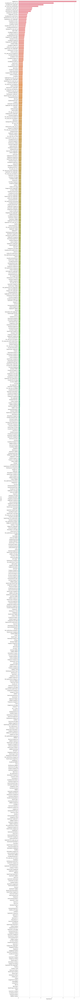

In [50]:
plt.figure(figsize=(12, 200))
sns.barplot(x="Importances", y="Feature Id", data=fe)
plt.xticks(rotation=90)
plt.show()

In [51]:
sub_name = "data/submission_20.csv"
pd.DataFrame(model.predict(X_test), 
            index=range(1461, len(df)+1), 
            columns=['SalePrice']).reset_index().\
            rename(columns={'index': 'id'}).to_csv(sub_name, index=False)

# Score: 0.12258